# 1. Construction for Physics-informed Neural Networks (PINN)

- Neural Networks play the role as modeling to approximate the PDE solution with given condition.
- The Given conditions(Data-driven) solutions in PDE / ODE are set as follows:

$$u_t + N[u; \lambda ] = 0, x \in \Omega, t \in [0,T] $$

where $u(t,x)$ denotes the solution, $N[.; \lambda]$ is a nonlinear operator with parameter $\lambda$, and the domain $\Omega$ is in $\mathbb{R}^D$.
    

# 2. Solving PDE/ ODE from Neural Networks

### 1. PDE / ODE  given boundary condition and initial condition setting

The concept involves employing neural networks to solve differential equations. This is achieved by utilizing a neural network to represent the solution and training it to meet the conditions specified by initial condition and boundary condition of the differential equation.

Consider a system of partial differential equations:

- $ \frac{du}{dt} = f(u, t) $ where $ t$ is in $[0, 1]$ and

- $ u(x, 0) = u_0 $ as given boundary condition.

- $ u(0, t) = g_1(x)$ and $ u(L, t) = g_2(x)$ as given initial condition where $\Omega = [0, L]$.



### 2. Solving the PDE / ODE
To solve this, we approximate the solution as a result of a neural network:

$$ NN(t) \approx u(t) $$

For the assumption as $NN(t)$ were the true solution, then we know $ NN'(t) = f(NN(t), t) $. 

### 3.  Error estimaties by Loss(Cost) function 
Based on the above $NN(t)$, our loss function is:

$$L(\omega) = \sum_i \left(\frac{dNN(t_i)}{dt} - f(NN(t_i), t_i)\right)^2 $$

The $ t_i $ can be chosen in various ways, such as randomly or on a grid. When this loss function is minimized, we have $ \frac{dNN(t_i)}{dt} \approx f(NN(t_i), t_i) $, and thus $ NN(t)$ approximately solves the differential equation.

On the PDE domain $ \Omega \times [0, t_0]$ of $(x,t)$, to reflect the boundary condition $u_0 = u (x, 0)$ and boundary condition $u(0, t), u(L, t)$ of our solution, these terms is added to the loss function:

$$ L(\omega) = \sum_i [ \left(\frac{dNN(t_i)}{dt} - f(NN(t_i), t_i)\right)^2 + (NN(0) - u_0)^2 + (NN(0,t) - u(0,t))^2+ (NN(L,t) - u(L,t))^2] $$

Here, $ \omega $  represents the parameters defining the neural network $ NN $ that approximates $ u $. This process result in finding weights that minimize the loss function.

# 3. Example - One Dimensional Heat Equation

In [38]:
import torch
import torch.nn as nn
from torch.autograd import Variable

import numpy as np



In [39]:
device = torch.device("cpu")

### 3.1 Define the class for Neural Network
We designate Net as our solution $u_\omega (x, t)$.

When constructing the network, it's crucial to consider the number of inputs and outputs. For the input variables, there are x and t. For the output variables, there is one variable u.

We can incorporate as many hidden layers as needed, each with as many neurons as desired. A more intricate network is better equipped to discover complex solutions, but it also demands more data.

Now, create this network as the following codes.
Minimum 8 hidden layers, each containing 5 neurons. The first def code indicates linear transformation of Neural Network, and the second def code means transfromation through Sigmoid activation function.


In [40]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.hidden_layer1 = nn.Linear(2,100) # number of input variables = 2, output variables = 5
        self.hidden_layer2 = nn.Linear(100,100)
        self.hidden_layer3 = nn.Linear(100,100)
        self.hidden_layer4 = nn.Linear(100,100)
        self.hidden_layer5 = nn.Linear(100,100)
        self.hidden_layer6 = nn.Linear(100,100)
        self.hidden_layer7 = nn.Linear(100,100)
        self.hidden_layer8 = nn.Linear(100,100)
        self.output_layer = nn.Linear(100,1)

    def forward(self, x,t):
        inputs = torch.cat([x,t],axis=1) # Merged two single-column arrays into a single array with two columns.
        layer1_out = torch.sigmoid(self.hidden_layer1(inputs)) #Sigmoid function -> σ(x)= 1/(1+exp⁡(-x))
        layer2_out = torch.sigmoid(self.hidden_layer2(layer1_out))
        layer3_out = torch.sigmoid(self.hidden_layer3(layer2_out))
        layer4_out = torch.sigmoid(self.hidden_layer4(layer3_out))
        layer5_out = torch.sigmoid(self.hidden_layer5(layer4_out))
        layer6_out = torch.sigmoid(self.hidden_layer6(layer5_out))
        layer7_out = torch.sigmoid(self.hidden_layer7(layer6_out))
        layer8_out = torch.sigmoid(self.hidden_layer8(layer7_out))
        output = self.output_layer(layer8_out)
        ## For regression, no activation is used in output layer
        return output
# Result of the above class: 
# transformation x,t -> u -> sigmoid(u) through each hiddeon layer

### 3.2 Weight update setting - Optimizer
To iterate the nueral network, we update the weight of the linear model we set in chapter 2 by using Adam Algorithm.

In [41]:
from torch.optim import Adam
net = Net()
net = net.to(device)

# Set cost function as Mean squared error
mse_cost_function = torch.nn.MSELoss()

#Run Adam algorithm with output of the neural network processing.
optimizer = torch.optim.Adam(net.parameters()) 

### 3.3 Setting PDE with drawn u(x,t)
Employing the u(x,t) in the previous step, we set the 1-dimensional equation function f(x,t) for $ x \in [-2, 2]$ and $ t \in [0,1]$. Also we set its loss(cost) function to optimize the error bound.
The Heat equation setting is as follows with the code below:

The function $u(x, t)$, representing heat flow, needs to adhere to the partial differential equation below.
$$u_t = u_{xx}$$
Moreover, we impose two additional conditions. Initially, we set the temperature at both ends of the domain of $x$, specifying u(0, t) and u(L, t). Therefore, we assume that both ends are maintained at a temperature of 0 degrees Celsius:



In [42]:
# Partial Differential Equation (PDE) and its associated loss function.
def pde_loss(x, t, net):
    # The dependent variable 'u' is obtained from the network based on independent variables x and t.
    u = net(x, t)     
    # Before defining the PDE = du/dt - d^2(u)/(dx)^2, we need to compute du/dx and du/dt.
    u_x = torch.autograd.grad(u,x,torch.ones(u.shape),retain_graph=True,create_graph=True)[0]
    #torch.autograd.grad(u.sum(), x, create_graph=True)[0]
    u_xx = torch.autograd.grad(u_x,x,torch.ones(u_x.shape),create_graph=True)[0] 
    #torch.autograd.grad(u_x.sum(), x, create_graph=True)[0]
    # torch.autograd.grad <- Computes and returns the sum of gradients of outputs with respect to the inputs.
    u_t = torch.autograd.grad(u.sum(), t, create_graph=True)[0]
    pde = u_t - u_xx
    return pde


### 3.4 Boundary condition setting
Boundary condition for the heat equation is given as $u(x,0) = sin(\pi x)$ as follows. For the training data on the domain, is it used as the initial data.


In [43]:
# Data for Boundary Conditions
# Initial condition: u(x,0) = sin(pi * x)
# Boundary conditions provide initial data points for training.

# Boundary conditions state that for any x in the range [-2, 2] and time in [0, 1], the value of u is given by sin(pi * x).
# Generate 500 random numbers for x
x_bc = (2 - (-2)) *torch.rand(500,1) - 2
#np.random.uniform(low=0.0, high=6.0, size=(500,1))
t_bc = torch.zeros(500,1)

t_inner = torch.rand(500,1)
#np.zeros((500,1))
# Compute u based on the boundary condition: u(x,0) = sin(pi * x)
u_initial1 = t_bc
u_initial2 = t_bc
u_bc = np.sin(np.pi *x_bc)



### 3.5.1 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.1]$
- training with iteration 20000

We train the data while optimizing the weight in the linear model of neural network.

In [44]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.1, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.6134)
1 Training Loss: tensor(0.5461)
2 Training Loss: tensor(0.5072)
3 Training Loss: tensor(0.4940)
4 Training Loss: tensor(0.4995)
5 Training Loss: tensor(0.5122)
6 Training Loss: tensor(0.5215)
7 Training Loss: tensor(0.5231)
8 Training Loss: tensor(0.5183)
9 Training Loss: tensor(0.5102)
10 Training Loss: tensor(0.5022)
11 Training Loss: tensor(0.4964)
12 Training Loss: tensor(0.4940)
13 Training Loss: tensor(0.4946)
14 Training Loss: tensor(0.4972)
15 Training Loss: tensor(0.5002)
16 Training Loss: tensor(0.5024)
17 Training Loss: tensor(0.5031)
18 Training Loss: tensor(0.5021)
19 Training Loss: tensor(0.5000)
20 Training Loss: tensor(0.4975)
21 Training Loss: tensor(0.4954)
22 Training Loss: tensor(0.4941)
23 Training Loss: tensor(0.4939)
24 Training Loss: tensor(0.4945)
25 Training Loss: tensor(0.4955)
26 Training Loss: tensor(0.4964)
27 Training Loss: tensor(0.4970)
28 Training Loss: tensor(0.4969)
29 Training Loss: tensor(0.4963)
30 Training Loss: te

249 Training Loss: tensor(0.4270)
250 Training Loss: tensor(0.4271)
251 Training Loss: tensor(0.4268)
252 Training Loss: tensor(0.4266)
253 Training Loss: tensor(0.4266)
254 Training Loss: tensor(0.4264)
255 Training Loss: tensor(0.4262)
256 Training Loss: tensor(0.4259)
257 Training Loss: tensor(0.4258)
258 Training Loss: tensor(0.4257)
259 Training Loss: tensor(0.4256)
260 Training Loss: tensor(0.4255)
261 Training Loss: tensor(0.4254)
262 Training Loss: tensor(0.4250)
263 Training Loss: tensor(0.4249)
264 Training Loss: tensor(0.4243)
265 Training Loss: tensor(0.4245)
266 Training Loss: tensor(0.4250)
267 Training Loss: tensor(0.4243)
268 Training Loss: tensor(0.4244)
269 Training Loss: tensor(0.4244)
270 Training Loss: tensor(0.4241)
271 Training Loss: tensor(0.4241)
272 Training Loss: tensor(0.4236)
273 Training Loss: tensor(0.4242)
274 Training Loss: tensor(0.4240)
275 Training Loss: tensor(0.4240)
276 Training Loss: tensor(0.4233)
277 Training Loss: tensor(0.4237)
278 Training L

492 Training Loss: tensor(0.3314)
493 Training Loss: tensor(0.3513)
494 Training Loss: tensor(0.3478)
495 Training Loss: tensor(0.3169)
496 Training Loss: tensor(0.3016)
497 Training Loss: tensor(0.3123)
498 Training Loss: tensor(0.3222)
499 Training Loss: tensor(0.3087)
500 Training Loss: tensor(0.3012)
501 Training Loss: tensor(0.3101)
502 Training Loss: tensor(0.3127)
503 Training Loss: tensor(0.3042)
504 Training Loss: tensor(0.3004)
505 Training Loss: tensor(0.3055)
506 Training Loss: tensor(0.3064)
507 Training Loss: tensor(0.2996)
508 Training Loss: tensor(0.2987)
509 Training Loss: tensor(0.3032)
510 Training Loss: tensor(0.2994)
511 Training Loss: tensor(0.2959)
512 Training Loss: tensor(0.2986)
513 Training Loss: tensor(0.2982)
514 Training Loss: tensor(0.3012)
515 Training Loss: tensor(0.3006)
516 Training Loss: tensor(0.2991)
517 Training Loss: tensor(0.2982)
518 Training Loss: tensor(0.3005)
519 Training Loss: tensor(0.2933)
520 Training Loss: tensor(0.2975)
521 Training L

737 Training Loss: tensor(0.2868)
738 Training Loss: tensor(0.2811)
739 Training Loss: tensor(0.2798)
740 Training Loss: tensor(0.2794)
741 Training Loss: tensor(0.2816)
742 Training Loss: tensor(0.2848)
743 Training Loss: tensor(0.2770)
744 Training Loss: tensor(0.2861)
745 Training Loss: tensor(0.2803)
746 Training Loss: tensor(0.2726)
747 Training Loss: tensor(0.2791)
748 Training Loss: tensor(0.2784)
749 Training Loss: tensor(0.2785)
750 Training Loss: tensor(0.2753)
751 Training Loss: tensor(0.2829)
752 Training Loss: tensor(0.2772)
753 Training Loss: tensor(0.2800)
754 Training Loss: tensor(0.2783)
755 Training Loss: tensor(0.2782)
756 Training Loss: tensor(0.2849)
757 Training Loss: tensor(0.2805)
758 Training Loss: tensor(0.2812)
759 Training Loss: tensor(0.2840)
760 Training Loss: tensor(0.2833)
761 Training Loss: tensor(0.2801)
762 Training Loss: tensor(0.2831)
763 Training Loss: tensor(0.2821)
764 Training Loss: tensor(0.2740)
765 Training Loss: tensor(0.2778)
766 Training L

979 Training Loss: tensor(0.2986)
980 Training Loss: tensor(0.2776)
981 Training Loss: tensor(0.2669)
982 Training Loss: tensor(0.2755)
983 Training Loss: tensor(0.2878)
984 Training Loss: tensor(0.2811)
985 Training Loss: tensor(0.2694)
986 Training Loss: tensor(0.2783)
987 Training Loss: tensor(0.2822)
988 Training Loss: tensor(0.2672)
989 Training Loss: tensor(0.2701)
990 Training Loss: tensor(0.2739)
991 Training Loss: tensor(0.2760)
992 Training Loss: tensor(0.2682)
993 Training Loss: tensor(0.2692)
994 Training Loss: tensor(0.2731)
995 Training Loss: tensor(0.2688)
996 Training Loss: tensor(0.2652)
997 Training Loss: tensor(0.2702)
998 Training Loss: tensor(0.2781)
999 Training Loss: tensor(0.2704)
1000 Training Loss: tensor(0.2671)
1001 Training Loss: tensor(0.2759)
1002 Training Loss: tensor(0.2672)
1003 Training Loss: tensor(0.2696)
1004 Training Loss: tensor(0.2629)
1005 Training Loss: tensor(0.2669)
1006 Training Loss: tensor(0.2683)
1007 Training Loss: tensor(0.2609)
1008 T

1219 Training Loss: tensor(0.2586)
1220 Training Loss: tensor(0.2609)
1221 Training Loss: tensor(0.2589)
1222 Training Loss: tensor(0.2559)
1223 Training Loss: tensor(0.2655)
1224 Training Loss: tensor(0.2624)
1225 Training Loss: tensor(0.2510)
1226 Training Loss: tensor(0.2551)
1227 Training Loss: tensor(0.2582)
1228 Training Loss: tensor(0.2614)
1229 Training Loss: tensor(0.2615)
1230 Training Loss: tensor(0.2575)
1231 Training Loss: tensor(0.2532)
1232 Training Loss: tensor(0.2582)
1233 Training Loss: tensor(0.2587)
1234 Training Loss: tensor(0.2596)
1235 Training Loss: tensor(0.2584)
1236 Training Loss: tensor(0.2583)
1237 Training Loss: tensor(0.2614)
1238 Training Loss: tensor(0.2671)
1239 Training Loss: tensor(0.2805)
1240 Training Loss: tensor(0.2904)
1241 Training Loss: tensor(0.3049)
1242 Training Loss: tensor(0.3102)
1243 Training Loss: tensor(0.3060)
1244 Training Loss: tensor(0.2870)
1245 Training Loss: tensor(0.2633)
1246 Training Loss: tensor(0.2574)
1247 Training Loss: 

1460 Training Loss: tensor(0.2640)
1461 Training Loss: tensor(0.2714)
1462 Training Loss: tensor(0.2893)
1463 Training Loss: tensor(0.2996)
1464 Training Loss: tensor(0.2977)
1465 Training Loss: tensor(0.2785)
1466 Training Loss: tensor(0.2600)
1467 Training Loss: tensor(0.2378)
1468 Training Loss: tensor(0.2330)
1469 Training Loss: tensor(0.2503)
1470 Training Loss: tensor(0.2597)
1471 Training Loss: tensor(0.2550)
1472 Training Loss: tensor(0.2489)
1473 Training Loss: tensor(0.2392)
1474 Training Loss: tensor(0.2391)
1475 Training Loss: tensor(0.2421)
1476 Training Loss: tensor(0.2407)
1477 Training Loss: tensor(0.2430)
1478 Training Loss: tensor(0.2363)
1479 Training Loss: tensor(0.2399)
1480 Training Loss: tensor(0.2335)
1481 Training Loss: tensor(0.2395)
1482 Training Loss: tensor(0.2409)
1483 Training Loss: tensor(0.2404)
1484 Training Loss: tensor(0.2414)
1485 Training Loss: tensor(0.2348)
1486 Training Loss: tensor(0.2346)
1487 Training Loss: tensor(0.2365)
1488 Training Loss: 

1701 Training Loss: tensor(0.2071)
1702 Training Loss: tensor(0.2066)
1703 Training Loss: tensor(0.2003)
1704 Training Loss: tensor(0.2051)
1705 Training Loss: tensor(0.2038)
1706 Training Loss: tensor(0.2000)
1707 Training Loss: tensor(0.1989)
1708 Training Loss: tensor(0.2045)
1709 Training Loss: tensor(0.2000)
1710 Training Loss: tensor(0.2014)
1711 Training Loss: tensor(0.1978)
1712 Training Loss: tensor(0.1989)
1713 Training Loss: tensor(0.1994)
1714 Training Loss: tensor(0.2059)
1715 Training Loss: tensor(0.2013)
1716 Training Loss: tensor(0.1999)
1717 Training Loss: tensor(0.2024)
1718 Training Loss: tensor(0.2012)
1719 Training Loss: tensor(0.1983)
1720 Training Loss: tensor(0.1993)
1721 Training Loss: tensor(0.1977)
1722 Training Loss: tensor(0.2000)
1723 Training Loss: tensor(0.1985)
1724 Training Loss: tensor(0.1990)
1725 Training Loss: tensor(0.1976)
1726 Training Loss: tensor(0.2014)
1727 Training Loss: tensor(0.1981)
1728 Training Loss: tensor(0.1970)
1729 Training Loss: 

1937 Training Loss: tensor(0.1692)
1938 Training Loss: tensor(0.1452)
1939 Training Loss: tensor(0.1559)
1940 Training Loss: tensor(0.1725)
1941 Training Loss: tensor(0.1687)
1942 Training Loss: tensor(0.1418)
1943 Training Loss: tensor(0.1487)
1944 Training Loss: tensor(0.1518)
1945 Training Loss: tensor(0.1593)
1946 Training Loss: tensor(0.1477)
1947 Training Loss: tensor(0.1482)
1948 Training Loss: tensor(0.1450)
1949 Training Loss: tensor(0.1564)
1950 Training Loss: tensor(0.1494)
1951 Training Loss: tensor(0.1361)
1952 Training Loss: tensor(0.1377)
1953 Training Loss: tensor(0.1437)
1954 Training Loss: tensor(0.1463)
1955 Training Loss: tensor(0.1432)
1956 Training Loss: tensor(0.1375)
1957 Training Loss: tensor(0.1378)
1958 Training Loss: tensor(0.1415)
1959 Training Loss: tensor(0.1425)
1960 Training Loss: tensor(0.1357)
1961 Training Loss: tensor(0.1359)
1962 Training Loss: tensor(0.1326)
1963 Training Loss: tensor(0.1351)
1964 Training Loss: tensor(0.1374)
1965 Training Loss: 

2174 Training Loss: tensor(0.0976)
2175 Training Loss: tensor(0.1083)
2176 Training Loss: tensor(0.1458)
2177 Training Loss: tensor(0.1851)
2178 Training Loss: tensor(0.1444)
2179 Training Loss: tensor(0.1042)
2180 Training Loss: tensor(0.0983)
2181 Training Loss: tensor(0.1187)
2182 Training Loss: tensor(0.1438)
2183 Training Loss: tensor(0.1143)
2184 Training Loss: tensor(0.0986)
2185 Training Loss: tensor(0.1029)
2186 Training Loss: tensor(0.1202)
2187 Training Loss: tensor(0.1054)
2188 Training Loss: tensor(0.0998)
2189 Training Loss: tensor(0.0918)
2190 Training Loss: tensor(0.1064)
2191 Training Loss: tensor(0.0958)
2192 Training Loss: tensor(0.0909)
2193 Training Loss: tensor(0.0893)
2194 Training Loss: tensor(0.1052)
2195 Training Loss: tensor(0.1036)
2196 Training Loss: tensor(0.1026)
2197 Training Loss: tensor(0.0890)
2198 Training Loss: tensor(0.0912)
2199 Training Loss: tensor(0.0967)
2200 Training Loss: tensor(0.0961)
2201 Training Loss: tensor(0.0903)
2202 Training Loss: 

2409 Training Loss: tensor(0.0775)
2410 Training Loss: tensor(0.0796)
2411 Training Loss: tensor(0.1177)
2412 Training Loss: tensor(0.1485)
2413 Training Loss: tensor(0.1162)
2414 Training Loss: tensor(0.0800)
2415 Training Loss: tensor(0.0743)
2416 Training Loss: tensor(0.0941)
2417 Training Loss: tensor(0.1029)
2418 Training Loss: tensor(0.0955)
2419 Training Loss: tensor(0.0698)
2420 Training Loss: tensor(0.0689)
2421 Training Loss: tensor(0.0852)
2422 Training Loss: tensor(0.0828)
2423 Training Loss: tensor(0.0705)
2424 Training Loss: tensor(0.0631)
2425 Training Loss: tensor(0.0813)
2426 Training Loss: tensor(0.0914)
2427 Training Loss: tensor(0.0813)
2428 Training Loss: tensor(0.0619)
2429 Training Loss: tensor(0.0656)
2430 Training Loss: tensor(0.0738)
2431 Training Loss: tensor(0.0796)
2432 Training Loss: tensor(0.0632)
2433 Training Loss: tensor(0.0607)
2434 Training Loss: tensor(0.0681)
2435 Training Loss: tensor(0.0701)
2436 Training Loss: tensor(0.0642)
2437 Training Loss: 

2649 Training Loss: tensor(0.0526)
2650 Training Loss: tensor(0.0521)
2651 Training Loss: tensor(0.0502)
2652 Training Loss: tensor(0.0489)
2653 Training Loss: tensor(0.0493)
2654 Training Loss: tensor(0.0479)
2655 Training Loss: tensor(0.0478)
2656 Training Loss: tensor(0.0463)
2657 Training Loss: tensor(0.0425)
2658 Training Loss: tensor(0.0496)
2659 Training Loss: tensor(0.0477)
2660 Training Loss: tensor(0.0521)
2661 Training Loss: tensor(0.0503)
2662 Training Loss: tensor(0.0463)
2663 Training Loss: tensor(0.0449)
2664 Training Loss: tensor(0.0487)
2665 Training Loss: tensor(0.0486)
2666 Training Loss: tensor(0.0535)
2667 Training Loss: tensor(0.0453)
2668 Training Loss: tensor(0.0557)
2669 Training Loss: tensor(0.0451)
2670 Training Loss: tensor(0.0468)
2671 Training Loss: tensor(0.0515)
2672 Training Loss: tensor(0.0537)
2673 Training Loss: tensor(0.0579)
2674 Training Loss: tensor(0.0595)
2675 Training Loss: tensor(0.0616)
2676 Training Loss: tensor(0.0624)
2677 Training Loss: 

2887 Training Loss: tensor(0.0516)
2888 Training Loss: tensor(0.0494)
2889 Training Loss: tensor(0.0392)
2890 Training Loss: tensor(0.0381)
2891 Training Loss: tensor(0.0340)
2892 Training Loss: tensor(0.0413)
2893 Training Loss: tensor(0.0446)
2894 Training Loss: tensor(0.0490)
2895 Training Loss: tensor(0.0437)
2896 Training Loss: tensor(0.0434)
2897 Training Loss: tensor(0.0397)
2898 Training Loss: tensor(0.0401)
2899 Training Loss: tensor(0.0370)
2900 Training Loss: tensor(0.0421)
2901 Training Loss: tensor(0.0408)
2902 Training Loss: tensor(0.0352)
2903 Training Loss: tensor(0.0421)
2904 Training Loss: tensor(0.0354)
2905 Training Loss: tensor(0.0336)
2906 Training Loss: tensor(0.0356)
2907 Training Loss: tensor(0.0332)
2908 Training Loss: tensor(0.0398)
2909 Training Loss: tensor(0.0352)
2910 Training Loss: tensor(0.0425)
2911 Training Loss: tensor(0.0377)
2912 Training Loss: tensor(0.0354)
2913 Training Loss: tensor(0.0394)
2914 Training Loss: tensor(0.0393)
2915 Training Loss: 

3123 Training Loss: tensor(0.0338)
3124 Training Loss: tensor(0.0326)
3125 Training Loss: tensor(0.0302)
3126 Training Loss: tensor(0.0310)
3127 Training Loss: tensor(0.0289)
3128 Training Loss: tensor(0.0282)
3129 Training Loss: tensor(0.0312)
3130 Training Loss: tensor(0.0300)
3131 Training Loss: tensor(0.0349)
3132 Training Loss: tensor(0.0380)
3133 Training Loss: tensor(0.0414)
3134 Training Loss: tensor(0.0437)
3135 Training Loss: tensor(0.0490)
3136 Training Loss: tensor(0.0610)
3137 Training Loss: tensor(0.0755)
3138 Training Loss: tensor(0.1053)
3139 Training Loss: tensor(0.1068)
3140 Training Loss: tensor(0.1291)
3141 Training Loss: tensor(0.1256)
3142 Training Loss: tensor(0.1333)
3143 Training Loss: tensor(0.1033)
3144 Training Loss: tensor(0.0822)
3145 Training Loss: tensor(0.0561)
3146 Training Loss: tensor(0.0342)
3147 Training Loss: tensor(0.0316)
3148 Training Loss: tensor(0.0504)
3149 Training Loss: tensor(0.0611)
3150 Training Loss: tensor(0.0631)
3151 Training Loss: 

3359 Training Loss: tensor(0.0371)
3360 Training Loss: tensor(0.0312)
3361 Training Loss: tensor(0.0326)
3362 Training Loss: tensor(0.0312)
3363 Training Loss: tensor(0.0295)
3364 Training Loss: tensor(0.0278)
3365 Training Loss: tensor(0.0301)
3366 Training Loss: tensor(0.0288)
3367 Training Loss: tensor(0.0311)
3368 Training Loss: tensor(0.0293)
3369 Training Loss: tensor(0.0315)
3370 Training Loss: tensor(0.0260)
3371 Training Loss: tensor(0.0284)
3372 Training Loss: tensor(0.0260)
3373 Training Loss: tensor(0.0272)
3374 Training Loss: tensor(0.0259)
3375 Training Loss: tensor(0.0291)
3376 Training Loss: tensor(0.0286)
3377 Training Loss: tensor(0.0308)
3378 Training Loss: tensor(0.0281)
3379 Training Loss: tensor(0.0311)
3380 Training Loss: tensor(0.0287)
3381 Training Loss: tensor(0.0297)
3382 Training Loss: tensor(0.0360)
3383 Training Loss: tensor(0.0281)
3384 Training Loss: tensor(0.0302)
3385 Training Loss: tensor(0.0306)
3386 Training Loss: tensor(0.0273)
3387 Training Loss: 

3596 Training Loss: tensor(0.0255)
3597 Training Loss: tensor(0.0227)
3598 Training Loss: tensor(0.0241)
3599 Training Loss: tensor(0.0228)
3600 Training Loss: tensor(0.0231)
3601 Training Loss: tensor(0.0241)
3602 Training Loss: tensor(0.0236)
3603 Training Loss: tensor(0.0214)
3604 Training Loss: tensor(0.0317)
3605 Training Loss: tensor(0.0250)
3606 Training Loss: tensor(0.0341)
3607 Training Loss: tensor(0.0285)
3608 Training Loss: tensor(0.0278)
3609 Training Loss: tensor(0.0293)
3610 Training Loss: tensor(0.0225)
3611 Training Loss: tensor(0.0233)
3612 Training Loss: tensor(0.0223)
3613 Training Loss: tensor(0.0290)
3614 Training Loss: tensor(0.0338)
3615 Training Loss: tensor(0.0396)
3616 Training Loss: tensor(0.0466)
3617 Training Loss: tensor(0.0585)
3618 Training Loss: tensor(0.0638)
3619 Training Loss: tensor(0.0710)
3620 Training Loss: tensor(0.0611)
3621 Training Loss: tensor(0.0536)
3622 Training Loss: tensor(0.0358)
3623 Training Loss: tensor(0.0321)
3624 Training Loss: 

3835 Training Loss: tensor(0.0244)
3836 Training Loss: tensor(0.0223)
3837 Training Loss: tensor(0.0235)
3838 Training Loss: tensor(0.0239)
3839 Training Loss: tensor(0.0227)
3840 Training Loss: tensor(0.0252)
3841 Training Loss: tensor(0.0221)
3842 Training Loss: tensor(0.0257)
3843 Training Loss: tensor(0.0233)
3844 Training Loss: tensor(0.0244)
3845 Training Loss: tensor(0.0270)
3846 Training Loss: tensor(0.0235)
3847 Training Loss: tensor(0.0246)
3848 Training Loss: tensor(0.0234)
3849 Training Loss: tensor(0.0200)
3850 Training Loss: tensor(0.0237)
3851 Training Loss: tensor(0.0204)
3852 Training Loss: tensor(0.0261)
3853 Training Loss: tensor(0.0253)
3854 Training Loss: tensor(0.0238)
3855 Training Loss: tensor(0.0226)
3856 Training Loss: tensor(0.0247)
3857 Training Loss: tensor(0.0216)
3858 Training Loss: tensor(0.0242)
3859 Training Loss: tensor(0.0239)
3860 Training Loss: tensor(0.0205)
3861 Training Loss: tensor(0.0204)
3862 Training Loss: tensor(0.0221)
3863 Training Loss: 

4075 Training Loss: tensor(0.0250)
4076 Training Loss: tensor(0.0220)
4077 Training Loss: tensor(0.0233)
4078 Training Loss: tensor(0.0199)
4079 Training Loss: tensor(0.0247)
4080 Training Loss: tensor(0.0232)
4081 Training Loss: tensor(0.0240)
4082 Training Loss: tensor(0.0197)
4083 Training Loss: tensor(0.0193)
4084 Training Loss: tensor(0.0226)
4085 Training Loss: tensor(0.0248)
4086 Training Loss: tensor(0.0201)
4087 Training Loss: tensor(0.0229)
4088 Training Loss: tensor(0.0192)
4089 Training Loss: tensor(0.0217)
4090 Training Loss: tensor(0.0201)
4091 Training Loss: tensor(0.0219)
4092 Training Loss: tensor(0.0220)
4093 Training Loss: tensor(0.0219)
4094 Training Loss: tensor(0.0211)
4095 Training Loss: tensor(0.0195)
4096 Training Loss: tensor(0.0189)
4097 Training Loss: tensor(0.0201)
4098 Training Loss: tensor(0.0219)
4099 Training Loss: tensor(0.0199)
4100 Training Loss: tensor(0.0203)
4101 Training Loss: tensor(0.0187)
4102 Training Loss: tensor(0.0196)
4103 Training Loss: 

4315 Training Loss: tensor(0.0231)
4316 Training Loss: tensor(0.0217)
4317 Training Loss: tensor(0.0216)
4318 Training Loss: tensor(0.0207)
4319 Training Loss: tensor(0.0237)
4320 Training Loss: tensor(0.0253)
4321 Training Loss: tensor(0.0266)
4322 Training Loss: tensor(0.0274)
4323 Training Loss: tensor(0.0358)
4324 Training Loss: tensor(0.0372)
4325 Training Loss: tensor(0.0424)
4326 Training Loss: tensor(0.0512)
4327 Training Loss: tensor(0.0684)
4328 Training Loss: tensor(0.0753)
4329 Training Loss: tensor(0.1008)
4330 Training Loss: tensor(0.1144)
4331 Training Loss: tensor(0.1460)
4332 Training Loss: tensor(0.1428)
4333 Training Loss: tensor(0.1272)
4334 Training Loss: tensor(0.0734)
4335 Training Loss: tensor(0.0370)
4336 Training Loss: tensor(0.0190)
4337 Training Loss: tensor(0.0306)
4338 Training Loss: tensor(0.0483)
4339 Training Loss: tensor(0.0557)
4340 Training Loss: tensor(0.0455)
4341 Training Loss: tensor(0.0271)
4342 Training Loss: tensor(0.0187)
4343 Training Loss: 

4550 Training Loss: tensor(0.0165)
4551 Training Loss: tensor(0.0165)
4552 Training Loss: tensor(0.0153)
4553 Training Loss: tensor(0.0165)
4554 Training Loss: tensor(0.0154)
4555 Training Loss: tensor(0.0154)
4556 Training Loss: tensor(0.0155)
4557 Training Loss: tensor(0.0165)
4558 Training Loss: tensor(0.0142)
4559 Training Loss: tensor(0.0151)
4560 Training Loss: tensor(0.0150)
4561 Training Loss: tensor(0.0177)
4562 Training Loss: tensor(0.0171)
4563 Training Loss: tensor(0.0167)
4564 Training Loss: tensor(0.0179)
4565 Training Loss: tensor(0.0152)
4566 Training Loss: tensor(0.0178)
4567 Training Loss: tensor(0.0186)
4568 Training Loss: tensor(0.0188)
4569 Training Loss: tensor(0.0157)
4570 Training Loss: tensor(0.0169)
4571 Training Loss: tensor(0.0162)
4572 Training Loss: tensor(0.0196)
4573 Training Loss: tensor(0.0193)
4574 Training Loss: tensor(0.0210)
4575 Training Loss: tensor(0.0189)
4576 Training Loss: tensor(0.0155)
4577 Training Loss: tensor(0.0163)
4578 Training Loss: 

4786 Training Loss: tensor(0.0255)
4787 Training Loss: tensor(0.0272)
4788 Training Loss: tensor(0.0255)
4789 Training Loss: tensor(0.0245)
4790 Training Loss: tensor(0.0219)
4791 Training Loss: tensor(0.0213)
4792 Training Loss: tensor(0.0170)
4793 Training Loss: tensor(0.0169)
4794 Training Loss: tensor(0.0148)
4795 Training Loss: tensor(0.0137)
4796 Training Loss: tensor(0.0135)
4797 Training Loss: tensor(0.0145)
4798 Training Loss: tensor(0.0141)
4799 Training Loss: tensor(0.0128)
4800 Training Loss: tensor(0.0135)
4801 Training Loss: tensor(0.0124)
4802 Training Loss: tensor(0.0151)
4803 Training Loss: tensor(0.0144)
4804 Training Loss: tensor(0.0164)
4805 Training Loss: tensor(0.0190)
4806 Training Loss: tensor(0.0236)
4807 Training Loss: tensor(0.0335)
4808 Training Loss: tensor(0.0452)
4809 Training Loss: tensor(0.0683)
4810 Training Loss: tensor(0.1028)
4811 Training Loss: tensor(0.1467)
4812 Training Loss: tensor(0.2560)
4813 Training Loss: tensor(0.3158)
4814 Training Loss: 

5023 Training Loss: tensor(0.0132)
5024 Training Loss: tensor(0.0141)
5025 Training Loss: tensor(0.0132)
5026 Training Loss: tensor(0.0141)
5027 Training Loss: tensor(0.0150)
5028 Training Loss: tensor(0.0127)
5029 Training Loss: tensor(0.0155)
5030 Training Loss: tensor(0.0179)
5031 Training Loss: tensor(0.0202)
5032 Training Loss: tensor(0.0161)
5033 Training Loss: tensor(0.0170)
5034 Training Loss: tensor(0.0141)
5035 Training Loss: tensor(0.0141)
5036 Training Loss: tensor(0.0134)
5037 Training Loss: tensor(0.0123)
5038 Training Loss: tensor(0.0152)
5039 Training Loss: tensor(0.0171)
5040 Training Loss: tensor(0.0188)
5041 Training Loss: tensor(0.0195)
5042 Training Loss: tensor(0.0227)
5043 Training Loss: tensor(0.0201)
5044 Training Loss: tensor(0.0222)
5045 Training Loss: tensor(0.0176)
5046 Training Loss: tensor(0.0190)
5047 Training Loss: tensor(0.0140)
5048 Training Loss: tensor(0.0193)
5049 Training Loss: tensor(0.0155)
5050 Training Loss: tensor(0.0137)
5051 Training Loss: 

5260 Training Loss: tensor(0.0314)
5261 Training Loss: tensor(0.0356)
5262 Training Loss: tensor(0.0417)
5263 Training Loss: tensor(0.0410)
5264 Training Loss: tensor(0.0387)
5265 Training Loss: tensor(0.0330)
5266 Training Loss: tensor(0.0219)
5267 Training Loss: tensor(0.0209)
5268 Training Loss: tensor(0.0133)
5269 Training Loss: tensor(0.0164)
5270 Training Loss: tensor(0.0139)
5271 Training Loss: tensor(0.0128)
5272 Training Loss: tensor(0.0191)
5273 Training Loss: tensor(0.0138)
5274 Training Loss: tensor(0.0185)
5275 Training Loss: tensor(0.0155)
5276 Training Loss: tensor(0.0178)
5277 Training Loss: tensor(0.0196)
5278 Training Loss: tensor(0.0147)
5279 Training Loss: tensor(0.0194)
5280 Training Loss: tensor(0.0156)
5281 Training Loss: tensor(0.0158)
5282 Training Loss: tensor(0.0111)
5283 Training Loss: tensor(0.0156)
5284 Training Loss: tensor(0.0178)
5285 Training Loss: tensor(0.0134)
5286 Training Loss: tensor(0.0228)
5287 Training Loss: tensor(0.0176)
5288 Training Loss: 

5496 Training Loss: tensor(0.0167)
5497 Training Loss: tensor(0.0215)
5498 Training Loss: tensor(0.0189)
5499 Training Loss: tensor(0.0214)
5500 Training Loss: tensor(0.0224)
5501 Training Loss: tensor(0.0183)
5502 Training Loss: tensor(0.0207)
5503 Training Loss: tensor(0.0118)
5504 Training Loss: tensor(0.0138)
5505 Training Loss: tensor(0.0125)
5506 Training Loss: tensor(0.0124)
5507 Training Loss: tensor(0.0123)
5508 Training Loss: tensor(0.0115)
5509 Training Loss: tensor(0.0170)
5510 Training Loss: tensor(0.0128)
5511 Training Loss: tensor(0.0140)
5512 Training Loss: tensor(0.0155)
5513 Training Loss: tensor(0.0172)
5514 Training Loss: tensor(0.0178)
5515 Training Loss: tensor(0.0151)
5516 Training Loss: tensor(0.0181)
5517 Training Loss: tensor(0.0180)
5518 Training Loss: tensor(0.0186)
5519 Training Loss: tensor(0.0190)
5520 Training Loss: tensor(0.0195)
5521 Training Loss: tensor(0.0238)
5522 Training Loss: tensor(0.0243)
5523 Training Loss: tensor(0.0346)
5524 Training Loss: 

5734 Training Loss: tensor(0.0138)
5735 Training Loss: tensor(0.0165)
5736 Training Loss: tensor(0.0211)
5737 Training Loss: tensor(0.0262)
5738 Training Loss: tensor(0.0318)
5739 Training Loss: tensor(0.0328)
5740 Training Loss: tensor(0.0403)
5741 Training Loss: tensor(0.0503)
5742 Training Loss: tensor(0.0599)
5743 Training Loss: tensor(0.0694)
5744 Training Loss: tensor(0.0729)
5745 Training Loss: tensor(0.0629)
5746 Training Loss: tensor(0.0532)
5747 Training Loss: tensor(0.0435)
5748 Training Loss: tensor(0.0293)
5749 Training Loss: tensor(0.0175)
5750 Training Loss: tensor(0.0133)
5751 Training Loss: tensor(0.0105)
5752 Training Loss: tensor(0.0191)
5753 Training Loss: tensor(0.0269)
5754 Training Loss: tensor(0.0288)
5755 Training Loss: tensor(0.0234)
5756 Training Loss: tensor(0.0159)
5757 Training Loss: tensor(0.0130)
5758 Training Loss: tensor(0.0105)
5759 Training Loss: tensor(0.0188)
5760 Training Loss: tensor(0.0214)
5761 Training Loss: tensor(0.0216)
5762 Training Loss: 

5970 Training Loss: tensor(0.0147)
5971 Training Loss: tensor(0.0161)
5972 Training Loss: tensor(0.0127)
5973 Training Loss: tensor(0.0105)
5974 Training Loss: tensor(0.0091)
5975 Training Loss: tensor(0.0093)
5976 Training Loss: tensor(0.0134)
5977 Training Loss: tensor(0.0163)
5978 Training Loss: tensor(0.0168)
5979 Training Loss: tensor(0.0185)
5980 Training Loss: tensor(0.0139)
5981 Training Loss: tensor(0.0111)
5982 Training Loss: tensor(0.0087)
5983 Training Loss: tensor(0.0085)
5984 Training Loss: tensor(0.0102)
5985 Training Loss: tensor(0.0127)
5986 Training Loss: tensor(0.0122)
5987 Training Loss: tensor(0.0103)
5988 Training Loss: tensor(0.0106)
5989 Training Loss: tensor(0.0088)
5990 Training Loss: tensor(0.0080)
5991 Training Loss: tensor(0.0096)
5992 Training Loss: tensor(0.0121)
5993 Training Loss: tensor(0.0134)
5994 Training Loss: tensor(0.0186)
5995 Training Loss: tensor(0.0179)
5996 Training Loss: tensor(0.0193)
5997 Training Loss: tensor(0.0183)
5998 Training Loss: 

6208 Training Loss: tensor(0.0480)
6209 Training Loss: tensor(0.0537)
6210 Training Loss: tensor(0.0680)
6211 Training Loss: tensor(0.0852)
6212 Training Loss: tensor(0.0864)
6213 Training Loss: tensor(0.0706)
6214 Training Loss: tensor(0.0521)
6215 Training Loss: tensor(0.0293)
6216 Training Loss: tensor(0.0131)
6217 Training Loss: tensor(0.0104)
6218 Training Loss: tensor(0.0141)
6219 Training Loss: tensor(0.0230)
6220 Training Loss: tensor(0.0303)
6221 Training Loss: tensor(0.0329)
6222 Training Loss: tensor(0.0281)
6223 Training Loss: tensor(0.0191)
6224 Training Loss: tensor(0.0117)
6225 Training Loss: tensor(0.0108)
6226 Training Loss: tensor(0.0178)
6227 Training Loss: tensor(0.0195)
6228 Training Loss: tensor(0.0232)
6229 Training Loss: tensor(0.0193)
6230 Training Loss: tensor(0.0121)
6231 Training Loss: tensor(0.0103)
6232 Training Loss: tensor(0.0102)
6233 Training Loss: tensor(0.0137)
6234 Training Loss: tensor(0.0143)
6235 Training Loss: tensor(0.0146)
6236 Training Loss: 

6446 Training Loss: tensor(0.0096)
6447 Training Loss: tensor(0.0127)
6448 Training Loss: tensor(0.0111)
6449 Training Loss: tensor(0.0125)
6450 Training Loss: tensor(0.0108)
6451 Training Loss: tensor(0.0098)
6452 Training Loss: tensor(0.0094)
6453 Training Loss: tensor(0.0096)
6454 Training Loss: tensor(0.0120)
6455 Training Loss: tensor(0.0110)
6456 Training Loss: tensor(0.0105)
6457 Training Loss: tensor(0.0082)
6458 Training Loss: tensor(0.0079)
6459 Training Loss: tensor(0.0103)
6460 Training Loss: tensor(0.0104)
6461 Training Loss: tensor(0.0107)
6462 Training Loss: tensor(0.0108)
6463 Training Loss: tensor(0.0103)
6464 Training Loss: tensor(0.0119)
6465 Training Loss: tensor(0.0093)
6466 Training Loss: tensor(0.0084)
6467 Training Loss: tensor(0.0098)
6468 Training Loss: tensor(0.0080)
6469 Training Loss: tensor(0.0089)
6470 Training Loss: tensor(0.0082)
6471 Training Loss: tensor(0.0075)
6472 Training Loss: tensor(0.0074)
6473 Training Loss: tensor(0.0075)
6474 Training Loss: 

6682 Training Loss: tensor(0.0120)
6683 Training Loss: tensor(0.0146)
6684 Training Loss: tensor(0.0190)
6685 Training Loss: tensor(0.0229)
6686 Training Loss: tensor(0.0233)
6687 Training Loss: tensor(0.0235)
6688 Training Loss: tensor(0.0199)
6689 Training Loss: tensor(0.0174)
6690 Training Loss: tensor(0.0133)
6691 Training Loss: tensor(0.0095)
6692 Training Loss: tensor(0.0088)
6693 Training Loss: tensor(0.0081)
6694 Training Loss: tensor(0.0082)
6695 Training Loss: tensor(0.0084)
6696 Training Loss: tensor(0.0081)
6697 Training Loss: tensor(0.0091)
6698 Training Loss: tensor(0.0108)
6699 Training Loss: tensor(0.0122)
6700 Training Loss: tensor(0.0110)
6701 Training Loss: tensor(0.0116)
6702 Training Loss: tensor(0.0138)
6703 Training Loss: tensor(0.0138)
6704 Training Loss: tensor(0.0168)
6705 Training Loss: tensor(0.0185)
6706 Training Loss: tensor(0.0228)
6707 Training Loss: tensor(0.0265)
6708 Training Loss: tensor(0.0335)
6709 Training Loss: tensor(0.0461)
6710 Training Loss: 

6918 Training Loss: tensor(0.0098)
6919 Training Loss: tensor(0.0110)
6920 Training Loss: tensor(0.0150)
6921 Training Loss: tensor(0.0227)
6922 Training Loss: tensor(0.0413)
6923 Training Loss: tensor(0.0608)
6924 Training Loss: tensor(0.0826)
6925 Training Loss: tensor(0.1179)
6926 Training Loss: tensor(0.1355)
6927 Training Loss: tensor(0.1528)
6928 Training Loss: tensor(0.1378)
6929 Training Loss: tensor(0.1043)
6930 Training Loss: tensor(0.0387)
6931 Training Loss: tensor(0.0119)
6932 Training Loss: tensor(0.0237)
6933 Training Loss: tensor(0.0564)
6934 Training Loss: tensor(0.0679)
6935 Training Loss: tensor(0.0413)
6936 Training Loss: tensor(0.0110)
6937 Training Loss: tensor(0.0161)
6938 Training Loss: tensor(0.0328)
6939 Training Loss: tensor(0.0404)
6940 Training Loss: tensor(0.0235)
6941 Training Loss: tensor(0.0090)
6942 Training Loss: tensor(0.0149)
6943 Training Loss: tensor(0.0291)
6944 Training Loss: tensor(0.0273)
6945 Training Loss: tensor(0.0135)
6946 Training Loss: 

7154 Training Loss: tensor(0.0263)
7155 Training Loss: tensor(0.0426)
7156 Training Loss: tensor(0.0208)
7157 Training Loss: tensor(0.0141)
7158 Training Loss: tensor(0.0316)
7159 Training Loss: tensor(0.0207)
7160 Training Loss: tensor(0.0107)
7161 Training Loss: tensor(0.0208)
7162 Training Loss: tensor(0.0223)
7163 Training Loss: tensor(0.0105)
7164 Training Loss: tensor(0.0144)
7165 Training Loss: tensor(0.0185)
7166 Training Loss: tensor(0.0111)
7167 Training Loss: tensor(0.0103)
7168 Training Loss: tensor(0.0143)
7169 Training Loss: tensor(0.0132)
7170 Training Loss: tensor(0.0090)
7171 Training Loss: tensor(0.0121)
7172 Training Loss: tensor(0.0115)
7173 Training Loss: tensor(0.0076)
7174 Training Loss: tensor(0.0085)
7175 Training Loss: tensor(0.0099)
7176 Training Loss: tensor(0.0084)
7177 Training Loss: tensor(0.0082)
7178 Training Loss: tensor(0.0079)
7179 Training Loss: tensor(0.0084)
7180 Training Loss: tensor(0.0079)
7181 Training Loss: tensor(0.0074)
7182 Training Loss: 

7391 Training Loss: tensor(0.0128)
7392 Training Loss: tensor(0.0150)
7393 Training Loss: tensor(0.0168)
7394 Training Loss: tensor(0.0201)
7395 Training Loss: tensor(0.0219)
7396 Training Loss: tensor(0.0200)
7397 Training Loss: tensor(0.0177)
7398 Training Loss: tensor(0.0132)
7399 Training Loss: tensor(0.0118)
7400 Training Loss: tensor(0.0064)
7401 Training Loss: tensor(0.0079)
7402 Training Loss: tensor(0.0064)
7403 Training Loss: tensor(0.0097)
7404 Training Loss: tensor(0.0149)
7405 Training Loss: tensor(0.0195)
7406 Training Loss: tensor(0.0326)
7407 Training Loss: tensor(0.0396)
7408 Training Loss: tensor(0.0513)
7409 Training Loss: tensor(0.0606)
7410 Training Loss: tensor(0.0598)
7411 Training Loss: tensor(0.0664)
7412 Training Loss: tensor(0.0561)
7413 Training Loss: tensor(0.0354)
7414 Training Loss: tensor(0.0230)
7415 Training Loss: tensor(0.0074)
7416 Training Loss: tensor(0.0128)
7417 Training Loss: tensor(0.0131)
7418 Training Loss: tensor(0.0232)
7419 Training Loss: 

7629 Training Loss: tensor(0.0276)
7630 Training Loss: tensor(0.0480)
7631 Training Loss: tensor(0.0325)
7632 Training Loss: tensor(0.0094)
7633 Training Loss: tensor(0.0163)
7634 Training Loss: tensor(0.0312)
7635 Training Loss: tensor(0.0252)
7636 Training Loss: tensor(0.0083)
7637 Training Loss: tensor(0.0120)
7638 Training Loss: tensor(0.0231)
7639 Training Loss: tensor(0.0182)
7640 Training Loss: tensor(0.0087)
7641 Training Loss: tensor(0.0102)
7642 Training Loss: tensor(0.0202)
7643 Training Loss: tensor(0.0161)
7644 Training Loss: tensor(0.0089)
7645 Training Loss: tensor(0.0096)
7646 Training Loss: tensor(0.0157)
7647 Training Loss: tensor(0.0123)
7648 Training Loss: tensor(0.0076)
7649 Training Loss: tensor(0.0076)
7650 Training Loss: tensor(0.0117)
7651 Training Loss: tensor(0.0105)
7652 Training Loss: tensor(0.0076)
7653 Training Loss: tensor(0.0073)
7654 Training Loss: tensor(0.0098)
7655 Training Loss: tensor(0.0108)
7656 Training Loss: tensor(0.0067)
7657 Training Loss: 

7866 Training Loss: tensor(0.0152)
7867 Training Loss: tensor(0.0243)
7868 Training Loss: tensor(0.0226)
7869 Training Loss: tensor(0.0173)
7870 Training Loss: tensor(0.0092)
7871 Training Loss: tensor(0.0056)
7872 Training Loss: tensor(0.0102)
7873 Training Loss: tensor(0.0130)
7874 Training Loss: tensor(0.0140)
7875 Training Loss: tensor(0.0090)
7876 Training Loss: tensor(0.0062)
7877 Training Loss: tensor(0.0071)
7878 Training Loss: tensor(0.0102)
7879 Training Loss: tensor(0.0117)
7880 Training Loss: tensor(0.0122)
7881 Training Loss: tensor(0.0096)
7882 Training Loss: tensor(0.0081)
7883 Training Loss: tensor(0.0105)
7884 Training Loss: tensor(0.0074)
7885 Training Loss: tensor(0.0139)
7886 Training Loss: tensor(0.0138)
7887 Training Loss: tensor(0.0097)
7888 Training Loss: tensor(0.0130)
7889 Training Loss: tensor(0.0058)
7890 Training Loss: tensor(0.0090)
7891 Training Loss: tensor(0.0089)
7892 Training Loss: tensor(0.0087)
7893 Training Loss: tensor(0.0088)
7894 Training Loss: 

8104 Training Loss: tensor(0.0072)
8105 Training Loss: tensor(0.0047)
8106 Training Loss: tensor(0.0063)
8107 Training Loss: tensor(0.0055)
8108 Training Loss: tensor(0.0062)
8109 Training Loss: tensor(0.0069)
8110 Training Loss: tensor(0.0056)
8111 Training Loss: tensor(0.0066)
8112 Training Loss: tensor(0.0071)
8113 Training Loss: tensor(0.0052)
8114 Training Loss: tensor(0.0063)
8115 Training Loss: tensor(0.0048)
8116 Training Loss: tensor(0.0042)
8117 Training Loss: tensor(0.0051)
8118 Training Loss: tensor(0.0057)
8119 Training Loss: tensor(0.0060)
8120 Training Loss: tensor(0.0057)
8121 Training Loss: tensor(0.0068)
8122 Training Loss: tensor(0.0071)
8123 Training Loss: tensor(0.0064)
8124 Training Loss: tensor(0.0077)
8125 Training Loss: tensor(0.0066)
8126 Training Loss: tensor(0.0049)
8127 Training Loss: tensor(0.0040)
8128 Training Loss: tensor(0.0056)
8129 Training Loss: tensor(0.0046)
8130 Training Loss: tensor(0.0054)
8131 Training Loss: tensor(0.0042)
8132 Training Loss: 

8345 Training Loss: tensor(0.0047)
8346 Training Loss: tensor(0.0040)
8347 Training Loss: tensor(0.0044)
8348 Training Loss: tensor(0.0055)
8349 Training Loss: tensor(0.0040)
8350 Training Loss: tensor(0.0046)
8351 Training Loss: tensor(0.0039)
8352 Training Loss: tensor(0.0043)
8353 Training Loss: tensor(0.0049)
8354 Training Loss: tensor(0.0039)
8355 Training Loss: tensor(0.0067)
8356 Training Loss: tensor(0.0049)
8357 Training Loss: tensor(0.0052)
8358 Training Loss: tensor(0.0042)
8359 Training Loss: tensor(0.0045)
8360 Training Loss: tensor(0.0044)
8361 Training Loss: tensor(0.0056)
8362 Training Loss: tensor(0.0043)
8363 Training Loss: tensor(0.0050)
8364 Training Loss: tensor(0.0055)
8365 Training Loss: tensor(0.0047)
8366 Training Loss: tensor(0.0053)
8367 Training Loss: tensor(0.0046)
8368 Training Loss: tensor(0.0045)
8369 Training Loss: tensor(0.0050)
8370 Training Loss: tensor(0.0046)
8371 Training Loss: tensor(0.0059)
8372 Training Loss: tensor(0.0050)
8373 Training Loss: 

8582 Training Loss: tensor(0.0065)
8583 Training Loss: tensor(0.0083)
8584 Training Loss: tensor(0.0091)
8585 Training Loss: tensor(0.0060)
8586 Training Loss: tensor(0.0064)
8587 Training Loss: tensor(0.0060)
8588 Training Loss: tensor(0.0074)
8589 Training Loss: tensor(0.0067)
8590 Training Loss: tensor(0.0046)
8591 Training Loss: tensor(0.0059)
8592 Training Loss: tensor(0.0056)
8593 Training Loss: tensor(0.0063)
8594 Training Loss: tensor(0.0049)
8595 Training Loss: tensor(0.0047)
8596 Training Loss: tensor(0.0059)
8597 Training Loss: tensor(0.0046)
8598 Training Loss: tensor(0.0051)
8599 Training Loss: tensor(0.0049)
8600 Training Loss: tensor(0.0047)
8601 Training Loss: tensor(0.0044)
8602 Training Loss: tensor(0.0043)
8603 Training Loss: tensor(0.0046)
8604 Training Loss: tensor(0.0050)
8605 Training Loss: tensor(0.0039)
8606 Training Loss: tensor(0.0047)
8607 Training Loss: tensor(0.0049)
8608 Training Loss: tensor(0.0052)
8609 Training Loss: tensor(0.0039)
8610 Training Loss: 

8819 Training Loss: tensor(0.0049)
8820 Training Loss: tensor(0.0056)
8821 Training Loss: tensor(0.0043)
8822 Training Loss: tensor(0.0046)
8823 Training Loss: tensor(0.0061)
8824 Training Loss: tensor(0.0064)
8825 Training Loss: tensor(0.0062)
8826 Training Loss: tensor(0.0064)
8827 Training Loss: tensor(0.0059)
8828 Training Loss: tensor(0.0078)
8829 Training Loss: tensor(0.0054)
8830 Training Loss: tensor(0.0054)
8831 Training Loss: tensor(0.0049)
8832 Training Loss: tensor(0.0055)
8833 Training Loss: tensor(0.0046)
8834 Training Loss: tensor(0.0053)
8835 Training Loss: tensor(0.0048)
8836 Training Loss: tensor(0.0046)
8837 Training Loss: tensor(0.0046)
8838 Training Loss: tensor(0.0053)
8839 Training Loss: tensor(0.0051)
8840 Training Loss: tensor(0.0061)
8841 Training Loss: tensor(0.0046)
8842 Training Loss: tensor(0.0051)
8843 Training Loss: tensor(0.0060)
8844 Training Loss: tensor(0.0044)
8845 Training Loss: tensor(0.0038)
8846 Training Loss: tensor(0.0057)
8847 Training Loss: 

9056 Training Loss: tensor(0.0236)
9057 Training Loss: tensor(0.0261)
9058 Training Loss: tensor(0.0280)
9059 Training Loss: tensor(0.0259)
9060 Training Loss: tensor(0.0207)
9061 Training Loss: tensor(0.0181)
9062 Training Loss: tensor(0.0170)
9063 Training Loss: tensor(0.0107)
9064 Training Loss: tensor(0.0069)
9065 Training Loss: tensor(0.0061)
9066 Training Loss: tensor(0.0059)
9067 Training Loss: tensor(0.0036)
9068 Training Loss: tensor(0.0071)
9069 Training Loss: tensor(0.0077)
9070 Training Loss: tensor(0.0089)
9071 Training Loss: tensor(0.0115)
9072 Training Loss: tensor(0.0107)
9073 Training Loss: tensor(0.0108)
9074 Training Loss: tensor(0.0128)
9075 Training Loss: tensor(0.0115)
9076 Training Loss: tensor(0.0127)
9077 Training Loss: tensor(0.0142)
9078 Training Loss: tensor(0.0124)
9079 Training Loss: tensor(0.0107)
9080 Training Loss: tensor(0.0076)
9081 Training Loss: tensor(0.0056)
9082 Training Loss: tensor(0.0065)
9083 Training Loss: tensor(0.0057)
9084 Training Loss: 

9293 Training Loss: tensor(0.0127)
9294 Training Loss: tensor(0.0137)
9295 Training Loss: tensor(0.0156)
9296 Training Loss: tensor(0.0167)
9297 Training Loss: tensor(0.0165)
9298 Training Loss: tensor(0.0121)
9299 Training Loss: tensor(0.0079)
9300 Training Loss: tensor(0.0051)
9301 Training Loss: tensor(0.0036)
9302 Training Loss: tensor(0.0033)
9303 Training Loss: tensor(0.0039)
9304 Training Loss: tensor(0.0039)
9305 Training Loss: tensor(0.0051)
9306 Training Loss: tensor(0.0048)
9307 Training Loss: tensor(0.0046)
9308 Training Loss: tensor(0.0056)
9309 Training Loss: tensor(0.0057)
9310 Training Loss: tensor(0.0053)
9311 Training Loss: tensor(0.0047)
9312 Training Loss: tensor(0.0048)
9313 Training Loss: tensor(0.0041)
9314 Training Loss: tensor(0.0038)
9315 Training Loss: tensor(0.0042)
9316 Training Loss: tensor(0.0038)
9317 Training Loss: tensor(0.0045)
9318 Training Loss: tensor(0.0053)
9319 Training Loss: tensor(0.0037)
9320 Training Loss: tensor(0.0030)
9321 Training Loss: 

9532 Training Loss: tensor(0.0043)
9533 Training Loss: tensor(0.0055)
9534 Training Loss: tensor(0.0053)
9535 Training Loss: tensor(0.0050)
9536 Training Loss: tensor(0.0041)
9537 Training Loss: tensor(0.0042)
9538 Training Loss: tensor(0.0031)
9539 Training Loss: tensor(0.0035)
9540 Training Loss: tensor(0.0042)
9541 Training Loss: tensor(0.0052)
9542 Training Loss: tensor(0.0065)
9543 Training Loss: tensor(0.0078)
9544 Training Loss: tensor(0.0079)
9545 Training Loss: tensor(0.0082)
9546 Training Loss: tensor(0.0091)
9547 Training Loss: tensor(0.0084)
9548 Training Loss: tensor(0.0081)
9549 Training Loss: tensor(0.0090)
9550 Training Loss: tensor(0.0087)
9551 Training Loss: tensor(0.0098)
9552 Training Loss: tensor(0.0127)
9553 Training Loss: tensor(0.0143)
9554 Training Loss: tensor(0.0126)
9555 Training Loss: tensor(0.0109)
9556 Training Loss: tensor(0.0095)
9557 Training Loss: tensor(0.0066)
9558 Training Loss: tensor(0.0045)
9559 Training Loss: tensor(0.0033)
9560 Training Loss: 

9770 Training Loss: tensor(0.0053)
9771 Training Loss: tensor(0.0047)
9772 Training Loss: tensor(0.0054)
9773 Training Loss: tensor(0.0059)
9774 Training Loss: tensor(0.0039)
9775 Training Loss: tensor(0.0046)
9776 Training Loss: tensor(0.0047)
9777 Training Loss: tensor(0.0043)
9778 Training Loss: tensor(0.0055)
9779 Training Loss: tensor(0.0040)
9780 Training Loss: tensor(0.0043)
9781 Training Loss: tensor(0.0046)
9782 Training Loss: tensor(0.0036)
9783 Training Loss: tensor(0.0046)
9784 Training Loss: tensor(0.0050)
9785 Training Loss: tensor(0.0039)
9786 Training Loss: tensor(0.0049)
9787 Training Loss: tensor(0.0034)
9788 Training Loss: tensor(0.0039)
9789 Training Loss: tensor(0.0050)
9790 Training Loss: tensor(0.0030)
9791 Training Loss: tensor(0.0046)
9792 Training Loss: tensor(0.0043)
9793 Training Loss: tensor(0.0037)
9794 Training Loss: tensor(0.0050)
9795 Training Loss: tensor(0.0038)
9796 Training Loss: tensor(0.0039)
9797 Training Loss: tensor(0.0037)
9798 Training Loss: 

10008 Training Loss: tensor(0.0321)
10009 Training Loss: tensor(0.0400)
10010 Training Loss: tensor(0.0220)
10011 Training Loss: tensor(0.0055)
10012 Training Loss: tensor(0.0098)
10013 Training Loss: tensor(0.0186)
10014 Training Loss: tensor(0.0168)
10015 Training Loss: tensor(0.0068)
10016 Training Loss: tensor(0.0054)
10017 Training Loss: tensor(0.0127)
10018 Training Loss: tensor(0.0144)
10019 Training Loss: tensor(0.0091)
10020 Training Loss: tensor(0.0044)
10021 Training Loss: tensor(0.0052)
10022 Training Loss: tensor(0.0098)
10023 Training Loss: tensor(0.0079)
10024 Training Loss: tensor(0.0043)
10025 Training Loss: tensor(0.0048)
10026 Training Loss: tensor(0.0068)
10027 Training Loss: tensor(0.0066)
10028 Training Loss: tensor(0.0047)
10029 Training Loss: tensor(0.0040)
10030 Training Loss: tensor(0.0047)
10031 Training Loss: tensor(0.0052)
10032 Training Loss: tensor(0.0043)
10033 Training Loss: tensor(0.0048)
10034 Training Loss: tensor(0.0031)
10035 Training Loss: tensor(

10238 Training Loss: tensor(0.0045)
10239 Training Loss: tensor(0.0043)
10240 Training Loss: tensor(0.0046)
10241 Training Loss: tensor(0.0035)
10242 Training Loss: tensor(0.0031)
10243 Training Loss: tensor(0.0036)
10244 Training Loss: tensor(0.0046)
10245 Training Loss: tensor(0.0037)
10246 Training Loss: tensor(0.0035)
10247 Training Loss: tensor(0.0029)
10248 Training Loss: tensor(0.0033)
10249 Training Loss: tensor(0.0032)
10250 Training Loss: tensor(0.0039)
10251 Training Loss: tensor(0.0047)
10252 Training Loss: tensor(0.0050)
10253 Training Loss: tensor(0.0044)
10254 Training Loss: tensor(0.0044)
10255 Training Loss: tensor(0.0040)
10256 Training Loss: tensor(0.0039)
10257 Training Loss: tensor(0.0034)
10258 Training Loss: tensor(0.0033)
10259 Training Loss: tensor(0.0029)
10260 Training Loss: tensor(0.0032)
10261 Training Loss: tensor(0.0030)
10262 Training Loss: tensor(0.0031)
10263 Training Loss: tensor(0.0028)
10264 Training Loss: tensor(0.0043)
10265 Training Loss: tensor(

10467 Training Loss: tensor(0.0060)
10468 Training Loss: tensor(0.0053)
10469 Training Loss: tensor(0.0041)
10470 Training Loss: tensor(0.0049)
10471 Training Loss: tensor(0.0039)
10472 Training Loss: tensor(0.0041)
10473 Training Loss: tensor(0.0040)
10474 Training Loss: tensor(0.0036)
10475 Training Loss: tensor(0.0052)
10476 Training Loss: tensor(0.0030)
10477 Training Loss: tensor(0.0049)
10478 Training Loss: tensor(0.0063)
10479 Training Loss: tensor(0.0040)
10480 Training Loss: tensor(0.0042)
10481 Training Loss: tensor(0.0047)
10482 Training Loss: tensor(0.0037)
10483 Training Loss: tensor(0.0064)
10484 Training Loss: tensor(0.0079)
10485 Training Loss: tensor(0.0045)
10486 Training Loss: tensor(0.0036)
10487 Training Loss: tensor(0.0055)
10488 Training Loss: tensor(0.0044)
10489 Training Loss: tensor(0.0030)
10490 Training Loss: tensor(0.0035)
10491 Training Loss: tensor(0.0030)
10492 Training Loss: tensor(0.0037)
10493 Training Loss: tensor(0.0048)
10494 Training Loss: tensor(

10697 Training Loss: tensor(0.0031)
10698 Training Loss: tensor(0.0025)
10699 Training Loss: tensor(0.0035)
10700 Training Loss: tensor(0.0031)
10701 Training Loss: tensor(0.0030)
10702 Training Loss: tensor(0.0028)
10703 Training Loss: tensor(0.0026)
10704 Training Loss: tensor(0.0029)
10705 Training Loss: tensor(0.0026)
10706 Training Loss: tensor(0.0027)
10707 Training Loss: tensor(0.0030)
10708 Training Loss: tensor(0.0032)
10709 Training Loss: tensor(0.0038)
10710 Training Loss: tensor(0.0045)
10711 Training Loss: tensor(0.0052)
10712 Training Loss: tensor(0.0064)
10713 Training Loss: tensor(0.0066)
10714 Training Loss: tensor(0.0076)
10715 Training Loss: tensor(0.0085)
10716 Training Loss: tensor(0.0086)
10717 Training Loss: tensor(0.0084)
10718 Training Loss: tensor(0.0082)
10719 Training Loss: tensor(0.0069)
10720 Training Loss: tensor(0.0064)
10721 Training Loss: tensor(0.0045)
10722 Training Loss: tensor(0.0040)
10723 Training Loss: tensor(0.0030)
10724 Training Loss: tensor(

10928 Training Loss: tensor(0.0046)
10929 Training Loss: tensor(0.0043)
10930 Training Loss: tensor(0.0041)
10931 Training Loss: tensor(0.0036)
10932 Training Loss: tensor(0.0046)
10933 Training Loss: tensor(0.0049)
10934 Training Loss: tensor(0.0053)
10935 Training Loss: tensor(0.0052)
10936 Training Loss: tensor(0.0054)
10937 Training Loss: tensor(0.0054)
10938 Training Loss: tensor(0.0049)
10939 Training Loss: tensor(0.0050)
10940 Training Loss: tensor(0.0044)
10941 Training Loss: tensor(0.0042)
10942 Training Loss: tensor(0.0036)
10943 Training Loss: tensor(0.0037)
10944 Training Loss: tensor(0.0028)
10945 Training Loss: tensor(0.0026)
10946 Training Loss: tensor(0.0026)
10947 Training Loss: tensor(0.0026)
10948 Training Loss: tensor(0.0022)
10949 Training Loss: tensor(0.0034)
10950 Training Loss: tensor(0.0038)
10951 Training Loss: tensor(0.0042)
10952 Training Loss: tensor(0.0048)
10953 Training Loss: tensor(0.0054)
10954 Training Loss: tensor(0.0070)
10955 Training Loss: tensor(

11156 Training Loss: tensor(0.0034)
11157 Training Loss: tensor(0.0035)
11158 Training Loss: tensor(0.0027)
11159 Training Loss: tensor(0.0034)
11160 Training Loss: tensor(0.0034)
11161 Training Loss: tensor(0.0043)
11162 Training Loss: tensor(0.0044)
11163 Training Loss: tensor(0.0036)
11164 Training Loss: tensor(0.0036)
11165 Training Loss: tensor(0.0031)
11166 Training Loss: tensor(0.0038)
11167 Training Loss: tensor(0.0035)
11168 Training Loss: tensor(0.0023)
11169 Training Loss: tensor(0.0039)
11170 Training Loss: tensor(0.0038)
11171 Training Loss: tensor(0.0023)
11172 Training Loss: tensor(0.0039)
11173 Training Loss: tensor(0.0033)
11174 Training Loss: tensor(0.0032)
11175 Training Loss: tensor(0.0038)
11176 Training Loss: tensor(0.0031)
11177 Training Loss: tensor(0.0039)
11178 Training Loss: tensor(0.0042)
11179 Training Loss: tensor(0.0029)
11180 Training Loss: tensor(0.0030)
11181 Training Loss: tensor(0.0034)
11182 Training Loss: tensor(0.0029)
11183 Training Loss: tensor(

11385 Training Loss: tensor(0.0034)
11386 Training Loss: tensor(0.0042)
11387 Training Loss: tensor(0.0043)
11388 Training Loss: tensor(0.0037)
11389 Training Loss: tensor(0.0036)
11390 Training Loss: tensor(0.0033)
11391 Training Loss: tensor(0.0027)
11392 Training Loss: tensor(0.0032)
11393 Training Loss: tensor(0.0026)
11394 Training Loss: tensor(0.0020)
11395 Training Loss: tensor(0.0027)
11396 Training Loss: tensor(0.0024)
11397 Training Loss: tensor(0.0025)
11398 Training Loss: tensor(0.0033)
11399 Training Loss: tensor(0.0034)
11400 Training Loss: tensor(0.0039)
11401 Training Loss: tensor(0.0054)
11402 Training Loss: tensor(0.0063)
11403 Training Loss: tensor(0.0067)
11404 Training Loss: tensor(0.0077)
11405 Training Loss: tensor(0.0091)
11406 Training Loss: tensor(0.0117)
11407 Training Loss: tensor(0.0155)
11408 Training Loss: tensor(0.0189)
11409 Training Loss: tensor(0.0243)
11410 Training Loss: tensor(0.0241)
11411 Training Loss: tensor(0.0224)
11412 Training Loss: tensor(

11616 Training Loss: tensor(0.0051)
11617 Training Loss: tensor(0.0035)
11618 Training Loss: tensor(0.0060)
11619 Training Loss: tensor(0.0053)
11620 Training Loss: tensor(0.0032)
11621 Training Loss: tensor(0.0041)
11622 Training Loss: tensor(0.0034)
11623 Training Loss: tensor(0.0024)
11624 Training Loss: tensor(0.0030)
11625 Training Loss: tensor(0.0035)
11626 Training Loss: tensor(0.0033)
11627 Training Loss: tensor(0.0038)
11628 Training Loss: tensor(0.0037)
11629 Training Loss: tensor(0.0034)
11630 Training Loss: tensor(0.0035)
11631 Training Loss: tensor(0.0027)
11632 Training Loss: tensor(0.0025)
11633 Training Loss: tensor(0.0026)
11634 Training Loss: tensor(0.0027)
11635 Training Loss: tensor(0.0047)
11636 Training Loss: tensor(0.0069)
11637 Training Loss: tensor(0.0104)
11638 Training Loss: tensor(0.0157)
11639 Training Loss: tensor(0.0208)
11640 Training Loss: tensor(0.0278)
11641 Training Loss: tensor(0.0317)
11642 Training Loss: tensor(0.0341)
11643 Training Loss: tensor(

11847 Training Loss: tensor(0.0047)
11848 Training Loss: tensor(0.0038)
11849 Training Loss: tensor(0.0028)
11850 Training Loss: tensor(0.0035)
11851 Training Loss: tensor(0.0061)
11852 Training Loss: tensor(0.0081)
11853 Training Loss: tensor(0.0058)
11854 Training Loss: tensor(0.0053)
11855 Training Loss: tensor(0.0105)
11856 Training Loss: tensor(0.0075)
11857 Training Loss: tensor(0.0060)
11858 Training Loss: tensor(0.0101)
11859 Training Loss: tensor(0.0093)
11860 Training Loss: tensor(0.0040)
11861 Training Loss: tensor(0.0051)
11862 Training Loss: tensor(0.0069)
11863 Training Loss: tensor(0.0036)
11864 Training Loss: tensor(0.0041)
11865 Training Loss: tensor(0.0076)
11866 Training Loss: tensor(0.0052)
11867 Training Loss: tensor(0.0038)
11868 Training Loss: tensor(0.0104)
11869 Training Loss: tensor(0.0067)
11870 Training Loss: tensor(0.0031)
11871 Training Loss: tensor(0.0095)
11872 Training Loss: tensor(0.0049)
11873 Training Loss: tensor(0.0036)
11874 Training Loss: tensor(

12076 Training Loss: tensor(0.0202)
12077 Training Loss: tensor(0.0284)
12078 Training Loss: tensor(0.0373)
12079 Training Loss: tensor(0.0552)
12080 Training Loss: tensor(0.0797)
12081 Training Loss: tensor(0.0996)
12082 Training Loss: tensor(0.0875)
12083 Training Loss: tensor(0.0469)
12084 Training Loss: tensor(0.0118)
12085 Training Loss: tensor(0.0054)
12086 Training Loss: tensor(0.0258)
12087 Training Loss: tensor(0.0423)
12088 Training Loss: tensor(0.0380)
12089 Training Loss: tensor(0.0141)
12090 Training Loss: tensor(0.0050)
12091 Training Loss: tensor(0.0170)
12092 Training Loss: tensor(0.0291)
12093 Training Loss: tensor(0.0201)
12094 Training Loss: tensor(0.0053)
12095 Training Loss: tensor(0.0067)
12096 Training Loss: tensor(0.0166)
12097 Training Loss: tensor(0.0182)
12098 Training Loss: tensor(0.0086)
12099 Training Loss: tensor(0.0041)
12100 Training Loss: tensor(0.0111)
12101 Training Loss: tensor(0.0132)
12102 Training Loss: tensor(0.0081)
12103 Training Loss: tensor(

12305 Training Loss: tensor(0.0033)
12306 Training Loss: tensor(0.0029)
12307 Training Loss: tensor(0.0025)
12308 Training Loss: tensor(0.0028)
12309 Training Loss: tensor(0.0025)
12310 Training Loss: tensor(0.0029)
12311 Training Loss: tensor(0.0028)
12312 Training Loss: tensor(0.0028)
12313 Training Loss: tensor(0.0027)
12314 Training Loss: tensor(0.0028)
12315 Training Loss: tensor(0.0034)
12316 Training Loss: tensor(0.0035)
12317 Training Loss: tensor(0.0029)
12318 Training Loss: tensor(0.0040)
12319 Training Loss: tensor(0.0026)
12320 Training Loss: tensor(0.0026)
12321 Training Loss: tensor(0.0030)
12322 Training Loss: tensor(0.0024)
12323 Training Loss: tensor(0.0023)
12324 Training Loss: tensor(0.0021)
12325 Training Loss: tensor(0.0019)
12326 Training Loss: tensor(0.0035)
12327 Training Loss: tensor(0.0025)
12328 Training Loss: tensor(0.0024)
12329 Training Loss: tensor(0.0036)
12330 Training Loss: tensor(0.0026)
12331 Training Loss: tensor(0.0028)
12332 Training Loss: tensor(

12535 Training Loss: tensor(0.0060)
12536 Training Loss: tensor(0.0057)
12537 Training Loss: tensor(0.0037)
12538 Training Loss: tensor(0.0037)
12539 Training Loss: tensor(0.0048)
12540 Training Loss: tensor(0.0042)
12541 Training Loss: tensor(0.0028)
12542 Training Loss: tensor(0.0033)
12543 Training Loss: tensor(0.0036)
12544 Training Loss: tensor(0.0034)
12545 Training Loss: tensor(0.0026)
12546 Training Loss: tensor(0.0030)
12547 Training Loss: tensor(0.0038)
12548 Training Loss: tensor(0.0031)
12549 Training Loss: tensor(0.0032)
12550 Training Loss: tensor(0.0033)
12551 Training Loss: tensor(0.0031)
12552 Training Loss: tensor(0.0037)
12553 Training Loss: tensor(0.0037)
12554 Training Loss: tensor(0.0034)
12555 Training Loss: tensor(0.0028)
12556 Training Loss: tensor(0.0039)
12557 Training Loss: tensor(0.0033)
12558 Training Loss: tensor(0.0033)
12559 Training Loss: tensor(0.0038)
12560 Training Loss: tensor(0.0029)
12561 Training Loss: tensor(0.0032)
12562 Training Loss: tensor(

12764 Training Loss: tensor(0.0092)
12765 Training Loss: tensor(0.0095)
12766 Training Loss: tensor(0.0069)
12767 Training Loss: tensor(0.0044)
12768 Training Loss: tensor(0.0055)
12769 Training Loss: tensor(0.0050)
12770 Training Loss: tensor(0.0053)
12771 Training Loss: tensor(0.0074)
12772 Training Loss: tensor(0.0059)
12773 Training Loss: tensor(0.0043)
12774 Training Loss: tensor(0.0047)
12775 Training Loss: tensor(0.0032)
12776 Training Loss: tensor(0.0034)
12777 Training Loss: tensor(0.0055)
12778 Training Loss: tensor(0.0077)
12779 Training Loss: tensor(0.0060)
12780 Training Loss: tensor(0.0035)
12781 Training Loss: tensor(0.0076)
12782 Training Loss: tensor(0.0058)
12783 Training Loss: tensor(0.0028)
12784 Training Loss: tensor(0.0041)
12785 Training Loss: tensor(0.0044)
12786 Training Loss: tensor(0.0030)
12787 Training Loss: tensor(0.0031)
12788 Training Loss: tensor(0.0031)
12789 Training Loss: tensor(0.0024)
12790 Training Loss: tensor(0.0022)
12791 Training Loss: tensor(

12992 Training Loss: tensor(0.0034)
12993 Training Loss: tensor(0.0049)
12994 Training Loss: tensor(0.0060)
12995 Training Loss: tensor(0.0084)
12996 Training Loss: tensor(0.0076)
12997 Training Loss: tensor(0.0083)
12998 Training Loss: tensor(0.0073)
12999 Training Loss: tensor(0.0061)
13000 Training Loss: tensor(0.0046)
13001 Training Loss: tensor(0.0041)
13002 Training Loss: tensor(0.0029)
13003 Training Loss: tensor(0.0028)
13004 Training Loss: tensor(0.0028)
13005 Training Loss: tensor(0.0025)
13006 Training Loss: tensor(0.0028)
13007 Training Loss: tensor(0.0037)
13008 Training Loss: tensor(0.0044)
13009 Training Loss: tensor(0.0054)
13010 Training Loss: tensor(0.0070)
13011 Training Loss: tensor(0.0087)
13012 Training Loss: tensor(0.0113)
13013 Training Loss: tensor(0.0128)
13014 Training Loss: tensor(0.0152)
13015 Training Loss: tensor(0.0157)
13016 Training Loss: tensor(0.0183)
13017 Training Loss: tensor(0.0180)
13018 Training Loss: tensor(0.0203)
13019 Training Loss: tensor(

13222 Training Loss: tensor(0.0036)
13223 Training Loss: tensor(0.0037)
13224 Training Loss: tensor(0.0043)
13225 Training Loss: tensor(0.0033)
13226 Training Loss: tensor(0.0038)
13227 Training Loss: tensor(0.0035)
13228 Training Loss: tensor(0.0026)
13229 Training Loss: tensor(0.0023)
13230 Training Loss: tensor(0.0021)
13231 Training Loss: tensor(0.0026)
13232 Training Loss: tensor(0.0024)
13233 Training Loss: tensor(0.0023)
13234 Training Loss: tensor(0.0023)
13235 Training Loss: tensor(0.0022)
13236 Training Loss: tensor(0.0022)
13237 Training Loss: tensor(0.0019)
13238 Training Loss: tensor(0.0020)
13239 Training Loss: tensor(0.0019)
13240 Training Loss: tensor(0.0020)
13241 Training Loss: tensor(0.0020)
13242 Training Loss: tensor(0.0019)
13243 Training Loss: tensor(0.0024)
13244 Training Loss: tensor(0.0023)
13245 Training Loss: tensor(0.0017)
13246 Training Loss: tensor(0.0021)
13247 Training Loss: tensor(0.0020)
13248 Training Loss: tensor(0.0019)
13249 Training Loss: tensor(

13456 Training Loss: tensor(0.0040)
13457 Training Loss: tensor(0.0042)
13458 Training Loss: tensor(0.0028)
13459 Training Loss: tensor(0.0035)
13460 Training Loss: tensor(0.0022)
13461 Training Loss: tensor(0.0033)
13462 Training Loss: tensor(0.0045)
13463 Training Loss: tensor(0.0055)
13464 Training Loss: tensor(0.0048)
13465 Training Loss: tensor(0.0039)
13466 Training Loss: tensor(0.0036)
13467 Training Loss: tensor(0.0024)
13468 Training Loss: tensor(0.0026)
13469 Training Loss: tensor(0.0037)
13470 Training Loss: tensor(0.0052)
13471 Training Loss: tensor(0.0048)
13472 Training Loss: tensor(0.0047)
13473 Training Loss: tensor(0.0034)
13474 Training Loss: tensor(0.0027)
13475 Training Loss: tensor(0.0031)
13476 Training Loss: tensor(0.0030)
13477 Training Loss: tensor(0.0029)
13478 Training Loss: tensor(0.0034)
13479 Training Loss: tensor(0.0033)
13480 Training Loss: tensor(0.0034)
13481 Training Loss: tensor(0.0042)
13482 Training Loss: tensor(0.0042)
13483 Training Loss: tensor(

13690 Training Loss: tensor(0.0031)
13691 Training Loss: tensor(0.0045)
13692 Training Loss: tensor(0.0039)
13693 Training Loss: tensor(0.0061)
13694 Training Loss: tensor(0.0077)
13695 Training Loss: tensor(0.0074)
13696 Training Loss: tensor(0.0059)
13697 Training Loss: tensor(0.0047)
13698 Training Loss: tensor(0.0038)
13699 Training Loss: tensor(0.0038)
13700 Training Loss: tensor(0.0030)
13701 Training Loss: tensor(0.0020)
13702 Training Loss: tensor(0.0041)
13703 Training Loss: tensor(0.0050)
13704 Training Loss: tensor(0.0053)
13705 Training Loss: tensor(0.0042)
13706 Training Loss: tensor(0.0053)
13707 Training Loss: tensor(0.0060)
13708 Training Loss: tensor(0.0052)
13709 Training Loss: tensor(0.0049)
13710 Training Loss: tensor(0.0047)
13711 Training Loss: tensor(0.0040)
13712 Training Loss: tensor(0.0028)
13713 Training Loss: tensor(0.0037)
13714 Training Loss: tensor(0.0072)
13715 Training Loss: tensor(0.0091)
13716 Training Loss: tensor(0.0079)
13717 Training Loss: tensor(

13923 Training Loss: tensor(0.0077)
13924 Training Loss: tensor(0.0107)
13925 Training Loss: tensor(0.0155)
13926 Training Loss: tensor(0.0219)
13927 Training Loss: tensor(0.0318)
13928 Training Loss: tensor(0.0390)
13929 Training Loss: tensor(0.0423)
13930 Training Loss: tensor(0.0411)
13931 Training Loss: tensor(0.0338)
13932 Training Loss: tensor(0.0276)
13933 Training Loss: tensor(0.0186)
13934 Training Loss: tensor(0.0068)
13935 Training Loss: tensor(0.0044)
13936 Training Loss: tensor(0.0074)
13937 Training Loss: tensor(0.0120)
13938 Training Loss: tensor(0.0155)
13939 Training Loss: tensor(0.0116)
13940 Training Loss: tensor(0.0059)
13941 Training Loss: tensor(0.0042)
13942 Training Loss: tensor(0.0049)
13943 Training Loss: tensor(0.0090)
13944 Training Loss: tensor(0.0088)
13945 Training Loss: tensor(0.0051)
13946 Training Loss: tensor(0.0056)
13947 Training Loss: tensor(0.0024)
13948 Training Loss: tensor(0.0054)
13949 Training Loss: tensor(0.0045)
13950 Training Loss: tensor(

14153 Training Loss: tensor(0.0232)
14154 Training Loss: tensor(0.0281)
14155 Training Loss: tensor(0.0306)
14156 Training Loss: tensor(0.0354)
14157 Training Loss: tensor(0.0416)
14158 Training Loss: tensor(0.0381)
14159 Training Loss: tensor(0.0234)
14160 Training Loss: tensor(0.0101)
14161 Training Loss: tensor(0.0059)
14162 Training Loss: tensor(0.0073)
14163 Training Loss: tensor(0.0117)
14164 Training Loss: tensor(0.0168)
14165 Training Loss: tensor(0.0110)
14166 Training Loss: tensor(0.0078)
14167 Training Loss: tensor(0.0049)
14168 Training Loss: tensor(0.0098)
14169 Training Loss: tensor(0.0132)
14170 Training Loss: tensor(0.0157)
14171 Training Loss: tensor(0.0124)
14172 Training Loss: tensor(0.0086)
14173 Training Loss: tensor(0.0042)
14174 Training Loss: tensor(0.0051)
14175 Training Loss: tensor(0.0061)
14176 Training Loss: tensor(0.0056)
14177 Training Loss: tensor(0.0073)
14178 Training Loss: tensor(0.0035)
14179 Training Loss: tensor(0.0045)
14180 Training Loss: tensor(

14383 Training Loss: tensor(0.0057)
14384 Training Loss: tensor(0.0064)
14385 Training Loss: tensor(0.0034)
14386 Training Loss: tensor(0.0036)
14387 Training Loss: tensor(0.0027)
14388 Training Loss: tensor(0.0026)
14389 Training Loss: tensor(0.0035)
14390 Training Loss: tensor(0.0035)
14391 Training Loss: tensor(0.0034)
14392 Training Loss: tensor(0.0039)
14393 Training Loss: tensor(0.0030)
14394 Training Loss: tensor(0.0033)
14395 Training Loss: tensor(0.0028)
14396 Training Loss: tensor(0.0027)
14397 Training Loss: tensor(0.0025)
14398 Training Loss: tensor(0.0020)
14399 Training Loss: tensor(0.0028)
14400 Training Loss: tensor(0.0027)
14401 Training Loss: tensor(0.0027)
14402 Training Loss: tensor(0.0036)
14403 Training Loss: tensor(0.0030)
14404 Training Loss: tensor(0.0032)
14405 Training Loss: tensor(0.0026)
14406 Training Loss: tensor(0.0028)
14407 Training Loss: tensor(0.0024)
14408 Training Loss: tensor(0.0023)
14409 Training Loss: tensor(0.0020)
14410 Training Loss: tensor(

14615 Training Loss: tensor(0.0024)
14616 Training Loss: tensor(0.0038)
14617 Training Loss: tensor(0.0066)
14618 Training Loss: tensor(0.0092)
14619 Training Loss: tensor(0.0125)
14620 Training Loss: tensor(0.0134)
14621 Training Loss: tensor(0.0177)
14622 Training Loss: tensor(0.0239)
14623 Training Loss: tensor(0.0285)
14624 Training Loss: tensor(0.0388)
14625 Training Loss: tensor(0.0523)
14626 Training Loss: tensor(0.0663)
14627 Training Loss: tensor(0.0622)
14628 Training Loss: tensor(0.0425)
14629 Training Loss: tensor(0.0205)
14630 Training Loss: tensor(0.0043)
14631 Training Loss: tensor(0.0083)
14632 Training Loss: tensor(0.0228)
14633 Training Loss: tensor(0.0288)
14634 Training Loss: tensor(0.0188)
14635 Training Loss: tensor(0.0081)
14636 Training Loss: tensor(0.0055)
14637 Training Loss: tensor(0.0140)
14638 Training Loss: tensor(0.0193)
14639 Training Loss: tensor(0.0094)
14640 Training Loss: tensor(0.0052)
14641 Training Loss: tensor(0.0067)
14642 Training Loss: tensor(

14847 Training Loss: tensor(0.0040)
14848 Training Loss: tensor(0.0030)
14849 Training Loss: tensor(0.0036)
14850 Training Loss: tensor(0.0028)
14851 Training Loss: tensor(0.0043)
14852 Training Loss: tensor(0.0052)
14853 Training Loss: tensor(0.0046)
14854 Training Loss: tensor(0.0052)
14855 Training Loss: tensor(0.0064)
14856 Training Loss: tensor(0.0039)
14857 Training Loss: tensor(0.0051)
14858 Training Loss: tensor(0.0070)
14859 Training Loss: tensor(0.0028)
14860 Training Loss: tensor(0.0030)
14861 Training Loss: tensor(0.0046)
14862 Training Loss: tensor(0.0022)
14863 Training Loss: tensor(0.0030)
14864 Training Loss: tensor(0.0033)
14865 Training Loss: tensor(0.0029)
14866 Training Loss: tensor(0.0028)
14867 Training Loss: tensor(0.0033)
14868 Training Loss: tensor(0.0027)
14869 Training Loss: tensor(0.0017)
14870 Training Loss: tensor(0.0022)
14871 Training Loss: tensor(0.0027)
14872 Training Loss: tensor(0.0023)
14873 Training Loss: tensor(0.0029)
14874 Training Loss: tensor(

15080 Training Loss: tensor(0.0088)
15081 Training Loss: tensor(0.0097)
15082 Training Loss: tensor(0.0085)
15083 Training Loss: tensor(0.0086)
15084 Training Loss: tensor(0.0074)
15085 Training Loss: tensor(0.0076)
15086 Training Loss: tensor(0.0068)
15087 Training Loss: tensor(0.0074)
15088 Training Loss: tensor(0.0070)
15089 Training Loss: tensor(0.0067)
15090 Training Loss: tensor(0.0054)
15091 Training Loss: tensor(0.0056)
15092 Training Loss: tensor(0.0039)
15093 Training Loss: tensor(0.0036)
15094 Training Loss: tensor(0.0031)
15095 Training Loss: tensor(0.0023)
15096 Training Loss: tensor(0.0015)
15097 Training Loss: tensor(0.0022)
15098 Training Loss: tensor(0.0022)
15099 Training Loss: tensor(0.0026)
15100 Training Loss: tensor(0.0030)
15101 Training Loss: tensor(0.0030)
15102 Training Loss: tensor(0.0032)
15103 Training Loss: tensor(0.0026)
15104 Training Loss: tensor(0.0026)
15105 Training Loss: tensor(0.0020)
15106 Training Loss: tensor(0.0028)
15107 Training Loss: tensor(

15311 Training Loss: tensor(0.0031)
15312 Training Loss: tensor(0.0038)
15313 Training Loss: tensor(0.0036)
15314 Training Loss: tensor(0.0026)
15315 Training Loss: tensor(0.0040)
15316 Training Loss: tensor(0.0036)
15317 Training Loss: tensor(0.0022)
15318 Training Loss: tensor(0.0028)
15319 Training Loss: tensor(0.0027)
15320 Training Loss: tensor(0.0024)
15321 Training Loss: tensor(0.0030)
15322 Training Loss: tensor(0.0038)
15323 Training Loss: tensor(0.0029)
15324 Training Loss: tensor(0.0027)
15325 Training Loss: tensor(0.0019)
15326 Training Loss: tensor(0.0023)
15327 Training Loss: tensor(0.0032)
15328 Training Loss: tensor(0.0023)
15329 Training Loss: tensor(0.0040)
15330 Training Loss: tensor(0.0055)
15331 Training Loss: tensor(0.0030)
15332 Training Loss: tensor(0.0018)
15333 Training Loss: tensor(0.0032)
15334 Training Loss: tensor(0.0029)
15335 Training Loss: tensor(0.0020)
15336 Training Loss: tensor(0.0032)
15337 Training Loss: tensor(0.0038)
15338 Training Loss: tensor(

15542 Training Loss: tensor(0.0036)
15543 Training Loss: tensor(0.0033)
15544 Training Loss: tensor(0.0029)
15545 Training Loss: tensor(0.0024)
15546 Training Loss: tensor(0.0022)
15547 Training Loss: tensor(0.0023)
15548 Training Loss: tensor(0.0024)
15549 Training Loss: tensor(0.0019)
15550 Training Loss: tensor(0.0023)
15551 Training Loss: tensor(0.0032)
15552 Training Loss: tensor(0.0027)
15553 Training Loss: tensor(0.0019)
15554 Training Loss: tensor(0.0037)
15555 Training Loss: tensor(0.0049)
15556 Training Loss: tensor(0.0030)
15557 Training Loss: tensor(0.0017)
15558 Training Loss: tensor(0.0031)
15559 Training Loss: tensor(0.0035)
15560 Training Loss: tensor(0.0029)
15561 Training Loss: tensor(0.0019)
15562 Training Loss: tensor(0.0019)
15563 Training Loss: tensor(0.0019)
15564 Training Loss: tensor(0.0019)
15565 Training Loss: tensor(0.0033)
15566 Training Loss: tensor(0.0029)
15567 Training Loss: tensor(0.0022)
15568 Training Loss: tensor(0.0048)
15569 Training Loss: tensor(

15776 Training Loss: tensor(0.0023)
15777 Training Loss: tensor(0.0027)
15778 Training Loss: tensor(0.0023)
15779 Training Loss: tensor(0.0027)
15780 Training Loss: tensor(0.0029)
15781 Training Loss: tensor(0.0024)
15782 Training Loss: tensor(0.0026)
15783 Training Loss: tensor(0.0025)
15784 Training Loss: tensor(0.0022)
15785 Training Loss: tensor(0.0019)
15786 Training Loss: tensor(0.0025)
15787 Training Loss: tensor(0.0019)
15788 Training Loss: tensor(0.0021)
15789 Training Loss: tensor(0.0016)
15790 Training Loss: tensor(0.0022)
15791 Training Loss: tensor(0.0021)
15792 Training Loss: tensor(0.0018)
15793 Training Loss: tensor(0.0023)
15794 Training Loss: tensor(0.0028)
15795 Training Loss: tensor(0.0020)
15796 Training Loss: tensor(0.0019)
15797 Training Loss: tensor(0.0023)
15798 Training Loss: tensor(0.0021)
15799 Training Loss: tensor(0.0024)
15800 Training Loss: tensor(0.0021)
15801 Training Loss: tensor(0.0022)
15802 Training Loss: tensor(0.0020)
15803 Training Loss: tensor(

16007 Training Loss: tensor(0.0109)
16008 Training Loss: tensor(0.0093)
16009 Training Loss: tensor(0.0074)
16010 Training Loss: tensor(0.0041)
16011 Training Loss: tensor(0.0019)
16012 Training Loss: tensor(0.0028)
16013 Training Loss: tensor(0.0038)
16014 Training Loss: tensor(0.0079)
16015 Training Loss: tensor(0.0098)
16016 Training Loss: tensor(0.0095)
16017 Training Loss: tensor(0.0092)
16018 Training Loss: tensor(0.0049)
16019 Training Loss: tensor(0.0033)
16020 Training Loss: tensor(0.0057)
16021 Training Loss: tensor(0.0078)
16022 Training Loss: tensor(0.0058)
16023 Training Loss: tensor(0.0080)
16024 Training Loss: tensor(0.0085)
16025 Training Loss: tensor(0.0044)
16026 Training Loss: tensor(0.0046)
16027 Training Loss: tensor(0.0055)
16028 Training Loss: tensor(0.0021)
16029 Training Loss: tensor(0.0063)
16030 Training Loss: tensor(0.0099)
16031 Training Loss: tensor(0.0054)
16032 Training Loss: tensor(0.0045)
16033 Training Loss: tensor(0.0097)
16034 Training Loss: tensor(

16240 Training Loss: tensor(0.0022)
16241 Training Loss: tensor(0.0037)
16242 Training Loss: tensor(0.0047)
16243 Training Loss: tensor(0.0030)
16244 Training Loss: tensor(0.0059)
16245 Training Loss: tensor(0.0068)
16246 Training Loss: tensor(0.0093)
16247 Training Loss: tensor(0.0136)
16248 Training Loss: tensor(0.0147)
16249 Training Loss: tensor(0.0213)
16250 Training Loss: tensor(0.0275)
16251 Training Loss: tensor(0.0249)
16252 Training Loss: tensor(0.0264)
16253 Training Loss: tensor(0.0308)
16254 Training Loss: tensor(0.0303)
16255 Training Loss: tensor(0.0297)
16256 Training Loss: tensor(0.0197)
16257 Training Loss: tensor(0.0106)
16258 Training Loss: tensor(0.0051)
16259 Training Loss: tensor(0.0050)
16260 Training Loss: tensor(0.0094)
16261 Training Loss: tensor(0.0144)
16262 Training Loss: tensor(0.0129)
16263 Training Loss: tensor(0.0089)
16264 Training Loss: tensor(0.0052)
16265 Training Loss: tensor(0.0034)
16266 Training Loss: tensor(0.0071)
16267 Training Loss: tensor(

16468 Training Loss: tensor(0.0079)
16469 Training Loss: tensor(0.0063)
16470 Training Loss: tensor(0.0055)
16471 Training Loss: tensor(0.0041)
16472 Training Loss: tensor(0.0037)
16473 Training Loss: tensor(0.0034)
16474 Training Loss: tensor(0.0033)
16475 Training Loss: tensor(0.0022)
16476 Training Loss: tensor(0.0031)
16477 Training Loss: tensor(0.0023)
16478 Training Loss: tensor(0.0026)
16479 Training Loss: tensor(0.0035)
16480 Training Loss: tensor(0.0026)
16481 Training Loss: tensor(0.0029)
16482 Training Loss: tensor(0.0031)
16483 Training Loss: tensor(0.0024)
16484 Training Loss: tensor(0.0033)
16485 Training Loss: tensor(0.0026)
16486 Training Loss: tensor(0.0035)
16487 Training Loss: tensor(0.0023)
16488 Training Loss: tensor(0.0043)
16489 Training Loss: tensor(0.0044)
16490 Training Loss: tensor(0.0050)
16491 Training Loss: tensor(0.0048)
16492 Training Loss: tensor(0.0059)
16493 Training Loss: tensor(0.0063)
16494 Training Loss: tensor(0.0050)
16495 Training Loss: tensor(

16696 Training Loss: tensor(0.0026)
16697 Training Loss: tensor(0.0031)
16698 Training Loss: tensor(0.0030)
16699 Training Loss: tensor(0.0041)
16700 Training Loss: tensor(0.0048)
16701 Training Loss: tensor(0.0040)
16702 Training Loss: tensor(0.0030)
16703 Training Loss: tensor(0.0024)
16704 Training Loss: tensor(0.0031)
16705 Training Loss: tensor(0.0025)
16706 Training Loss: tensor(0.0021)
16707 Training Loss: tensor(0.0030)
16708 Training Loss: tensor(0.0022)
16709 Training Loss: tensor(0.0024)
16710 Training Loss: tensor(0.0032)
16711 Training Loss: tensor(0.0033)
16712 Training Loss: tensor(0.0036)
16713 Training Loss: tensor(0.0043)
16714 Training Loss: tensor(0.0063)
16715 Training Loss: tensor(0.0065)
16716 Training Loss: tensor(0.0087)
16717 Training Loss: tensor(0.0114)
16718 Training Loss: tensor(0.0143)
16719 Training Loss: tensor(0.0165)
16720 Training Loss: tensor(0.0183)
16721 Training Loss: tensor(0.0191)
16722 Training Loss: tensor(0.0165)
16723 Training Loss: tensor(

16927 Training Loss: tensor(0.0030)
16928 Training Loss: tensor(0.0027)
16929 Training Loss: tensor(0.0027)
16930 Training Loss: tensor(0.0022)
16931 Training Loss: tensor(0.0017)
16932 Training Loss: tensor(0.0017)
16933 Training Loss: tensor(0.0016)
16934 Training Loss: tensor(0.0017)
16935 Training Loss: tensor(0.0019)
16936 Training Loss: tensor(0.0018)
16937 Training Loss: tensor(0.0023)
16938 Training Loss: tensor(0.0025)
16939 Training Loss: tensor(0.0025)
16940 Training Loss: tensor(0.0033)
16941 Training Loss: tensor(0.0046)
16942 Training Loss: tensor(0.0059)
16943 Training Loss: tensor(0.0070)
16944 Training Loss: tensor(0.0076)
16945 Training Loss: tensor(0.0088)
16946 Training Loss: tensor(0.0079)
16947 Training Loss: tensor(0.0072)
16948 Training Loss: tensor(0.0064)
16949 Training Loss: tensor(0.0051)
16950 Training Loss: tensor(0.0039)
16951 Training Loss: tensor(0.0033)
16952 Training Loss: tensor(0.0027)
16953 Training Loss: tensor(0.0019)
16954 Training Loss: tensor(

17161 Training Loss: tensor(0.0021)
17162 Training Loss: tensor(0.0030)
17163 Training Loss: tensor(0.0037)
17164 Training Loss: tensor(0.0025)
17165 Training Loss: tensor(0.0021)
17166 Training Loss: tensor(0.0024)
17167 Training Loss: tensor(0.0027)
17168 Training Loss: tensor(0.0022)
17169 Training Loss: tensor(0.0016)
17170 Training Loss: tensor(0.0020)
17171 Training Loss: tensor(0.0018)
17172 Training Loss: tensor(0.0018)
17173 Training Loss: tensor(0.0021)
17174 Training Loss: tensor(0.0017)
17175 Training Loss: tensor(0.0024)
17176 Training Loss: tensor(0.0021)
17177 Training Loss: tensor(0.0023)
17178 Training Loss: tensor(0.0024)
17179 Training Loss: tensor(0.0033)
17180 Training Loss: tensor(0.0041)
17181 Training Loss: tensor(0.0050)
17182 Training Loss: tensor(0.0059)
17183 Training Loss: tensor(0.0067)
17184 Training Loss: tensor(0.0082)
17185 Training Loss: tensor(0.0099)
17186 Training Loss: tensor(0.0117)
17187 Training Loss: tensor(0.0151)
17188 Training Loss: tensor(

17389 Training Loss: tensor(0.0043)
17390 Training Loss: tensor(0.0070)
17391 Training Loss: tensor(0.0058)
17392 Training Loss: tensor(0.0046)
17393 Training Loss: tensor(0.0067)
17394 Training Loss: tensor(0.0045)
17395 Training Loss: tensor(0.0018)
17396 Training Loss: tensor(0.0036)
17397 Training Loss: tensor(0.0046)
17398 Training Loss: tensor(0.0035)
17399 Training Loss: tensor(0.0043)
17400 Training Loss: tensor(0.0052)
17401 Training Loss: tensor(0.0035)
17402 Training Loss: tensor(0.0030)
17403 Training Loss: tensor(0.0037)
17404 Training Loss: tensor(0.0022)
17405 Training Loss: tensor(0.0027)
17406 Training Loss: tensor(0.0036)
17407 Training Loss: tensor(0.0025)
17408 Training Loss: tensor(0.0029)
17409 Training Loss: tensor(0.0036)
17410 Training Loss: tensor(0.0018)
17411 Training Loss: tensor(0.0024)
17412 Training Loss: tensor(0.0027)
17413 Training Loss: tensor(0.0021)
17414 Training Loss: tensor(0.0027)
17415 Training Loss: tensor(0.0032)
17416 Training Loss: tensor(

17622 Training Loss: tensor(0.0116)
17623 Training Loss: tensor(0.0141)
17624 Training Loss: tensor(0.0176)
17625 Training Loss: tensor(0.0203)
17626 Training Loss: tensor(0.0172)
17627 Training Loss: tensor(0.0197)
17628 Training Loss: tensor(0.0175)
17629 Training Loss: tensor(0.0126)
17630 Training Loss: tensor(0.0093)
17631 Training Loss: tensor(0.0058)
17632 Training Loss: tensor(0.0031)
17633 Training Loss: tensor(0.0035)
17634 Training Loss: tensor(0.0047)
17635 Training Loss: tensor(0.0057)
17636 Training Loss: tensor(0.0068)
17637 Training Loss: tensor(0.0056)
17638 Training Loss: tensor(0.0051)
17639 Training Loss: tensor(0.0027)
17640 Training Loss: tensor(0.0027)
17641 Training Loss: tensor(0.0028)
17642 Training Loss: tensor(0.0024)
17643 Training Loss: tensor(0.0037)
17644 Training Loss: tensor(0.0035)
17645 Training Loss: tensor(0.0027)
17646 Training Loss: tensor(0.0026)
17647 Training Loss: tensor(0.0023)
17648 Training Loss: tensor(0.0021)
17649 Training Loss: tensor(

17853 Training Loss: tensor(0.0166)
17854 Training Loss: tensor(0.0218)
17855 Training Loss: tensor(0.0280)
17856 Training Loss: tensor(0.0346)
17857 Training Loss: tensor(0.0349)
17858 Training Loss: tensor(0.0303)
17859 Training Loss: tensor(0.0202)
17860 Training Loss: tensor(0.0119)
17861 Training Loss: tensor(0.0058)
17862 Training Loss: tensor(0.0045)
17863 Training Loss: tensor(0.0125)
17864 Training Loss: tensor(0.0134)
17865 Training Loss: tensor(0.0093)
17866 Training Loss: tensor(0.0081)
17867 Training Loss: tensor(0.0052)
17868 Training Loss: tensor(0.0053)
17869 Training Loss: tensor(0.0109)
17870 Training Loss: tensor(0.0086)
17871 Training Loss: tensor(0.0059)
17872 Training Loss: tensor(0.0045)
17873 Training Loss: tensor(0.0028)
17874 Training Loss: tensor(0.0054)
17875 Training Loss: tensor(0.0047)
17876 Training Loss: tensor(0.0038)
17877 Training Loss: tensor(0.0028)
17878 Training Loss: tensor(0.0018)
17879 Training Loss: tensor(0.0032)
17880 Training Loss: tensor(

18084 Training Loss: tensor(0.0022)
18085 Training Loss: tensor(0.0029)
18086 Training Loss: tensor(0.0033)
18087 Training Loss: tensor(0.0017)
18088 Training Loss: tensor(0.0039)
18089 Training Loss: tensor(0.0042)
18090 Training Loss: tensor(0.0019)
18091 Training Loss: tensor(0.0037)
18092 Training Loss: tensor(0.0037)
18093 Training Loss: tensor(0.0023)
18094 Training Loss: tensor(0.0028)
18095 Training Loss: tensor(0.0048)
18096 Training Loss: tensor(0.0031)
18097 Training Loss: tensor(0.0023)
18098 Training Loss: tensor(0.0033)
18099 Training Loss: tensor(0.0020)
18100 Training Loss: tensor(0.0021)
18101 Training Loss: tensor(0.0024)
18102 Training Loss: tensor(0.0027)
18103 Training Loss: tensor(0.0023)
18104 Training Loss: tensor(0.0023)
18105 Training Loss: tensor(0.0020)
18106 Training Loss: tensor(0.0022)
18107 Training Loss: tensor(0.0020)
18108 Training Loss: tensor(0.0017)
18109 Training Loss: tensor(0.0020)
18110 Training Loss: tensor(0.0017)
18111 Training Loss: tensor(

18316 Training Loss: tensor(0.0023)
18317 Training Loss: tensor(0.0023)
18318 Training Loss: tensor(0.0032)
18319 Training Loss: tensor(0.0027)
18320 Training Loss: tensor(0.0032)
18321 Training Loss: tensor(0.0024)
18322 Training Loss: tensor(0.0025)
18323 Training Loss: tensor(0.0029)
18324 Training Loss: tensor(0.0020)
18325 Training Loss: tensor(0.0016)
18326 Training Loss: tensor(0.0031)
18327 Training Loss: tensor(0.0029)
18328 Training Loss: tensor(0.0029)
18329 Training Loss: tensor(0.0038)
18330 Training Loss: tensor(0.0047)
18331 Training Loss: tensor(0.0054)
18332 Training Loss: tensor(0.0058)
18333 Training Loss: tensor(0.0050)
18334 Training Loss: tensor(0.0044)
18335 Training Loss: tensor(0.0036)
18336 Training Loss: tensor(0.0027)
18337 Training Loss: tensor(0.0020)
18338 Training Loss: tensor(0.0028)
18339 Training Loss: tensor(0.0018)
18340 Training Loss: tensor(0.0028)
18341 Training Loss: tensor(0.0027)
18342 Training Loss: tensor(0.0026)
18343 Training Loss: tensor(

18544 Training Loss: tensor(0.0033)
18545 Training Loss: tensor(0.0042)
18546 Training Loss: tensor(0.0033)
18547 Training Loss: tensor(0.0033)
18548 Training Loss: tensor(0.0039)
18549 Training Loss: tensor(0.0020)
18550 Training Loss: tensor(0.0021)
18551 Training Loss: tensor(0.0021)
18552 Training Loss: tensor(0.0024)
18553 Training Loss: tensor(0.0025)
18554 Training Loss: tensor(0.0025)
18555 Training Loss: tensor(0.0021)
18556 Training Loss: tensor(0.0022)
18557 Training Loss: tensor(0.0020)
18558 Training Loss: tensor(0.0019)
18559 Training Loss: tensor(0.0026)
18560 Training Loss: tensor(0.0026)
18561 Training Loss: tensor(0.0021)
18562 Training Loss: tensor(0.0023)
18563 Training Loss: tensor(0.0023)
18564 Training Loss: tensor(0.0021)
18565 Training Loss: tensor(0.0021)
18566 Training Loss: tensor(0.0019)
18567 Training Loss: tensor(0.0015)
18568 Training Loss: tensor(0.0018)
18569 Training Loss: tensor(0.0023)
18570 Training Loss: tensor(0.0033)
18571 Training Loss: tensor(

18774 Training Loss: tensor(0.0037)
18775 Training Loss: tensor(0.0053)
18776 Training Loss: tensor(0.0084)
18777 Training Loss: tensor(0.0039)
18778 Training Loss: tensor(0.0032)
18779 Training Loss: tensor(0.0068)
18780 Training Loss: tensor(0.0066)
18781 Training Loss: tensor(0.0032)
18782 Training Loss: tensor(0.0061)
18783 Training Loss: tensor(0.0073)
18784 Training Loss: tensor(0.0017)
18785 Training Loss: tensor(0.0082)
18786 Training Loss: tensor(0.0127)
18787 Training Loss: tensor(0.0059)
18788 Training Loss: tensor(0.0037)
18789 Training Loss: tensor(0.0094)
18790 Training Loss: tensor(0.0049)
18791 Training Loss: tensor(0.0083)
18792 Training Loss: tensor(0.0119)
18793 Training Loss: tensor(0.0045)
18794 Training Loss: tensor(0.0069)
18795 Training Loss: tensor(0.0072)
18796 Training Loss: tensor(0.0067)
18797 Training Loss: tensor(0.0045)
18798 Training Loss: tensor(0.0058)
18799 Training Loss: tensor(0.0070)
18800 Training Loss: tensor(0.0067)
18801 Training Loss: tensor(

19004 Training Loss: tensor(0.0031)
19005 Training Loss: tensor(0.0033)
19006 Training Loss: tensor(0.0059)
19007 Training Loss: tensor(0.0044)
19008 Training Loss: tensor(0.0045)
19009 Training Loss: tensor(0.0051)
19010 Training Loss: tensor(0.0033)
19011 Training Loss: tensor(0.0048)
19012 Training Loss: tensor(0.0060)
19013 Training Loss: tensor(0.0026)
19014 Training Loss: tensor(0.0038)
19015 Training Loss: tensor(0.0032)
19016 Training Loss: tensor(0.0022)
19017 Training Loss: tensor(0.0038)
19018 Training Loss: tensor(0.0033)
19019 Training Loss: tensor(0.0029)
19020 Training Loss: tensor(0.0026)
19021 Training Loss: tensor(0.0024)
19022 Training Loss: tensor(0.0028)
19023 Training Loss: tensor(0.0025)
19024 Training Loss: tensor(0.0025)
19025 Training Loss: tensor(0.0024)
19026 Training Loss: tensor(0.0019)
19027 Training Loss: tensor(0.0022)
19028 Training Loss: tensor(0.0019)
19029 Training Loss: tensor(0.0028)
19030 Training Loss: tensor(0.0028)
19031 Training Loss: tensor(

19234 Training Loss: tensor(0.0066)
19235 Training Loss: tensor(0.0084)
19236 Training Loss: tensor(0.0108)
19237 Training Loss: tensor(0.0110)
19238 Training Loss: tensor(0.0146)
19239 Training Loss: tensor(0.0176)
19240 Training Loss: tensor(0.0201)
19241 Training Loss: tensor(0.0191)
19242 Training Loss: tensor(0.0147)
19243 Training Loss: tensor(0.0073)
19244 Training Loss: tensor(0.0036)
19245 Training Loss: tensor(0.0021)
19246 Training Loss: tensor(0.0040)
19247 Training Loss: tensor(0.0076)
19248 Training Loss: tensor(0.0102)
19249 Training Loss: tensor(0.0111)
19250 Training Loss: tensor(0.0101)
19251 Training Loss: tensor(0.0072)
19252 Training Loss: tensor(0.0031)
19253 Training Loss: tensor(0.0027)
19254 Training Loss: tensor(0.0034)
19255 Training Loss: tensor(0.0053)
19256 Training Loss: tensor(0.0058)
19257 Training Loss: tensor(0.0050)
19258 Training Loss: tensor(0.0034)
19259 Training Loss: tensor(0.0023)
19260 Training Loss: tensor(0.0018)
19261 Training Loss: tensor(

19462 Training Loss: tensor(0.0015)
19463 Training Loss: tensor(0.0016)
19464 Training Loss: tensor(0.0018)
19465 Training Loss: tensor(0.0023)
19466 Training Loss: tensor(0.0016)
19467 Training Loss: tensor(0.0023)
19468 Training Loss: tensor(0.0029)
19469 Training Loss: tensor(0.0031)
19470 Training Loss: tensor(0.0023)
19471 Training Loss: tensor(0.0028)
19472 Training Loss: tensor(0.0029)
19473 Training Loss: tensor(0.0022)
19474 Training Loss: tensor(0.0033)
19475 Training Loss: tensor(0.0017)
19476 Training Loss: tensor(0.0024)
19477 Training Loss: tensor(0.0028)
19478 Training Loss: tensor(0.0031)
19479 Training Loss: tensor(0.0036)
19480 Training Loss: tensor(0.0041)
19481 Training Loss: tensor(0.0051)
19482 Training Loss: tensor(0.0051)
19483 Training Loss: tensor(0.0064)
19484 Training Loss: tensor(0.0069)
19485 Training Loss: tensor(0.0078)
19486 Training Loss: tensor(0.0090)
19487 Training Loss: tensor(0.0079)
19488 Training Loss: tensor(0.0064)
19489 Training Loss: tensor(

19691 Training Loss: tensor(0.0020)
19692 Training Loss: tensor(0.0022)
19693 Training Loss: tensor(0.0020)
19694 Training Loss: tensor(0.0020)
19695 Training Loss: tensor(0.0021)
19696 Training Loss: tensor(0.0017)
19697 Training Loss: tensor(0.0027)
19698 Training Loss: tensor(0.0034)
19699 Training Loss: tensor(0.0035)
19700 Training Loss: tensor(0.0047)
19701 Training Loss: tensor(0.0068)
19702 Training Loss: tensor(0.0078)
19703 Training Loss: tensor(0.0107)
19704 Training Loss: tensor(0.0126)
19705 Training Loss: tensor(0.0129)
19706 Training Loss: tensor(0.0135)
19707 Training Loss: tensor(0.0113)
19708 Training Loss: tensor(0.0074)
19709 Training Loss: tensor(0.0071)
19710 Training Loss: tensor(0.0042)
19711 Training Loss: tensor(0.0021)
19712 Training Loss: tensor(0.0025)
19713 Training Loss: tensor(0.0025)
19714 Training Loss: tensor(0.0028)
19715 Training Loss: tensor(0.0042)
19716 Training Loss: tensor(0.0036)
19717 Training Loss: tensor(0.0024)
19718 Training Loss: tensor(

19923 Training Loss: tensor(0.0022)
19924 Training Loss: tensor(0.0022)
19925 Training Loss: tensor(0.0017)
19926 Training Loss: tensor(0.0021)
19927 Training Loss: tensor(0.0026)
19928 Training Loss: tensor(0.0018)
19929 Training Loss: tensor(0.0020)
19930 Training Loss: tensor(0.0023)
19931 Training Loss: tensor(0.0017)
19932 Training Loss: tensor(0.0027)
19933 Training Loss: tensor(0.0028)
19934 Training Loss: tensor(0.0023)
19935 Training Loss: tensor(0.0030)
19936 Training Loss: tensor(0.0031)
19937 Training Loss: tensor(0.0024)
19938 Training Loss: tensor(0.0032)
19939 Training Loss: tensor(0.0027)
19940 Training Loss: tensor(0.0021)
19941 Training Loss: tensor(0.0031)
19942 Training Loss: tensor(0.0031)
19943 Training Loss: tensor(0.0021)
19944 Training Loss: tensor(0.0027)
19945 Training Loss: tensor(0.0025)
19946 Training Loss: tensor(0.0017)
19947 Training Loss: tensor(0.0024)
19948 Training Loss: tensor(0.0024)
19949 Training Loss: tensor(0.0026)
19950 Training Loss: tensor(

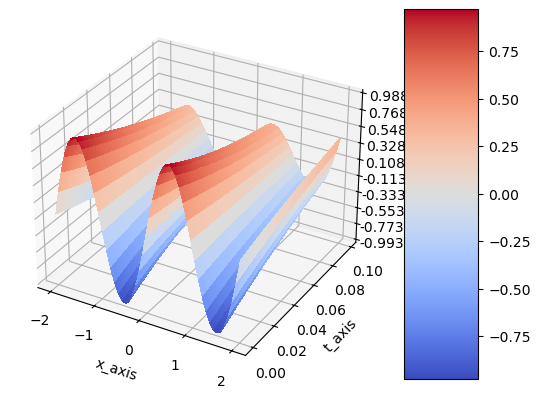

In [45]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.1, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.2]$
- training with iteration 20000

In [46]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.2, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.1483)
1 Training Loss: tensor(0.0968)
2 Training Loss: tensor(0.0992)
3 Training Loss: tensor(0.0725)
4 Training Loss: tensor(0.0659)
5 Training Loss: tensor(0.0862)
6 Training Loss: tensor(0.0655)
7 Training Loss: tensor(0.0755)
8 Training Loss: tensor(0.0644)
9 Training Loss: tensor(0.0601)
10 Training Loss: tensor(0.0458)
11 Training Loss: tensor(0.0361)
12 Training Loss: tensor(0.0359)
13 Training Loss: tensor(0.0330)
14 Training Loss: tensor(0.0371)
15 Training Loss: tensor(0.0353)
16 Training Loss: tensor(0.0324)
17 Training Loss: tensor(0.0360)
18 Training Loss: tensor(0.0236)
19 Training Loss: tensor(0.0261)
20 Training Loss: tensor(0.0210)
21 Training Loss: tensor(0.0199)
22 Training Loss: tensor(0.0199)
23 Training Loss: tensor(0.0170)
24 Training Loss: tensor(0.0186)
25 Training Loss: tensor(0.0230)
26 Training Loss: tensor(0.0214)
27 Training Loss: tensor(0.0190)
28 Training Loss: tensor(0.0150)
29 Training Loss: tensor(0.0180)
30 Training Loss: te

245 Training Loss: tensor(0.0091)
246 Training Loss: tensor(0.0071)
247 Training Loss: tensor(0.0079)
248 Training Loss: tensor(0.0056)
249 Training Loss: tensor(0.0076)
250 Training Loss: tensor(0.0069)
251 Training Loss: tensor(0.0069)
252 Training Loss: tensor(0.0068)
253 Training Loss: tensor(0.0076)
254 Training Loss: tensor(0.0066)
255 Training Loss: tensor(0.0063)
256 Training Loss: tensor(0.0061)
257 Training Loss: tensor(0.0065)
258 Training Loss: tensor(0.0084)
259 Training Loss: tensor(0.0060)
260 Training Loss: tensor(0.0065)
261 Training Loss: tensor(0.0067)
262 Training Loss: tensor(0.0054)
263 Training Loss: tensor(0.0063)
264 Training Loss: tensor(0.0065)
265 Training Loss: tensor(0.0062)
266 Training Loss: tensor(0.0059)
267 Training Loss: tensor(0.0061)
268 Training Loss: tensor(0.0054)
269 Training Loss: tensor(0.0065)
270 Training Loss: tensor(0.0060)
271 Training Loss: tensor(0.0057)
272 Training Loss: tensor(0.0069)
273 Training Loss: tensor(0.0069)
274 Training L

486 Training Loss: tensor(0.0051)
487 Training Loss: tensor(0.0046)
488 Training Loss: tensor(0.0049)
489 Training Loss: tensor(0.0045)
490 Training Loss: tensor(0.0044)
491 Training Loss: tensor(0.0055)
492 Training Loss: tensor(0.0054)
493 Training Loss: tensor(0.0060)
494 Training Loss: tensor(0.0061)
495 Training Loss: tensor(0.0043)
496 Training Loss: tensor(0.0050)
497 Training Loss: tensor(0.0052)
498 Training Loss: tensor(0.0047)
499 Training Loss: tensor(0.0057)
500 Training Loss: tensor(0.0059)
501 Training Loss: tensor(0.0051)
502 Training Loss: tensor(0.0050)
503 Training Loss: tensor(0.0041)
504 Training Loss: tensor(0.0043)
505 Training Loss: tensor(0.0041)
506 Training Loss: tensor(0.0046)
507 Training Loss: tensor(0.0045)
508 Training Loss: tensor(0.0041)
509 Training Loss: tensor(0.0047)
510 Training Loss: tensor(0.0045)
511 Training Loss: tensor(0.0049)
512 Training Loss: tensor(0.0059)
513 Training Loss: tensor(0.0063)
514 Training Loss: tensor(0.0065)
515 Training L

731 Training Loss: tensor(0.0157)
732 Training Loss: tensor(0.0164)
733 Training Loss: tensor(0.0092)
734 Training Loss: tensor(0.0051)
735 Training Loss: tensor(0.0069)
736 Training Loss: tensor(0.0108)
737 Training Loss: tensor(0.0114)
738 Training Loss: tensor(0.0067)
739 Training Loss: tensor(0.0048)
740 Training Loss: tensor(0.0067)
741 Training Loss: tensor(0.0090)
742 Training Loss: tensor(0.0075)
743 Training Loss: tensor(0.0048)
744 Training Loss: tensor(0.0038)
745 Training Loss: tensor(0.0056)
746 Training Loss: tensor(0.0076)
747 Training Loss: tensor(0.0059)
748 Training Loss: tensor(0.0046)
749 Training Loss: tensor(0.0041)
750 Training Loss: tensor(0.0050)
751 Training Loss: tensor(0.0067)
752 Training Loss: tensor(0.0062)
753 Training Loss: tensor(0.0057)
754 Training Loss: tensor(0.0038)
755 Training Loss: tensor(0.0030)
756 Training Loss: tensor(0.0049)
757 Training Loss: tensor(0.0046)
758 Training Loss: tensor(0.0048)
759 Training Loss: tensor(0.0050)
760 Training L

975 Training Loss: tensor(0.0039)
976 Training Loss: tensor(0.0031)
977 Training Loss: tensor(0.0037)
978 Training Loss: tensor(0.0049)
979 Training Loss: tensor(0.0040)
980 Training Loss: tensor(0.0050)
981 Training Loss: tensor(0.0041)
982 Training Loss: tensor(0.0056)
983 Training Loss: tensor(0.0063)
984 Training Loss: tensor(0.0069)
985 Training Loss: tensor(0.0081)
986 Training Loss: tensor(0.0103)
987 Training Loss: tensor(0.0107)
988 Training Loss: tensor(0.0104)
989 Training Loss: tensor(0.0096)
990 Training Loss: tensor(0.0078)
991 Training Loss: tensor(0.0055)
992 Training Loss: tensor(0.0041)
993 Training Loss: tensor(0.0026)
994 Training Loss: tensor(0.0033)
995 Training Loss: tensor(0.0032)
996 Training Loss: tensor(0.0037)
997 Training Loss: tensor(0.0049)
998 Training Loss: tensor(0.0049)
999 Training Loss: tensor(0.0051)
1000 Training Loss: tensor(0.0051)
1001 Training Loss: tensor(0.0045)
1002 Training Loss: tensor(0.0048)
1003 Training Loss: tensor(0.0048)
1004 Train

1210 Training Loss: tensor(0.0034)
1211 Training Loss: tensor(0.0028)
1212 Training Loss: tensor(0.0026)
1213 Training Loss: tensor(0.0028)
1214 Training Loss: tensor(0.0026)
1215 Training Loss: tensor(0.0034)
1216 Training Loss: tensor(0.0032)
1217 Training Loss: tensor(0.0038)
1218 Training Loss: tensor(0.0046)
1219 Training Loss: tensor(0.0052)
1220 Training Loss: tensor(0.0057)
1221 Training Loss: tensor(0.0064)
1222 Training Loss: tensor(0.0064)
1223 Training Loss: tensor(0.0066)
1224 Training Loss: tensor(0.0070)
1225 Training Loss: tensor(0.0069)
1226 Training Loss: tensor(0.0072)
1227 Training Loss: tensor(0.0071)
1228 Training Loss: tensor(0.0076)
1229 Training Loss: tensor(0.0065)
1230 Training Loss: tensor(0.0050)
1231 Training Loss: tensor(0.0038)
1232 Training Loss: tensor(0.0030)
1233 Training Loss: tensor(0.0025)
1234 Training Loss: tensor(0.0023)
1235 Training Loss: tensor(0.0025)
1236 Training Loss: tensor(0.0027)
1237 Training Loss: tensor(0.0026)
1238 Training Loss: 

1449 Training Loss: tensor(0.0031)
1450 Training Loss: tensor(0.0034)
1451 Training Loss: tensor(0.0036)
1452 Training Loss: tensor(0.0034)
1453 Training Loss: tensor(0.0027)
1454 Training Loss: tensor(0.0026)
1455 Training Loss: tensor(0.0023)
1456 Training Loss: tensor(0.0022)
1457 Training Loss: tensor(0.0022)
1458 Training Loss: tensor(0.0025)
1459 Training Loss: tensor(0.0027)
1460 Training Loss: tensor(0.0024)
1461 Training Loss: tensor(0.0019)
1462 Training Loss: tensor(0.0022)
1463 Training Loss: tensor(0.0019)
1464 Training Loss: tensor(0.0022)
1465 Training Loss: tensor(0.0026)
1466 Training Loss: tensor(0.0023)
1467 Training Loss: tensor(0.0023)
1468 Training Loss: tensor(0.0029)
1469 Training Loss: tensor(0.0020)
1470 Training Loss: tensor(0.0025)
1471 Training Loss: tensor(0.0029)
1472 Training Loss: tensor(0.0025)
1473 Training Loss: tensor(0.0033)
1474 Training Loss: tensor(0.0026)
1475 Training Loss: tensor(0.0031)
1476 Training Loss: tensor(0.0021)
1477 Training Loss: 

1685 Training Loss: tensor(0.0022)
1686 Training Loss: tensor(0.0020)
1687 Training Loss: tensor(0.0023)
1688 Training Loss: tensor(0.0020)
1689 Training Loss: tensor(0.0023)
1690 Training Loss: tensor(0.0020)
1691 Training Loss: tensor(0.0021)
1692 Training Loss: tensor(0.0018)
1693 Training Loss: tensor(0.0016)
1694 Training Loss: tensor(0.0022)
1695 Training Loss: tensor(0.0026)
1696 Training Loss: tensor(0.0019)
1697 Training Loss: tensor(0.0021)
1698 Training Loss: tensor(0.0017)
1699 Training Loss: tensor(0.0021)
1700 Training Loss: tensor(0.0019)
1701 Training Loss: tensor(0.0023)
1702 Training Loss: tensor(0.0021)
1703 Training Loss: tensor(0.0020)
1704 Training Loss: tensor(0.0023)
1705 Training Loss: tensor(0.0025)
1706 Training Loss: tensor(0.0024)
1707 Training Loss: tensor(0.0031)
1708 Training Loss: tensor(0.0042)
1709 Training Loss: tensor(0.0045)
1710 Training Loss: tensor(0.0045)
1711 Training Loss: tensor(0.0050)
1712 Training Loss: tensor(0.0047)
1713 Training Loss: 

1923 Training Loss: tensor(0.0016)
1924 Training Loss: tensor(0.0019)
1925 Training Loss: tensor(0.0017)
1926 Training Loss: tensor(0.0021)
1927 Training Loss: tensor(0.0020)
1928 Training Loss: tensor(0.0018)
1929 Training Loss: tensor(0.0024)
1930 Training Loss: tensor(0.0023)
1931 Training Loss: tensor(0.0033)
1932 Training Loss: tensor(0.0036)
1933 Training Loss: tensor(0.0041)
1934 Training Loss: tensor(0.0039)
1935 Training Loss: tensor(0.0040)
1936 Training Loss: tensor(0.0051)
1937 Training Loss: tensor(0.0051)
1938 Training Loss: tensor(0.0067)
1939 Training Loss: tensor(0.0070)
1940 Training Loss: tensor(0.0090)
1941 Training Loss: tensor(0.0100)
1942 Training Loss: tensor(0.0109)
1943 Training Loss: tensor(0.0106)
1944 Training Loss: tensor(0.0112)
1945 Training Loss: tensor(0.0099)
1946 Training Loss: tensor(0.0094)
1947 Training Loss: tensor(0.0073)
1948 Training Loss: tensor(0.0054)
1949 Training Loss: tensor(0.0038)
1950 Training Loss: tensor(0.0025)
1951 Training Loss: 

2159 Training Loss: tensor(0.0013)
2160 Training Loss: tensor(0.0015)
2161 Training Loss: tensor(0.0015)
2162 Training Loss: tensor(0.0017)
2163 Training Loss: tensor(0.0020)
2164 Training Loss: tensor(0.0021)
2165 Training Loss: tensor(0.0026)
2166 Training Loss: tensor(0.0031)
2167 Training Loss: tensor(0.0032)
2168 Training Loss: tensor(0.0039)
2169 Training Loss: tensor(0.0050)
2170 Training Loss: tensor(0.0057)
2171 Training Loss: tensor(0.0077)
2172 Training Loss: tensor(0.0108)
2173 Training Loss: tensor(0.0130)
2174 Training Loss: tensor(0.0147)
2175 Training Loss: tensor(0.0152)
2176 Training Loss: tensor(0.0140)
2177 Training Loss: tensor(0.0116)
2178 Training Loss: tensor(0.0083)
2179 Training Loss: tensor(0.0041)
2180 Training Loss: tensor(0.0018)
2181 Training Loss: tensor(0.0022)
2182 Training Loss: tensor(0.0036)
2183 Training Loss: tensor(0.0038)
2184 Training Loss: tensor(0.0046)
2185 Training Loss: tensor(0.0039)
2186 Training Loss: tensor(0.0034)
2187 Training Loss: 

2397 Training Loss: tensor(0.0028)
2398 Training Loss: tensor(0.0025)
2399 Training Loss: tensor(0.0023)
2400 Training Loss: tensor(0.0018)
2401 Training Loss: tensor(0.0017)
2402 Training Loss: tensor(0.0016)
2403 Training Loss: tensor(0.0017)
2404 Training Loss: tensor(0.0014)
2405 Training Loss: tensor(0.0013)
2406 Training Loss: tensor(0.0014)
2407 Training Loss: tensor(0.0019)
2408 Training Loss: tensor(0.0027)
2409 Training Loss: tensor(0.0036)
2410 Training Loss: tensor(0.0039)
2411 Training Loss: tensor(0.0046)
2412 Training Loss: tensor(0.0057)
2413 Training Loss: tensor(0.0062)
2414 Training Loss: tensor(0.0069)
2415 Training Loss: tensor(0.0079)
2416 Training Loss: tensor(0.0079)
2417 Training Loss: tensor(0.0077)
2418 Training Loss: tensor(0.0077)
2419 Training Loss: tensor(0.0067)
2420 Training Loss: tensor(0.0052)
2421 Training Loss: tensor(0.0036)
2422 Training Loss: tensor(0.0027)
2423 Training Loss: tensor(0.0025)
2424 Training Loss: tensor(0.0018)
2425 Training Loss: 

2632 Training Loss: tensor(0.0016)
2633 Training Loss: tensor(0.0025)
2634 Training Loss: tensor(0.0049)
2635 Training Loss: tensor(0.0038)
2636 Training Loss: tensor(0.0036)
2637 Training Loss: tensor(0.0035)
2638 Training Loss: tensor(0.0053)
2639 Training Loss: tensor(0.0058)
2640 Training Loss: tensor(0.0072)
2641 Training Loss: tensor(0.0088)
2642 Training Loss: tensor(0.0116)
2643 Training Loss: tensor(0.0147)
2644 Training Loss: tensor(0.0153)
2645 Training Loss: tensor(0.0146)
2646 Training Loss: tensor(0.0124)
2647 Training Loss: tensor(0.0098)
2648 Training Loss: tensor(0.0042)
2649 Training Loss: tensor(0.0035)
2650 Training Loss: tensor(0.0041)
2651 Training Loss: tensor(0.0045)
2652 Training Loss: tensor(0.0068)
2653 Training Loss: tensor(0.0088)
2654 Training Loss: tensor(0.0127)
2655 Training Loss: tensor(0.0092)
2656 Training Loss: tensor(0.0046)
2657 Training Loss: tensor(0.0052)
2658 Training Loss: tensor(0.0031)
2659 Training Loss: tensor(0.0027)
2660 Training Loss: 

2869 Training Loss: tensor(0.0022)
2870 Training Loss: tensor(0.0015)
2871 Training Loss: tensor(0.0023)
2872 Training Loss: tensor(0.0018)
2873 Training Loss: tensor(0.0019)
2874 Training Loss: tensor(0.0016)
2875 Training Loss: tensor(0.0014)
2876 Training Loss: tensor(0.0016)
2877 Training Loss: tensor(0.0017)
2878 Training Loss: tensor(0.0019)
2879 Training Loss: tensor(0.0019)
2880 Training Loss: tensor(0.0020)
2881 Training Loss: tensor(0.0017)
2882 Training Loss: tensor(0.0020)
2883 Training Loss: tensor(0.0012)
2884 Training Loss: tensor(0.0016)
2885 Training Loss: tensor(0.0014)
2886 Training Loss: tensor(0.0014)
2887 Training Loss: tensor(0.0015)
2888 Training Loss: tensor(0.0018)
2889 Training Loss: tensor(0.0019)
2890 Training Loss: tensor(0.0016)
2891 Training Loss: tensor(0.0022)
2892 Training Loss: tensor(0.0016)
2893 Training Loss: tensor(0.0022)
2894 Training Loss: tensor(0.0014)
2895 Training Loss: tensor(0.0016)
2896 Training Loss: tensor(0.0019)
2897 Training Loss: 

3108 Training Loss: tensor(0.0044)
3109 Training Loss: tensor(0.0048)
3110 Training Loss: tensor(0.0050)
3111 Training Loss: tensor(0.0045)
3112 Training Loss: tensor(0.0046)
3113 Training Loss: tensor(0.0033)
3114 Training Loss: tensor(0.0037)
3115 Training Loss: tensor(0.0028)
3116 Training Loss: tensor(0.0029)
3117 Training Loss: tensor(0.0022)
3118 Training Loss: tensor(0.0027)
3119 Training Loss: tensor(0.0026)
3120 Training Loss: tensor(0.0019)
3121 Training Loss: tensor(0.0015)
3122 Training Loss: tensor(0.0013)
3123 Training Loss: tensor(0.0015)
3124 Training Loss: tensor(0.0017)
3125 Training Loss: tensor(0.0016)
3126 Training Loss: tensor(0.0018)
3127 Training Loss: tensor(0.0021)
3128 Training Loss: tensor(0.0027)
3129 Training Loss: tensor(0.0036)
3130 Training Loss: tensor(0.0044)
3131 Training Loss: tensor(0.0058)
3132 Training Loss: tensor(0.0073)
3133 Training Loss: tensor(0.0097)
3134 Training Loss: tensor(0.0116)
3135 Training Loss: tensor(0.0150)
3136 Training Loss: 

3344 Training Loss: tensor(0.0034)
3345 Training Loss: tensor(0.0020)
3346 Training Loss: tensor(0.0024)
3347 Training Loss: tensor(0.0035)
3348 Training Loss: tensor(0.0052)
3349 Training Loss: tensor(0.0041)
3350 Training Loss: tensor(0.0028)
3351 Training Loss: tensor(0.0026)
3352 Training Loss: tensor(0.0030)
3353 Training Loss: tensor(0.0016)
3354 Training Loss: tensor(0.0021)
3355 Training Loss: tensor(0.0016)
3356 Training Loss: tensor(0.0017)
3357 Training Loss: tensor(0.0017)
3358 Training Loss: tensor(0.0014)
3359 Training Loss: tensor(0.0020)
3360 Training Loss: tensor(0.0018)
3361 Training Loss: tensor(0.0017)
3362 Training Loss: tensor(0.0016)
3363 Training Loss: tensor(0.0012)
3364 Training Loss: tensor(0.0011)
3365 Training Loss: tensor(0.0015)
3366 Training Loss: tensor(0.0019)
3367 Training Loss: tensor(0.0011)
3368 Training Loss: tensor(0.0014)
3369 Training Loss: tensor(0.0014)
3370 Training Loss: tensor(0.0012)
3371 Training Loss: tensor(0.0012)
3372 Training Loss: 

3583 Training Loss: tensor(0.0031)
3584 Training Loss: tensor(0.0029)
3585 Training Loss: tensor(0.0026)
3586 Training Loss: tensor(0.0035)
3587 Training Loss: tensor(0.0044)
3588 Training Loss: tensor(0.0051)
3589 Training Loss: tensor(0.0066)
3590 Training Loss: tensor(0.0078)
3591 Training Loss: tensor(0.0104)
3592 Training Loss: tensor(0.0123)
3593 Training Loss: tensor(0.0128)
3594 Training Loss: tensor(0.0131)
3595 Training Loss: tensor(0.0122)
3596 Training Loss: tensor(0.0099)
3597 Training Loss: tensor(0.0080)
3598 Training Loss: tensor(0.0047)
3599 Training Loss: tensor(0.0023)
3600 Training Loss: tensor(0.0036)
3601 Training Loss: tensor(0.0020)
3602 Training Loss: tensor(0.0032)
3603 Training Loss: tensor(0.0038)
3604 Training Loss: tensor(0.0037)
3605 Training Loss: tensor(0.0035)
3606 Training Loss: tensor(0.0022)
3607 Training Loss: tensor(0.0025)
3608 Training Loss: tensor(0.0016)
3609 Training Loss: tensor(0.0013)
3610 Training Loss: tensor(0.0021)
3611 Training Loss: 

3818 Training Loss: tensor(0.0011)
3819 Training Loss: tensor(0.0014)
3820 Training Loss: tensor(0.0011)
3821 Training Loss: tensor(0.0010)
3822 Training Loss: tensor(0.0013)
3823 Training Loss: tensor(0.0013)
3824 Training Loss: tensor(0.0012)
3825 Training Loss: tensor(0.0008)
3826 Training Loss: tensor(0.0012)
3827 Training Loss: tensor(0.0013)
3828 Training Loss: tensor(0.0010)
3829 Training Loss: tensor(0.0011)
3830 Training Loss: tensor(0.0016)
3831 Training Loss: tensor(0.0013)
3832 Training Loss: tensor(0.0011)
3833 Training Loss: tensor(0.0010)
3834 Training Loss: tensor(0.0013)
3835 Training Loss: tensor(0.0012)
3836 Training Loss: tensor(0.0011)
3837 Training Loss: tensor(0.0010)
3838 Training Loss: tensor(0.0010)
3839 Training Loss: tensor(0.0010)
3840 Training Loss: tensor(0.0009)
3841 Training Loss: tensor(0.0011)
3842 Training Loss: tensor(0.0010)
3843 Training Loss: tensor(0.0012)
3844 Training Loss: tensor(0.0014)
3845 Training Loss: tensor(0.0013)
3846 Training Loss: 

4055 Training Loss: tensor(0.0023)
4056 Training Loss: tensor(0.0027)
4057 Training Loss: tensor(0.0032)
4058 Training Loss: tensor(0.0034)
4059 Training Loss: tensor(0.0037)
4060 Training Loss: tensor(0.0050)
4061 Training Loss: tensor(0.0049)
4062 Training Loss: tensor(0.0041)
4063 Training Loss: tensor(0.0045)
4064 Training Loss: tensor(0.0042)
4065 Training Loss: tensor(0.0030)
4066 Training Loss: tensor(0.0026)
4067 Training Loss: tensor(0.0016)
4068 Training Loss: tensor(0.0018)
4069 Training Loss: tensor(0.0013)
4070 Training Loss: tensor(0.0017)
4071 Training Loss: tensor(0.0013)
4072 Training Loss: tensor(0.0020)
4073 Training Loss: tensor(0.0010)
4074 Training Loss: tensor(0.0016)
4075 Training Loss: tensor(0.0011)
4076 Training Loss: tensor(0.0015)
4077 Training Loss: tensor(0.0013)
4078 Training Loss: tensor(0.0014)
4079 Training Loss: tensor(0.0013)
4080 Training Loss: tensor(0.0016)
4081 Training Loss: tensor(0.0012)
4082 Training Loss: tensor(0.0016)
4083 Training Loss: 

4295 Training Loss: tensor(0.0083)
4296 Training Loss: tensor(0.0057)
4297 Training Loss: tensor(0.0028)
4298 Training Loss: tensor(0.0020)
4299 Training Loss: tensor(0.0023)
4300 Training Loss: tensor(0.0032)
4301 Training Loss: tensor(0.0047)
4302 Training Loss: tensor(0.0044)
4303 Training Loss: tensor(0.0022)
4304 Training Loss: tensor(0.0016)
4305 Training Loss: tensor(0.0019)
4306 Training Loss: tensor(0.0014)
4307 Training Loss: tensor(0.0020)
4308 Training Loss: tensor(0.0022)
4309 Training Loss: tensor(0.0016)
4310 Training Loss: tensor(0.0015)
4311 Training Loss: tensor(0.0013)
4312 Training Loss: tensor(0.0016)
4313 Training Loss: tensor(0.0020)
4314 Training Loss: tensor(0.0028)
4315 Training Loss: tensor(0.0039)
4316 Training Loss: tensor(0.0033)
4317 Training Loss: tensor(0.0022)
4318 Training Loss: tensor(0.0019)
4319 Training Loss: tensor(0.0018)
4320 Training Loss: tensor(0.0011)
4321 Training Loss: tensor(0.0011)
4322 Training Loss: tensor(0.0016)
4323 Training Loss: 

4533 Training Loss: tensor(0.0019)
4534 Training Loss: tensor(0.0022)
4535 Training Loss: tensor(0.0013)
4536 Training Loss: tensor(0.0021)
4537 Training Loss: tensor(0.0026)
4538 Training Loss: tensor(0.0015)
4539 Training Loss: tensor(0.0029)
4540 Training Loss: tensor(0.0022)
4541 Training Loss: tensor(0.0030)
4542 Training Loss: tensor(0.0026)
4543 Training Loss: tensor(0.0017)
4544 Training Loss: tensor(0.0027)
4545 Training Loss: tensor(0.0016)
4546 Training Loss: tensor(0.0015)
4547 Training Loss: tensor(0.0018)
4548 Training Loss: tensor(0.0023)
4549 Training Loss: tensor(0.0019)
4550 Training Loss: tensor(0.0021)
4551 Training Loss: tensor(0.0023)
4552 Training Loss: tensor(0.0023)
4553 Training Loss: tensor(0.0022)
4554 Training Loss: tensor(0.0025)
4555 Training Loss: tensor(0.0028)
4556 Training Loss: tensor(0.0030)
4557 Training Loss: tensor(0.0021)
4558 Training Loss: tensor(0.0019)
4559 Training Loss: tensor(0.0020)
4560 Training Loss: tensor(0.0013)
4561 Training Loss: 

4769 Training Loss: tensor(0.0145)
4770 Training Loss: tensor(0.0148)
4771 Training Loss: tensor(0.0136)
4772 Training Loss: tensor(0.0107)
4773 Training Loss: tensor(0.0069)
4774 Training Loss: tensor(0.0032)
4775 Training Loss: tensor(0.0013)
4776 Training Loss: tensor(0.0015)
4777 Training Loss: tensor(0.0028)
4778 Training Loss: tensor(0.0046)
4779 Training Loss: tensor(0.0048)
4780 Training Loss: tensor(0.0044)
4781 Training Loss: tensor(0.0025)
4782 Training Loss: tensor(0.0016)
4783 Training Loss: tensor(0.0012)
4784 Training Loss: tensor(0.0015)
4785 Training Loss: tensor(0.0024)
4786 Training Loss: tensor(0.0028)
4787 Training Loss: tensor(0.0028)
4788 Training Loss: tensor(0.0026)
4789 Training Loss: tensor(0.0026)
4790 Training Loss: tensor(0.0017)
4791 Training Loss: tensor(0.0023)
4792 Training Loss: tensor(0.0013)
4793 Training Loss: tensor(0.0019)
4794 Training Loss: tensor(0.0022)
4795 Training Loss: tensor(0.0025)
4796 Training Loss: tensor(0.0028)
4797 Training Loss: 

5007 Training Loss: tensor(0.0020)
5008 Training Loss: tensor(0.0021)
5009 Training Loss: tensor(0.0021)
5010 Training Loss: tensor(0.0018)
5011 Training Loss: tensor(0.0013)
5012 Training Loss: tensor(0.0012)
5013 Training Loss: tensor(0.0017)
5014 Training Loss: tensor(0.0013)
5015 Training Loss: tensor(0.0018)
5016 Training Loss: tensor(0.0021)
5017 Training Loss: tensor(0.0018)
5018 Training Loss: tensor(0.0023)
5019 Training Loss: tensor(0.0024)
5020 Training Loss: tensor(0.0021)
5021 Training Loss: tensor(0.0023)
5022 Training Loss: tensor(0.0022)
5023 Training Loss: tensor(0.0011)
5024 Training Loss: tensor(0.0015)
5025 Training Loss: tensor(0.0012)
5026 Training Loss: tensor(0.0013)
5027 Training Loss: tensor(0.0018)
5028 Training Loss: tensor(0.0015)
5029 Training Loss: tensor(0.0016)
5030 Training Loss: tensor(0.0028)
5031 Training Loss: tensor(0.0021)
5032 Training Loss: tensor(0.0023)
5033 Training Loss: tensor(0.0031)
5034 Training Loss: tensor(0.0032)
5035 Training Loss: 

5242 Training Loss: tensor(0.0011)
5243 Training Loss: tensor(0.0011)
5244 Training Loss: tensor(0.0010)
5245 Training Loss: tensor(0.0009)
5246 Training Loss: tensor(0.0009)
5247 Training Loss: tensor(0.0010)
5248 Training Loss: tensor(0.0008)
5249 Training Loss: tensor(0.0011)
5250 Training Loss: tensor(0.0011)
5251 Training Loss: tensor(0.0012)
5252 Training Loss: tensor(0.0014)
5253 Training Loss: tensor(0.0016)
5254 Training Loss: tensor(0.0021)
5255 Training Loss: tensor(0.0028)
5256 Training Loss: tensor(0.0036)
5257 Training Loss: tensor(0.0040)
5258 Training Loss: tensor(0.0058)
5259 Training Loss: tensor(0.0077)
5260 Training Loss: tensor(0.0098)
5261 Training Loss: tensor(0.0126)
5262 Training Loss: tensor(0.0150)
5263 Training Loss: tensor(0.0171)
5264 Training Loss: tensor(0.0169)
5265 Training Loss: tensor(0.0134)
5266 Training Loss: tensor(0.0074)
5267 Training Loss: tensor(0.0030)
5268 Training Loss: tensor(0.0012)
5269 Training Loss: tensor(0.0028)
5270 Training Loss: 

5477 Training Loss: tensor(0.0022)
5478 Training Loss: tensor(0.0023)
5479 Training Loss: tensor(0.0021)
5480 Training Loss: tensor(0.0019)
5481 Training Loss: tensor(0.0018)
5482 Training Loss: tensor(0.0015)
5483 Training Loss: tensor(0.0022)
5484 Training Loss: tensor(0.0012)
5485 Training Loss: tensor(0.0018)
5486 Training Loss: tensor(0.0022)
5487 Training Loss: tensor(0.0020)
5488 Training Loss: tensor(0.0016)
5489 Training Loss: tensor(0.0018)
5490 Training Loss: tensor(0.0015)
5491 Training Loss: tensor(0.0024)
5492 Training Loss: tensor(0.0019)
5493 Training Loss: tensor(0.0017)
5494 Training Loss: tensor(0.0019)
5495 Training Loss: tensor(0.0026)
5496 Training Loss: tensor(0.0014)
5497 Training Loss: tensor(0.0022)
5498 Training Loss: tensor(0.0021)
5499 Training Loss: tensor(0.0018)
5500 Training Loss: tensor(0.0020)
5501 Training Loss: tensor(0.0019)
5502 Training Loss: tensor(0.0024)
5503 Training Loss: tensor(0.0032)
5504 Training Loss: tensor(0.0031)
5505 Training Loss: 

5714 Training Loss: tensor(0.0090)
5715 Training Loss: tensor(0.0068)
5716 Training Loss: tensor(0.0049)
5717 Training Loss: tensor(0.0027)
5718 Training Loss: tensor(0.0021)
5719 Training Loss: tensor(0.0008)
5720 Training Loss: tensor(0.0017)
5721 Training Loss: tensor(0.0019)
5722 Training Loss: tensor(0.0024)
5723 Training Loss: tensor(0.0027)
5724 Training Loss: tensor(0.0022)
5725 Training Loss: tensor(0.0022)
5726 Training Loss: tensor(0.0013)
5727 Training Loss: tensor(0.0016)
5728 Training Loss: tensor(0.0011)
5729 Training Loss: tensor(0.0017)
5730 Training Loss: tensor(0.0011)
5731 Training Loss: tensor(0.0010)
5732 Training Loss: tensor(0.0012)
5733 Training Loss: tensor(0.0009)
5734 Training Loss: tensor(0.0014)
5735 Training Loss: tensor(0.0007)
5736 Training Loss: tensor(0.0011)
5737 Training Loss: tensor(0.0007)
5738 Training Loss: tensor(0.0012)
5739 Training Loss: tensor(0.0010)
5740 Training Loss: tensor(0.0011)
5741 Training Loss: tensor(0.0012)
5742 Training Loss: 

5952 Training Loss: tensor(0.0057)
5953 Training Loss: tensor(0.0060)
5954 Training Loss: tensor(0.0067)
5955 Training Loss: tensor(0.0039)
5956 Training Loss: tensor(0.0017)
5957 Training Loss: tensor(0.0019)
5958 Training Loss: tensor(0.0013)
5959 Training Loss: tensor(0.0020)
5960 Training Loss: tensor(0.0030)
5961 Training Loss: tensor(0.0042)
5962 Training Loss: tensor(0.0048)
5963 Training Loss: tensor(0.0047)
5964 Training Loss: tensor(0.0045)
5965 Training Loss: tensor(0.0041)
5966 Training Loss: tensor(0.0028)
5967 Training Loss: tensor(0.0019)
5968 Training Loss: tensor(0.0012)
5969 Training Loss: tensor(0.0011)
5970 Training Loss: tensor(0.0009)
5971 Training Loss: tensor(0.0010)
5972 Training Loss: tensor(0.0015)
5973 Training Loss: tensor(0.0013)
5974 Training Loss: tensor(0.0017)
5975 Training Loss: tensor(0.0016)
5976 Training Loss: tensor(0.0017)
5977 Training Loss: tensor(0.0012)
5978 Training Loss: tensor(0.0011)
5979 Training Loss: tensor(0.0011)
5980 Training Loss: 

6187 Training Loss: tensor(0.0158)
6188 Training Loss: tensor(0.0128)
6189 Training Loss: tensor(0.0075)
6190 Training Loss: tensor(0.0028)
6191 Training Loss: tensor(0.0011)
6192 Training Loss: tensor(0.0026)
6193 Training Loss: tensor(0.0052)
6194 Training Loss: tensor(0.0064)
6195 Training Loss: tensor(0.0055)
6196 Training Loss: tensor(0.0036)
6197 Training Loss: tensor(0.0019)
6198 Training Loss: tensor(0.0011)
6199 Training Loss: tensor(0.0023)
6200 Training Loss: tensor(0.0036)
6201 Training Loss: tensor(0.0038)
6202 Training Loss: tensor(0.0035)
6203 Training Loss: tensor(0.0023)
6204 Training Loss: tensor(0.0015)
6205 Training Loss: tensor(0.0012)
6206 Training Loss: tensor(0.0028)
6207 Training Loss: tensor(0.0034)
6208 Training Loss: tensor(0.0026)
6209 Training Loss: tensor(0.0018)
6210 Training Loss: tensor(0.0016)
6211 Training Loss: tensor(0.0015)
6212 Training Loss: tensor(0.0014)
6213 Training Loss: tensor(0.0024)
6214 Training Loss: tensor(0.0024)
6215 Training Loss: 

6426 Training Loss: tensor(0.0015)
6427 Training Loss: tensor(0.0008)
6428 Training Loss: tensor(0.0009)
6429 Training Loss: tensor(0.0013)
6430 Training Loss: tensor(0.0009)
6431 Training Loss: tensor(0.0008)
6432 Training Loss: tensor(0.0012)
6433 Training Loss: tensor(0.0011)
6434 Training Loss: tensor(0.0008)
6435 Training Loss: tensor(0.0011)
6436 Training Loss: tensor(0.0011)
6437 Training Loss: tensor(0.0010)
6438 Training Loss: tensor(0.0012)
6439 Training Loss: tensor(0.0017)
6440 Training Loss: tensor(0.0022)
6441 Training Loss: tensor(0.0020)
6442 Training Loss: tensor(0.0019)
6443 Training Loss: tensor(0.0024)
6444 Training Loss: tensor(0.0023)
6445 Training Loss: tensor(0.0026)
6446 Training Loss: tensor(0.0025)
6447 Training Loss: tensor(0.0020)
6448 Training Loss: tensor(0.0020)
6449 Training Loss: tensor(0.0014)
6450 Training Loss: tensor(0.0013)
6451 Training Loss: tensor(0.0009)
6452 Training Loss: tensor(0.0009)
6453 Training Loss: tensor(0.0010)
6454 Training Loss: 

6662 Training Loss: tensor(0.0013)
6663 Training Loss: tensor(0.0017)
6664 Training Loss: tensor(0.0011)
6665 Training Loss: tensor(0.0007)
6666 Training Loss: tensor(0.0014)
6667 Training Loss: tensor(0.0017)
6668 Training Loss: tensor(0.0013)
6669 Training Loss: tensor(0.0010)
6670 Training Loss: tensor(0.0013)
6671 Training Loss: tensor(0.0018)
6672 Training Loss: tensor(0.0020)
6673 Training Loss: tensor(0.0015)
6674 Training Loss: tensor(0.0016)
6675 Training Loss: tensor(0.0022)
6676 Training Loss: tensor(0.0028)
6677 Training Loss: tensor(0.0030)
6678 Training Loss: tensor(0.0035)
6679 Training Loss: tensor(0.0038)
6680 Training Loss: tensor(0.0038)
6681 Training Loss: tensor(0.0036)
6682 Training Loss: tensor(0.0033)
6683 Training Loss: tensor(0.0028)
6684 Training Loss: tensor(0.0021)
6685 Training Loss: tensor(0.0018)
6686 Training Loss: tensor(0.0015)
6687 Training Loss: tensor(0.0014)
6688 Training Loss: tensor(0.0010)
6689 Training Loss: tensor(0.0010)
6690 Training Loss: 

6898 Training Loss: tensor(0.0021)
6899 Training Loss: tensor(0.0020)
6900 Training Loss: tensor(0.0018)
6901 Training Loss: tensor(0.0029)
6902 Training Loss: tensor(0.0052)
6903 Training Loss: tensor(0.0060)
6904 Training Loss: tensor(0.0036)
6905 Training Loss: tensor(0.0044)
6906 Training Loss: tensor(0.0055)
6907 Training Loss: tensor(0.0056)
6908 Training Loss: tensor(0.0035)
6909 Training Loss: tensor(0.0034)
6910 Training Loss: tensor(0.0046)
6911 Training Loss: tensor(0.0033)
6912 Training Loss: tensor(0.0017)
6913 Training Loss: tensor(0.0023)
6914 Training Loss: tensor(0.0023)
6915 Training Loss: tensor(0.0011)
6916 Training Loss: tensor(0.0011)
6917 Training Loss: tensor(0.0019)
6918 Training Loss: tensor(0.0017)
6919 Training Loss: tensor(0.0010)
6920 Training Loss: tensor(0.0014)
6921 Training Loss: tensor(0.0024)
6922 Training Loss: tensor(0.0019)
6923 Training Loss: tensor(0.0013)
6924 Training Loss: tensor(0.0022)
6925 Training Loss: tensor(0.0027)
6926 Training Loss: 

7137 Training Loss: tensor(0.0009)
7138 Training Loss: tensor(0.0019)
7139 Training Loss: tensor(0.0031)
7140 Training Loss: tensor(0.0016)
7141 Training Loss: tensor(0.0019)
7142 Training Loss: tensor(0.0029)
7143 Training Loss: tensor(0.0020)
7144 Training Loss: tensor(0.0019)
7145 Training Loss: tensor(0.0033)
7146 Training Loss: tensor(0.0028)
7147 Training Loss: tensor(0.0035)
7148 Training Loss: tensor(0.0035)
7149 Training Loss: tensor(0.0039)
7150 Training Loss: tensor(0.0044)
7151 Training Loss: tensor(0.0044)
7152 Training Loss: tensor(0.0049)
7153 Training Loss: tensor(0.0041)
7154 Training Loss: tensor(0.0043)
7155 Training Loss: tensor(0.0039)
7156 Training Loss: tensor(0.0041)
7157 Training Loss: tensor(0.0035)
7158 Training Loss: tensor(0.0038)
7159 Training Loss: tensor(0.0035)
7160 Training Loss: tensor(0.0022)
7161 Training Loss: tensor(0.0030)
7162 Training Loss: tensor(0.0023)
7163 Training Loss: tensor(0.0015)
7164 Training Loss: tensor(0.0009)
7165 Training Loss: 

7374 Training Loss: tensor(0.0018)
7375 Training Loss: tensor(0.0015)
7376 Training Loss: tensor(0.0018)
7377 Training Loss: tensor(0.0017)
7378 Training Loss: tensor(0.0021)
7379 Training Loss: tensor(0.0021)
7380 Training Loss: tensor(0.0013)
7381 Training Loss: tensor(0.0024)
7382 Training Loss: tensor(0.0015)
7383 Training Loss: tensor(0.0012)
7384 Training Loss: tensor(0.0020)
7385 Training Loss: tensor(0.0023)
7386 Training Loss: tensor(0.0012)
7387 Training Loss: tensor(0.0018)
7388 Training Loss: tensor(0.0030)
7389 Training Loss: tensor(0.0022)
7390 Training Loss: tensor(0.0015)
7391 Training Loss: tensor(0.0016)
7392 Training Loss: tensor(0.0026)
7393 Training Loss: tensor(0.0025)
7394 Training Loss: tensor(0.0015)
7395 Training Loss: tensor(0.0019)
7396 Training Loss: tensor(0.0025)
7397 Training Loss: tensor(0.0013)
7398 Training Loss: tensor(0.0014)
7399 Training Loss: tensor(0.0023)
7400 Training Loss: tensor(0.0013)
7401 Training Loss: tensor(0.0013)
7402 Training Loss: 

7611 Training Loss: tensor(0.0060)
7612 Training Loss: tensor(0.0036)
7613 Training Loss: tensor(0.0016)
7614 Training Loss: tensor(0.0011)
7615 Training Loss: tensor(0.0013)
7616 Training Loss: tensor(0.0023)
7617 Training Loss: tensor(0.0038)
7618 Training Loss: tensor(0.0041)
7619 Training Loss: tensor(0.0038)
7620 Training Loss: tensor(0.0033)
7621 Training Loss: tensor(0.0025)
7622 Training Loss: tensor(0.0016)
7623 Training Loss: tensor(0.0016)
7624 Training Loss: tensor(0.0010)
7625 Training Loss: tensor(0.0016)
7626 Training Loss: tensor(0.0022)
7627 Training Loss: tensor(0.0022)
7628 Training Loss: tensor(0.0019)
7629 Training Loss: tensor(0.0023)
7630 Training Loss: tensor(0.0017)
7631 Training Loss: tensor(0.0015)
7632 Training Loss: tensor(0.0017)
7633 Training Loss: tensor(0.0011)
7634 Training Loss: tensor(0.0012)
7635 Training Loss: tensor(0.0015)
7636 Training Loss: tensor(0.0012)
7637 Training Loss: tensor(0.0014)
7638 Training Loss: tensor(0.0015)
7639 Training Loss: 

7848 Training Loss: tensor(0.0062)
7849 Training Loss: tensor(0.0080)
7850 Training Loss: tensor(0.0108)
7851 Training Loss: tensor(0.0124)
7852 Training Loss: tensor(0.0130)
7853 Training Loss: tensor(0.0115)
7854 Training Loss: tensor(0.0078)
7855 Training Loss: tensor(0.0038)
7856 Training Loss: tensor(0.0010)
7857 Training Loss: tensor(0.0013)
7858 Training Loss: tensor(0.0030)
7859 Training Loss: tensor(0.0047)
7860 Training Loss: tensor(0.0053)
7861 Training Loss: tensor(0.0039)
7862 Training Loss: tensor(0.0019)
7863 Training Loss: tensor(0.0009)
7864 Training Loss: tensor(0.0010)
7865 Training Loss: tensor(0.0019)
7866 Training Loss: tensor(0.0022)
7867 Training Loss: tensor(0.0024)
7868 Training Loss: tensor(0.0019)
7869 Training Loss: tensor(0.0011)
7870 Training Loss: tensor(0.0011)
7871 Training Loss: tensor(0.0012)
7872 Training Loss: tensor(0.0016)
7873 Training Loss: tensor(0.0021)
7874 Training Loss: tensor(0.0020)
7875 Training Loss: tensor(0.0018)
7876 Training Loss: 

8085 Training Loss: tensor(0.0043)
8086 Training Loss: tensor(0.0035)
8087 Training Loss: tensor(0.0032)
8088 Training Loss: tensor(0.0027)
8089 Training Loss: tensor(0.0019)
8090 Training Loss: tensor(0.0020)
8091 Training Loss: tensor(0.0011)
8092 Training Loss: tensor(0.0011)
8093 Training Loss: tensor(0.0011)
8094 Training Loss: tensor(0.0011)
8095 Training Loss: tensor(0.0013)
8096 Training Loss: tensor(0.0012)
8097 Training Loss: tensor(0.0013)
8098 Training Loss: tensor(0.0013)
8099 Training Loss: tensor(0.0015)
8100 Training Loss: tensor(0.0014)
8101 Training Loss: tensor(0.0009)
8102 Training Loss: tensor(0.0016)
8103 Training Loss: tensor(0.0010)
8104 Training Loss: tensor(0.0013)
8105 Training Loss: tensor(0.0009)
8106 Training Loss: tensor(0.0016)
8107 Training Loss: tensor(0.0013)
8108 Training Loss: tensor(0.0011)
8109 Training Loss: tensor(0.0008)
8110 Training Loss: tensor(0.0013)
8111 Training Loss: tensor(0.0011)
8112 Training Loss: tensor(0.0010)
8113 Training Loss: 

8323 Training Loss: tensor(0.0011)
8324 Training Loss: tensor(0.0012)
8325 Training Loss: tensor(0.0011)
8326 Training Loss: tensor(0.0012)
8327 Training Loss: tensor(0.0016)
8328 Training Loss: tensor(0.0020)
8329 Training Loss: tensor(0.0016)
8330 Training Loss: tensor(0.0015)
8331 Training Loss: tensor(0.0017)
8332 Training Loss: tensor(0.0021)
8333 Training Loss: tensor(0.0023)
8334 Training Loss: tensor(0.0020)
8335 Training Loss: tensor(0.0024)
8336 Training Loss: tensor(0.0033)
8337 Training Loss: tensor(0.0037)
8338 Training Loss: tensor(0.0032)
8339 Training Loss: tensor(0.0026)
8340 Training Loss: tensor(0.0041)
8341 Training Loss: tensor(0.0034)
8342 Training Loss: tensor(0.0022)
8343 Training Loss: tensor(0.0029)
8344 Training Loss: tensor(0.0035)
8345 Training Loss: tensor(0.0023)
8346 Training Loss: tensor(0.0020)
8347 Training Loss: tensor(0.0038)
8348 Training Loss: tensor(0.0031)
8349 Training Loss: tensor(0.0023)
8350 Training Loss: tensor(0.0024)
8351 Training Loss: 

8563 Training Loss: tensor(0.0015)
8564 Training Loss: tensor(0.0011)
8565 Training Loss: tensor(0.0014)
8566 Training Loss: tensor(0.0012)
8567 Training Loss: tensor(0.0011)
8568 Training Loss: tensor(0.0008)
8569 Training Loss: tensor(0.0013)
8570 Training Loss: tensor(0.0014)
8571 Training Loss: tensor(0.0010)
8572 Training Loss: tensor(0.0012)
8573 Training Loss: tensor(0.0010)
8574 Training Loss: tensor(0.0013)
8575 Training Loss: tensor(0.0008)
8576 Training Loss: tensor(0.0013)
8577 Training Loss: tensor(0.0014)
8578 Training Loss: tensor(0.0010)
8579 Training Loss: tensor(0.0013)
8580 Training Loss: tensor(0.0012)
8581 Training Loss: tensor(0.0008)
8582 Training Loss: tensor(0.0009)
8583 Training Loss: tensor(0.0008)
8584 Training Loss: tensor(0.0008)
8585 Training Loss: tensor(0.0013)
8586 Training Loss: tensor(0.0008)
8587 Training Loss: tensor(0.0009)
8588 Training Loss: tensor(0.0008)
8589 Training Loss: tensor(0.0006)
8590 Training Loss: tensor(0.0008)
8591 Training Loss: 

8801 Training Loss: tensor(0.0008)
8802 Training Loss: tensor(0.0012)
8803 Training Loss: tensor(0.0012)
8804 Training Loss: tensor(0.0009)
8805 Training Loss: tensor(0.0009)
8806 Training Loss: tensor(0.0011)
8807 Training Loss: tensor(0.0012)
8808 Training Loss: tensor(0.0005)
8809 Training Loss: tensor(0.0009)
8810 Training Loss: tensor(0.0010)
8811 Training Loss: tensor(0.0010)
8812 Training Loss: tensor(0.0011)
8813 Training Loss: tensor(0.0013)
8814 Training Loss: tensor(0.0013)
8815 Training Loss: tensor(0.0013)
8816 Training Loss: tensor(0.0011)
8817 Training Loss: tensor(0.0009)
8818 Training Loss: tensor(0.0008)
8819 Training Loss: tensor(0.0008)
8820 Training Loss: tensor(0.0010)
8821 Training Loss: tensor(0.0007)
8822 Training Loss: tensor(0.0008)
8823 Training Loss: tensor(0.0008)
8824 Training Loss: tensor(0.0008)
8825 Training Loss: tensor(0.0007)
8826 Training Loss: tensor(0.0012)
8827 Training Loss: tensor(0.0011)
8828 Training Loss: tensor(0.0006)
8829 Training Loss: 

9042 Training Loss: tensor(0.0006)
9043 Training Loss: tensor(0.0009)
9044 Training Loss: tensor(0.0010)
9045 Training Loss: tensor(0.0011)
9046 Training Loss: tensor(0.0010)
9047 Training Loss: tensor(0.0010)
9048 Training Loss: tensor(0.0010)
9049 Training Loss: tensor(0.0010)
9050 Training Loss: tensor(0.0006)
9051 Training Loss: tensor(0.0009)
9052 Training Loss: tensor(0.0012)
9053 Training Loss: tensor(0.0006)
9054 Training Loss: tensor(0.0008)
9055 Training Loss: tensor(0.0012)
9056 Training Loss: tensor(0.0011)
9057 Training Loss: tensor(0.0009)
9058 Training Loss: tensor(0.0014)
9059 Training Loss: tensor(0.0013)
9060 Training Loss: tensor(0.0012)
9061 Training Loss: tensor(0.0018)
9062 Training Loss: tensor(0.0018)
9063 Training Loss: tensor(0.0021)
9064 Training Loss: tensor(0.0027)
9065 Training Loss: tensor(0.0031)
9066 Training Loss: tensor(0.0040)
9067 Training Loss: tensor(0.0050)
9068 Training Loss: tensor(0.0058)
9069 Training Loss: tensor(0.0071)
9070 Training Loss: 

9277 Training Loss: tensor(0.0011)
9278 Training Loss: tensor(0.0009)
9279 Training Loss: tensor(0.0010)
9280 Training Loss: tensor(0.0019)
9281 Training Loss: tensor(0.0014)
9282 Training Loss: tensor(0.0016)
9283 Training Loss: tensor(0.0022)
9284 Training Loss: tensor(0.0023)
9285 Training Loss: tensor(0.0026)
9286 Training Loss: tensor(0.0020)
9287 Training Loss: tensor(0.0022)
9288 Training Loss: tensor(0.0039)
9289 Training Loss: tensor(0.0036)
9290 Training Loss: tensor(0.0019)
9291 Training Loss: tensor(0.0035)
9292 Training Loss: tensor(0.0023)
9293 Training Loss: tensor(0.0022)
9294 Training Loss: tensor(0.0030)
9295 Training Loss: tensor(0.0025)
9296 Training Loss: tensor(0.0022)
9297 Training Loss: tensor(0.0017)
9298 Training Loss: tensor(0.0018)
9299 Training Loss: tensor(0.0017)
9300 Training Loss: tensor(0.0013)
9301 Training Loss: tensor(0.0011)
9302 Training Loss: tensor(0.0025)
9303 Training Loss: tensor(0.0019)
9304 Training Loss: tensor(0.0013)
9305 Training Loss: 

9513 Training Loss: tensor(0.0044)
9514 Training Loss: tensor(0.0040)
9515 Training Loss: tensor(0.0038)
9516 Training Loss: tensor(0.0029)
9517 Training Loss: tensor(0.0018)
9518 Training Loss: tensor(0.0014)
9519 Training Loss: tensor(0.0009)
9520 Training Loss: tensor(0.0008)
9521 Training Loss: tensor(0.0010)
9522 Training Loss: tensor(0.0013)
9523 Training Loss: tensor(0.0012)
9524 Training Loss: tensor(0.0013)
9525 Training Loss: tensor(0.0010)
9526 Training Loss: tensor(0.0012)
9527 Training Loss: tensor(0.0009)
9528 Training Loss: tensor(0.0006)
9529 Training Loss: tensor(0.0011)
9530 Training Loss: tensor(0.0010)
9531 Training Loss: tensor(0.0009)
9532 Training Loss: tensor(0.0014)
9533 Training Loss: tensor(0.0012)
9534 Training Loss: tensor(0.0014)
9535 Training Loss: tensor(0.0014)
9536 Training Loss: tensor(0.0010)
9537 Training Loss: tensor(0.0014)
9538 Training Loss: tensor(0.0011)
9539 Training Loss: tensor(0.0010)
9540 Training Loss: tensor(0.0008)
9541 Training Loss: 

9752 Training Loss: tensor(0.0024)
9753 Training Loss: tensor(0.0032)
9754 Training Loss: tensor(0.0034)
9755 Training Loss: tensor(0.0027)
9756 Training Loss: tensor(0.0017)
9757 Training Loss: tensor(0.0021)
9758 Training Loss: tensor(0.0021)
9759 Training Loss: tensor(0.0010)
9760 Training Loss: tensor(0.0027)
9761 Training Loss: tensor(0.0025)
9762 Training Loss: tensor(0.0020)
9763 Training Loss: tensor(0.0025)
9764 Training Loss: tensor(0.0029)
9765 Training Loss: tensor(0.0023)
9766 Training Loss: tensor(0.0012)
9767 Training Loss: tensor(0.0028)
9768 Training Loss: tensor(0.0021)
9769 Training Loss: tensor(0.0019)
9770 Training Loss: tensor(0.0017)
9771 Training Loss: tensor(0.0028)
9772 Training Loss: tensor(0.0010)
9773 Training Loss: tensor(0.0022)
9774 Training Loss: tensor(0.0013)
9775 Training Loss: tensor(0.0011)
9776 Training Loss: tensor(0.0016)
9777 Training Loss: tensor(0.0020)
9778 Training Loss: tensor(0.0012)
9779 Training Loss: tensor(0.0017)
9780 Training Loss: 

9987 Training Loss: tensor(0.0018)
9988 Training Loss: tensor(0.0019)
9989 Training Loss: tensor(0.0013)
9990 Training Loss: tensor(0.0008)
9991 Training Loss: tensor(0.0009)
9992 Training Loss: tensor(0.0011)
9993 Training Loss: tensor(0.0011)
9994 Training Loss: tensor(0.0009)
9995 Training Loss: tensor(0.0012)
9996 Training Loss: tensor(0.0012)
9997 Training Loss: tensor(0.0014)
9998 Training Loss: tensor(0.0013)
9999 Training Loss: tensor(0.0011)
10000 Training Loss: tensor(0.0010)
10001 Training Loss: tensor(0.0007)
10002 Training Loss: tensor(0.0007)
10003 Training Loss: tensor(0.0007)
10004 Training Loss: tensor(0.0011)
10005 Training Loss: tensor(0.0010)
10006 Training Loss: tensor(0.0011)
10007 Training Loss: tensor(0.0012)
10008 Training Loss: tensor(0.0017)
10009 Training Loss: tensor(0.0013)
10010 Training Loss: tensor(0.0019)
10011 Training Loss: tensor(0.0017)
10012 Training Loss: tensor(0.0024)
10013 Training Loss: tensor(0.0033)
10014 Training Loss: tensor(0.0032)
10015

10218 Training Loss: tensor(0.0013)
10219 Training Loss: tensor(0.0013)
10220 Training Loss: tensor(0.0017)
10221 Training Loss: tensor(0.0015)
10222 Training Loss: tensor(0.0018)
10223 Training Loss: tensor(0.0014)
10224 Training Loss: tensor(0.0013)
10225 Training Loss: tensor(0.0012)
10226 Training Loss: tensor(0.0007)
10227 Training Loss: tensor(0.0012)
10228 Training Loss: tensor(0.0007)
10229 Training Loss: tensor(0.0013)
10230 Training Loss: tensor(0.0010)
10231 Training Loss: tensor(0.0011)
10232 Training Loss: tensor(0.0020)
10233 Training Loss: tensor(0.0016)
10234 Training Loss: tensor(0.0019)
10235 Training Loss: tensor(0.0021)
10236 Training Loss: tensor(0.0021)
10237 Training Loss: tensor(0.0017)
10238 Training Loss: tensor(0.0013)
10239 Training Loss: tensor(0.0013)
10240 Training Loss: tensor(0.0012)
10241 Training Loss: tensor(0.0010)
10242 Training Loss: tensor(0.0008)
10243 Training Loss: tensor(0.0014)
10244 Training Loss: tensor(0.0013)
10245 Training Loss: tensor(

10447 Training Loss: tensor(0.0008)
10448 Training Loss: tensor(0.0005)
10449 Training Loss: tensor(0.0008)
10450 Training Loss: tensor(0.0008)
10451 Training Loss: tensor(0.0005)
10452 Training Loss: tensor(0.0007)
10453 Training Loss: tensor(0.0007)
10454 Training Loss: tensor(0.0006)
10455 Training Loss: tensor(0.0008)
10456 Training Loss: tensor(0.0007)
10457 Training Loss: tensor(0.0009)
10458 Training Loss: tensor(0.0012)
10459 Training Loss: tensor(0.0010)
10460 Training Loss: tensor(0.0016)
10461 Training Loss: tensor(0.0025)
10462 Training Loss: tensor(0.0026)
10463 Training Loss: tensor(0.0032)
10464 Training Loss: tensor(0.0049)
10465 Training Loss: tensor(0.0052)
10466 Training Loss: tensor(0.0062)
10467 Training Loss: tensor(0.0074)
10468 Training Loss: tensor(0.0065)
10469 Training Loss: tensor(0.0060)
10470 Training Loss: tensor(0.0053)
10471 Training Loss: tensor(0.0031)
10472 Training Loss: tensor(0.0019)
10473 Training Loss: tensor(0.0011)
10474 Training Loss: tensor(

10679 Training Loss: tensor(0.0011)
10680 Training Loss: tensor(0.0011)
10681 Training Loss: tensor(0.0007)
10682 Training Loss: tensor(0.0010)
10683 Training Loss: tensor(0.0008)
10684 Training Loss: tensor(0.0013)
10685 Training Loss: tensor(0.0009)
10686 Training Loss: tensor(0.0012)
10687 Training Loss: tensor(0.0011)
10688 Training Loss: tensor(0.0005)
10689 Training Loss: tensor(0.0010)
10690 Training Loss: tensor(0.0007)
10691 Training Loss: tensor(0.0008)
10692 Training Loss: tensor(0.0010)
10693 Training Loss: tensor(0.0008)
10694 Training Loss: tensor(0.0010)
10695 Training Loss: tensor(0.0009)
10696 Training Loss: tensor(0.0007)
10697 Training Loss: tensor(0.0008)
10698 Training Loss: tensor(0.0009)
10699 Training Loss: tensor(0.0008)
10700 Training Loss: tensor(0.0007)
10701 Training Loss: tensor(0.0008)
10702 Training Loss: tensor(0.0008)
10703 Training Loss: tensor(0.0006)
10704 Training Loss: tensor(0.0005)
10705 Training Loss: tensor(0.0007)
10706 Training Loss: tensor(

10909 Training Loss: tensor(0.0016)
10910 Training Loss: tensor(0.0015)
10911 Training Loss: tensor(0.0016)
10912 Training Loss: tensor(0.0024)
10913 Training Loss: tensor(0.0028)
10914 Training Loss: tensor(0.0024)
10915 Training Loss: tensor(0.0027)
10916 Training Loss: tensor(0.0023)
10917 Training Loss: tensor(0.0014)
10918 Training Loss: tensor(0.0011)
10919 Training Loss: tensor(0.0013)
10920 Training Loss: tensor(0.0009)
10921 Training Loss: tensor(0.0011)
10922 Training Loss: tensor(0.0016)
10923 Training Loss: tensor(0.0020)
10924 Training Loss: tensor(0.0027)
10925 Training Loss: tensor(0.0029)
10926 Training Loss: tensor(0.0036)
10927 Training Loss: tensor(0.0035)
10928 Training Loss: tensor(0.0035)
10929 Training Loss: tensor(0.0028)
10930 Training Loss: tensor(0.0027)
10931 Training Loss: tensor(0.0016)
10932 Training Loss: tensor(0.0018)
10933 Training Loss: tensor(0.0013)
10934 Training Loss: tensor(0.0009)
10935 Training Loss: tensor(0.0019)
10936 Training Loss: tensor(

11141 Training Loss: tensor(0.0058)
11142 Training Loss: tensor(0.0066)
11143 Training Loss: tensor(0.0073)
11144 Training Loss: tensor(0.0066)
11145 Training Loss: tensor(0.0059)
11146 Training Loss: tensor(0.0041)
11147 Training Loss: tensor(0.0023)
11148 Training Loss: tensor(0.0010)
11149 Training Loss: tensor(0.0014)
11150 Training Loss: tensor(0.0012)
11151 Training Loss: tensor(0.0024)
11152 Training Loss: tensor(0.0026)
11153 Training Loss: tensor(0.0024)
11154 Training Loss: tensor(0.0022)
11155 Training Loss: tensor(0.0019)
11156 Training Loss: tensor(0.0017)
11157 Training Loss: tensor(0.0006)
11158 Training Loss: tensor(0.0014)
11159 Training Loss: tensor(0.0021)
11160 Training Loss: tensor(0.0023)
11161 Training Loss: tensor(0.0041)
11162 Training Loss: tensor(0.0035)
11163 Training Loss: tensor(0.0040)
11164 Training Loss: tensor(0.0031)
11165 Training Loss: tensor(0.0023)
11166 Training Loss: tensor(0.0022)
11167 Training Loss: tensor(0.0024)
11168 Training Loss: tensor(

11370 Training Loss: tensor(0.0013)
11371 Training Loss: tensor(0.0015)
11372 Training Loss: tensor(0.0013)
11373 Training Loss: tensor(0.0026)
11374 Training Loss: tensor(0.0017)
11375 Training Loss: tensor(0.0012)
11376 Training Loss: tensor(0.0016)
11377 Training Loss: tensor(0.0013)
11378 Training Loss: tensor(0.0009)
11379 Training Loss: tensor(0.0006)
11380 Training Loss: tensor(0.0009)
11381 Training Loss: tensor(0.0008)
11382 Training Loss: tensor(0.0007)
11383 Training Loss: tensor(0.0009)
11384 Training Loss: tensor(0.0008)
11385 Training Loss: tensor(0.0007)
11386 Training Loss: tensor(0.0010)
11387 Training Loss: tensor(0.0008)
11388 Training Loss: tensor(0.0007)
11389 Training Loss: tensor(0.0008)
11390 Training Loss: tensor(0.0007)
11391 Training Loss: tensor(0.0009)
11392 Training Loss: tensor(0.0014)
11393 Training Loss: tensor(0.0010)
11394 Training Loss: tensor(0.0014)
11395 Training Loss: tensor(0.0016)
11396 Training Loss: tensor(0.0018)
11397 Training Loss: tensor(

11600 Training Loss: tensor(0.0019)
11601 Training Loss: tensor(0.0022)
11602 Training Loss: tensor(0.0019)
11603 Training Loss: tensor(0.0020)
11604 Training Loss: tensor(0.0022)
11605 Training Loss: tensor(0.0014)
11606 Training Loss: tensor(0.0007)
11607 Training Loss: tensor(0.0011)
11608 Training Loss: tensor(0.0009)
11609 Training Loss: tensor(0.0004)
11610 Training Loss: tensor(0.0007)
11611 Training Loss: tensor(0.0006)
11612 Training Loss: tensor(0.0006)
11613 Training Loss: tensor(0.0005)
11614 Training Loss: tensor(0.0006)
11615 Training Loss: tensor(0.0005)
11616 Training Loss: tensor(0.0009)
11617 Training Loss: tensor(0.0008)
11618 Training Loss: tensor(0.0006)
11619 Training Loss: tensor(0.0011)
11620 Training Loss: tensor(0.0012)
11621 Training Loss: tensor(0.0008)
11622 Training Loss: tensor(0.0008)
11623 Training Loss: tensor(0.0006)
11624 Training Loss: tensor(0.0007)
11625 Training Loss: tensor(0.0005)
11626 Training Loss: tensor(0.0005)
11627 Training Loss: tensor(

11831 Training Loss: tensor(0.0010)
11832 Training Loss: tensor(0.0014)
11833 Training Loss: tensor(0.0013)
11834 Training Loss: tensor(0.0012)
11835 Training Loss: tensor(0.0012)
11836 Training Loss: tensor(0.0018)
11837 Training Loss: tensor(0.0017)
11838 Training Loss: tensor(0.0008)
11839 Training Loss: tensor(0.0011)
11840 Training Loss: tensor(0.0018)
11841 Training Loss: tensor(0.0010)
11842 Training Loss: tensor(0.0009)
11843 Training Loss: tensor(0.0015)
11844 Training Loss: tensor(0.0016)
11845 Training Loss: tensor(0.0007)
11846 Training Loss: tensor(0.0009)
11847 Training Loss: tensor(0.0014)
11848 Training Loss: tensor(0.0014)
11849 Training Loss: tensor(0.0009)
11850 Training Loss: tensor(0.0007)
11851 Training Loss: tensor(0.0010)
11852 Training Loss: tensor(0.0012)
11853 Training Loss: tensor(0.0007)
11854 Training Loss: tensor(0.0007)
11855 Training Loss: tensor(0.0007)
11856 Training Loss: tensor(0.0007)
11857 Training Loss: tensor(0.0010)
11858 Training Loss: tensor(

12062 Training Loss: tensor(0.0013)
12063 Training Loss: tensor(0.0006)
12064 Training Loss: tensor(0.0016)
12065 Training Loss: tensor(0.0020)
12066 Training Loss: tensor(0.0026)
12067 Training Loss: tensor(0.0028)
12068 Training Loss: tensor(0.0035)
12069 Training Loss: tensor(0.0026)
12070 Training Loss: tensor(0.0024)
12071 Training Loss: tensor(0.0014)
12072 Training Loss: tensor(0.0010)
12073 Training Loss: tensor(0.0007)
12074 Training Loss: tensor(0.0007)
12075 Training Loss: tensor(0.0011)
12076 Training Loss: tensor(0.0009)
12077 Training Loss: tensor(0.0010)
12078 Training Loss: tensor(0.0011)
12079 Training Loss: tensor(0.0007)
12080 Training Loss: tensor(0.0008)
12081 Training Loss: tensor(0.0005)
12082 Training Loss: tensor(0.0008)
12083 Training Loss: tensor(0.0009)
12084 Training Loss: tensor(0.0011)
12085 Training Loss: tensor(0.0012)
12086 Training Loss: tensor(0.0014)
12087 Training Loss: tensor(0.0013)
12088 Training Loss: tensor(0.0014)
12089 Training Loss: tensor(

12291 Training Loss: tensor(0.0021)
12292 Training Loss: tensor(0.0007)
12293 Training Loss: tensor(0.0009)
12294 Training Loss: tensor(0.0017)
12295 Training Loss: tensor(0.0023)
12296 Training Loss: tensor(0.0031)
12297 Training Loss: tensor(0.0032)
12298 Training Loss: tensor(0.0022)
12299 Training Loss: tensor(0.0014)
12300 Training Loss: tensor(0.0020)
12301 Training Loss: tensor(0.0014)
12302 Training Loss: tensor(0.0023)
12303 Training Loss: tensor(0.0034)
12304 Training Loss: tensor(0.0027)
12305 Training Loss: tensor(0.0021)
12306 Training Loss: tensor(0.0012)
12307 Training Loss: tensor(0.0010)
12308 Training Loss: tensor(0.0013)
12309 Training Loss: tensor(0.0020)
12310 Training Loss: tensor(0.0028)
12311 Training Loss: tensor(0.0023)
12312 Training Loss: tensor(0.0017)
12313 Training Loss: tensor(0.0012)
12314 Training Loss: tensor(0.0016)
12315 Training Loss: tensor(0.0012)
12316 Training Loss: tensor(0.0014)
12317 Training Loss: tensor(0.0021)
12318 Training Loss: tensor(

12520 Training Loss: tensor(0.0039)
12521 Training Loss: tensor(0.0037)
12522 Training Loss: tensor(0.0023)
12523 Training Loss: tensor(0.0015)
12524 Training Loss: tensor(0.0016)
12525 Training Loss: tensor(0.0015)
12526 Training Loss: tensor(0.0010)
12527 Training Loss: tensor(0.0020)
12528 Training Loss: tensor(0.0030)
12529 Training Loss: tensor(0.0032)
12530 Training Loss: tensor(0.0036)
12531 Training Loss: tensor(0.0032)
12532 Training Loss: tensor(0.0021)
12533 Training Loss: tensor(0.0016)
12534 Training Loss: tensor(0.0009)
12535 Training Loss: tensor(0.0011)
12536 Training Loss: tensor(0.0015)
12537 Training Loss: tensor(0.0020)
12538 Training Loss: tensor(0.0019)
12539 Training Loss: tensor(0.0027)
12540 Training Loss: tensor(0.0036)
12541 Training Loss: tensor(0.0037)
12542 Training Loss: tensor(0.0029)
12543 Training Loss: tensor(0.0029)
12544 Training Loss: tensor(0.0021)
12545 Training Loss: tensor(0.0009)
12546 Training Loss: tensor(0.0008)
12547 Training Loss: tensor(

12749 Training Loss: tensor(0.0005)
12750 Training Loss: tensor(0.0005)
12751 Training Loss: tensor(0.0007)
12752 Training Loss: tensor(0.0006)
12753 Training Loss: tensor(0.0009)
12754 Training Loss: tensor(0.0011)
12755 Training Loss: tensor(0.0013)
12756 Training Loss: tensor(0.0017)
12757 Training Loss: tensor(0.0021)
12758 Training Loss: tensor(0.0023)
12759 Training Loss: tensor(0.0027)
12760 Training Loss: tensor(0.0032)
12761 Training Loss: tensor(0.0033)
12762 Training Loss: tensor(0.0036)
12763 Training Loss: tensor(0.0038)
12764 Training Loss: tensor(0.0036)
12765 Training Loss: tensor(0.0039)
12766 Training Loss: tensor(0.0040)
12767 Training Loss: tensor(0.0034)
12768 Training Loss: tensor(0.0023)
12769 Training Loss: tensor(0.0018)
12770 Training Loss: tensor(0.0021)
12771 Training Loss: tensor(0.0017)
12772 Training Loss: tensor(0.0022)
12773 Training Loss: tensor(0.0016)
12774 Training Loss: tensor(0.0027)
12775 Training Loss: tensor(0.0034)
12776 Training Loss: tensor(

12982 Training Loss: tensor(0.0028)
12983 Training Loss: tensor(0.0030)
12984 Training Loss: tensor(0.0031)
12985 Training Loss: tensor(0.0035)
12986 Training Loss: tensor(0.0029)
12987 Training Loss: tensor(0.0022)
12988 Training Loss: tensor(0.0017)
12989 Training Loss: tensor(0.0011)
12990 Training Loss: tensor(0.0006)
12991 Training Loss: tensor(0.0006)
12992 Training Loss: tensor(0.0007)
12993 Training Loss: tensor(0.0009)
12994 Training Loss: tensor(0.0011)
12995 Training Loss: tensor(0.0013)
12996 Training Loss: tensor(0.0013)
12997 Training Loss: tensor(0.0011)
12998 Training Loss: tensor(0.0010)
12999 Training Loss: tensor(0.0007)
13000 Training Loss: tensor(0.0007)
13001 Training Loss: tensor(0.0006)
13002 Training Loss: tensor(0.0005)
13003 Training Loss: tensor(0.0004)
13004 Training Loss: tensor(0.0005)
13005 Training Loss: tensor(0.0004)
13006 Training Loss: tensor(0.0005)
13007 Training Loss: tensor(0.0004)
13008 Training Loss: tensor(0.0006)
13009 Training Loss: tensor(

13211 Training Loss: tensor(0.0008)
13212 Training Loss: tensor(0.0007)
13213 Training Loss: tensor(0.0005)
13214 Training Loss: tensor(0.0005)
13215 Training Loss: tensor(0.0004)
13216 Training Loss: tensor(0.0004)
13217 Training Loss: tensor(0.0005)
13218 Training Loss: tensor(0.0006)
13219 Training Loss: tensor(0.0005)
13220 Training Loss: tensor(0.0006)
13221 Training Loss: tensor(0.0006)
13222 Training Loss: tensor(0.0007)
13223 Training Loss: tensor(0.0007)
13224 Training Loss: tensor(0.0007)
13225 Training Loss: tensor(0.0006)
13226 Training Loss: tensor(0.0005)
13227 Training Loss: tensor(0.0005)
13228 Training Loss: tensor(0.0005)
13229 Training Loss: tensor(0.0004)
13230 Training Loss: tensor(0.0005)
13231 Training Loss: tensor(0.0004)
13232 Training Loss: tensor(0.0004)
13233 Training Loss: tensor(0.0004)
13234 Training Loss: tensor(0.0004)
13235 Training Loss: tensor(0.0005)
13236 Training Loss: tensor(0.0004)
13237 Training Loss: tensor(0.0006)
13238 Training Loss: tensor(

13440 Training Loss: tensor(0.0009)
13441 Training Loss: tensor(0.0009)
13442 Training Loss: tensor(0.0012)
13443 Training Loss: tensor(0.0009)
13444 Training Loss: tensor(0.0007)
13445 Training Loss: tensor(0.0015)
13446 Training Loss: tensor(0.0008)
13447 Training Loss: tensor(0.0008)
13448 Training Loss: tensor(0.0011)
13449 Training Loss: tensor(0.0009)
13450 Training Loss: tensor(0.0007)
13451 Training Loss: tensor(0.0007)
13452 Training Loss: tensor(0.0007)
13453 Training Loss: tensor(0.0007)
13454 Training Loss: tensor(0.0005)
13455 Training Loss: tensor(0.0006)
13456 Training Loss: tensor(0.0007)
13457 Training Loss: tensor(0.0006)
13458 Training Loss: tensor(0.0007)
13459 Training Loss: tensor(0.0008)
13460 Training Loss: tensor(0.0008)
13461 Training Loss: tensor(0.0009)
13462 Training Loss: tensor(0.0012)
13463 Training Loss: tensor(0.0011)
13464 Training Loss: tensor(0.0012)
13465 Training Loss: tensor(0.0013)
13466 Training Loss: tensor(0.0010)
13467 Training Loss: tensor(

13673 Training Loss: tensor(0.0008)
13674 Training Loss: tensor(0.0009)
13675 Training Loss: tensor(0.0009)
13676 Training Loss: tensor(0.0009)
13677 Training Loss: tensor(0.0009)
13678 Training Loss: tensor(0.0018)
13679 Training Loss: tensor(0.0017)
13680 Training Loss: tensor(0.0017)
13681 Training Loss: tensor(0.0019)
13682 Training Loss: tensor(0.0015)
13683 Training Loss: tensor(0.0013)
13684 Training Loss: tensor(0.0012)
13685 Training Loss: tensor(0.0008)
13686 Training Loss: tensor(0.0008)
13687 Training Loss: tensor(0.0011)
13688 Training Loss: tensor(0.0010)
13689 Training Loss: tensor(0.0007)
13690 Training Loss: tensor(0.0008)
13691 Training Loss: tensor(0.0012)
13692 Training Loss: tensor(0.0012)
13693 Training Loss: tensor(0.0006)
13694 Training Loss: tensor(0.0009)
13695 Training Loss: tensor(0.0010)
13696 Training Loss: tensor(0.0007)
13697 Training Loss: tensor(0.0012)
13698 Training Loss: tensor(0.0013)
13699 Training Loss: tensor(0.0016)
13700 Training Loss: tensor(

13903 Training Loss: tensor(0.0007)
13904 Training Loss: tensor(0.0010)
13905 Training Loss: tensor(0.0010)
13906 Training Loss: tensor(0.0007)
13907 Training Loss: tensor(0.0010)
13908 Training Loss: tensor(0.0011)
13909 Training Loss: tensor(0.0011)
13910 Training Loss: tensor(0.0011)
13911 Training Loss: tensor(0.0014)
13912 Training Loss: tensor(0.0009)
13913 Training Loss: tensor(0.0009)
13914 Training Loss: tensor(0.0010)
13915 Training Loss: tensor(0.0008)
13916 Training Loss: tensor(0.0016)
13917 Training Loss: tensor(0.0016)
13918 Training Loss: tensor(0.0012)
13919 Training Loss: tensor(0.0016)
13920 Training Loss: tensor(0.0010)
13921 Training Loss: tensor(0.0011)
13922 Training Loss: tensor(0.0011)
13923 Training Loss: tensor(0.0008)
13924 Training Loss: tensor(0.0007)
13925 Training Loss: tensor(0.0007)
13926 Training Loss: tensor(0.0008)
13927 Training Loss: tensor(0.0008)
13928 Training Loss: tensor(0.0007)
13929 Training Loss: tensor(0.0007)
13930 Training Loss: tensor(

14135 Training Loss: tensor(0.0024)
14136 Training Loss: tensor(0.0019)
14137 Training Loss: tensor(0.0013)
14138 Training Loss: tensor(0.0007)
14139 Training Loss: tensor(0.0004)
14140 Training Loss: tensor(0.0006)
14141 Training Loss: tensor(0.0008)
14142 Training Loss: tensor(0.0013)
14143 Training Loss: tensor(0.0016)
14144 Training Loss: tensor(0.0016)
14145 Training Loss: tensor(0.0019)
14146 Training Loss: tensor(0.0019)
14147 Training Loss: tensor(0.0016)
14148 Training Loss: tensor(0.0016)
14149 Training Loss: tensor(0.0017)
14150 Training Loss: tensor(0.0011)
14151 Training Loss: tensor(0.0005)
14152 Training Loss: tensor(0.0009)
14153 Training Loss: tensor(0.0006)
14154 Training Loss: tensor(0.0005)
14155 Training Loss: tensor(0.0008)
14156 Training Loss: tensor(0.0007)
14157 Training Loss: tensor(0.0009)
14158 Training Loss: tensor(0.0011)
14159 Training Loss: tensor(0.0009)
14160 Training Loss: tensor(0.0009)
14161 Training Loss: tensor(0.0010)
14162 Training Loss: tensor(

14364 Training Loss: tensor(0.0018)
14365 Training Loss: tensor(0.0015)
14366 Training Loss: tensor(0.0014)
14367 Training Loss: tensor(0.0018)
14368 Training Loss: tensor(0.0025)
14369 Training Loss: tensor(0.0027)
14370 Training Loss: tensor(0.0014)
14371 Training Loss: tensor(0.0020)
14372 Training Loss: tensor(0.0022)
14373 Training Loss: tensor(0.0011)
14374 Training Loss: tensor(0.0008)
14375 Training Loss: tensor(0.0015)
14376 Training Loss: tensor(0.0010)
14377 Training Loss: tensor(0.0014)
14378 Training Loss: tensor(0.0016)
14379 Training Loss: tensor(0.0014)
14380 Training Loss: tensor(0.0013)
14381 Training Loss: tensor(0.0013)
14382 Training Loss: tensor(0.0010)
14383 Training Loss: tensor(0.0012)
14384 Training Loss: tensor(0.0008)
14385 Training Loss: tensor(0.0008)
14386 Training Loss: tensor(0.0008)
14387 Training Loss: tensor(0.0005)
14388 Training Loss: tensor(0.0005)
14389 Training Loss: tensor(0.0005)
14390 Training Loss: tensor(0.0005)
14391 Training Loss: tensor(

14596 Training Loss: tensor(0.0020)
14597 Training Loss: tensor(0.0013)
14598 Training Loss: tensor(0.0007)
14599 Training Loss: tensor(0.0011)
14600 Training Loss: tensor(0.0008)
14601 Training Loss: tensor(0.0007)
14602 Training Loss: tensor(0.0010)
14603 Training Loss: tensor(0.0010)
14604 Training Loss: tensor(0.0013)
14605 Training Loss: tensor(0.0020)
14606 Training Loss: tensor(0.0012)
14607 Training Loss: tensor(0.0012)
14608 Training Loss: tensor(0.0017)
14609 Training Loss: tensor(0.0013)
14610 Training Loss: tensor(0.0011)
14611 Training Loss: tensor(0.0018)
14612 Training Loss: tensor(0.0010)
14613 Training Loss: tensor(0.0011)
14614 Training Loss: tensor(0.0012)
14615 Training Loss: tensor(0.0007)
14616 Training Loss: tensor(0.0008)
14617 Training Loss: tensor(0.0008)
14618 Training Loss: tensor(0.0005)
14619 Training Loss: tensor(0.0007)
14620 Training Loss: tensor(0.0008)
14621 Training Loss: tensor(0.0011)
14622 Training Loss: tensor(0.0006)
14623 Training Loss: tensor(

14829 Training Loss: tensor(0.0004)
14830 Training Loss: tensor(0.0006)
14831 Training Loss: tensor(0.0007)
14832 Training Loss: tensor(0.0011)
14833 Training Loss: tensor(0.0016)
14834 Training Loss: tensor(0.0019)
14835 Training Loss: tensor(0.0022)
14836 Training Loss: tensor(0.0025)
14837 Training Loss: tensor(0.0018)
14838 Training Loss: tensor(0.0016)
14839 Training Loss: tensor(0.0014)
14840 Training Loss: tensor(0.0007)
14841 Training Loss: tensor(0.0010)
14842 Training Loss: tensor(0.0009)
14843 Training Loss: tensor(0.0007)
14844 Training Loss: tensor(0.0009)
14845 Training Loss: tensor(0.0010)
14846 Training Loss: tensor(0.0006)
14847 Training Loss: tensor(0.0007)
14848 Training Loss: tensor(0.0011)
14849 Training Loss: tensor(0.0009)
14850 Training Loss: tensor(0.0005)
14851 Training Loss: tensor(0.0006)
14852 Training Loss: tensor(0.0007)
14853 Training Loss: tensor(0.0006)
14854 Training Loss: tensor(0.0005)
14855 Training Loss: tensor(0.0007)
14856 Training Loss: tensor(

15059 Training Loss: tensor(0.0006)
15060 Training Loss: tensor(0.0003)
15061 Training Loss: tensor(0.0005)
15062 Training Loss: tensor(0.0005)
15063 Training Loss: tensor(0.0004)
15064 Training Loss: tensor(0.0005)
15065 Training Loss: tensor(0.0006)
15066 Training Loss: tensor(0.0007)
15067 Training Loss: tensor(0.0008)
15068 Training Loss: tensor(0.0009)
15069 Training Loss: tensor(0.0007)
15070 Training Loss: tensor(0.0007)
15071 Training Loss: tensor(0.0006)
15072 Training Loss: tensor(0.0006)
15073 Training Loss: tensor(0.0006)
15074 Training Loss: tensor(0.0005)
15075 Training Loss: tensor(0.0004)
15076 Training Loss: tensor(0.0004)
15077 Training Loss: tensor(0.0003)
15078 Training Loss: tensor(0.0003)
15079 Training Loss: tensor(0.0004)
15080 Training Loss: tensor(0.0004)
15081 Training Loss: tensor(0.0004)
15082 Training Loss: tensor(0.0004)
15083 Training Loss: tensor(0.0004)
15084 Training Loss: tensor(0.0006)
15085 Training Loss: tensor(0.0007)
15086 Training Loss: tensor(

15289 Training Loss: tensor(0.0009)
15290 Training Loss: tensor(0.0006)
15291 Training Loss: tensor(0.0008)
15292 Training Loss: tensor(0.0010)
15293 Training Loss: tensor(0.0008)
15294 Training Loss: tensor(0.0007)
15295 Training Loss: tensor(0.0009)
15296 Training Loss: tensor(0.0006)
15297 Training Loss: tensor(0.0010)
15298 Training Loss: tensor(0.0012)
15299 Training Loss: tensor(0.0009)
15300 Training Loss: tensor(0.0009)
15301 Training Loss: tensor(0.0009)
15302 Training Loss: tensor(0.0009)
15303 Training Loss: tensor(0.0009)
15304 Training Loss: tensor(0.0004)
15305 Training Loss: tensor(0.0007)
15306 Training Loss: tensor(0.0008)
15307 Training Loss: tensor(0.0005)
15308 Training Loss: tensor(0.0007)
15309 Training Loss: tensor(0.0011)
15310 Training Loss: tensor(0.0006)
15311 Training Loss: tensor(0.0008)
15312 Training Loss: tensor(0.0008)
15313 Training Loss: tensor(0.0005)
15314 Training Loss: tensor(0.0008)
15315 Training Loss: tensor(0.0006)
15316 Training Loss: tensor(

15520 Training Loss: tensor(0.0015)
15521 Training Loss: tensor(0.0017)
15522 Training Loss: tensor(0.0019)
15523 Training Loss: tensor(0.0018)
15524 Training Loss: tensor(0.0019)
15525 Training Loss: tensor(0.0021)
15526 Training Loss: tensor(0.0015)
15527 Training Loss: tensor(0.0012)
15528 Training Loss: tensor(0.0012)
15529 Training Loss: tensor(0.0009)
15530 Training Loss: tensor(0.0006)
15531 Training Loss: tensor(0.0009)
15532 Training Loss: tensor(0.0004)
15533 Training Loss: tensor(0.0008)
15534 Training Loss: tensor(0.0007)
15535 Training Loss: tensor(0.0009)
15536 Training Loss: tensor(0.0013)
15537 Training Loss: tensor(0.0010)
15538 Training Loss: tensor(0.0017)
15539 Training Loss: tensor(0.0016)
15540 Training Loss: tensor(0.0018)
15541 Training Loss: tensor(0.0022)
15542 Training Loss: tensor(0.0026)
15543 Training Loss: tensor(0.0024)
15544 Training Loss: tensor(0.0025)
15545 Training Loss: tensor(0.0027)
15546 Training Loss: tensor(0.0029)
15547 Training Loss: tensor(

15748 Training Loss: tensor(0.0012)
15749 Training Loss: tensor(0.0010)
15750 Training Loss: tensor(0.0017)
15751 Training Loss: tensor(0.0008)
15752 Training Loss: tensor(0.0013)
15753 Training Loss: tensor(0.0007)
15754 Training Loss: tensor(0.0007)
15755 Training Loss: tensor(0.0009)
15756 Training Loss: tensor(0.0008)
15757 Training Loss: tensor(0.0012)
15758 Training Loss: tensor(0.0012)
15759 Training Loss: tensor(0.0010)
15760 Training Loss: tensor(0.0018)
15761 Training Loss: tensor(0.0015)
15762 Training Loss: tensor(0.0012)
15763 Training Loss: tensor(0.0018)
15764 Training Loss: tensor(0.0016)
15765 Training Loss: tensor(0.0015)
15766 Training Loss: tensor(0.0015)
15767 Training Loss: tensor(0.0010)
15768 Training Loss: tensor(0.0009)
15769 Training Loss: tensor(0.0005)
15770 Training Loss: tensor(0.0009)
15771 Training Loss: tensor(0.0015)
15772 Training Loss: tensor(0.0015)
15773 Training Loss: tensor(0.0016)
15774 Training Loss: tensor(0.0018)
15775 Training Loss: tensor(

15981 Training Loss: tensor(0.0007)
15982 Training Loss: tensor(0.0006)
15983 Training Loss: tensor(0.0007)
15984 Training Loss: tensor(0.0005)
15985 Training Loss: tensor(0.0004)
15986 Training Loss: tensor(0.0004)
15987 Training Loss: tensor(0.0006)
15988 Training Loss: tensor(0.0004)
15989 Training Loss: tensor(0.0006)
15990 Training Loss: tensor(0.0005)
15991 Training Loss: tensor(0.0005)
15992 Training Loss: tensor(0.0005)
15993 Training Loss: tensor(0.0005)
15994 Training Loss: tensor(0.0005)
15995 Training Loss: tensor(0.0005)
15996 Training Loss: tensor(0.0008)
15997 Training Loss: tensor(0.0005)
15998 Training Loss: tensor(0.0005)
15999 Training Loss: tensor(0.0007)
16000 Training Loss: tensor(0.0003)
16001 Training Loss: tensor(0.0006)
16002 Training Loss: tensor(0.0004)
16003 Training Loss: tensor(0.0007)
16004 Training Loss: tensor(0.0007)
16005 Training Loss: tensor(0.0009)
16006 Training Loss: tensor(0.0007)
16007 Training Loss: tensor(0.0006)
16008 Training Loss: tensor(

16210 Training Loss: tensor(0.0014)
16211 Training Loss: tensor(0.0011)
16212 Training Loss: tensor(0.0008)
16213 Training Loss: tensor(0.0008)
16214 Training Loss: tensor(0.0007)
16215 Training Loss: tensor(0.0007)
16216 Training Loss: tensor(0.0013)
16217 Training Loss: tensor(0.0021)
16218 Training Loss: tensor(0.0019)
16219 Training Loss: tensor(0.0024)
16220 Training Loss: tensor(0.0023)
16221 Training Loss: tensor(0.0020)
16222 Training Loss: tensor(0.0018)
16223 Training Loss: tensor(0.0013)
16224 Training Loss: tensor(0.0011)
16225 Training Loss: tensor(0.0013)
16226 Training Loss: tensor(0.0011)
16227 Training Loss: tensor(0.0009)
16228 Training Loss: tensor(0.0005)
16229 Training Loss: tensor(0.0009)
16230 Training Loss: tensor(0.0006)
16231 Training Loss: tensor(0.0005)
16232 Training Loss: tensor(0.0007)
16233 Training Loss: tensor(0.0006)
16234 Training Loss: tensor(0.0005)
16235 Training Loss: tensor(0.0008)
16236 Training Loss: tensor(0.0005)
16237 Training Loss: tensor(

16440 Training Loss: tensor(0.0010)
16441 Training Loss: tensor(0.0010)
16442 Training Loss: tensor(0.0011)
16443 Training Loss: tensor(0.0015)
16444 Training Loss: tensor(0.0013)
16445 Training Loss: tensor(0.0006)
16446 Training Loss: tensor(0.0009)
16447 Training Loss: tensor(0.0006)
16448 Training Loss: tensor(0.0013)
16449 Training Loss: tensor(0.0017)
16450 Training Loss: tensor(0.0019)
16451 Training Loss: tensor(0.0027)
16452 Training Loss: tensor(0.0020)
16453 Training Loss: tensor(0.0021)
16454 Training Loss: tensor(0.0022)
16455 Training Loss: tensor(0.0015)
16456 Training Loss: tensor(0.0009)
16457 Training Loss: tensor(0.0011)
16458 Training Loss: tensor(0.0011)
16459 Training Loss: tensor(0.0009)
16460 Training Loss: tensor(0.0015)
16461 Training Loss: tensor(0.0013)
16462 Training Loss: tensor(0.0009)
16463 Training Loss: tensor(0.0015)
16464 Training Loss: tensor(0.0012)
16465 Training Loss: tensor(0.0008)
16466 Training Loss: tensor(0.0013)
16467 Training Loss: tensor(

16671 Training Loss: tensor(0.0011)
16672 Training Loss: tensor(0.0010)
16673 Training Loss: tensor(0.0013)
16674 Training Loss: tensor(0.0009)
16675 Training Loss: tensor(0.0010)
16676 Training Loss: tensor(0.0009)
16677 Training Loss: tensor(0.0005)
16678 Training Loss: tensor(0.0009)
16679 Training Loss: tensor(0.0006)
16680 Training Loss: tensor(0.0004)
16681 Training Loss: tensor(0.0005)
16682 Training Loss: tensor(0.0004)
16683 Training Loss: tensor(0.0006)
16684 Training Loss: tensor(0.0004)
16685 Training Loss: tensor(0.0004)
16686 Training Loss: tensor(0.0006)
16687 Training Loss: tensor(0.0006)
16688 Training Loss: tensor(0.0006)
16689 Training Loss: tensor(0.0006)
16690 Training Loss: tensor(0.0006)
16691 Training Loss: tensor(0.0004)
16692 Training Loss: tensor(0.0005)
16693 Training Loss: tensor(0.0006)
16694 Training Loss: tensor(0.0004)
16695 Training Loss: tensor(0.0006)
16696 Training Loss: tensor(0.0005)
16697 Training Loss: tensor(0.0004)
16698 Training Loss: tensor(

16899 Training Loss: tensor(0.0006)
16900 Training Loss: tensor(0.0005)
16901 Training Loss: tensor(0.0004)
16902 Training Loss: tensor(0.0007)
16903 Training Loss: tensor(0.0006)
16904 Training Loss: tensor(0.0004)
16905 Training Loss: tensor(0.0005)
16906 Training Loss: tensor(0.0006)
16907 Training Loss: tensor(0.0004)
16908 Training Loss: tensor(0.0007)
16909 Training Loss: tensor(0.0007)
16910 Training Loss: tensor(0.0005)
16911 Training Loss: tensor(0.0007)
16912 Training Loss: tensor(0.0008)
16913 Training Loss: tensor(0.0005)
16914 Training Loss: tensor(0.0010)
16915 Training Loss: tensor(0.0011)
16916 Training Loss: tensor(0.0004)
16917 Training Loss: tensor(0.0011)
16918 Training Loss: tensor(0.0018)
16919 Training Loss: tensor(0.0012)
16920 Training Loss: tensor(0.0007)
16921 Training Loss: tensor(0.0015)
16922 Training Loss: tensor(0.0014)
16923 Training Loss: tensor(0.0015)
16924 Training Loss: tensor(0.0021)
16925 Training Loss: tensor(0.0013)
16926 Training Loss: tensor(

17130 Training Loss: tensor(0.0008)
17131 Training Loss: tensor(0.0007)
17132 Training Loss: tensor(0.0007)
17133 Training Loss: tensor(0.0008)
17134 Training Loss: tensor(0.0005)
17135 Training Loss: tensor(0.0005)
17136 Training Loss: tensor(0.0005)
17137 Training Loss: tensor(0.0006)
17138 Training Loss: tensor(0.0011)
17139 Training Loss: tensor(0.0020)
17140 Training Loss: tensor(0.0013)
17141 Training Loss: tensor(0.0006)
17142 Training Loss: tensor(0.0015)
17143 Training Loss: tensor(0.0010)
17144 Training Loss: tensor(0.0009)
17145 Training Loss: tensor(0.0014)
17146 Training Loss: tensor(0.0007)
17147 Training Loss: tensor(0.0012)
17148 Training Loss: tensor(0.0008)
17149 Training Loss: tensor(0.0008)
17150 Training Loss: tensor(0.0011)
17151 Training Loss: tensor(0.0004)
17152 Training Loss: tensor(0.0010)
17153 Training Loss: tensor(0.0012)
17154 Training Loss: tensor(0.0008)
17155 Training Loss: tensor(0.0011)
17156 Training Loss: tensor(0.0017)
17157 Training Loss: tensor(

17361 Training Loss: tensor(0.0070)
17362 Training Loss: tensor(0.0032)
17363 Training Loss: tensor(0.0047)
17364 Training Loss: tensor(0.0041)
17365 Training Loss: tensor(0.0020)
17366 Training Loss: tensor(0.0032)
17367 Training Loss: tensor(0.0036)
17368 Training Loss: tensor(0.0030)
17369 Training Loss: tensor(0.0046)
17370 Training Loss: tensor(0.0037)
17371 Training Loss: tensor(0.0052)
17372 Training Loss: tensor(0.0031)
17373 Training Loss: tensor(0.0029)
17374 Training Loss: tensor(0.0032)
17375 Training Loss: tensor(0.0019)
17376 Training Loss: tensor(0.0055)
17377 Training Loss: tensor(0.0028)
17378 Training Loss: tensor(0.0029)
17379 Training Loss: tensor(0.0026)
17380 Training Loss: tensor(0.0021)
17381 Training Loss: tensor(0.0023)
17382 Training Loss: tensor(0.0016)
17383 Training Loss: tensor(0.0030)
17384 Training Loss: tensor(0.0016)
17385 Training Loss: tensor(0.0022)
17386 Training Loss: tensor(0.0024)
17387 Training Loss: tensor(0.0011)
17388 Training Loss: tensor(

17591 Training Loss: tensor(0.0013)
17592 Training Loss: tensor(0.0020)
17593 Training Loss: tensor(0.0021)
17594 Training Loss: tensor(0.0020)
17595 Training Loss: tensor(0.0014)
17596 Training Loss: tensor(0.0015)
17597 Training Loss: tensor(0.0012)
17598 Training Loss: tensor(0.0008)
17599 Training Loss: tensor(0.0017)
17600 Training Loss: tensor(0.0010)
17601 Training Loss: tensor(0.0017)
17602 Training Loss: tensor(0.0013)
17603 Training Loss: tensor(0.0011)
17604 Training Loss: tensor(0.0015)
17605 Training Loss: tensor(0.0009)
17606 Training Loss: tensor(0.0008)
17607 Training Loss: tensor(0.0009)
17608 Training Loss: tensor(0.0010)
17609 Training Loss: tensor(0.0006)
17610 Training Loss: tensor(0.0012)
17611 Training Loss: tensor(0.0009)
17612 Training Loss: tensor(0.0006)
17613 Training Loss: tensor(0.0006)
17614 Training Loss: tensor(0.0006)
17615 Training Loss: tensor(0.0008)
17616 Training Loss: tensor(0.0011)
17617 Training Loss: tensor(0.0015)
17618 Training Loss: tensor(

17825 Training Loss: tensor(0.0006)
17826 Training Loss: tensor(0.0006)
17827 Training Loss: tensor(0.0005)
17828 Training Loss: tensor(0.0004)
17829 Training Loss: tensor(0.0006)
17830 Training Loss: tensor(0.0008)
17831 Training Loss: tensor(0.0005)
17832 Training Loss: tensor(0.0007)
17833 Training Loss: tensor(0.0005)
17834 Training Loss: tensor(0.0006)
17835 Training Loss: tensor(0.0005)
17836 Training Loss: tensor(0.0006)
17837 Training Loss: tensor(0.0008)
17838 Training Loss: tensor(0.0006)
17839 Training Loss: tensor(0.0007)
17840 Training Loss: tensor(0.0010)
17841 Training Loss: tensor(0.0010)
17842 Training Loss: tensor(0.0015)
17843 Training Loss: tensor(0.0016)
17844 Training Loss: tensor(0.0019)
17845 Training Loss: tensor(0.0021)
17846 Training Loss: tensor(0.0017)
17847 Training Loss: tensor(0.0015)
17848 Training Loss: tensor(0.0012)
17849 Training Loss: tensor(0.0008)
17850 Training Loss: tensor(0.0008)
17851 Training Loss: tensor(0.0006)
17852 Training Loss: tensor(

18055 Training Loss: tensor(0.0046)
18056 Training Loss: tensor(0.0062)
18057 Training Loss: tensor(0.0061)
18058 Training Loss: tensor(0.0062)
18059 Training Loss: tensor(0.0059)
18060 Training Loss: tensor(0.0043)
18061 Training Loss: tensor(0.0038)
18062 Training Loss: tensor(0.0025)
18063 Training Loss: tensor(0.0007)
18064 Training Loss: tensor(0.0015)
18065 Training Loss: tensor(0.0011)
18066 Training Loss: tensor(0.0024)
18067 Training Loss: tensor(0.0032)
18068 Training Loss: tensor(0.0022)
18069 Training Loss: tensor(0.0033)
18070 Training Loss: tensor(0.0025)
18071 Training Loss: tensor(0.0009)
18072 Training Loss: tensor(0.0015)
18073 Training Loss: tensor(0.0014)
18074 Training Loss: tensor(0.0008)
18075 Training Loss: tensor(0.0027)
18076 Training Loss: tensor(0.0030)
18077 Training Loss: tensor(0.0026)
18078 Training Loss: tensor(0.0028)
18079 Training Loss: tensor(0.0024)
18080 Training Loss: tensor(0.0026)
18081 Training Loss: tensor(0.0026)
18082 Training Loss: tensor(

18285 Training Loss: tensor(0.0007)
18286 Training Loss: tensor(0.0009)
18287 Training Loss: tensor(0.0010)
18288 Training Loss: tensor(0.0012)
18289 Training Loss: tensor(0.0014)
18290 Training Loss: tensor(0.0012)
18291 Training Loss: tensor(0.0011)
18292 Training Loss: tensor(0.0010)
18293 Training Loss: tensor(0.0009)
18294 Training Loss: tensor(0.0007)
18295 Training Loss: tensor(0.0013)
18296 Training Loss: tensor(0.0019)
18297 Training Loss: tensor(0.0010)
18298 Training Loss: tensor(0.0008)
18299 Training Loss: tensor(0.0020)
18300 Training Loss: tensor(0.0019)
18301 Training Loss: tensor(0.0020)
18302 Training Loss: tensor(0.0021)
18303 Training Loss: tensor(0.0016)
18304 Training Loss: tensor(0.0016)
18305 Training Loss: tensor(0.0011)
18306 Training Loss: tensor(0.0007)
18307 Training Loss: tensor(0.0009)
18308 Training Loss: tensor(0.0007)
18309 Training Loss: tensor(0.0005)
18310 Training Loss: tensor(0.0012)
18311 Training Loss: tensor(0.0008)
18312 Training Loss: tensor(

18515 Training Loss: tensor(0.0013)
18516 Training Loss: tensor(0.0019)
18517 Training Loss: tensor(0.0021)
18518 Training Loss: tensor(0.0017)
18519 Training Loss: tensor(0.0013)
18520 Training Loss: tensor(0.0010)
18521 Training Loss: tensor(0.0007)
18522 Training Loss: tensor(0.0008)
18523 Training Loss: tensor(0.0008)
18524 Training Loss: tensor(0.0007)
18525 Training Loss: tensor(0.0004)
18526 Training Loss: tensor(0.0007)
18527 Training Loss: tensor(0.0010)
18528 Training Loss: tensor(0.0006)
18529 Training Loss: tensor(0.0010)
18530 Training Loss: tensor(0.0014)
18531 Training Loss: tensor(0.0009)
18532 Training Loss: tensor(0.0003)
18533 Training Loss: tensor(0.0006)
18534 Training Loss: tensor(0.0007)
18535 Training Loss: tensor(0.0006)
18536 Training Loss: tensor(0.0007)
18537 Training Loss: tensor(0.0006)
18538 Training Loss: tensor(0.0006)
18539 Training Loss: tensor(0.0003)
18540 Training Loss: tensor(0.0004)
18541 Training Loss: tensor(0.0005)
18542 Training Loss: tensor(

18748 Training Loss: tensor(0.0010)
18749 Training Loss: tensor(0.0008)
18750 Training Loss: tensor(0.0007)
18751 Training Loss: tensor(0.0004)
18752 Training Loss: tensor(0.0006)
18753 Training Loss: tensor(0.0012)
18754 Training Loss: tensor(0.0012)
18755 Training Loss: tensor(0.0013)
18756 Training Loss: tensor(0.0017)
18757 Training Loss: tensor(0.0015)
18758 Training Loss: tensor(0.0007)
18759 Training Loss: tensor(0.0008)
18760 Training Loss: tensor(0.0012)
18761 Training Loss: tensor(0.0005)
18762 Training Loss: tensor(0.0008)
18763 Training Loss: tensor(0.0008)
18764 Training Loss: tensor(0.0006)
18765 Training Loss: tensor(0.0009)
18766 Training Loss: tensor(0.0005)
18767 Training Loss: tensor(0.0003)
18768 Training Loss: tensor(0.0008)
18769 Training Loss: tensor(0.0008)
18770 Training Loss: tensor(0.0006)
18771 Training Loss: tensor(0.0008)
18772 Training Loss: tensor(0.0011)
18773 Training Loss: tensor(0.0009)
18774 Training Loss: tensor(0.0006)
18775 Training Loss: tensor(

18978 Training Loss: tensor(0.0006)
18979 Training Loss: tensor(0.0004)
18980 Training Loss: tensor(0.0006)
18981 Training Loss: tensor(0.0003)
18982 Training Loss: tensor(0.0006)
18983 Training Loss: tensor(0.0006)
18984 Training Loss: tensor(0.0007)
18985 Training Loss: tensor(0.0004)
18986 Training Loss: tensor(0.0008)
18987 Training Loss: tensor(0.0008)
18988 Training Loss: tensor(0.0007)
18989 Training Loss: tensor(0.0008)
18990 Training Loss: tensor(0.0009)
18991 Training Loss: tensor(0.0010)
18992 Training Loss: tensor(0.0009)
18993 Training Loss: tensor(0.0005)
18994 Training Loss: tensor(0.0007)
18995 Training Loss: tensor(0.0011)
18996 Training Loss: tensor(0.0009)
18997 Training Loss: tensor(0.0007)
18998 Training Loss: tensor(0.0011)
18999 Training Loss: tensor(0.0008)
19000 Training Loss: tensor(0.0004)
19001 Training Loss: tensor(0.0008)
19002 Training Loss: tensor(0.0007)
19003 Training Loss: tensor(0.0007)
19004 Training Loss: tensor(0.0007)
19005 Training Loss: tensor(

19212 Training Loss: tensor(0.0004)
19213 Training Loss: tensor(0.0004)
19214 Training Loss: tensor(0.0005)
19215 Training Loss: tensor(0.0003)
19216 Training Loss: tensor(0.0005)
19217 Training Loss: tensor(0.0003)
19218 Training Loss: tensor(0.0005)
19219 Training Loss: tensor(0.0006)
19220 Training Loss: tensor(0.0005)
19221 Training Loss: tensor(0.0008)
19222 Training Loss: tensor(0.0006)
19223 Training Loss: tensor(0.0006)
19224 Training Loss: tensor(0.0007)
19225 Training Loss: tensor(0.0005)
19226 Training Loss: tensor(0.0008)
19227 Training Loss: tensor(0.0008)
19228 Training Loss: tensor(0.0009)
19229 Training Loss: tensor(0.0013)
19230 Training Loss: tensor(0.0012)
19231 Training Loss: tensor(0.0012)
19232 Training Loss: tensor(0.0014)
19233 Training Loss: tensor(0.0011)
19234 Training Loss: tensor(0.0007)
19235 Training Loss: tensor(0.0013)
19236 Training Loss: tensor(0.0008)
19237 Training Loss: tensor(0.0005)
19238 Training Loss: tensor(0.0012)
19239 Training Loss: tensor(

19440 Training Loss: tensor(0.0020)
19441 Training Loss: tensor(0.0022)
19442 Training Loss: tensor(0.0020)
19443 Training Loss: tensor(0.0018)
19444 Training Loss: tensor(0.0015)
19445 Training Loss: tensor(0.0006)
19446 Training Loss: tensor(0.0008)
19447 Training Loss: tensor(0.0005)
19448 Training Loss: tensor(0.0008)
19449 Training Loss: tensor(0.0009)
19450 Training Loss: tensor(0.0009)
19451 Training Loss: tensor(0.0008)
19452 Training Loss: tensor(0.0006)
19453 Training Loss: tensor(0.0005)
19454 Training Loss: tensor(0.0005)
19455 Training Loss: tensor(0.0007)
19456 Training Loss: tensor(0.0005)
19457 Training Loss: tensor(0.0004)
19458 Training Loss: tensor(0.0004)
19459 Training Loss: tensor(0.0004)
19460 Training Loss: tensor(0.0004)
19461 Training Loss: tensor(0.0006)
19462 Training Loss: tensor(0.0006)
19463 Training Loss: tensor(0.0005)
19464 Training Loss: tensor(0.0005)
19465 Training Loss: tensor(0.0008)
19466 Training Loss: tensor(0.0003)
19467 Training Loss: tensor(

19671 Training Loss: tensor(0.0003)
19672 Training Loss: tensor(0.0005)
19673 Training Loss: tensor(0.0004)
19674 Training Loss: tensor(0.0006)
19675 Training Loss: tensor(0.0006)
19676 Training Loss: tensor(0.0008)
19677 Training Loss: tensor(0.0009)
19678 Training Loss: tensor(0.0010)
19679 Training Loss: tensor(0.0007)
19680 Training Loss: tensor(0.0011)
19681 Training Loss: tensor(0.0013)
19682 Training Loss: tensor(0.0011)
19683 Training Loss: tensor(0.0012)
19684 Training Loss: tensor(0.0012)
19685 Training Loss: tensor(0.0011)
19686 Training Loss: tensor(0.0013)
19687 Training Loss: tensor(0.0014)
19688 Training Loss: tensor(0.0011)
19689 Training Loss: tensor(0.0014)
19690 Training Loss: tensor(0.0010)
19691 Training Loss: tensor(0.0011)
19692 Training Loss: tensor(0.0011)
19693 Training Loss: tensor(0.0012)
19694 Training Loss: tensor(0.0012)
19695 Training Loss: tensor(0.0014)
19696 Training Loss: tensor(0.0016)
19697 Training Loss: tensor(0.0016)
19698 Training Loss: tensor(

19901 Training Loss: tensor(0.0011)
19902 Training Loss: tensor(0.0010)
19903 Training Loss: tensor(0.0017)
19904 Training Loss: tensor(0.0023)
19905 Training Loss: tensor(0.0024)
19906 Training Loss: tensor(0.0020)
19907 Training Loss: tensor(0.0017)
19908 Training Loss: tensor(0.0011)
19909 Training Loss: tensor(0.0006)
19910 Training Loss: tensor(0.0006)
19911 Training Loss: tensor(0.0007)
19912 Training Loss: tensor(0.0010)
19913 Training Loss: tensor(0.0018)
19914 Training Loss: tensor(0.0017)
19915 Training Loss: tensor(0.0011)
19916 Training Loss: tensor(0.0013)
19917 Training Loss: tensor(0.0010)
19918 Training Loss: tensor(0.0005)
19919 Training Loss: tensor(0.0007)
19920 Training Loss: tensor(0.0010)
19921 Training Loss: tensor(0.0007)
19922 Training Loss: tensor(0.0014)
19923 Training Loss: tensor(0.0013)
19924 Training Loss: tensor(0.0009)
19925 Training Loss: tensor(0.0008)
19926 Training Loss: tensor(0.0008)
19927 Training Loss: tensor(0.0004)
19928 Training Loss: tensor(

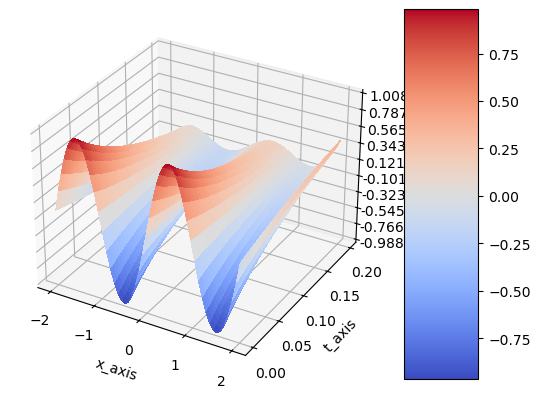

In [47]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.2, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.3]$
- training with iteration 20000

In [48]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.3, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0027)
1 Training Loss: tensor(0.0019)
2 Training Loss: tensor(0.0021)
3 Training Loss: tensor(0.0017)
4 Training Loss: tensor(0.0018)
5 Training Loss: tensor(0.0016)
6 Training Loss: tensor(0.0019)
7 Training Loss: tensor(0.0019)
8 Training Loss: tensor(0.0021)
9 Training Loss: tensor(0.0016)
10 Training Loss: tensor(0.0017)
11 Training Loss: tensor(0.0014)
12 Training Loss: tensor(0.0020)
13 Training Loss: tensor(0.0014)
14 Training Loss: tensor(0.0016)
15 Training Loss: tensor(0.0016)
16 Training Loss: tensor(0.0015)
17 Training Loss: tensor(0.0013)
18 Training Loss: tensor(0.0015)
19 Training Loss: tensor(0.0013)
20 Training Loss: tensor(0.0014)
21 Training Loss: tensor(0.0011)
22 Training Loss: tensor(0.0014)
23 Training Loss: tensor(0.0010)
24 Training Loss: tensor(0.0013)
25 Training Loss: tensor(0.0010)
26 Training Loss: tensor(0.0009)
27 Training Loss: tensor(0.0008)
28 Training Loss: tensor(0.0009)
29 Training Loss: tensor(0.0008)
30 Training Loss: te

250 Training Loss: tensor(0.0004)
251 Training Loss: tensor(0.0005)
252 Training Loss: tensor(0.0005)
253 Training Loss: tensor(0.0004)
254 Training Loss: tensor(0.0006)
255 Training Loss: tensor(0.0005)
256 Training Loss: tensor(0.0006)
257 Training Loss: tensor(0.0005)
258 Training Loss: tensor(0.0003)
259 Training Loss: tensor(0.0005)
260 Training Loss: tensor(0.0004)
261 Training Loss: tensor(0.0003)
262 Training Loss: tensor(0.0004)
263 Training Loss: tensor(0.0004)
264 Training Loss: tensor(0.0004)
265 Training Loss: tensor(0.0005)
266 Training Loss: tensor(0.0004)
267 Training Loss: tensor(0.0004)
268 Training Loss: tensor(0.0005)
269 Training Loss: tensor(0.0005)
270 Training Loss: tensor(0.0006)
271 Training Loss: tensor(0.0007)
272 Training Loss: tensor(0.0006)
273 Training Loss: tensor(0.0006)
274 Training Loss: tensor(0.0006)
275 Training Loss: tensor(0.0006)
276 Training Loss: tensor(0.0006)
277 Training Loss: tensor(0.0005)
278 Training Loss: tensor(0.0006)
279 Training L

496 Training Loss: tensor(0.0012)
497 Training Loss: tensor(0.0011)
498 Training Loss: tensor(0.0012)
499 Training Loss: tensor(0.0011)
500 Training Loss: tensor(0.0011)
501 Training Loss: tensor(0.0008)
502 Training Loss: tensor(0.0006)
503 Training Loss: tensor(0.0004)
504 Training Loss: tensor(0.0004)
505 Training Loss: tensor(0.0005)
506 Training Loss: tensor(0.0005)
507 Training Loss: tensor(0.0007)
508 Training Loss: tensor(0.0006)
509 Training Loss: tensor(0.0006)
510 Training Loss: tensor(0.0006)
511 Training Loss: tensor(0.0005)
512 Training Loss: tensor(0.0005)
513 Training Loss: tensor(0.0003)
514 Training Loss: tensor(0.0004)
515 Training Loss: tensor(0.0004)
516 Training Loss: tensor(0.0006)
517 Training Loss: tensor(0.0006)
518 Training Loss: tensor(0.0011)
519 Training Loss: tensor(0.0009)
520 Training Loss: tensor(0.0010)
521 Training Loss: tensor(0.0011)
522 Training Loss: tensor(0.0010)
523 Training Loss: tensor(0.0008)
524 Training Loss: tensor(0.0006)
525 Training L

742 Training Loss: tensor(0.0008)
743 Training Loss: tensor(0.0007)
744 Training Loss: tensor(0.0011)
745 Training Loss: tensor(0.0010)
746 Training Loss: tensor(0.0013)
747 Training Loss: tensor(0.0013)
748 Training Loss: tensor(0.0012)
749 Training Loss: tensor(0.0013)
750 Training Loss: tensor(0.0014)
751 Training Loss: tensor(0.0011)
752 Training Loss: tensor(0.0010)
753 Training Loss: tensor(0.0008)
754 Training Loss: tensor(0.0007)
755 Training Loss: tensor(0.0008)
756 Training Loss: tensor(0.0006)
757 Training Loss: tensor(0.0006)
758 Training Loss: tensor(0.0004)
759 Training Loss: tensor(0.0005)
760 Training Loss: tensor(0.0006)
761 Training Loss: tensor(0.0005)
762 Training Loss: tensor(0.0006)
763 Training Loss: tensor(0.0007)
764 Training Loss: tensor(0.0006)
765 Training Loss: tensor(0.0008)
766 Training Loss: tensor(0.0011)
767 Training Loss: tensor(0.0009)
768 Training Loss: tensor(0.0013)
769 Training Loss: tensor(0.0015)
770 Training Loss: tensor(0.0016)
771 Training L

984 Training Loss: tensor(0.0008)
985 Training Loss: tensor(0.0011)
986 Training Loss: tensor(0.0012)
987 Training Loss: tensor(0.0010)
988 Training Loss: tensor(0.0008)
989 Training Loss: tensor(0.0005)
990 Training Loss: tensor(0.0006)
991 Training Loss: tensor(0.0013)
992 Training Loss: tensor(0.0015)
993 Training Loss: tensor(0.0015)
994 Training Loss: tensor(0.0010)
995 Training Loss: tensor(0.0006)
996 Training Loss: tensor(0.0003)
997 Training Loss: tensor(0.0005)
998 Training Loss: tensor(0.0010)
999 Training Loss: tensor(0.0010)
1000 Training Loss: tensor(0.0013)
1001 Training Loss: tensor(0.0010)
1002 Training Loss: tensor(0.0007)
1003 Training Loss: tensor(0.0005)
1004 Training Loss: tensor(0.0003)
1005 Training Loss: tensor(0.0005)
1006 Training Loss: tensor(0.0009)
1007 Training Loss: tensor(0.0009)
1008 Training Loss: tensor(0.0011)
1009 Training Loss: tensor(0.0008)
1010 Training Loss: tensor(0.0007)
1011 Training Loss: tensor(0.0003)
1012 Training Loss: tensor(0.0004)
1

1222 Training Loss: tensor(0.0006)
1223 Training Loss: tensor(0.0008)
1224 Training Loss: tensor(0.0006)
1225 Training Loss: tensor(0.0009)
1226 Training Loss: tensor(0.0006)
1227 Training Loss: tensor(0.0010)
1228 Training Loss: tensor(0.0004)
1229 Training Loss: tensor(0.0013)
1230 Training Loss: tensor(0.0006)
1231 Training Loss: tensor(0.0005)
1232 Training Loss: tensor(0.0007)
1233 Training Loss: tensor(0.0006)
1234 Training Loss: tensor(0.0007)
1235 Training Loss: tensor(0.0006)
1236 Training Loss: tensor(0.0007)
1237 Training Loss: tensor(0.0005)
1238 Training Loss: tensor(0.0006)
1239 Training Loss: tensor(0.0006)
1240 Training Loss: tensor(0.0011)
1241 Training Loss: tensor(0.0012)
1242 Training Loss: tensor(0.0014)
1243 Training Loss: tensor(0.0013)
1244 Training Loss: tensor(0.0007)
1245 Training Loss: tensor(0.0009)
1246 Training Loss: tensor(0.0004)
1247 Training Loss: tensor(0.0004)
1248 Training Loss: tensor(0.0006)
1249 Training Loss: tensor(0.0009)
1250 Training Loss: 

1458 Training Loss: tensor(0.0007)
1459 Training Loss: tensor(0.0008)
1460 Training Loss: tensor(0.0010)
1461 Training Loss: tensor(0.0012)
1462 Training Loss: tensor(0.0012)
1463 Training Loss: tensor(0.0015)
1464 Training Loss: tensor(0.0015)
1465 Training Loss: tensor(0.0017)
1466 Training Loss: tensor(0.0030)
1467 Training Loss: tensor(0.0028)
1468 Training Loss: tensor(0.0032)
1469 Training Loss: tensor(0.0045)
1470 Training Loss: tensor(0.0034)
1471 Training Loss: tensor(0.0031)
1472 Training Loss: tensor(0.0014)
1473 Training Loss: tensor(0.0007)
1474 Training Loss: tensor(0.0008)
1475 Training Loss: tensor(0.0016)
1476 Training Loss: tensor(0.0022)
1477 Training Loss: tensor(0.0031)
1478 Training Loss: tensor(0.0033)
1479 Training Loss: tensor(0.0029)
1480 Training Loss: tensor(0.0019)
1481 Training Loss: tensor(0.0016)
1482 Training Loss: tensor(0.0013)
1483 Training Loss: tensor(0.0004)
1484 Training Loss: tensor(0.0009)
1485 Training Loss: tensor(0.0009)
1486 Training Loss: 

1695 Training Loss: tensor(0.0003)
1696 Training Loss: tensor(0.0003)
1697 Training Loss: tensor(0.0004)
1698 Training Loss: tensor(0.0004)
1699 Training Loss: tensor(0.0003)
1700 Training Loss: tensor(0.0003)
1701 Training Loss: tensor(0.0002)
1702 Training Loss: tensor(0.0002)
1703 Training Loss: tensor(0.0002)
1704 Training Loss: tensor(0.0003)
1705 Training Loss: tensor(0.0002)
1706 Training Loss: tensor(0.0002)
1707 Training Loss: tensor(0.0003)
1708 Training Loss: tensor(0.0003)
1709 Training Loss: tensor(0.0003)
1710 Training Loss: tensor(0.0005)
1711 Training Loss: tensor(0.0005)
1712 Training Loss: tensor(0.0004)
1713 Training Loss: tensor(0.0005)
1714 Training Loss: tensor(0.0004)
1715 Training Loss: tensor(0.0003)
1716 Training Loss: tensor(0.0004)
1717 Training Loss: tensor(0.0003)
1718 Training Loss: tensor(0.0003)
1719 Training Loss: tensor(0.0004)
1720 Training Loss: tensor(0.0003)
1721 Training Loss: tensor(0.0004)
1722 Training Loss: tensor(0.0005)
1723 Training Loss: 

1932 Training Loss: tensor(0.0008)
1933 Training Loss: tensor(0.0007)
1934 Training Loss: tensor(0.0007)
1935 Training Loss: tensor(0.0010)
1936 Training Loss: tensor(0.0012)
1937 Training Loss: tensor(0.0025)
1938 Training Loss: tensor(0.0024)
1939 Training Loss: tensor(0.0022)
1940 Training Loss: tensor(0.0014)
1941 Training Loss: tensor(0.0009)
1942 Training Loss: tensor(0.0006)
1943 Training Loss: tensor(0.0005)
1944 Training Loss: tensor(0.0009)
1945 Training Loss: tensor(0.0008)
1946 Training Loss: tensor(0.0006)
1947 Training Loss: tensor(0.0008)
1948 Training Loss: tensor(0.0008)
1949 Training Loss: tensor(0.0007)
1950 Training Loss: tensor(0.0009)
1951 Training Loss: tensor(0.0006)
1952 Training Loss: tensor(0.0006)
1953 Training Loss: tensor(0.0005)
1954 Training Loss: tensor(0.0005)
1955 Training Loss: tensor(0.0003)
1956 Training Loss: tensor(0.0003)
1957 Training Loss: tensor(0.0003)
1958 Training Loss: tensor(0.0004)
1959 Training Loss: tensor(0.0004)
1960 Training Loss: 

2167 Training Loss: tensor(0.0004)
2168 Training Loss: tensor(0.0002)
2169 Training Loss: tensor(0.0004)
2170 Training Loss: tensor(0.0003)
2171 Training Loss: tensor(0.0004)
2172 Training Loss: tensor(0.0003)
2173 Training Loss: tensor(0.0004)
2174 Training Loss: tensor(0.0003)
2175 Training Loss: tensor(0.0003)
2176 Training Loss: tensor(0.0003)
2177 Training Loss: tensor(0.0003)
2178 Training Loss: tensor(0.0003)
2179 Training Loss: tensor(0.0003)
2180 Training Loss: tensor(0.0004)
2181 Training Loss: tensor(0.0004)
2182 Training Loss: tensor(0.0005)
2183 Training Loss: tensor(0.0005)
2184 Training Loss: tensor(0.0007)
2185 Training Loss: tensor(0.0011)
2186 Training Loss: tensor(0.0012)
2187 Training Loss: tensor(0.0018)
2188 Training Loss: tensor(0.0024)
2189 Training Loss: tensor(0.0032)
2190 Training Loss: tensor(0.0044)
2191 Training Loss: tensor(0.0053)
2192 Training Loss: tensor(0.0055)
2193 Training Loss: tensor(0.0045)
2194 Training Loss: tensor(0.0036)
2195 Training Loss: 

2402 Training Loss: tensor(0.0006)
2403 Training Loss: tensor(0.0009)
2404 Training Loss: tensor(0.0008)
2405 Training Loss: tensor(0.0003)
2406 Training Loss: tensor(0.0006)
2407 Training Loss: tensor(0.0004)
2408 Training Loss: tensor(0.0003)
2409 Training Loss: tensor(0.0005)
2410 Training Loss: tensor(0.0004)
2411 Training Loss: tensor(0.0005)
2412 Training Loss: tensor(0.0006)
2413 Training Loss: tensor(0.0008)
2414 Training Loss: tensor(0.0008)
2415 Training Loss: tensor(0.0007)
2416 Training Loss: tensor(0.0005)
2417 Training Loss: tensor(0.0003)
2418 Training Loss: tensor(0.0003)
2419 Training Loss: tensor(0.0005)
2420 Training Loss: tensor(0.0007)
2421 Training Loss: tensor(0.0010)
2422 Training Loss: tensor(0.0011)
2423 Training Loss: tensor(0.0009)
2424 Training Loss: tensor(0.0007)
2425 Training Loss: tensor(0.0006)
2426 Training Loss: tensor(0.0002)
2427 Training Loss: tensor(0.0005)
2428 Training Loss: tensor(0.0006)
2429 Training Loss: tensor(0.0007)
2430 Training Loss: 

2639 Training Loss: tensor(0.0006)
2640 Training Loss: tensor(0.0010)
2641 Training Loss: tensor(0.0018)
2642 Training Loss: tensor(0.0023)
2643 Training Loss: tensor(0.0034)
2644 Training Loss: tensor(0.0045)
2645 Training Loss: tensor(0.0046)
2646 Training Loss: tensor(0.0048)
2647 Training Loss: tensor(0.0040)
2648 Training Loss: tensor(0.0034)
2649 Training Loss: tensor(0.0025)
2650 Training Loss: tensor(0.0009)
2651 Training Loss: tensor(0.0006)
2652 Training Loss: tensor(0.0010)
2653 Training Loss: tensor(0.0019)
2654 Training Loss: tensor(0.0032)
2655 Training Loss: tensor(0.0038)
2656 Training Loss: tensor(0.0044)
2657 Training Loss: tensor(0.0040)
2658 Training Loss: tensor(0.0034)
2659 Training Loss: tensor(0.0025)
2660 Training Loss: tensor(0.0012)
2661 Training Loss: tensor(0.0007)
2662 Training Loss: tensor(0.0008)
2663 Training Loss: tensor(0.0014)
2664 Training Loss: tensor(0.0018)
2665 Training Loss: tensor(0.0019)
2666 Training Loss: tensor(0.0010)
2667 Training Loss: 

2879 Training Loss: tensor(0.0023)
2880 Training Loss: tensor(0.0020)
2881 Training Loss: tensor(0.0018)
2882 Training Loss: tensor(0.0014)
2883 Training Loss: tensor(0.0013)
2884 Training Loss: tensor(0.0012)
2885 Training Loss: tensor(0.0010)
2886 Training Loss: tensor(0.0009)
2887 Training Loss: tensor(0.0007)
2888 Training Loss: tensor(0.0005)
2889 Training Loss: tensor(0.0008)
2890 Training Loss: tensor(0.0013)
2891 Training Loss: tensor(0.0007)
2892 Training Loss: tensor(0.0006)
2893 Training Loss: tensor(0.0015)
2894 Training Loss: tensor(0.0007)
2895 Training Loss: tensor(0.0007)
2896 Training Loss: tensor(0.0010)
2897 Training Loss: tensor(0.0005)
2898 Training Loss: tensor(0.0007)
2899 Training Loss: tensor(0.0007)
2900 Training Loss: tensor(0.0015)
2901 Training Loss: tensor(0.0013)
2902 Training Loss: tensor(0.0007)
2903 Training Loss: tensor(0.0014)
2904 Training Loss: tensor(0.0006)
2905 Training Loss: tensor(0.0009)
2906 Training Loss: tensor(0.0007)
2907 Training Loss: 

3119 Training Loss: tensor(0.0003)
3120 Training Loss: tensor(0.0002)
3121 Training Loss: tensor(0.0002)
3122 Training Loss: tensor(0.0002)
3123 Training Loss: tensor(0.0002)
3124 Training Loss: tensor(0.0004)
3125 Training Loss: tensor(0.0006)
3126 Training Loss: tensor(0.0005)
3127 Training Loss: tensor(0.0006)
3128 Training Loss: tensor(0.0007)
3129 Training Loss: tensor(0.0006)
3130 Training Loss: tensor(0.0005)
3131 Training Loss: tensor(0.0006)
3132 Training Loss: tensor(0.0007)
3133 Training Loss: tensor(0.0006)
3134 Training Loss: tensor(0.0004)
3135 Training Loss: tensor(0.0003)
3136 Training Loss: tensor(0.0006)
3137 Training Loss: tensor(0.0008)
3138 Training Loss: tensor(0.0006)
3139 Training Loss: tensor(0.0015)
3140 Training Loss: tensor(0.0013)
3141 Training Loss: tensor(0.0015)
3142 Training Loss: tensor(0.0019)
3143 Training Loss: tensor(0.0015)
3144 Training Loss: tensor(0.0015)
3145 Training Loss: tensor(0.0012)
3146 Training Loss: tensor(0.0009)
3147 Training Loss: 

3359 Training Loss: tensor(0.0005)
3360 Training Loss: tensor(0.0005)
3361 Training Loss: tensor(0.0004)
3362 Training Loss: tensor(0.0003)
3363 Training Loss: tensor(0.0003)
3364 Training Loss: tensor(0.0002)
3365 Training Loss: tensor(0.0003)
3366 Training Loss: tensor(0.0003)
3367 Training Loss: tensor(0.0003)
3368 Training Loss: tensor(0.0005)
3369 Training Loss: tensor(0.0004)
3370 Training Loss: tensor(0.0004)
3371 Training Loss: tensor(0.0005)
3372 Training Loss: tensor(0.0005)
3373 Training Loss: tensor(0.0004)
3374 Training Loss: tensor(0.0007)
3375 Training Loss: tensor(0.0008)
3376 Training Loss: tensor(0.0009)
3377 Training Loss: tensor(0.0014)
3378 Training Loss: tensor(0.0016)
3379 Training Loss: tensor(0.0013)
3380 Training Loss: tensor(0.0017)
3381 Training Loss: tensor(0.0015)
3382 Training Loss: tensor(0.0012)
3383 Training Loss: tensor(0.0011)
3384 Training Loss: tensor(0.0006)
3385 Training Loss: tensor(0.0006)
3386 Training Loss: tensor(0.0005)
3387 Training Loss: 

3599 Training Loss: tensor(0.0003)
3600 Training Loss: tensor(0.0004)
3601 Training Loss: tensor(0.0005)
3602 Training Loss: tensor(0.0003)
3603 Training Loss: tensor(0.0004)
3604 Training Loss: tensor(0.0004)
3605 Training Loss: tensor(0.0005)
3606 Training Loss: tensor(0.0004)
3607 Training Loss: tensor(0.0005)
3608 Training Loss: tensor(0.0006)
3609 Training Loss: tensor(0.0005)
3610 Training Loss: tensor(0.0004)
3611 Training Loss: tensor(0.0003)
3612 Training Loss: tensor(0.0005)
3613 Training Loss: tensor(0.0004)
3614 Training Loss: tensor(0.0007)
3615 Training Loss: tensor(0.0005)
3616 Training Loss: tensor(0.0005)
3617 Training Loss: tensor(0.0006)
3618 Training Loss: tensor(0.0004)
3619 Training Loss: tensor(0.0006)
3620 Training Loss: tensor(0.0003)
3621 Training Loss: tensor(0.0008)
3622 Training Loss: tensor(0.0004)
3623 Training Loss: tensor(0.0006)
3624 Training Loss: tensor(0.0004)
3625 Training Loss: tensor(0.0006)
3626 Training Loss: tensor(0.0005)
3627 Training Loss: 

3836 Training Loss: tensor(0.0009)
3837 Training Loss: tensor(0.0014)
3838 Training Loss: tensor(0.0011)
3839 Training Loss: tensor(0.0013)
3840 Training Loss: tensor(0.0012)
3841 Training Loss: tensor(0.0006)
3842 Training Loss: tensor(0.0007)
3843 Training Loss: tensor(0.0005)
3844 Training Loss: tensor(0.0004)
3845 Training Loss: tensor(0.0006)
3846 Training Loss: tensor(0.0003)
3847 Training Loss: tensor(0.0003)
3848 Training Loss: tensor(0.0005)
3849 Training Loss: tensor(0.0003)
3850 Training Loss: tensor(0.0007)
3851 Training Loss: tensor(0.0004)
3852 Training Loss: tensor(0.0004)
3853 Training Loss: tensor(0.0005)
3854 Training Loss: tensor(0.0005)
3855 Training Loss: tensor(0.0007)
3856 Training Loss: tensor(0.0006)
3857 Training Loss: tensor(0.0006)
3858 Training Loss: tensor(0.0008)
3859 Training Loss: tensor(0.0009)
3860 Training Loss: tensor(0.0015)
3861 Training Loss: tensor(0.0022)
3862 Training Loss: tensor(0.0031)
3863 Training Loss: tensor(0.0044)
3864 Training Loss: 

4074 Training Loss: tensor(0.0012)
4075 Training Loss: tensor(0.0025)
4076 Training Loss: tensor(0.0033)
4077 Training Loss: tensor(0.0033)
4078 Training Loss: tensor(0.0021)
4079 Training Loss: tensor(0.0020)
4080 Training Loss: tensor(0.0008)
4081 Training Loss: tensor(0.0008)
4082 Training Loss: tensor(0.0006)
4083 Training Loss: tensor(0.0014)
4084 Training Loss: tensor(0.0017)
4085 Training Loss: tensor(0.0018)
4086 Training Loss: tensor(0.0013)
4087 Training Loss: tensor(0.0006)
4088 Training Loss: tensor(0.0004)
4089 Training Loss: tensor(0.0006)
4090 Training Loss: tensor(0.0008)
4091 Training Loss: tensor(0.0008)
4092 Training Loss: tensor(0.0012)
4093 Training Loss: tensor(0.0011)
4094 Training Loss: tensor(0.0008)
4095 Training Loss: tensor(0.0006)
4096 Training Loss: tensor(0.0005)
4097 Training Loss: tensor(0.0003)
4098 Training Loss: tensor(0.0004)
4099 Training Loss: tensor(0.0003)
4100 Training Loss: tensor(0.0004)
4101 Training Loss: tensor(0.0002)
4102 Training Loss: 

4314 Training Loss: tensor(0.0002)
4315 Training Loss: tensor(0.0003)
4316 Training Loss: tensor(0.0004)
4317 Training Loss: tensor(0.0003)
4318 Training Loss: tensor(0.0003)
4319 Training Loss: tensor(0.0002)
4320 Training Loss: tensor(0.0002)
4321 Training Loss: tensor(0.0003)
4322 Training Loss: tensor(0.0002)
4323 Training Loss: tensor(0.0003)
4324 Training Loss: tensor(0.0003)
4325 Training Loss: tensor(0.0002)
4326 Training Loss: tensor(0.0002)
4327 Training Loss: tensor(0.0002)
4328 Training Loss: tensor(0.0002)
4329 Training Loss: tensor(0.0002)
4330 Training Loss: tensor(0.0002)
4331 Training Loss: tensor(0.0003)
4332 Training Loss: tensor(0.0002)
4333 Training Loss: tensor(0.0003)
4334 Training Loss: tensor(0.0002)
4335 Training Loss: tensor(0.0002)
4336 Training Loss: tensor(0.0002)
4337 Training Loss: tensor(0.0002)
4338 Training Loss: tensor(0.0002)
4339 Training Loss: tensor(0.0002)
4340 Training Loss: tensor(0.0002)
4341 Training Loss: tensor(0.0002)
4342 Training Loss: 

4554 Training Loss: tensor(0.0006)
4555 Training Loss: tensor(0.0006)
4556 Training Loss: tensor(0.0003)
4557 Training Loss: tensor(0.0009)
4558 Training Loss: tensor(0.0007)
4559 Training Loss: tensor(0.0011)
4560 Training Loss: tensor(0.0011)
4561 Training Loss: tensor(0.0016)
4562 Training Loss: tensor(0.0020)
4563 Training Loss: tensor(0.0024)
4564 Training Loss: tensor(0.0030)
4565 Training Loss: tensor(0.0032)
4566 Training Loss: tensor(0.0038)
4567 Training Loss: tensor(0.0028)
4568 Training Loss: tensor(0.0021)
4569 Training Loss: tensor(0.0014)
4570 Training Loss: tensor(0.0006)
4571 Training Loss: tensor(0.0006)
4572 Training Loss: tensor(0.0008)
4573 Training Loss: tensor(0.0012)
4574 Training Loss: tensor(0.0012)
4575 Training Loss: tensor(0.0014)
4576 Training Loss: tensor(0.0008)
4577 Training Loss: tensor(0.0010)
4578 Training Loss: tensor(0.0005)
4579 Training Loss: tensor(0.0005)
4580 Training Loss: tensor(0.0007)
4581 Training Loss: tensor(0.0004)
4582 Training Loss: 

4793 Training Loss: tensor(0.0006)
4794 Training Loss: tensor(0.0008)
4795 Training Loss: tensor(0.0008)
4796 Training Loss: tensor(0.0010)
4797 Training Loss: tensor(0.0010)
4798 Training Loss: tensor(0.0011)
4799 Training Loss: tensor(0.0009)
4800 Training Loss: tensor(0.0008)
4801 Training Loss: tensor(0.0007)
4802 Training Loss: tensor(0.0013)
4803 Training Loss: tensor(0.0014)
4804 Training Loss: tensor(0.0014)
4805 Training Loss: tensor(0.0017)
4806 Training Loss: tensor(0.0009)
4807 Training Loss: tensor(0.0006)
4808 Training Loss: tensor(0.0004)
4809 Training Loss: tensor(0.0011)
4810 Training Loss: tensor(0.0012)
4811 Training Loss: tensor(0.0012)
4812 Training Loss: tensor(0.0009)
4813 Training Loss: tensor(0.0005)
4814 Training Loss: tensor(0.0004)
4815 Training Loss: tensor(0.0003)
4816 Training Loss: tensor(0.0005)
4817 Training Loss: tensor(0.0005)
4818 Training Loss: tensor(0.0005)
4819 Training Loss: tensor(0.0006)
4820 Training Loss: tensor(0.0002)
4821 Training Loss: 

5030 Training Loss: tensor(0.0014)
5031 Training Loss: tensor(0.0006)
5032 Training Loss: tensor(0.0011)
5033 Training Loss: tensor(0.0014)
5034 Training Loss: tensor(0.0009)
5035 Training Loss: tensor(0.0015)
5036 Training Loss: tensor(0.0013)
5037 Training Loss: tensor(0.0011)
5038 Training Loss: tensor(0.0018)
5039 Training Loss: tensor(0.0013)
5040 Training Loss: tensor(0.0014)
5041 Training Loss: tensor(0.0015)
5042 Training Loss: tensor(0.0006)
5043 Training Loss: tensor(0.0009)
5044 Training Loss: tensor(0.0004)
5045 Training Loss: tensor(0.0005)
5046 Training Loss: tensor(0.0006)
5047 Training Loss: tensor(0.0005)
5048 Training Loss: tensor(0.0007)
5049 Training Loss: tensor(0.0007)
5050 Training Loss: tensor(0.0006)
5051 Training Loss: tensor(0.0007)
5052 Training Loss: tensor(0.0006)
5053 Training Loss: tensor(0.0002)
5054 Training Loss: tensor(0.0005)
5055 Training Loss: tensor(0.0003)
5056 Training Loss: tensor(0.0005)
5057 Training Loss: tensor(0.0006)
5058 Training Loss: 

5270 Training Loss: tensor(0.0010)
5271 Training Loss: tensor(0.0009)
5272 Training Loss: tensor(0.0009)
5273 Training Loss: tensor(0.0012)
5274 Training Loss: tensor(0.0009)
5275 Training Loss: tensor(0.0008)
5276 Training Loss: tensor(0.0007)
5277 Training Loss: tensor(0.0006)
5278 Training Loss: tensor(0.0007)
5279 Training Loss: tensor(0.0010)
5280 Training Loss: tensor(0.0013)
5281 Training Loss: tensor(0.0019)
5282 Training Loss: tensor(0.0021)
5283 Training Loss: tensor(0.0027)
5284 Training Loss: tensor(0.0027)
5285 Training Loss: tensor(0.0027)
5286 Training Loss: tensor(0.0026)
5287 Training Loss: tensor(0.0021)
5288 Training Loss: tensor(0.0012)
5289 Training Loss: tensor(0.0006)
5290 Training Loss: tensor(0.0004)
5291 Training Loss: tensor(0.0006)
5292 Training Loss: tensor(0.0009)
5293 Training Loss: tensor(0.0011)
5294 Training Loss: tensor(0.0011)
5295 Training Loss: tensor(0.0009)
5296 Training Loss: tensor(0.0006)
5297 Training Loss: tensor(0.0004)
5298 Training Loss: 

5506 Training Loss: tensor(0.0016)
5507 Training Loss: tensor(0.0028)
5508 Training Loss: tensor(0.0045)
5509 Training Loss: tensor(0.0059)
5510 Training Loss: tensor(0.0068)
5511 Training Loss: tensor(0.0054)
5512 Training Loss: tensor(0.0031)
5513 Training Loss: tensor(0.0011)
5514 Training Loss: tensor(0.0006)
5515 Training Loss: tensor(0.0015)
5516 Training Loss: tensor(0.0033)
5517 Training Loss: tensor(0.0040)
5518 Training Loss: tensor(0.0034)
5519 Training Loss: tensor(0.0017)
5520 Training Loss: tensor(0.0006)
5521 Training Loss: tensor(0.0011)
5522 Training Loss: tensor(0.0024)
5523 Training Loss: tensor(0.0047)
5524 Training Loss: tensor(0.0048)
5525 Training Loss: tensor(0.0040)
5526 Training Loss: tensor(0.0021)
5527 Training Loss: tensor(0.0007)
5528 Training Loss: tensor(0.0006)
5529 Training Loss: tensor(0.0013)
5530 Training Loss: tensor(0.0021)
5531 Training Loss: tensor(0.0019)
5532 Training Loss: tensor(0.0011)
5533 Training Loss: tensor(0.0007)
5534 Training Loss: 

5747 Training Loss: tensor(0.0006)
5748 Training Loss: tensor(0.0004)
5749 Training Loss: tensor(0.0009)
5750 Training Loss: tensor(0.0011)
5751 Training Loss: tensor(0.0009)
5752 Training Loss: tensor(0.0010)
5753 Training Loss: tensor(0.0007)
5754 Training Loss: tensor(0.0005)
5755 Training Loss: tensor(0.0006)
5756 Training Loss: tensor(0.0002)
5757 Training Loss: tensor(0.0004)
5758 Training Loss: tensor(0.0003)
5759 Training Loss: tensor(0.0004)
5760 Training Loss: tensor(0.0007)
5761 Training Loss: tensor(0.0003)
5762 Training Loss: tensor(0.0007)
5763 Training Loss: tensor(0.0004)
5764 Training Loss: tensor(0.0003)
5765 Training Loss: tensor(0.0005)
5766 Training Loss: tensor(0.0002)
5767 Training Loss: tensor(0.0003)
5768 Training Loss: tensor(0.0003)
5769 Training Loss: tensor(0.0003)
5770 Training Loss: tensor(0.0005)
5771 Training Loss: tensor(0.0004)
5772 Training Loss: tensor(0.0004)
5773 Training Loss: tensor(0.0004)
5774 Training Loss: tensor(0.0003)
5775 Training Loss: 

5988 Training Loss: tensor(0.0011)
5989 Training Loss: tensor(0.0007)
5990 Training Loss: tensor(0.0009)
5991 Training Loss: tensor(0.0010)
5992 Training Loss: tensor(0.0006)
5993 Training Loss: tensor(0.0010)
5994 Training Loss: tensor(0.0005)
5995 Training Loss: tensor(0.0007)
5996 Training Loss: tensor(0.0005)
5997 Training Loss: tensor(0.0006)
5998 Training Loss: tensor(0.0003)
5999 Training Loss: tensor(0.0006)
6000 Training Loss: tensor(0.0005)
6001 Training Loss: tensor(0.0004)
6002 Training Loss: tensor(0.0004)
6003 Training Loss: tensor(0.0005)
6004 Training Loss: tensor(0.0006)
6005 Training Loss: tensor(0.0004)
6006 Training Loss: tensor(0.0004)
6007 Training Loss: tensor(0.0003)
6008 Training Loss: tensor(0.0003)
6009 Training Loss: tensor(0.0002)
6010 Training Loss: tensor(0.0003)
6011 Training Loss: tensor(0.0003)
6012 Training Loss: tensor(0.0005)
6013 Training Loss: tensor(0.0008)
6014 Training Loss: tensor(0.0010)
6015 Training Loss: tensor(0.0014)
6016 Training Loss: 

6227 Training Loss: tensor(0.0003)
6228 Training Loss: tensor(0.0004)
6229 Training Loss: tensor(0.0003)
6230 Training Loss: tensor(0.0004)
6231 Training Loss: tensor(0.0005)
6232 Training Loss: tensor(0.0006)
6233 Training Loss: tensor(0.0005)
6234 Training Loss: tensor(0.0002)
6235 Training Loss: tensor(0.0003)
6236 Training Loss: tensor(0.0005)
6237 Training Loss: tensor(0.0003)
6238 Training Loss: tensor(0.0003)
6239 Training Loss: tensor(0.0004)
6240 Training Loss: tensor(0.0002)
6241 Training Loss: tensor(0.0003)
6242 Training Loss: tensor(0.0003)
6243 Training Loss: tensor(0.0004)
6244 Training Loss: tensor(0.0003)
6245 Training Loss: tensor(0.0004)
6246 Training Loss: tensor(0.0005)
6247 Training Loss: tensor(0.0003)
6248 Training Loss: tensor(0.0005)
6249 Training Loss: tensor(0.0004)
6250 Training Loss: tensor(0.0004)
6251 Training Loss: tensor(0.0006)
6252 Training Loss: tensor(0.0003)
6253 Training Loss: tensor(0.0005)
6254 Training Loss: tensor(0.0003)
6255 Training Loss: 

6464 Training Loss: tensor(0.0002)
6465 Training Loss: tensor(0.0004)
6466 Training Loss: tensor(0.0005)
6467 Training Loss: tensor(0.0005)
6468 Training Loss: tensor(0.0008)
6469 Training Loss: tensor(0.0008)
6470 Training Loss: tensor(0.0010)
6471 Training Loss: tensor(0.0008)
6472 Training Loss: tensor(0.0009)
6473 Training Loss: tensor(0.0003)
6474 Training Loss: tensor(0.0003)
6475 Training Loss: tensor(0.0006)
6476 Training Loss: tensor(0.0009)
6477 Training Loss: tensor(0.0013)
6478 Training Loss: tensor(0.0016)
6479 Training Loss: tensor(0.0013)
6480 Training Loss: tensor(0.0007)
6481 Training Loss: tensor(0.0004)
6482 Training Loss: tensor(0.0003)
6483 Training Loss: tensor(0.0007)
6484 Training Loss: tensor(0.0015)
6485 Training Loss: tensor(0.0017)
6486 Training Loss: tensor(0.0017)
6487 Training Loss: tensor(0.0013)
6488 Training Loss: tensor(0.0007)
6489 Training Loss: tensor(0.0004)
6490 Training Loss: tensor(0.0004)
6491 Training Loss: tensor(0.0003)
6492 Training Loss: 

6700 Training Loss: tensor(0.0007)
6701 Training Loss: tensor(0.0006)
6702 Training Loss: tensor(0.0006)
6703 Training Loss: tensor(0.0005)
6704 Training Loss: tensor(0.0006)
6705 Training Loss: tensor(0.0004)
6706 Training Loss: tensor(0.0004)
6707 Training Loss: tensor(0.0005)
6708 Training Loss: tensor(0.0003)
6709 Training Loss: tensor(0.0004)
6710 Training Loss: tensor(0.0004)
6711 Training Loss: tensor(0.0004)
6712 Training Loss: tensor(0.0005)
6713 Training Loss: tensor(0.0003)
6714 Training Loss: tensor(0.0004)
6715 Training Loss: tensor(0.0003)
6716 Training Loss: tensor(0.0004)
6717 Training Loss: tensor(0.0007)
6718 Training Loss: tensor(0.0004)
6719 Training Loss: tensor(0.0004)
6720 Training Loss: tensor(0.0005)
6721 Training Loss: tensor(0.0005)
6722 Training Loss: tensor(0.0004)
6723 Training Loss: tensor(0.0004)
6724 Training Loss: tensor(0.0002)
6725 Training Loss: tensor(0.0002)
6726 Training Loss: tensor(0.0003)
6727 Training Loss: tensor(0.0003)
6728 Training Loss: 

6940 Training Loss: tensor(0.0007)
6941 Training Loss: tensor(0.0007)
6942 Training Loss: tensor(0.0007)
6943 Training Loss: tensor(0.0005)
6944 Training Loss: tensor(0.0004)
6945 Training Loss: tensor(0.0004)
6946 Training Loss: tensor(0.0003)
6947 Training Loss: tensor(0.0004)
6948 Training Loss: tensor(0.0002)
6949 Training Loss: tensor(0.0004)
6950 Training Loss: tensor(0.0002)
6951 Training Loss: tensor(0.0003)
6952 Training Loss: tensor(0.0002)
6953 Training Loss: tensor(0.0002)
6954 Training Loss: tensor(0.0002)
6955 Training Loss: tensor(0.0002)
6956 Training Loss: tensor(0.0002)
6957 Training Loss: tensor(0.0003)
6958 Training Loss: tensor(0.0002)
6959 Training Loss: tensor(0.0004)
6960 Training Loss: tensor(0.0003)
6961 Training Loss: tensor(0.0002)
6962 Training Loss: tensor(0.0003)
6963 Training Loss: tensor(0.0003)
6964 Training Loss: tensor(0.0002)
6965 Training Loss: tensor(0.0002)
6966 Training Loss: tensor(0.0002)
6967 Training Loss: tensor(0.0003)
6968 Training Loss: 

7178 Training Loss: tensor(0.0025)
7179 Training Loss: tensor(0.0019)
7180 Training Loss: tensor(0.0013)
7181 Training Loss: tensor(0.0009)
7182 Training Loss: tensor(0.0004)
7183 Training Loss: tensor(0.0006)
7184 Training Loss: tensor(0.0011)
7185 Training Loss: tensor(0.0011)
7186 Training Loss: tensor(0.0017)
7187 Training Loss: tensor(0.0016)
7188 Training Loss: tensor(0.0012)
7189 Training Loss: tensor(0.0014)
7190 Training Loss: tensor(0.0007)
7191 Training Loss: tensor(0.0006)
7192 Training Loss: tensor(0.0005)
7193 Training Loss: tensor(0.0005)
7194 Training Loss: tensor(0.0007)
7195 Training Loss: tensor(0.0008)
7196 Training Loss: tensor(0.0006)
7197 Training Loss: tensor(0.0011)
7198 Training Loss: tensor(0.0011)
7199 Training Loss: tensor(0.0004)
7200 Training Loss: tensor(0.0009)
7201 Training Loss: tensor(0.0004)
7202 Training Loss: tensor(0.0004)
7203 Training Loss: tensor(0.0005)
7204 Training Loss: tensor(0.0003)
7205 Training Loss: tensor(0.0003)
7206 Training Loss: 

7413 Training Loss: tensor(0.0005)
7414 Training Loss: tensor(0.0004)
7415 Training Loss: tensor(0.0005)
7416 Training Loss: tensor(0.0004)
7417 Training Loss: tensor(0.0002)
7418 Training Loss: tensor(0.0004)
7419 Training Loss: tensor(0.0003)
7420 Training Loss: tensor(0.0002)
7421 Training Loss: tensor(0.0003)
7422 Training Loss: tensor(0.0003)
7423 Training Loss: tensor(0.0002)
7424 Training Loss: tensor(0.0003)
7425 Training Loss: tensor(0.0003)
7426 Training Loss: tensor(0.0002)
7427 Training Loss: tensor(0.0002)
7428 Training Loss: tensor(0.0002)
7429 Training Loss: tensor(0.0002)
7430 Training Loss: tensor(0.0003)
7431 Training Loss: tensor(0.0002)
7432 Training Loss: tensor(0.0003)
7433 Training Loss: tensor(0.0003)
7434 Training Loss: tensor(0.0001)
7435 Training Loss: tensor(0.0003)
7436 Training Loss: tensor(0.0002)
7437 Training Loss: tensor(0.0003)
7438 Training Loss: tensor(0.0004)
7439 Training Loss: tensor(0.0004)
7440 Training Loss: tensor(0.0004)
7441 Training Loss: 

7653 Training Loss: tensor(0.0017)
7654 Training Loss: tensor(0.0018)
7655 Training Loss: tensor(0.0023)
7656 Training Loss: tensor(0.0018)
7657 Training Loss: tensor(0.0014)
7658 Training Loss: tensor(0.0008)
7659 Training Loss: tensor(0.0003)
7660 Training Loss: tensor(0.0003)
7661 Training Loss: tensor(0.0010)
7662 Training Loss: tensor(0.0020)
7663 Training Loss: tensor(0.0032)
7664 Training Loss: tensor(0.0041)
7665 Training Loss: tensor(0.0045)
7666 Training Loss: tensor(0.0039)
7667 Training Loss: tensor(0.0031)
7668 Training Loss: tensor(0.0016)
7669 Training Loss: tensor(0.0008)
7670 Training Loss: tensor(0.0003)
7671 Training Loss: tensor(0.0010)
7672 Training Loss: tensor(0.0017)
7673 Training Loss: tensor(0.0025)
7674 Training Loss: tensor(0.0024)
7675 Training Loss: tensor(0.0021)
7676 Training Loss: tensor(0.0014)
7677 Training Loss: tensor(0.0008)
7678 Training Loss: tensor(0.0005)
7679 Training Loss: tensor(0.0003)
7680 Training Loss: tensor(0.0006)
7681 Training Loss: 

7891 Training Loss: tensor(0.0005)
7892 Training Loss: tensor(0.0004)
7893 Training Loss: tensor(0.0004)
7894 Training Loss: tensor(0.0003)
7895 Training Loss: tensor(0.0005)
7896 Training Loss: tensor(0.0004)
7897 Training Loss: tensor(0.0005)
7898 Training Loss: tensor(0.0004)
7899 Training Loss: tensor(0.0004)
7900 Training Loss: tensor(0.0004)
7901 Training Loss: tensor(0.0003)
7902 Training Loss: tensor(0.0004)
7903 Training Loss: tensor(0.0003)
7904 Training Loss: tensor(0.0003)
7905 Training Loss: tensor(0.0004)
7906 Training Loss: tensor(0.0004)
7907 Training Loss: tensor(0.0003)
7908 Training Loss: tensor(0.0003)
7909 Training Loss: tensor(0.0002)
7910 Training Loss: tensor(0.0003)
7911 Training Loss: tensor(0.0004)
7912 Training Loss: tensor(0.0003)
7913 Training Loss: tensor(0.0003)
7914 Training Loss: tensor(0.0003)
7915 Training Loss: tensor(0.0002)
7916 Training Loss: tensor(0.0003)
7917 Training Loss: tensor(0.0003)
7918 Training Loss: tensor(0.0003)
7919 Training Loss: 

8129 Training Loss: tensor(0.0024)
8130 Training Loss: tensor(0.0035)
8131 Training Loss: tensor(0.0030)
8132 Training Loss: tensor(0.0023)
8133 Training Loss: tensor(0.0015)
8134 Training Loss: tensor(0.0004)
8135 Training Loss: tensor(0.0004)
8136 Training Loss: tensor(0.0012)
8137 Training Loss: tensor(0.0016)
8138 Training Loss: tensor(0.0019)
8139 Training Loss: tensor(0.0017)
8140 Training Loss: tensor(0.0006)
8141 Training Loss: tensor(0.0009)
8142 Training Loss: tensor(0.0015)
8143 Training Loss: tensor(0.0019)
8144 Training Loss: tensor(0.0023)
8145 Training Loss: tensor(0.0018)
8146 Training Loss: tensor(0.0007)
8147 Training Loss: tensor(0.0005)
8148 Training Loss: tensor(0.0005)
8149 Training Loss: tensor(0.0010)
8150 Training Loss: tensor(0.0014)
8151 Training Loss: tensor(0.0010)
8152 Training Loss: tensor(0.0007)
8153 Training Loss: tensor(0.0006)
8154 Training Loss: tensor(0.0008)
8155 Training Loss: tensor(0.0012)
8156 Training Loss: tensor(0.0010)
8157 Training Loss: 

8369 Training Loss: tensor(0.0019)
8370 Training Loss: tensor(0.0021)
8371 Training Loss: tensor(0.0022)
8372 Training Loss: tensor(0.0018)
8373 Training Loss: tensor(0.0013)
8374 Training Loss: tensor(0.0010)
8375 Training Loss: tensor(0.0004)
8376 Training Loss: tensor(0.0004)
8377 Training Loss: tensor(0.0005)
8378 Training Loss: tensor(0.0009)
8379 Training Loss: tensor(0.0015)
8380 Training Loss: tensor(0.0017)
8381 Training Loss: tensor(0.0012)
8382 Training Loss: tensor(0.0008)
8383 Training Loss: tensor(0.0008)
8384 Training Loss: tensor(0.0005)
8385 Training Loss: tensor(0.0004)
8386 Training Loss: tensor(0.0006)
8387 Training Loss: tensor(0.0004)
8388 Training Loss: tensor(0.0006)
8389 Training Loss: tensor(0.0006)
8390 Training Loss: tensor(0.0003)
8391 Training Loss: tensor(0.0008)
8392 Training Loss: tensor(0.0007)
8393 Training Loss: tensor(0.0003)
8394 Training Loss: tensor(0.0007)
8395 Training Loss: tensor(0.0005)
8396 Training Loss: tensor(0.0003)
8397 Training Loss: 

8604 Training Loss: tensor(0.0006)
8605 Training Loss: tensor(0.0004)
8606 Training Loss: tensor(0.0005)
8607 Training Loss: tensor(0.0003)
8608 Training Loss: tensor(0.0003)
8609 Training Loss: tensor(0.0004)
8610 Training Loss: tensor(0.0002)
8611 Training Loss: tensor(0.0004)
8612 Training Loss: tensor(0.0003)
8613 Training Loss: tensor(0.0005)
8614 Training Loss: tensor(0.0004)
8615 Training Loss: tensor(0.0003)
8616 Training Loss: tensor(0.0003)
8617 Training Loss: tensor(0.0004)
8618 Training Loss: tensor(0.0004)
8619 Training Loss: tensor(0.0005)
8620 Training Loss: tensor(0.0005)
8621 Training Loss: tensor(0.0008)
8622 Training Loss: tensor(0.0008)
8623 Training Loss: tensor(0.0011)
8624 Training Loss: tensor(0.0008)
8625 Training Loss: tensor(0.0006)
8626 Training Loss: tensor(0.0005)
8627 Training Loss: tensor(0.0006)
8628 Training Loss: tensor(0.0008)
8629 Training Loss: tensor(0.0006)
8630 Training Loss: tensor(0.0004)
8631 Training Loss: tensor(0.0006)
8632 Training Loss: 

8842 Training Loss: tensor(0.0002)
8843 Training Loss: tensor(0.0004)
8844 Training Loss: tensor(0.0003)
8845 Training Loss: tensor(0.0002)
8846 Training Loss: tensor(0.0003)
8847 Training Loss: tensor(0.0002)
8848 Training Loss: tensor(0.0003)
8849 Training Loss: tensor(0.0003)
8850 Training Loss: tensor(0.0002)
8851 Training Loss: tensor(0.0003)
8852 Training Loss: tensor(0.0004)
8853 Training Loss: tensor(0.0003)
8854 Training Loss: tensor(0.0003)
8855 Training Loss: tensor(0.0003)
8856 Training Loss: tensor(0.0002)
8857 Training Loss: tensor(0.0002)
8858 Training Loss: tensor(0.0002)
8859 Training Loss: tensor(0.0002)
8860 Training Loss: tensor(0.0003)
8861 Training Loss: tensor(0.0003)
8862 Training Loss: tensor(0.0006)
8863 Training Loss: tensor(0.0005)
8864 Training Loss: tensor(0.0006)
8865 Training Loss: tensor(0.0006)
8866 Training Loss: tensor(0.0006)
8867 Training Loss: tensor(0.0005)
8868 Training Loss: tensor(0.0006)
8869 Training Loss: tensor(0.0005)
8870 Training Loss: 

9077 Training Loss: tensor(0.0034)
9078 Training Loss: tensor(0.0016)
9079 Training Loss: tensor(0.0005)
9080 Training Loss: tensor(0.0007)
9081 Training Loss: tensor(0.0021)
9082 Training Loss: tensor(0.0029)
9083 Training Loss: tensor(0.0040)
9084 Training Loss: tensor(0.0052)
9085 Training Loss: tensor(0.0045)
9086 Training Loss: tensor(0.0036)
9087 Training Loss: tensor(0.0028)
9088 Training Loss: tensor(0.0015)
9089 Training Loss: tensor(0.0017)
9090 Training Loss: tensor(0.0020)
9091 Training Loss: tensor(0.0025)
9092 Training Loss: tensor(0.0023)
9093 Training Loss: tensor(0.0016)
9094 Training Loss: tensor(0.0008)
9095 Training Loss: tensor(0.0014)
9096 Training Loss: tensor(0.0014)
9097 Training Loss: tensor(0.0024)
9098 Training Loss: tensor(0.0021)
9099 Training Loss: tensor(0.0017)
9100 Training Loss: tensor(0.0010)
9101 Training Loss: tensor(0.0023)
9102 Training Loss: tensor(0.0019)
9103 Training Loss: tensor(0.0035)
9104 Training Loss: tensor(0.0029)
9105 Training Loss: 

9317 Training Loss: tensor(0.0010)
9318 Training Loss: tensor(0.0010)
9319 Training Loss: tensor(0.0011)
9320 Training Loss: tensor(0.0012)
9321 Training Loss: tensor(0.0012)
9322 Training Loss: tensor(0.0010)
9323 Training Loss: tensor(0.0008)
9324 Training Loss: tensor(0.0008)
9325 Training Loss: tensor(0.0007)
9326 Training Loss: tensor(0.0008)
9327 Training Loss: tensor(0.0006)
9328 Training Loss: tensor(0.0007)
9329 Training Loss: tensor(0.0006)
9330 Training Loss: tensor(0.0006)
9331 Training Loss: tensor(0.0005)
9332 Training Loss: tensor(0.0004)
9333 Training Loss: tensor(0.0004)
9334 Training Loss: tensor(0.0001)
9335 Training Loss: tensor(0.0003)
9336 Training Loss: tensor(0.0002)
9337 Training Loss: tensor(0.0003)
9338 Training Loss: tensor(0.0006)
9339 Training Loss: tensor(0.0004)
9340 Training Loss: tensor(0.0005)
9341 Training Loss: tensor(0.0009)
9342 Training Loss: tensor(0.0007)
9343 Training Loss: tensor(0.0016)
9344 Training Loss: tensor(0.0012)
9345 Training Loss: 

9556 Training Loss: tensor(0.0004)
9557 Training Loss: tensor(0.0004)
9558 Training Loss: tensor(0.0002)
9559 Training Loss: tensor(0.0003)
9560 Training Loss: tensor(0.0002)
9561 Training Loss: tensor(0.0003)
9562 Training Loss: tensor(0.0002)
9563 Training Loss: tensor(0.0003)
9564 Training Loss: tensor(0.0002)
9565 Training Loss: tensor(0.0004)
9566 Training Loss: tensor(0.0005)
9567 Training Loss: tensor(0.0005)
9568 Training Loss: tensor(0.0007)
9569 Training Loss: tensor(0.0006)
9570 Training Loss: tensor(0.0006)
9571 Training Loss: tensor(0.0005)
9572 Training Loss: tensor(0.0004)
9573 Training Loss: tensor(0.0002)
9574 Training Loss: tensor(0.0002)
9575 Training Loss: tensor(0.0003)
9576 Training Loss: tensor(0.0002)
9577 Training Loss: tensor(0.0003)
9578 Training Loss: tensor(0.0002)
9579 Training Loss: tensor(0.0003)
9580 Training Loss: tensor(0.0002)
9581 Training Loss: tensor(0.0004)
9582 Training Loss: tensor(0.0005)
9583 Training Loss: tensor(0.0005)
9584 Training Loss: 

9796 Training Loss: tensor(0.0007)
9797 Training Loss: tensor(0.0012)
9798 Training Loss: tensor(0.0016)
9799 Training Loss: tensor(0.0020)
9800 Training Loss: tensor(0.0015)
9801 Training Loss: tensor(0.0011)
9802 Training Loss: tensor(0.0007)
9803 Training Loss: tensor(0.0004)
9804 Training Loss: tensor(0.0009)
9805 Training Loss: tensor(0.0010)
9806 Training Loss: tensor(0.0012)
9807 Training Loss: tensor(0.0010)
9808 Training Loss: tensor(0.0009)
9809 Training Loss: tensor(0.0006)
9810 Training Loss: tensor(0.0007)
9811 Training Loss: tensor(0.0006)
9812 Training Loss: tensor(0.0003)
9813 Training Loss: tensor(0.0005)
9814 Training Loss: tensor(0.0005)
9815 Training Loss: tensor(0.0006)
9816 Training Loss: tensor(0.0006)
9817 Training Loss: tensor(0.0006)
9818 Training Loss: tensor(0.0007)
9819 Training Loss: tensor(0.0004)
9820 Training Loss: tensor(0.0006)
9821 Training Loss: tensor(0.0003)
9822 Training Loss: tensor(0.0002)
9823 Training Loss: tensor(0.0003)
9824 Training Loss: 

10034 Training Loss: tensor(0.0002)
10035 Training Loss: tensor(0.0002)
10036 Training Loss: tensor(0.0004)
10037 Training Loss: tensor(0.0004)
10038 Training Loss: tensor(0.0004)
10039 Training Loss: tensor(0.0003)
10040 Training Loss: tensor(0.0002)
10041 Training Loss: tensor(0.0002)
10042 Training Loss: tensor(0.0002)
10043 Training Loss: tensor(0.0002)
10044 Training Loss: tensor(0.0003)
10045 Training Loss: tensor(0.0002)
10046 Training Loss: tensor(0.0001)
10047 Training Loss: tensor(0.0002)
10048 Training Loss: tensor(0.0002)
10049 Training Loss: tensor(0.0003)
10050 Training Loss: tensor(0.0005)
10051 Training Loss: tensor(0.0004)
10052 Training Loss: tensor(0.0004)
10053 Training Loss: tensor(0.0005)
10054 Training Loss: tensor(0.0003)
10055 Training Loss: tensor(0.0001)
10056 Training Loss: tensor(0.0002)
10057 Training Loss: tensor(0.0002)
10058 Training Loss: tensor(0.0001)
10059 Training Loss: tensor(0.0003)
10060 Training Loss: tensor(0.0004)
10061 Training Loss: tensor(

10268 Training Loss: tensor(0.0003)
10269 Training Loss: tensor(0.0004)
10270 Training Loss: tensor(0.0005)
10271 Training Loss: tensor(0.0004)
10272 Training Loss: tensor(0.0003)
10273 Training Loss: tensor(0.0002)
10274 Training Loss: tensor(0.0002)
10275 Training Loss: tensor(0.0003)
10276 Training Loss: tensor(0.0002)
10277 Training Loss: tensor(0.0002)
10278 Training Loss: tensor(0.0001)
10279 Training Loss: tensor(0.0002)
10280 Training Loss: tensor(0.0002)
10281 Training Loss: tensor(0.0002)
10282 Training Loss: tensor(0.0003)
10283 Training Loss: tensor(0.0003)
10284 Training Loss: tensor(0.0002)
10285 Training Loss: tensor(0.0003)
10286 Training Loss: tensor(0.0002)
10287 Training Loss: tensor(0.0003)
10288 Training Loss: tensor(0.0004)
10289 Training Loss: tensor(0.0003)
10290 Training Loss: tensor(0.0004)
10291 Training Loss: tensor(0.0003)
10292 Training Loss: tensor(0.0003)
10293 Training Loss: tensor(0.0002)
10294 Training Loss: tensor(0.0002)
10295 Training Loss: tensor(

10499 Training Loss: tensor(0.0003)
10500 Training Loss: tensor(0.0002)
10501 Training Loss: tensor(0.0001)
10502 Training Loss: tensor(0.0002)
10503 Training Loss: tensor(0.0001)
10504 Training Loss: tensor(0.0001)
10505 Training Loss: tensor(0.0002)
10506 Training Loss: tensor(0.0002)
10507 Training Loss: tensor(0.0001)
10508 Training Loss: tensor(0.0002)
10509 Training Loss: tensor(0.0002)
10510 Training Loss: tensor(0.0003)
10511 Training Loss: tensor(0.0004)
10512 Training Loss: tensor(0.0005)
10513 Training Loss: tensor(0.0011)
10514 Training Loss: tensor(0.0017)
10515 Training Loss: tensor(0.0029)
10516 Training Loss: tensor(0.0040)
10517 Training Loss: tensor(0.0044)
10518 Training Loss: tensor(0.0047)
10519 Training Loss: tensor(0.0040)
10520 Training Loss: tensor(0.0026)
10521 Training Loss: tensor(0.0014)
10522 Training Loss: tensor(0.0004)
10523 Training Loss: tensor(0.0007)
10524 Training Loss: tensor(0.0007)
10525 Training Loss: tensor(0.0011)
10526 Training Loss: tensor(

10728 Training Loss: tensor(0.0013)
10729 Training Loss: tensor(0.0013)
10730 Training Loss: tensor(0.0015)
10731 Training Loss: tensor(0.0007)
10732 Training Loss: tensor(0.0007)
10733 Training Loss: tensor(0.0006)
10734 Training Loss: tensor(0.0003)
10735 Training Loss: tensor(0.0007)
10736 Training Loss: tensor(0.0009)
10737 Training Loss: tensor(0.0009)
10738 Training Loss: tensor(0.0010)
10739 Training Loss: tensor(0.0007)
10740 Training Loss: tensor(0.0004)
10741 Training Loss: tensor(0.0003)
10742 Training Loss: tensor(0.0003)
10743 Training Loss: tensor(0.0005)
10744 Training Loss: tensor(0.0005)
10745 Training Loss: tensor(0.0007)
10746 Training Loss: tensor(0.0005)
10747 Training Loss: tensor(0.0007)
10748 Training Loss: tensor(0.0004)
10749 Training Loss: tensor(0.0004)
10750 Training Loss: tensor(0.0003)
10751 Training Loss: tensor(0.0004)
10752 Training Loss: tensor(0.0002)
10753 Training Loss: tensor(0.0003)
10754 Training Loss: tensor(0.0004)
10755 Training Loss: tensor(

10958 Training Loss: tensor(0.0006)
10959 Training Loss: tensor(0.0005)
10960 Training Loss: tensor(0.0003)
10961 Training Loss: tensor(0.0003)
10962 Training Loss: tensor(0.0004)
10963 Training Loss: tensor(0.0004)
10964 Training Loss: tensor(0.0007)
10965 Training Loss: tensor(0.0005)
10966 Training Loss: tensor(0.0008)
10967 Training Loss: tensor(0.0007)
10968 Training Loss: tensor(0.0003)
10969 Training Loss: tensor(0.0005)
10970 Training Loss: tensor(0.0006)
10971 Training Loss: tensor(0.0004)
10972 Training Loss: tensor(0.0004)
10973 Training Loss: tensor(0.0006)
10974 Training Loss: tensor(0.0005)
10975 Training Loss: tensor(0.0006)
10976 Training Loss: tensor(0.0008)
10977 Training Loss: tensor(0.0008)
10978 Training Loss: tensor(0.0011)
10979 Training Loss: tensor(0.0006)
10980 Training Loss: tensor(0.0008)
10981 Training Loss: tensor(0.0007)
10982 Training Loss: tensor(0.0004)
10983 Training Loss: tensor(0.0008)
10984 Training Loss: tensor(0.0004)
10985 Training Loss: tensor(

11187 Training Loss: tensor(0.0003)
11188 Training Loss: tensor(0.0003)
11189 Training Loss: tensor(0.0003)
11190 Training Loss: tensor(0.0003)
11191 Training Loss: tensor(0.0003)
11192 Training Loss: tensor(0.0003)
11193 Training Loss: tensor(0.0003)
11194 Training Loss: tensor(0.0003)
11195 Training Loss: tensor(0.0004)
11196 Training Loss: tensor(0.0004)
11197 Training Loss: tensor(0.0004)
11198 Training Loss: tensor(0.0004)
11199 Training Loss: tensor(0.0004)
11200 Training Loss: tensor(0.0002)
11201 Training Loss: tensor(0.0003)
11202 Training Loss: tensor(0.0002)
11203 Training Loss: tensor(0.0003)
11204 Training Loss: tensor(0.0002)
11205 Training Loss: tensor(0.0002)
11206 Training Loss: tensor(0.0002)
11207 Training Loss: tensor(0.0002)
11208 Training Loss: tensor(0.0002)
11209 Training Loss: tensor(0.0003)
11210 Training Loss: tensor(0.0003)
11211 Training Loss: tensor(0.0003)
11212 Training Loss: tensor(0.0002)
11213 Training Loss: tensor(0.0001)
11214 Training Loss: tensor(

11421 Training Loss: tensor(0.0008)
11422 Training Loss: tensor(0.0004)
11423 Training Loss: tensor(0.0003)
11424 Training Loss: tensor(0.0003)
11425 Training Loss: tensor(0.0005)
11426 Training Loss: tensor(0.0007)
11427 Training Loss: tensor(0.0011)
11428 Training Loss: tensor(0.0012)
11429 Training Loss: tensor(0.0010)
11430 Training Loss: tensor(0.0007)
11431 Training Loss: tensor(0.0003)
11432 Training Loss: tensor(0.0003)
11433 Training Loss: tensor(0.0004)
11434 Training Loss: tensor(0.0006)
11435 Training Loss: tensor(0.0007)
11436 Training Loss: tensor(0.0007)
11437 Training Loss: tensor(0.0007)
11438 Training Loss: tensor(0.0004)
11439 Training Loss: tensor(0.0001)
11440 Training Loss: tensor(0.0003)
11441 Training Loss: tensor(0.0004)
11442 Training Loss: tensor(0.0005)
11443 Training Loss: tensor(0.0008)
11444 Training Loss: tensor(0.0007)
11445 Training Loss: tensor(0.0007)
11446 Training Loss: tensor(0.0005)
11447 Training Loss: tensor(0.0003)
11448 Training Loss: tensor(

11652 Training Loss: tensor(0.0003)
11653 Training Loss: tensor(0.0004)
11654 Training Loss: tensor(0.0004)
11655 Training Loss: tensor(0.0003)
11656 Training Loss: tensor(0.0005)
11657 Training Loss: tensor(0.0004)
11658 Training Loss: tensor(0.0004)
11659 Training Loss: tensor(0.0005)
11660 Training Loss: tensor(0.0005)
11661 Training Loss: tensor(0.0007)
11662 Training Loss: tensor(0.0005)
11663 Training Loss: tensor(0.0007)
11664 Training Loss: tensor(0.0007)
11665 Training Loss: tensor(0.0003)
11666 Training Loss: tensor(0.0005)
11667 Training Loss: tensor(0.0003)
11668 Training Loss: tensor(0.0005)
11669 Training Loss: tensor(0.0003)
11670 Training Loss: tensor(0.0003)
11671 Training Loss: tensor(0.0002)
11672 Training Loss: tensor(0.0003)
11673 Training Loss: tensor(0.0002)
11674 Training Loss: tensor(0.0002)
11675 Training Loss: tensor(0.0002)
11676 Training Loss: tensor(0.0002)
11677 Training Loss: tensor(0.0002)
11678 Training Loss: tensor(0.0002)
11679 Training Loss: tensor(

11882 Training Loss: tensor(0.0004)
11883 Training Loss: tensor(0.0005)
11884 Training Loss: tensor(0.0007)
11885 Training Loss: tensor(0.0007)
11886 Training Loss: tensor(0.0011)
11887 Training Loss: tensor(0.0014)
11888 Training Loss: tensor(0.0010)
11889 Training Loss: tensor(0.0008)
11890 Training Loss: tensor(0.0005)
11891 Training Loss: tensor(0.0003)
11892 Training Loss: tensor(0.0002)
11893 Training Loss: tensor(0.0003)
11894 Training Loss: tensor(0.0003)
11895 Training Loss: tensor(0.0003)
11896 Training Loss: tensor(0.0002)
11897 Training Loss: tensor(0.0002)
11898 Training Loss: tensor(0.0003)
11899 Training Loss: tensor(0.0002)
11900 Training Loss: tensor(0.0004)
11901 Training Loss: tensor(0.0007)
11902 Training Loss: tensor(0.0007)
11903 Training Loss: tensor(0.0011)
11904 Training Loss: tensor(0.0008)
11905 Training Loss: tensor(0.0007)
11906 Training Loss: tensor(0.0006)
11907 Training Loss: tensor(0.0002)
11908 Training Loss: tensor(0.0004)
11909 Training Loss: tensor(

12113 Training Loss: tensor(0.0005)
12114 Training Loss: tensor(0.0007)
12115 Training Loss: tensor(0.0008)
12116 Training Loss: tensor(0.0009)
12117 Training Loss: tensor(0.0011)
12118 Training Loss: tensor(0.0012)
12119 Training Loss: tensor(0.0017)
12120 Training Loss: tensor(0.0015)
12121 Training Loss: tensor(0.0011)
12122 Training Loss: tensor(0.0017)
12123 Training Loss: tensor(0.0009)
12124 Training Loss: tensor(0.0010)
12125 Training Loss: tensor(0.0011)
12126 Training Loss: tensor(0.0006)
12127 Training Loss: tensor(0.0011)
12128 Training Loss: tensor(0.0014)
12129 Training Loss: tensor(0.0013)
12130 Training Loss: tensor(0.0017)
12131 Training Loss: tensor(0.0013)
12132 Training Loss: tensor(0.0015)
12133 Training Loss: tensor(0.0006)
12134 Training Loss: tensor(0.0008)
12135 Training Loss: tensor(0.0013)
12136 Training Loss: tensor(0.0024)
12137 Training Loss: tensor(0.0040)
12138 Training Loss: tensor(0.0058)
12139 Training Loss: tensor(0.0082)
12140 Training Loss: tensor(

12343 Training Loss: tensor(0.0005)
12344 Training Loss: tensor(0.0005)
12345 Training Loss: tensor(0.0004)
12346 Training Loss: tensor(0.0008)
12347 Training Loss: tensor(0.0008)
12348 Training Loss: tensor(0.0006)
12349 Training Loss: tensor(0.0005)
12350 Training Loss: tensor(0.0003)
12351 Training Loss: tensor(0.0003)
12352 Training Loss: tensor(0.0005)
12353 Training Loss: tensor(0.0005)
12354 Training Loss: tensor(0.0009)
12355 Training Loss: tensor(0.0009)
12356 Training Loss: tensor(0.0007)
12357 Training Loss: tensor(0.0004)
12358 Training Loss: tensor(0.0003)
12359 Training Loss: tensor(0.0002)
12360 Training Loss: tensor(0.0004)
12361 Training Loss: tensor(0.0006)
12362 Training Loss: tensor(0.0009)
12363 Training Loss: tensor(0.0010)
12364 Training Loss: tensor(0.0010)
12365 Training Loss: tensor(0.0010)
12366 Training Loss: tensor(0.0009)
12367 Training Loss: tensor(0.0008)
12368 Training Loss: tensor(0.0005)
12369 Training Loss: tensor(0.0004)
12370 Training Loss: tensor(

12573 Training Loss: tensor(0.0005)
12574 Training Loss: tensor(0.0004)
12575 Training Loss: tensor(0.0004)
12576 Training Loss: tensor(0.0004)
12577 Training Loss: tensor(0.0002)
12578 Training Loss: tensor(0.0004)
12579 Training Loss: tensor(0.0002)
12580 Training Loss: tensor(0.0005)
12581 Training Loss: tensor(0.0002)
12582 Training Loss: tensor(0.0004)
12583 Training Loss: tensor(0.0002)
12584 Training Loss: tensor(0.0003)
12585 Training Loss: tensor(0.0002)
12586 Training Loss: tensor(0.0003)
12587 Training Loss: tensor(0.0004)
12588 Training Loss: tensor(0.0003)
12589 Training Loss: tensor(0.0002)
12590 Training Loss: tensor(0.0002)
12591 Training Loss: tensor(0.0002)
12592 Training Loss: tensor(0.0002)
12593 Training Loss: tensor(0.0002)
12594 Training Loss: tensor(0.0003)
12595 Training Loss: tensor(0.0002)
12596 Training Loss: tensor(0.0003)
12597 Training Loss: tensor(0.0003)
12598 Training Loss: tensor(0.0003)
12599 Training Loss: tensor(0.0003)
12600 Training Loss: tensor(

12804 Training Loss: tensor(0.0009)
12805 Training Loss: tensor(0.0008)
12806 Training Loss: tensor(0.0004)
12807 Training Loss: tensor(0.0005)
12808 Training Loss: tensor(0.0008)
12809 Training Loss: tensor(0.0016)
12810 Training Loss: tensor(0.0022)
12811 Training Loss: tensor(0.0025)
12812 Training Loss: tensor(0.0039)
12813 Training Loss: tensor(0.0036)
12814 Training Loss: tensor(0.0037)
12815 Training Loss: tensor(0.0037)
12816 Training Loss: tensor(0.0029)
12817 Training Loss: tensor(0.0019)
12818 Training Loss: tensor(0.0011)
12819 Training Loss: tensor(0.0004)
12820 Training Loss: tensor(0.0013)
12821 Training Loss: tensor(0.0016)
12822 Training Loss: tensor(0.0020)
12823 Training Loss: tensor(0.0018)
12824 Training Loss: tensor(0.0012)
12825 Training Loss: tensor(0.0008)
12826 Training Loss: tensor(0.0004)
12827 Training Loss: tensor(0.0006)
12828 Training Loss: tensor(0.0007)
12829 Training Loss: tensor(0.0011)
12830 Training Loss: tensor(0.0014)
12831 Training Loss: tensor(

13032 Training Loss: tensor(0.0003)
13033 Training Loss: tensor(0.0003)
13034 Training Loss: tensor(0.0004)
13035 Training Loss: tensor(0.0003)
13036 Training Loss: tensor(0.0003)
13037 Training Loss: tensor(0.0004)
13038 Training Loss: tensor(0.0003)
13039 Training Loss: tensor(0.0004)
13040 Training Loss: tensor(0.0007)
13041 Training Loss: tensor(0.0002)
13042 Training Loss: tensor(0.0004)
13043 Training Loss: tensor(0.0008)
13044 Training Loss: tensor(0.0005)
13045 Training Loss: tensor(0.0010)
13046 Training Loss: tensor(0.0010)
13047 Training Loss: tensor(0.0004)
13048 Training Loss: tensor(0.0005)
13049 Training Loss: tensor(0.0006)
13050 Training Loss: tensor(0.0004)
13051 Training Loss: tensor(0.0005)
13052 Training Loss: tensor(0.0005)
13053 Training Loss: tensor(0.0007)
13054 Training Loss: tensor(0.0005)
13055 Training Loss: tensor(0.0007)
13056 Training Loss: tensor(0.0009)
13057 Training Loss: tensor(0.0003)
13058 Training Loss: tensor(0.0010)
13059 Training Loss: tensor(

13261 Training Loss: tensor(0.0003)
13262 Training Loss: tensor(0.0002)
13263 Training Loss: tensor(0.0007)
13264 Training Loss: tensor(0.0004)
13265 Training Loss: tensor(0.0006)
13266 Training Loss: tensor(0.0007)
13267 Training Loss: tensor(0.0007)
13268 Training Loss: tensor(0.0009)
13269 Training Loss: tensor(0.0012)
13270 Training Loss: tensor(0.0007)
13271 Training Loss: tensor(0.0006)
13272 Training Loss: tensor(0.0006)
13273 Training Loss: tensor(0.0002)
13274 Training Loss: tensor(0.0004)
13275 Training Loss: tensor(0.0006)
13276 Training Loss: tensor(0.0005)
13277 Training Loss: tensor(0.0006)
13278 Training Loss: tensor(0.0006)
13279 Training Loss: tensor(0.0005)
13280 Training Loss: tensor(0.0005)
13281 Training Loss: tensor(0.0006)
13282 Training Loss: tensor(0.0003)
13283 Training Loss: tensor(0.0003)
13284 Training Loss: tensor(0.0003)
13285 Training Loss: tensor(0.0004)
13286 Training Loss: tensor(0.0005)
13287 Training Loss: tensor(0.0006)
13288 Training Loss: tensor(

13490 Training Loss: tensor(0.0007)
13491 Training Loss: tensor(0.0011)
13492 Training Loss: tensor(0.0007)
13493 Training Loss: tensor(0.0009)
13494 Training Loss: tensor(0.0007)
13495 Training Loss: tensor(0.0007)
13496 Training Loss: tensor(0.0011)
13497 Training Loss: tensor(0.0012)
13498 Training Loss: tensor(0.0012)
13499 Training Loss: tensor(0.0010)
13500 Training Loss: tensor(0.0013)
13501 Training Loss: tensor(0.0013)
13502 Training Loss: tensor(0.0009)
13503 Training Loss: tensor(0.0009)
13504 Training Loss: tensor(0.0004)
13505 Training Loss: tensor(0.0003)
13506 Training Loss: tensor(0.0006)
13507 Training Loss: tensor(0.0004)
13508 Training Loss: tensor(0.0003)
13509 Training Loss: tensor(0.0004)
13510 Training Loss: tensor(0.0002)
13511 Training Loss: tensor(0.0003)
13512 Training Loss: tensor(0.0003)
13513 Training Loss: tensor(0.0002)
13514 Training Loss: tensor(0.0002)
13515 Training Loss: tensor(0.0003)
13516 Training Loss: tensor(0.0004)
13517 Training Loss: tensor(

13718 Training Loss: tensor(0.0006)
13719 Training Loss: tensor(0.0009)
13720 Training Loss: tensor(0.0012)
13721 Training Loss: tensor(0.0015)
13722 Training Loss: tensor(0.0009)
13723 Training Loss: tensor(0.0010)
13724 Training Loss: tensor(0.0009)
13725 Training Loss: tensor(0.0004)
13726 Training Loss: tensor(0.0007)
13727 Training Loss: tensor(0.0007)
13728 Training Loss: tensor(0.0013)
13729 Training Loss: tensor(0.0016)
13730 Training Loss: tensor(0.0017)
13731 Training Loss: tensor(0.0016)
13732 Training Loss: tensor(0.0010)
13733 Training Loss: tensor(0.0007)
13734 Training Loss: tensor(0.0004)
13735 Training Loss: tensor(0.0006)
13736 Training Loss: tensor(0.0008)
13737 Training Loss: tensor(0.0013)
13738 Training Loss: tensor(0.0012)
13739 Training Loss: tensor(0.0017)
13740 Training Loss: tensor(0.0016)
13741 Training Loss: tensor(0.0020)
13742 Training Loss: tensor(0.0012)
13743 Training Loss: tensor(0.0008)
13744 Training Loss: tensor(0.0009)
13745 Training Loss: tensor(

13946 Training Loss: tensor(0.0019)
13947 Training Loss: tensor(0.0032)
13948 Training Loss: tensor(0.0037)
13949 Training Loss: tensor(0.0039)
13950 Training Loss: tensor(0.0032)
13951 Training Loss: tensor(0.0027)
13952 Training Loss: tensor(0.0014)
13953 Training Loss: tensor(0.0010)
13954 Training Loss: tensor(0.0005)
13955 Training Loss: tensor(0.0017)
13956 Training Loss: tensor(0.0021)
13957 Training Loss: tensor(0.0028)
13958 Training Loss: tensor(0.0025)
13959 Training Loss: tensor(0.0025)
13960 Training Loss: tensor(0.0013)
13961 Training Loss: tensor(0.0006)
13962 Training Loss: tensor(0.0007)
13963 Training Loss: tensor(0.0012)
13964 Training Loss: tensor(0.0015)
13965 Training Loss: tensor(0.0015)
13966 Training Loss: tensor(0.0007)
13967 Training Loss: tensor(0.0006)
13968 Training Loss: tensor(0.0003)
13969 Training Loss: tensor(0.0004)
13970 Training Loss: tensor(0.0007)
13971 Training Loss: tensor(0.0005)
13972 Training Loss: tensor(0.0004)
13973 Training Loss: tensor(

14175 Training Loss: tensor(0.0006)
14176 Training Loss: tensor(0.0002)
14177 Training Loss: tensor(0.0004)
14178 Training Loss: tensor(0.0005)
14179 Training Loss: tensor(0.0008)
14180 Training Loss: tensor(0.0008)
14181 Training Loss: tensor(0.0006)
14182 Training Loss: tensor(0.0005)
14183 Training Loss: tensor(0.0004)
14184 Training Loss: tensor(0.0003)
14185 Training Loss: tensor(0.0003)
14186 Training Loss: tensor(0.0004)
14187 Training Loss: tensor(0.0004)
14188 Training Loss: tensor(0.0005)
14189 Training Loss: tensor(0.0006)
14190 Training Loss: tensor(0.0005)
14191 Training Loss: tensor(0.0006)
14192 Training Loss: tensor(0.0006)
14193 Training Loss: tensor(0.0007)
14194 Training Loss: tensor(0.0008)
14195 Training Loss: tensor(0.0007)
14196 Training Loss: tensor(0.0007)
14197 Training Loss: tensor(0.0009)
14198 Training Loss: tensor(0.0008)
14199 Training Loss: tensor(0.0007)
14200 Training Loss: tensor(0.0006)
14201 Training Loss: tensor(0.0004)
14202 Training Loss: tensor(

14406 Training Loss: tensor(0.0006)
14407 Training Loss: tensor(0.0004)
14408 Training Loss: tensor(0.0004)
14409 Training Loss: tensor(0.0005)
14410 Training Loss: tensor(0.0006)
14411 Training Loss: tensor(0.0012)
14412 Training Loss: tensor(0.0011)
14413 Training Loss: tensor(0.0014)
14414 Training Loss: tensor(0.0013)
14415 Training Loss: tensor(0.0011)
14416 Training Loss: tensor(0.0011)
14417 Training Loss: tensor(0.0009)
14418 Training Loss: tensor(0.0005)
14419 Training Loss: tensor(0.0012)
14420 Training Loss: tensor(0.0008)
14421 Training Loss: tensor(0.0007)
14422 Training Loss: tensor(0.0013)
14423 Training Loss: tensor(0.0014)
14424 Training Loss: tensor(0.0022)
14425 Training Loss: tensor(0.0028)
14426 Training Loss: tensor(0.0020)
14427 Training Loss: tensor(0.0018)
14428 Training Loss: tensor(0.0010)
14429 Training Loss: tensor(0.0007)
14430 Training Loss: tensor(0.0008)
14431 Training Loss: tensor(0.0016)
14432 Training Loss: tensor(0.0010)
14433 Training Loss: tensor(

14637 Training Loss: tensor(0.0038)
14638 Training Loss: tensor(0.0050)
14639 Training Loss: tensor(0.0051)
14640 Training Loss: tensor(0.0027)
14641 Training Loss: tensor(0.0030)
14642 Training Loss: tensor(0.0046)
14643 Training Loss: tensor(0.0023)
14644 Training Loss: tensor(0.0040)
14645 Training Loss: tensor(0.0016)
14646 Training Loss: tensor(0.0032)
14647 Training Loss: tensor(0.0024)
14648 Training Loss: tensor(0.0022)
14649 Training Loss: tensor(0.0020)
14650 Training Loss: tensor(0.0016)
14651 Training Loss: tensor(0.0017)
14652 Training Loss: tensor(0.0019)
14653 Training Loss: tensor(0.0020)
14654 Training Loss: tensor(0.0018)
14655 Training Loss: tensor(0.0013)
14656 Training Loss: tensor(0.0017)
14657 Training Loss: tensor(0.0014)
14658 Training Loss: tensor(0.0023)
14659 Training Loss: tensor(0.0011)
14660 Training Loss: tensor(0.0011)
14661 Training Loss: tensor(0.0013)
14662 Training Loss: tensor(0.0019)
14663 Training Loss: tensor(0.0018)
14664 Training Loss: tensor(

14865 Training Loss: tensor(0.0004)
14866 Training Loss: tensor(0.0004)
14867 Training Loss: tensor(0.0003)
14868 Training Loss: tensor(0.0003)
14869 Training Loss: tensor(0.0003)
14870 Training Loss: tensor(0.0003)
14871 Training Loss: tensor(0.0002)
14872 Training Loss: tensor(0.0002)
14873 Training Loss: tensor(0.0001)
14874 Training Loss: tensor(0.0002)
14875 Training Loss: tensor(0.0002)
14876 Training Loss: tensor(0.0003)
14877 Training Loss: tensor(0.0006)
14878 Training Loss: tensor(0.0008)
14879 Training Loss: tensor(0.0010)
14880 Training Loss: tensor(0.0012)
14881 Training Loss: tensor(0.0018)
14882 Training Loss: tensor(0.0023)
14883 Training Loss: tensor(0.0031)
14884 Training Loss: tensor(0.0034)
14885 Training Loss: tensor(0.0032)
14886 Training Loss: tensor(0.0034)
14887 Training Loss: tensor(0.0037)
14888 Training Loss: tensor(0.0028)
14889 Training Loss: tensor(0.0013)
14890 Training Loss: tensor(0.0008)
14891 Training Loss: tensor(0.0005)
14892 Training Loss: tensor(

15093 Training Loss: tensor(0.0010)
15094 Training Loss: tensor(0.0004)
15095 Training Loss: tensor(0.0005)
15096 Training Loss: tensor(0.0010)
15097 Training Loss: tensor(0.0004)
15098 Training Loss: tensor(0.0010)
15099 Training Loss: tensor(0.0012)
15100 Training Loss: tensor(0.0010)
15101 Training Loss: tensor(0.0015)
15102 Training Loss: tensor(0.0011)
15103 Training Loss: tensor(0.0009)
15104 Training Loss: tensor(0.0018)
15105 Training Loss: tensor(0.0011)
15106 Training Loss: tensor(0.0010)
15107 Training Loss: tensor(0.0017)
15108 Training Loss: tensor(0.0018)
15109 Training Loss: tensor(0.0032)
15110 Training Loss: tensor(0.0039)
15111 Training Loss: tensor(0.0035)
15112 Training Loss: tensor(0.0042)
15113 Training Loss: tensor(0.0023)
15114 Training Loss: tensor(0.0007)
15115 Training Loss: tensor(0.0010)
15116 Training Loss: tensor(0.0016)
15117 Training Loss: tensor(0.0035)
15118 Training Loss: tensor(0.0047)
15119 Training Loss: tensor(0.0054)
15120 Training Loss: tensor(

15323 Training Loss: tensor(0.0002)
15324 Training Loss: tensor(0.0002)
15325 Training Loss: tensor(0.0002)
15326 Training Loss: tensor(0.0003)
15327 Training Loss: tensor(0.0003)
15328 Training Loss: tensor(0.0002)
15329 Training Loss: tensor(0.0002)
15330 Training Loss: tensor(0.0002)
15331 Training Loss: tensor(0.0002)
15332 Training Loss: tensor(0.0004)
15333 Training Loss: tensor(0.0005)
15334 Training Loss: tensor(0.0006)
15335 Training Loss: tensor(0.0006)
15336 Training Loss: tensor(0.0004)
15337 Training Loss: tensor(0.0002)
15338 Training Loss: tensor(0.0002)
15339 Training Loss: tensor(0.0003)
15340 Training Loss: tensor(0.0005)
15341 Training Loss: tensor(0.0007)
15342 Training Loss: tensor(0.0008)
15343 Training Loss: tensor(0.0005)
15344 Training Loss: tensor(0.0002)
15345 Training Loss: tensor(0.0001)
15346 Training Loss: tensor(0.0003)
15347 Training Loss: tensor(0.0006)
15348 Training Loss: tensor(0.0007)
15349 Training Loss: tensor(0.0006)
15350 Training Loss: tensor(

15553 Training Loss: tensor(0.0005)
15554 Training Loss: tensor(0.0005)
15555 Training Loss: tensor(0.0004)
15556 Training Loss: tensor(0.0002)
15557 Training Loss: tensor(0.0002)
15558 Training Loss: tensor(0.0002)
15559 Training Loss: tensor(0.0001)
15560 Training Loss: tensor(0.0002)
15561 Training Loss: tensor(0.0002)
15562 Training Loss: tensor(0.0002)
15563 Training Loss: tensor(0.0002)
15564 Training Loss: tensor(0.0001)
15565 Training Loss: tensor(0.0001)
15566 Training Loss: tensor(0.0002)
15567 Training Loss: tensor(0.0002)
15568 Training Loss: tensor(0.0003)
15569 Training Loss: tensor(0.0003)
15570 Training Loss: tensor(0.0002)
15571 Training Loss: tensor(0.0002)
15572 Training Loss: tensor(0.0002)
15573 Training Loss: tensor(0.0003)
15574 Training Loss: tensor(0.0002)
15575 Training Loss: tensor(0.0003)
15576 Training Loss: tensor(0.0003)
15577 Training Loss: tensor(0.0002)
15578 Training Loss: tensor(0.0002)
15579 Training Loss: tensor(0.0002)
15580 Training Loss: tensor(

15785 Training Loss: tensor(0.0003)
15786 Training Loss: tensor(0.0004)
15787 Training Loss: tensor(0.0003)
15788 Training Loss: tensor(0.0003)
15789 Training Loss: tensor(0.0004)
15790 Training Loss: tensor(0.0003)
15791 Training Loss: tensor(0.0006)
15792 Training Loss: tensor(0.0006)
15793 Training Loss: tensor(0.0007)
15794 Training Loss: tensor(0.0004)
15795 Training Loss: tensor(0.0008)
15796 Training Loss: tensor(0.0005)
15797 Training Loss: tensor(0.0005)
15798 Training Loss: tensor(0.0005)
15799 Training Loss: tensor(0.0003)
15800 Training Loss: tensor(0.0004)
15801 Training Loss: tensor(0.0008)
15802 Training Loss: tensor(0.0010)
15803 Training Loss: tensor(0.0016)
15804 Training Loss: tensor(0.0020)
15805 Training Loss: tensor(0.0017)
15806 Training Loss: tensor(0.0012)
15807 Training Loss: tensor(0.0008)
15808 Training Loss: tensor(0.0005)
15809 Training Loss: tensor(0.0005)
15810 Training Loss: tensor(0.0009)
15811 Training Loss: tensor(0.0010)
15812 Training Loss: tensor(

16016 Training Loss: tensor(0.0009)
16017 Training Loss: tensor(0.0009)
16018 Training Loss: tensor(0.0015)
16019 Training Loss: tensor(0.0017)
16020 Training Loss: tensor(0.0019)
16021 Training Loss: tensor(0.0008)
16022 Training Loss: tensor(0.0006)
16023 Training Loss: tensor(0.0006)
16024 Training Loss: tensor(0.0009)
16025 Training Loss: tensor(0.0006)
16026 Training Loss: tensor(0.0007)
16027 Training Loss: tensor(0.0003)
16028 Training Loss: tensor(0.0004)
16029 Training Loss: tensor(0.0005)
16030 Training Loss: tensor(0.0002)
16031 Training Loss: tensor(0.0004)
16032 Training Loss: tensor(0.0003)
16033 Training Loss: tensor(0.0002)
16034 Training Loss: tensor(0.0003)
16035 Training Loss: tensor(0.0003)
16036 Training Loss: tensor(0.0002)
16037 Training Loss: tensor(0.0003)
16038 Training Loss: tensor(0.0002)
16039 Training Loss: tensor(0.0002)
16040 Training Loss: tensor(0.0003)
16041 Training Loss: tensor(0.0002)
16042 Training Loss: tensor(0.0002)
16043 Training Loss: tensor(

16248 Training Loss: tensor(0.0013)
16249 Training Loss: tensor(0.0009)
16250 Training Loss: tensor(0.0009)
16251 Training Loss: tensor(0.0010)
16252 Training Loss: tensor(0.0010)
16253 Training Loss: tensor(0.0009)
16254 Training Loss: tensor(0.0015)
16255 Training Loss: tensor(0.0008)
16256 Training Loss: tensor(0.0012)
16257 Training Loss: tensor(0.0010)
16258 Training Loss: tensor(0.0011)
16259 Training Loss: tensor(0.0007)
16260 Training Loss: tensor(0.0005)
16261 Training Loss: tensor(0.0004)
16262 Training Loss: tensor(0.0004)
16263 Training Loss: tensor(0.0004)
16264 Training Loss: tensor(0.0005)
16265 Training Loss: tensor(0.0003)
16266 Training Loss: tensor(0.0004)
16267 Training Loss: tensor(0.0003)
16268 Training Loss: tensor(0.0004)
16269 Training Loss: tensor(0.0002)
16270 Training Loss: tensor(0.0004)
16271 Training Loss: tensor(0.0003)
16272 Training Loss: tensor(0.0006)
16273 Training Loss: tensor(0.0005)
16274 Training Loss: tensor(0.0006)
16275 Training Loss: tensor(

16478 Training Loss: tensor(0.0004)
16479 Training Loss: tensor(0.0003)
16480 Training Loss: tensor(0.0004)
16481 Training Loss: tensor(0.0002)
16482 Training Loss: tensor(0.0004)
16483 Training Loss: tensor(0.0005)
16484 Training Loss: tensor(0.0007)
16485 Training Loss: tensor(0.0008)
16486 Training Loss: tensor(0.0007)
16487 Training Loss: tensor(0.0005)
16488 Training Loss: tensor(0.0003)
16489 Training Loss: tensor(0.0002)
16490 Training Loss: tensor(0.0003)
16491 Training Loss: tensor(0.0003)
16492 Training Loss: tensor(0.0004)
16493 Training Loss: tensor(0.0006)
16494 Training Loss: tensor(0.0004)
16495 Training Loss: tensor(0.0004)
16496 Training Loss: tensor(0.0002)
16497 Training Loss: tensor(0.0002)
16498 Training Loss: tensor(0.0002)
16499 Training Loss: tensor(0.0002)
16500 Training Loss: tensor(0.0003)
16501 Training Loss: tensor(0.0004)
16502 Training Loss: tensor(0.0003)
16503 Training Loss: tensor(0.0004)
16504 Training Loss: tensor(0.0002)
16505 Training Loss: tensor(

16707 Training Loss: tensor(0.0029)
16708 Training Loss: tensor(0.0022)
16709 Training Loss: tensor(0.0024)
16710 Training Loss: tensor(0.0012)
16711 Training Loss: tensor(0.0012)
16712 Training Loss: tensor(0.0010)
16713 Training Loss: tensor(0.0007)
16714 Training Loss: tensor(0.0009)
16715 Training Loss: tensor(0.0005)
16716 Training Loss: tensor(0.0009)
16717 Training Loss: tensor(0.0006)
16718 Training Loss: tensor(0.0014)
16719 Training Loss: tensor(0.0008)
16720 Training Loss: tensor(0.0009)
16721 Training Loss: tensor(0.0003)
16722 Training Loss: tensor(0.0008)
16723 Training Loss: tensor(0.0007)
16724 Training Loss: tensor(0.0007)
16725 Training Loss: tensor(0.0009)
16726 Training Loss: tensor(0.0008)
16727 Training Loss: tensor(0.0006)
16728 Training Loss: tensor(0.0005)
16729 Training Loss: tensor(0.0006)
16730 Training Loss: tensor(0.0003)
16731 Training Loss: tensor(0.0005)
16732 Training Loss: tensor(0.0005)
16733 Training Loss: tensor(0.0004)
16734 Training Loss: tensor(

16939 Training Loss: tensor(0.0009)
16940 Training Loss: tensor(0.0007)
16941 Training Loss: tensor(0.0005)
16942 Training Loss: tensor(0.0003)
16943 Training Loss: tensor(0.0003)
16944 Training Loss: tensor(0.0002)
16945 Training Loss: tensor(0.0003)
16946 Training Loss: tensor(0.0004)
16947 Training Loss: tensor(0.0007)
16948 Training Loss: tensor(0.0010)
16949 Training Loss: tensor(0.0015)
16950 Training Loss: tensor(0.0018)
16951 Training Loss: tensor(0.0018)
16952 Training Loss: tensor(0.0022)
16953 Training Loss: tensor(0.0029)
16954 Training Loss: tensor(0.0032)
16955 Training Loss: tensor(0.0022)
16956 Training Loss: tensor(0.0014)
16957 Training Loss: tensor(0.0007)
16958 Training Loss: tensor(0.0007)
16959 Training Loss: tensor(0.0016)
16960 Training Loss: tensor(0.0022)
16961 Training Loss: tensor(0.0024)
16962 Training Loss: tensor(0.0027)
16963 Training Loss: tensor(0.0020)
16964 Training Loss: tensor(0.0015)
16965 Training Loss: tensor(0.0012)
16966 Training Loss: tensor(

17168 Training Loss: tensor(0.0003)
17169 Training Loss: tensor(0.0008)
17170 Training Loss: tensor(0.0006)
17171 Training Loss: tensor(0.0005)
17172 Training Loss: tensor(0.0008)
17173 Training Loss: tensor(0.0004)
17174 Training Loss: tensor(0.0007)
17175 Training Loss: tensor(0.0005)
17176 Training Loss: tensor(0.0011)
17177 Training Loss: tensor(0.0006)
17178 Training Loss: tensor(0.0008)
17179 Training Loss: tensor(0.0007)
17180 Training Loss: tensor(0.0008)
17181 Training Loss: tensor(0.0006)
17182 Training Loss: tensor(0.0007)
17183 Training Loss: tensor(0.0006)
17184 Training Loss: tensor(0.0005)
17185 Training Loss: tensor(0.0007)
17186 Training Loss: tensor(0.0003)
17187 Training Loss: tensor(0.0007)
17188 Training Loss: tensor(0.0004)
17189 Training Loss: tensor(0.0005)
17190 Training Loss: tensor(0.0008)
17191 Training Loss: tensor(0.0006)
17192 Training Loss: tensor(0.0007)
17193 Training Loss: tensor(0.0005)
17194 Training Loss: tensor(0.0004)
17195 Training Loss: tensor(

17397 Training Loss: tensor(0.0003)
17398 Training Loss: tensor(0.0002)
17399 Training Loss: tensor(0.0002)
17400 Training Loss: tensor(0.0001)
17401 Training Loss: tensor(0.0001)
17402 Training Loss: tensor(0.0002)
17403 Training Loss: tensor(0.0004)
17404 Training Loss: tensor(0.0004)
17405 Training Loss: tensor(0.0007)
17406 Training Loss: tensor(0.0009)
17407 Training Loss: tensor(0.0011)
17408 Training Loss: tensor(0.0012)
17409 Training Loss: tensor(0.0013)
17410 Training Loss: tensor(0.0012)
17411 Training Loss: tensor(0.0011)
17412 Training Loss: tensor(0.0009)
17413 Training Loss: tensor(0.0005)
17414 Training Loss: tensor(0.0003)
17415 Training Loss: tensor(0.0002)
17416 Training Loss: tensor(0.0002)
17417 Training Loss: tensor(0.0003)
17418 Training Loss: tensor(0.0006)
17419 Training Loss: tensor(0.0009)
17420 Training Loss: tensor(0.0009)
17421 Training Loss: tensor(0.0008)
17422 Training Loss: tensor(0.0009)
17423 Training Loss: tensor(0.0012)
17424 Training Loss: tensor(

17627 Training Loss: tensor(0.0005)
17628 Training Loss: tensor(0.0004)
17629 Training Loss: tensor(0.0003)
17630 Training Loss: tensor(0.0005)
17631 Training Loss: tensor(0.0003)
17632 Training Loss: tensor(0.0006)
17633 Training Loss: tensor(0.0006)
17634 Training Loss: tensor(0.0008)
17635 Training Loss: tensor(0.0007)
17636 Training Loss: tensor(0.0006)
17637 Training Loss: tensor(0.0007)
17638 Training Loss: tensor(0.0005)
17639 Training Loss: tensor(0.0007)
17640 Training Loss: tensor(0.0004)
17641 Training Loss: tensor(0.0002)
17642 Training Loss: tensor(0.0005)
17643 Training Loss: tensor(0.0008)
17644 Training Loss: tensor(0.0009)
17645 Training Loss: tensor(0.0012)
17646 Training Loss: tensor(0.0010)
17647 Training Loss: tensor(0.0011)
17648 Training Loss: tensor(0.0011)
17649 Training Loss: tensor(0.0008)
17650 Training Loss: tensor(0.0007)
17651 Training Loss: tensor(0.0005)
17652 Training Loss: tensor(0.0006)
17653 Training Loss: tensor(0.0004)
17654 Training Loss: tensor(

17855 Training Loss: tensor(0.0002)
17856 Training Loss: tensor(0.0001)
17857 Training Loss: tensor(0.0001)
17858 Training Loss: tensor(0.0001)
17859 Training Loss: tensor(0.0002)
17860 Training Loss: tensor(0.0002)
17861 Training Loss: tensor(0.0003)
17862 Training Loss: tensor(0.0004)
17863 Training Loss: tensor(0.0005)
17864 Training Loss: tensor(0.0007)
17865 Training Loss: tensor(0.0010)
17866 Training Loss: tensor(0.0019)
17867 Training Loss: tensor(0.0032)
17868 Training Loss: tensor(0.0053)
17869 Training Loss: tensor(0.0075)
17870 Training Loss: tensor(0.0083)
17871 Training Loss: tensor(0.0071)
17872 Training Loss: tensor(0.0039)
17873 Training Loss: tensor(0.0016)
17874 Training Loss: tensor(0.0009)
17875 Training Loss: tensor(0.0032)
17876 Training Loss: tensor(0.0064)
17877 Training Loss: tensor(0.0054)
17878 Training Loss: tensor(0.0024)
17879 Training Loss: tensor(0.0006)
17880 Training Loss: tensor(0.0015)
17881 Training Loss: tensor(0.0029)
17882 Training Loss: tensor(

18084 Training Loss: tensor(0.0003)
18085 Training Loss: tensor(0.0004)
18086 Training Loss: tensor(0.0005)
18087 Training Loss: tensor(0.0004)
18088 Training Loss: tensor(0.0004)
18089 Training Loss: tensor(0.0002)
18090 Training Loss: tensor(0.0002)
18091 Training Loss: tensor(0.0002)
18092 Training Loss: tensor(0.0005)
18093 Training Loss: tensor(0.0006)
18094 Training Loss: tensor(0.0008)
18095 Training Loss: tensor(0.0007)
18096 Training Loss: tensor(0.0005)
18097 Training Loss: tensor(0.0003)
18098 Training Loss: tensor(0.0001)
18099 Training Loss: tensor(0.0002)
18100 Training Loss: tensor(0.0003)
18101 Training Loss: tensor(0.0004)
18102 Training Loss: tensor(0.0003)
18103 Training Loss: tensor(0.0002)
18104 Training Loss: tensor(0.0002)
18105 Training Loss: tensor(0.0002)
18106 Training Loss: tensor(0.0003)
18107 Training Loss: tensor(0.0003)
18108 Training Loss: tensor(0.0002)
18109 Training Loss: tensor(0.0002)
18110 Training Loss: tensor(0.0001)
18111 Training Loss: tensor(

18315 Training Loss: tensor(0.0004)
18316 Training Loss: tensor(0.0002)
18317 Training Loss: tensor(0.0002)
18318 Training Loss: tensor(0.0002)
18319 Training Loss: tensor(0.0002)
18320 Training Loss: tensor(0.0002)
18321 Training Loss: tensor(0.0003)
18322 Training Loss: tensor(0.0001)
18323 Training Loss: tensor(0.0003)
18324 Training Loss: tensor(0.0003)
18325 Training Loss: tensor(0.0002)
18326 Training Loss: tensor(0.0003)
18327 Training Loss: tensor(0.0003)
18328 Training Loss: tensor(0.0002)
18329 Training Loss: tensor(0.0004)
18330 Training Loss: tensor(0.0003)
18331 Training Loss: tensor(0.0002)
18332 Training Loss: tensor(0.0004)
18333 Training Loss: tensor(0.0002)
18334 Training Loss: tensor(0.0004)
18335 Training Loss: tensor(0.0005)
18336 Training Loss: tensor(0.0004)
18337 Training Loss: tensor(0.0006)
18338 Training Loss: tensor(0.0008)
18339 Training Loss: tensor(0.0008)
18340 Training Loss: tensor(0.0010)
18341 Training Loss: tensor(0.0010)
18342 Training Loss: tensor(

18544 Training Loss: tensor(0.0008)
18545 Training Loss: tensor(0.0012)
18546 Training Loss: tensor(0.0006)
18547 Training Loss: tensor(0.0006)
18548 Training Loss: tensor(0.0008)
18549 Training Loss: tensor(0.0004)
18550 Training Loss: tensor(0.0006)
18551 Training Loss: tensor(0.0006)
18552 Training Loss: tensor(0.0003)
18553 Training Loss: tensor(0.0006)
18554 Training Loss: tensor(0.0004)
18555 Training Loss: tensor(0.0007)
18556 Training Loss: tensor(0.0005)
18557 Training Loss: tensor(0.0005)
18558 Training Loss: tensor(0.0008)
18559 Training Loss: tensor(0.0003)
18560 Training Loss: tensor(0.0010)
18561 Training Loss: tensor(0.0004)
18562 Training Loss: tensor(0.0007)
18563 Training Loss: tensor(0.0014)
18564 Training Loss: tensor(0.0003)
18565 Training Loss: tensor(0.0010)
18566 Training Loss: tensor(0.0004)
18567 Training Loss: tensor(0.0005)
18568 Training Loss: tensor(0.0010)
18569 Training Loss: tensor(0.0002)
18570 Training Loss: tensor(0.0007)
18571 Training Loss: tensor(

18772 Training Loss: tensor(0.0003)
18773 Training Loss: tensor(0.0004)
18774 Training Loss: tensor(0.0003)
18775 Training Loss: tensor(0.0005)
18776 Training Loss: tensor(0.0003)
18777 Training Loss: tensor(0.0002)
18778 Training Loss: tensor(0.0004)
18779 Training Loss: tensor(0.0005)
18780 Training Loss: tensor(0.0006)
18781 Training Loss: tensor(0.0008)
18782 Training Loss: tensor(0.0005)
18783 Training Loss: tensor(0.0003)
18784 Training Loss: tensor(0.0008)
18785 Training Loss: tensor(0.0002)
18786 Training Loss: tensor(0.0008)
18787 Training Loss: tensor(0.0005)
18788 Training Loss: tensor(0.0003)
18789 Training Loss: tensor(0.0008)
18790 Training Loss: tensor(0.0002)
18791 Training Loss: tensor(0.0005)
18792 Training Loss: tensor(0.0006)
18793 Training Loss: tensor(0.0004)
18794 Training Loss: tensor(0.0004)
18795 Training Loss: tensor(0.0007)
18796 Training Loss: tensor(0.0004)
18797 Training Loss: tensor(0.0006)
18798 Training Loss: tensor(0.0006)
18799 Training Loss: tensor(

19005 Training Loss: tensor(0.0003)
19006 Training Loss: tensor(0.0004)
19007 Training Loss: tensor(0.0003)
19008 Training Loss: tensor(0.0002)
19009 Training Loss: tensor(0.0003)
19010 Training Loss: tensor(0.0002)
19011 Training Loss: tensor(0.0004)
19012 Training Loss: tensor(0.0004)
19013 Training Loss: tensor(0.0005)
19014 Training Loss: tensor(0.0005)
19015 Training Loss: tensor(0.0005)
19016 Training Loss: tensor(0.0003)
19017 Training Loss: tensor(0.0005)
19018 Training Loss: tensor(0.0003)
19019 Training Loss: tensor(0.0005)
19020 Training Loss: tensor(0.0002)
19021 Training Loss: tensor(0.0004)
19022 Training Loss: tensor(0.0004)
19023 Training Loss: tensor(0.0004)
19024 Training Loss: tensor(0.0004)
19025 Training Loss: tensor(0.0004)
19026 Training Loss: tensor(0.0003)
19027 Training Loss: tensor(0.0003)
19028 Training Loss: tensor(0.0003)
19029 Training Loss: tensor(0.0002)
19030 Training Loss: tensor(0.0003)
19031 Training Loss: tensor(0.0001)
19032 Training Loss: tensor(

19233 Training Loss: tensor(0.0005)
19234 Training Loss: tensor(0.0004)
19235 Training Loss: tensor(0.0003)
19236 Training Loss: tensor(0.0002)
19237 Training Loss: tensor(0.0001)
19238 Training Loss: tensor(0.0002)
19239 Training Loss: tensor(0.0003)
19240 Training Loss: tensor(0.0002)
19241 Training Loss: tensor(0.0002)
19242 Training Loss: tensor(0.0001)
19243 Training Loss: tensor(0.0001)
19244 Training Loss: tensor(0.0002)
19245 Training Loss: tensor(0.0002)
19246 Training Loss: tensor(0.0001)
19247 Training Loss: tensor(0.0001)
19248 Training Loss: tensor(0.0002)
19249 Training Loss: tensor(0.0002)
19250 Training Loss: tensor(0.0001)
19251 Training Loss: tensor(0.0001)
19252 Training Loss: tensor(0.0001)
19253 Training Loss: tensor(0.0001)
19254 Training Loss: tensor(0.0001)
19255 Training Loss: tensor(0.0001)
19256 Training Loss: tensor(7.3733e-05)
19257 Training Loss: tensor(0.0001)
19258 Training Loss: tensor(0.0001)
19259 Training Loss: tensor(0.0001)
19260 Training Loss: ten

19466 Training Loss: tensor(0.0001)
19467 Training Loss: tensor(0.0002)
19468 Training Loss: tensor(0.0002)
19469 Training Loss: tensor(8.7588e-05)
19470 Training Loss: tensor(0.0002)
19471 Training Loss: tensor(0.0001)
19472 Training Loss: tensor(0.0001)
19473 Training Loss: tensor(0.0002)
19474 Training Loss: tensor(0.0002)
19475 Training Loss: tensor(0.0002)
19476 Training Loss: tensor(0.0002)
19477 Training Loss: tensor(0.0003)
19478 Training Loss: tensor(0.0003)
19479 Training Loss: tensor(0.0003)
19480 Training Loss: tensor(0.0003)
19481 Training Loss: tensor(0.0003)
19482 Training Loss: tensor(0.0002)
19483 Training Loss: tensor(0.0002)
19484 Training Loss: tensor(0.0002)
19485 Training Loss: tensor(0.0004)
19486 Training Loss: tensor(0.0003)
19487 Training Loss: tensor(0.0006)
19488 Training Loss: tensor(0.0010)
19489 Training Loss: tensor(0.0006)
19490 Training Loss: tensor(0.0008)
19491 Training Loss: tensor(0.0007)
19492 Training Loss: tensor(0.0003)
19493 Training Loss: ten

19700 Training Loss: tensor(0.0003)
19701 Training Loss: tensor(0.0002)
19702 Training Loss: tensor(0.0002)
19703 Training Loss: tensor(0.0005)
19704 Training Loss: tensor(0.0007)
19705 Training Loss: tensor(0.0009)
19706 Training Loss: tensor(0.0010)
19707 Training Loss: tensor(0.0011)
19708 Training Loss: tensor(0.0010)
19709 Training Loss: tensor(0.0006)
19710 Training Loss: tensor(0.0003)
19711 Training Loss: tensor(0.0003)
19712 Training Loss: tensor(0.0002)
19713 Training Loss: tensor(0.0005)
19714 Training Loss: tensor(0.0004)
19715 Training Loss: tensor(0.0004)
19716 Training Loss: tensor(0.0002)
19717 Training Loss: tensor(0.0002)
19718 Training Loss: tensor(0.0003)
19719 Training Loss: tensor(0.0005)
19720 Training Loss: tensor(0.0008)
19721 Training Loss: tensor(0.0007)
19722 Training Loss: tensor(0.0006)
19723 Training Loss: tensor(0.0005)
19724 Training Loss: tensor(0.0002)
19725 Training Loss: tensor(0.0002)
19726 Training Loss: tensor(0.0003)
19727 Training Loss: tensor(

19933 Training Loss: tensor(0.0005)
19934 Training Loss: tensor(0.0003)
19935 Training Loss: tensor(0.0004)
19936 Training Loss: tensor(0.0005)
19937 Training Loss: tensor(0.0003)
19938 Training Loss: tensor(0.0003)
19939 Training Loss: tensor(0.0001)
19940 Training Loss: tensor(0.0003)
19941 Training Loss: tensor(0.0003)
19942 Training Loss: tensor(0.0003)
19943 Training Loss: tensor(0.0002)
19944 Training Loss: tensor(0.0003)
19945 Training Loss: tensor(0.0002)
19946 Training Loss: tensor(0.0003)
19947 Training Loss: tensor(0.0002)
19948 Training Loss: tensor(0.0003)
19949 Training Loss: tensor(0.0002)
19950 Training Loss: tensor(0.0002)
19951 Training Loss: tensor(0.0002)
19952 Training Loss: tensor(0.0002)
19953 Training Loss: tensor(0.0002)
19954 Training Loss: tensor(0.0002)
19955 Training Loss: tensor(0.0002)
19956 Training Loss: tensor(0.0002)
19957 Training Loss: tensor(0.0002)
19958 Training Loss: tensor(0.0002)
19959 Training Loss: tensor(0.0002)
19960 Training Loss: tensor(

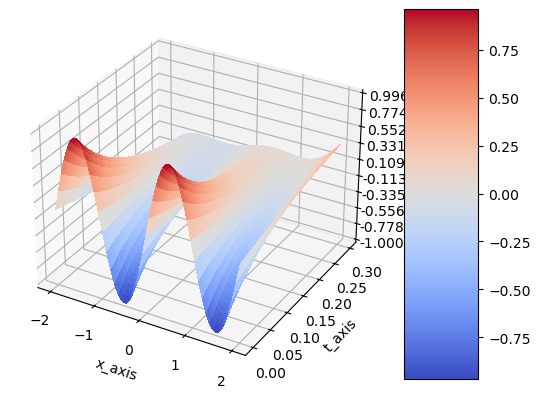

In [49]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.3, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.4]$
- training with iteration 20000

In [50]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.4, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0005)
1 Training Loss: tensor(0.0004)
2 Training Loss: tensor(0.0006)
3 Training Loss: tensor(0.0003)
4 Training Loss: tensor(0.0005)
5 Training Loss: tensor(0.0004)
6 Training Loss: tensor(0.0004)
7 Training Loss: tensor(0.0004)
8 Training Loss: tensor(0.0004)
9 Training Loss: tensor(0.0006)
10 Training Loss: tensor(0.0006)
11 Training Loss: tensor(0.0004)
12 Training Loss: tensor(0.0005)
13 Training Loss: tensor(0.0004)
14 Training Loss: tensor(0.0005)
15 Training Loss: tensor(0.0005)
16 Training Loss: tensor(0.0004)
17 Training Loss: tensor(0.0003)
18 Training Loss: tensor(0.0003)
19 Training Loss: tensor(0.0004)
20 Training Loss: tensor(0.0005)
21 Training Loss: tensor(0.0006)
22 Training Loss: tensor(0.0004)
23 Training Loss: tensor(0.0003)
24 Training Loss: tensor(0.0004)
25 Training Loss: tensor(0.0003)
26 Training Loss: tensor(0.0005)
27 Training Loss: tensor(0.0004)
28 Training Loss: tensor(0.0006)
29 Training Loss: tensor(0.0002)
30 Training Loss: te

250 Training Loss: tensor(0.0005)
251 Training Loss: tensor(0.0002)
252 Training Loss: tensor(0.0003)
253 Training Loss: tensor(0.0005)
254 Training Loss: tensor(0.0005)
255 Training Loss: tensor(0.0009)
256 Training Loss: tensor(0.0014)
257 Training Loss: tensor(0.0020)
258 Training Loss: tensor(0.0021)
259 Training Loss: tensor(0.0015)
260 Training Loss: tensor(0.0008)
261 Training Loss: tensor(0.0005)
262 Training Loss: tensor(0.0003)
263 Training Loss: tensor(0.0006)
264 Training Loss: tensor(0.0008)
265 Training Loss: tensor(0.0009)
266 Training Loss: tensor(0.0009)
267 Training Loss: tensor(0.0006)
268 Training Loss: tensor(0.0006)
269 Training Loss: tensor(0.0005)
270 Training Loss: tensor(0.0008)
271 Training Loss: tensor(0.0009)
272 Training Loss: tensor(0.0008)
273 Training Loss: tensor(0.0009)
274 Training Loss: tensor(0.0007)
275 Training Loss: tensor(0.0006)
276 Training Loss: tensor(0.0005)
277 Training Loss: tensor(0.0004)
278 Training Loss: tensor(0.0005)
279 Training L

495 Training Loss: tensor(0.0002)
496 Training Loss: tensor(0.0003)
497 Training Loss: tensor(0.0002)
498 Training Loss: tensor(0.0002)
499 Training Loss: tensor(0.0003)
500 Training Loss: tensor(0.0002)
501 Training Loss: tensor(0.0003)
502 Training Loss: tensor(0.0001)
503 Training Loss: tensor(0.0003)
504 Training Loss: tensor(0.0002)
505 Training Loss: tensor(0.0003)
506 Training Loss: tensor(0.0003)
507 Training Loss: tensor(0.0002)
508 Training Loss: tensor(0.0003)
509 Training Loss: tensor(0.0002)
510 Training Loss: tensor(0.0002)
511 Training Loss: tensor(0.0002)
512 Training Loss: tensor(0.0002)
513 Training Loss: tensor(0.0002)
514 Training Loss: tensor(0.0002)
515 Training Loss: tensor(0.0002)
516 Training Loss: tensor(0.0002)
517 Training Loss: tensor(0.0002)
518 Training Loss: tensor(0.0002)
519 Training Loss: tensor(0.0002)
520 Training Loss: tensor(0.0002)
521 Training Loss: tensor(0.0002)
522 Training Loss: tensor(0.0001)
523 Training Loss: tensor(0.0002)
524 Training L

742 Training Loss: tensor(0.0008)
743 Training Loss: tensor(0.0006)
744 Training Loss: tensor(0.0003)
745 Training Loss: tensor(0.0001)
746 Training Loss: tensor(0.0001)
747 Training Loss: tensor(0.0003)
748 Training Loss: tensor(0.0005)
749 Training Loss: tensor(0.0007)
750 Training Loss: tensor(0.0010)
751 Training Loss: tensor(0.0011)
752 Training Loss: tensor(0.0014)
753 Training Loss: tensor(0.0011)
754 Training Loss: tensor(0.0009)
755 Training Loss: tensor(0.0008)
756 Training Loss: tensor(0.0006)
757 Training Loss: tensor(0.0004)
758 Training Loss: tensor(0.0003)
759 Training Loss: tensor(0.0001)
760 Training Loss: tensor(0.0002)
761 Training Loss: tensor(0.0003)
762 Training Loss: tensor(0.0006)
763 Training Loss: tensor(0.0006)
764 Training Loss: tensor(0.0007)
765 Training Loss: tensor(0.0005)
766 Training Loss: tensor(0.0003)
767 Training Loss: tensor(0.0001)
768 Training Loss: tensor(0.0002)
769 Training Loss: tensor(0.0004)
770 Training Loss: tensor(0.0004)
771 Training L

984 Training Loss: tensor(0.0002)
985 Training Loss: tensor(0.0003)
986 Training Loss: tensor(0.0005)
987 Training Loss: tensor(0.0012)
988 Training Loss: tensor(0.0019)
989 Training Loss: tensor(0.0023)
990 Training Loss: tensor(0.0020)
991 Training Loss: tensor(0.0015)
992 Training Loss: tensor(0.0008)
993 Training Loss: tensor(0.0004)
994 Training Loss: tensor(0.0002)
995 Training Loss: tensor(0.0005)
996 Training Loss: tensor(0.0008)
997 Training Loss: tensor(0.0011)
998 Training Loss: tensor(0.0012)
999 Training Loss: tensor(0.0010)
1000 Training Loss: tensor(0.0008)
1001 Training Loss: tensor(0.0006)
1002 Training Loss: tensor(0.0006)
1003 Training Loss: tensor(0.0003)
1004 Training Loss: tensor(0.0005)
1005 Training Loss: tensor(0.0002)
1006 Training Loss: tensor(0.0005)
1007 Training Loss: tensor(0.0004)
1008 Training Loss: tensor(0.0005)
1009 Training Loss: tensor(0.0004)
1010 Training Loss: tensor(0.0002)
1011 Training Loss: tensor(0.0006)
1012 Training Loss: tensor(0.0003)
1

1223 Training Loss: tensor(0.0003)
1224 Training Loss: tensor(0.0003)
1225 Training Loss: tensor(0.0002)
1226 Training Loss: tensor(0.0003)
1227 Training Loss: tensor(0.0002)
1228 Training Loss: tensor(0.0003)
1229 Training Loss: tensor(0.0002)
1230 Training Loss: tensor(0.0002)
1231 Training Loss: tensor(0.0003)
1232 Training Loss: tensor(0.0002)
1233 Training Loss: tensor(0.0003)
1234 Training Loss: tensor(0.0002)
1235 Training Loss: tensor(0.0003)
1236 Training Loss: tensor(0.0003)
1237 Training Loss: tensor(0.0003)
1238 Training Loss: tensor(0.0002)
1239 Training Loss: tensor(0.0002)
1240 Training Loss: tensor(0.0002)
1241 Training Loss: tensor(0.0003)
1242 Training Loss: tensor(0.0003)
1243 Training Loss: tensor(0.0004)
1244 Training Loss: tensor(0.0004)
1245 Training Loss: tensor(0.0005)
1246 Training Loss: tensor(0.0005)
1247 Training Loss: tensor(0.0004)
1248 Training Loss: tensor(0.0003)
1249 Training Loss: tensor(0.0002)
1250 Training Loss: tensor(0.0002)
1251 Training Loss: 

1462 Training Loss: tensor(0.0009)
1463 Training Loss: tensor(0.0007)
1464 Training Loss: tensor(0.0011)
1465 Training Loss: tensor(0.0018)
1466 Training Loss: tensor(0.0016)
1467 Training Loss: tensor(0.0020)
1468 Training Loss: tensor(0.0008)
1469 Training Loss: tensor(0.0008)
1470 Training Loss: tensor(0.0005)
1471 Training Loss: tensor(0.0006)
1472 Training Loss: tensor(0.0003)
1473 Training Loss: tensor(0.0005)
1474 Training Loss: tensor(0.0004)
1475 Training Loss: tensor(0.0003)
1476 Training Loss: tensor(0.0004)
1477 Training Loss: tensor(0.0003)
1478 Training Loss: tensor(0.0003)
1479 Training Loss: tensor(0.0002)
1480 Training Loss: tensor(0.0003)
1481 Training Loss: tensor(0.0004)
1482 Training Loss: tensor(0.0003)
1483 Training Loss: tensor(0.0003)
1484 Training Loss: tensor(0.0002)
1485 Training Loss: tensor(0.0002)
1486 Training Loss: tensor(0.0002)
1487 Training Loss: tensor(0.0002)
1488 Training Loss: tensor(0.0003)
1489 Training Loss: tensor(0.0005)
1490 Training Loss: 

1700 Training Loss: tensor(0.0002)
1701 Training Loss: tensor(0.0002)
1702 Training Loss: tensor(0.0001)
1703 Training Loss: tensor(0.0001)
1704 Training Loss: tensor(0.0002)
1705 Training Loss: tensor(0.0001)
1706 Training Loss: tensor(0.0002)
1707 Training Loss: tensor(0.0001)
1708 Training Loss: tensor(0.0001)
1709 Training Loss: tensor(0.0001)
1710 Training Loss: tensor(0.0002)
1711 Training Loss: tensor(0.0001)
1712 Training Loss: tensor(0.0002)
1713 Training Loss: tensor(0.0001)
1714 Training Loss: tensor(0.0002)
1715 Training Loss: tensor(0.0002)
1716 Training Loss: tensor(0.0002)
1717 Training Loss: tensor(0.0002)
1718 Training Loss: tensor(0.0002)
1719 Training Loss: tensor(0.0002)
1720 Training Loss: tensor(0.0002)
1721 Training Loss: tensor(0.0002)
1722 Training Loss: tensor(0.0001)
1723 Training Loss: tensor(0.0001)
1724 Training Loss: tensor(0.0001)
1725 Training Loss: tensor(0.0002)
1726 Training Loss: tensor(0.0001)
1727 Training Loss: tensor(0.0003)
1728 Training Loss: 

1940 Training Loss: tensor(0.0019)
1941 Training Loss: tensor(0.0017)
1942 Training Loss: tensor(0.0017)
1943 Training Loss: tensor(0.0016)
1944 Training Loss: tensor(0.0003)
1945 Training Loss: tensor(0.0011)
1946 Training Loss: tensor(0.0010)
1947 Training Loss: tensor(0.0020)
1948 Training Loss: tensor(0.0027)
1949 Training Loss: tensor(0.0035)
1950 Training Loss: tensor(0.0040)
1951 Training Loss: tensor(0.0032)
1952 Training Loss: tensor(0.0019)
1953 Training Loss: tensor(0.0012)
1954 Training Loss: tensor(0.0007)
1955 Training Loss: tensor(0.0021)
1956 Training Loss: tensor(0.0030)
1957 Training Loss: tensor(0.0031)
1958 Training Loss: tensor(0.0017)
1959 Training Loss: tensor(0.0009)
1960 Training Loss: tensor(0.0013)
1961 Training Loss: tensor(0.0028)
1962 Training Loss: tensor(0.0029)
1963 Training Loss: tensor(0.0016)
1964 Training Loss: tensor(0.0010)
1965 Training Loss: tensor(0.0006)
1966 Training Loss: tensor(0.0010)
1967 Training Loss: tensor(0.0009)
1968 Training Loss: 

2176 Training Loss: tensor(0.0011)
2177 Training Loss: tensor(0.0008)
2178 Training Loss: tensor(0.0004)
2179 Training Loss: tensor(0.0001)
2180 Training Loss: tensor(0.0003)
2181 Training Loss: tensor(0.0005)
2182 Training Loss: tensor(0.0007)
2183 Training Loss: tensor(0.0012)
2184 Training Loss: tensor(0.0014)
2185 Training Loss: tensor(0.0014)
2186 Training Loss: tensor(0.0014)
2187 Training Loss: tensor(0.0008)
2188 Training Loss: tensor(0.0005)
2189 Training Loss: tensor(0.0003)
2190 Training Loss: tensor(0.0002)
2191 Training Loss: tensor(0.0002)
2192 Training Loss: tensor(0.0004)
2193 Training Loss: tensor(0.0006)
2194 Training Loss: tensor(0.0006)
2195 Training Loss: tensor(0.0006)
2196 Training Loss: tensor(0.0003)
2197 Training Loss: tensor(0.0002)
2198 Training Loss: tensor(0.0002)
2199 Training Loss: tensor(0.0002)
2200 Training Loss: tensor(0.0003)
2201 Training Loss: tensor(0.0004)
2202 Training Loss: tensor(0.0005)
2203 Training Loss: tensor(0.0006)
2204 Training Loss: 

2411 Training Loss: tensor(0.0007)
2412 Training Loss: tensor(0.0007)
2413 Training Loss: tensor(0.0006)
2414 Training Loss: tensor(0.0005)
2415 Training Loss: tensor(0.0004)
2416 Training Loss: tensor(0.0008)
2417 Training Loss: tensor(0.0007)
2418 Training Loss: tensor(0.0005)
2419 Training Loss: tensor(0.0006)
2420 Training Loss: tensor(0.0005)
2421 Training Loss: tensor(0.0016)
2422 Training Loss: tensor(0.0009)
2423 Training Loss: tensor(0.0014)
2424 Training Loss: tensor(0.0017)
2425 Training Loss: tensor(0.0007)
2426 Training Loss: tensor(0.0015)
2427 Training Loss: tensor(0.0008)
2428 Training Loss: tensor(0.0011)
2429 Training Loss: tensor(0.0008)
2430 Training Loss: tensor(0.0008)
2431 Training Loss: tensor(0.0007)
2432 Training Loss: tensor(0.0010)
2433 Training Loss: tensor(0.0007)
2434 Training Loss: tensor(0.0004)
2435 Training Loss: tensor(0.0006)
2436 Training Loss: tensor(0.0005)
2437 Training Loss: tensor(0.0009)
2438 Training Loss: tensor(0.0005)
2439 Training Loss: 

2650 Training Loss: tensor(0.0002)
2651 Training Loss: tensor(0.0002)
2652 Training Loss: tensor(0.0002)
2653 Training Loss: tensor(0.0002)
2654 Training Loss: tensor(0.0001)
2655 Training Loss: tensor(0.0002)
2656 Training Loss: tensor(8.1043e-05)
2657 Training Loss: tensor(0.0002)
2658 Training Loss: tensor(0.0001)
2659 Training Loss: tensor(0.0001)
2660 Training Loss: tensor(0.0002)
2661 Training Loss: tensor(0.0001)
2662 Training Loss: tensor(0.0002)
2663 Training Loss: tensor(0.0001)
2664 Training Loss: tensor(0.0001)
2665 Training Loss: tensor(0.0002)
2666 Training Loss: tensor(0.0001)
2667 Training Loss: tensor(0.0002)
2668 Training Loss: tensor(0.0002)
2669 Training Loss: tensor(0.0001)
2670 Training Loss: tensor(0.0002)
2671 Training Loss: tensor(0.0001)
2672 Training Loss: tensor(0.0001)
2673 Training Loss: tensor(0.0001)
2674 Training Loss: tensor(0.0001)
2675 Training Loss: tensor(0.0001)
2676 Training Loss: tensor(8.2848e-05)
2677 Training Loss: tensor(0.0001)
2678 Trainin

2888 Training Loss: tensor(0.0005)
2889 Training Loss: tensor(0.0006)
2890 Training Loss: tensor(0.0006)
2891 Training Loss: tensor(0.0007)
2892 Training Loss: tensor(0.0005)
2893 Training Loss: tensor(0.0004)
2894 Training Loss: tensor(0.0004)
2895 Training Loss: tensor(0.0002)
2896 Training Loss: tensor(0.0003)
2897 Training Loss: tensor(0.0003)
2898 Training Loss: tensor(0.0005)
2899 Training Loss: tensor(0.0009)
2900 Training Loss: tensor(0.0012)
2901 Training Loss: tensor(0.0015)
2902 Training Loss: tensor(0.0019)
2903 Training Loss: tensor(0.0018)
2904 Training Loss: tensor(0.0016)
2905 Training Loss: tensor(0.0013)
2906 Training Loss: tensor(0.0007)
2907 Training Loss: tensor(0.0005)
2908 Training Loss: tensor(0.0007)
2909 Training Loss: tensor(0.0004)
2910 Training Loss: tensor(0.0007)
2911 Training Loss: tensor(0.0008)
2912 Training Loss: tensor(0.0010)
2913 Training Loss: tensor(0.0011)
2914 Training Loss: tensor(0.0011)
2915 Training Loss: tensor(0.0008)
2916 Training Loss: 

3126 Training Loss: tensor(0.0004)
3127 Training Loss: tensor(0.0005)
3128 Training Loss: tensor(0.0007)
3129 Training Loss: tensor(0.0005)
3130 Training Loss: tensor(0.0009)
3131 Training Loss: tensor(0.0008)
3132 Training Loss: tensor(0.0006)
3133 Training Loss: tensor(0.0006)
3134 Training Loss: tensor(0.0006)
3135 Training Loss: tensor(0.0003)
3136 Training Loss: tensor(0.0008)
3137 Training Loss: tensor(0.0003)
3138 Training Loss: tensor(0.0008)
3139 Training Loss: tensor(0.0003)
3140 Training Loss: tensor(0.0005)
3141 Training Loss: tensor(0.0008)
3142 Training Loss: tensor(0.0011)
3143 Training Loss: tensor(0.0014)
3144 Training Loss: tensor(0.0013)
3145 Training Loss: tensor(0.0013)
3146 Training Loss: tensor(0.0008)
3147 Training Loss: tensor(0.0011)
3148 Training Loss: tensor(0.0012)
3149 Training Loss: tensor(0.0010)
3150 Training Loss: tensor(0.0008)
3151 Training Loss: tensor(0.0007)
3152 Training Loss: tensor(0.0002)
3153 Training Loss: tensor(0.0005)
3154 Training Loss: 

3364 Training Loss: tensor(0.0002)
3365 Training Loss: tensor(0.0003)
3366 Training Loss: tensor(0.0002)
3367 Training Loss: tensor(0.0002)
3368 Training Loss: tensor(0.0003)
3369 Training Loss: tensor(0.0002)
3370 Training Loss: tensor(0.0003)
3371 Training Loss: tensor(0.0001)
3372 Training Loss: tensor(0.0001)
3373 Training Loss: tensor(0.0002)
3374 Training Loss: tensor(0.0002)
3375 Training Loss: tensor(0.0002)
3376 Training Loss: tensor(8.3612e-05)
3377 Training Loss: tensor(0.0002)
3378 Training Loss: tensor(0.0003)
3379 Training Loss: tensor(0.0003)
3380 Training Loss: tensor(0.0003)
3381 Training Loss: tensor(0.0001)
3382 Training Loss: tensor(0.0001)
3383 Training Loss: tensor(0.0001)
3384 Training Loss: tensor(0.0002)
3385 Training Loss: tensor(0.0002)
3386 Training Loss: tensor(0.0002)
3387 Training Loss: tensor(0.0001)
3388 Training Loss: tensor(9.8952e-05)
3389 Training Loss: tensor(0.0001)
3390 Training Loss: tensor(0.0002)
3391 Training Loss: tensor(9.1594e-05)
3392 Tra

3601 Training Loss: tensor(0.0002)
3602 Training Loss: tensor(9.6171e-05)
3603 Training Loss: tensor(0.0002)
3604 Training Loss: tensor(9.9456e-05)
3605 Training Loss: tensor(0.0001)
3606 Training Loss: tensor(0.0002)
3607 Training Loss: tensor(0.0001)
3608 Training Loss: tensor(0.0002)
3609 Training Loss: tensor(0.0004)
3610 Training Loss: tensor(0.0004)
3611 Training Loss: tensor(0.0006)
3612 Training Loss: tensor(0.0009)
3613 Training Loss: tensor(0.0010)
3614 Training Loss: tensor(0.0013)
3615 Training Loss: tensor(0.0013)
3616 Training Loss: tensor(0.0011)
3617 Training Loss: tensor(0.0009)
3618 Training Loss: tensor(0.0004)
3619 Training Loss: tensor(0.0003)
3620 Training Loss: tensor(0.0002)
3621 Training Loss: tensor(0.0002)
3622 Training Loss: tensor(0.0003)
3623 Training Loss: tensor(0.0004)
3624 Training Loss: tensor(0.0006)
3625 Training Loss: tensor(0.0008)
3626 Training Loss: tensor(0.0011)
3627 Training Loss: tensor(0.0014)
3628 Training Loss: tensor(0.0014)
3629 Trainin

3839 Training Loss: tensor(0.0003)
3840 Training Loss: tensor(0.0006)
3841 Training Loss: tensor(0.0010)
3842 Training Loss: tensor(0.0015)
3843 Training Loss: tensor(0.0018)
3844 Training Loss: tensor(0.0014)
3845 Training Loss: tensor(0.0006)
3846 Training Loss: tensor(0.0004)
3847 Training Loss: tensor(0.0003)
3848 Training Loss: tensor(0.0004)
3849 Training Loss: tensor(0.0008)
3850 Training Loss: tensor(0.0010)
3851 Training Loss: tensor(0.0011)
3852 Training Loss: tensor(0.0009)
3853 Training Loss: tensor(0.0005)
3854 Training Loss: tensor(0.0002)
3855 Training Loss: tensor(0.0006)
3856 Training Loss: tensor(0.0010)
3857 Training Loss: tensor(0.0008)
3858 Training Loss: tensor(0.0008)
3859 Training Loss: tensor(0.0006)
3860 Training Loss: tensor(0.0002)
3861 Training Loss: tensor(0.0006)
3862 Training Loss: tensor(0.0009)
3863 Training Loss: tensor(0.0013)
3864 Training Loss: tensor(0.0018)
3865 Training Loss: tensor(0.0015)
3866 Training Loss: tensor(0.0012)
3867 Training Loss: 

4076 Training Loss: tensor(0.0006)
4077 Training Loss: tensor(0.0007)
4078 Training Loss: tensor(0.0009)
4079 Training Loss: tensor(0.0009)
4080 Training Loss: tensor(0.0006)
4081 Training Loss: tensor(0.0005)
4082 Training Loss: tensor(0.0003)
4083 Training Loss: tensor(0.0002)
4084 Training Loss: tensor(0.0004)
4085 Training Loss: tensor(0.0004)
4086 Training Loss: tensor(0.0007)
4087 Training Loss: tensor(0.0006)
4088 Training Loss: tensor(0.0004)
4089 Training Loss: tensor(0.0003)
4090 Training Loss: tensor(0.0003)
4091 Training Loss: tensor(0.0003)
4092 Training Loss: tensor(0.0004)
4093 Training Loss: tensor(0.0004)
4094 Training Loss: tensor(0.0003)
4095 Training Loss: tensor(0.0004)
4096 Training Loss: tensor(0.0002)
4097 Training Loss: tensor(0.0003)
4098 Training Loss: tensor(0.0003)
4099 Training Loss: tensor(0.0002)
4100 Training Loss: tensor(0.0004)
4101 Training Loss: tensor(0.0004)
4102 Training Loss: tensor(0.0002)
4103 Training Loss: tensor(0.0003)
4104 Training Loss: 

4312 Training Loss: tensor(0.0002)
4313 Training Loss: tensor(0.0002)
4314 Training Loss: tensor(8.6818e-05)
4315 Training Loss: tensor(0.0003)
4316 Training Loss: tensor(0.0002)
4317 Training Loss: tensor(0.0002)
4318 Training Loss: tensor(0.0002)
4319 Training Loss: tensor(0.0001)
4320 Training Loss: tensor(0.0002)
4321 Training Loss: tensor(0.0001)
4322 Training Loss: tensor(0.0001)
4323 Training Loss: tensor(0.0002)
4324 Training Loss: tensor(0.0001)
4325 Training Loss: tensor(0.0001)
4326 Training Loss: tensor(0.0002)
4327 Training Loss: tensor(0.0002)
4328 Training Loss: tensor(0.0003)
4329 Training Loss: tensor(0.0004)
4330 Training Loss: tensor(0.0006)
4331 Training Loss: tensor(0.0008)
4332 Training Loss: tensor(0.0013)
4333 Training Loss: tensor(0.0014)
4334 Training Loss: tensor(0.0012)
4335 Training Loss: tensor(0.0008)
4336 Training Loss: tensor(0.0007)
4337 Training Loss: tensor(0.0006)
4338 Training Loss: tensor(0.0009)
4339 Training Loss: tensor(0.0006)
4340 Training Lo

4549 Training Loss: tensor(0.0002)
4550 Training Loss: tensor(0.0002)
4551 Training Loss: tensor(0.0002)
4552 Training Loss: tensor(0.0003)
4553 Training Loss: tensor(0.0003)
4554 Training Loss: tensor(0.0003)
4555 Training Loss: tensor(0.0004)
4556 Training Loss: tensor(0.0003)
4557 Training Loss: tensor(0.0002)
4558 Training Loss: tensor(0.0002)
4559 Training Loss: tensor(0.0001)
4560 Training Loss: tensor(0.0004)
4561 Training Loss: tensor(0.0003)
4562 Training Loss: tensor(0.0004)
4563 Training Loss: tensor(0.0006)
4564 Training Loss: tensor(0.0006)
4565 Training Loss: tensor(0.0008)
4566 Training Loss: tensor(0.0008)
4567 Training Loss: tensor(0.0009)
4568 Training Loss: tensor(0.0008)
4569 Training Loss: tensor(0.0007)
4570 Training Loss: tensor(0.0005)
4571 Training Loss: tensor(0.0003)
4572 Training Loss: tensor(0.0003)
4573 Training Loss: tensor(0.0002)
4574 Training Loss: tensor(0.0002)
4575 Training Loss: tensor(0.0002)
4576 Training Loss: tensor(0.0003)
4577 Training Loss: 

4784 Training Loss: tensor(0.0001)
4785 Training Loss: tensor(0.0005)
4786 Training Loss: tensor(0.0010)
4787 Training Loss: tensor(0.0011)
4788 Training Loss: tensor(0.0019)
4789 Training Loss: tensor(0.0025)
4790 Training Loss: tensor(0.0024)
4791 Training Loss: tensor(0.0015)
4792 Training Loss: tensor(0.0004)
4793 Training Loss: tensor(0.0004)
4794 Training Loss: tensor(0.0008)
4795 Training Loss: tensor(0.0013)
4796 Training Loss: tensor(0.0011)
4797 Training Loss: tensor(0.0007)
4798 Training Loss: tensor(0.0003)
4799 Training Loss: tensor(0.0003)
4800 Training Loss: tensor(0.0004)
4801 Training Loss: tensor(0.0009)
4802 Training Loss: tensor(0.0007)
4803 Training Loss: tensor(0.0006)
4804 Training Loss: tensor(0.0004)
4805 Training Loss: tensor(0.0002)
4806 Training Loss: tensor(0.0009)
4807 Training Loss: tensor(0.0016)
4808 Training Loss: tensor(0.0022)
4809 Training Loss: tensor(0.0016)
4810 Training Loss: tensor(0.0013)
4811 Training Loss: tensor(0.0005)
4812 Training Loss: 

5021 Training Loss: tensor(0.0004)
5022 Training Loss: tensor(0.0003)
5023 Training Loss: tensor(0.0001)
5024 Training Loss: tensor(0.0001)
5025 Training Loss: tensor(0.0002)
5026 Training Loss: tensor(0.0004)
5027 Training Loss: tensor(0.0005)
5028 Training Loss: tensor(0.0005)
5029 Training Loss: tensor(0.0003)
5030 Training Loss: tensor(0.0002)
5031 Training Loss: tensor(0.0001)
5032 Training Loss: tensor(0.0002)
5033 Training Loss: tensor(0.0004)
5034 Training Loss: tensor(0.0005)
5035 Training Loss: tensor(0.0005)
5036 Training Loss: tensor(0.0006)
5037 Training Loss: tensor(0.0004)
5038 Training Loss: tensor(0.0005)
5039 Training Loss: tensor(0.0003)
5040 Training Loss: tensor(0.0003)
5041 Training Loss: tensor(0.0002)
5042 Training Loss: tensor(0.0002)
5043 Training Loss: tensor(0.0003)
5044 Training Loss: tensor(0.0003)
5045 Training Loss: tensor(0.0004)
5046 Training Loss: tensor(0.0004)
5047 Training Loss: tensor(0.0004)
5048 Training Loss: tensor(0.0003)
5049 Training Loss: 

5256 Training Loss: tensor(7.0450e-05)
5257 Training Loss: tensor(0.0002)
5258 Training Loss: tensor(0.0002)
5259 Training Loss: tensor(0.0003)
5260 Training Loss: tensor(0.0005)
5261 Training Loss: tensor(0.0005)
5262 Training Loss: tensor(0.0005)
5263 Training Loss: tensor(0.0007)
5264 Training Loss: tensor(0.0008)
5265 Training Loss: tensor(0.0009)
5266 Training Loss: tensor(0.0012)
5267 Training Loss: tensor(0.0012)
5268 Training Loss: tensor(0.0013)
5269 Training Loss: tensor(0.0014)
5270 Training Loss: tensor(0.0015)
5271 Training Loss: tensor(0.0017)
5272 Training Loss: tensor(0.0021)
5273 Training Loss: tensor(0.0021)
5274 Training Loss: tensor(0.0022)
5275 Training Loss: tensor(0.0024)
5276 Training Loss: tensor(0.0015)
5277 Training Loss: tensor(0.0016)
5278 Training Loss: tensor(0.0012)
5279 Training Loss: tensor(0.0003)
5280 Training Loss: tensor(0.0005)
5281 Training Loss: tensor(0.0008)
5282 Training Loss: tensor(0.0010)
5283 Training Loss: tensor(0.0017)
5284 Training Lo

5493 Training Loss: tensor(0.0003)
5494 Training Loss: tensor(0.0003)
5495 Training Loss: tensor(0.0004)
5496 Training Loss: tensor(0.0003)
5497 Training Loss: tensor(0.0006)
5498 Training Loss: tensor(0.0006)
5499 Training Loss: tensor(0.0006)
5500 Training Loss: tensor(0.0007)
5501 Training Loss: tensor(0.0002)
5502 Training Loss: tensor(0.0004)
5503 Training Loss: tensor(0.0003)
5504 Training Loss: tensor(0.0006)
5505 Training Loss: tensor(0.0006)
5506 Training Loss: tensor(0.0005)
5507 Training Loss: tensor(0.0002)
5508 Training Loss: tensor(0.0003)
5509 Training Loss: tensor(0.0004)
5510 Training Loss: tensor(0.0001)
5511 Training Loss: tensor(0.0003)
5512 Training Loss: tensor(0.0002)
5513 Training Loss: tensor(0.0002)
5514 Training Loss: tensor(0.0003)
5515 Training Loss: tensor(0.0002)
5516 Training Loss: tensor(0.0002)
5517 Training Loss: tensor(0.0002)
5518 Training Loss: tensor(0.0002)
5519 Training Loss: tensor(0.0002)
5520 Training Loss: tensor(0.0002)
5521 Training Loss: 

5731 Training Loss: tensor(0.0003)
5732 Training Loss: tensor(0.0003)
5733 Training Loss: tensor(0.0002)
5734 Training Loss: tensor(0.0004)
5735 Training Loss: tensor(0.0005)
5736 Training Loss: tensor(0.0002)
5737 Training Loss: tensor(0.0003)
5738 Training Loss: tensor(0.0003)
5739 Training Loss: tensor(0.0003)
5740 Training Loss: tensor(0.0003)
5741 Training Loss: tensor(0.0003)
5742 Training Loss: tensor(0.0002)
5743 Training Loss: tensor(0.0002)
5744 Training Loss: tensor(0.0002)
5745 Training Loss: tensor(0.0003)
5746 Training Loss: tensor(0.0003)
5747 Training Loss: tensor(0.0003)
5748 Training Loss: tensor(0.0004)
5749 Training Loss: tensor(0.0005)
5750 Training Loss: tensor(0.0005)
5751 Training Loss: tensor(0.0005)
5752 Training Loss: tensor(0.0003)
5753 Training Loss: tensor(0.0002)
5754 Training Loss: tensor(0.0001)
5755 Training Loss: tensor(0.0002)
5756 Training Loss: tensor(0.0003)
5757 Training Loss: tensor(0.0002)
5758 Training Loss: tensor(0.0004)
5759 Training Loss: 

5965 Training Loss: tensor(0.0002)
5966 Training Loss: tensor(0.0003)
5967 Training Loss: tensor(0.0002)
5968 Training Loss: tensor(0.0002)
5969 Training Loss: tensor(0.0003)
5970 Training Loss: tensor(0.0003)
5971 Training Loss: tensor(0.0006)
5972 Training Loss: tensor(0.0005)
5973 Training Loss: tensor(0.0004)
5974 Training Loss: tensor(0.0004)
5975 Training Loss: tensor(0.0003)
5976 Training Loss: tensor(0.0007)
5977 Training Loss: tensor(0.0005)
5978 Training Loss: tensor(0.0004)
5979 Training Loss: tensor(0.0002)
5980 Training Loss: tensor(0.0002)
5981 Training Loss: tensor(0.0003)
5982 Training Loss: tensor(0.0005)
5983 Training Loss: tensor(0.0006)
5984 Training Loss: tensor(0.0006)
5985 Training Loss: tensor(0.0004)
5986 Training Loss: tensor(0.0002)
5987 Training Loss: tensor(0.0005)
5988 Training Loss: tensor(0.0005)
5989 Training Loss: tensor(0.0002)
5990 Training Loss: tensor(0.0008)
5991 Training Loss: tensor(0.0003)
5992 Training Loss: tensor(0.0004)
5993 Training Loss: 

6204 Training Loss: tensor(0.0012)
6205 Training Loss: tensor(0.0017)
6206 Training Loss: tensor(0.0016)
6207 Training Loss: tensor(0.0017)
6208 Training Loss: tensor(0.0015)
6209 Training Loss: tensor(0.0007)
6210 Training Loss: tensor(0.0005)
6211 Training Loss: tensor(0.0004)
6212 Training Loss: tensor(0.0007)
6213 Training Loss: tensor(0.0013)
6214 Training Loss: tensor(0.0018)
6215 Training Loss: tensor(0.0017)
6216 Training Loss: tensor(0.0016)
6217 Training Loss: tensor(0.0010)
6218 Training Loss: tensor(0.0004)
6219 Training Loss: tensor(0.0003)
6220 Training Loss: tensor(0.0004)
6221 Training Loss: tensor(0.0008)
6222 Training Loss: tensor(0.0009)
6223 Training Loss: tensor(0.0005)
6224 Training Loss: tensor(0.0002)
6225 Training Loss: tensor(0.0003)
6226 Training Loss: tensor(0.0004)
6227 Training Loss: tensor(0.0007)
6228 Training Loss: tensor(0.0012)
6229 Training Loss: tensor(0.0008)
6230 Training Loss: tensor(0.0007)
6231 Training Loss: tensor(0.0003)
6232 Training Loss: 

6438 Training Loss: tensor(0.0001)
6439 Training Loss: tensor(0.0002)
6440 Training Loss: tensor(0.0002)
6441 Training Loss: tensor(0.0002)
6442 Training Loss: tensor(0.0002)
6443 Training Loss: tensor(0.0001)
6444 Training Loss: tensor(0.0001)
6445 Training Loss: tensor(0.0002)
6446 Training Loss: tensor(0.0002)
6447 Training Loss: tensor(0.0003)
6448 Training Loss: tensor(0.0006)
6449 Training Loss: tensor(0.0007)
6450 Training Loss: tensor(0.0011)
6451 Training Loss: tensor(0.0011)
6452 Training Loss: tensor(0.0011)
6453 Training Loss: tensor(0.0012)
6454 Training Loss: tensor(0.0010)
6455 Training Loss: tensor(0.0007)
6456 Training Loss: tensor(0.0007)
6457 Training Loss: tensor(0.0004)
6458 Training Loss: tensor(0.0003)
6459 Training Loss: tensor(0.0006)
6460 Training Loss: tensor(0.0005)
6461 Training Loss: tensor(0.0008)
6462 Training Loss: tensor(0.0013)
6463 Training Loss: tensor(0.0010)
6464 Training Loss: tensor(0.0010)
6465 Training Loss: tensor(0.0010)
6466 Training Loss: 

6676 Training Loss: tensor(0.0002)
6677 Training Loss: tensor(0.0002)
6678 Training Loss: tensor(0.0001)
6679 Training Loss: tensor(0.0003)
6680 Training Loss: tensor(0.0001)
6681 Training Loss: tensor(0.0002)
6682 Training Loss: tensor(0.0001)
6683 Training Loss: tensor(0.0002)
6684 Training Loss: tensor(0.0001)
6685 Training Loss: tensor(0.0002)
6686 Training Loss: tensor(0.0003)
6687 Training Loss: tensor(9.2695e-05)
6688 Training Loss: tensor(0.0002)
6689 Training Loss: tensor(7.5310e-05)
6690 Training Loss: tensor(0.0002)
6691 Training Loss: tensor(0.0001)
6692 Training Loss: tensor(0.0002)
6693 Training Loss: tensor(0.0003)
6694 Training Loss: tensor(0.0002)
6695 Training Loss: tensor(0.0006)
6696 Training Loss: tensor(0.0002)
6697 Training Loss: tensor(0.0006)
6698 Training Loss: tensor(0.0003)
6699 Training Loss: tensor(0.0004)
6700 Training Loss: tensor(0.0004)
6701 Training Loss: tensor(0.0003)
6702 Training Loss: tensor(0.0004)
6703 Training Loss: tensor(0.0003)
6704 Trainin

6915 Training Loss: tensor(0.0006)
6916 Training Loss: tensor(0.0003)
6917 Training Loss: tensor(0.0002)
6918 Training Loss: tensor(0.0002)
6919 Training Loss: tensor(0.0004)
6920 Training Loss: tensor(0.0005)
6921 Training Loss: tensor(0.0007)
6922 Training Loss: tensor(0.0006)
6923 Training Loss: tensor(0.0005)
6924 Training Loss: tensor(0.0003)
6925 Training Loss: tensor(0.0002)
6926 Training Loss: tensor(0.0002)
6927 Training Loss: tensor(0.0003)
6928 Training Loss: tensor(0.0005)
6929 Training Loss: tensor(0.0009)
6930 Training Loss: tensor(0.0012)
6931 Training Loss: tensor(0.0017)
6932 Training Loss: tensor(0.0017)
6933 Training Loss: tensor(0.0020)
6934 Training Loss: tensor(0.0017)
6935 Training Loss: tensor(0.0012)
6936 Training Loss: tensor(0.0009)
6937 Training Loss: tensor(0.0003)
6938 Training Loss: tensor(0.0005)
6939 Training Loss: tensor(0.0006)
6940 Training Loss: tensor(0.0011)
6941 Training Loss: tensor(0.0016)
6942 Training Loss: tensor(0.0011)
6943 Training Loss: 

7150 Training Loss: tensor(0.0002)
7151 Training Loss: tensor(0.0005)
7152 Training Loss: tensor(0.0003)
7153 Training Loss: tensor(0.0005)
7154 Training Loss: tensor(0.0004)
7155 Training Loss: tensor(0.0002)
7156 Training Loss: tensor(0.0005)
7157 Training Loss: tensor(0.0004)
7158 Training Loss: tensor(0.0003)
7159 Training Loss: tensor(0.0004)
7160 Training Loss: tensor(0.0002)
7161 Training Loss: tensor(0.0005)
7162 Training Loss: tensor(0.0003)
7163 Training Loss: tensor(0.0002)
7164 Training Loss: tensor(0.0002)
7165 Training Loss: tensor(0.0003)
7166 Training Loss: tensor(0.0002)
7167 Training Loss: tensor(0.0003)
7168 Training Loss: tensor(0.0002)
7169 Training Loss: tensor(0.0003)
7170 Training Loss: tensor(0.0001)
7171 Training Loss: tensor(0.0002)
7172 Training Loss: tensor(0.0002)
7173 Training Loss: tensor(0.0002)
7174 Training Loss: tensor(0.0002)
7175 Training Loss: tensor(0.0001)
7176 Training Loss: tensor(0.0002)
7177 Training Loss: tensor(0.0001)
7178 Training Loss: 

7389 Training Loss: tensor(0.0003)
7390 Training Loss: tensor(0.0002)
7391 Training Loss: tensor(0.0002)
7392 Training Loss: tensor(0.0006)
7393 Training Loss: tensor(0.0004)
7394 Training Loss: tensor(0.0004)
7395 Training Loss: tensor(0.0002)
7396 Training Loss: tensor(0.0003)
7397 Training Loss: tensor(0.0002)
7398 Training Loss: tensor(0.0003)
7399 Training Loss: tensor(0.0004)
7400 Training Loss: tensor(0.0002)
7401 Training Loss: tensor(0.0003)
7402 Training Loss: tensor(0.0002)
7403 Training Loss: tensor(0.0002)
7404 Training Loss: tensor(0.0003)
7405 Training Loss: tensor(0.0003)
7406 Training Loss: tensor(0.0003)
7407 Training Loss: tensor(0.0003)
7408 Training Loss: tensor(0.0003)
7409 Training Loss: tensor(0.0003)
7410 Training Loss: tensor(0.0003)
7411 Training Loss: tensor(0.0002)
7412 Training Loss: tensor(0.0004)
7413 Training Loss: tensor(0.0003)
7414 Training Loss: tensor(0.0002)
7415 Training Loss: tensor(0.0002)
7416 Training Loss: tensor(0.0003)
7417 Training Loss: 

7624 Training Loss: tensor(0.0004)
7625 Training Loss: tensor(0.0003)
7626 Training Loss: tensor(0.0002)
7627 Training Loss: tensor(0.0003)
7628 Training Loss: tensor(0.0004)
7629 Training Loss: tensor(0.0004)
7630 Training Loss: tensor(0.0003)
7631 Training Loss: tensor(0.0003)
7632 Training Loss: tensor(0.0002)
7633 Training Loss: tensor(0.0002)
7634 Training Loss: tensor(0.0003)
7635 Training Loss: tensor(0.0003)
7636 Training Loss: tensor(0.0002)
7637 Training Loss: tensor(0.0002)
7638 Training Loss: tensor(0.0003)
7639 Training Loss: tensor(0.0004)
7640 Training Loss: tensor(0.0005)
7641 Training Loss: tensor(0.0006)
7642 Training Loss: tensor(0.0004)
7643 Training Loss: tensor(0.0002)
7644 Training Loss: tensor(0.0002)
7645 Training Loss: tensor(0.0002)
7646 Training Loss: tensor(0.0002)
7647 Training Loss: tensor(0.0003)
7648 Training Loss: tensor(0.0002)
7649 Training Loss: tensor(0.0003)
7650 Training Loss: tensor(0.0002)
7651 Training Loss: tensor(0.0002)
7652 Training Loss: 

7862 Training Loss: tensor(0.0003)
7863 Training Loss: tensor(0.0004)
7864 Training Loss: tensor(0.0006)
7865 Training Loss: tensor(0.0006)
7866 Training Loss: tensor(0.0004)
7867 Training Loss: tensor(0.0004)
7868 Training Loss: tensor(0.0002)
7869 Training Loss: tensor(0.0003)
7870 Training Loss: tensor(0.0003)
7871 Training Loss: tensor(0.0004)
7872 Training Loss: tensor(0.0003)
7873 Training Loss: tensor(0.0002)
7874 Training Loss: tensor(0.0002)
7875 Training Loss: tensor(0.0003)
7876 Training Loss: tensor(0.0003)
7877 Training Loss: tensor(0.0002)
7878 Training Loss: tensor(0.0002)
7879 Training Loss: tensor(0.0003)
7880 Training Loss: tensor(0.0005)
7881 Training Loss: tensor(0.0006)
7882 Training Loss: tensor(0.0006)
7883 Training Loss: tensor(0.0004)
7884 Training Loss: tensor(0.0005)
7885 Training Loss: tensor(0.0006)
7886 Training Loss: tensor(0.0008)
7887 Training Loss: tensor(0.0011)
7888 Training Loss: tensor(0.0008)
7889 Training Loss: tensor(0.0004)
7890 Training Loss: 

8099 Training Loss: tensor(0.0006)
8100 Training Loss: tensor(0.0002)
8101 Training Loss: tensor(0.0005)
8102 Training Loss: tensor(0.0004)
8103 Training Loss: tensor(0.0003)
8104 Training Loss: tensor(0.0003)
8105 Training Loss: tensor(0.0004)
8106 Training Loss: tensor(0.0003)
8107 Training Loss: tensor(0.0002)
8108 Training Loss: tensor(0.0003)
8109 Training Loss: tensor(0.0004)
8110 Training Loss: tensor(0.0005)
8111 Training Loss: tensor(0.0004)
8112 Training Loss: tensor(0.0003)
8113 Training Loss: tensor(0.0002)
8114 Training Loss: tensor(0.0002)
8115 Training Loss: tensor(0.0003)
8116 Training Loss: tensor(0.0005)
8117 Training Loss: tensor(0.0005)
8118 Training Loss: tensor(0.0006)
8119 Training Loss: tensor(0.0002)
8120 Training Loss: tensor(0.0002)
8121 Training Loss: tensor(0.0002)
8122 Training Loss: tensor(0.0002)
8123 Training Loss: tensor(0.0004)
8124 Training Loss: tensor(0.0003)
8125 Training Loss: tensor(0.0003)
8126 Training Loss: tensor(0.0002)
8127 Training Loss: 

8338 Training Loss: tensor(0.0002)
8339 Training Loss: tensor(0.0002)
8340 Training Loss: tensor(0.0003)
8341 Training Loss: tensor(0.0003)
8342 Training Loss: tensor(0.0002)
8343 Training Loss: tensor(0.0005)
8344 Training Loss: tensor(0.0002)
8345 Training Loss: tensor(0.0004)
8346 Training Loss: tensor(0.0005)
8347 Training Loss: tensor(0.0004)
8348 Training Loss: tensor(0.0008)
8349 Training Loss: tensor(0.0012)
8350 Training Loss: tensor(0.0017)
8351 Training Loss: tensor(0.0013)
8352 Training Loss: tensor(0.0009)
8353 Training Loss: tensor(0.0005)
8354 Training Loss: tensor(0.0003)
8355 Training Loss: tensor(0.0006)
8356 Training Loss: tensor(0.0009)
8357 Training Loss: tensor(0.0012)
8358 Training Loss: tensor(0.0018)
8359 Training Loss: tensor(0.0020)
8360 Training Loss: tensor(0.0020)
8361 Training Loss: tensor(0.0013)
8362 Training Loss: tensor(0.0005)
8363 Training Loss: tensor(0.0004)
8364 Training Loss: tensor(0.0004)
8365 Training Loss: tensor(0.0007)
8366 Training Loss: 

8573 Training Loss: tensor(0.0002)
8574 Training Loss: tensor(0.0003)
8575 Training Loss: tensor(0.0001)
8576 Training Loss: tensor(0.0001)
8577 Training Loss: tensor(0.0001)
8578 Training Loss: tensor(0.0003)
8579 Training Loss: tensor(0.0003)
8580 Training Loss: tensor(0.0003)
8581 Training Loss: tensor(0.0003)
8582 Training Loss: tensor(0.0002)
8583 Training Loss: tensor(0.0001)
8584 Training Loss: tensor(0.0001)
8585 Training Loss: tensor(0.0001)
8586 Training Loss: tensor(0.0002)
8587 Training Loss: tensor(0.0002)
8588 Training Loss: tensor(0.0002)
8589 Training Loss: tensor(0.0002)
8590 Training Loss: tensor(8.8726e-05)
8591 Training Loss: tensor(0.0002)
8592 Training Loss: tensor(9.2289e-05)
8593 Training Loss: tensor(0.0002)
8594 Training Loss: tensor(0.0002)
8595 Training Loss: tensor(0.0001)
8596 Training Loss: tensor(0.0002)
8597 Training Loss: tensor(0.0001)
8598 Training Loss: tensor(0.0002)
8599 Training Loss: tensor(0.0002)
8600 Training Loss: tensor(0.0001)
8601 Trainin

8811 Training Loss: tensor(0.0005)
8812 Training Loss: tensor(0.0006)
8813 Training Loss: tensor(0.0004)
8814 Training Loss: tensor(0.0006)
8815 Training Loss: tensor(0.0004)
8816 Training Loss: tensor(0.0005)
8817 Training Loss: tensor(0.0005)
8818 Training Loss: tensor(0.0005)
8819 Training Loss: tensor(0.0004)
8820 Training Loss: tensor(0.0004)
8821 Training Loss: tensor(0.0003)
8822 Training Loss: tensor(0.0003)
8823 Training Loss: tensor(0.0003)
8824 Training Loss: tensor(0.0003)
8825 Training Loss: tensor(0.0005)
8826 Training Loss: tensor(0.0003)
8827 Training Loss: tensor(0.0005)
8828 Training Loss: tensor(0.0003)
8829 Training Loss: tensor(0.0003)
8830 Training Loss: tensor(0.0002)
8831 Training Loss: tensor(0.0004)
8832 Training Loss: tensor(0.0003)
8833 Training Loss: tensor(0.0005)
8834 Training Loss: tensor(0.0003)
8835 Training Loss: tensor(0.0002)
8836 Training Loss: tensor(0.0002)
8837 Training Loss: tensor(0.0002)
8838 Training Loss: tensor(0.0003)
8839 Training Loss: 

9048 Training Loss: tensor(0.0002)
9049 Training Loss: tensor(0.0001)
9050 Training Loss: tensor(0.0001)
9051 Training Loss: tensor(0.0001)
9052 Training Loss: tensor(0.0001)
9053 Training Loss: tensor(0.0001)
9054 Training Loss: tensor(0.0001)
9055 Training Loss: tensor(0.0001)
9056 Training Loss: tensor(0.0001)
9057 Training Loss: tensor(0.0002)
9058 Training Loss: tensor(0.0003)
9059 Training Loss: tensor(0.0002)
9060 Training Loss: tensor(0.0001)
9061 Training Loss: tensor(0.0001)
9062 Training Loss: tensor(0.0002)
9063 Training Loss: tensor(0.0002)
9064 Training Loss: tensor(0.0002)
9065 Training Loss: tensor(7.1925e-05)
9066 Training Loss: tensor(0.0002)
9067 Training Loss: tensor(0.0001)
9068 Training Loss: tensor(0.0001)
9069 Training Loss: tensor(0.0001)
9070 Training Loss: tensor(0.0001)
9071 Training Loss: tensor(9.8058e-05)
9072 Training Loss: tensor(8.9622e-05)
9073 Training Loss: tensor(0.0001)
9074 Training Loss: tensor(8.6752e-05)
9075 Training Loss: tensor(0.0001)
9076

9283 Training Loss: tensor(0.0004)
9284 Training Loss: tensor(0.0005)
9285 Training Loss: tensor(0.0003)
9286 Training Loss: tensor(0.0005)
9287 Training Loss: tensor(0.0004)
9288 Training Loss: tensor(0.0003)
9289 Training Loss: tensor(0.0002)
9290 Training Loss: tensor(0.0001)
9291 Training Loss: tensor(0.0002)
9292 Training Loss: tensor(0.0003)
9293 Training Loss: tensor(0.0002)
9294 Training Loss: tensor(0.0003)
9295 Training Loss: tensor(0.0003)
9296 Training Loss: tensor(0.0004)
9297 Training Loss: tensor(0.0002)
9298 Training Loss: tensor(0.0003)
9299 Training Loss: tensor(0.0002)
9300 Training Loss: tensor(0.0004)
9301 Training Loss: tensor(0.0004)
9302 Training Loss: tensor(0.0006)
9303 Training Loss: tensor(0.0006)
9304 Training Loss: tensor(0.0009)
9305 Training Loss: tensor(0.0006)
9306 Training Loss: tensor(0.0005)
9307 Training Loss: tensor(0.0004)
9308 Training Loss: tensor(0.0002)
9309 Training Loss: tensor(0.0003)
9310 Training Loss: tensor(0.0002)
9311 Training Loss: 

9520 Training Loss: tensor(0.0002)
9521 Training Loss: tensor(0.0002)
9522 Training Loss: tensor(0.0001)
9523 Training Loss: tensor(0.0002)
9524 Training Loss: tensor(0.0002)
9525 Training Loss: tensor(0.0001)
9526 Training Loss: tensor(0.0001)
9527 Training Loss: tensor(0.0002)
9528 Training Loss: tensor(0.0001)
9529 Training Loss: tensor(0.0002)
9530 Training Loss: tensor(9.3874e-05)
9531 Training Loss: tensor(0.0002)
9532 Training Loss: tensor(0.0002)
9533 Training Loss: tensor(0.0001)
9534 Training Loss: tensor(0.0002)
9535 Training Loss: tensor(0.0001)
9536 Training Loss: tensor(0.0002)
9537 Training Loss: tensor(0.0001)
9538 Training Loss: tensor(0.0001)
9539 Training Loss: tensor(0.0002)
9540 Training Loss: tensor(0.0002)
9541 Training Loss: tensor(0.0002)
9542 Training Loss: tensor(0.0003)
9543 Training Loss: tensor(0.0002)
9544 Training Loss: tensor(0.0003)
9545 Training Loss: tensor(0.0002)
9546 Training Loss: tensor(0.0002)
9547 Training Loss: tensor(0.0001)
9548 Training Lo

9755 Training Loss: tensor(0.0005)
9756 Training Loss: tensor(0.0004)
9757 Training Loss: tensor(0.0008)
9758 Training Loss: tensor(0.0003)
9759 Training Loss: tensor(0.0004)
9760 Training Loss: tensor(0.0004)
9761 Training Loss: tensor(0.0007)
9762 Training Loss: tensor(0.0007)
9763 Training Loss: tensor(0.0004)
9764 Training Loss: tensor(0.0003)
9765 Training Loss: tensor(0.0003)
9766 Training Loss: tensor(0.0004)
9767 Training Loss: tensor(0.0002)
9768 Training Loss: tensor(0.0003)
9769 Training Loss: tensor(0.0002)
9770 Training Loss: tensor(0.0003)
9771 Training Loss: tensor(0.0004)
9772 Training Loss: tensor(0.0003)
9773 Training Loss: tensor(0.0001)
9774 Training Loss: tensor(0.0002)
9775 Training Loss: tensor(0.0002)
9776 Training Loss: tensor(0.0004)
9777 Training Loss: tensor(0.0001)
9778 Training Loss: tensor(0.0002)
9779 Training Loss: tensor(0.0002)
9780 Training Loss: tensor(0.0002)
9781 Training Loss: tensor(0.0002)
9782 Training Loss: tensor(0.0001)
9783 Training Loss: 

9991 Training Loss: tensor(0.0004)
9992 Training Loss: tensor(0.0003)
9993 Training Loss: tensor(0.0002)
9994 Training Loss: tensor(0.0002)
9995 Training Loss: tensor(0.0003)
9996 Training Loss: tensor(0.0003)
9997 Training Loss: tensor(0.0004)
9998 Training Loss: tensor(0.0002)
9999 Training Loss: tensor(0.0003)
10000 Training Loss: tensor(0.0002)
10001 Training Loss: tensor(0.0001)
10002 Training Loss: tensor(0.0001)
10003 Training Loss: tensor(0.0001)
10004 Training Loss: tensor(0.0002)
10005 Training Loss: tensor(9.2126e-05)
10006 Training Loss: tensor(0.0002)
10007 Training Loss: tensor(0.0002)
10008 Training Loss: tensor(0.0003)
10009 Training Loss: tensor(0.0004)
10010 Training Loss: tensor(0.0004)
10011 Training Loss: tensor(0.0004)
10012 Training Loss: tensor(0.0002)
10013 Training Loss: tensor(0.0002)
10014 Training Loss: tensor(0.0004)
10015 Training Loss: tensor(0.0004)
10016 Training Loss: tensor(0.0004)
10017 Training Loss: tensor(0.0005)
10018 Training Loss: tensor(0.000

10225 Training Loss: tensor(0.0003)
10226 Training Loss: tensor(0.0003)
10227 Training Loss: tensor(0.0002)
10228 Training Loss: tensor(0.0002)
10229 Training Loss: tensor(0.0001)
10230 Training Loss: tensor(0.0002)
10231 Training Loss: tensor(0.0001)
10232 Training Loss: tensor(0.0003)
10233 Training Loss: tensor(0.0002)
10234 Training Loss: tensor(0.0004)
10235 Training Loss: tensor(0.0006)
10236 Training Loss: tensor(0.0006)
10237 Training Loss: tensor(0.0014)
10238 Training Loss: tensor(0.0015)
10239 Training Loss: tensor(0.0014)
10240 Training Loss: tensor(0.0013)
10241 Training Loss: tensor(0.0006)
10242 Training Loss: tensor(0.0005)
10243 Training Loss: tensor(0.0002)
10244 Training Loss: tensor(0.0005)
10245 Training Loss: tensor(0.0006)
10246 Training Loss: tensor(0.0014)
10247 Training Loss: tensor(0.0016)
10248 Training Loss: tensor(0.0020)
10249 Training Loss: tensor(0.0016)
10250 Training Loss: tensor(0.0013)
10251 Training Loss: tensor(0.0009)
10252 Training Loss: tensor(

10456 Training Loss: tensor(0.0004)
10457 Training Loss: tensor(0.0005)
10458 Training Loss: tensor(0.0004)
10459 Training Loss: tensor(0.0002)
10460 Training Loss: tensor(0.0002)
10461 Training Loss: tensor(0.0002)
10462 Training Loss: tensor(0.0003)
10463 Training Loss: tensor(0.0003)
10464 Training Loss: tensor(0.0002)
10465 Training Loss: tensor(0.0001)
10466 Training Loss: tensor(0.0001)
10467 Training Loss: tensor(0.0001)
10468 Training Loss: tensor(0.0002)
10469 Training Loss: tensor(0.0003)
10470 Training Loss: tensor(0.0002)
10471 Training Loss: tensor(0.0002)
10472 Training Loss: tensor(0.0002)
10473 Training Loss: tensor(0.0003)
10474 Training Loss: tensor(0.0005)
10475 Training Loss: tensor(0.0004)
10476 Training Loss: tensor(0.0004)
10477 Training Loss: tensor(0.0002)
10478 Training Loss: tensor(0.0002)
10479 Training Loss: tensor(0.0007)
10480 Training Loss: tensor(0.0007)
10481 Training Loss: tensor(0.0008)
10482 Training Loss: tensor(0.0004)
10483 Training Loss: tensor(

10686 Training Loss: tensor(0.0004)
10687 Training Loss: tensor(0.0008)
10688 Training Loss: tensor(0.0014)
10689 Training Loss: tensor(0.0016)
10690 Training Loss: tensor(0.0018)
10691 Training Loss: tensor(0.0011)
10692 Training Loss: tensor(0.0005)
10693 Training Loss: tensor(0.0003)
10694 Training Loss: tensor(0.0004)
10695 Training Loss: tensor(0.0010)
10696 Training Loss: tensor(0.0013)
10697 Training Loss: tensor(0.0014)
10698 Training Loss: tensor(0.0012)
10699 Training Loss: tensor(0.0008)
10700 Training Loss: tensor(0.0004)
10701 Training Loss: tensor(0.0002)
10702 Training Loss: tensor(0.0006)
10703 Training Loss: tensor(0.0008)
10704 Training Loss: tensor(0.0009)
10705 Training Loss: tensor(0.0008)
10706 Training Loss: tensor(0.0003)
10707 Training Loss: tensor(0.0003)
10708 Training Loss: tensor(0.0003)
10709 Training Loss: tensor(0.0005)
10710 Training Loss: tensor(0.0007)
10711 Training Loss: tensor(0.0007)
10712 Training Loss: tensor(0.0008)
10713 Training Loss: tensor(

10915 Training Loss: tensor(0.0006)
10916 Training Loss: tensor(0.0006)
10917 Training Loss: tensor(0.0003)
10918 Training Loss: tensor(0.0004)
10919 Training Loss: tensor(0.0004)
10920 Training Loss: tensor(0.0005)
10921 Training Loss: tensor(0.0002)
10922 Training Loss: tensor(0.0004)
10923 Training Loss: tensor(0.0004)
10924 Training Loss: tensor(0.0006)
10925 Training Loss: tensor(0.0006)
10926 Training Loss: tensor(0.0004)
10927 Training Loss: tensor(0.0003)
10928 Training Loss: tensor(0.0003)
10929 Training Loss: tensor(0.0003)
10930 Training Loss: tensor(0.0005)
10931 Training Loss: tensor(0.0004)
10932 Training Loss: tensor(0.0004)
10933 Training Loss: tensor(0.0003)
10934 Training Loss: tensor(0.0004)
10935 Training Loss: tensor(0.0006)
10936 Training Loss: tensor(0.0006)
10937 Training Loss: tensor(0.0005)
10938 Training Loss: tensor(0.0004)
10939 Training Loss: tensor(0.0005)
10940 Training Loss: tensor(0.0007)
10941 Training Loss: tensor(0.0007)
10942 Training Loss: tensor(

11141 Training Loss: tensor(0.0001)
11142 Training Loss: tensor(0.0002)
11143 Training Loss: tensor(0.0001)
11144 Training Loss: tensor(0.0002)
11145 Training Loss: tensor(0.0001)
11146 Training Loss: tensor(0.0002)
11147 Training Loss: tensor(0.0001)
11148 Training Loss: tensor(0.0002)
11149 Training Loss: tensor(0.0002)
11150 Training Loss: tensor(0.0002)
11151 Training Loss: tensor(0.0002)
11152 Training Loss: tensor(0.0001)
11153 Training Loss: tensor(0.0003)
11154 Training Loss: tensor(0.0001)
11155 Training Loss: tensor(0.0002)
11156 Training Loss: tensor(0.0002)
11157 Training Loss: tensor(0.0002)
11158 Training Loss: tensor(0.0003)
11159 Training Loss: tensor(0.0002)
11160 Training Loss: tensor(0.0002)
11161 Training Loss: tensor(0.0002)
11162 Training Loss: tensor(0.0002)
11163 Training Loss: tensor(0.0002)
11164 Training Loss: tensor(0.0001)
11165 Training Loss: tensor(0.0002)
11166 Training Loss: tensor(0.0001)
11167 Training Loss: tensor(0.0003)
11168 Training Loss: tensor(

11373 Training Loss: tensor(0.0006)
11374 Training Loss: tensor(0.0007)
11375 Training Loss: tensor(0.0004)
11376 Training Loss: tensor(0.0008)
11377 Training Loss: tensor(0.0014)
11378 Training Loss: tensor(0.0012)
11379 Training Loss: tensor(0.0011)
11380 Training Loss: tensor(0.0011)
11381 Training Loss: tensor(0.0005)
11382 Training Loss: tensor(0.0007)
11383 Training Loss: tensor(0.0004)
11384 Training Loss: tensor(0.0006)
11385 Training Loss: tensor(0.0007)
11386 Training Loss: tensor(0.0008)
11387 Training Loss: tensor(0.0007)
11388 Training Loss: tensor(0.0005)
11389 Training Loss: tensor(0.0006)
11390 Training Loss: tensor(0.0008)
11391 Training Loss: tensor(0.0010)
11392 Training Loss: tensor(0.0013)
11393 Training Loss: tensor(0.0006)
11394 Training Loss: tensor(0.0005)
11395 Training Loss: tensor(0.0007)
11396 Training Loss: tensor(0.0019)
11397 Training Loss: tensor(0.0030)
11398 Training Loss: tensor(0.0030)
11399 Training Loss: tensor(0.0020)
11400 Training Loss: tensor(

11602 Training Loss: tensor(0.0004)
11603 Training Loss: tensor(0.0003)
11604 Training Loss: tensor(0.0002)
11605 Training Loss: tensor(9.9737e-05)
11606 Training Loss: tensor(0.0001)
11607 Training Loss: tensor(0.0003)
11608 Training Loss: tensor(0.0004)
11609 Training Loss: tensor(0.0004)
11610 Training Loss: tensor(0.0004)
11611 Training Loss: tensor(0.0003)
11612 Training Loss: tensor(0.0003)
11613 Training Loss: tensor(0.0002)
11614 Training Loss: tensor(0.0002)
11615 Training Loss: tensor(0.0002)
11616 Training Loss: tensor(0.0003)
11617 Training Loss: tensor(0.0002)
11618 Training Loss: tensor(0.0003)
11619 Training Loss: tensor(0.0003)
11620 Training Loss: tensor(0.0003)
11621 Training Loss: tensor(0.0004)
11622 Training Loss: tensor(0.0003)
11623 Training Loss: tensor(0.0004)
11624 Training Loss: tensor(0.0004)
11625 Training Loss: tensor(0.0005)
11626 Training Loss: tensor(0.0005)
11627 Training Loss: tensor(0.0005)
11628 Training Loss: tensor(0.0006)
11629 Training Loss: ten

11833 Training Loss: tensor(0.0002)
11834 Training Loss: tensor(0.0004)
11835 Training Loss: tensor(0.0006)
11836 Training Loss: tensor(0.0009)
11837 Training Loss: tensor(0.0011)
11838 Training Loss: tensor(0.0011)
11839 Training Loss: tensor(0.0009)
11840 Training Loss: tensor(0.0006)
11841 Training Loss: tensor(0.0008)
11842 Training Loss: tensor(0.0016)
11843 Training Loss: tensor(0.0015)
11844 Training Loss: tensor(0.0018)
11845 Training Loss: tensor(0.0010)
11846 Training Loss: tensor(0.0013)
11847 Training Loss: tensor(0.0014)
11848 Training Loss: tensor(0.0021)
11849 Training Loss: tensor(0.0013)
11850 Training Loss: tensor(0.0011)
11851 Training Loss: tensor(0.0013)
11852 Training Loss: tensor(0.0009)
11853 Training Loss: tensor(0.0022)
11854 Training Loss: tensor(0.0027)
11855 Training Loss: tensor(0.0032)
11856 Training Loss: tensor(0.0038)
11857 Training Loss: tensor(0.0017)
11858 Training Loss: tensor(0.0025)
11859 Training Loss: tensor(0.0017)
11860 Training Loss: tensor(

12065 Training Loss: tensor(0.0002)
12066 Training Loss: tensor(0.0003)
12067 Training Loss: tensor(0.0003)
12068 Training Loss: tensor(0.0003)
12069 Training Loss: tensor(0.0002)
12070 Training Loss: tensor(0.0004)
12071 Training Loss: tensor(0.0002)
12072 Training Loss: tensor(0.0005)
12073 Training Loss: tensor(0.0003)
12074 Training Loss: tensor(0.0003)
12075 Training Loss: tensor(0.0003)
12076 Training Loss: tensor(0.0002)
12077 Training Loss: tensor(0.0002)
12078 Training Loss: tensor(0.0002)
12079 Training Loss: tensor(0.0002)
12080 Training Loss: tensor(8.9140e-05)
12081 Training Loss: tensor(0.0002)
12082 Training Loss: tensor(0.0001)
12083 Training Loss: tensor(0.0002)
12084 Training Loss: tensor(0.0002)
12085 Training Loss: tensor(0.0001)
12086 Training Loss: tensor(0.0003)
12087 Training Loss: tensor(0.0002)
12088 Training Loss: tensor(0.0003)
12089 Training Loss: tensor(0.0004)
12090 Training Loss: tensor(0.0003)
12091 Training Loss: tensor(0.0001)
12092 Training Loss: ten

12295 Training Loss: tensor(0.0001)
12296 Training Loss: tensor(0.0002)
12297 Training Loss: tensor(0.0002)
12298 Training Loss: tensor(0.0001)
12299 Training Loss: tensor(0.0002)
12300 Training Loss: tensor(0.0001)
12301 Training Loss: tensor(0.0002)
12302 Training Loss: tensor(0.0001)
12303 Training Loss: tensor(0.0002)
12304 Training Loss: tensor(0.0004)
12305 Training Loss: tensor(0.0002)
12306 Training Loss: tensor(0.0003)
12307 Training Loss: tensor(0.0004)
12308 Training Loss: tensor(0.0006)
12309 Training Loss: tensor(0.0008)
12310 Training Loss: tensor(0.0007)
12311 Training Loss: tensor(0.0006)
12312 Training Loss: tensor(0.0004)
12313 Training Loss: tensor(0.0003)
12314 Training Loss: tensor(0.0002)
12315 Training Loss: tensor(0.0003)
12316 Training Loss: tensor(0.0002)
12317 Training Loss: tensor(0.0003)
12318 Training Loss: tensor(0.0002)
12319 Training Loss: tensor(0.0002)
12320 Training Loss: tensor(0.0002)
12321 Training Loss: tensor(0.0001)
12322 Training Loss: tensor(

12523 Training Loss: tensor(0.0006)
12524 Training Loss: tensor(0.0004)
12525 Training Loss: tensor(0.0003)
12526 Training Loss: tensor(0.0002)
12527 Training Loss: tensor(0.0003)
12528 Training Loss: tensor(0.0003)
12529 Training Loss: tensor(0.0003)
12530 Training Loss: tensor(0.0003)
12531 Training Loss: tensor(0.0003)
12532 Training Loss: tensor(0.0003)
12533 Training Loss: tensor(0.0002)
12534 Training Loss: tensor(0.0002)
12535 Training Loss: tensor(0.0002)
12536 Training Loss: tensor(0.0002)
12537 Training Loss: tensor(0.0002)
12538 Training Loss: tensor(0.0004)
12539 Training Loss: tensor(0.0003)
12540 Training Loss: tensor(0.0003)
12541 Training Loss: tensor(0.0004)
12542 Training Loss: tensor(0.0002)
12543 Training Loss: tensor(0.0004)
12544 Training Loss: tensor(0.0004)
12545 Training Loss: tensor(0.0006)
12546 Training Loss: tensor(0.0003)
12547 Training Loss: tensor(0.0003)
12548 Training Loss: tensor(0.0003)
12549 Training Loss: tensor(0.0003)
12550 Training Loss: tensor(

12753 Training Loss: tensor(0.0002)
12754 Training Loss: tensor(0.0001)
12755 Training Loss: tensor(0.0002)
12756 Training Loss: tensor(0.0003)
12757 Training Loss: tensor(0.0006)
12758 Training Loss: tensor(0.0007)
12759 Training Loss: tensor(0.0009)
12760 Training Loss: tensor(0.0005)
12761 Training Loss: tensor(0.0002)
12762 Training Loss: tensor(0.0003)
12763 Training Loss: tensor(0.0005)
12764 Training Loss: tensor(0.0004)
12765 Training Loss: tensor(0.0005)
12766 Training Loss: tensor(0.0004)
12767 Training Loss: tensor(0.0004)
12768 Training Loss: tensor(0.0003)
12769 Training Loss: tensor(0.0002)
12770 Training Loss: tensor(0.0003)
12771 Training Loss: tensor(0.0002)
12772 Training Loss: tensor(0.0002)
12773 Training Loss: tensor(0.0003)
12774 Training Loss: tensor(0.0003)
12775 Training Loss: tensor(0.0004)
12776 Training Loss: tensor(0.0001)
12777 Training Loss: tensor(0.0002)
12778 Training Loss: tensor(0.0002)
12779 Training Loss: tensor(0.0004)
12780 Training Loss: tensor(

12982 Training Loss: tensor(0.0007)
12983 Training Loss: tensor(0.0002)
12984 Training Loss: tensor(0.0006)
12985 Training Loss: tensor(0.0005)
12986 Training Loss: tensor(0.0004)
12987 Training Loss: tensor(0.0005)
12988 Training Loss: tensor(0.0002)
12989 Training Loss: tensor(0.0004)
12990 Training Loss: tensor(0.0004)
12991 Training Loss: tensor(0.0006)
12992 Training Loss: tensor(0.0003)
12993 Training Loss: tensor(0.0004)
12994 Training Loss: tensor(0.0006)
12995 Training Loss: tensor(0.0005)
12996 Training Loss: tensor(0.0006)
12997 Training Loss: tensor(0.0002)
12998 Training Loss: tensor(0.0005)
12999 Training Loss: tensor(0.0006)
13000 Training Loss: tensor(0.0003)
13001 Training Loss: tensor(0.0010)
13002 Training Loss: tensor(0.0004)
13003 Training Loss: tensor(0.0009)
13004 Training Loss: tensor(0.0008)
13005 Training Loss: tensor(0.0004)
13006 Training Loss: tensor(0.0007)
13007 Training Loss: tensor(0.0006)
13008 Training Loss: tensor(0.0008)
13009 Training Loss: tensor(

13210 Training Loss: tensor(8.1590e-05)
13211 Training Loss: tensor(8.3482e-05)
13212 Training Loss: tensor(6.0403e-05)
13213 Training Loss: tensor(7.8563e-05)
13214 Training Loss: tensor(5.6682e-05)
13215 Training Loss: tensor(6.2577e-05)
13216 Training Loss: tensor(5.2427e-05)
13217 Training Loss: tensor(0.0001)
13218 Training Loss: tensor(8.3336e-05)
13219 Training Loss: tensor(0.0001)
13220 Training Loss: tensor(0.0002)
13221 Training Loss: tensor(0.0003)
13222 Training Loss: tensor(0.0002)
13223 Training Loss: tensor(0.0001)
13224 Training Loss: tensor(7.2878e-05)
13225 Training Loss: tensor(0.0001)
13226 Training Loss: tensor(0.0003)
13227 Training Loss: tensor(0.0004)
13228 Training Loss: tensor(0.0006)
13229 Training Loss: tensor(0.0006)
13230 Training Loss: tensor(0.0005)
13231 Training Loss: tensor(0.0002)
13232 Training Loss: tensor(0.0002)
13233 Training Loss: tensor(0.0002)
13234 Training Loss: tensor(0.0003)
13235 Training Loss: tensor(0.0003)
13236 Training Loss: tensor(

13432 Training Loss: tensor(0.0004)
13433 Training Loss: tensor(0.0005)
13434 Training Loss: tensor(0.0008)
13435 Training Loss: tensor(0.0009)
13436 Training Loss: tensor(0.0008)
13437 Training Loss: tensor(0.0006)
13438 Training Loss: tensor(0.0005)
13439 Training Loss: tensor(0.0002)
13440 Training Loss: tensor(0.0002)
13441 Training Loss: tensor(8.1883e-05)
13442 Training Loss: tensor(0.0003)
13443 Training Loss: tensor(0.0003)
13444 Training Loss: tensor(0.0005)
13445 Training Loss: tensor(0.0007)
13446 Training Loss: tensor(0.0012)
13447 Training Loss: tensor(0.0013)
13448 Training Loss: tensor(0.0015)
13449 Training Loss: tensor(0.0017)
13450 Training Loss: tensor(0.0014)
13451 Training Loss: tensor(0.0007)
13452 Training Loss: tensor(0.0004)
13453 Training Loss: tensor(0.0006)
13454 Training Loss: tensor(0.0011)
13455 Training Loss: tensor(0.0010)
13456 Training Loss: tensor(0.0013)
13457 Training Loss: tensor(0.0011)
13458 Training Loss: tensor(0.0011)
13459 Training Loss: ten

13658 Training Loss: tensor(7.9186e-05)
13659 Training Loss: tensor(7.4154e-05)
13660 Training Loss: tensor(9.8468e-05)
13661 Training Loss: tensor(0.0001)
13662 Training Loss: tensor(0.0001)
13663 Training Loss: tensor(7.0380e-05)
13664 Training Loss: tensor(0.0001)
13665 Training Loss: tensor(0.0001)
13666 Training Loss: tensor(0.0001)
13667 Training Loss: tensor(0.0001)
13668 Training Loss: tensor(0.0002)
13669 Training Loss: tensor(7.7697e-05)
13670 Training Loss: tensor(0.0001)
13671 Training Loss: tensor(0.0002)
13672 Training Loss: tensor(0.0002)
13673 Training Loss: tensor(0.0002)
13674 Training Loss: tensor(9.6327e-05)
13675 Training Loss: tensor(9.8990e-05)
13676 Training Loss: tensor(0.0001)
13677 Training Loss: tensor(0.0001)
13678 Training Loss: tensor(0.0001)
13679 Training Loss: tensor(0.0001)
13680 Training Loss: tensor(0.0002)
13681 Training Loss: tensor(0.0002)
13682 Training Loss: tensor(0.0002)
13683 Training Loss: tensor(0.0002)
13684 Training Loss: tensor(0.0002)


13883 Training Loss: tensor(6.0121e-05)
13884 Training Loss: tensor(6.1416e-05)
13885 Training Loss: tensor(6.8783e-05)
13886 Training Loss: tensor(9.0172e-05)
13887 Training Loss: tensor(0.0001)
13888 Training Loss: tensor(8.8193e-05)
13889 Training Loss: tensor(8.2450e-05)
13890 Training Loss: tensor(5.0102e-05)
13891 Training Loss: tensor(7.4825e-05)
13892 Training Loss: tensor(7.8181e-05)
13893 Training Loss: tensor(0.0002)
13894 Training Loss: tensor(0.0003)
13895 Training Loss: tensor(0.0006)
13896 Training Loss: tensor(0.0009)
13897 Training Loss: tensor(0.0015)
13898 Training Loss: tensor(0.0025)
13899 Training Loss: tensor(0.0033)
13900 Training Loss: tensor(0.0027)
13901 Training Loss: tensor(0.0012)
13902 Training Loss: tensor(0.0002)
13903 Training Loss: tensor(0.0006)
13904 Training Loss: tensor(0.0013)
13905 Training Loss: tensor(0.0019)
13906 Training Loss: tensor(0.0017)
13907 Training Loss: tensor(0.0013)
13908 Training Loss: tensor(0.0006)
13909 Training Loss: tensor(

14110 Training Loss: tensor(0.0001)
14111 Training Loss: tensor(0.0002)
14112 Training Loss: tensor(0.0002)
14113 Training Loss: tensor(0.0002)
14114 Training Loss: tensor(9.2125e-05)
14115 Training Loss: tensor(0.0002)
14116 Training Loss: tensor(8.1575e-05)
14117 Training Loss: tensor(0.0002)
14118 Training Loss: tensor(0.0001)
14119 Training Loss: tensor(0.0002)
14120 Training Loss: tensor(0.0002)
14121 Training Loss: tensor(0.0001)
14122 Training Loss: tensor(0.0002)
14123 Training Loss: tensor(0.0001)
14124 Training Loss: tensor(0.0003)
14125 Training Loss: tensor(0.0002)
14126 Training Loss: tensor(0.0002)
14127 Training Loss: tensor(0.0002)
14128 Training Loss: tensor(0.0002)
14129 Training Loss: tensor(0.0002)
14130 Training Loss: tensor(0.0002)
14131 Training Loss: tensor(0.0002)
14132 Training Loss: tensor(0.0001)
14133 Training Loss: tensor(0.0002)
14134 Training Loss: tensor(0.0002)
14135 Training Loss: tensor(0.0003)
14136 Training Loss: tensor(0.0002)
14137 Training Loss:

14340 Training Loss: tensor(0.0004)
14341 Training Loss: tensor(0.0005)
14342 Training Loss: tensor(0.0005)
14343 Training Loss: tensor(0.0004)
14344 Training Loss: tensor(0.0003)
14345 Training Loss: tensor(0.0001)
14346 Training Loss: tensor(0.0003)
14347 Training Loss: tensor(0.0001)
14348 Training Loss: tensor(0.0002)
14349 Training Loss: tensor(0.0002)
14350 Training Loss: tensor(0.0002)
14351 Training Loss: tensor(0.0002)
14352 Training Loss: tensor(0.0002)
14353 Training Loss: tensor(0.0002)
14354 Training Loss: tensor(0.0002)
14355 Training Loss: tensor(0.0003)
14356 Training Loss: tensor(0.0002)
14357 Training Loss: tensor(0.0002)
14358 Training Loss: tensor(0.0001)
14359 Training Loss: tensor(0.0002)
14360 Training Loss: tensor(0.0002)
14361 Training Loss: tensor(0.0001)
14362 Training Loss: tensor(9.9441e-05)
14363 Training Loss: tensor(0.0001)
14364 Training Loss: tensor(7.5215e-05)
14365 Training Loss: tensor(0.0002)
14366 Training Loss: tensor(8.9899e-05)
14367 Training L

14569 Training Loss: tensor(0.0002)
14570 Training Loss: tensor(0.0001)
14571 Training Loss: tensor(9.6796e-05)
14572 Training Loss: tensor(0.0001)
14573 Training Loss: tensor(0.0001)
14574 Training Loss: tensor(0.0001)
14575 Training Loss: tensor(9.8747e-05)
14576 Training Loss: tensor(0.0002)
14577 Training Loss: tensor(0.0002)
14578 Training Loss: tensor(0.0002)
14579 Training Loss: tensor(0.0002)
14580 Training Loss: tensor(0.0002)
14581 Training Loss: tensor(9.8455e-05)
14582 Training Loss: tensor(0.0001)
14583 Training Loss: tensor(0.0002)
14584 Training Loss: tensor(0.0002)
14585 Training Loss: tensor(0.0002)
14586 Training Loss: tensor(0.0002)
14587 Training Loss: tensor(0.0001)
14588 Training Loss: tensor(0.0001)
14589 Training Loss: tensor(0.0001)
14590 Training Loss: tensor(0.0002)
14591 Training Loss: tensor(0.0003)
14592 Training Loss: tensor(0.0002)
14593 Training Loss: tensor(0.0002)
14594 Training Loss: tensor(0.0001)
14595 Training Loss: tensor(0.0002)
14596 Training L

14799 Training Loss: tensor(0.0007)
14800 Training Loss: tensor(0.0006)
14801 Training Loss: tensor(0.0008)
14802 Training Loss: tensor(0.0007)
14803 Training Loss: tensor(0.0009)
14804 Training Loss: tensor(0.0005)
14805 Training Loss: tensor(0.0010)
14806 Training Loss: tensor(0.0008)
14807 Training Loss: tensor(0.0010)
14808 Training Loss: tensor(0.0011)
14809 Training Loss: tensor(0.0008)
14810 Training Loss: tensor(0.0003)
14811 Training Loss: tensor(0.0005)
14812 Training Loss: tensor(0.0008)
14813 Training Loss: tensor(0.0005)
14814 Training Loss: tensor(0.0004)
14815 Training Loss: tensor(0.0003)
14816 Training Loss: tensor(0.0005)
14817 Training Loss: tensor(0.0006)
14818 Training Loss: tensor(0.0005)
14819 Training Loss: tensor(0.0004)
14820 Training Loss: tensor(0.0002)
14821 Training Loss: tensor(0.0005)
14822 Training Loss: tensor(0.0005)
14823 Training Loss: tensor(0.0003)
14824 Training Loss: tensor(0.0002)
14825 Training Loss: tensor(0.0005)
14826 Training Loss: tensor(

15030 Training Loss: tensor(8.3974e-05)
15031 Training Loss: tensor(0.0001)
15032 Training Loss: tensor(4.2772e-05)
15033 Training Loss: tensor(8.6454e-05)
15034 Training Loss: tensor(6.8838e-05)
15035 Training Loss: tensor(9.8433e-05)
15036 Training Loss: tensor(0.0001)
15037 Training Loss: tensor(7.3630e-05)
15038 Training Loss: tensor(9.3613e-05)
15039 Training Loss: tensor(5.5663e-05)
15040 Training Loss: tensor(7.6963e-05)
15041 Training Loss: tensor(7.8804e-05)
15042 Training Loss: tensor(0.0001)
15043 Training Loss: tensor(0.0001)
15044 Training Loss: tensor(0.0001)
15045 Training Loss: tensor(0.0002)
15046 Training Loss: tensor(0.0002)
15047 Training Loss: tensor(0.0003)
15048 Training Loss: tensor(0.0002)
15049 Training Loss: tensor(0.0002)
15050 Training Loss: tensor(0.0001)
15051 Training Loss: tensor(0.0002)
15052 Training Loss: tensor(6.9900e-05)
15053 Training Loss: tensor(0.0001)
15054 Training Loss: tensor(0.0001)
15055 Training Loss: tensor(0.0002)
15056 Training Loss:

15258 Training Loss: tensor(0.0009)
15259 Training Loss: tensor(0.0008)
15260 Training Loss: tensor(0.0004)
15261 Training Loss: tensor(0.0001)
15262 Training Loss: tensor(0.0004)
15263 Training Loss: tensor(0.0004)
15264 Training Loss: tensor(0.0004)
15265 Training Loss: tensor(0.0003)
15266 Training Loss: tensor(0.0002)
15267 Training Loss: tensor(0.0002)
15268 Training Loss: tensor(0.0002)
15269 Training Loss: tensor(0.0002)
15270 Training Loss: tensor(0.0002)
15271 Training Loss: tensor(0.0001)
15272 Training Loss: tensor(0.0001)
15273 Training Loss: tensor(0.0002)
15274 Training Loss: tensor(0.0001)
15275 Training Loss: tensor(0.0002)
15276 Training Loss: tensor(0.0002)
15277 Training Loss: tensor(7.8356e-05)
15278 Training Loss: tensor(0.0001)
15279 Training Loss: tensor(0.0001)
15280 Training Loss: tensor(0.0002)
15281 Training Loss: tensor(8.9262e-05)
15282 Training Loss: tensor(0.0001)
15283 Training Loss: tensor(8.7986e-05)
15284 Training Loss: tensor(0.0002)
15285 Training L

15487 Training Loss: tensor(0.0004)
15488 Training Loss: tensor(0.0006)
15489 Training Loss: tensor(0.0006)
15490 Training Loss: tensor(0.0003)
15491 Training Loss: tensor(0.0001)
15492 Training Loss: tensor(0.0002)
15493 Training Loss: tensor(0.0002)
15494 Training Loss: tensor(0.0005)
15495 Training Loss: tensor(0.0006)
15496 Training Loss: tensor(0.0006)
15497 Training Loss: tensor(0.0004)
15498 Training Loss: tensor(0.0003)
15499 Training Loss: tensor(0.0003)
15500 Training Loss: tensor(0.0006)
15501 Training Loss: tensor(0.0008)
15502 Training Loss: tensor(0.0006)
15503 Training Loss: tensor(0.0002)
15504 Training Loss: tensor(0.0003)
15505 Training Loss: tensor(0.0007)
15506 Training Loss: tensor(0.0010)
15507 Training Loss: tensor(0.0008)
15508 Training Loss: tensor(0.0006)
15509 Training Loss: tensor(0.0003)
15510 Training Loss: tensor(0.0001)
15511 Training Loss: tensor(0.0003)
15512 Training Loss: tensor(0.0005)
15513 Training Loss: tensor(0.0005)
15514 Training Loss: tensor(

15721 Training Loss: tensor(0.0003)
15722 Training Loss: tensor(0.0002)
15723 Training Loss: tensor(0.0004)
15724 Training Loss: tensor(0.0003)
15725 Training Loss: tensor(0.0004)
15726 Training Loss: tensor(0.0003)
15727 Training Loss: tensor(0.0004)
15728 Training Loss: tensor(0.0002)
15729 Training Loss: tensor(0.0003)
15730 Training Loss: tensor(0.0001)
15731 Training Loss: tensor(0.0002)
15732 Training Loss: tensor(0.0002)
15733 Training Loss: tensor(0.0005)
15734 Training Loss: tensor(0.0008)
15735 Training Loss: tensor(0.0008)
15736 Training Loss: tensor(0.0008)
15737 Training Loss: tensor(0.0005)
15738 Training Loss: tensor(0.0005)
15739 Training Loss: tensor(0.0002)
15740 Training Loss: tensor(0.0002)
15741 Training Loss: tensor(0.0002)
15742 Training Loss: tensor(0.0003)
15743 Training Loss: tensor(0.0004)
15744 Training Loss: tensor(0.0005)
15745 Training Loss: tensor(0.0006)
15746 Training Loss: tensor(0.0006)
15747 Training Loss: tensor(0.0006)
15748 Training Loss: tensor(

15951 Training Loss: tensor(0.0002)
15952 Training Loss: tensor(8.5487e-05)
15953 Training Loss: tensor(0.0001)
15954 Training Loss: tensor(0.0001)
15955 Training Loss: tensor(0.0002)
15956 Training Loss: tensor(0.0001)
15957 Training Loss: tensor(9.1805e-05)
15958 Training Loss: tensor(0.0001)
15959 Training Loss: tensor(0.0002)
15960 Training Loss: tensor(0.0002)
15961 Training Loss: tensor(0.0003)
15962 Training Loss: tensor(0.0003)
15963 Training Loss: tensor(0.0002)
15964 Training Loss: tensor(0.0001)
15965 Training Loss: tensor(5.4823e-05)
15966 Training Loss: tensor(0.0002)
15967 Training Loss: tensor(0.0004)
15968 Training Loss: tensor(0.0005)
15969 Training Loss: tensor(0.0006)
15970 Training Loss: tensor(0.0004)
15971 Training Loss: tensor(0.0003)
15972 Training Loss: tensor(0.0001)
15973 Training Loss: tensor(0.0001)
15974 Training Loss: tensor(0.0001)
15975 Training Loss: tensor(0.0002)
15976 Training Loss: tensor(0.0002)
15977 Training Loss: tensor(0.0002)
15978 Training L

16182 Training Loss: tensor(0.0006)
16183 Training Loss: tensor(0.0012)
16184 Training Loss: tensor(0.0015)
16185 Training Loss: tensor(0.0013)
16186 Training Loss: tensor(0.0009)
16187 Training Loss: tensor(0.0004)
16188 Training Loss: tensor(0.0002)
16189 Training Loss: tensor(0.0005)
16190 Training Loss: tensor(0.0006)
16191 Training Loss: tensor(0.0005)
16192 Training Loss: tensor(0.0005)
16193 Training Loss: tensor(0.0002)
16194 Training Loss: tensor(0.0001)
16195 Training Loss: tensor(0.0002)
16196 Training Loss: tensor(0.0003)
16197 Training Loss: tensor(0.0003)
16198 Training Loss: tensor(0.0005)
16199 Training Loss: tensor(0.0005)
16200 Training Loss: tensor(0.0005)
16201 Training Loss: tensor(0.0005)
16202 Training Loss: tensor(0.0001)
16203 Training Loss: tensor(0.0004)
16204 Training Loss: tensor(0.0004)
16205 Training Loss: tensor(0.0007)
16206 Training Loss: tensor(0.0007)
16207 Training Loss: tensor(0.0006)
16208 Training Loss: tensor(0.0005)
16209 Training Loss: tensor(

16410 Training Loss: tensor(0.0004)
16411 Training Loss: tensor(0.0006)
16412 Training Loss: tensor(0.0005)
16413 Training Loss: tensor(0.0004)
16414 Training Loss: tensor(0.0001)
16415 Training Loss: tensor(0.0002)
16416 Training Loss: tensor(0.0005)
16417 Training Loss: tensor(0.0007)
16418 Training Loss: tensor(0.0005)
16419 Training Loss: tensor(0.0003)
16420 Training Loss: tensor(0.0002)
16421 Training Loss: tensor(0.0003)
16422 Training Loss: tensor(0.0003)
16423 Training Loss: tensor(0.0006)
16424 Training Loss: tensor(0.0004)
16425 Training Loss: tensor(0.0002)
16426 Training Loss: tensor(0.0003)
16427 Training Loss: tensor(0.0007)
16428 Training Loss: tensor(0.0006)
16429 Training Loss: tensor(0.0005)
16430 Training Loss: tensor(0.0003)
16431 Training Loss: tensor(0.0001)
16432 Training Loss: tensor(0.0003)
16433 Training Loss: tensor(0.0004)
16434 Training Loss: tensor(0.0005)
16435 Training Loss: tensor(0.0005)
16436 Training Loss: tensor(0.0003)
16437 Training Loss: tensor(

16636 Training Loss: tensor(0.0004)
16637 Training Loss: tensor(0.0005)
16638 Training Loss: tensor(0.0007)
16639 Training Loss: tensor(0.0011)
16640 Training Loss: tensor(0.0015)
16641 Training Loss: tensor(0.0017)
16642 Training Loss: tensor(0.0016)
16643 Training Loss: tensor(0.0013)
16644 Training Loss: tensor(0.0011)
16645 Training Loss: tensor(0.0006)
16646 Training Loss: tensor(0.0005)
16647 Training Loss: tensor(0.0003)
16648 Training Loss: tensor(0.0003)
16649 Training Loss: tensor(0.0002)
16650 Training Loss: tensor(0.0003)
16651 Training Loss: tensor(0.0002)
16652 Training Loss: tensor(0.0002)
16653 Training Loss: tensor(0.0002)
16654 Training Loss: tensor(0.0002)
16655 Training Loss: tensor(0.0002)
16656 Training Loss: tensor(0.0001)
16657 Training Loss: tensor(0.0002)
16658 Training Loss: tensor(0.0001)
16659 Training Loss: tensor(0.0002)
16660 Training Loss: tensor(0.0003)
16661 Training Loss: tensor(0.0004)
16662 Training Loss: tensor(0.0003)
16663 Training Loss: tensor(

16867 Training Loss: tensor(0.0001)
16868 Training Loss: tensor(9.6063e-05)
16869 Training Loss: tensor(0.0001)
16870 Training Loss: tensor(5.9128e-05)
16871 Training Loss: tensor(7.1427e-05)
16872 Training Loss: tensor(8.4130e-05)
16873 Training Loss: tensor(0.0001)
16874 Training Loss: tensor(0.0001)
16875 Training Loss: tensor(0.0001)
16876 Training Loss: tensor(0.0002)
16877 Training Loss: tensor(8.9582e-05)
16878 Training Loss: tensor(6.5213e-05)
16879 Training Loss: tensor(0.0001)
16880 Training Loss: tensor(0.0002)
16881 Training Loss: tensor(0.0002)
16882 Training Loss: tensor(0.0002)
16883 Training Loss: tensor(0.0002)
16884 Training Loss: tensor(7.9976e-05)
16885 Training Loss: tensor(0.0001)
16886 Training Loss: tensor(8.6698e-05)
16887 Training Loss: tensor(0.0002)
16888 Training Loss: tensor(0.0002)
16889 Training Loss: tensor(0.0002)
16890 Training Loss: tensor(7.7497e-05)
16891 Training Loss: tensor(0.0001)
16892 Training Loss: tensor(0.0001)
16893 Training Loss: tensor(

17094 Training Loss: tensor(0.0004)
17095 Training Loss: tensor(0.0011)
17096 Training Loss: tensor(0.0005)
17097 Training Loss: tensor(0.0004)
17098 Training Loss: tensor(0.0003)
17099 Training Loss: tensor(0.0005)
17100 Training Loss: tensor(0.0005)
17101 Training Loss: tensor(0.0003)
17102 Training Loss: tensor(0.0007)
17103 Training Loss: tensor(0.0007)
17104 Training Loss: tensor(0.0007)
17105 Training Loss: tensor(0.0004)
17106 Training Loss: tensor(0.0005)
17107 Training Loss: tensor(0.0007)
17108 Training Loss: tensor(0.0002)
17109 Training Loss: tensor(0.0005)
17110 Training Loss: tensor(0.0003)
17111 Training Loss: tensor(0.0005)
17112 Training Loss: tensor(0.0003)
17113 Training Loss: tensor(0.0002)
17114 Training Loss: tensor(0.0003)
17115 Training Loss: tensor(0.0003)
17116 Training Loss: tensor(0.0003)
17117 Training Loss: tensor(0.0002)
17118 Training Loss: tensor(0.0001)
17119 Training Loss: tensor(0.0002)
17120 Training Loss: tensor(0.0003)
17121 Training Loss: tensor(

17327 Training Loss: tensor(0.0009)
17328 Training Loss: tensor(0.0010)
17329 Training Loss: tensor(0.0005)
17330 Training Loss: tensor(0.0005)
17331 Training Loss: tensor(0.0003)
17332 Training Loss: tensor(0.0003)
17333 Training Loss: tensor(0.0005)
17334 Training Loss: tensor(0.0005)
17335 Training Loss: tensor(0.0004)
17336 Training Loss: tensor(0.0003)
17337 Training Loss: tensor(0.0004)
17338 Training Loss: tensor(0.0005)
17339 Training Loss: tensor(0.0008)
17340 Training Loss: tensor(0.0006)
17341 Training Loss: tensor(0.0003)
17342 Training Loss: tensor(0.0002)
17343 Training Loss: tensor(0.0007)
17344 Training Loss: tensor(0.0006)
17345 Training Loss: tensor(0.0003)
17346 Training Loss: tensor(0.0003)
17347 Training Loss: tensor(0.0005)
17348 Training Loss: tensor(0.0008)
17349 Training Loss: tensor(0.0009)
17350 Training Loss: tensor(0.0004)
17351 Training Loss: tensor(0.0003)
17352 Training Loss: tensor(0.0006)
17353 Training Loss: tensor(0.0006)
17354 Training Loss: tensor(

17559 Training Loss: tensor(0.0003)
17560 Training Loss: tensor(0.0002)
17561 Training Loss: tensor(0.0002)
17562 Training Loss: tensor(0.0002)
17563 Training Loss: tensor(0.0001)
17564 Training Loss: tensor(0.0003)
17565 Training Loss: tensor(0.0004)
17566 Training Loss: tensor(0.0004)
17567 Training Loss: tensor(0.0003)
17568 Training Loss: tensor(0.0002)
17569 Training Loss: tensor(0.0001)
17570 Training Loss: tensor(0.0004)
17571 Training Loss: tensor(0.0008)
17572 Training Loss: tensor(0.0012)
17573 Training Loss: tensor(0.0012)
17574 Training Loss: tensor(0.0009)
17575 Training Loss: tensor(0.0003)
17576 Training Loss: tensor(0.0003)
17577 Training Loss: tensor(0.0006)
17578 Training Loss: tensor(0.0009)
17579 Training Loss: tensor(0.0011)
17580 Training Loss: tensor(0.0011)
17581 Training Loss: tensor(0.0007)
17582 Training Loss: tensor(0.0004)
17583 Training Loss: tensor(0.0004)
17584 Training Loss: tensor(0.0004)
17585 Training Loss: tensor(0.0008)
17586 Training Loss: tensor(

17790 Training Loss: tensor(0.0004)
17791 Training Loss: tensor(0.0002)
17792 Training Loss: tensor(0.0004)
17793 Training Loss: tensor(0.0002)
17794 Training Loss: tensor(0.0004)
17795 Training Loss: tensor(0.0004)
17796 Training Loss: tensor(0.0004)
17797 Training Loss: tensor(0.0004)
17798 Training Loss: tensor(0.0003)
17799 Training Loss: tensor(0.0004)
17800 Training Loss: tensor(0.0002)
17801 Training Loss: tensor(0.0004)
17802 Training Loss: tensor(0.0002)
17803 Training Loss: tensor(0.0005)
17804 Training Loss: tensor(0.0003)
17805 Training Loss: tensor(0.0003)
17806 Training Loss: tensor(0.0002)
17807 Training Loss: tensor(0.0003)
17808 Training Loss: tensor(0.0003)
17809 Training Loss: tensor(0.0002)
17810 Training Loss: tensor(0.0003)
17811 Training Loss: tensor(0.0003)
17812 Training Loss: tensor(0.0004)
17813 Training Loss: tensor(0.0007)
17814 Training Loss: tensor(0.0006)
17815 Training Loss: tensor(0.0011)
17816 Training Loss: tensor(0.0011)
17817 Training Loss: tensor(

18020 Training Loss: tensor(0.0002)
18021 Training Loss: tensor(0.0002)
18022 Training Loss: tensor(0.0002)
18023 Training Loss: tensor(0.0003)
18024 Training Loss: tensor(0.0003)
18025 Training Loss: tensor(0.0006)
18026 Training Loss: tensor(0.0002)
18027 Training Loss: tensor(0.0005)
18028 Training Loss: tensor(0.0003)
18029 Training Loss: tensor(0.0006)
18030 Training Loss: tensor(0.0002)
18031 Training Loss: tensor(0.0005)
18032 Training Loss: tensor(0.0004)
18033 Training Loss: tensor(0.0005)
18034 Training Loss: tensor(0.0006)
18035 Training Loss: tensor(0.0002)
18036 Training Loss: tensor(0.0006)
18037 Training Loss: tensor(0.0003)
18038 Training Loss: tensor(0.0004)
18039 Training Loss: tensor(0.0003)
18040 Training Loss: tensor(0.0004)
18041 Training Loss: tensor(0.0002)
18042 Training Loss: tensor(0.0005)
18043 Training Loss: tensor(0.0008)
18044 Training Loss: tensor(0.0007)
18045 Training Loss: tensor(0.0009)
18046 Training Loss: tensor(0.0004)
18047 Training Loss: tensor(

18252 Training Loss: tensor(0.0004)
18253 Training Loss: tensor(0.0004)
18254 Training Loss: tensor(0.0003)
18255 Training Loss: tensor(0.0001)
18256 Training Loss: tensor(8.2959e-05)
18257 Training Loss: tensor(0.0001)
18258 Training Loss: tensor(0.0002)
18259 Training Loss: tensor(0.0002)
18260 Training Loss: tensor(0.0002)
18261 Training Loss: tensor(0.0001)
18262 Training Loss: tensor(0.0002)
18263 Training Loss: tensor(0.0003)
18264 Training Loss: tensor(0.0004)
18265 Training Loss: tensor(0.0004)
18266 Training Loss: tensor(0.0003)
18267 Training Loss: tensor(0.0002)
18268 Training Loss: tensor(0.0002)
18269 Training Loss: tensor(0.0002)
18270 Training Loss: tensor(0.0002)
18271 Training Loss: tensor(0.0002)
18272 Training Loss: tensor(0.0002)
18273 Training Loss: tensor(0.0002)
18274 Training Loss: tensor(0.0002)
18275 Training Loss: tensor(0.0002)
18276 Training Loss: tensor(0.0002)
18277 Training Loss: tensor(0.0001)
18278 Training Loss: tensor(0.0002)
18279 Training Loss: ten

18482 Training Loss: tensor(0.0002)
18483 Training Loss: tensor(0.0003)
18484 Training Loss: tensor(0.0002)
18485 Training Loss: tensor(0.0002)
18486 Training Loss: tensor(8.3162e-05)
18487 Training Loss: tensor(0.0002)
18488 Training Loss: tensor(0.0001)
18489 Training Loss: tensor(0.0003)
18490 Training Loss: tensor(0.0003)
18491 Training Loss: tensor(0.0005)
18492 Training Loss: tensor(0.0005)
18493 Training Loss: tensor(0.0006)
18494 Training Loss: tensor(0.0004)
18495 Training Loss: tensor(0.0002)
18496 Training Loss: tensor(0.0002)
18497 Training Loss: tensor(0.0004)
18498 Training Loss: tensor(0.0006)
18499 Training Loss: tensor(0.0007)
18500 Training Loss: tensor(0.0006)
18501 Training Loss: tensor(0.0003)
18502 Training Loss: tensor(0.0002)
18503 Training Loss: tensor(0.0002)
18504 Training Loss: tensor(0.0006)
18505 Training Loss: tensor(0.0011)
18506 Training Loss: tensor(0.0013)
18507 Training Loss: tensor(0.0015)
18508 Training Loss: tensor(0.0015)
18509 Training Loss: ten

18710 Training Loss: tensor(0.0006)
18711 Training Loss: tensor(0.0003)
18712 Training Loss: tensor(0.0003)
18713 Training Loss: tensor(0.0003)
18714 Training Loss: tensor(0.0002)
18715 Training Loss: tensor(0.0002)
18716 Training Loss: tensor(0.0003)
18717 Training Loss: tensor(0.0002)
18718 Training Loss: tensor(0.0002)
18719 Training Loss: tensor(0.0001)
18720 Training Loss: tensor(0.0002)
18721 Training Loss: tensor(0.0002)
18722 Training Loss: tensor(0.0002)
18723 Training Loss: tensor(0.0003)
18724 Training Loss: tensor(0.0002)
18725 Training Loss: tensor(0.0002)
18726 Training Loss: tensor(0.0001)
18727 Training Loss: tensor(0.0001)
18728 Training Loss: tensor(0.0001)
18729 Training Loss: tensor(0.0002)
18730 Training Loss: tensor(0.0002)
18731 Training Loss: tensor(0.0003)
18732 Training Loss: tensor(0.0005)
18733 Training Loss: tensor(0.0006)
18734 Training Loss: tensor(0.0011)
18735 Training Loss: tensor(0.0019)
18736 Training Loss: tensor(0.0025)
18737 Training Loss: tensor(

18943 Training Loss: tensor(0.0005)
18944 Training Loss: tensor(0.0008)
18945 Training Loss: tensor(0.0005)
18946 Training Loss: tensor(0.0003)
18947 Training Loss: tensor(0.0004)
18948 Training Loss: tensor(0.0007)
18949 Training Loss: tensor(0.0009)
18950 Training Loss: tensor(0.0006)
18951 Training Loss: tensor(0.0004)
18952 Training Loss: tensor(0.0007)
18953 Training Loss: tensor(0.0010)
18954 Training Loss: tensor(0.0005)
18955 Training Loss: tensor(0.0004)
18956 Training Loss: tensor(0.0004)
18957 Training Loss: tensor(0.0008)
18958 Training Loss: tensor(0.0006)
18959 Training Loss: tensor(0.0004)
18960 Training Loss: tensor(0.0003)
18961 Training Loss: tensor(0.0004)
18962 Training Loss: tensor(0.0004)
18963 Training Loss: tensor(0.0004)
18964 Training Loss: tensor(0.0004)
18965 Training Loss: tensor(0.0003)
18966 Training Loss: tensor(0.0006)
18967 Training Loss: tensor(0.0005)
18968 Training Loss: tensor(0.0007)
18969 Training Loss: tensor(0.0003)
18970 Training Loss: tensor(

19174 Training Loss: tensor(0.0002)
19175 Training Loss: tensor(0.0002)
19176 Training Loss: tensor(0.0003)
19177 Training Loss: tensor(0.0002)
19178 Training Loss: tensor(0.0002)
19179 Training Loss: tensor(0.0002)
19180 Training Loss: tensor(0.0001)
19181 Training Loss: tensor(0.0002)
19182 Training Loss: tensor(0.0003)
19183 Training Loss: tensor(0.0004)
19184 Training Loss: tensor(0.0006)
19185 Training Loss: tensor(0.0010)
19186 Training Loss: tensor(0.0014)
19187 Training Loss: tensor(0.0018)
19188 Training Loss: tensor(0.0017)
19189 Training Loss: tensor(0.0012)
19190 Training Loss: tensor(0.0006)
19191 Training Loss: tensor(0.0003)
19192 Training Loss: tensor(0.0003)
19193 Training Loss: tensor(0.0005)
19194 Training Loss: tensor(0.0004)
19195 Training Loss: tensor(0.0002)
19196 Training Loss: tensor(0.0002)
19197 Training Loss: tensor(0.0002)
19198 Training Loss: tensor(0.0002)
19199 Training Loss: tensor(0.0002)
19200 Training Loss: tensor(0.0002)
19201 Training Loss: tensor(

19400 Training Loss: tensor(0.0003)
19401 Training Loss: tensor(0.0004)
19402 Training Loss: tensor(0.0006)
19403 Training Loss: tensor(0.0005)
19404 Training Loss: tensor(0.0003)
19405 Training Loss: tensor(0.0001)
19406 Training Loss: tensor(9.1086e-05)
19407 Training Loss: tensor(0.0004)
19408 Training Loss: tensor(0.0007)
19409 Training Loss: tensor(0.0007)
19410 Training Loss: tensor(0.0004)
19411 Training Loss: tensor(0.0002)
19412 Training Loss: tensor(0.0002)
19413 Training Loss: tensor(0.0002)
19414 Training Loss: tensor(0.0002)
19415 Training Loss: tensor(0.0003)
19416 Training Loss: tensor(8.1863e-05)
19417 Training Loss: tensor(0.0002)
19418 Training Loss: tensor(0.0001)
19419 Training Loss: tensor(0.0002)
19420 Training Loss: tensor(0.0002)
19421 Training Loss: tensor(0.0001)
19422 Training Loss: tensor(0.0001)
19423 Training Loss: tensor(0.0002)
19424 Training Loss: tensor(0.0003)
19425 Training Loss: tensor(0.0003)
19426 Training Loss: tensor(0.0002)
19427 Training Loss:

19629 Training Loss: tensor(0.0002)
19630 Training Loss: tensor(0.0003)
19631 Training Loss: tensor(0.0004)
19632 Training Loss: tensor(0.0005)
19633 Training Loss: tensor(0.0003)
19634 Training Loss: tensor(0.0003)
19635 Training Loss: tensor(0.0002)
19636 Training Loss: tensor(0.0004)
19637 Training Loss: tensor(0.0003)
19638 Training Loss: tensor(0.0003)
19639 Training Loss: tensor(0.0005)
19640 Training Loss: tensor(0.0004)
19641 Training Loss: tensor(0.0008)
19642 Training Loss: tensor(0.0005)
19643 Training Loss: tensor(0.0009)
19644 Training Loss: tensor(0.0006)
19645 Training Loss: tensor(0.0003)
19646 Training Loss: tensor(0.0006)
19647 Training Loss: tensor(0.0003)
19648 Training Loss: tensor(0.0002)
19649 Training Loss: tensor(0.0003)
19650 Training Loss: tensor(0.0003)
19651 Training Loss: tensor(0.0002)
19652 Training Loss: tensor(0.0002)
19653 Training Loss: tensor(0.0002)
19654 Training Loss: tensor(0.0002)
19655 Training Loss: tensor(0.0002)
19656 Training Loss: tensor(

19859 Training Loss: tensor(0.0002)
19860 Training Loss: tensor(7.5458e-05)
19861 Training Loss: tensor(0.0001)
19862 Training Loss: tensor(9.9845e-05)
19863 Training Loss: tensor(0.0001)
19864 Training Loss: tensor(0.0001)
19865 Training Loss: tensor(0.0002)
19866 Training Loss: tensor(0.0002)
19867 Training Loss: tensor(0.0003)
19868 Training Loss: tensor(0.0003)
19869 Training Loss: tensor(0.0004)
19870 Training Loss: tensor(0.0002)
19871 Training Loss: tensor(0.0002)
19872 Training Loss: tensor(0.0001)
19873 Training Loss: tensor(0.0002)
19874 Training Loss: tensor(0.0003)
19875 Training Loss: tensor(0.0002)
19876 Training Loss: tensor(0.0002)
19877 Training Loss: tensor(0.0001)
19878 Training Loss: tensor(0.0001)
19879 Training Loss: tensor(0.0001)
19880 Training Loss: tensor(0.0001)
19881 Training Loss: tensor(0.0001)
19882 Training Loss: tensor(0.0001)
19883 Training Loss: tensor(0.0001)
19884 Training Loss: tensor(8.7499e-05)
19885 Training Loss: tensor(9.3124e-05)
19886 Traini

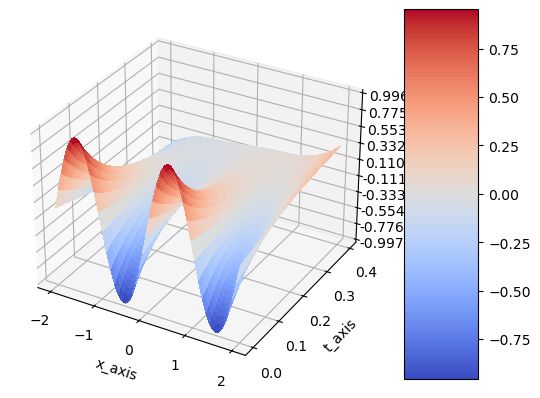

In [51]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.4, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.5]$
- training with iteration 20000

In [52]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.5, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0006)
1 Training Loss: tensor(0.0013)
2 Training Loss: tensor(0.0016)
3 Training Loss: tensor(0.0023)
4 Training Loss: tensor(0.0018)
5 Training Loss: tensor(0.0016)
6 Training Loss: tensor(0.0007)
7 Training Loss: tensor(0.0013)
8 Training Loss: tensor(0.0015)
9 Training Loss: tensor(0.0018)
10 Training Loss: tensor(0.0016)
11 Training Loss: tensor(0.0005)
12 Training Loss: tensor(0.0017)
13 Training Loss: tensor(0.0018)
14 Training Loss: tensor(0.0018)
15 Training Loss: tensor(0.0014)
16 Training Loss: tensor(0.0009)
17 Training Loss: tensor(0.0022)
18 Training Loss: tensor(0.0021)
19 Training Loss: tensor(0.0018)
20 Training Loss: tensor(0.0003)
21 Training Loss: tensor(0.0013)
22 Training Loss: tensor(0.0016)
23 Training Loss: tensor(0.0014)
24 Training Loss: tensor(0.0006)
25 Training Loss: tensor(0.0008)
26 Training Loss: tensor(0.0017)
27 Training Loss: tensor(0.0019)
28 Training Loss: tensor(0.0010)
29 Training Loss: tensor(0.0004)
30 Training Loss: te

245 Training Loss: tensor(0.0002)
246 Training Loss: tensor(0.0001)
247 Training Loss: tensor(0.0001)
248 Training Loss: tensor(0.0001)
249 Training Loss: tensor(0.0001)
250 Training Loss: tensor(0.0002)
251 Training Loss: tensor(0.0002)
252 Training Loss: tensor(0.0001)
253 Training Loss: tensor(8.5148e-05)
254 Training Loss: tensor(0.0002)
255 Training Loss: tensor(0.0002)
256 Training Loss: tensor(0.0003)
257 Training Loss: tensor(0.0003)
258 Training Loss: tensor(0.0002)
259 Training Loss: tensor(7.6261e-05)
260 Training Loss: tensor(0.0002)
261 Training Loss: tensor(0.0003)
262 Training Loss: tensor(0.0003)
263 Training Loss: tensor(0.0003)
264 Training Loss: tensor(0.0001)
265 Training Loss: tensor(0.0001)
266 Training Loss: tensor(9.0924e-05)
267 Training Loss: tensor(0.0002)
268 Training Loss: tensor(0.0002)
269 Training Loss: tensor(0.0001)
270 Training Loss: tensor(0.0001)
271 Training Loss: tensor(0.0001)
272 Training Loss: tensor(0.0002)
273 Training Loss: tensor(0.0003)
27

489 Training Loss: tensor(0.0004)
490 Training Loss: tensor(0.0004)
491 Training Loss: tensor(0.0004)
492 Training Loss: tensor(0.0002)
493 Training Loss: tensor(0.0002)
494 Training Loss: tensor(0.0004)
495 Training Loss: tensor(0.0009)
496 Training Loss: tensor(0.0014)
497 Training Loss: tensor(0.0016)
498 Training Loss: tensor(0.0014)
499 Training Loss: tensor(0.0006)
500 Training Loss: tensor(0.0003)
501 Training Loss: tensor(0.0003)
502 Training Loss: tensor(0.0009)
503 Training Loss: tensor(0.0018)
504 Training Loss: tensor(0.0024)
505 Training Loss: tensor(0.0024)
506 Training Loss: tensor(0.0017)
507 Training Loss: tensor(0.0007)
508 Training Loss: tensor(0.0003)
509 Training Loss: tensor(0.0007)
510 Training Loss: tensor(0.0013)
511 Training Loss: tensor(0.0014)
512 Training Loss: tensor(0.0007)
513 Training Loss: tensor(0.0009)
514 Training Loss: tensor(0.0004)
515 Training Loss: tensor(0.0018)
516 Training Loss: tensor(0.0016)
517 Training Loss: tensor(0.0016)
518 Training L

733 Training Loss: tensor(0.0008)
734 Training Loss: tensor(0.0010)
735 Training Loss: tensor(0.0009)
736 Training Loss: tensor(0.0004)
737 Training Loss: tensor(0.0001)
738 Training Loss: tensor(0.0002)
739 Training Loss: tensor(0.0005)
740 Training Loss: tensor(0.0008)
741 Training Loss: tensor(0.0012)
742 Training Loss: tensor(0.0012)
743 Training Loss: tensor(0.0013)
744 Training Loss: tensor(0.0012)
745 Training Loss: tensor(0.0006)
746 Training Loss: tensor(0.0003)
747 Training Loss: tensor(0.0003)
748 Training Loss: tensor(0.0007)
749 Training Loss: tensor(0.0006)
750 Training Loss: tensor(0.0006)
751 Training Loss: tensor(0.0002)
752 Training Loss: tensor(0.0002)
753 Training Loss: tensor(0.0002)
754 Training Loss: tensor(0.0003)
755 Training Loss: tensor(0.0004)
756 Training Loss: tensor(0.0002)
757 Training Loss: tensor(0.0003)
758 Training Loss: tensor(0.0002)
759 Training Loss: tensor(0.0002)
760 Training Loss: tensor(0.0003)
761 Training Loss: tensor(0.0001)
762 Training L

976 Training Loss: tensor(0.0002)
977 Training Loss: tensor(0.0001)
978 Training Loss: tensor(8.6147e-05)
979 Training Loss: tensor(0.0001)
980 Training Loss: tensor(0.0001)
981 Training Loss: tensor(0.0002)
982 Training Loss: tensor(0.0002)
983 Training Loss: tensor(0.0003)
984 Training Loss: tensor(0.0002)
985 Training Loss: tensor(0.0003)
986 Training Loss: tensor(0.0002)
987 Training Loss: tensor(0.0003)
988 Training Loss: tensor(0.0002)
989 Training Loss: tensor(0.0002)
990 Training Loss: tensor(0.0003)
991 Training Loss: tensor(0.0004)
992 Training Loss: tensor(0.0006)
993 Training Loss: tensor(0.0006)
994 Training Loss: tensor(0.0012)
995 Training Loss: tensor(0.0009)
996 Training Loss: tensor(0.0010)
997 Training Loss: tensor(0.0006)
998 Training Loss: tensor(0.0004)
999 Training Loss: tensor(0.0002)
1000 Training Loss: tensor(0.0004)
1001 Training Loss: tensor(0.0005)
1002 Training Loss: tensor(0.0008)
1003 Training Loss: tensor(0.0006)
1004 Training Loss: tensor(0.0004)
1005 

1216 Training Loss: tensor(0.0006)
1217 Training Loss: tensor(0.0006)
1218 Training Loss: tensor(0.0009)
1219 Training Loss: tensor(0.0012)
1220 Training Loss: tensor(0.0014)
1221 Training Loss: tensor(0.0011)
1222 Training Loss: tensor(0.0010)
1223 Training Loss: tensor(0.0004)
1224 Training Loss: tensor(0.0002)
1225 Training Loss: tensor(0.0002)
1226 Training Loss: tensor(0.0005)
1227 Training Loss: tensor(0.0011)
1228 Training Loss: tensor(0.0016)
1229 Training Loss: tensor(0.0015)
1230 Training Loss: tensor(0.0016)
1231 Training Loss: tensor(0.0013)
1232 Training Loss: tensor(0.0007)
1233 Training Loss: tensor(0.0008)
1234 Training Loss: tensor(0.0009)
1235 Training Loss: tensor(0.0016)
1236 Training Loss: tensor(0.0019)
1237 Training Loss: tensor(0.0016)
1238 Training Loss: tensor(0.0016)
1239 Training Loss: tensor(0.0006)
1240 Training Loss: tensor(0.0010)
1241 Training Loss: tensor(0.0009)
1242 Training Loss: tensor(0.0018)
1243 Training Loss: tensor(0.0012)
1244 Training Loss: 

1453 Training Loss: tensor(0.0002)
1454 Training Loss: tensor(0.0001)
1455 Training Loss: tensor(0.0003)
1456 Training Loss: tensor(0.0002)
1457 Training Loss: tensor(0.0002)
1458 Training Loss: tensor(0.0001)
1459 Training Loss: tensor(0.0001)
1460 Training Loss: tensor(0.0002)
1461 Training Loss: tensor(0.0001)
1462 Training Loss: tensor(0.0001)
1463 Training Loss: tensor(0.0001)
1464 Training Loss: tensor(0.0002)
1465 Training Loss: tensor(0.0004)
1466 Training Loss: tensor(0.0004)
1467 Training Loss: tensor(0.0004)
1468 Training Loss: tensor(0.0003)
1469 Training Loss: tensor(0.0001)
1470 Training Loss: tensor(0.0002)
1471 Training Loss: tensor(0.0004)
1472 Training Loss: tensor(0.0009)
1473 Training Loss: tensor(0.0012)
1474 Training Loss: tensor(0.0017)
1475 Training Loss: tensor(0.0010)
1476 Training Loss: tensor(0.0005)
1477 Training Loss: tensor(0.0003)
1478 Training Loss: tensor(0.0010)
1479 Training Loss: tensor(0.0017)
1480 Training Loss: tensor(0.0024)
1481 Training Loss: 

1690 Training Loss: tensor(0.0007)
1691 Training Loss: tensor(0.0006)
1692 Training Loss: tensor(0.0006)
1693 Training Loss: tensor(0.0006)
1694 Training Loss: tensor(0.0007)
1695 Training Loss: tensor(0.0004)
1696 Training Loss: tensor(0.0007)
1697 Training Loss: tensor(0.0007)
1698 Training Loss: tensor(0.0010)
1699 Training Loss: tensor(0.0006)
1700 Training Loss: tensor(0.0006)
1701 Training Loss: tensor(0.0003)
1702 Training Loss: tensor(0.0007)
1703 Training Loss: tensor(0.0004)
1704 Training Loss: tensor(0.0007)
1705 Training Loss: tensor(0.0004)
1706 Training Loss: tensor(0.0005)
1707 Training Loss: tensor(0.0002)
1708 Training Loss: tensor(0.0004)
1709 Training Loss: tensor(0.0003)
1710 Training Loss: tensor(0.0004)
1711 Training Loss: tensor(0.0002)
1712 Training Loss: tensor(0.0003)
1713 Training Loss: tensor(0.0002)
1714 Training Loss: tensor(0.0002)
1715 Training Loss: tensor(0.0003)
1716 Training Loss: tensor(0.0002)
1717 Training Loss: tensor(0.0002)
1718 Training Loss: 

1924 Training Loss: tensor(0.0002)
1925 Training Loss: tensor(0.0001)
1926 Training Loss: tensor(9.6529e-05)
1927 Training Loss: tensor(0.0002)
1928 Training Loss: tensor(0.0002)
1929 Training Loss: tensor(0.0002)
1930 Training Loss: tensor(0.0002)
1931 Training Loss: tensor(0.0002)
1932 Training Loss: tensor(0.0004)
1933 Training Loss: tensor(0.0002)
1934 Training Loss: tensor(0.0006)
1935 Training Loss: tensor(0.0003)
1936 Training Loss: tensor(0.0005)
1937 Training Loss: tensor(0.0002)
1938 Training Loss: tensor(0.0003)
1939 Training Loss: tensor(0.0002)
1940 Training Loss: tensor(0.0004)
1941 Training Loss: tensor(0.0003)
1942 Training Loss: tensor(0.0003)
1943 Training Loss: tensor(0.0002)
1944 Training Loss: tensor(0.0002)
1945 Training Loss: tensor(0.0002)
1946 Training Loss: tensor(0.0005)
1947 Training Loss: tensor(0.0002)
1948 Training Loss: tensor(0.0006)
1949 Training Loss: tensor(0.0005)
1950 Training Loss: tensor(0.0006)
1951 Training Loss: tensor(0.0004)
1952 Training Lo

2160 Training Loss: tensor(0.0003)
2161 Training Loss: tensor(0.0003)
2162 Training Loss: tensor(0.0003)
2163 Training Loss: tensor(0.0002)
2164 Training Loss: tensor(0.0003)
2165 Training Loss: tensor(0.0004)
2166 Training Loss: tensor(0.0004)
2167 Training Loss: tensor(0.0003)
2168 Training Loss: tensor(0.0004)
2169 Training Loss: tensor(0.0006)
2170 Training Loss: tensor(0.0004)
2171 Training Loss: tensor(0.0004)
2172 Training Loss: tensor(0.0002)
2173 Training Loss: tensor(0.0004)
2174 Training Loss: tensor(0.0003)
2175 Training Loss: tensor(0.0003)
2176 Training Loss: tensor(0.0004)
2177 Training Loss: tensor(0.0002)
2178 Training Loss: tensor(0.0002)
2179 Training Loss: tensor(0.0002)
2180 Training Loss: tensor(0.0004)
2181 Training Loss: tensor(0.0005)
2182 Training Loss: tensor(0.0007)
2183 Training Loss: tensor(0.0003)
2184 Training Loss: tensor(0.0003)
2185 Training Loss: tensor(0.0004)
2186 Training Loss: tensor(0.0005)
2187 Training Loss: tensor(0.0007)
2188 Training Loss: 

2393 Training Loss: tensor(0.0003)
2394 Training Loss: tensor(0.0004)
2395 Training Loss: tensor(0.0005)
2396 Training Loss: tensor(0.0003)
2397 Training Loss: tensor(0.0007)
2398 Training Loss: tensor(0.0012)
2399 Training Loss: tensor(0.0014)
2400 Training Loss: tensor(0.0007)
2401 Training Loss: tensor(0.0004)
2402 Training Loss: tensor(0.0004)
2403 Training Loss: tensor(0.0013)
2404 Training Loss: tensor(0.0025)
2405 Training Loss: tensor(0.0031)
2406 Training Loss: tensor(0.0020)
2407 Training Loss: tensor(0.0003)
2408 Training Loss: tensor(0.0005)
2409 Training Loss: tensor(0.0015)
2410 Training Loss: tensor(0.0021)
2411 Training Loss: tensor(0.0015)
2412 Training Loss: tensor(0.0009)
2413 Training Loss: tensor(0.0004)
2414 Training Loss: tensor(0.0006)
2415 Training Loss: tensor(0.0016)
2416 Training Loss: tensor(0.0027)
2417 Training Loss: tensor(0.0030)
2418 Training Loss: tensor(0.0018)
2419 Training Loss: tensor(0.0009)
2420 Training Loss: tensor(0.0013)
2421 Training Loss: 

2626 Training Loss: tensor(0.0002)
2627 Training Loss: tensor(0.0002)
2628 Training Loss: tensor(0.0002)
2629 Training Loss: tensor(0.0002)
2630 Training Loss: tensor(0.0002)
2631 Training Loss: tensor(0.0001)
2632 Training Loss: tensor(0.0001)
2633 Training Loss: tensor(0.0002)
2634 Training Loss: tensor(0.0001)
2635 Training Loss: tensor(0.0001)
2636 Training Loss: tensor(0.0001)
2637 Training Loss: tensor(0.0001)
2638 Training Loss: tensor(0.0001)
2639 Training Loss: tensor(8.9200e-05)
2640 Training Loss: tensor(0.0001)
2641 Training Loss: tensor(8.7077e-05)
2642 Training Loss: tensor(7.5114e-05)
2643 Training Loss: tensor(9.7729e-05)
2644 Training Loss: tensor(9.5013e-05)
2645 Training Loss: tensor(0.0001)
2646 Training Loss: tensor(7.1090e-05)
2647 Training Loss: tensor(0.0001)
2648 Training Loss: tensor(9.2203e-05)
2649 Training Loss: tensor(0.0002)
2650 Training Loss: tensor(0.0002)
2651 Training Loss: tensor(0.0003)
2652 Training Loss: tensor(0.0002)
2653 Training Loss: tensor(

2860 Training Loss: tensor(0.0004)
2861 Training Loss: tensor(0.0003)
2862 Training Loss: tensor(0.0004)
2863 Training Loss: tensor(0.0005)
2864 Training Loss: tensor(0.0005)
2865 Training Loss: tensor(0.0003)
2866 Training Loss: tensor(0.0002)
2867 Training Loss: tensor(0.0004)
2868 Training Loss: tensor(0.0004)
2869 Training Loss: tensor(0.0003)
2870 Training Loss: tensor(0.0002)
2871 Training Loss: tensor(0.0002)
2872 Training Loss: tensor(0.0005)
2873 Training Loss: tensor(0.0003)
2874 Training Loss: tensor(0.0004)
2875 Training Loss: tensor(0.0002)
2876 Training Loss: tensor(0.0002)
2877 Training Loss: tensor(0.0002)
2878 Training Loss: tensor(0.0003)
2879 Training Loss: tensor(0.0004)
2880 Training Loss: tensor(0.0003)
2881 Training Loss: tensor(0.0003)
2882 Training Loss: tensor(0.0002)
2883 Training Loss: tensor(0.0002)
2884 Training Loss: tensor(0.0004)
2885 Training Loss: tensor(0.0003)
2886 Training Loss: tensor(0.0002)
2887 Training Loss: tensor(0.0001)
2888 Training Loss: 

3096 Training Loss: tensor(0.0007)
3097 Training Loss: tensor(0.0003)
3098 Training Loss: tensor(0.0007)
3099 Training Loss: tensor(0.0006)
3100 Training Loss: tensor(0.0012)
3101 Training Loss: tensor(0.0004)
3102 Training Loss: tensor(0.0009)
3103 Training Loss: tensor(0.0004)
3104 Training Loss: tensor(0.0009)
3105 Training Loss: tensor(0.0004)
3106 Training Loss: tensor(0.0005)
3107 Training Loss: tensor(0.0009)
3108 Training Loss: tensor(0.0004)
3109 Training Loss: tensor(0.0013)
3110 Training Loss: tensor(0.0007)
3111 Training Loss: tensor(0.0016)
3112 Training Loss: tensor(0.0009)
3113 Training Loss: tensor(0.0017)
3114 Training Loss: tensor(0.0010)
3115 Training Loss: tensor(0.0013)
3116 Training Loss: tensor(0.0009)
3117 Training Loss: tensor(0.0014)
3118 Training Loss: tensor(0.0028)
3119 Training Loss: tensor(0.0019)
3120 Training Loss: tensor(0.0029)
3121 Training Loss: tensor(0.0004)
3122 Training Loss: tensor(0.0015)
3123 Training Loss: tensor(0.0021)
3124 Training Loss: 

3326 Training Loss: tensor(9.1773e-05)
3327 Training Loss: tensor(0.0001)
3328 Training Loss: tensor(0.0001)
3329 Training Loss: tensor(0.0001)
3330 Training Loss: tensor(9.8712e-05)
3331 Training Loss: tensor(0.0001)
3332 Training Loss: tensor(0.0002)
3333 Training Loss: tensor(0.0002)
3334 Training Loss: tensor(0.0002)
3335 Training Loss: tensor(0.0002)
3336 Training Loss: tensor(0.0001)
3337 Training Loss: tensor(0.0001)
3338 Training Loss: tensor(0.0001)
3339 Training Loss: tensor(0.0002)
3340 Training Loss: tensor(0.0002)
3341 Training Loss: tensor(0.0002)
3342 Training Loss: tensor(0.0002)
3343 Training Loss: tensor(0.0001)
3344 Training Loss: tensor(5.8240e-05)
3345 Training Loss: tensor(0.0002)
3346 Training Loss: tensor(0.0002)
3347 Training Loss: tensor(0.0002)
3348 Training Loss: tensor(0.0002)
3349 Training Loss: tensor(9.2606e-05)
3350 Training Loss: tensor(9.1120e-05)
3351 Training Loss: tensor(9.0833e-05)
3352 Training Loss: tensor(0.0001)
3353 Training Loss: tensor(7.63

3559 Training Loss: tensor(0.0002)
3560 Training Loss: tensor(0.0001)
3561 Training Loss: tensor(0.0001)
3562 Training Loss: tensor(0.0001)
3563 Training Loss: tensor(0.0002)
3564 Training Loss: tensor(0.0002)
3565 Training Loss: tensor(0.0003)
3566 Training Loss: tensor(0.0002)
3567 Training Loss: tensor(0.0002)
3568 Training Loss: tensor(0.0001)
3569 Training Loss: tensor(0.0002)
3570 Training Loss: tensor(0.0002)
3571 Training Loss: tensor(0.0003)
3572 Training Loss: tensor(0.0002)
3573 Training Loss: tensor(0.0002)
3574 Training Loss: tensor(0.0002)
3575 Training Loss: tensor(9.7984e-05)
3576 Training Loss: tensor(0.0002)
3577 Training Loss: tensor(0.0001)
3578 Training Loss: tensor(0.0002)
3579 Training Loss: tensor(6.5352e-05)
3580 Training Loss: tensor(0.0002)
3581 Training Loss: tensor(9.2412e-05)
3582 Training Loss: tensor(0.0002)
3583 Training Loss: tensor(0.0001)
3584 Training Loss: tensor(0.0002)
3585 Training Loss: tensor(0.0001)
3586 Training Loss: tensor(0.0002)
3587 Tra

3794 Training Loss: tensor(0.0006)
3795 Training Loss: tensor(0.0001)
3796 Training Loss: tensor(0.0003)
3797 Training Loss: tensor(0.0009)
3798 Training Loss: tensor(0.0013)
3799 Training Loss: tensor(0.0015)
3800 Training Loss: tensor(0.0009)
3801 Training Loss: tensor(0.0005)
3802 Training Loss: tensor(0.0003)
3803 Training Loss: tensor(0.0009)
3804 Training Loss: tensor(0.0020)
3805 Training Loss: tensor(0.0020)
3806 Training Loss: tensor(0.0013)
3807 Training Loss: tensor(0.0003)
3808 Training Loss: tensor(0.0005)
3809 Training Loss: tensor(0.0010)
3810 Training Loss: tensor(0.0012)
3811 Training Loss: tensor(0.0008)
3812 Training Loss: tensor(0.0004)
3813 Training Loss: tensor(0.0002)
3814 Training Loss: tensor(0.0003)
3815 Training Loss: tensor(0.0005)
3816 Training Loss: tensor(0.0006)
3817 Training Loss: tensor(0.0005)
3818 Training Loss: tensor(0.0003)
3819 Training Loss: tensor(0.0004)
3820 Training Loss: tensor(0.0004)
3821 Training Loss: tensor(0.0012)
3822 Training Loss: 

4030 Training Loss: tensor(0.0003)
4031 Training Loss: tensor(0.0005)
4032 Training Loss: tensor(0.0003)
4033 Training Loss: tensor(0.0005)
4034 Training Loss: tensor(0.0003)
4035 Training Loss: tensor(0.0006)
4036 Training Loss: tensor(0.0003)
4037 Training Loss: tensor(0.0004)
4038 Training Loss: tensor(0.0003)
4039 Training Loss: tensor(0.0003)
4040 Training Loss: tensor(0.0001)
4041 Training Loss: tensor(0.0003)
4042 Training Loss: tensor(0.0002)
4043 Training Loss: tensor(0.0002)
4044 Training Loss: tensor(0.0003)
4045 Training Loss: tensor(0.0002)
4046 Training Loss: tensor(0.0002)
4047 Training Loss: tensor(0.0003)
4048 Training Loss: tensor(0.0002)
4049 Training Loss: tensor(0.0002)
4050 Training Loss: tensor(0.0001)
4051 Training Loss: tensor(0.0002)
4052 Training Loss: tensor(0.0001)
4053 Training Loss: tensor(0.0002)
4054 Training Loss: tensor(0.0002)
4055 Training Loss: tensor(0.0002)
4056 Training Loss: tensor(0.0002)
4057 Training Loss: tensor(0.0002)
4058 Training Loss: 

4266 Training Loss: tensor(0.0001)
4267 Training Loss: tensor(0.0002)
4268 Training Loss: tensor(0.0002)
4269 Training Loss: tensor(0.0006)
4270 Training Loss: tensor(0.0009)
4271 Training Loss: tensor(0.0012)
4272 Training Loss: tensor(0.0015)
4273 Training Loss: tensor(0.0007)
4274 Training Loss: tensor(0.0004)
4275 Training Loss: tensor(0.0004)
4276 Training Loss: tensor(0.0004)
4277 Training Loss: tensor(0.0012)
4278 Training Loss: tensor(0.0017)
4279 Training Loss: tensor(0.0016)
4280 Training Loss: tensor(0.0008)
4281 Training Loss: tensor(0.0003)
4282 Training Loss: tensor(0.0004)
4283 Training Loss: tensor(0.0007)
4284 Training Loss: tensor(0.0012)
4285 Training Loss: tensor(0.0012)
4286 Training Loss: tensor(0.0010)
4287 Training Loss: tensor(0.0004)
4288 Training Loss: tensor(0.0004)
4289 Training Loss: tensor(0.0010)
4290 Training Loss: tensor(0.0019)
4291 Training Loss: tensor(0.0012)
4292 Training Loss: tensor(0.0003)
4293 Training Loss: tensor(0.0005)
4294 Training Loss: 

4497 Training Loss: tensor(0.0009)
4498 Training Loss: tensor(0.0005)
4499 Training Loss: tensor(0.0003)
4500 Training Loss: tensor(0.0004)
4501 Training Loss: tensor(0.0010)
4502 Training Loss: tensor(0.0011)
4503 Training Loss: tensor(0.0004)
4504 Training Loss: tensor(0.0002)
4505 Training Loss: tensor(0.0005)
4506 Training Loss: tensor(0.0014)
4507 Training Loss: tensor(0.0018)
4508 Training Loss: tensor(0.0013)
4509 Training Loss: tensor(0.0006)
4510 Training Loss: tensor(0.0003)
4511 Training Loss: tensor(0.0010)
4512 Training Loss: tensor(0.0012)
4513 Training Loss: tensor(0.0012)
4514 Training Loss: tensor(0.0004)
4515 Training Loss: tensor(0.0003)
4516 Training Loss: tensor(0.0008)
4517 Training Loss: tensor(0.0016)
4518 Training Loss: tensor(0.0015)
4519 Training Loss: tensor(0.0007)
4520 Training Loss: tensor(0.0008)
4521 Training Loss: tensor(0.0008)
4522 Training Loss: tensor(0.0023)
4523 Training Loss: tensor(0.0026)
4524 Training Loss: tensor(0.0033)
4525 Training Loss: 

4732 Training Loss: tensor(0.0007)
4733 Training Loss: tensor(0.0004)
4734 Training Loss: tensor(0.0005)
4735 Training Loss: tensor(0.0005)
4736 Training Loss: tensor(0.0005)
4737 Training Loss: tensor(0.0004)
4738 Training Loss: tensor(0.0005)
4739 Training Loss: tensor(0.0006)
4740 Training Loss: tensor(0.0003)
4741 Training Loss: tensor(0.0005)
4742 Training Loss: tensor(0.0004)
4743 Training Loss: tensor(0.0005)
4744 Training Loss: tensor(0.0002)
4745 Training Loss: tensor(0.0005)
4746 Training Loss: tensor(0.0003)
4747 Training Loss: tensor(0.0005)
4748 Training Loss: tensor(0.0003)
4749 Training Loss: tensor(0.0003)
4750 Training Loss: tensor(0.0003)
4751 Training Loss: tensor(0.0004)
4752 Training Loss: tensor(0.0002)
4753 Training Loss: tensor(0.0005)
4754 Training Loss: tensor(0.0003)
4755 Training Loss: tensor(0.0003)
4756 Training Loss: tensor(0.0003)
4757 Training Loss: tensor(0.0003)
4758 Training Loss: tensor(0.0003)
4759 Training Loss: tensor(0.0003)
4760 Training Loss: 

4970 Training Loss: tensor(0.0003)
4971 Training Loss: tensor(0.0002)
4972 Training Loss: tensor(0.0002)
4973 Training Loss: tensor(0.0001)
4974 Training Loss: tensor(0.0002)
4975 Training Loss: tensor(0.0002)
4976 Training Loss: tensor(0.0003)
4977 Training Loss: tensor(0.0001)
4978 Training Loss: tensor(0.0003)
4979 Training Loss: tensor(0.0002)
4980 Training Loss: tensor(0.0005)
4981 Training Loss: tensor(0.0004)
4982 Training Loss: tensor(0.0006)
4983 Training Loss: tensor(0.0002)
4984 Training Loss: tensor(0.0004)
4985 Training Loss: tensor(0.0002)
4986 Training Loss: tensor(0.0006)
4987 Training Loss: tensor(0.0009)
4988 Training Loss: tensor(0.0008)
4989 Training Loss: tensor(0.0013)
4990 Training Loss: tensor(0.0012)
4991 Training Loss: tensor(0.0015)
4992 Training Loss: tensor(0.0009)
4993 Training Loss: tensor(0.0010)
4994 Training Loss: tensor(0.0007)
4995 Training Loss: tensor(0.0005)
4996 Training Loss: tensor(0.0016)
4997 Training Loss: tensor(0.0023)
4998 Training Loss: 

5207 Training Loss: tensor(0.0005)
5208 Training Loss: tensor(0.0003)
5209 Training Loss: tensor(0.0002)
5210 Training Loss: tensor(0.0002)
5211 Training Loss: tensor(0.0004)
5212 Training Loss: tensor(0.0008)
5213 Training Loss: tensor(0.0010)
5214 Training Loss: tensor(0.0009)
5215 Training Loss: tensor(0.0006)
5216 Training Loss: tensor(0.0002)
5217 Training Loss: tensor(0.0001)
5218 Training Loss: tensor(0.0002)
5219 Training Loss: tensor(0.0003)
5220 Training Loss: tensor(0.0004)
5221 Training Loss: tensor(0.0003)
5222 Training Loss: tensor(0.0001)
5223 Training Loss: tensor(0.0002)
5224 Training Loss: tensor(0.0001)
5225 Training Loss: tensor(0.0002)
5226 Training Loss: tensor(0.0002)
5227 Training Loss: tensor(0.0001)
5228 Training Loss: tensor(0.0002)
5229 Training Loss: tensor(8.9283e-05)
5230 Training Loss: tensor(9.5647e-05)
5231 Training Loss: tensor(0.0002)
5232 Training Loss: tensor(0.0002)
5233 Training Loss: tensor(0.0003)
5234 Training Loss: tensor(0.0003)
5235 Trainin

5444 Training Loss: tensor(0.0007)
5445 Training Loss: tensor(0.0012)
5446 Training Loss: tensor(0.0019)
5447 Training Loss: tensor(0.0030)
5448 Training Loss: tensor(0.0036)
5449 Training Loss: tensor(0.0031)
5450 Training Loss: tensor(0.0011)
5451 Training Loss: tensor(0.0005)
5452 Training Loss: tensor(0.0014)
5453 Training Loss: tensor(0.0029)
5454 Training Loss: tensor(0.0037)
5455 Training Loss: tensor(0.0027)
5456 Training Loss: tensor(0.0013)
5457 Training Loss: tensor(0.0008)
5458 Training Loss: tensor(0.0018)
5459 Training Loss: tensor(0.0020)
5460 Training Loss: tensor(0.0019)
5461 Training Loss: tensor(0.0006)
5462 Training Loss: tensor(0.0012)
5463 Training Loss: tensor(0.0018)
5464 Training Loss: tensor(0.0021)
5465 Training Loss: tensor(0.0008)
5466 Training Loss: tensor(0.0010)
5467 Training Loss: tensor(0.0010)
5468 Training Loss: tensor(0.0018)
5469 Training Loss: tensor(0.0013)
5470 Training Loss: tensor(0.0009)
5471 Training Loss: tensor(0.0010)
5472 Training Loss: 

5679 Training Loss: tensor(9.4197e-05)
5680 Training Loss: tensor(0.0001)
5681 Training Loss: tensor(0.0002)
5682 Training Loss: tensor(0.0002)
5683 Training Loss: tensor(0.0001)
5684 Training Loss: tensor(8.4543e-05)
5685 Training Loss: tensor(9.7279e-05)
5686 Training Loss: tensor(0.0002)
5687 Training Loss: tensor(0.0003)
5688 Training Loss: tensor(0.0004)
5689 Training Loss: tensor(0.0002)
5690 Training Loss: tensor(0.0002)
5691 Training Loss: tensor(0.0001)
5692 Training Loss: tensor(7.7165e-05)
5693 Training Loss: tensor(8.5194e-05)
5694 Training Loss: tensor(0.0001)
5695 Training Loss: tensor(0.0001)
5696 Training Loss: tensor(0.0001)
5697 Training Loss: tensor(0.0001)
5698 Training Loss: tensor(7.5962e-05)
5699 Training Loss: tensor(0.0001)
5700 Training Loss: tensor(0.0001)
5701 Training Loss: tensor(8.5913e-05)
5702 Training Loss: tensor(8.9407e-05)
5703 Training Loss: tensor(9.4465e-05)
5704 Training Loss: tensor(0.0001)
5705 Training Loss: tensor(0.0001)
5706 Training Loss:

5910 Training Loss: tensor(0.0003)
5911 Training Loss: tensor(0.0005)
5912 Training Loss: tensor(0.0004)
5913 Training Loss: tensor(0.0004)
5914 Training Loss: tensor(0.0004)
5915 Training Loss: tensor(0.0002)
5916 Training Loss: tensor(0.0002)
5917 Training Loss: tensor(0.0003)
5918 Training Loss: tensor(0.0005)
5919 Training Loss: tensor(0.0007)
5920 Training Loss: tensor(0.0009)
5921 Training Loss: tensor(0.0009)
5922 Training Loss: tensor(0.0004)
5923 Training Loss: tensor(0.0001)
5924 Training Loss: tensor(0.0004)
5925 Training Loss: tensor(0.0005)
5926 Training Loss: tensor(0.0003)
5927 Training Loss: tensor(0.0002)
5928 Training Loss: tensor(0.0002)
5929 Training Loss: tensor(0.0004)
5930 Training Loss: tensor(0.0004)
5931 Training Loss: tensor(0.0002)
5932 Training Loss: tensor(0.0002)
5933 Training Loss: tensor(0.0005)
5934 Training Loss: tensor(0.0007)
5935 Training Loss: tensor(0.0005)
5936 Training Loss: tensor(0.0003)
5937 Training Loss: tensor(0.0002)
5938 Training Loss: 

6141 Training Loss: tensor(5.9996e-05)
6142 Training Loss: tensor(6.8288e-05)
6143 Training Loss: tensor(4.9759e-05)
6144 Training Loss: tensor(8.4927e-05)
6145 Training Loss: tensor(7.0134e-05)
6146 Training Loss: tensor(9.4797e-05)
6147 Training Loss: tensor(7.2668e-05)
6148 Training Loss: tensor(9.0758e-05)
6149 Training Loss: tensor(4.1537e-05)
6150 Training Loss: tensor(7.5194e-05)
6151 Training Loss: tensor(7.8365e-05)
6152 Training Loss: tensor(0.0001)
6153 Training Loss: tensor(0.0001)
6154 Training Loss: tensor(0.0001)
6155 Training Loss: tensor(0.0001)
6156 Training Loss: tensor(0.0001)
6157 Training Loss: tensor(8.9822e-05)
6158 Training Loss: tensor(9.1506e-05)
6159 Training Loss: tensor(0.0001)
6160 Training Loss: tensor(0.0002)
6161 Training Loss: tensor(0.0003)
6162 Training Loss: tensor(0.0004)
6163 Training Loss: tensor(0.0003)
6164 Training Loss: tensor(0.0002)
6165 Training Loss: tensor(0.0001)
6166 Training Loss: tensor(0.0002)
6167 Training Loss: tensor(0.0001)
616

6380 Training Loss: tensor(0.0006)
6381 Training Loss: tensor(0.0004)
6382 Training Loss: tensor(0.0005)
6383 Training Loss: tensor(0.0006)
6384 Training Loss: tensor(0.0012)
6385 Training Loss: tensor(0.0009)
6386 Training Loss: tensor(0.0014)
6387 Training Loss: tensor(0.0014)
6388 Training Loss: tensor(0.0009)
6389 Training Loss: tensor(0.0012)
6390 Training Loss: tensor(0.0006)
6391 Training Loss: tensor(0.0008)
6392 Training Loss: tensor(0.0006)
6393 Training Loss: tensor(0.0005)
6394 Training Loss: tensor(0.0006)
6395 Training Loss: tensor(0.0005)
6396 Training Loss: tensor(0.0003)
6397 Training Loss: tensor(0.0005)
6398 Training Loss: tensor(0.0004)
6399 Training Loss: tensor(0.0004)
6400 Training Loss: tensor(0.0003)
6401 Training Loss: tensor(0.0004)
6402 Training Loss: tensor(0.0003)
6403 Training Loss: tensor(0.0002)
6404 Training Loss: tensor(0.0003)
6405 Training Loss: tensor(0.0004)
6406 Training Loss: tensor(0.0002)
6407 Training Loss: tensor(0.0004)
6408 Training Loss: 

6616 Training Loss: tensor(0.0002)
6617 Training Loss: tensor(0.0003)
6618 Training Loss: tensor(0.0001)
6619 Training Loss: tensor(0.0002)
6620 Training Loss: tensor(0.0002)
6621 Training Loss: tensor(0.0002)
6622 Training Loss: tensor(0.0001)
6623 Training Loss: tensor(0.0004)
6624 Training Loss: tensor(8.4012e-05)
6625 Training Loss: tensor(0.0003)
6626 Training Loss: tensor(0.0003)
6627 Training Loss: tensor(0.0003)
6628 Training Loss: tensor(0.0003)
6629 Training Loss: tensor(0.0002)
6630 Training Loss: tensor(0.0002)
6631 Training Loss: tensor(0.0003)
6632 Training Loss: tensor(0.0003)
6633 Training Loss: tensor(0.0002)
6634 Training Loss: tensor(0.0001)
6635 Training Loss: tensor(0.0002)
6636 Training Loss: tensor(0.0001)
6637 Training Loss: tensor(0.0001)
6638 Training Loss: tensor(0.0001)
6639 Training Loss: tensor(0.0002)
6640 Training Loss: tensor(0.0001)
6641 Training Loss: tensor(8.6459e-05)
6642 Training Loss: tensor(7.3608e-05)
6643 Training Loss: tensor(9.1685e-05)
6644

6846 Training Loss: tensor(0.0002)
6847 Training Loss: tensor(0.0001)
6848 Training Loss: tensor(0.0002)
6849 Training Loss: tensor(0.0002)
6850 Training Loss: tensor(0.0002)
6851 Training Loss: tensor(0.0002)
6852 Training Loss: tensor(0.0003)
6853 Training Loss: tensor(0.0001)
6854 Training Loss: tensor(0.0004)
6855 Training Loss: tensor(0.0001)
6856 Training Loss: tensor(0.0004)
6857 Training Loss: tensor(0.0002)
6858 Training Loss: tensor(0.0002)
6859 Training Loss: tensor(0.0003)
6860 Training Loss: tensor(0.0003)
6861 Training Loss: tensor(0.0003)
6862 Training Loss: tensor(0.0001)
6863 Training Loss: tensor(0.0003)
6864 Training Loss: tensor(0.0001)
6865 Training Loss: tensor(0.0003)
6866 Training Loss: tensor(0.0003)
6867 Training Loss: tensor(0.0004)
6868 Training Loss: tensor(0.0004)
6869 Training Loss: tensor(0.0002)
6870 Training Loss: tensor(0.0002)
6871 Training Loss: tensor(0.0002)
6872 Training Loss: tensor(0.0003)
6873 Training Loss: tensor(0.0003)
6874 Training Loss: 

7076 Training Loss: tensor(0.0030)
7077 Training Loss: tensor(0.0017)
7078 Training Loss: tensor(0.0007)
7079 Training Loss: tensor(0.0006)
7080 Training Loss: tensor(0.0018)
7081 Training Loss: tensor(0.0022)
7082 Training Loss: tensor(0.0039)
7083 Training Loss: tensor(0.0039)
7084 Training Loss: tensor(0.0037)
7085 Training Loss: tensor(0.0015)
7086 Training Loss: tensor(0.0014)
7087 Training Loss: tensor(0.0030)
7088 Training Loss: tensor(0.0037)
7089 Training Loss: tensor(0.0022)
7090 Training Loss: tensor(0.0021)
7091 Training Loss: tensor(0.0018)
7092 Training Loss: tensor(0.0018)
7093 Training Loss: tensor(0.0009)
7094 Training Loss: tensor(0.0019)
7095 Training Loss: tensor(0.0013)
7096 Training Loss: tensor(0.0016)
7097 Training Loss: tensor(0.0010)
7098 Training Loss: tensor(0.0016)
7099 Training Loss: tensor(0.0007)
7100 Training Loss: tensor(0.0018)
7101 Training Loss: tensor(0.0011)
7102 Training Loss: tensor(0.0015)
7103 Training Loss: tensor(0.0012)
7104 Training Loss: 

7308 Training Loss: tensor(0.0004)
7309 Training Loss: tensor(0.0006)
7310 Training Loss: tensor(0.0006)
7311 Training Loss: tensor(0.0007)
7312 Training Loss: tensor(0.0005)
7313 Training Loss: tensor(0.0006)
7314 Training Loss: tensor(0.0003)
7315 Training Loss: tensor(0.0002)
7316 Training Loss: tensor(0.0003)
7317 Training Loss: tensor(0.0002)
7318 Training Loss: tensor(0.0003)
7319 Training Loss: tensor(0.0003)
7320 Training Loss: tensor(0.0002)
7321 Training Loss: tensor(0.0003)
7322 Training Loss: tensor(0.0002)
7323 Training Loss: tensor(0.0002)
7324 Training Loss: tensor(0.0002)
7325 Training Loss: tensor(0.0001)
7326 Training Loss: tensor(0.0003)
7327 Training Loss: tensor(0.0004)
7328 Training Loss: tensor(0.0004)
7329 Training Loss: tensor(0.0004)
7330 Training Loss: tensor(0.0003)
7331 Training Loss: tensor(0.0003)
7332 Training Loss: tensor(0.0002)
7333 Training Loss: tensor(0.0004)
7334 Training Loss: tensor(0.0006)
7335 Training Loss: tensor(0.0006)
7336 Training Loss: 

7543 Training Loss: tensor(0.0001)
7544 Training Loss: tensor(0.0002)
7545 Training Loss: tensor(0.0004)
7546 Training Loss: tensor(0.0003)
7547 Training Loss: tensor(0.0002)
7548 Training Loss: tensor(0.0002)
7549 Training Loss: tensor(0.0002)
7550 Training Loss: tensor(0.0004)
7551 Training Loss: tensor(0.0002)
7552 Training Loss: tensor(0.0001)
7553 Training Loss: tensor(0.0001)
7554 Training Loss: tensor(0.0002)
7555 Training Loss: tensor(0.0002)
7556 Training Loss: tensor(0.0001)
7557 Training Loss: tensor(0.0001)
7558 Training Loss: tensor(0.0002)
7559 Training Loss: tensor(0.0003)
7560 Training Loss: tensor(0.0003)
7561 Training Loss: tensor(0.0002)
7562 Training Loss: tensor(0.0001)
7563 Training Loss: tensor(0.0001)
7564 Training Loss: tensor(0.0002)
7565 Training Loss: tensor(0.0003)
7566 Training Loss: tensor(0.0001)
7567 Training Loss: tensor(0.0002)
7568 Training Loss: tensor(0.0001)
7569 Training Loss: tensor(0.0002)
7570 Training Loss: tensor(0.0001)
7571 Training Loss: 

7778 Training Loss: tensor(0.0003)
7779 Training Loss: tensor(0.0001)
7780 Training Loss: tensor(0.0002)
7781 Training Loss: tensor(0.0003)
7782 Training Loss: tensor(0.0004)
7783 Training Loss: tensor(0.0004)
7784 Training Loss: tensor(0.0003)
7785 Training Loss: tensor(0.0001)
7786 Training Loss: tensor(0.0001)
7787 Training Loss: tensor(0.0002)
7788 Training Loss: tensor(0.0005)
7789 Training Loss: tensor(0.0006)
7790 Training Loss: tensor(0.0005)
7791 Training Loss: tensor(0.0004)
7792 Training Loss: tensor(0.0004)
7793 Training Loss: tensor(0.0001)
7794 Training Loss: tensor(0.0002)
7795 Training Loss: tensor(0.0002)
7796 Training Loss: tensor(0.0003)
7797 Training Loss: tensor(0.0003)
7798 Training Loss: tensor(0.0002)
7799 Training Loss: tensor(6.6200e-05)
7800 Training Loss: tensor(0.0002)
7801 Training Loss: tensor(0.0003)
7802 Training Loss: tensor(0.0003)
7803 Training Loss: tensor(0.0002)
7804 Training Loss: tensor(8.4678e-05)
7805 Training Loss: tensor(0.0002)
7806 Trainin

8011 Training Loss: tensor(9.3356e-05)
8012 Training Loss: tensor(0.0004)
8013 Training Loss: tensor(9.3076e-05)
8014 Training Loss: tensor(0.0005)
8015 Training Loss: tensor(0.0002)
8016 Training Loss: tensor(0.0003)
8017 Training Loss: tensor(0.0002)
8018 Training Loss: tensor(0.0002)
8019 Training Loss: tensor(0.0003)
8020 Training Loss: tensor(0.0002)
8021 Training Loss: tensor(0.0003)
8022 Training Loss: tensor(0.0002)
8023 Training Loss: tensor(0.0004)
8024 Training Loss: tensor(0.0002)
8025 Training Loss: tensor(0.0003)
8026 Training Loss: tensor(0.0003)
8027 Training Loss: tensor(0.0002)
8028 Training Loss: tensor(0.0003)
8029 Training Loss: tensor(0.0002)
8030 Training Loss: tensor(0.0001)
8031 Training Loss: tensor(0.0002)
8032 Training Loss: tensor(0.0001)
8033 Training Loss: tensor(0.0002)
8034 Training Loss: tensor(8.4000e-05)
8035 Training Loss: tensor(0.0002)
8036 Training Loss: tensor(0.0001)
8037 Training Loss: tensor(9.7773e-05)
8038 Training Loss: tensor(0.0001)
8039

8246 Training Loss: tensor(0.0002)
8247 Training Loss: tensor(0.0002)
8248 Training Loss: tensor(0.0002)
8249 Training Loss: tensor(0.0001)
8250 Training Loss: tensor(0.0001)
8251 Training Loss: tensor(0.0001)
8252 Training Loss: tensor(7.0352e-05)
8253 Training Loss: tensor(0.0001)
8254 Training Loss: tensor(0.0001)
8255 Training Loss: tensor(0.0002)
8256 Training Loss: tensor(0.0003)
8257 Training Loss: tensor(0.0002)
8258 Training Loss: tensor(0.0001)
8259 Training Loss: tensor(8.9475e-05)
8260 Training Loss: tensor(7.0968e-05)
8261 Training Loss: tensor(0.0001)
8262 Training Loss: tensor(7.2367e-05)
8263 Training Loss: tensor(0.0001)
8264 Training Loss: tensor(5.4357e-05)
8265 Training Loss: tensor(6.6529e-05)
8266 Training Loss: tensor(7.4248e-05)
8267 Training Loss: tensor(7.9873e-05)
8268 Training Loss: tensor(0.0001)
8269 Training Loss: tensor(0.0001)
8270 Training Loss: tensor(0.0001)
8271 Training Loss: tensor(0.0001)
8272 Training Loss: tensor(0.0001)
8273 Training Loss: ten

8478 Training Loss: tensor(0.0002)
8479 Training Loss: tensor(0.0002)
8480 Training Loss: tensor(0.0001)
8481 Training Loss: tensor(0.0003)
8482 Training Loss: tensor(0.0003)
8483 Training Loss: tensor(0.0003)
8484 Training Loss: tensor(0.0002)
8485 Training Loss: tensor(8.4311e-05)
8486 Training Loss: tensor(0.0002)
8487 Training Loss: tensor(0.0001)
8488 Training Loss: tensor(0.0002)
8489 Training Loss: tensor(0.0001)
8490 Training Loss: tensor(0.0002)
8491 Training Loss: tensor(7.1563e-05)
8492 Training Loss: tensor(0.0001)
8493 Training Loss: tensor(0.0001)
8494 Training Loss: tensor(0.0002)
8495 Training Loss: tensor(0.0003)
8496 Training Loss: tensor(0.0002)
8497 Training Loss: tensor(0.0002)
8498 Training Loss: tensor(8.5440e-05)
8499 Training Loss: tensor(0.0001)
8500 Training Loss: tensor(0.0002)
8501 Training Loss: tensor(0.0003)
8502 Training Loss: tensor(0.0003)
8503 Training Loss: tensor(0.0003)
8504 Training Loss: tensor(0.0001)
8505 Training Loss: tensor(0.0001)
8506 Tra

8709 Training Loss: tensor(0.0002)
8710 Training Loss: tensor(0.0001)
8711 Training Loss: tensor(0.0001)
8712 Training Loss: tensor(0.0001)
8713 Training Loss: tensor(0.0001)
8714 Training Loss: tensor(0.0002)
8715 Training Loss: tensor(0.0002)
8716 Training Loss: tensor(0.0002)
8717 Training Loss: tensor(6.3329e-05)
8718 Training Loss: tensor(0.0002)
8719 Training Loss: tensor(0.0001)
8720 Training Loss: tensor(0.0002)
8721 Training Loss: tensor(0.0002)
8722 Training Loss: tensor(0.0002)
8723 Training Loss: tensor(7.2571e-05)
8724 Training Loss: tensor(0.0001)
8725 Training Loss: tensor(9.2899e-05)
8726 Training Loss: tensor(0.0001)
8727 Training Loss: tensor(0.0001)
8728 Training Loss: tensor(6.9952e-05)
8729 Training Loss: tensor(6.5873e-05)
8730 Training Loss: tensor(7.5647e-05)
8731 Training Loss: tensor(0.0001)
8732 Training Loss: tensor(4.8284e-05)
8733 Training Loss: tensor(6.7872e-05)
8734 Training Loss: tensor(5.9574e-05)
8735 Training Loss: tensor(7.9034e-05)
8736 Training L

8939 Training Loss: tensor(0.0002)
8940 Training Loss: tensor(0.0002)
8941 Training Loss: tensor(0.0003)
8942 Training Loss: tensor(0.0003)
8943 Training Loss: tensor(0.0008)
8944 Training Loss: tensor(0.0011)
8945 Training Loss: tensor(0.0015)
8946 Training Loss: tensor(0.0013)
8947 Training Loss: tensor(0.0009)
8948 Training Loss: tensor(0.0003)
8949 Training Loss: tensor(0.0003)
8950 Training Loss: tensor(0.0007)
8951 Training Loss: tensor(0.0014)
8952 Training Loss: tensor(0.0019)
8953 Training Loss: tensor(0.0018)
8954 Training Loss: tensor(0.0013)
8955 Training Loss: tensor(0.0004)
8956 Training Loss: tensor(0.0003)
8957 Training Loss: tensor(0.0006)
8958 Training Loss: tensor(0.0009)
8959 Training Loss: tensor(0.0009)
8960 Training Loss: tensor(0.0004)
8961 Training Loss: tensor(0.0003)
8962 Training Loss: tensor(0.0002)
8963 Training Loss: tensor(0.0002)
8964 Training Loss: tensor(0.0004)
8965 Training Loss: tensor(0.0004)
8966 Training Loss: tensor(0.0002)
8967 Training Loss: 

9178 Training Loss: tensor(0.0005)
9179 Training Loss: tensor(0.0008)
9180 Training Loss: tensor(0.0006)
9181 Training Loss: tensor(0.0003)
9182 Training Loss: tensor(0.0002)
9183 Training Loss: tensor(0.0005)
9184 Training Loss: tensor(0.0006)
9185 Training Loss: tensor(0.0005)
9186 Training Loss: tensor(0.0003)
9187 Training Loss: tensor(0.0001)
9188 Training Loss: tensor(0.0003)
9189 Training Loss: tensor(0.0004)
9190 Training Loss: tensor(0.0002)
9191 Training Loss: tensor(0.0003)
9192 Training Loss: tensor(0.0002)
9193 Training Loss: tensor(0.0002)
9194 Training Loss: tensor(0.0002)
9195 Training Loss: tensor(0.0002)
9196 Training Loss: tensor(0.0002)
9197 Training Loss: tensor(0.0002)
9198 Training Loss: tensor(0.0002)
9199 Training Loss: tensor(0.0002)
9200 Training Loss: tensor(0.0001)
9201 Training Loss: tensor(0.0002)
9202 Training Loss: tensor(0.0002)
9203 Training Loss: tensor(0.0003)
9204 Training Loss: tensor(0.0002)
9205 Training Loss: tensor(0.0003)
9206 Training Loss: 

9407 Training Loss: tensor(0.0002)
9408 Training Loss: tensor(0.0003)
9409 Training Loss: tensor(0.0002)
9410 Training Loss: tensor(6.3086e-05)
9411 Training Loss: tensor(8.3268e-05)
9412 Training Loss: tensor(0.0002)
9413 Training Loss: tensor(0.0003)
9414 Training Loss: tensor(0.0004)
9415 Training Loss: tensor(0.0003)
9416 Training Loss: tensor(0.0002)
9417 Training Loss: tensor(0.0002)
9418 Training Loss: tensor(0.0001)
9419 Training Loss: tensor(9.8190e-05)
9420 Training Loss: tensor(8.0148e-05)
9421 Training Loss: tensor(0.0001)
9422 Training Loss: tensor(0.0002)
9423 Training Loss: tensor(0.0002)
9424 Training Loss: tensor(0.0002)
9425 Training Loss: tensor(0.0001)
9426 Training Loss: tensor(0.0001)
9427 Training Loss: tensor(0.0002)
9428 Training Loss: tensor(0.0001)
9429 Training Loss: tensor(7.4069e-05)
9430 Training Loss: tensor(7.8416e-05)
9431 Training Loss: tensor(5.5007e-05)
9432 Training Loss: tensor(5.5563e-05)
9433 Training Loss: tensor(6.3720e-05)
9434 Training Loss:

9638 Training Loss: tensor(0.0001)
9639 Training Loss: tensor(0.0001)
9640 Training Loss: tensor(0.0002)
9641 Training Loss: tensor(7.8365e-05)
9642 Training Loss: tensor(0.0001)
9643 Training Loss: tensor(8.2746e-05)
9644 Training Loss: tensor(0.0001)
9645 Training Loss: tensor(0.0002)
9646 Training Loss: tensor(0.0001)
9647 Training Loss: tensor(0.0002)
9648 Training Loss: tensor(9.7100e-05)
9649 Training Loss: tensor(0.0001)
9650 Training Loss: tensor(0.0002)
9651 Training Loss: tensor(0.0001)
9652 Training Loss: tensor(0.0001)
9653 Training Loss: tensor(0.0001)
9654 Training Loss: tensor(0.0001)
9655 Training Loss: tensor(9.1843e-05)
9656 Training Loss: tensor(0.0001)
9657 Training Loss: tensor(0.0001)
9658 Training Loss: tensor(0.0002)
9659 Training Loss: tensor(0.0001)
9660 Training Loss: tensor(0.0001)
9661 Training Loss: tensor(8.8259e-05)
9662 Training Loss: tensor(7.8625e-05)
9663 Training Loss: tensor(0.0001)
9664 Training Loss: tensor(0.0001)
9665 Training Loss: tensor(0.00

9875 Training Loss: tensor(0.0003)
9876 Training Loss: tensor(0.0001)
9877 Training Loss: tensor(0.0003)
9878 Training Loss: tensor(0.0003)
9879 Training Loss: tensor(0.0004)
9880 Training Loss: tensor(0.0004)
9881 Training Loss: tensor(0.0006)
9882 Training Loss: tensor(0.0003)
9883 Training Loss: tensor(0.0002)
9884 Training Loss: tensor(0.0004)
9885 Training Loss: tensor(0.0002)
9886 Training Loss: tensor(0.0003)
9887 Training Loss: tensor(0.0002)
9888 Training Loss: tensor(0.0003)
9889 Training Loss: tensor(0.0001)
9890 Training Loss: tensor(0.0003)
9891 Training Loss: tensor(0.0002)
9892 Training Loss: tensor(0.0004)
9893 Training Loss: tensor(0.0003)
9894 Training Loss: tensor(0.0003)
9895 Training Loss: tensor(0.0002)
9896 Training Loss: tensor(0.0002)
9897 Training Loss: tensor(0.0002)
9898 Training Loss: tensor(0.0003)
9899 Training Loss: tensor(0.0004)
9900 Training Loss: tensor(0.0004)
9901 Training Loss: tensor(0.0003)
9902 Training Loss: tensor(0.0002)
9903 Training Loss: 

10107 Training Loss: tensor(0.0002)
10108 Training Loss: tensor(0.0002)
10109 Training Loss: tensor(0.0002)
10110 Training Loss: tensor(0.0005)
10111 Training Loss: tensor(0.0007)
10112 Training Loss: tensor(0.0013)
10113 Training Loss: tensor(0.0017)
10114 Training Loss: tensor(0.0021)
10115 Training Loss: tensor(0.0013)
10116 Training Loss: tensor(0.0004)
10117 Training Loss: tensor(0.0002)
10118 Training Loss: tensor(0.0005)
10119 Training Loss: tensor(0.0010)
10120 Training Loss: tensor(0.0012)
10121 Training Loss: tensor(0.0011)
10122 Training Loss: tensor(0.0005)
10123 Training Loss: tensor(0.0007)
10124 Training Loss: tensor(0.0003)
10125 Training Loss: tensor(0.0007)
10126 Training Loss: tensor(0.0011)
10127 Training Loss: tensor(0.0008)
10128 Training Loss: tensor(0.0016)
10129 Training Loss: tensor(0.0006)
10130 Training Loss: tensor(0.0008)
10131 Training Loss: tensor(0.0003)
10132 Training Loss: tensor(0.0017)
10133 Training Loss: tensor(0.0018)
10134 Training Loss: tensor(

10338 Training Loss: tensor(0.0007)
10339 Training Loss: tensor(0.0012)
10340 Training Loss: tensor(0.0012)
10341 Training Loss: tensor(0.0011)
10342 Training Loss: tensor(0.0002)
10343 Training Loss: tensor(0.0006)
10344 Training Loss: tensor(0.0010)
10345 Training Loss: tensor(0.0014)
10346 Training Loss: tensor(0.0017)
10347 Training Loss: tensor(0.0015)
10348 Training Loss: tensor(0.0010)
10349 Training Loss: tensor(0.0006)
10350 Training Loss: tensor(0.0010)
10351 Training Loss: tensor(0.0019)
10352 Training Loss: tensor(0.0015)
10353 Training Loss: tensor(0.0007)
10354 Training Loss: tensor(0.0007)
10355 Training Loss: tensor(0.0007)
10356 Training Loss: tensor(0.0011)
10357 Training Loss: tensor(0.0010)
10358 Training Loss: tensor(0.0007)
10359 Training Loss: tensor(0.0005)
10360 Training Loss: tensor(0.0005)
10361 Training Loss: tensor(0.0007)
10362 Training Loss: tensor(0.0005)
10363 Training Loss: tensor(0.0006)
10364 Training Loss: tensor(0.0003)
10365 Training Loss: tensor(

10566 Training Loss: tensor(0.0003)
10567 Training Loss: tensor(0.0002)
10568 Training Loss: tensor(0.0003)
10569 Training Loss: tensor(0.0004)
10570 Training Loss: tensor(0.0004)
10571 Training Loss: tensor(0.0004)
10572 Training Loss: tensor(0.0003)
10573 Training Loss: tensor(0.0002)
10574 Training Loss: tensor(0.0002)
10575 Training Loss: tensor(0.0006)
10576 Training Loss: tensor(0.0008)
10577 Training Loss: tensor(0.0005)
10578 Training Loss: tensor(0.0003)
10579 Training Loss: tensor(0.0003)
10580 Training Loss: tensor(0.0004)
10581 Training Loss: tensor(0.0006)
10582 Training Loss: tensor(0.0004)
10583 Training Loss: tensor(0.0003)
10584 Training Loss: tensor(0.0002)
10585 Training Loss: tensor(0.0003)
10586 Training Loss: tensor(0.0005)
10587 Training Loss: tensor(0.0003)
10588 Training Loss: tensor(0.0002)
10589 Training Loss: tensor(0.0002)
10590 Training Loss: tensor(0.0004)
10591 Training Loss: tensor(0.0007)
10592 Training Loss: tensor(0.0007)
10593 Training Loss: tensor(

10794 Training Loss: tensor(0.0002)
10795 Training Loss: tensor(0.0001)
10796 Training Loss: tensor(0.0001)
10797 Training Loss: tensor(0.0001)
10798 Training Loss: tensor(9.7840e-05)
10799 Training Loss: tensor(9.1323e-05)
10800 Training Loss: tensor(0.0001)
10801 Training Loss: tensor(7.1234e-05)
10802 Training Loss: tensor(0.0001)
10803 Training Loss: tensor(9.5105e-05)
10804 Training Loss: tensor(0.0001)
10805 Training Loss: tensor(0.0001)
10806 Training Loss: tensor(0.0001)
10807 Training Loss: tensor(8.2353e-05)
10808 Training Loss: tensor(8.3588e-05)
10809 Training Loss: tensor(0.0001)
10810 Training Loss: tensor(9.7051e-05)
10811 Training Loss: tensor(0.0001)
10812 Training Loss: tensor(9.8238e-05)
10813 Training Loss: tensor(0.0002)
10814 Training Loss: tensor(0.0001)
10815 Training Loss: tensor(0.0002)
10816 Training Loss: tensor(0.0001)
10817 Training Loss: tensor(0.0001)
10818 Training Loss: tensor(0.0001)
10819 Training Loss: tensor(6.0957e-05)
10820 Training Loss: tensor(

11023 Training Loss: tensor(0.0005)
11024 Training Loss: tensor(0.0006)
11025 Training Loss: tensor(0.0006)
11026 Training Loss: tensor(0.0007)
11027 Training Loss: tensor(0.0003)
11028 Training Loss: tensor(0.0005)
11029 Training Loss: tensor(0.0001)
11030 Training Loss: tensor(0.0004)
11031 Training Loss: tensor(0.0004)
11032 Training Loss: tensor(0.0004)
11033 Training Loss: tensor(0.0005)
11034 Training Loss: tensor(0.0003)
11035 Training Loss: tensor(0.0002)
11036 Training Loss: tensor(0.0003)
11037 Training Loss: tensor(0.0004)
11038 Training Loss: tensor(0.0004)
11039 Training Loss: tensor(0.0003)
11040 Training Loss: tensor(0.0004)
11041 Training Loss: tensor(0.0002)
11042 Training Loss: tensor(0.0003)
11043 Training Loss: tensor(0.0003)
11044 Training Loss: tensor(0.0002)
11045 Training Loss: tensor(0.0001)
11046 Training Loss: tensor(0.0001)
11047 Training Loss: tensor(0.0003)
11048 Training Loss: tensor(0.0003)
11049 Training Loss: tensor(0.0002)
11050 Training Loss: tensor(

11250 Training Loss: tensor(0.0007)
11251 Training Loss: tensor(0.0005)
11252 Training Loss: tensor(0.0005)
11253 Training Loss: tensor(0.0011)
11254 Training Loss: tensor(0.0020)
11255 Training Loss: tensor(0.0028)
11256 Training Loss: tensor(0.0030)
11257 Training Loss: tensor(0.0022)
11258 Training Loss: tensor(0.0009)
11259 Training Loss: tensor(0.0008)
11260 Training Loss: tensor(0.0019)
11261 Training Loss: tensor(0.0028)
11262 Training Loss: tensor(0.0023)
11263 Training Loss: tensor(0.0012)
11264 Training Loss: tensor(0.0004)
11265 Training Loss: tensor(0.0009)
11266 Training Loss: tensor(0.0015)
11267 Training Loss: tensor(0.0014)
11268 Training Loss: tensor(0.0007)
11269 Training Loss: tensor(0.0006)
11270 Training Loss: tensor(0.0007)
11271 Training Loss: tensor(0.0011)
11272 Training Loss: tensor(0.0010)
11273 Training Loss: tensor(0.0008)
11274 Training Loss: tensor(0.0006)
11275 Training Loss: tensor(0.0007)
11276 Training Loss: tensor(0.0008)
11277 Training Loss: tensor(

11482 Training Loss: tensor(0.0003)
11483 Training Loss: tensor(0.0002)
11484 Training Loss: tensor(0.0002)
11485 Training Loss: tensor(0.0002)
11486 Training Loss: tensor(0.0002)
11487 Training Loss: tensor(0.0001)
11488 Training Loss: tensor(0.0003)
11489 Training Loss: tensor(0.0002)
11490 Training Loss: tensor(0.0003)
11491 Training Loss: tensor(0.0002)
11492 Training Loss: tensor(0.0004)
11493 Training Loss: tensor(0.0001)
11494 Training Loss: tensor(0.0003)
11495 Training Loss: tensor(9.0476e-05)
11496 Training Loss: tensor(0.0002)
11497 Training Loss: tensor(0.0003)
11498 Training Loss: tensor(0.0004)
11499 Training Loss: tensor(0.0005)
11500 Training Loss: tensor(0.0004)
11501 Training Loss: tensor(0.0003)
11502 Training Loss: tensor(0.0001)
11503 Training Loss: tensor(0.0003)
11504 Training Loss: tensor(0.0003)
11505 Training Loss: tensor(0.0004)
11506 Training Loss: tensor(0.0002)
11507 Training Loss: tensor(0.0002)
11508 Training Loss: tensor(0.0002)
11509 Training Loss: ten

11705 Training Loss: tensor(0.0011)
11706 Training Loss: tensor(0.0010)
11707 Training Loss: tensor(0.0012)
11708 Training Loss: tensor(0.0008)
11709 Training Loss: tensor(0.0006)
11710 Training Loss: tensor(0.0008)
11711 Training Loss: tensor(0.0008)
11712 Training Loss: tensor(0.0005)
11713 Training Loss: tensor(0.0012)
11714 Training Loss: tensor(0.0010)
11715 Training Loss: tensor(0.0008)
11716 Training Loss: tensor(0.0006)
11717 Training Loss: tensor(0.0009)
11718 Training Loss: tensor(0.0010)
11719 Training Loss: tensor(0.0008)
11720 Training Loss: tensor(0.0006)
11721 Training Loss: tensor(0.0011)
11722 Training Loss: tensor(0.0008)
11723 Training Loss: tensor(0.0005)
11724 Training Loss: tensor(0.0009)
11725 Training Loss: tensor(0.0008)
11726 Training Loss: tensor(0.0003)
11727 Training Loss: tensor(0.0012)
11728 Training Loss: tensor(0.0013)
11729 Training Loss: tensor(0.0009)
11730 Training Loss: tensor(0.0003)
11731 Training Loss: tensor(0.0008)
11732 Training Loss: tensor(

11930 Training Loss: tensor(0.0002)
11931 Training Loss: tensor(0.0002)
11932 Training Loss: tensor(0.0003)
11933 Training Loss: tensor(0.0004)
11934 Training Loss: tensor(0.0006)
11935 Training Loss: tensor(0.0004)
11936 Training Loss: tensor(0.0003)
11937 Training Loss: tensor(0.0003)
11938 Training Loss: tensor(0.0004)
11939 Training Loss: tensor(0.0004)
11940 Training Loss: tensor(0.0002)
11941 Training Loss: tensor(0.0004)
11942 Training Loss: tensor(0.0003)
11943 Training Loss: tensor(0.0004)
11944 Training Loss: tensor(0.0004)
11945 Training Loss: tensor(0.0006)
11946 Training Loss: tensor(0.0004)
11947 Training Loss: tensor(0.0003)
11948 Training Loss: tensor(0.0002)
11949 Training Loss: tensor(0.0003)
11950 Training Loss: tensor(0.0002)
11951 Training Loss: tensor(0.0003)
11952 Training Loss: tensor(0.0001)
11953 Training Loss: tensor(0.0002)
11954 Training Loss: tensor(0.0002)
11955 Training Loss: tensor(0.0002)
11956 Training Loss: tensor(0.0002)
11957 Training Loss: tensor(

12162 Training Loss: tensor(0.0001)
12163 Training Loss: tensor(0.0001)
12164 Training Loss: tensor(9.9982e-05)
12165 Training Loss: tensor(0.0001)
12166 Training Loss: tensor(0.0001)
12167 Training Loss: tensor(0.0002)
12168 Training Loss: tensor(0.0001)
12169 Training Loss: tensor(9.9197e-05)
12170 Training Loss: tensor(0.0002)
12171 Training Loss: tensor(0.0002)
12172 Training Loss: tensor(0.0002)
12173 Training Loss: tensor(0.0001)
12174 Training Loss: tensor(8.7194e-05)
12175 Training Loss: tensor(0.0001)
12176 Training Loss: tensor(0.0002)
12177 Training Loss: tensor(0.0003)
12178 Training Loss: tensor(0.0002)
12179 Training Loss: tensor(8.7982e-05)
12180 Training Loss: tensor(0.0002)
12181 Training Loss: tensor(0.0002)
12182 Training Loss: tensor(0.0002)
12183 Training Loss: tensor(8.2861e-05)
12184 Training Loss: tensor(0.0001)
12185 Training Loss: tensor(0.0002)
12186 Training Loss: tensor(0.0002)
12187 Training Loss: tensor(0.0002)
12188 Training Loss: tensor(0.0001)
12189 Tr

12385 Training Loss: tensor(0.0002)
12386 Training Loss: tensor(0.0004)
12387 Training Loss: tensor(0.0006)
12388 Training Loss: tensor(0.0006)
12389 Training Loss: tensor(0.0003)
12390 Training Loss: tensor(0.0002)
12391 Training Loss: tensor(0.0002)
12392 Training Loss: tensor(0.0006)
12393 Training Loss: tensor(0.0009)
12394 Training Loss: tensor(0.0009)
12395 Training Loss: tensor(0.0006)
12396 Training Loss: tensor(0.0002)
12397 Training Loss: tensor(0.0001)
12398 Training Loss: tensor(0.0003)
12399 Training Loss: tensor(0.0007)
12400 Training Loss: tensor(0.0007)
12401 Training Loss: tensor(0.0004)
12402 Training Loss: tensor(0.0002)
12403 Training Loss: tensor(9.8265e-05)
12404 Training Loss: tensor(0.0002)
12405 Training Loss: tensor(0.0006)
12406 Training Loss: tensor(0.0008)
12407 Training Loss: tensor(0.0008)
12408 Training Loss: tensor(0.0005)
12409 Training Loss: tensor(0.0002)
12410 Training Loss: tensor(0.0005)
12411 Training Loss: tensor(0.0009)
12412 Training Loss: ten

12613 Training Loss: tensor(0.0005)
12614 Training Loss: tensor(0.0008)
12615 Training Loss: tensor(0.0013)
12616 Training Loss: tensor(0.0008)
12617 Training Loss: tensor(0.0003)
12618 Training Loss: tensor(0.0003)
12619 Training Loss: tensor(0.0007)
12620 Training Loss: tensor(0.0008)
12621 Training Loss: tensor(0.0007)
12622 Training Loss: tensor(0.0003)
12623 Training Loss: tensor(0.0003)
12624 Training Loss: tensor(0.0003)
12625 Training Loss: tensor(0.0005)
12626 Training Loss: tensor(0.0003)
12627 Training Loss: tensor(0.0004)
12628 Training Loss: tensor(0.0002)
12629 Training Loss: tensor(0.0003)
12630 Training Loss: tensor(0.0003)
12631 Training Loss: tensor(0.0003)
12632 Training Loss: tensor(0.0002)
12633 Training Loss: tensor(0.0003)
12634 Training Loss: tensor(0.0003)
12635 Training Loss: tensor(0.0003)
12636 Training Loss: tensor(0.0002)
12637 Training Loss: tensor(0.0003)
12638 Training Loss: tensor(0.0003)
12639 Training Loss: tensor(0.0004)
12640 Training Loss: tensor(

12836 Training Loss: tensor(0.0009)
12837 Training Loss: tensor(0.0011)
12838 Training Loss: tensor(0.0010)
12839 Training Loss: tensor(0.0008)
12840 Training Loss: tensor(0.0006)
12841 Training Loss: tensor(0.0003)
12842 Training Loss: tensor(0.0003)
12843 Training Loss: tensor(0.0005)
12844 Training Loss: tensor(0.0009)
12845 Training Loss: tensor(0.0008)
12846 Training Loss: tensor(0.0007)
12847 Training Loss: tensor(0.0006)
12848 Training Loss: tensor(0.0005)
12849 Training Loss: tensor(0.0006)
12850 Training Loss: tensor(0.0004)
12851 Training Loss: tensor(0.0005)
12852 Training Loss: tensor(0.0005)
12853 Training Loss: tensor(0.0005)
12854 Training Loss: tensor(0.0005)
12855 Training Loss: tensor(0.0005)
12856 Training Loss: tensor(0.0005)
12857 Training Loss: tensor(0.0003)
12858 Training Loss: tensor(0.0003)
12859 Training Loss: tensor(0.0004)
12860 Training Loss: tensor(0.0008)
12861 Training Loss: tensor(0.0012)
12862 Training Loss: tensor(0.0015)
12863 Training Loss: tensor(

13066 Training Loss: tensor(0.0004)
13067 Training Loss: tensor(0.0003)
13068 Training Loss: tensor(0.0003)
13069 Training Loss: tensor(0.0003)
13070 Training Loss: tensor(0.0002)
13071 Training Loss: tensor(0.0002)
13072 Training Loss: tensor(0.0003)
13073 Training Loss: tensor(0.0003)
13074 Training Loss: tensor(0.0002)
13075 Training Loss: tensor(0.0003)
13076 Training Loss: tensor(0.0001)
13077 Training Loss: tensor(0.0002)
13078 Training Loss: tensor(0.0003)
13079 Training Loss: tensor(0.0002)
13080 Training Loss: tensor(0.0003)
13081 Training Loss: tensor(0.0002)
13082 Training Loss: tensor(0.0002)
13083 Training Loss: tensor(0.0002)
13084 Training Loss: tensor(0.0002)
13085 Training Loss: tensor(0.0004)
13086 Training Loss: tensor(0.0003)
13087 Training Loss: tensor(0.0005)
13088 Training Loss: tensor(0.0003)
13089 Training Loss: tensor(0.0002)
13090 Training Loss: tensor(0.0002)
13091 Training Loss: tensor(0.0002)
13092 Training Loss: tensor(0.0002)
13093 Training Loss: tensor(

13290 Training Loss: tensor(0.0002)
13291 Training Loss: tensor(0.0002)
13292 Training Loss: tensor(0.0002)
13293 Training Loss: tensor(0.0002)
13294 Training Loss: tensor(0.0002)
13295 Training Loss: tensor(0.0001)
13296 Training Loss: tensor(0.0001)
13297 Training Loss: tensor(0.0002)
13298 Training Loss: tensor(0.0002)
13299 Training Loss: tensor(0.0003)
13300 Training Loss: tensor(0.0003)
13301 Training Loss: tensor(0.0003)
13302 Training Loss: tensor(0.0003)
13303 Training Loss: tensor(0.0002)
13304 Training Loss: tensor(0.0004)
13305 Training Loss: tensor(0.0003)
13306 Training Loss: tensor(0.0004)
13307 Training Loss: tensor(0.0003)
13308 Training Loss: tensor(0.0003)
13309 Training Loss: tensor(0.0002)
13310 Training Loss: tensor(0.0001)
13311 Training Loss: tensor(0.0001)
13312 Training Loss: tensor(7.0992e-05)
13313 Training Loss: tensor(0.0002)
13314 Training Loss: tensor(0.0002)
13315 Training Loss: tensor(0.0005)
13316 Training Loss: tensor(0.0007)
13317 Training Loss: ten

13521 Training Loss: tensor(7.7776e-05)
13522 Training Loss: tensor(6.1771e-05)
13523 Training Loss: tensor(6.5114e-05)
13524 Training Loss: tensor(0.0001)
13525 Training Loss: tensor(7.2480e-05)
13526 Training Loss: tensor(0.0001)
13527 Training Loss: tensor(7.9978e-05)
13528 Training Loss: tensor(0.0002)
13529 Training Loss: tensor(8.4988e-05)
13530 Training Loss: tensor(0.0001)
13531 Training Loss: tensor(7.6224e-05)
13532 Training Loss: tensor(0.0002)
13533 Training Loss: tensor(8.1917e-05)
13534 Training Loss: tensor(0.0001)
13535 Training Loss: tensor(7.7758e-05)
13536 Training Loss: tensor(0.0001)
13537 Training Loss: tensor(9.4936e-05)
13538 Training Loss: tensor(8.9250e-05)
13539 Training Loss: tensor(3.8962e-05)
13540 Training Loss: tensor(0.0001)
13541 Training Loss: tensor(0.0001)
13542 Training Loss: tensor(0.0001)
13543 Training Loss: tensor(0.0001)
13544 Training Loss: tensor(7.7150e-05)
13545 Training Loss: tensor(9.9760e-05)
13546 Training Loss: tensor(0.0001)
13547 Tr

13744 Training Loss: tensor(0.0004)
13745 Training Loss: tensor(9.1577e-05)
13746 Training Loss: tensor(0.0002)
13747 Training Loss: tensor(0.0002)
13748 Training Loss: tensor(0.0002)
13749 Training Loss: tensor(0.0002)
13750 Training Loss: tensor(0.0001)
13751 Training Loss: tensor(0.0002)
13752 Training Loss: tensor(7.7654e-05)
13753 Training Loss: tensor(9.2789e-05)
13754 Training Loss: tensor(0.0002)
13755 Training Loss: tensor(8.5686e-05)
13756 Training Loss: tensor(0.0002)
13757 Training Loss: tensor(9.0225e-05)
13758 Training Loss: tensor(0.0002)
13759 Training Loss: tensor(0.0001)
13760 Training Loss: tensor(0.0002)
13761 Training Loss: tensor(0.0002)
13762 Training Loss: tensor(0.0002)
13763 Training Loss: tensor(0.0002)
13764 Training Loss: tensor(0.0002)
13765 Training Loss: tensor(0.0003)
13766 Training Loss: tensor(0.0002)
13767 Training Loss: tensor(0.0002)
13768 Training Loss: tensor(0.0003)
13769 Training Loss: tensor(0.0003)
13770 Training Loss: tensor(0.0004)
13771 Tr

13971 Training Loss: tensor(0.0006)
13972 Training Loss: tensor(0.0010)
13973 Training Loss: tensor(0.0008)
13974 Training Loss: tensor(0.0012)
13975 Training Loss: tensor(0.0010)
13976 Training Loss: tensor(0.0009)
13977 Training Loss: tensor(0.0006)
13978 Training Loss: tensor(0.0011)
13979 Training Loss: tensor(0.0006)
13980 Training Loss: tensor(0.0020)
13981 Training Loss: tensor(0.0007)
13982 Training Loss: tensor(0.0009)
13983 Training Loss: tensor(0.0006)
13984 Training Loss: tensor(0.0004)
13985 Training Loss: tensor(0.0003)
13986 Training Loss: tensor(0.0004)
13987 Training Loss: tensor(0.0003)
13988 Training Loss: tensor(0.0002)
13989 Training Loss: tensor(0.0005)
13990 Training Loss: tensor(0.0002)
13991 Training Loss: tensor(0.0003)
13992 Training Loss: tensor(0.0002)
13993 Training Loss: tensor(0.0002)
13994 Training Loss: tensor(0.0001)
13995 Training Loss: tensor(0.0001)
13996 Training Loss: tensor(0.0002)
13997 Training Loss: tensor(0.0002)
13998 Training Loss: tensor(

14205 Training Loss: tensor(0.0003)
14206 Training Loss: tensor(0.0002)
14207 Training Loss: tensor(0.0003)
14208 Training Loss: tensor(0.0004)
14209 Training Loss: tensor(0.0004)
14210 Training Loss: tensor(0.0004)
14211 Training Loss: tensor(0.0002)
14212 Training Loss: tensor(0.0003)
14213 Training Loss: tensor(0.0002)
14214 Training Loss: tensor(0.0003)
14215 Training Loss: tensor(0.0002)
14216 Training Loss: tensor(0.0004)
14217 Training Loss: tensor(0.0003)
14218 Training Loss: tensor(0.0003)
14219 Training Loss: tensor(0.0002)
14220 Training Loss: tensor(0.0002)
14221 Training Loss: tensor(0.0001)
14222 Training Loss: tensor(0.0002)
14223 Training Loss: tensor(0.0003)
14224 Training Loss: tensor(0.0004)
14225 Training Loss: tensor(0.0003)
14226 Training Loss: tensor(0.0003)
14227 Training Loss: tensor(0.0003)
14228 Training Loss: tensor(0.0002)
14229 Training Loss: tensor(0.0002)
14230 Training Loss: tensor(0.0002)
14231 Training Loss: tensor(0.0003)
14232 Training Loss: tensor(

14435 Training Loss: tensor(7.2330e-05)
14436 Training Loss: tensor(0.0001)
14437 Training Loss: tensor(0.0001)
14438 Training Loss: tensor(5.6277e-05)
14439 Training Loss: tensor(5.2249e-05)
14440 Training Loss: tensor(8.3698e-05)
14441 Training Loss: tensor(0.0001)
14442 Training Loss: tensor(8.2101e-05)
14443 Training Loss: tensor(4.9852e-05)
14444 Training Loss: tensor(4.6575e-05)
14445 Training Loss: tensor(7.5386e-05)
14446 Training Loss: tensor(8.8621e-05)
14447 Training Loss: tensor(8.5512e-05)
14448 Training Loss: tensor(9.3793e-05)
14449 Training Loss: tensor(3.5678e-05)
14450 Training Loss: tensor(8.1172e-05)
14451 Training Loss: tensor(5.4926e-05)
14452 Training Loss: tensor(7.0112e-05)
14453 Training Loss: tensor(6.9680e-05)
14454 Training Loss: tensor(6.3825e-05)
14455 Training Loss: tensor(3.4480e-05)
14456 Training Loss: tensor(6.3463e-05)
14457 Training Loss: tensor(6.5266e-05)
14458 Training Loss: tensor(5.6589e-05)
14459 Training Loss: tensor(4.3205e-05)
14460 Traini

14658 Training Loss: tensor(0.0006)
14659 Training Loss: tensor(0.0003)
14660 Training Loss: tensor(0.0007)
14661 Training Loss: tensor(0.0008)
14662 Training Loss: tensor(0.0005)
14663 Training Loss: tensor(0.0004)
14664 Training Loss: tensor(0.0003)
14665 Training Loss: tensor(0.0005)
14666 Training Loss: tensor(0.0006)
14667 Training Loss: tensor(0.0005)
14668 Training Loss: tensor(0.0001)
14669 Training Loss: tensor(0.0002)
14670 Training Loss: tensor(0.0002)
14671 Training Loss: tensor(0.0002)
14672 Training Loss: tensor(0.0002)
14673 Training Loss: tensor(0.0001)
14674 Training Loss: tensor(0.0002)
14675 Training Loss: tensor(0.0002)
14676 Training Loss: tensor(0.0002)
14677 Training Loss: tensor(0.0002)
14678 Training Loss: tensor(0.0001)
14679 Training Loss: tensor(0.0002)
14680 Training Loss: tensor(0.0001)
14681 Training Loss: tensor(0.0002)
14682 Training Loss: tensor(0.0002)
14683 Training Loss: tensor(0.0001)
14684 Training Loss: tensor(0.0003)
14685 Training Loss: tensor(

14888 Training Loss: tensor(0.0002)
14889 Training Loss: tensor(0.0002)
14890 Training Loss: tensor(0.0003)
14891 Training Loss: tensor(0.0003)
14892 Training Loss: tensor(0.0005)
14893 Training Loss: tensor(0.0005)
14894 Training Loss: tensor(0.0004)
14895 Training Loss: tensor(0.0002)
14896 Training Loss: tensor(0.0002)
14897 Training Loss: tensor(0.0003)
14898 Training Loss: tensor(0.0004)
14899 Training Loss: tensor(0.0003)
14900 Training Loss: tensor(0.0002)
14901 Training Loss: tensor(0.0001)
14902 Training Loss: tensor(0.0001)
14903 Training Loss: tensor(0.0001)
14904 Training Loss: tensor(0.0001)
14905 Training Loss: tensor(8.9465e-05)
14906 Training Loss: tensor(8.3976e-05)
14907 Training Loss: tensor(7.8450e-05)
14908 Training Loss: tensor(0.0001)
14909 Training Loss: tensor(5.9897e-05)
14910 Training Loss: tensor(7.6469e-05)
14911 Training Loss: tensor(9.6416e-05)
14912 Training Loss: tensor(9.5559e-05)
14913 Training Loss: tensor(7.7965e-05)
14914 Training Loss: tensor(0.00

15118 Training Loss: tensor(0.0001)
15119 Training Loss: tensor(0.0002)
15120 Training Loss: tensor(0.0001)
15121 Training Loss: tensor(9.4182e-05)
15122 Training Loss: tensor(0.0001)
15123 Training Loss: tensor(0.0002)
15124 Training Loss: tensor(0.0003)
15125 Training Loss: tensor(0.0002)
15126 Training Loss: tensor(0.0002)
15127 Training Loss: tensor(0.0001)
15128 Training Loss: tensor(0.0003)
15129 Training Loss: tensor(0.0007)
15130 Training Loss: tensor(0.0008)
15131 Training Loss: tensor(0.0008)
15132 Training Loss: tensor(0.0006)
15133 Training Loss: tensor(0.0004)
15134 Training Loss: tensor(0.0001)
15135 Training Loss: tensor(0.0002)
15136 Training Loss: tensor(0.0003)
15137 Training Loss: tensor(0.0003)
15138 Training Loss: tensor(0.0001)
15139 Training Loss: tensor(0.0002)
15140 Training Loss: tensor(0.0002)
15141 Training Loss: tensor(0.0002)
15142 Training Loss: tensor(0.0002)
15143 Training Loss: tensor(0.0002)
15144 Training Loss: tensor(0.0001)
15145 Training Loss: ten

15346 Training Loss: tensor(9.2869e-05)
15347 Training Loss: tensor(9.4241e-05)
15348 Training Loss: tensor(8.6786e-05)
15349 Training Loss: tensor(8.8152e-05)
15350 Training Loss: tensor(5.1078e-05)
15351 Training Loss: tensor(8.2236e-05)
15352 Training Loss: tensor(5.4498e-05)
15353 Training Loss: tensor(5.1392e-05)
15354 Training Loss: tensor(4.3662e-05)
15355 Training Loss: tensor(7.0986e-05)
15356 Training Loss: tensor(7.6605e-05)
15357 Training Loss: tensor(9.8056e-05)
15358 Training Loss: tensor(0.0001)
15359 Training Loss: tensor(8.7908e-05)
15360 Training Loss: tensor(8.6108e-05)
15361 Training Loss: tensor(8.1099e-05)
15362 Training Loss: tensor(8.5620e-05)
15363 Training Loss: tensor(8.7698e-05)
15364 Training Loss: tensor(0.0002)
15365 Training Loss: tensor(0.0001)
15366 Training Loss: tensor(0.0002)
15367 Training Loss: tensor(0.0001)
15368 Training Loss: tensor(0.0002)
15369 Training Loss: tensor(0.0002)
15370 Training Loss: tensor(0.0002)
15371 Training Loss: tensor(0.00

15574 Training Loss: tensor(0.0013)
15575 Training Loss: tensor(0.0006)
15576 Training Loss: tensor(0.0017)
15577 Training Loss: tensor(0.0022)
15578 Training Loss: tensor(0.0023)
15579 Training Loss: tensor(0.0011)
15580 Training Loss: tensor(0.0008)
15581 Training Loss: tensor(0.0013)
15582 Training Loss: tensor(0.0022)
15583 Training Loss: tensor(0.0010)
15584 Training Loss: tensor(0.0013)
15585 Training Loss: tensor(0.0014)
15586 Training Loss: tensor(0.0027)
15587 Training Loss: tensor(0.0020)
15588 Training Loss: tensor(0.0009)
15589 Training Loss: tensor(0.0005)
15590 Training Loss: tensor(0.0012)
15591 Training Loss: tensor(0.0015)
15592 Training Loss: tensor(0.0007)
15593 Training Loss: tensor(0.0007)
15594 Training Loss: tensor(0.0007)
15595 Training Loss: tensor(0.0012)
15596 Training Loss: tensor(0.0005)
15597 Training Loss: tensor(0.0004)
15598 Training Loss: tensor(0.0007)
15599 Training Loss: tensor(0.0007)
15600 Training Loss: tensor(0.0004)
15601 Training Loss: tensor(

15804 Training Loss: tensor(0.0001)
15805 Training Loss: tensor(0.0001)
15806 Training Loss: tensor(0.0001)
15807 Training Loss: tensor(0.0002)
15808 Training Loss: tensor(0.0003)
15809 Training Loss: tensor(0.0003)
15810 Training Loss: tensor(0.0003)
15811 Training Loss: tensor(0.0001)
15812 Training Loss: tensor(0.0001)
15813 Training Loss: tensor(7.5802e-05)
15814 Training Loss: tensor(0.0001)
15815 Training Loss: tensor(6.8074e-05)
15816 Training Loss: tensor(0.0001)
15817 Training Loss: tensor(7.3689e-05)
15818 Training Loss: tensor(8.5273e-05)
15819 Training Loss: tensor(0.0001)
15820 Training Loss: tensor(5.5668e-05)
15821 Training Loss: tensor(0.0002)
15822 Training Loss: tensor(5.6116e-05)
15823 Training Loss: tensor(7.7885e-05)
15824 Training Loss: tensor(6.8200e-05)
15825 Training Loss: tensor(8.5052e-05)
15826 Training Loss: tensor(0.0001)
15827 Training Loss: tensor(0.0002)
15828 Training Loss: tensor(0.0002)
15829 Training Loss: tensor(6.8248e-05)
15830 Training Loss: ten

16026 Training Loss: tensor(0.0004)
16027 Training Loss: tensor(0.0002)
16028 Training Loss: tensor(0.0002)
16029 Training Loss: tensor(0.0001)
16030 Training Loss: tensor(0.0002)
16031 Training Loss: tensor(0.0004)
16032 Training Loss: tensor(0.0003)
16033 Training Loss: tensor(0.0003)
16034 Training Loss: tensor(0.0002)
16035 Training Loss: tensor(0.0003)
16036 Training Loss: tensor(0.0003)
16037 Training Loss: tensor(0.0002)
16038 Training Loss: tensor(9.0429e-05)
16039 Training Loss: tensor(0.0003)
16040 Training Loss: tensor(0.0004)
16041 Training Loss: tensor(0.0005)
16042 Training Loss: tensor(0.0005)
16043 Training Loss: tensor(0.0004)
16044 Training Loss: tensor(0.0002)
16045 Training Loss: tensor(0.0002)
16046 Training Loss: tensor(0.0006)
16047 Training Loss: tensor(0.0003)
16048 Training Loss: tensor(0.0003)
16049 Training Loss: tensor(0.0002)
16050 Training Loss: tensor(0.0003)
16051 Training Loss: tensor(0.0003)
16052 Training Loss: tensor(0.0002)
16053 Training Loss: ten

16257 Training Loss: tensor(0.0002)
16258 Training Loss: tensor(0.0002)
16259 Training Loss: tensor(0.0004)
16260 Training Loss: tensor(0.0001)
16261 Training Loss: tensor(0.0002)
16262 Training Loss: tensor(0.0003)
16263 Training Loss: tensor(0.0002)
16264 Training Loss: tensor(0.0001)
16265 Training Loss: tensor(0.0003)
16266 Training Loss: tensor(0.0003)
16267 Training Loss: tensor(0.0002)
16268 Training Loss: tensor(0.0004)
16269 Training Loss: tensor(0.0002)
16270 Training Loss: tensor(0.0003)
16271 Training Loss: tensor(0.0003)
16272 Training Loss: tensor(0.0004)
16273 Training Loss: tensor(0.0004)
16274 Training Loss: tensor(0.0003)
16275 Training Loss: tensor(0.0002)
16276 Training Loss: tensor(0.0002)
16277 Training Loss: tensor(0.0002)
16278 Training Loss: tensor(0.0002)
16279 Training Loss: tensor(9.0946e-05)
16280 Training Loss: tensor(0.0002)
16281 Training Loss: tensor(8.1540e-05)
16282 Training Loss: tensor(0.0001)
16283 Training Loss: tensor(0.0002)
16284 Training Loss:

16480 Training Loss: tensor(5.4054e-05)
16481 Training Loss: tensor(7.8651e-05)
16482 Training Loss: tensor(7.1312e-05)
16483 Training Loss: tensor(7.4002e-05)
16484 Training Loss: tensor(8.0777e-05)
16485 Training Loss: tensor(8.0103e-05)
16486 Training Loss: tensor(9.7241e-05)
16487 Training Loss: tensor(7.2315e-05)
16488 Training Loss: tensor(6.2356e-05)
16489 Training Loss: tensor(7.8529e-05)
16490 Training Loss: tensor(6.4768e-05)
16491 Training Loss: tensor(0.0001)
16492 Training Loss: tensor(4.8456e-05)
16493 Training Loss: tensor(4.3474e-05)
16494 Training Loss: tensor(8.7319e-05)
16495 Training Loss: tensor(9.8298e-05)
16496 Training Loss: tensor(0.0001)
16497 Training Loss: tensor(8.2663e-05)
16498 Training Loss: tensor(6.5477e-05)
16499 Training Loss: tensor(9.6751e-05)
16500 Training Loss: tensor(7.9531e-05)
16501 Training Loss: tensor(8.2914e-05)
16502 Training Loss: tensor(6.7638e-05)
16503 Training Loss: tensor(5.0800e-05)
16504 Training Loss: tensor(7.9599e-05)
16505 Tr

16698 Training Loss: tensor(0.0002)
16699 Training Loss: tensor(0.0001)
16700 Training Loss: tensor(0.0002)
16701 Training Loss: tensor(0.0003)
16702 Training Loss: tensor(0.0004)
16703 Training Loss: tensor(0.0005)
16704 Training Loss: tensor(0.0004)
16705 Training Loss: tensor(0.0005)
16706 Training Loss: tensor(0.0004)
16707 Training Loss: tensor(0.0003)
16708 Training Loss: tensor(0.0003)
16709 Training Loss: tensor(0.0007)
16710 Training Loss: tensor(0.0006)
16711 Training Loss: tensor(0.0011)
16712 Training Loss: tensor(0.0011)
16713 Training Loss: tensor(0.0007)
16714 Training Loss: tensor(0.0004)
16715 Training Loss: tensor(0.0007)
16716 Training Loss: tensor(0.0017)
16717 Training Loss: tensor(0.0020)
16718 Training Loss: tensor(0.0027)
16719 Training Loss: tensor(0.0022)
16720 Training Loss: tensor(0.0027)
16721 Training Loss: tensor(0.0024)
16722 Training Loss: tensor(0.0019)
16723 Training Loss: tensor(0.0007)
16724 Training Loss: tensor(0.0011)
16725 Training Loss: tensor(

16930 Training Loss: tensor(9.9578e-05)
16931 Training Loss: tensor(0.0002)
16932 Training Loss: tensor(0.0003)
16933 Training Loss: tensor(0.0003)
16934 Training Loss: tensor(0.0004)
16935 Training Loss: tensor(0.0002)
16936 Training Loss: tensor(0.0001)
16937 Training Loss: tensor(0.0002)
16938 Training Loss: tensor(0.0003)
16939 Training Loss: tensor(0.0003)
16940 Training Loss: tensor(0.0003)
16941 Training Loss: tensor(0.0001)
16942 Training Loss: tensor(0.0001)
16943 Training Loss: tensor(0.0002)
16944 Training Loss: tensor(0.0002)
16945 Training Loss: tensor(0.0002)
16946 Training Loss: tensor(0.0002)
16947 Training Loss: tensor(0.0001)
16948 Training Loss: tensor(0.0001)
16949 Training Loss: tensor(0.0002)
16950 Training Loss: tensor(0.0003)
16951 Training Loss: tensor(0.0004)
16952 Training Loss: tensor(0.0003)
16953 Training Loss: tensor(0.0002)
16954 Training Loss: tensor(0.0002)
16955 Training Loss: tensor(0.0002)
16956 Training Loss: tensor(0.0002)
16957 Training Loss: ten

17153 Training Loss: tensor(0.0008)
17154 Training Loss: tensor(0.0003)
17155 Training Loss: tensor(0.0006)
17156 Training Loss: tensor(0.0009)
17157 Training Loss: tensor(0.0011)
17158 Training Loss: tensor(0.0005)
17159 Training Loss: tensor(0.0006)
17160 Training Loss: tensor(0.0007)
17161 Training Loss: tensor(0.0017)
17162 Training Loss: tensor(0.0022)
17163 Training Loss: tensor(0.0023)
17164 Training Loss: tensor(0.0014)
17165 Training Loss: tensor(0.0006)
17166 Training Loss: tensor(0.0009)
17167 Training Loss: tensor(0.0014)
17168 Training Loss: tensor(0.0004)
17169 Training Loss: tensor(0.0010)
17170 Training Loss: tensor(0.0007)
17171 Training Loss: tensor(0.0009)
17172 Training Loss: tensor(0.0005)
17173 Training Loss: tensor(0.0008)
17174 Training Loss: tensor(0.0013)
17175 Training Loss: tensor(0.0023)
17176 Training Loss: tensor(0.0022)
17177 Training Loss: tensor(0.0008)
17178 Training Loss: tensor(0.0008)
17179 Training Loss: tensor(0.0013)
17180 Training Loss: tensor(

17383 Training Loss: tensor(0.0003)
17384 Training Loss: tensor(0.0002)
17385 Training Loss: tensor(0.0001)
17386 Training Loss: tensor(0.0003)
17387 Training Loss: tensor(0.0004)
17388 Training Loss: tensor(0.0003)
17389 Training Loss: tensor(0.0001)
17390 Training Loss: tensor(0.0003)
17391 Training Loss: tensor(0.0004)
17392 Training Loss: tensor(0.0004)
17393 Training Loss: tensor(0.0001)
17394 Training Loss: tensor(0.0001)
17395 Training Loss: tensor(0.0002)
17396 Training Loss: tensor(0.0003)
17397 Training Loss: tensor(0.0003)
17398 Training Loss: tensor(0.0002)
17399 Training Loss: tensor(7.5639e-05)
17400 Training Loss: tensor(7.1039e-05)
17401 Training Loss: tensor(0.0002)
17402 Training Loss: tensor(0.0003)
17403 Training Loss: tensor(0.0005)
17404 Training Loss: tensor(0.0005)
17405 Training Loss: tensor(0.0003)
17406 Training Loss: tensor(0.0001)
17407 Training Loss: tensor(0.0001)
17408 Training Loss: tensor(7.6147e-05)
17409 Training Loss: tensor(0.0002)
17410 Training L

17606 Training Loss: tensor(8.2685e-05)
17607 Training Loss: tensor(0.0002)
17608 Training Loss: tensor(0.0003)
17609 Training Loss: tensor(0.0004)
17610 Training Loss: tensor(0.0002)
17611 Training Loss: tensor(0.0002)
17612 Training Loss: tensor(0.0002)
17613 Training Loss: tensor(0.0003)
17614 Training Loss: tensor(0.0005)
17615 Training Loss: tensor(0.0004)
17616 Training Loss: tensor(0.0003)
17617 Training Loss: tensor(0.0002)
17618 Training Loss: tensor(8.1275e-05)
17619 Training Loss: tensor(0.0002)
17620 Training Loss: tensor(0.0004)
17621 Training Loss: tensor(0.0002)
17622 Training Loss: tensor(0.0003)
17623 Training Loss: tensor(0.0001)
17624 Training Loss: tensor(0.0002)
17625 Training Loss: tensor(0.0001)
17626 Training Loss: tensor(0.0004)
17627 Training Loss: tensor(0.0002)
17628 Training Loss: tensor(0.0003)
17629 Training Loss: tensor(0.0002)
17630 Training Loss: tensor(0.0003)
17631 Training Loss: tensor(0.0003)
17632 Training Loss: tensor(0.0004)
17633 Training Loss:

17828 Training Loss: tensor(7.0662e-05)
17829 Training Loss: tensor(9.5695e-05)
17830 Training Loss: tensor(5.0065e-05)
17831 Training Loss: tensor(8.5029e-05)
17832 Training Loss: tensor(9.8582e-05)
17833 Training Loss: tensor(8.7862e-05)
17834 Training Loss: tensor(7.8671e-05)
17835 Training Loss: tensor(9.6788e-05)
17836 Training Loss: tensor(9.5144e-05)
17837 Training Loss: tensor(6.4927e-05)
17838 Training Loss: tensor(0.0001)
17839 Training Loss: tensor(6.1990e-05)
17840 Training Loss: tensor(6.4131e-05)
17841 Training Loss: tensor(6.6119e-05)
17842 Training Loss: tensor(9.7629e-05)
17843 Training Loss: tensor(0.0001)
17844 Training Loss: tensor(0.0001)
17845 Training Loss: tensor(0.0002)
17846 Training Loss: tensor(7.5405e-05)
17847 Training Loss: tensor(0.0001)
17848 Training Loss: tensor(0.0001)
17849 Training Loss: tensor(0.0003)
17850 Training Loss: tensor(0.0003)
17851 Training Loss: tensor(0.0003)
17852 Training Loss: tensor(0.0003)
17853 Training Loss: tensor(0.0002)
1785

18058 Training Loss: tensor(0.0003)
18059 Training Loss: tensor(0.0004)
18060 Training Loss: tensor(0.0005)
18061 Training Loss: tensor(0.0002)
18062 Training Loss: tensor(0.0005)
18063 Training Loss: tensor(0.0004)
18064 Training Loss: tensor(0.0006)
18065 Training Loss: tensor(0.0004)
18066 Training Loss: tensor(0.0006)
18067 Training Loss: tensor(0.0006)
18068 Training Loss: tensor(0.0009)
18069 Training Loss: tensor(0.0012)
18070 Training Loss: tensor(0.0010)
18071 Training Loss: tensor(0.0006)
18072 Training Loss: tensor(0.0008)
18073 Training Loss: tensor(0.0014)
18074 Training Loss: tensor(0.0021)
18075 Training Loss: tensor(0.0019)
18076 Training Loss: tensor(0.0015)
18077 Training Loss: tensor(0.0005)
18078 Training Loss: tensor(0.0010)
18079 Training Loss: tensor(0.0014)
18080 Training Loss: tensor(0.0013)
18081 Training Loss: tensor(0.0006)
18082 Training Loss: tensor(0.0008)
18083 Training Loss: tensor(0.0006)
18084 Training Loss: tensor(0.0010)
18085 Training Loss: tensor(

18290 Training Loss: tensor(8.6800e-05)
18291 Training Loss: tensor(0.0002)
18292 Training Loss: tensor(0.0002)
18293 Training Loss: tensor(0.0003)
18294 Training Loss: tensor(0.0002)
18295 Training Loss: tensor(0.0003)
18296 Training Loss: tensor(0.0004)
18297 Training Loss: tensor(0.0002)
18298 Training Loss: tensor(0.0002)
18299 Training Loss: tensor(0.0001)
18300 Training Loss: tensor(0.0003)
18301 Training Loss: tensor(0.0002)
18302 Training Loss: tensor(0.0003)
18303 Training Loss: tensor(0.0002)
18304 Training Loss: tensor(0.0001)
18305 Training Loss: tensor(0.0001)
18306 Training Loss: tensor(0.0001)
18307 Training Loss: tensor(0.0001)
18308 Training Loss: tensor(0.0001)
18309 Training Loss: tensor(7.4711e-05)
18310 Training Loss: tensor(0.0001)
18311 Training Loss: tensor(0.0001)
18312 Training Loss: tensor(0.0001)
18313 Training Loss: tensor(9.6808e-05)
18314 Training Loss: tensor(7.0237e-05)
18315 Training Loss: tensor(0.0001)
18316 Training Loss: tensor(0.0001)
18317 Traini

18515 Training Loss: tensor(0.0016)
18516 Training Loss: tensor(0.0016)
18517 Training Loss: tensor(0.0009)
18518 Training Loss: tensor(0.0007)
18519 Training Loss: tensor(0.0014)
18520 Training Loss: tensor(0.0015)
18521 Training Loss: tensor(0.0014)
18522 Training Loss: tensor(0.0006)
18523 Training Loss: tensor(0.0008)
18524 Training Loss: tensor(0.0015)
18525 Training Loss: tensor(0.0012)
18526 Training Loss: tensor(0.0009)
18527 Training Loss: tensor(0.0011)
18528 Training Loss: tensor(0.0009)
18529 Training Loss: tensor(0.0009)
18530 Training Loss: tensor(0.0014)
18531 Training Loss: tensor(0.0005)
18532 Training Loss: tensor(0.0008)
18533 Training Loss: tensor(0.0008)
18534 Training Loss: tensor(0.0010)
18535 Training Loss: tensor(0.0005)
18536 Training Loss: tensor(0.0009)
18537 Training Loss: tensor(0.0008)
18538 Training Loss: tensor(0.0008)
18539 Training Loss: tensor(0.0007)
18540 Training Loss: tensor(0.0006)
18541 Training Loss: tensor(0.0007)
18542 Training Loss: tensor(

18737 Training Loss: tensor(0.0002)
18738 Training Loss: tensor(0.0003)
18739 Training Loss: tensor(0.0002)
18740 Training Loss: tensor(0.0001)
18741 Training Loss: tensor(0.0001)
18742 Training Loss: tensor(7.7033e-05)
18743 Training Loss: tensor(0.0001)
18744 Training Loss: tensor(0.0002)
18745 Training Loss: tensor(0.0002)
18746 Training Loss: tensor(0.0002)
18747 Training Loss: tensor(0.0001)
18748 Training Loss: tensor(7.4551e-05)
18749 Training Loss: tensor(0.0002)
18750 Training Loss: tensor(0.0002)
18751 Training Loss: tensor(0.0003)
18752 Training Loss: tensor(0.0003)
18753 Training Loss: tensor(0.0003)
18754 Training Loss: tensor(0.0003)
18755 Training Loss: tensor(0.0003)
18756 Training Loss: tensor(0.0001)
18757 Training Loss: tensor(0.0002)
18758 Training Loss: tensor(0.0004)
18759 Training Loss: tensor(0.0005)
18760 Training Loss: tensor(0.0004)
18761 Training Loss: tensor(0.0003)
18762 Training Loss: tensor(7.9313e-05)
18763 Training Loss: tensor(0.0002)
18764 Training L

18966 Training Loss: tensor(0.0003)
18967 Training Loss: tensor(0.0004)
18968 Training Loss: tensor(0.0004)
18969 Training Loss: tensor(0.0003)
18970 Training Loss: tensor(0.0004)
18971 Training Loss: tensor(0.0002)
18972 Training Loss: tensor(0.0002)
18973 Training Loss: tensor(0.0002)
18974 Training Loss: tensor(0.0002)
18975 Training Loss: tensor(0.0002)
18976 Training Loss: tensor(0.0002)
18977 Training Loss: tensor(0.0002)
18978 Training Loss: tensor(0.0003)
18979 Training Loss: tensor(0.0004)
18980 Training Loss: tensor(0.0007)
18981 Training Loss: tensor(0.0008)
18982 Training Loss: tensor(0.0009)
18983 Training Loss: tensor(0.0006)
18984 Training Loss: tensor(0.0003)
18985 Training Loss: tensor(0.0002)
18986 Training Loss: tensor(0.0004)
18987 Training Loss: tensor(0.0005)
18988 Training Loss: tensor(0.0004)
18989 Training Loss: tensor(0.0003)
18990 Training Loss: tensor(0.0002)
18991 Training Loss: tensor(0.0003)
18992 Training Loss: tensor(0.0006)
18993 Training Loss: tensor(

19187 Training Loss: tensor(0.0003)
19188 Training Loss: tensor(0.0002)
19189 Training Loss: tensor(0.0003)
19190 Training Loss: tensor(0.0003)
19191 Training Loss: tensor(0.0003)
19192 Training Loss: tensor(0.0002)
19193 Training Loss: tensor(0.0003)
19194 Training Loss: tensor(0.0003)
19195 Training Loss: tensor(0.0004)
19196 Training Loss: tensor(0.0004)
19197 Training Loss: tensor(0.0004)
19198 Training Loss: tensor(0.0003)
19199 Training Loss: tensor(0.0006)
19200 Training Loss: tensor(0.0008)
19201 Training Loss: tensor(0.0012)
19202 Training Loss: tensor(0.0007)
19203 Training Loss: tensor(0.0007)
19204 Training Loss: tensor(0.0003)
19205 Training Loss: tensor(0.0005)
19206 Training Loss: tensor(0.0006)
19207 Training Loss: tensor(0.0006)
19208 Training Loss: tensor(0.0006)
19209 Training Loss: tensor(0.0005)
19210 Training Loss: tensor(0.0002)
19211 Training Loss: tensor(0.0004)
19212 Training Loss: tensor(0.0002)
19213 Training Loss: tensor(0.0005)
19214 Training Loss: tensor(

19413 Training Loss: tensor(0.0003)
19414 Training Loss: tensor(0.0004)
19415 Training Loss: tensor(0.0005)
19416 Training Loss: tensor(0.0007)
19417 Training Loss: tensor(0.0006)
19418 Training Loss: tensor(0.0004)
19419 Training Loss: tensor(0.0005)
19420 Training Loss: tensor(0.0011)
19421 Training Loss: tensor(0.0007)
19422 Training Loss: tensor(0.0010)
19423 Training Loss: tensor(0.0005)
19424 Training Loss: tensor(0.0005)
19425 Training Loss: tensor(0.0009)
19426 Training Loss: tensor(0.0006)
19427 Training Loss: tensor(0.0013)
19428 Training Loss: tensor(0.0006)
19429 Training Loss: tensor(0.0011)
19430 Training Loss: tensor(0.0004)
19431 Training Loss: tensor(0.0008)
19432 Training Loss: tensor(0.0005)
19433 Training Loss: tensor(0.0006)
19434 Training Loss: tensor(0.0009)
19435 Training Loss: tensor(0.0004)
19436 Training Loss: tensor(0.0010)
19437 Training Loss: tensor(0.0005)
19438 Training Loss: tensor(0.0006)
19439 Training Loss: tensor(0.0006)
19440 Training Loss: tensor(

19641 Training Loss: tensor(0.0001)
19642 Training Loss: tensor(0.0002)
19643 Training Loss: tensor(0.0005)
19644 Training Loss: tensor(0.0008)
19645 Training Loss: tensor(0.0009)
19646 Training Loss: tensor(0.0008)
19647 Training Loss: tensor(0.0004)
19648 Training Loss: tensor(0.0002)
19649 Training Loss: tensor(0.0003)
19650 Training Loss: tensor(0.0004)
19651 Training Loss: tensor(0.0008)
19652 Training Loss: tensor(0.0006)
19653 Training Loss: tensor(0.0004)
19654 Training Loss: tensor(0.0004)
19655 Training Loss: tensor(0.0002)
19656 Training Loss: tensor(0.0004)
19657 Training Loss: tensor(0.0004)
19658 Training Loss: tensor(0.0003)
19659 Training Loss: tensor(0.0003)
19660 Training Loss: tensor(0.0002)
19661 Training Loss: tensor(0.0002)
19662 Training Loss: tensor(0.0001)
19663 Training Loss: tensor(0.0002)
19664 Training Loss: tensor(0.0003)
19665 Training Loss: tensor(0.0002)
19666 Training Loss: tensor(0.0002)
19667 Training Loss: tensor(0.0004)
19668 Training Loss: tensor(

19872 Training Loss: tensor(0.0003)
19873 Training Loss: tensor(0.0003)
19874 Training Loss: tensor(9.9780e-05)
19875 Training Loss: tensor(5.3726e-05)
19876 Training Loss: tensor(0.0001)
19877 Training Loss: tensor(0.0002)
19878 Training Loss: tensor(0.0003)
19879 Training Loss: tensor(0.0004)
19880 Training Loss: tensor(0.0004)
19881 Training Loss: tensor(0.0003)
19882 Training Loss: tensor(0.0002)
19883 Training Loss: tensor(5.2460e-05)
19884 Training Loss: tensor(0.0002)
19885 Training Loss: tensor(0.0002)
19886 Training Loss: tensor(0.0003)
19887 Training Loss: tensor(0.0002)
19888 Training Loss: tensor(0.0002)
19889 Training Loss: tensor(0.0001)
19890 Training Loss: tensor(8.5222e-05)
19891 Training Loss: tensor(0.0002)
19892 Training Loss: tensor(0.0002)
19893 Training Loss: tensor(0.0003)
19894 Training Loss: tensor(0.0001)
19895 Training Loss: tensor(0.0002)
19896 Training Loss: tensor(0.0003)
19897 Training Loss: tensor(0.0005)
19898 Training Loss: tensor(0.0004)
19899 Traini

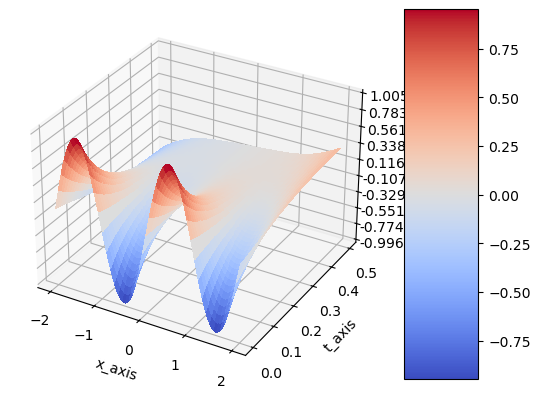

In [53]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.5, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.6]$
- training with iteration 20000

In [54]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.6, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0002)
1 Training Loss: tensor(0.0001)
2 Training Loss: tensor(0.0002)
3 Training Loss: tensor(0.0001)
4 Training Loss: tensor(0.0003)
5 Training Loss: tensor(0.0002)
6 Training Loss: tensor(0.0001)
7 Training Loss: tensor(0.0001)
8 Training Loss: tensor(0.0002)
9 Training Loss: tensor(0.0001)
10 Training Loss: tensor(0.0002)
11 Training Loss: tensor(8.2040e-05)
12 Training Loss: tensor(0.0002)
13 Training Loss: tensor(8.9003e-05)
14 Training Loss: tensor(0.0001)
15 Training Loss: tensor(0.0001)
16 Training Loss: tensor(9.5132e-05)
17 Training Loss: tensor(0.0001)
18 Training Loss: tensor(0.0001)
19 Training Loss: tensor(6.3360e-05)
20 Training Loss: tensor(0.0001)
21 Training Loss: tensor(0.0001)
22 Training Loss: tensor(0.0002)
23 Training Loss: tensor(0.0002)
24 Training Loss: tensor(0.0001)
25 Training Loss: tensor(0.0002)
26 Training Loss: tensor(6.4344e-05)
27 Training Loss: tensor(0.0001)
28 Training Loss: tensor(9.9837e-05)
29 Training Loss: tensor(9.84

232 Training Loss: tensor(0.0014)
233 Training Loss: tensor(0.0014)
234 Training Loss: tensor(0.0012)
235 Training Loss: tensor(0.0006)
236 Training Loss: tensor(0.0003)
237 Training Loss: tensor(0.0006)
238 Training Loss: tensor(0.0011)
239 Training Loss: tensor(0.0025)
240 Training Loss: tensor(0.0033)
241 Training Loss: tensor(0.0030)
242 Training Loss: tensor(0.0015)
243 Training Loss: tensor(0.0004)
244 Training Loss: tensor(0.0012)
245 Training Loss: tensor(0.0025)
246 Training Loss: tensor(0.0035)
247 Training Loss: tensor(0.0024)
248 Training Loss: tensor(0.0013)
249 Training Loss: tensor(0.0005)
250 Training Loss: tensor(0.0018)
251 Training Loss: tensor(0.0023)
252 Training Loss: tensor(0.0031)
253 Training Loss: tensor(0.0019)
254 Training Loss: tensor(0.0015)
255 Training Loss: tensor(0.0007)
256 Training Loss: tensor(0.0022)
257 Training Loss: tensor(0.0016)
258 Training Loss: tensor(0.0014)
259 Training Loss: tensor(0.0010)
260 Training Loss: tensor(0.0031)
261 Training L

476 Training Loss: tensor(0.0012)
477 Training Loss: tensor(0.0021)
478 Training Loss: tensor(0.0007)
479 Training Loss: tensor(0.0019)
480 Training Loss: tensor(0.0012)
481 Training Loss: tensor(0.0018)
482 Training Loss: tensor(0.0020)
483 Training Loss: tensor(0.0015)
484 Training Loss: tensor(0.0023)
485 Training Loss: tensor(0.0017)
486 Training Loss: tensor(0.0030)
487 Training Loss: tensor(0.0014)
488 Training Loss: tensor(0.0032)
489 Training Loss: tensor(0.0008)
490 Training Loss: tensor(0.0021)
491 Training Loss: tensor(0.0015)
492 Training Loss: tensor(0.0019)
493 Training Loss: tensor(0.0013)
494 Training Loss: tensor(0.0012)
495 Training Loss: tensor(0.0010)
496 Training Loss: tensor(0.0010)
497 Training Loss: tensor(0.0007)
498 Training Loss: tensor(0.0009)
499 Training Loss: tensor(0.0007)
500 Training Loss: tensor(0.0006)
501 Training Loss: tensor(0.0009)
502 Training Loss: tensor(0.0008)
503 Training Loss: tensor(0.0010)
504 Training Loss: tensor(0.0006)
505 Training L

717 Training Loss: tensor(0.0002)
718 Training Loss: tensor(0.0001)
719 Training Loss: tensor(9.8405e-05)
720 Training Loss: tensor(0.0001)
721 Training Loss: tensor(5.6572e-05)
722 Training Loss: tensor(0.0001)
723 Training Loss: tensor(9.2432e-05)
724 Training Loss: tensor(0.0001)
725 Training Loss: tensor(6.8347e-05)
726 Training Loss: tensor(6.8849e-05)
727 Training Loss: tensor(0.0001)
728 Training Loss: tensor(0.0001)
729 Training Loss: tensor(0.0001)
730 Training Loss: tensor(9.1227e-05)
731 Training Loss: tensor(6.2789e-05)
732 Training Loss: tensor(7.2209e-05)
733 Training Loss: tensor(6.2266e-05)
734 Training Loss: tensor(9.7505e-05)
735 Training Loss: tensor(6.7867e-05)
736 Training Loss: tensor(4.3740e-05)
737 Training Loss: tensor(7.6810e-05)
738 Training Loss: tensor(8.4611e-05)
739 Training Loss: tensor(0.0001)
740 Training Loss: tensor(0.0001)
741 Training Loss: tensor(6.7514e-05)
742 Training Loss: tensor(8.2854e-05)
743 Training Loss: tensor(5.8634e-05)
744 Training L

953 Training Loss: tensor(0.0014)
954 Training Loss: tensor(0.0013)
955 Training Loss: tensor(0.0008)
956 Training Loss: tensor(0.0007)
957 Training Loss: tensor(0.0008)
958 Training Loss: tensor(0.0010)
959 Training Loss: tensor(0.0005)
960 Training Loss: tensor(0.0005)
961 Training Loss: tensor(0.0005)
962 Training Loss: tensor(0.0008)
963 Training Loss: tensor(0.0005)
964 Training Loss: tensor(0.0008)
965 Training Loss: tensor(0.0004)
966 Training Loss: tensor(0.0011)
967 Training Loss: tensor(0.0005)
968 Training Loss: tensor(0.0008)
969 Training Loss: tensor(0.0004)
970 Training Loss: tensor(0.0006)
971 Training Loss: tensor(0.0005)
972 Training Loss: tensor(0.0009)
973 Training Loss: tensor(0.0005)
974 Training Loss: tensor(0.0016)
975 Training Loss: tensor(0.0005)
976 Training Loss: tensor(0.0012)
977 Training Loss: tensor(0.0011)
978 Training Loss: tensor(0.0006)
979 Training Loss: tensor(0.0006)
980 Training Loss: tensor(0.0007)
981 Training Loss: tensor(0.0010)
982 Training L

1191 Training Loss: tensor(0.0001)
1192 Training Loss: tensor(0.0001)
1193 Training Loss: tensor(0.0002)
1194 Training Loss: tensor(0.0001)
1195 Training Loss: tensor(0.0002)
1196 Training Loss: tensor(0.0001)
1197 Training Loss: tensor(0.0002)
1198 Training Loss: tensor(6.7737e-05)
1199 Training Loss: tensor(0.0002)
1200 Training Loss: tensor(0.0001)
1201 Training Loss: tensor(0.0002)
1202 Training Loss: tensor(0.0001)
1203 Training Loss: tensor(0.0002)
1204 Training Loss: tensor(0.0001)
1205 Training Loss: tensor(0.0001)
1206 Training Loss: tensor(0.0002)
1207 Training Loss: tensor(0.0001)
1208 Training Loss: tensor(0.0003)
1209 Training Loss: tensor(0.0001)
1210 Training Loss: tensor(0.0002)
1211 Training Loss: tensor(0.0001)
1212 Training Loss: tensor(0.0002)
1213 Training Loss: tensor(7.4133e-05)
1214 Training Loss: tensor(8.0311e-05)
1215 Training Loss: tensor(0.0001)
1216 Training Loss: tensor(0.0001)
1217 Training Loss: tensor(0.0002)
1218 Training Loss: tensor(8.6461e-05)
1219

1415 Training Loss: tensor(5.0550e-05)
1416 Training Loss: tensor(0.0001)
1417 Training Loss: tensor(0.0002)
1418 Training Loss: tensor(0.0003)
1419 Training Loss: tensor(0.0002)
1420 Training Loss: tensor(0.0002)
1421 Training Loss: tensor(0.0003)
1422 Training Loss: tensor(0.0003)
1423 Training Loss: tensor(0.0001)
1424 Training Loss: tensor(0.0001)
1425 Training Loss: tensor(0.0001)
1426 Training Loss: tensor(0.0001)
1427 Training Loss: tensor(0.0002)
1428 Training Loss: tensor(0.0001)
1429 Training Loss: tensor(5.8681e-05)
1430 Training Loss: tensor(9.2348e-05)
1431 Training Loss: tensor(0.0001)
1432 Training Loss: tensor(0.0001)
1433 Training Loss: tensor(0.0002)
1434 Training Loss: tensor(9.1500e-05)
1435 Training Loss: tensor(7.0969e-05)
1436 Training Loss: tensor(0.0001)
1437 Training Loss: tensor(4.0565e-05)
1438 Training Loss: tensor(0.0001)
1439 Training Loss: tensor(0.0001)
1440 Training Loss: tensor(0.0001)
1441 Training Loss: tensor(9.5797e-05)
1442 Training Loss: tensor(

1642 Training Loss: tensor(6.6957e-05)
1643 Training Loss: tensor(0.0002)
1644 Training Loss: tensor(0.0002)
1645 Training Loss: tensor(0.0004)
1646 Training Loss: tensor(0.0007)
1647 Training Loss: tensor(0.0010)
1648 Training Loss: tensor(0.0017)
1649 Training Loss: tensor(0.0019)
1650 Training Loss: tensor(0.0017)
1651 Training Loss: tensor(0.0007)
1652 Training Loss: tensor(0.0002)
1653 Training Loss: tensor(0.0006)
1654 Training Loss: tensor(0.0011)
1655 Training Loss: tensor(0.0014)
1656 Training Loss: tensor(0.0011)
1657 Training Loss: tensor(0.0007)
1658 Training Loss: tensor(0.0009)
1659 Training Loss: tensor(0.0011)
1660 Training Loss: tensor(0.0031)
1661 Training Loss: tensor(0.0031)
1662 Training Loss: tensor(0.0025)
1663 Training Loss: tensor(0.0011)
1664 Training Loss: tensor(0.0008)
1665 Training Loss: tensor(0.0021)
1666 Training Loss: tensor(0.0036)
1667 Training Loss: tensor(0.0041)
1668 Training Loss: tensor(0.0021)
1669 Training Loss: tensor(0.0011)
1670 Training Lo

1876 Training Loss: tensor(0.0005)
1877 Training Loss: tensor(0.0005)
1878 Training Loss: tensor(0.0003)
1879 Training Loss: tensor(0.0003)
1880 Training Loss: tensor(0.0004)
1881 Training Loss: tensor(0.0005)
1882 Training Loss: tensor(0.0004)
1883 Training Loss: tensor(0.0001)
1884 Training Loss: tensor(0.0002)
1885 Training Loss: tensor(0.0004)
1886 Training Loss: tensor(0.0003)
1887 Training Loss: tensor(0.0004)
1888 Training Loss: tensor(0.0003)
1889 Training Loss: tensor(0.0001)
1890 Training Loss: tensor(0.0001)
1891 Training Loss: tensor(0.0001)
1892 Training Loss: tensor(0.0002)
1893 Training Loss: tensor(0.0002)
1894 Training Loss: tensor(0.0001)
1895 Training Loss: tensor(0.0001)
1896 Training Loss: tensor(5.8681e-05)
1897 Training Loss: tensor(8.7921e-05)
1898 Training Loss: tensor(0.0001)
1899 Training Loss: tensor(0.0001)
1900 Training Loss: tensor(0.0002)
1901 Training Loss: tensor(0.0001)
1902 Training Loss: tensor(8.8536e-05)
1903 Training Loss: tensor(0.0001)
1904 Tra

2106 Training Loss: tensor(0.0002)
2107 Training Loss: tensor(0.0001)
2108 Training Loss: tensor(0.0002)
2109 Training Loss: tensor(8.7578e-05)
2110 Training Loss: tensor(9.3534e-05)
2111 Training Loss: tensor(0.0001)
2112 Training Loss: tensor(0.0001)
2113 Training Loss: tensor(9.3626e-05)
2114 Training Loss: tensor(0.0001)
2115 Training Loss: tensor(0.0001)
2116 Training Loss: tensor(0.0002)
2117 Training Loss: tensor(0.0001)
2118 Training Loss: tensor(0.0002)
2119 Training Loss: tensor(8.0305e-05)
2120 Training Loss: tensor(0.0001)
2121 Training Loss: tensor(0.0002)
2122 Training Loss: tensor(0.0002)
2123 Training Loss: tensor(6.8534e-05)
2124 Training Loss: tensor(8.7872e-05)
2125 Training Loss: tensor(6.7668e-05)
2126 Training Loss: tensor(0.0001)
2127 Training Loss: tensor(0.0001)
2128 Training Loss: tensor(0.0002)
2129 Training Loss: tensor(0.0001)
2130 Training Loss: tensor(0.0001)
2131 Training Loss: tensor(6.0765e-05)
2132 Training Loss: tensor(0.0001)
2133 Training Loss: ten

2344 Training Loss: tensor(0.0003)
2345 Training Loss: tensor(0.0002)
2346 Training Loss: tensor(0.0002)
2347 Training Loss: tensor(0.0002)
2348 Training Loss: tensor(0.0001)
2349 Training Loss: tensor(0.0003)
2350 Training Loss: tensor(0.0001)
2351 Training Loss: tensor(0.0002)
2352 Training Loss: tensor(0.0001)
2353 Training Loss: tensor(8.9510e-05)
2354 Training Loss: tensor(0.0002)
2355 Training Loss: tensor(0.0002)
2356 Training Loss: tensor(7.0832e-05)
2357 Training Loss: tensor(0.0002)
2358 Training Loss: tensor(5.2078e-05)
2359 Training Loss: tensor(0.0001)
2360 Training Loss: tensor(9.4503e-05)
2361 Training Loss: tensor(8.3177e-05)
2362 Training Loss: tensor(0.0001)
2363 Training Loss: tensor(8.2361e-05)
2364 Training Loss: tensor(0.0002)
2365 Training Loss: tensor(0.0001)
2366 Training Loss: tensor(0.0004)
2367 Training Loss: tensor(0.0002)
2368 Training Loss: tensor(0.0003)
2369 Training Loss: tensor(0.0002)
2370 Training Loss: tensor(0.0005)
2371 Training Loss: tensor(0.00

2577 Training Loss: tensor(0.0002)
2578 Training Loss: tensor(0.0002)
2579 Training Loss: tensor(0.0004)
2580 Training Loss: tensor(0.0005)
2581 Training Loss: tensor(0.0003)
2582 Training Loss: tensor(0.0003)
2583 Training Loss: tensor(0.0003)
2584 Training Loss: tensor(0.0004)
2585 Training Loss: tensor(0.0003)
2586 Training Loss: tensor(0.0003)
2587 Training Loss: tensor(0.0004)
2588 Training Loss: tensor(0.0002)
2589 Training Loss: tensor(0.0005)
2590 Training Loss: tensor(0.0003)
2591 Training Loss: tensor(0.0003)
2592 Training Loss: tensor(0.0002)
2593 Training Loss: tensor(0.0002)
2594 Training Loss: tensor(0.0002)
2595 Training Loss: tensor(0.0002)
2596 Training Loss: tensor(0.0001)
2597 Training Loss: tensor(0.0001)
2598 Training Loss: tensor(0.0002)
2599 Training Loss: tensor(0.0002)
2600 Training Loss: tensor(0.0002)
2601 Training Loss: tensor(0.0001)
2602 Training Loss: tensor(0.0001)
2603 Training Loss: tensor(0.0002)
2604 Training Loss: tensor(0.0001)
2605 Training Loss: 

2810 Training Loss: tensor(0.0004)
2811 Training Loss: tensor(0.0002)
2812 Training Loss: tensor(0.0003)
2813 Training Loss: tensor(0.0003)
2814 Training Loss: tensor(0.0003)
2815 Training Loss: tensor(0.0004)
2816 Training Loss: tensor(0.0004)
2817 Training Loss: tensor(0.0004)
2818 Training Loss: tensor(0.0003)
2819 Training Loss: tensor(0.0002)
2820 Training Loss: tensor(0.0003)
2821 Training Loss: tensor(0.0001)
2822 Training Loss: tensor(0.0003)
2823 Training Loss: tensor(0.0002)
2824 Training Loss: tensor(0.0001)
2825 Training Loss: tensor(0.0004)
2826 Training Loss: tensor(0.0002)
2827 Training Loss: tensor(0.0003)
2828 Training Loss: tensor(0.0001)
2829 Training Loss: tensor(0.0003)
2830 Training Loss: tensor(0.0003)
2831 Training Loss: tensor(0.0001)
2832 Training Loss: tensor(0.0002)
2833 Training Loss: tensor(0.0001)
2834 Training Loss: tensor(0.0001)
2835 Training Loss: tensor(0.0001)
2836 Training Loss: tensor(8.9443e-05)
2837 Training Loss: tensor(0.0001)
2838 Training Lo

3041 Training Loss: tensor(9.0988e-05)
3042 Training Loss: tensor(4.8063e-05)
3043 Training Loss: tensor(7.4256e-05)
3044 Training Loss: tensor(5.3290e-05)
3045 Training Loss: tensor(5.1360e-05)
3046 Training Loss: tensor(4.4151e-05)
3047 Training Loss: tensor(4.4346e-05)
3048 Training Loss: tensor(4.7407e-05)
3049 Training Loss: tensor(5.4542e-05)
3050 Training Loss: tensor(5.3528e-05)
3051 Training Loss: tensor(5.3837e-05)
3052 Training Loss: tensor(5.7040e-05)
3053 Training Loss: tensor(4.6617e-05)
3054 Training Loss: tensor(6.1779e-05)
3055 Training Loss: tensor(4.2981e-05)
3056 Training Loss: tensor(3.9787e-05)
3057 Training Loss: tensor(5.6085e-05)
3058 Training Loss: tensor(6.6599e-05)
3059 Training Loss: tensor(5.5254e-05)
3060 Training Loss: tensor(6.1743e-05)
3061 Training Loss: tensor(6.4365e-05)
3062 Training Loss: tensor(7.3526e-05)
3063 Training Loss: tensor(4.5374e-05)
3064 Training Loss: tensor(5.1805e-05)
3065 Training Loss: tensor(7.4610e-05)
3066 Training Loss: tenso

3273 Training Loss: tensor(0.0017)
3274 Training Loss: tensor(0.0020)
3275 Training Loss: tensor(0.0012)
3276 Training Loss: tensor(0.0002)
3277 Training Loss: tensor(0.0009)
3278 Training Loss: tensor(0.0020)
3279 Training Loss: tensor(0.0024)
3280 Training Loss: tensor(0.0011)
3281 Training Loss: tensor(0.0004)
3282 Training Loss: tensor(0.0009)
3283 Training Loss: tensor(0.0019)
3284 Training Loss: tensor(0.0017)
3285 Training Loss: tensor(0.0009)
3286 Training Loss: tensor(0.0002)
3287 Training Loss: tensor(0.0013)
3288 Training Loss: tensor(0.0011)
3289 Training Loss: tensor(0.0006)
3290 Training Loss: tensor(0.0004)
3291 Training Loss: tensor(0.0008)
3292 Training Loss: tensor(0.0010)
3293 Training Loss: tensor(0.0011)
3294 Training Loss: tensor(0.0003)
3295 Training Loss: tensor(0.0007)
3296 Training Loss: tensor(0.0005)
3297 Training Loss: tensor(0.0009)
3298 Training Loss: tensor(0.0004)
3299 Training Loss: tensor(0.0008)
3300 Training Loss: tensor(0.0012)
3301 Training Loss: 

3509 Training Loss: tensor(0.0002)
3510 Training Loss: tensor(0.0001)
3511 Training Loss: tensor(9.8583e-05)
3512 Training Loss: tensor(0.0002)
3513 Training Loss: tensor(0.0002)
3514 Training Loss: tensor(0.0003)
3515 Training Loss: tensor(0.0002)
3516 Training Loss: tensor(0.0001)
3517 Training Loss: tensor(0.0003)
3518 Training Loss: tensor(0.0002)
3519 Training Loss: tensor(0.0001)
3520 Training Loss: tensor(0.0002)
3521 Training Loss: tensor(0.0002)
3522 Training Loss: tensor(0.0001)
3523 Training Loss: tensor(9.3756e-05)
3524 Training Loss: tensor(0.0002)
3525 Training Loss: tensor(0.0002)
3526 Training Loss: tensor(0.0002)
3527 Training Loss: tensor(7.9847e-05)
3528 Training Loss: tensor(0.0001)
3529 Training Loss: tensor(0.0001)
3530 Training Loss: tensor(0.0001)
3531 Training Loss: tensor(8.0017e-05)
3532 Training Loss: tensor(0.0001)
3533 Training Loss: tensor(4.9329e-05)
3534 Training Loss: tensor(7.2516e-05)
3535 Training Loss: tensor(6.3610e-05)
3536 Training Loss: tensor(

3745 Training Loss: tensor(0.0003)
3746 Training Loss: tensor(0.0001)
3747 Training Loss: tensor(0.0002)
3748 Training Loss: tensor(0.0002)
3749 Training Loss: tensor(0.0002)
3750 Training Loss: tensor(0.0002)
3751 Training Loss: tensor(0.0004)
3752 Training Loss: tensor(0.0003)
3753 Training Loss: tensor(0.0002)
3754 Training Loss: tensor(0.0003)
3755 Training Loss: tensor(0.0003)
3756 Training Loss: tensor(0.0003)
3757 Training Loss: tensor(0.0003)
3758 Training Loss: tensor(0.0002)
3759 Training Loss: tensor(0.0002)
3760 Training Loss: tensor(0.0002)
3761 Training Loss: tensor(9.1675e-05)
3762 Training Loss: tensor(0.0002)
3763 Training Loss: tensor(0.0001)
3764 Training Loss: tensor(0.0002)
3765 Training Loss: tensor(0.0001)
3766 Training Loss: tensor(0.0002)
3767 Training Loss: tensor(0.0002)
3768 Training Loss: tensor(0.0002)
3769 Training Loss: tensor(0.0001)
3770 Training Loss: tensor(0.0002)
3771 Training Loss: tensor(0.0002)
3772 Training Loss: tensor(7.7946e-05)
3773 Trainin

3978 Training Loss: tensor(0.0001)
3979 Training Loss: tensor(0.0003)
3980 Training Loss: tensor(0.0002)
3981 Training Loss: tensor(0.0003)
3982 Training Loss: tensor(0.0002)
3983 Training Loss: tensor(0.0001)
3984 Training Loss: tensor(0.0002)
3985 Training Loss: tensor(0.0002)
3986 Training Loss: tensor(0.0003)
3987 Training Loss: tensor(0.0003)
3988 Training Loss: tensor(0.0006)
3989 Training Loss: tensor(0.0004)
3990 Training Loss: tensor(0.0005)
3991 Training Loss: tensor(0.0002)
3992 Training Loss: tensor(0.0008)
3993 Training Loss: tensor(0.0006)
3994 Training Loss: tensor(0.0013)
3995 Training Loss: tensor(0.0006)
3996 Training Loss: tensor(0.0008)
3997 Training Loss: tensor(0.0003)
3998 Training Loss: tensor(0.0004)
3999 Training Loss: tensor(0.0003)
4000 Training Loss: tensor(0.0005)
4001 Training Loss: tensor(0.0004)
4002 Training Loss: tensor(0.0005)
4003 Training Loss: tensor(0.0003)
4004 Training Loss: tensor(0.0003)
4005 Training Loss: tensor(0.0002)
4006 Training Loss: 

4210 Training Loss: tensor(0.0002)
4211 Training Loss: tensor(0.0001)
4212 Training Loss: tensor(0.0002)
4213 Training Loss: tensor(0.0003)
4214 Training Loss: tensor(0.0003)
4215 Training Loss: tensor(0.0003)
4216 Training Loss: tensor(0.0002)
4217 Training Loss: tensor(0.0001)
4218 Training Loss: tensor(0.0001)
4219 Training Loss: tensor(0.0003)
4220 Training Loss: tensor(0.0004)
4221 Training Loss: tensor(0.0003)
4222 Training Loss: tensor(0.0002)
4223 Training Loss: tensor(9.8949e-05)
4224 Training Loss: tensor(0.0003)
4225 Training Loss: tensor(0.0004)
4226 Training Loss: tensor(0.0008)
4227 Training Loss: tensor(0.0012)
4228 Training Loss: tensor(0.0013)
4229 Training Loss: tensor(0.0007)
4230 Training Loss: tensor(0.0002)
4231 Training Loss: tensor(0.0004)
4232 Training Loss: tensor(0.0004)
4233 Training Loss: tensor(0.0013)
4234 Training Loss: tensor(0.0013)
4235 Training Loss: tensor(0.0015)
4236 Training Loss: tensor(0.0007)
4237 Training Loss: tensor(0.0004)
4238 Training Lo

4442 Training Loss: tensor(0.0001)
4443 Training Loss: tensor(7.9957e-05)
4444 Training Loss: tensor(8.9137e-05)
4445 Training Loss: tensor(0.0001)
4446 Training Loss: tensor(0.0002)
4447 Training Loss: tensor(0.0002)
4448 Training Loss: tensor(0.0002)
4449 Training Loss: tensor(6.9465e-05)
4450 Training Loss: tensor(0.0001)
4451 Training Loss: tensor(0.0002)
4452 Training Loss: tensor(0.0003)
4453 Training Loss: tensor(0.0002)
4454 Training Loss: tensor(0.0002)
4455 Training Loss: tensor(7.2215e-05)
4456 Training Loss: tensor(0.0002)
4457 Training Loss: tensor(0.0003)
4458 Training Loss: tensor(0.0004)
4459 Training Loss: tensor(0.0003)
4460 Training Loss: tensor(0.0001)
4461 Training Loss: tensor(0.0002)
4462 Training Loss: tensor(0.0001)
4463 Training Loss: tensor(0.0001)
4464 Training Loss: tensor(0.0001)
4465 Training Loss: tensor(9.2588e-05)
4466 Training Loss: tensor(0.0001)
4467 Training Loss: tensor(0.0001)
4468 Training Loss: tensor(0.0002)
4469 Training Loss: tensor(0.0001)


4678 Training Loss: tensor(0.0006)
4679 Training Loss: tensor(0.0003)
4680 Training Loss: tensor(0.0004)
4681 Training Loss: tensor(0.0003)
4682 Training Loss: tensor(0.0006)
4683 Training Loss: tensor(0.0003)
4684 Training Loss: tensor(0.0006)
4685 Training Loss: tensor(0.0003)
4686 Training Loss: tensor(0.0005)
4687 Training Loss: tensor(0.0003)
4688 Training Loss: tensor(0.0004)
4689 Training Loss: tensor(0.0003)
4690 Training Loss: tensor(0.0005)
4691 Training Loss: tensor(0.0008)
4692 Training Loss: tensor(0.0013)
4693 Training Loss: tensor(0.0022)
4694 Training Loss: tensor(0.0036)
4695 Training Loss: tensor(0.0051)
4696 Training Loss: tensor(0.0045)
4697 Training Loss: tensor(0.0020)
4698 Training Loss: tensor(0.0006)
4699 Training Loss: tensor(0.0024)
4700 Training Loss: tensor(0.0029)
4701 Training Loss: tensor(0.0023)
4702 Training Loss: tensor(0.0007)
4703 Training Loss: tensor(0.0003)
4704 Training Loss: tensor(0.0008)
4705 Training Loss: tensor(0.0011)
4706 Training Loss: 

4909 Training Loss: tensor(0.0004)
4910 Training Loss: tensor(0.0005)
4911 Training Loss: tensor(0.0005)
4912 Training Loss: tensor(0.0004)
4913 Training Loss: tensor(0.0002)
4914 Training Loss: tensor(0.0001)
4915 Training Loss: tensor(0.0002)
4916 Training Loss: tensor(0.0004)
4917 Training Loss: tensor(0.0004)
4918 Training Loss: tensor(0.0004)
4919 Training Loss: tensor(0.0002)
4920 Training Loss: tensor(0.0002)
4921 Training Loss: tensor(0.0001)
4922 Training Loss: tensor(0.0004)
4923 Training Loss: tensor(0.0004)
4924 Training Loss: tensor(0.0001)
4925 Training Loss: tensor(0.0004)
4926 Training Loss: tensor(0.0002)
4927 Training Loss: tensor(0.0002)
4928 Training Loss: tensor(0.0001)
4929 Training Loss: tensor(0.0001)
4930 Training Loss: tensor(0.0002)
4931 Training Loss: tensor(0.0002)
4932 Training Loss: tensor(0.0002)
4933 Training Loss: tensor(0.0002)
4934 Training Loss: tensor(0.0001)
4935 Training Loss: tensor(0.0001)
4936 Training Loss: tensor(0.0001)
4937 Training Loss: 

5145 Training Loss: tensor(4.7342e-05)
5146 Training Loss: tensor(9.0986e-05)
5147 Training Loss: tensor(8.8203e-05)
5148 Training Loss: tensor(7.4324e-05)
5149 Training Loss: tensor(6.5174e-05)
5150 Training Loss: tensor(6.4690e-05)
5151 Training Loss: tensor(5.6862e-05)
5152 Training Loss: tensor(6.8506e-05)
5153 Training Loss: tensor(7.1578e-05)
5154 Training Loss: tensor(0.0001)
5155 Training Loss: tensor(0.0001)
5156 Training Loss: tensor(9.0138e-05)
5157 Training Loss: tensor(7.1881e-05)
5158 Training Loss: tensor(4.2868e-05)
5159 Training Loss: tensor(4.8398e-05)
5160 Training Loss: tensor(4.8942e-05)
5161 Training Loss: tensor(3.2564e-05)
5162 Training Loss: tensor(3.6953e-05)
5163 Training Loss: tensor(3.4571e-05)
5164 Training Loss: tensor(4.1421e-05)
5165 Training Loss: tensor(3.9039e-05)
5166 Training Loss: tensor(5.9940e-05)
5167 Training Loss: tensor(2.9883e-05)
5168 Training Loss: tensor(4.3966e-05)
5169 Training Loss: tensor(5.0755e-05)
5170 Training Loss: tensor(5.6573

5374 Training Loss: tensor(0.0001)
5375 Training Loss: tensor(8.1164e-05)
5376 Training Loss: tensor(7.3892e-05)
5377 Training Loss: tensor(4.4575e-05)
5378 Training Loss: tensor(8.3657e-05)
5379 Training Loss: tensor(4.9587e-05)
5380 Training Loss: tensor(5.3379e-05)
5381 Training Loss: tensor(7.0812e-05)
5382 Training Loss: tensor(7.6971e-05)
5383 Training Loss: tensor(3.1997e-05)
5384 Training Loss: tensor(9.5323e-05)
5385 Training Loss: tensor(6.5528e-05)
5386 Training Loss: tensor(8.6235e-05)
5387 Training Loss: tensor(9.2097e-05)
5388 Training Loss: tensor(0.0001)
5389 Training Loss: tensor(9.8131e-05)
5390 Training Loss: tensor(3.2744e-05)
5391 Training Loss: tensor(0.0001)
5392 Training Loss: tensor(7.3257e-05)
5393 Training Loss: tensor(8.8473e-05)
5394 Training Loss: tensor(7.0871e-05)
5395 Training Loss: tensor(0.0001)
5396 Training Loss: tensor(0.0002)
5397 Training Loss: tensor(0.0002)
5398 Training Loss: tensor(0.0002)
5399 Training Loss: tensor(7.4755e-05)
5400 Training 

5605 Training Loss: tensor(0.0002)
5606 Training Loss: tensor(0.0002)
5607 Training Loss: tensor(4.2909e-05)
5608 Training Loss: tensor(0.0002)
5609 Training Loss: tensor(0.0002)
5610 Training Loss: tensor(0.0001)
5611 Training Loss: tensor(0.0002)
5612 Training Loss: tensor(0.0001)
5613 Training Loss: tensor(0.0001)
5614 Training Loss: tensor(9.9533e-05)
5615 Training Loss: tensor(0.0001)
5616 Training Loss: tensor(0.0001)
5617 Training Loss: tensor(8.0934e-05)
5618 Training Loss: tensor(0.0001)
5619 Training Loss: tensor(0.0001)
5620 Training Loss: tensor(0.0001)
5621 Training Loss: tensor(9.4305e-05)
5622 Training Loss: tensor(7.2014e-05)
5623 Training Loss: tensor(0.0001)
5624 Training Loss: tensor(6.3140e-05)
5625 Training Loss: tensor(0.0001)
5626 Training Loss: tensor(9.8807e-05)
5627 Training Loss: tensor(8.0476e-05)
5628 Training Loss: tensor(0.0001)
5629 Training Loss: tensor(7.6207e-05)
5630 Training Loss: tensor(0.0001)
5631 Training Loss: tensor(6.9668e-05)
5632 Training L

5841 Training Loss: tensor(0.0001)
5842 Training Loss: tensor(0.0002)
5843 Training Loss: tensor(0.0004)
5844 Training Loss: tensor(0.0004)
5845 Training Loss: tensor(0.0002)
5846 Training Loss: tensor(0.0001)
5847 Training Loss: tensor(0.0002)
5848 Training Loss: tensor(0.0002)
5849 Training Loss: tensor(0.0003)
5850 Training Loss: tensor(0.0002)
5851 Training Loss: tensor(0.0002)
5852 Training Loss: tensor(0.0003)
5853 Training Loss: tensor(0.0003)
5854 Training Loss: tensor(0.0001)
5855 Training Loss: tensor(0.0001)
5856 Training Loss: tensor(0.0002)
5857 Training Loss: tensor(0.0002)
5858 Training Loss: tensor(0.0002)
5859 Training Loss: tensor(0.0001)
5860 Training Loss: tensor(0.0002)
5861 Training Loss: tensor(0.0003)
5862 Training Loss: tensor(0.0002)
5863 Training Loss: tensor(0.0002)
5864 Training Loss: tensor(0.0002)
5865 Training Loss: tensor(0.0002)
5866 Training Loss: tensor(0.0002)
5867 Training Loss: tensor(0.0002)
5868 Training Loss: tensor(0.0001)
5869 Training Loss: 

6078 Training Loss: tensor(0.0002)
6079 Training Loss: tensor(0.0002)
6080 Training Loss: tensor(0.0002)
6081 Training Loss: tensor(0.0002)
6082 Training Loss: tensor(0.0002)
6083 Training Loss: tensor(0.0002)
6084 Training Loss: tensor(7.9142e-05)
6085 Training Loss: tensor(0.0002)
6086 Training Loss: tensor(0.0002)
6087 Training Loss: tensor(0.0003)
6088 Training Loss: tensor(0.0003)
6089 Training Loss: tensor(0.0002)
6090 Training Loss: tensor(0.0002)
6091 Training Loss: tensor(0.0002)
6092 Training Loss: tensor(0.0001)
6093 Training Loss: tensor(0.0002)
6094 Training Loss: tensor(0.0002)
6095 Training Loss: tensor(0.0001)
6096 Training Loss: tensor(9.5389e-05)
6097 Training Loss: tensor(0.0001)
6098 Training Loss: tensor(9.4640e-05)
6099 Training Loss: tensor(0.0002)
6100 Training Loss: tensor(0.0003)
6101 Training Loss: tensor(0.0003)
6102 Training Loss: tensor(0.0004)
6103 Training Loss: tensor(0.0001)
6104 Training Loss: tensor(0.0001)
6105 Training Loss: tensor(0.0002)
6106 Tra

6314 Training Loss: tensor(0.0010)
6315 Training Loss: tensor(0.0006)
6316 Training Loss: tensor(0.0011)
6317 Training Loss: tensor(0.0006)
6318 Training Loss: tensor(0.0010)
6319 Training Loss: tensor(0.0005)
6320 Training Loss: tensor(0.0010)
6321 Training Loss: tensor(0.0004)
6322 Training Loss: tensor(0.0014)
6323 Training Loss: tensor(0.0007)
6324 Training Loss: tensor(0.0008)
6325 Training Loss: tensor(0.0004)
6326 Training Loss: tensor(0.0006)
6327 Training Loss: tensor(0.0003)
6328 Training Loss: tensor(0.0004)
6329 Training Loss: tensor(0.0002)
6330 Training Loss: tensor(0.0004)
6331 Training Loss: tensor(0.0003)
6332 Training Loss: tensor(0.0006)
6333 Training Loss: tensor(0.0003)
6334 Training Loss: tensor(0.0004)
6335 Training Loss: tensor(0.0003)
6336 Training Loss: tensor(0.0003)
6337 Training Loss: tensor(0.0002)
6338 Training Loss: tensor(0.0003)
6339 Training Loss: tensor(0.0003)
6340 Training Loss: tensor(0.0003)
6341 Training Loss: tensor(0.0003)
6342 Training Loss: 

6550 Training Loss: tensor(0.0003)
6551 Training Loss: tensor(0.0002)
6552 Training Loss: tensor(9.8328e-05)
6553 Training Loss: tensor(0.0002)
6554 Training Loss: tensor(0.0003)
6555 Training Loss: tensor(0.0002)
6556 Training Loss: tensor(0.0001)
6557 Training Loss: tensor(0.0002)
6558 Training Loss: tensor(0.0002)
6559 Training Loss: tensor(0.0001)
6560 Training Loss: tensor(0.0002)
6561 Training Loss: tensor(9.0341e-05)
6562 Training Loss: tensor(0.0002)
6563 Training Loss: tensor(0.0003)
6564 Training Loss: tensor(0.0002)
6565 Training Loss: tensor(0.0001)
6566 Training Loss: tensor(0.0001)
6567 Training Loss: tensor(9.7660e-05)
6568 Training Loss: tensor(0.0002)
6569 Training Loss: tensor(0.0001)
6570 Training Loss: tensor(0.0002)
6571 Training Loss: tensor(0.0002)
6572 Training Loss: tensor(0.0002)
6573 Training Loss: tensor(0.0001)
6574 Training Loss: tensor(0.0001)
6575 Training Loss: tensor(0.0003)
6576 Training Loss: tensor(0.0002)
6577 Training Loss: tensor(0.0001)
6578 Tra

6785 Training Loss: tensor(0.0007)
6786 Training Loss: tensor(0.0005)
6787 Training Loss: tensor(0.0003)
6788 Training Loss: tensor(0.0006)
6789 Training Loss: tensor(0.0005)
6790 Training Loss: tensor(0.0002)
6791 Training Loss: tensor(0.0005)
6792 Training Loss: tensor(0.0008)
6793 Training Loss: tensor(0.0007)
6794 Training Loss: tensor(0.0003)
6795 Training Loss: tensor(0.0003)
6796 Training Loss: tensor(0.0005)
6797 Training Loss: tensor(0.0003)
6798 Training Loss: tensor(0.0002)
6799 Training Loss: tensor(0.0004)
6800 Training Loss: tensor(0.0005)
6801 Training Loss: tensor(0.0002)
6802 Training Loss: tensor(0.0001)
6803 Training Loss: tensor(0.0004)
6804 Training Loss: tensor(0.0004)
6805 Training Loss: tensor(0.0002)
6806 Training Loss: tensor(0.0002)
6807 Training Loss: tensor(0.0002)
6808 Training Loss: tensor(0.0002)
6809 Training Loss: tensor(0.0001)
6810 Training Loss: tensor(0.0002)
6811 Training Loss: tensor(0.0002)
6812 Training Loss: tensor(9.1266e-05)
6813 Training Lo

7013 Training Loss: tensor(0.0002)
7014 Training Loss: tensor(0.0001)
7015 Training Loss: tensor(0.0002)
7016 Training Loss: tensor(0.0001)
7017 Training Loss: tensor(0.0003)
7018 Training Loss: tensor(0.0001)
7019 Training Loss: tensor(0.0002)
7020 Training Loss: tensor(0.0002)
7021 Training Loss: tensor(0.0003)
7022 Training Loss: tensor(0.0003)
7023 Training Loss: tensor(0.0004)
7024 Training Loss: tensor(0.0003)
7025 Training Loss: tensor(0.0001)
7026 Training Loss: tensor(0.0002)
7027 Training Loss: tensor(0.0001)
7028 Training Loss: tensor(0.0003)
7029 Training Loss: tensor(0.0003)
7030 Training Loss: tensor(0.0002)
7031 Training Loss: tensor(8.4342e-05)
7032 Training Loss: tensor(0.0001)
7033 Training Loss: tensor(0.0002)
7034 Training Loss: tensor(9.3059e-05)
7035 Training Loss: tensor(8.9829e-05)
7036 Training Loss: tensor(0.0001)
7037 Training Loss: tensor(0.0002)
7038 Training Loss: tensor(0.0004)
7039 Training Loss: tensor(0.0004)
7040 Training Loss: tensor(0.0002)
7041 Tra

7246 Training Loss: tensor(9.9252e-05)
7247 Training Loss: tensor(8.8354e-05)
7248 Training Loss: tensor(0.0002)
7249 Training Loss: tensor(0.0002)
7250 Training Loss: tensor(0.0001)
7251 Training Loss: tensor(0.0003)
7252 Training Loss: tensor(8.8504e-05)
7253 Training Loss: tensor(0.0002)
7254 Training Loss: tensor(0.0001)
7255 Training Loss: tensor(0.0002)
7256 Training Loss: tensor(9.8799e-05)
7257 Training Loss: tensor(0.0001)
7258 Training Loss: tensor(0.0001)
7259 Training Loss: tensor(0.0002)
7260 Training Loss: tensor(0.0002)
7261 Training Loss: tensor(0.0002)
7262 Training Loss: tensor(0.0002)
7263 Training Loss: tensor(0.0001)
7264 Training Loss: tensor(0.0002)
7265 Training Loss: tensor(0.0002)
7266 Training Loss: tensor(0.0004)
7267 Training Loss: tensor(0.0002)
7268 Training Loss: tensor(0.0003)
7269 Training Loss: tensor(0.0001)
7270 Training Loss: tensor(0.0003)
7271 Training Loss: tensor(0.0003)
7272 Training Loss: tensor(0.0003)
7273 Training Loss: tensor(0.0002)
7274

7467 Training Loss: tensor(0.0004)
7468 Training Loss: tensor(0.0004)
7469 Training Loss: tensor(0.0003)
7470 Training Loss: tensor(0.0003)
7471 Training Loss: tensor(0.0002)
7472 Training Loss: tensor(0.0002)
7473 Training Loss: tensor(0.0002)
7474 Training Loss: tensor(0.0004)
7475 Training Loss: tensor(0.0001)
7476 Training Loss: tensor(0.0003)
7477 Training Loss: tensor(0.0001)
7478 Training Loss: tensor(0.0002)
7479 Training Loss: tensor(7.0789e-05)
7480 Training Loss: tensor(0.0001)
7481 Training Loss: tensor(0.0002)
7482 Training Loss: tensor(0.0002)
7483 Training Loss: tensor(0.0003)
7484 Training Loss: tensor(0.0003)
7485 Training Loss: tensor(0.0003)
7486 Training Loss: tensor(0.0002)
7487 Training Loss: tensor(0.0001)
7488 Training Loss: tensor(0.0002)
7489 Training Loss: tensor(0.0001)
7490 Training Loss: tensor(0.0003)
7491 Training Loss: tensor(0.0002)
7492 Training Loss: tensor(0.0003)
7493 Training Loss: tensor(0.0003)
7494 Training Loss: tensor(0.0003)
7495 Training Lo

7706 Training Loss: tensor(0.0009)
7707 Training Loss: tensor(0.0006)
7708 Training Loss: tensor(0.0002)
7709 Training Loss: tensor(0.0007)
7710 Training Loss: tensor(0.0005)
7711 Training Loss: tensor(0.0005)
7712 Training Loss: tensor(0.0006)
7713 Training Loss: tensor(0.0005)
7714 Training Loss: tensor(0.0008)
7715 Training Loss: tensor(0.0006)
7716 Training Loss: tensor(0.0003)
7717 Training Loss: tensor(0.0005)
7718 Training Loss: tensor(0.0002)
7719 Training Loss: tensor(0.0006)
7720 Training Loss: tensor(0.0003)
7721 Training Loss: tensor(0.0006)
7722 Training Loss: tensor(0.0008)
7723 Training Loss: tensor(0.0004)
7724 Training Loss: tensor(0.0005)
7725 Training Loss: tensor(0.0004)
7726 Training Loss: tensor(0.0006)
7727 Training Loss: tensor(0.0016)
7728 Training Loss: tensor(0.0023)
7729 Training Loss: tensor(0.0023)
7730 Training Loss: tensor(0.0008)
7731 Training Loss: tensor(0.0003)
7732 Training Loss: tensor(0.0014)
7733 Training Loss: tensor(0.0011)
7734 Training Loss: 

7943 Training Loss: tensor(0.0001)
7944 Training Loss: tensor(8.4763e-05)
7945 Training Loss: tensor(7.4086e-05)
7946 Training Loss: tensor(0.0001)
7947 Training Loss: tensor(0.0001)
7948 Training Loss: tensor(6.8150e-05)
7949 Training Loss: tensor(7.5312e-05)
7950 Training Loss: tensor(0.0001)
7951 Training Loss: tensor(0.0001)
7952 Training Loss: tensor(0.0001)
7953 Training Loss: tensor(5.5022e-05)
7954 Training Loss: tensor(0.0002)
7955 Training Loss: tensor(0.0001)
7956 Training Loss: tensor(0.0001)
7957 Training Loss: tensor(9.1028e-05)
7958 Training Loss: tensor(0.0002)
7959 Training Loss: tensor(7.3315e-05)
7960 Training Loss: tensor(0.0002)
7961 Training Loss: tensor(0.0001)
7962 Training Loss: tensor(0.0002)
7963 Training Loss: tensor(6.8983e-05)
7964 Training Loss: tensor(0.0001)
7965 Training Loss: tensor(6.0681e-05)
7966 Training Loss: tensor(0.0001)
7967 Training Loss: tensor(8.5810e-05)
7968 Training Loss: tensor(8.7291e-05)
7969 Training Loss: tensor(0.0001)
7970 Traini

8161 Training Loss: tensor(0.0002)
8162 Training Loss: tensor(6.3920e-05)
8163 Training Loss: tensor(0.0001)
8164 Training Loss: tensor(0.0001)
8165 Training Loss: tensor(0.0001)
8166 Training Loss: tensor(0.0001)
8167 Training Loss: tensor(0.0002)
8168 Training Loss: tensor(0.0001)
8169 Training Loss: tensor(0.0001)
8170 Training Loss: tensor(0.0001)
8171 Training Loss: tensor(0.0001)
8172 Training Loss: tensor(0.0001)
8173 Training Loss: tensor(0.0001)
8174 Training Loss: tensor(0.0002)
8175 Training Loss: tensor(0.0001)
8176 Training Loss: tensor(0.0001)
8177 Training Loss: tensor(0.0002)
8178 Training Loss: tensor(0.0002)
8179 Training Loss: tensor(0.0002)
8180 Training Loss: tensor(0.0002)
8181 Training Loss: tensor(0.0002)
8182 Training Loss: tensor(0.0002)
8183 Training Loss: tensor(0.0002)
8184 Training Loss: tensor(0.0002)
8185 Training Loss: tensor(0.0001)
8186 Training Loss: tensor(0.0002)
8187 Training Loss: tensor(0.0001)
8188 Training Loss: tensor(0.0002)
8189 Training Lo

8389 Training Loss: tensor(0.0002)
8390 Training Loss: tensor(0.0002)
8391 Training Loss: tensor(0.0002)
8392 Training Loss: tensor(0.0002)
8393 Training Loss: tensor(0.0002)
8394 Training Loss: tensor(0.0002)
8395 Training Loss: tensor(0.0003)
8396 Training Loss: tensor(0.0001)
8397 Training Loss: tensor(0.0003)
8398 Training Loss: tensor(8.0788e-05)
8399 Training Loss: tensor(0.0005)
8400 Training Loss: tensor(0.0006)
8401 Training Loss: tensor(0.0004)
8402 Training Loss: tensor(0.0005)
8403 Training Loss: tensor(0.0003)
8404 Training Loss: tensor(0.0004)
8405 Training Loss: tensor(0.0003)
8406 Training Loss: tensor(0.0003)
8407 Training Loss: tensor(0.0002)
8408 Training Loss: tensor(0.0004)
8409 Training Loss: tensor(0.0006)
8410 Training Loss: tensor(0.0003)
8411 Training Loss: tensor(0.0005)
8412 Training Loss: tensor(0.0007)
8413 Training Loss: tensor(0.0006)
8414 Training Loss: tensor(0.0007)
8415 Training Loss: tensor(0.0007)
8416 Training Loss: tensor(0.0004)
8417 Training Lo

8619 Training Loss: tensor(0.0004)
8620 Training Loss: tensor(0.0006)
8621 Training Loss: tensor(0.0007)
8622 Training Loss: tensor(0.0004)
8623 Training Loss: tensor(0.0002)
8624 Training Loss: tensor(0.0003)
8625 Training Loss: tensor(0.0006)
8626 Training Loss: tensor(0.0004)
8627 Training Loss: tensor(0.0002)
8628 Training Loss: tensor(0.0001)
8629 Training Loss: tensor(0.0002)
8630 Training Loss: tensor(0.0003)
8631 Training Loss: tensor(0.0003)
8632 Training Loss: tensor(0.0002)
8633 Training Loss: tensor(0.0002)
8634 Training Loss: tensor(0.0001)
8635 Training Loss: tensor(0.0003)
8636 Training Loss: tensor(0.0003)
8637 Training Loss: tensor(0.0002)
8638 Training Loss: tensor(0.0002)
8639 Training Loss: tensor(0.0003)
8640 Training Loss: tensor(0.0004)
8641 Training Loss: tensor(0.0003)
8642 Training Loss: tensor(0.0002)
8643 Training Loss: tensor(0.0002)
8644 Training Loss: tensor(0.0001)
8645 Training Loss: tensor(0.0003)
8646 Training Loss: tensor(0.0003)
8647 Training Loss: 

8844 Training Loss: tensor(0.0001)
8845 Training Loss: tensor(7.9604e-05)
8846 Training Loss: tensor(0.0001)
8847 Training Loss: tensor(6.0273e-05)
8848 Training Loss: tensor(0.0001)
8849 Training Loss: tensor(0.0001)
8850 Training Loss: tensor(0.0001)
8851 Training Loss: tensor(0.0001)
8852 Training Loss: tensor(0.0001)
8853 Training Loss: tensor(8.5888e-05)
8854 Training Loss: tensor(0.0002)
8855 Training Loss: tensor(0.0002)
8856 Training Loss: tensor(0.0004)
8857 Training Loss: tensor(0.0005)
8858 Training Loss: tensor(0.0006)
8859 Training Loss: tensor(0.0007)
8860 Training Loss: tensor(0.0006)
8861 Training Loss: tensor(0.0004)
8862 Training Loss: tensor(0.0003)
8863 Training Loss: tensor(0.0002)
8864 Training Loss: tensor(0.0003)
8865 Training Loss: tensor(0.0001)
8866 Training Loss: tensor(0.0003)
8867 Training Loss: tensor(0.0003)
8868 Training Loss: tensor(0.0004)
8869 Training Loss: tensor(0.0004)
8870 Training Loss: tensor(0.0005)
8871 Training Loss: tensor(0.0001)
8872 Tra

9081 Training Loss: tensor(0.0003)
9082 Training Loss: tensor(0.0002)
9083 Training Loss: tensor(0.0003)
9084 Training Loss: tensor(0.0003)
9085 Training Loss: tensor(0.0006)
9086 Training Loss: tensor(0.0006)
9087 Training Loss: tensor(0.0004)
9088 Training Loss: tensor(0.0002)
9089 Training Loss: tensor(0.0002)
9090 Training Loss: tensor(0.0004)
9091 Training Loss: tensor(0.0003)
9092 Training Loss: tensor(0.0002)
9093 Training Loss: tensor(0.0002)
9094 Training Loss: tensor(0.0003)
9095 Training Loss: tensor(0.0004)
9096 Training Loss: tensor(0.0003)
9097 Training Loss: tensor(0.0002)
9098 Training Loss: tensor(0.0006)
9099 Training Loss: tensor(0.0004)
9100 Training Loss: tensor(0.0002)
9101 Training Loss: tensor(0.0003)
9102 Training Loss: tensor(0.0007)
9103 Training Loss: tensor(0.0007)
9104 Training Loss: tensor(0.0003)
9105 Training Loss: tensor(0.0003)
9106 Training Loss: tensor(0.0003)
9107 Training Loss: tensor(0.0006)
9108 Training Loss: tensor(8.6294e-05)
9109 Training Lo

9312 Training Loss: tensor(0.0002)
9313 Training Loss: tensor(8.8711e-05)
9314 Training Loss: tensor(0.0001)
9315 Training Loss: tensor(9.3866e-05)
9316 Training Loss: tensor(0.0001)
9317 Training Loss: tensor(0.0001)
9318 Training Loss: tensor(0.0001)
9319 Training Loss: tensor(9.5382e-05)
9320 Training Loss: tensor(8.1989e-05)
9321 Training Loss: tensor(9.6908e-05)
9322 Training Loss: tensor(9.0798e-05)
9323 Training Loss: tensor(0.0001)
9324 Training Loss: tensor(8.2193e-05)
9325 Training Loss: tensor(0.0001)
9326 Training Loss: tensor(0.0001)
9327 Training Loss: tensor(0.0001)
9328 Training Loss: tensor(0.0001)
9329 Training Loss: tensor(6.1996e-05)
9330 Training Loss: tensor(5.2294e-05)
9331 Training Loss: tensor(6.6286e-05)
9332 Training Loss: tensor(8.3981e-05)
9333 Training Loss: tensor(6.2796e-05)
9334 Training Loss: tensor(9.9413e-05)
9335 Training Loss: tensor(7.2512e-05)
9336 Training Loss: tensor(0.0002)
9337 Training Loss: tensor(0.0001)
9338 Training Loss: tensor(0.0002)

9543 Training Loss: tensor(9.9685e-05)
9544 Training Loss: tensor(0.0002)
9545 Training Loss: tensor(0.0002)
9546 Training Loss: tensor(0.0002)
9547 Training Loss: tensor(0.0002)
9548 Training Loss: tensor(0.0001)
9549 Training Loss: tensor(0.0002)
9550 Training Loss: tensor(0.0003)
9551 Training Loss: tensor(0.0001)
9552 Training Loss: tensor(0.0002)
9553 Training Loss: tensor(0.0002)
9554 Training Loss: tensor(0.0002)
9555 Training Loss: tensor(9.0901e-05)
9556 Training Loss: tensor(0.0001)
9557 Training Loss: tensor(0.0001)
9558 Training Loss: tensor(0.0003)
9559 Training Loss: tensor(0.0002)
9560 Training Loss: tensor(0.0002)
9561 Training Loss: tensor(0.0001)
9562 Training Loss: tensor(0.0002)
9563 Training Loss: tensor(0.0002)
9564 Training Loss: tensor(0.0002)
9565 Training Loss: tensor(0.0002)
9566 Training Loss: tensor(0.0004)
9567 Training Loss: tensor(0.0005)
9568 Training Loss: tensor(0.0006)
9569 Training Loss: tensor(0.0004)
9570 Training Loss: tensor(0.0004)
9571 Trainin

9773 Training Loss: tensor(3.4941e-05)
9774 Training Loss: tensor(5.0643e-05)
9775 Training Loss: tensor(4.4764e-05)
9776 Training Loss: tensor(0.0001)
9777 Training Loss: tensor(9.7209e-05)
9778 Training Loss: tensor(8.9514e-05)
9779 Training Loss: tensor(5.9369e-05)
9780 Training Loss: tensor(0.0001)
9781 Training Loss: tensor(0.0002)
9782 Training Loss: tensor(0.0001)
9783 Training Loss: tensor(6.5214e-05)
9784 Training Loss: tensor(0.0001)
9785 Training Loss: tensor(0.0005)
9786 Training Loss: tensor(0.0007)
9787 Training Loss: tensor(0.0008)
9788 Training Loss: tensor(0.0004)
9789 Training Loss: tensor(7.6538e-05)
9790 Training Loss: tensor(0.0002)
9791 Training Loss: tensor(0.0006)
9792 Training Loss: tensor(0.0006)
9793 Training Loss: tensor(0.0002)
9794 Training Loss: tensor(0.0002)
9795 Training Loss: tensor(0.0004)
9796 Training Loss: tensor(0.0006)
9797 Training Loss: tensor(0.0004)
9798 Training Loss: tensor(0.0001)
9799 Training Loss: tensor(0.0002)
9800 Training Loss: ten

10003 Training Loss: tensor(0.0003)
10004 Training Loss: tensor(0.0003)
10005 Training Loss: tensor(0.0004)
10006 Training Loss: tensor(0.0002)
10007 Training Loss: tensor(0.0003)
10008 Training Loss: tensor(0.0002)
10009 Training Loss: tensor(0.0002)
10010 Training Loss: tensor(0.0005)
10011 Training Loss: tensor(0.0002)
10012 Training Loss: tensor(0.0004)
10013 Training Loss: tensor(0.0002)
10014 Training Loss: tensor(0.0003)
10015 Training Loss: tensor(0.0003)
10016 Training Loss: tensor(0.0005)
10017 Training Loss: tensor(0.0005)
10018 Training Loss: tensor(0.0004)
10019 Training Loss: tensor(0.0003)
10020 Training Loss: tensor(0.0002)
10021 Training Loss: tensor(0.0005)
10022 Training Loss: tensor(0.0003)
10023 Training Loss: tensor(0.0002)
10024 Training Loss: tensor(0.0002)
10025 Training Loss: tensor(0.0003)
10026 Training Loss: tensor(0.0003)
10027 Training Loss: tensor(0.0002)
10028 Training Loss: tensor(0.0002)
10029 Training Loss: tensor(0.0002)
10030 Training Loss: tensor(

10223 Training Loss: tensor(3.4477e-05)
10224 Training Loss: tensor(3.5692e-05)
10225 Training Loss: tensor(3.5430e-05)
10226 Training Loss: tensor(3.2893e-05)
10227 Training Loss: tensor(3.0224e-05)
10228 Training Loss: tensor(4.4184e-05)
10229 Training Loss: tensor(4.9412e-05)
10230 Training Loss: tensor(6.0595e-05)
10231 Training Loss: tensor(4.9561e-05)
10232 Training Loss: tensor(5.7536e-05)
10233 Training Loss: tensor(3.9119e-05)
10234 Training Loss: tensor(0.0001)
10235 Training Loss: tensor(0.0002)
10236 Training Loss: tensor(0.0003)
10237 Training Loss: tensor(0.0002)
10238 Training Loss: tensor(0.0002)
10239 Training Loss: tensor(0.0001)
10240 Training Loss: tensor(0.0002)
10241 Training Loss: tensor(6.6267e-05)
10242 Training Loss: tensor(0.0001)
10243 Training Loss: tensor(0.0001)
10244 Training Loss: tensor(0.0002)
10245 Training Loss: tensor(0.0002)
10246 Training Loss: tensor(0.0002)
10247 Training Loss: tensor(0.0001)
10248 Training Loss: tensor(0.0001)
10249 Training L

10455 Training Loss: tensor(0.0003)
10456 Training Loss: tensor(0.0002)
10457 Training Loss: tensor(0.0003)
10458 Training Loss: tensor(0.0002)
10459 Training Loss: tensor(0.0001)
10460 Training Loss: tensor(0.0002)
10461 Training Loss: tensor(0.0002)
10462 Training Loss: tensor(0.0002)
10463 Training Loss: tensor(0.0001)
10464 Training Loss: tensor(0.0002)
10465 Training Loss: tensor(0.0001)
10466 Training Loss: tensor(0.0002)
10467 Training Loss: tensor(0.0001)
10468 Training Loss: tensor(0.0002)
10469 Training Loss: tensor(0.0002)
10470 Training Loss: tensor(0.0003)
10471 Training Loss: tensor(0.0003)
10472 Training Loss: tensor(0.0002)
10473 Training Loss: tensor(0.0002)
10474 Training Loss: tensor(0.0001)
10475 Training Loss: tensor(0.0002)
10476 Training Loss: tensor(4.9204e-05)
10477 Training Loss: tensor(0.0001)
10478 Training Loss: tensor(0.0001)
10479 Training Loss: tensor(0.0002)
10480 Training Loss: tensor(0.0001)
10481 Training Loss: tensor(0.0001)
10482 Training Loss: ten

10679 Training Loss: tensor(0.0003)
10680 Training Loss: tensor(0.0002)
10681 Training Loss: tensor(0.0002)
10682 Training Loss: tensor(0.0003)
10683 Training Loss: tensor(0.0002)
10684 Training Loss: tensor(0.0003)
10685 Training Loss: tensor(0.0002)
10686 Training Loss: tensor(0.0001)
10687 Training Loss: tensor(0.0005)
10688 Training Loss: tensor(0.0009)
10689 Training Loss: tensor(0.0020)
10690 Training Loss: tensor(0.0011)
10691 Training Loss: tensor(0.0010)
10692 Training Loss: tensor(0.0003)
10693 Training Loss: tensor(0.0007)
10694 Training Loss: tensor(0.0009)
10695 Training Loss: tensor(0.0004)
10696 Training Loss: tensor(0.0007)
10697 Training Loss: tensor(0.0003)
10698 Training Loss: tensor(0.0004)
10699 Training Loss: tensor(0.0003)
10700 Training Loss: tensor(0.0003)
10701 Training Loss: tensor(0.0004)
10702 Training Loss: tensor(0.0004)
10703 Training Loss: tensor(0.0003)
10704 Training Loss: tensor(0.0005)
10705 Training Loss: tensor(0.0003)
10706 Training Loss: tensor(

10909 Training Loss: tensor(0.0002)
10910 Training Loss: tensor(0.0001)
10911 Training Loss: tensor(0.0002)
10912 Training Loss: tensor(0.0002)
10913 Training Loss: tensor(0.0003)
10914 Training Loss: tensor(9.2426e-05)
10915 Training Loss: tensor(0.0002)
10916 Training Loss: tensor(0.0001)
10917 Training Loss: tensor(0.0002)
10918 Training Loss: tensor(9.8981e-05)
10919 Training Loss: tensor(0.0002)
10920 Training Loss: tensor(0.0001)
10921 Training Loss: tensor(0.0002)
10922 Training Loss: tensor(0.0002)
10923 Training Loss: tensor(0.0001)
10924 Training Loss: tensor(0.0002)
10925 Training Loss: tensor(8.6113e-05)
10926 Training Loss: tensor(0.0003)
10927 Training Loss: tensor(0.0001)
10928 Training Loss: tensor(0.0002)
10929 Training Loss: tensor(0.0001)
10930 Training Loss: tensor(8.9763e-05)
10931 Training Loss: tensor(0.0001)
10932 Training Loss: tensor(0.0002)
10933 Training Loss: tensor(0.0001)
10934 Training Loss: tensor(0.0002)
10935 Training Loss: tensor(0.0004)
10936 Traini

11126 Training Loss: tensor(0.0001)
11127 Training Loss: tensor(9.4675e-05)
11128 Training Loss: tensor(0.0003)
11129 Training Loss: tensor(0.0004)
11130 Training Loss: tensor(0.0006)
11131 Training Loss: tensor(0.0006)
11132 Training Loss: tensor(0.0006)
11133 Training Loss: tensor(0.0005)
11134 Training Loss: tensor(0.0004)
11135 Training Loss: tensor(0.0003)
11136 Training Loss: tensor(0.0001)
11137 Training Loss: tensor(0.0002)
11138 Training Loss: tensor(0.0003)
11139 Training Loss: tensor(0.0005)
11140 Training Loss: tensor(0.0006)
11141 Training Loss: tensor(0.0006)
11142 Training Loss: tensor(0.0004)
11143 Training Loss: tensor(0.0002)
11144 Training Loss: tensor(0.0002)
11145 Training Loss: tensor(0.0005)
11146 Training Loss: tensor(0.0005)
11147 Training Loss: tensor(0.0008)
11148 Training Loss: tensor(0.0008)
11149 Training Loss: tensor(0.0006)
11150 Training Loss: tensor(0.0003)
11151 Training Loss: tensor(0.0002)
11152 Training Loss: tensor(0.0005)
11153 Training Loss: ten

11358 Training Loss: tensor(0.0016)
11359 Training Loss: tensor(0.0019)
11360 Training Loss: tensor(0.0036)
11361 Training Loss: tensor(0.0029)
11362 Training Loss: tensor(0.0022)
11363 Training Loss: tensor(0.0019)
11364 Training Loss: tensor(0.0020)
11365 Training Loss: tensor(0.0011)
11366 Training Loss: tensor(0.0022)
11367 Training Loss: tensor(0.0009)
11368 Training Loss: tensor(0.0016)
11369 Training Loss: tensor(0.0012)
11370 Training Loss: tensor(0.0011)
11371 Training Loss: tensor(0.0017)
11372 Training Loss: tensor(0.0011)
11373 Training Loss: tensor(0.0010)
11374 Training Loss: tensor(0.0011)
11375 Training Loss: tensor(0.0006)
11376 Training Loss: tensor(0.0013)
11377 Training Loss: tensor(0.0010)
11378 Training Loss: tensor(0.0007)
11379 Training Loss: tensor(0.0012)
11380 Training Loss: tensor(0.0005)
11381 Training Loss: tensor(0.0010)
11382 Training Loss: tensor(0.0007)
11383 Training Loss: tensor(0.0007)
11384 Training Loss: tensor(0.0005)
11385 Training Loss: tensor(

11580 Training Loss: tensor(6.9963e-05)
11581 Training Loss: tensor(6.1237e-05)
11582 Training Loss: tensor(5.3335e-05)
11583 Training Loss: tensor(6.1307e-05)
11584 Training Loss: tensor(4.7464e-05)
11585 Training Loss: tensor(4.4556e-05)
11586 Training Loss: tensor(4.2549e-05)
11587 Training Loss: tensor(4.9144e-05)
11588 Training Loss: tensor(5.6547e-05)
11589 Training Loss: tensor(5.7554e-05)
11590 Training Loss: tensor(4.0116e-05)
11591 Training Loss: tensor(5.0934e-05)
11592 Training Loss: tensor(4.1111e-05)
11593 Training Loss: tensor(5.7080e-05)
11594 Training Loss: tensor(6.0789e-05)
11595 Training Loss: tensor(3.7948e-05)
11596 Training Loss: tensor(7.0180e-05)
11597 Training Loss: tensor(6.5345e-05)
11598 Training Loss: tensor(7.2344e-05)
11599 Training Loss: tensor(4.2127e-05)
11600 Training Loss: tensor(3.1891e-05)
11601 Training Loss: tensor(3.0541e-05)
11602 Training Loss: tensor(4.2507e-05)
11603 Training Loss: tensor(2.4463e-05)
11604 Training Loss: tensor(5.2323e-05)


11801 Training Loss: tensor(0.0003)
11802 Training Loss: tensor(0.0002)
11803 Training Loss: tensor(0.0004)
11804 Training Loss: tensor(0.0002)
11805 Training Loss: tensor(0.0003)
11806 Training Loss: tensor(0.0002)
11807 Training Loss: tensor(0.0004)
11808 Training Loss: tensor(0.0002)
11809 Training Loss: tensor(0.0002)
11810 Training Loss: tensor(0.0001)
11811 Training Loss: tensor(0.0002)
11812 Training Loss: tensor(0.0002)
11813 Training Loss: tensor(0.0001)
11814 Training Loss: tensor(0.0003)
11815 Training Loss: tensor(8.6679e-05)
11816 Training Loss: tensor(0.0002)
11817 Training Loss: tensor(0.0002)
11818 Training Loss: tensor(0.0002)
11819 Training Loss: tensor(0.0002)
11820 Training Loss: tensor(0.0001)
11821 Training Loss: tensor(0.0002)
11822 Training Loss: tensor(0.0002)
11823 Training Loss: tensor(0.0001)
11824 Training Loss: tensor(0.0001)
11825 Training Loss: tensor(0.0001)
11826 Training Loss: tensor(0.0001)
11827 Training Loss: tensor(0.0001)
11828 Training Loss: ten

12030 Training Loss: tensor(6.4914e-05)
12031 Training Loss: tensor(6.5443e-05)
12032 Training Loss: tensor(6.2181e-05)
12033 Training Loss: tensor(2.7313e-05)
12034 Training Loss: tensor(6.1714e-05)
12035 Training Loss: tensor(7.0518e-05)
12036 Training Loss: tensor(6.4419e-05)
12037 Training Loss: tensor(3.1942e-05)
12038 Training Loss: tensor(3.7650e-05)
12039 Training Loss: tensor(7.0116e-05)
12040 Training Loss: tensor(7.7088e-05)
12041 Training Loss: tensor(8.7813e-05)
12042 Training Loss: tensor(5.3769e-05)
12043 Training Loss: tensor(5.7858e-05)
12044 Training Loss: tensor(9.7552e-05)
12045 Training Loss: tensor(0.0001)
12046 Training Loss: tensor(5.7578e-05)
12047 Training Loss: tensor(6.7563e-05)
12048 Training Loss: tensor(5.0657e-05)
12049 Training Loss: tensor(3.9944e-05)
12050 Training Loss: tensor(5.0460e-05)
12051 Training Loss: tensor(5.2898e-05)
12052 Training Loss: tensor(4.0750e-05)
12053 Training Loss: tensor(5.1919e-05)
12054 Training Loss: tensor(5.4878e-05)
1205

12255 Training Loss: tensor(9.8072e-05)
12256 Training Loss: tensor(0.0001)
12257 Training Loss: tensor(0.0001)
12258 Training Loss: tensor(6.6638e-05)
12259 Training Loss: tensor(0.0001)
12260 Training Loss: tensor(0.0001)
12261 Training Loss: tensor(0.0002)
12262 Training Loss: tensor(5.8014e-05)
12263 Training Loss: tensor(8.5388e-05)
12264 Training Loss: tensor(8.6267e-05)
12265 Training Loss: tensor(9.4663e-05)
12266 Training Loss: tensor(5.0220e-05)
12267 Training Loss: tensor(0.0001)
12268 Training Loss: tensor(0.0001)
12269 Training Loss: tensor(0.0001)
12270 Training Loss: tensor(5.8118e-05)
12271 Training Loss: tensor(9.8622e-05)
12272 Training Loss: tensor(0.0001)
12273 Training Loss: tensor(0.0001)
12274 Training Loss: tensor(7.5974e-05)
12275 Training Loss: tensor(9.6367e-05)
12276 Training Loss: tensor(0.0001)
12277 Training Loss: tensor(0.0001)
12278 Training Loss: tensor(9.4267e-05)
12279 Training Loss: tensor(7.1184e-05)
12280 Training Loss: tensor(9.8789e-05)
12281 Tr

12470 Training Loss: tensor(0.0001)
12471 Training Loss: tensor(9.1538e-05)
12472 Training Loss: tensor(9.4268e-05)
12473 Training Loss: tensor(0.0001)
12474 Training Loss: tensor(0.0002)
12475 Training Loss: tensor(0.0001)
12476 Training Loss: tensor(0.0002)
12477 Training Loss: tensor(5.0620e-05)
12478 Training Loss: tensor(7.8516e-05)
12479 Training Loss: tensor(0.0002)
12480 Training Loss: tensor(0.0002)
12481 Training Loss: tensor(0.0003)
12482 Training Loss: tensor(0.0002)
12483 Training Loss: tensor(7.8527e-05)
12484 Training Loss: tensor(0.0001)
12485 Training Loss: tensor(0.0003)
12486 Training Loss: tensor(0.0003)
12487 Training Loss: tensor(0.0003)
12488 Training Loss: tensor(0.0002)
12489 Training Loss: tensor(0.0002)
12490 Training Loss: tensor(6.2599e-05)
12491 Training Loss: tensor(0.0002)
12492 Training Loss: tensor(0.0003)
12493 Training Loss: tensor(0.0003)
12494 Training Loss: tensor(0.0002)
12495 Training Loss: tensor(0.0001)
12496 Training Loss: tensor(0.0002)
1249

12694 Training Loss: tensor(0.0004)
12695 Training Loss: tensor(0.0003)
12696 Training Loss: tensor(0.0003)
12697 Training Loss: tensor(0.0004)
12698 Training Loss: tensor(0.0008)
12699 Training Loss: tensor(0.0004)
12700 Training Loss: tensor(0.0004)
12701 Training Loss: tensor(0.0005)
12702 Training Loss: tensor(0.0011)
12703 Training Loss: tensor(0.0003)
12704 Training Loss: tensor(0.0006)
12705 Training Loss: tensor(0.0007)
12706 Training Loss: tensor(0.0008)
12707 Training Loss: tensor(0.0001)
12708 Training Loss: tensor(0.0006)
12709 Training Loss: tensor(0.0007)
12710 Training Loss: tensor(0.0005)
12711 Training Loss: tensor(0.0002)
12712 Training Loss: tensor(0.0003)
12713 Training Loss: tensor(0.0005)
12714 Training Loss: tensor(0.0002)
12715 Training Loss: tensor(0.0003)
12716 Training Loss: tensor(0.0005)
12717 Training Loss: tensor(0.0003)
12718 Training Loss: tensor(0.0002)
12719 Training Loss: tensor(0.0001)
12720 Training Loss: tensor(0.0001)
12721 Training Loss: tensor(

12917 Training Loss: tensor(9.5682e-05)
12918 Training Loss: tensor(6.9755e-05)
12919 Training Loss: tensor(7.0925e-05)
12920 Training Loss: tensor(0.0002)
12921 Training Loss: tensor(0.0001)
12922 Training Loss: tensor(9.6516e-05)
12923 Training Loss: tensor(4.2565e-05)
12924 Training Loss: tensor(0.0002)
12925 Training Loss: tensor(0.0002)
12926 Training Loss: tensor(0.0003)
12927 Training Loss: tensor(0.0001)
12928 Training Loss: tensor(8.1886e-05)
12929 Training Loss: tensor(0.0002)
12930 Training Loss: tensor(0.0002)
12931 Training Loss: tensor(0.0002)
12932 Training Loss: tensor(0.0001)
12933 Training Loss: tensor(9.0529e-05)
12934 Training Loss: tensor(0.0001)
12935 Training Loss: tensor(0.0002)
12936 Training Loss: tensor(0.0003)
12937 Training Loss: tensor(0.0002)
12938 Training Loss: tensor(9.0392e-05)
12939 Training Loss: tensor(8.8794e-05)
12940 Training Loss: tensor(0.0001)
12941 Training Loss: tensor(0.0002)
12942 Training Loss: tensor(8.1225e-05)
12943 Training Loss: ten

13144 Training Loss: tensor(0.0005)
13145 Training Loss: tensor(0.0006)
13146 Training Loss: tensor(0.0007)
13147 Training Loss: tensor(0.0003)
13148 Training Loss: tensor(0.0003)
13149 Training Loss: tensor(0.0003)
13150 Training Loss: tensor(0.0006)
13151 Training Loss: tensor(0.0011)
13152 Training Loss: tensor(0.0007)
13153 Training Loss: tensor(0.0004)
13154 Training Loss: tensor(0.0002)
13155 Training Loss: tensor(0.0007)
13156 Training Loss: tensor(0.0010)
13157 Training Loss: tensor(0.0011)
13158 Training Loss: tensor(0.0008)
13159 Training Loss: tensor(0.0004)
13160 Training Loss: tensor(0.0003)
13161 Training Loss: tensor(0.0004)
13162 Training Loss: tensor(0.0003)
13163 Training Loss: tensor(0.0004)
13164 Training Loss: tensor(0.0003)
13165 Training Loss: tensor(0.0004)
13166 Training Loss: tensor(0.0002)
13167 Training Loss: tensor(0.0004)
13168 Training Loss: tensor(0.0005)
13169 Training Loss: tensor(0.0001)
13170 Training Loss: tensor(0.0004)
13171 Training Loss: tensor(

13374 Training Loss: tensor(0.0002)
13375 Training Loss: tensor(0.0002)
13376 Training Loss: tensor(0.0002)
13377 Training Loss: tensor(0.0002)
13378 Training Loss: tensor(0.0002)
13379 Training Loss: tensor(0.0001)
13380 Training Loss: tensor(0.0002)
13381 Training Loss: tensor(0.0002)
13382 Training Loss: tensor(0.0001)
13383 Training Loss: tensor(0.0002)
13384 Training Loss: tensor(0.0001)
13385 Training Loss: tensor(0.0002)
13386 Training Loss: tensor(0.0002)
13387 Training Loss: tensor(0.0002)
13388 Training Loss: tensor(0.0002)
13389 Training Loss: tensor(0.0002)
13390 Training Loss: tensor(0.0002)
13391 Training Loss: tensor(0.0002)
13392 Training Loss: tensor(0.0001)
13393 Training Loss: tensor(0.0001)
13394 Training Loss: tensor(0.0002)
13395 Training Loss: tensor(0.0001)
13396 Training Loss: tensor(8.9824e-05)
13397 Training Loss: tensor(8.5815e-05)
13398 Training Loss: tensor(0.0001)
13399 Training Loss: tensor(0.0001)
13400 Training Loss: tensor(0.0001)
13401 Training Loss:

13589 Training Loss: tensor(0.0003)
13590 Training Loss: tensor(0.0001)
13591 Training Loss: tensor(0.0003)
13592 Training Loss: tensor(0.0005)
13593 Training Loss: tensor(0.0003)
13594 Training Loss: tensor(0.0002)
13595 Training Loss: tensor(0.0003)
13596 Training Loss: tensor(0.0005)
13597 Training Loss: tensor(0.0005)
13598 Training Loss: tensor(0.0002)
13599 Training Loss: tensor(0.0003)
13600 Training Loss: tensor(0.0005)
13601 Training Loss: tensor(0.0005)
13602 Training Loss: tensor(0.0003)
13603 Training Loss: tensor(0.0003)
13604 Training Loss: tensor(0.0003)
13605 Training Loss: tensor(0.0003)
13606 Training Loss: tensor(0.0003)
13607 Training Loss: tensor(0.0003)
13608 Training Loss: tensor(0.0003)
13609 Training Loss: tensor(0.0003)
13610 Training Loss: tensor(0.0002)
13611 Training Loss: tensor(9.6057e-05)
13612 Training Loss: tensor(0.0004)
13613 Training Loss: tensor(0.0004)
13614 Training Loss: tensor(0.0003)
13615 Training Loss: tensor(0.0001)
13616 Training Loss: ten

13808 Training Loss: tensor(5.9081e-05)
13809 Training Loss: tensor(4.6761e-05)
13810 Training Loss: tensor(5.3784e-05)
13811 Training Loss: tensor(6.4495e-05)
13812 Training Loss: tensor(7.2402e-05)
13813 Training Loss: tensor(3.8852e-05)
13814 Training Loss: tensor(5.0134e-05)
13815 Training Loss: tensor(4.2674e-05)
13816 Training Loss: tensor(4.2422e-05)
13817 Training Loss: tensor(4.1507e-05)
13818 Training Loss: tensor(4.6895e-05)
13819 Training Loss: tensor(4.1364e-05)
13820 Training Loss: tensor(4.8820e-05)
13821 Training Loss: tensor(5.0454e-05)
13822 Training Loss: tensor(6.1370e-05)
13823 Training Loss: tensor(7.1853e-05)
13824 Training Loss: tensor(3.6573e-05)
13825 Training Loss: tensor(4.4728e-05)
13826 Training Loss: tensor(6.9580e-05)
13827 Training Loss: tensor(5.9491e-05)
13828 Training Loss: tensor(8.6181e-05)
13829 Training Loss: tensor(4.5136e-05)
13830 Training Loss: tensor(5.5842e-05)
13831 Training Loss: tensor(7.0160e-05)
13832 Training Loss: tensor(6.3905e-05)


14032 Training Loss: tensor(0.0010)
14033 Training Loss: tensor(0.0004)
14034 Training Loss: tensor(0.0005)
14035 Training Loss: tensor(0.0006)
14036 Training Loss: tensor(0.0007)
14037 Training Loss: tensor(0.0002)
14038 Training Loss: tensor(0.0006)
14039 Training Loss: tensor(0.0004)
14040 Training Loss: tensor(0.0005)
14041 Training Loss: tensor(0.0004)
14042 Training Loss: tensor(0.0004)
14043 Training Loss: tensor(0.0001)
14044 Training Loss: tensor(0.0005)
14045 Training Loss: tensor(0.0006)
14046 Training Loss: tensor(0.0006)
14047 Training Loss: tensor(0.0004)
14048 Training Loss: tensor(0.0003)
14049 Training Loss: tensor(0.0003)
14050 Training Loss: tensor(0.0002)
14051 Training Loss: tensor(0.0006)
14052 Training Loss: tensor(0.0003)
14053 Training Loss: tensor(0.0007)
14054 Training Loss: tensor(0.0005)
14055 Training Loss: tensor(0.0013)
14056 Training Loss: tensor(0.0004)
14057 Training Loss: tensor(0.0010)
14058 Training Loss: tensor(0.0011)
14059 Training Loss: tensor(

14259 Training Loss: tensor(6.1343e-05)
14260 Training Loss: tensor(0.0002)
14261 Training Loss: tensor(8.2537e-05)
14262 Training Loss: tensor(9.5143e-05)
14263 Training Loss: tensor(0.0001)
14264 Training Loss: tensor(0.0001)
14265 Training Loss: tensor(0.0001)
14266 Training Loss: tensor(0.0001)
14267 Training Loss: tensor(0.0001)
14268 Training Loss: tensor(0.0002)
14269 Training Loss: tensor(9.6848e-05)
14270 Training Loss: tensor(8.1351e-05)
14271 Training Loss: tensor(0.0001)
14272 Training Loss: tensor(7.7138e-05)
14273 Training Loss: tensor(0.0001)
14274 Training Loss: tensor(8.8877e-05)
14275 Training Loss: tensor(7.7431e-05)
14276 Training Loss: tensor(0.0001)
14277 Training Loss: tensor(0.0001)
14278 Training Loss: tensor(0.0002)
14279 Training Loss: tensor(9.6906e-05)
14280 Training Loss: tensor(6.0865e-05)
14281 Training Loss: tensor(9.2545e-05)
14282 Training Loss: tensor(0.0002)
14283 Training Loss: tensor(0.0002)
14284 Training Loss: tensor(0.0002)
14285 Training Loss:

14478 Training Loss: tensor(0.0002)
14479 Training Loss: tensor(0.0003)
14480 Training Loss: tensor(0.0004)
14481 Training Loss: tensor(0.0004)
14482 Training Loss: tensor(0.0004)
14483 Training Loss: tensor(0.0003)
14484 Training Loss: tensor(0.0001)
14485 Training Loss: tensor(0.0001)
14486 Training Loss: tensor(0.0004)
14487 Training Loss: tensor(0.0007)
14488 Training Loss: tensor(0.0009)
14489 Training Loss: tensor(0.0005)
14490 Training Loss: tensor(0.0002)
14491 Training Loss: tensor(0.0002)
14492 Training Loss: tensor(0.0007)
14493 Training Loss: tensor(0.0012)
14494 Training Loss: tensor(0.0013)
14495 Training Loss: tensor(0.0007)
14496 Training Loss: tensor(0.0003)
14497 Training Loss: tensor(0.0008)
14498 Training Loss: tensor(0.0013)
14499 Training Loss: tensor(0.0016)
14500 Training Loss: tensor(0.0006)
14501 Training Loss: tensor(0.0003)
14502 Training Loss: tensor(0.0008)
14503 Training Loss: tensor(0.0019)
14504 Training Loss: tensor(0.0027)
14505 Training Loss: tensor(

14711 Training Loss: tensor(0.0013)
14712 Training Loss: tensor(0.0009)
14713 Training Loss: tensor(0.0004)
14714 Training Loss: tensor(0.0010)
14715 Training Loss: tensor(0.0013)
14716 Training Loss: tensor(0.0008)
14717 Training Loss: tensor(0.0002)
14718 Training Loss: tensor(0.0009)
14719 Training Loss: tensor(0.0011)
14720 Training Loss: tensor(0.0004)
14721 Training Loss: tensor(0.0003)
14722 Training Loss: tensor(0.0008)
14723 Training Loss: tensor(0.0004)
14724 Training Loss: tensor(0.0004)
14725 Training Loss: tensor(0.0005)
14726 Training Loss: tensor(0.0008)
14727 Training Loss: tensor(0.0002)
14728 Training Loss: tensor(0.0003)
14729 Training Loss: tensor(0.0002)
14730 Training Loss: tensor(0.0002)
14731 Training Loss: tensor(0.0003)
14732 Training Loss: tensor(0.0002)
14733 Training Loss: tensor(0.0004)
14734 Training Loss: tensor(0.0002)
14735 Training Loss: tensor(0.0006)
14736 Training Loss: tensor(0.0004)
14737 Training Loss: tensor(0.0006)
14738 Training Loss: tensor(

14934 Training Loss: tensor(7.2259e-05)
14935 Training Loss: tensor(0.0002)
14936 Training Loss: tensor(0.0003)
14937 Training Loss: tensor(0.0005)
14938 Training Loss: tensor(0.0003)
14939 Training Loss: tensor(0.0002)
14940 Training Loss: tensor(0.0002)
14941 Training Loss: tensor(0.0004)
14942 Training Loss: tensor(0.0003)
14943 Training Loss: tensor(0.0002)
14944 Training Loss: tensor(0.0001)
14945 Training Loss: tensor(0.0001)
14946 Training Loss: tensor(0.0003)
14947 Training Loss: tensor(0.0002)
14948 Training Loss: tensor(0.0002)
14949 Training Loss: tensor(0.0001)
14950 Training Loss: tensor(0.0002)
14951 Training Loss: tensor(0.0001)
14952 Training Loss: tensor(0.0002)
14953 Training Loss: tensor(0.0001)
14954 Training Loss: tensor(0.0001)
14955 Training Loss: tensor(0.0001)
14956 Training Loss: tensor(0.0002)
14957 Training Loss: tensor(0.0001)
14958 Training Loss: tensor(9.7324e-05)
14959 Training Loss: tensor(0.0002)
14960 Training Loss: tensor(0.0002)
14961 Training Loss:

15160 Training Loss: tensor(0.0003)
15161 Training Loss: tensor(0.0001)
15162 Training Loss: tensor(8.2223e-05)
15163 Training Loss: tensor(0.0002)
15164 Training Loss: tensor(0.0002)
15165 Training Loss: tensor(0.0002)
15166 Training Loss: tensor(0.0002)
15167 Training Loss: tensor(5.4526e-05)
15168 Training Loss: tensor(0.0001)
15169 Training Loss: tensor(0.0001)
15170 Training Loss: tensor(9.3541e-05)
15171 Training Loss: tensor(0.0001)
15172 Training Loss: tensor(7.5659e-05)
15173 Training Loss: tensor(8.6213e-05)
15174 Training Loss: tensor(0.0001)
15175 Training Loss: tensor(9.8156e-05)
15176 Training Loss: tensor(0.0001)
15177 Training Loss: tensor(0.0001)
15178 Training Loss: tensor(0.0001)
15179 Training Loss: tensor(8.8209e-05)
15180 Training Loss: tensor(6.7093e-05)
15181 Training Loss: tensor(0.0001)
15182 Training Loss: tensor(8.7366e-05)
15183 Training Loss: tensor(0.0001)
15184 Training Loss: tensor(7.6391e-05)
15185 Training Loss: tensor(0.0001)
15186 Training Loss: ten

15387 Training Loss: tensor(0.0002)
15388 Training Loss: tensor(0.0002)
15389 Training Loss: tensor(8.0506e-05)
15390 Training Loss: tensor(0.0002)
15391 Training Loss: tensor(0.0002)
15392 Training Loss: tensor(9.2072e-05)
15393 Training Loss: tensor(0.0002)
15394 Training Loss: tensor(0.0002)
15395 Training Loss: tensor(0.0001)
15396 Training Loss: tensor(0.0003)
15397 Training Loss: tensor(0.0002)
15398 Training Loss: tensor(0.0003)
15399 Training Loss: tensor(0.0002)
15400 Training Loss: tensor(0.0002)
15401 Training Loss: tensor(0.0001)
15402 Training Loss: tensor(0.0002)
15403 Training Loss: tensor(0.0002)
15404 Training Loss: tensor(0.0002)
15405 Training Loss: tensor(0.0002)
15406 Training Loss: tensor(0.0001)
15407 Training Loss: tensor(0.0002)
15408 Training Loss: tensor(0.0002)
15409 Training Loss: tensor(0.0003)
15410 Training Loss: tensor(0.0001)
15411 Training Loss: tensor(0.0002)
15412 Training Loss: tensor(0.0002)
15413 Training Loss: tensor(0.0002)
15414 Training Loss:

15615 Training Loss: tensor(0.0003)
15616 Training Loss: tensor(0.0001)
15617 Training Loss: tensor(7.8049e-05)
15618 Training Loss: tensor(0.0001)
15619 Training Loss: tensor(0.0003)
15620 Training Loss: tensor(0.0004)
15621 Training Loss: tensor(0.0002)
15622 Training Loss: tensor(6.2124e-05)
15623 Training Loss: tensor(0.0001)
15624 Training Loss: tensor(0.0002)
15625 Training Loss: tensor(0.0002)
15626 Training Loss: tensor(6.1902e-05)
15627 Training Loss: tensor(9.7964e-05)
15628 Training Loss: tensor(9.8990e-05)
15629 Training Loss: tensor(0.0001)
15630 Training Loss: tensor(6.8728e-05)
15631 Training Loss: tensor(7.7119e-05)
15632 Training Loss: tensor(5.6006e-05)
15633 Training Loss: tensor(9.3017e-05)
15634 Training Loss: tensor(0.0001)
15635 Training Loss: tensor(9.0865e-05)
15636 Training Loss: tensor(6.0949e-05)
15637 Training Loss: tensor(0.0001)
15638 Training Loss: tensor(0.0002)
15639 Training Loss: tensor(0.0002)
15640 Training Loss: tensor(0.0001)
15641 Training Loss:

15841 Training Loss: tensor(0.0008)
15842 Training Loss: tensor(0.0008)
15843 Training Loss: tensor(0.0005)
15844 Training Loss: tensor(0.0005)
15845 Training Loss: tensor(0.0011)
15846 Training Loss: tensor(0.0011)
15847 Training Loss: tensor(0.0008)
15848 Training Loss: tensor(0.0004)
15849 Training Loss: tensor(0.0005)
15850 Training Loss: tensor(0.0005)
15851 Training Loss: tensor(0.0008)
15852 Training Loss: tensor(0.0008)
15853 Training Loss: tensor(0.0003)
15854 Training Loss: tensor(0.0003)
15855 Training Loss: tensor(0.0006)
15856 Training Loss: tensor(0.0004)
15857 Training Loss: tensor(0.0004)
15858 Training Loss: tensor(0.0003)
15859 Training Loss: tensor(0.0004)
15860 Training Loss: tensor(0.0006)
15861 Training Loss: tensor(0.0003)
15862 Training Loss: tensor(0.0005)
15863 Training Loss: tensor(0.0010)
15864 Training Loss: tensor(0.0010)
15865 Training Loss: tensor(0.0019)
15866 Training Loss: tensor(0.0016)
15867 Training Loss: tensor(0.0034)
15868 Training Loss: tensor(

16067 Training Loss: tensor(0.0001)
16068 Training Loss: tensor(0.0001)
16069 Training Loss: tensor(0.0002)
16070 Training Loss: tensor(0.0003)
16071 Training Loss: tensor(0.0001)
16072 Training Loss: tensor(7.6653e-05)
16073 Training Loss: tensor(0.0002)
16074 Training Loss: tensor(0.0002)
16075 Training Loss: tensor(3.5393e-05)
16076 Training Loss: tensor(8.6928e-05)
16077 Training Loss: tensor(0.0002)
16078 Training Loss: tensor(7.1485e-05)
16079 Training Loss: tensor(9.1537e-05)
16080 Training Loss: tensor(5.8689e-05)
16081 Training Loss: tensor(5.5142e-05)
16082 Training Loss: tensor(5.0842e-05)
16083 Training Loss: tensor(6.1132e-05)
16084 Training Loss: tensor(4.7088e-05)
16085 Training Loss: tensor(5.9625e-05)
16086 Training Loss: tensor(8.0723e-05)
16087 Training Loss: tensor(7.0728e-05)
16088 Training Loss: tensor(3.6811e-05)
16089 Training Loss: tensor(4.7296e-05)
16090 Training Loss: tensor(7.6504e-05)
16091 Training Loss: tensor(4.6572e-05)
16092 Training Loss: tensor(4.08

16279 Training Loss: tensor(7.8291e-05)
16280 Training Loss: tensor(8.6123e-05)
16281 Training Loss: tensor(0.0001)
16282 Training Loss: tensor(0.0002)
16283 Training Loss: tensor(0.0002)
16284 Training Loss: tensor(6.2987e-05)
16285 Training Loss: tensor(0.0002)
16286 Training Loss: tensor(7.2388e-05)
16287 Training Loss: tensor(0.0002)
16288 Training Loss: tensor(4.2227e-05)
16289 Training Loss: tensor(0.0001)
16290 Training Loss: tensor(6.1731e-05)
16291 Training Loss: tensor(7.5274e-05)
16292 Training Loss: tensor(8.3407e-05)
16293 Training Loss: tensor(0.0001)
16294 Training Loss: tensor(0.0001)
16295 Training Loss: tensor(0.0001)
16296 Training Loss: tensor(0.0002)
16297 Training Loss: tensor(9.8856e-05)
16298 Training Loss: tensor(0.0001)
16299 Training Loss: tensor(7.5869e-05)
16300 Training Loss: tensor(8.2714e-05)
16301 Training Loss: tensor(4.9040e-05)
16302 Training Loss: tensor(5.8378e-05)
16303 Training Loss: tensor(5.4554e-05)
16304 Training Loss: tensor(5.4457e-05)
1630

16508 Training Loss: tensor(0.0008)
16509 Training Loss: tensor(0.0006)
16510 Training Loss: tensor(0.0003)
16511 Training Loss: tensor(0.0003)
16512 Training Loss: tensor(0.0008)
16513 Training Loss: tensor(0.0008)
16514 Training Loss: tensor(0.0003)
16515 Training Loss: tensor(0.0003)
16516 Training Loss: tensor(0.0006)
16517 Training Loss: tensor(0.0006)
16518 Training Loss: tensor(0.0002)
16519 Training Loss: tensor(0.0004)
16520 Training Loss: tensor(0.0007)
16521 Training Loss: tensor(0.0004)
16522 Training Loss: tensor(0.0001)
16523 Training Loss: tensor(0.0005)
16524 Training Loss: tensor(0.0010)
16525 Training Loss: tensor(0.0008)
16526 Training Loss: tensor(0.0002)
16527 Training Loss: tensor(0.0007)
16528 Training Loss: tensor(0.0006)
16529 Training Loss: tensor(0.0008)
16530 Training Loss: tensor(0.0002)
16531 Training Loss: tensor(0.0009)
16532 Training Loss: tensor(0.0006)
16533 Training Loss: tensor(0.0010)
16534 Training Loss: tensor(0.0003)
16535 Training Loss: tensor(

16730 Training Loss: tensor(8.0403e-05)
16731 Training Loss: tensor(9.5738e-05)
16732 Training Loss: tensor(0.0002)
16733 Training Loss: tensor(0.0002)
16734 Training Loss: tensor(8.4578e-05)
16735 Training Loss: tensor(0.0001)
16736 Training Loss: tensor(0.0002)
16737 Training Loss: tensor(0.0002)
16738 Training Loss: tensor(0.0001)
16739 Training Loss: tensor(9.9155e-05)
16740 Training Loss: tensor(0.0002)
16741 Training Loss: tensor(0.0003)
16742 Training Loss: tensor(0.0003)
16743 Training Loss: tensor(7.2432e-05)
16744 Training Loss: tensor(0.0001)
16745 Training Loss: tensor(0.0004)
16746 Training Loss: tensor(0.0005)
16747 Training Loss: tensor(0.0002)
16748 Training Loss: tensor(8.4503e-05)
16749 Training Loss: tensor(0.0002)
16750 Training Loss: tensor(0.0002)
16751 Training Loss: tensor(0.0002)
16752 Training Loss: tensor(7.5181e-05)
16753 Training Loss: tensor(0.0002)
16754 Training Loss: tensor(0.0001)
16755 Training Loss: tensor(0.0003)
16756 Training Loss: tensor(0.0004)


16954 Training Loss: tensor(0.0002)
16955 Training Loss: tensor(9.5399e-05)
16956 Training Loss: tensor(0.0001)
16957 Training Loss: tensor(0.0001)
16958 Training Loss: tensor(0.0003)
16959 Training Loss: tensor(0.0002)
16960 Training Loss: tensor(0.0002)
16961 Training Loss: tensor(7.4217e-05)
16962 Training Loss: tensor(0.0002)
16963 Training Loss: tensor(0.0002)
16964 Training Loss: tensor(0.0003)
16965 Training Loss: tensor(0.0002)
16966 Training Loss: tensor(0.0001)
16967 Training Loss: tensor(0.0002)
16968 Training Loss: tensor(0.0002)
16969 Training Loss: tensor(0.0003)
16970 Training Loss: tensor(0.0003)
16971 Training Loss: tensor(0.0002)
16972 Training Loss: tensor(0.0002)
16973 Training Loss: tensor(7.8268e-05)
16974 Training Loss: tensor(0.0002)
16975 Training Loss: tensor(0.0003)
16976 Training Loss: tensor(0.0003)
16977 Training Loss: tensor(0.0002)
16978 Training Loss: tensor(0.0001)
16979 Training Loss: tensor(0.0002)
16980 Training Loss: tensor(0.0005)
16981 Training L

17184 Training Loss: tensor(0.0002)
17185 Training Loss: tensor(0.0003)
17186 Training Loss: tensor(0.0002)
17187 Training Loss: tensor(0.0002)
17188 Training Loss: tensor(0.0003)
17189 Training Loss: tensor(0.0002)
17190 Training Loss: tensor(0.0004)
17191 Training Loss: tensor(0.0002)
17192 Training Loss: tensor(0.0002)
17193 Training Loss: tensor(0.0003)
17194 Training Loss: tensor(0.0003)
17195 Training Loss: tensor(0.0003)
17196 Training Loss: tensor(0.0003)
17197 Training Loss: tensor(0.0002)
17198 Training Loss: tensor(0.0004)
17199 Training Loss: tensor(0.0003)
17200 Training Loss: tensor(0.0004)
17201 Training Loss: tensor(0.0002)
17202 Training Loss: tensor(0.0003)
17203 Training Loss: tensor(0.0001)
17204 Training Loss: tensor(0.0003)
17205 Training Loss: tensor(0.0002)
17206 Training Loss: tensor(0.0001)
17207 Training Loss: tensor(0.0002)
17208 Training Loss: tensor(0.0002)
17209 Training Loss: tensor(0.0002)
17210 Training Loss: tensor(7.0287e-05)
17211 Training Loss: ten

17410 Training Loss: tensor(8.6285e-05)
17411 Training Loss: tensor(9.7375e-05)
17412 Training Loss: tensor(0.0001)
17413 Training Loss: tensor(5.2966e-05)
17414 Training Loss: tensor(6.4952e-05)
17415 Training Loss: tensor(7.7187e-05)
17416 Training Loss: tensor(5.2578e-05)
17417 Training Loss: tensor(9.0794e-05)
17418 Training Loss: tensor(0.0001)
17419 Training Loss: tensor(4.3530e-05)
17420 Training Loss: tensor(0.0001)
17421 Training Loss: tensor(5.4597e-05)
17422 Training Loss: tensor(7.5734e-05)
17423 Training Loss: tensor(7.5120e-05)
17424 Training Loss: tensor(7.6243e-05)
17425 Training Loss: tensor(6.5010e-05)
17426 Training Loss: tensor(9.8163e-05)
17427 Training Loss: tensor(8.0940e-05)
17428 Training Loss: tensor(9.2954e-05)
17429 Training Loss: tensor(8.3975e-05)
17430 Training Loss: tensor(0.0002)
17431 Training Loss: tensor(0.0001)
17432 Training Loss: tensor(7.6990e-05)
17433 Training Loss: tensor(0.0002)
17434 Training Loss: tensor(0.0002)
17435 Training Loss: tensor(

17626 Training Loss: tensor(0.0003)
17627 Training Loss: tensor(0.0001)
17628 Training Loss: tensor(0.0001)
17629 Training Loss: tensor(0.0001)
17630 Training Loss: tensor(0.0002)
17631 Training Loss: tensor(0.0003)
17632 Training Loss: tensor(0.0003)
17633 Training Loss: tensor(0.0001)
17634 Training Loss: tensor(5.8415e-05)
17635 Training Loss: tensor(0.0001)
17636 Training Loss: tensor(9.9988e-05)
17637 Training Loss: tensor(0.0001)
17638 Training Loss: tensor(7.9046e-05)
17639 Training Loss: tensor(6.6058e-05)
17640 Training Loss: tensor(6.6680e-05)
17641 Training Loss: tensor(7.0875e-05)
17642 Training Loss: tensor(4.5912e-05)
17643 Training Loss: tensor(9.3954e-05)
17644 Training Loss: tensor(3.4168e-05)
17645 Training Loss: tensor(7.3892e-05)
17646 Training Loss: tensor(6.7495e-05)
17647 Training Loss: tensor(6.2755e-05)
17648 Training Loss: tensor(7.9067e-05)
17649 Training Loss: tensor(6.5008e-05)
17650 Training Loss: tensor(7.8265e-05)
17651 Training Loss: tensor(0.0001)
1765

17854 Training Loss: tensor(0.0004)
17855 Training Loss: tensor(0.0004)
17856 Training Loss: tensor(0.0004)
17857 Training Loss: tensor(0.0006)
17858 Training Loss: tensor(0.0006)
17859 Training Loss: tensor(0.0005)
17860 Training Loss: tensor(0.0003)
17861 Training Loss: tensor(0.0006)
17862 Training Loss: tensor(0.0004)
17863 Training Loss: tensor(0.0003)
17864 Training Loss: tensor(0.0003)
17865 Training Loss: tensor(0.0005)
17866 Training Loss: tensor(0.0003)
17867 Training Loss: tensor(0.0004)
17868 Training Loss: tensor(0.0003)
17869 Training Loss: tensor(0.0003)
17870 Training Loss: tensor(0.0003)
17871 Training Loss: tensor(0.0005)
17872 Training Loss: tensor(0.0002)
17873 Training Loss: tensor(0.0004)
17874 Training Loss: tensor(0.0002)
17875 Training Loss: tensor(0.0003)
17876 Training Loss: tensor(0.0002)
17877 Training Loss: tensor(8.8318e-05)
17878 Training Loss: tensor(0.0002)
17879 Training Loss: tensor(0.0002)
17880 Training Loss: tensor(0.0003)
17881 Training Loss: ten

18072 Training Loss: tensor(0.0002)
18073 Training Loss: tensor(0.0003)
18074 Training Loss: tensor(0.0001)
18075 Training Loss: tensor(0.0004)
18076 Training Loss: tensor(0.0003)
18077 Training Loss: tensor(0.0003)
18078 Training Loss: tensor(0.0005)
18079 Training Loss: tensor(0.0006)
18080 Training Loss: tensor(0.0005)
18081 Training Loss: tensor(0.0005)
18082 Training Loss: tensor(0.0006)
18083 Training Loss: tensor(0.0005)
18084 Training Loss: tensor(0.0006)
18085 Training Loss: tensor(0.0003)
18086 Training Loss: tensor(0.0002)
18087 Training Loss: tensor(0.0001)
18088 Training Loss: tensor(0.0002)
18089 Training Loss: tensor(0.0002)
18090 Training Loss: tensor(0.0002)
18091 Training Loss: tensor(0.0001)
18092 Training Loss: tensor(0.0001)
18093 Training Loss: tensor(8.8208e-05)
18094 Training Loss: tensor(0.0002)
18095 Training Loss: tensor(9.8166e-05)
18096 Training Loss: tensor(0.0001)
18097 Training Loss: tensor(7.0757e-05)
18098 Training Loss: tensor(0.0001)
18099 Training L

18296 Training Loss: tensor(0.0002)
18297 Training Loss: tensor(0.0002)
18298 Training Loss: tensor(0.0002)
18299 Training Loss: tensor(0.0004)
18300 Training Loss: tensor(0.0002)
18301 Training Loss: tensor(0.0003)
18302 Training Loss: tensor(0.0001)
18303 Training Loss: tensor(0.0002)
18304 Training Loss: tensor(0.0001)
18305 Training Loss: tensor(0.0003)
18306 Training Loss: tensor(0.0002)
18307 Training Loss: tensor(0.0002)
18308 Training Loss: tensor(0.0002)
18309 Training Loss: tensor(0.0001)
18310 Training Loss: tensor(0.0002)
18311 Training Loss: tensor(0.0002)
18312 Training Loss: tensor(0.0002)
18313 Training Loss: tensor(0.0002)
18314 Training Loss: tensor(0.0003)
18315 Training Loss: tensor(0.0001)
18316 Training Loss: tensor(0.0002)
18317 Training Loss: tensor(0.0002)
18318 Training Loss: tensor(0.0002)
18319 Training Loss: tensor(0.0002)
18320 Training Loss: tensor(0.0003)
18321 Training Loss: tensor(7.8048e-05)
18322 Training Loss: tensor(0.0002)
18323 Training Loss: ten

18514 Training Loss: tensor(0.0001)
18515 Training Loss: tensor(8.6115e-05)
18516 Training Loss: tensor(0.0002)
18517 Training Loss: tensor(0.0001)
18518 Training Loss: tensor(0.0002)
18519 Training Loss: tensor(7.6283e-05)
18520 Training Loss: tensor(0.0002)
18521 Training Loss: tensor(0.0002)
18522 Training Loss: tensor(0.0004)
18523 Training Loss: tensor(0.0002)
18524 Training Loss: tensor(0.0002)
18525 Training Loss: tensor(9.5216e-05)
18526 Training Loss: tensor(0.0002)
18527 Training Loss: tensor(0.0002)
18528 Training Loss: tensor(0.0002)
18529 Training Loss: tensor(0.0003)
18530 Training Loss: tensor(0.0001)
18531 Training Loss: tensor(7.6421e-05)
18532 Training Loss: tensor(0.0001)
18533 Training Loss: tensor(0.0001)
18534 Training Loss: tensor(7.1779e-05)
18535 Training Loss: tensor(7.8907e-05)
18536 Training Loss: tensor(7.3168e-05)
18537 Training Loss: tensor(7.8453e-05)
18538 Training Loss: tensor(7.1608e-05)
18539 Training Loss: tensor(6.5182e-05)
18540 Training Loss: ten

18745 Training Loss: tensor(0.0002)
18746 Training Loss: tensor(0.0002)
18747 Training Loss: tensor(0.0002)
18748 Training Loss: tensor(0.0001)
18749 Training Loss: tensor(0.0003)
18750 Training Loss: tensor(0.0002)
18751 Training Loss: tensor(0.0002)
18752 Training Loss: tensor(8.4599e-05)
18753 Training Loss: tensor(0.0003)
18754 Training Loss: tensor(0.0003)
18755 Training Loss: tensor(0.0002)
18756 Training Loss: tensor(9.9759e-05)
18757 Training Loss: tensor(0.0001)
18758 Training Loss: tensor(0.0001)
18759 Training Loss: tensor(0.0001)
18760 Training Loss: tensor(4.5051e-05)
18761 Training Loss: tensor(8.1498e-05)
18762 Training Loss: tensor(0.0001)
18763 Training Loss: tensor(8.3742e-05)
18764 Training Loss: tensor(8.1857e-05)
18765 Training Loss: tensor(9.5860e-05)
18766 Training Loss: tensor(7.9331e-05)
18767 Training Loss: tensor(6.6852e-05)
18768 Training Loss: tensor(5.1380e-05)
18769 Training Loss: tensor(7.9772e-05)
18770 Training Loss: tensor(6.3272e-05)
18771 Training L

18967 Training Loss: tensor(0.0002)
18968 Training Loss: tensor(0.0004)
18969 Training Loss: tensor(0.0002)
18970 Training Loss: tensor(0.0004)
18971 Training Loss: tensor(0.0003)
18972 Training Loss: tensor(0.0005)
18973 Training Loss: tensor(0.0002)
18974 Training Loss: tensor(0.0004)
18975 Training Loss: tensor(0.0004)
18976 Training Loss: tensor(0.0004)
18977 Training Loss: tensor(0.0004)
18978 Training Loss: tensor(0.0002)
18979 Training Loss: tensor(0.0003)
18980 Training Loss: tensor(0.0003)
18981 Training Loss: tensor(0.0002)
18982 Training Loss: tensor(0.0002)
18983 Training Loss: tensor(0.0003)
18984 Training Loss: tensor(0.0002)
18985 Training Loss: tensor(0.0002)
18986 Training Loss: tensor(0.0003)
18987 Training Loss: tensor(0.0002)
18988 Training Loss: tensor(0.0002)
18989 Training Loss: tensor(0.0002)
18990 Training Loss: tensor(0.0002)
18991 Training Loss: tensor(0.0002)
18992 Training Loss: tensor(0.0002)
18993 Training Loss: tensor(0.0001)
18994 Training Loss: tensor(

19191 Training Loss: tensor(7.2011e-05)
19192 Training Loss: tensor(2.5747e-05)
19193 Training Loss: tensor(4.2077e-05)
19194 Training Loss: tensor(5.2334e-05)
19195 Training Loss: tensor(7.5981e-05)
19196 Training Loss: tensor(9.7061e-05)
19197 Training Loss: tensor(0.0001)
19198 Training Loss: tensor(0.0001)
19199 Training Loss: tensor(0.0001)
19200 Training Loss: tensor(9.6367e-05)
19201 Training Loss: tensor(0.0001)
19202 Training Loss: tensor(4.9716e-05)
19203 Training Loss: tensor(8.1045e-05)
19204 Training Loss: tensor(0.0001)
19205 Training Loss: tensor(0.0002)
19206 Training Loss: tensor(0.0003)
19207 Training Loss: tensor(0.0002)
19208 Training Loss: tensor(0.0001)
19209 Training Loss: tensor(0.0001)
19210 Training Loss: tensor(0.0001)
19211 Training Loss: tensor(0.0001)
19212 Training Loss: tensor(9.1166e-05)
19213 Training Loss: tensor(0.0001)
19214 Training Loss: tensor(6.8805e-05)
19215 Training Loss: tensor(0.0002)
19216 Training Loss: tensor(0.0001)
19217 Training Loss:

19421 Training Loss: tensor(0.0007)
19422 Training Loss: tensor(0.0004)
19423 Training Loss: tensor(0.0003)
19424 Training Loss: tensor(0.0004)
19425 Training Loss: tensor(0.0002)
19426 Training Loss: tensor(0.0006)
19427 Training Loss: tensor(0.0003)
19428 Training Loss: tensor(0.0005)
19429 Training Loss: tensor(0.0004)
19430 Training Loss: tensor(0.0005)
19431 Training Loss: tensor(0.0004)
19432 Training Loss: tensor(0.0004)
19433 Training Loss: tensor(0.0004)
19434 Training Loss: tensor(0.0005)
19435 Training Loss: tensor(0.0004)
19436 Training Loss: tensor(0.0013)
19437 Training Loss: tensor(0.0017)
19438 Training Loss: tensor(0.0011)
19439 Training Loss: tensor(0.0004)
19440 Training Loss: tensor(0.0005)
19441 Training Loss: tensor(0.0009)
19442 Training Loss: tensor(0.0012)
19443 Training Loss: tensor(0.0006)
19444 Training Loss: tensor(0.0003)
19445 Training Loss: tensor(0.0010)
19446 Training Loss: tensor(0.0017)
19447 Training Loss: tensor(0.0004)
19448 Training Loss: tensor(

19646 Training Loss: tensor(0.0004)
19647 Training Loss: tensor(0.0004)
19648 Training Loss: tensor(0.0005)
19649 Training Loss: tensor(0.0003)
19650 Training Loss: tensor(0.0006)
19651 Training Loss: tensor(0.0005)
19652 Training Loss: tensor(0.0006)
19653 Training Loss: tensor(0.0008)
19654 Training Loss: tensor(0.0002)
19655 Training Loss: tensor(0.0005)
19656 Training Loss: tensor(0.0001)
19657 Training Loss: tensor(0.0002)
19658 Training Loss: tensor(0.0003)
19659 Training Loss: tensor(0.0001)
19660 Training Loss: tensor(0.0004)
19661 Training Loss: tensor(0.0004)
19662 Training Loss: tensor(0.0004)
19663 Training Loss: tensor(0.0001)
19664 Training Loss: tensor(0.0004)
19665 Training Loss: tensor(0.0004)
19666 Training Loss: tensor(0.0006)
19667 Training Loss: tensor(0.0003)
19668 Training Loss: tensor(0.0004)
19669 Training Loss: tensor(0.0004)
19670 Training Loss: tensor(0.0006)
19671 Training Loss: tensor(0.0004)
19672 Training Loss: tensor(0.0002)
19673 Training Loss: tensor(

19869 Training Loss: tensor(7.3238e-05)
19870 Training Loss: tensor(5.6443e-05)
19871 Training Loss: tensor(2.8901e-05)
19872 Training Loss: tensor(5.1820e-05)
19873 Training Loss: tensor(6.0664e-05)
19874 Training Loss: tensor(6.1761e-05)
19875 Training Loss: tensor(7.8702e-05)
19876 Training Loss: tensor(5.8488e-05)
19877 Training Loss: tensor(0.0001)
19878 Training Loss: tensor(0.0001)
19879 Training Loss: tensor(4.5819e-05)
19880 Training Loss: tensor(8.3025e-05)
19881 Training Loss: tensor(0.0001)
19882 Training Loss: tensor(0.0001)
19883 Training Loss: tensor(7.8823e-05)
19884 Training Loss: tensor(9.0660e-05)
19885 Training Loss: tensor(0.0001)
19886 Training Loss: tensor(9.0903e-05)
19887 Training Loss: tensor(0.0001)
19888 Training Loss: tensor(6.9208e-05)
19889 Training Loss: tensor(0.0001)
19890 Training Loss: tensor(0.0001)
19891 Training Loss: tensor(7.5193e-05)
19892 Training Loss: tensor(6.9110e-05)
19893 Training Loss: tensor(8.0188e-05)
19894 Training Loss: tensor(9.59

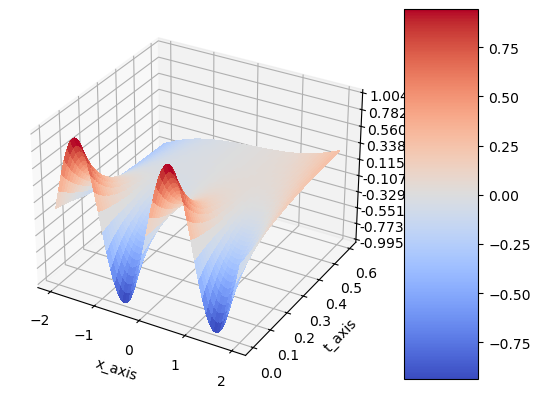

In [55]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.6, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.7]$
- training with iteration 20000

In [56]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.7, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0002)
1 Training Loss: tensor(0.0002)
2 Training Loss: tensor(0.0002)
3 Training Loss: tensor(5.2093e-05)
4 Training Loss: tensor(9.6378e-05)
5 Training Loss: tensor(0.0002)
6 Training Loss: tensor(0.0002)
7 Training Loss: tensor(0.0002)
8 Training Loss: tensor(0.0002)
9 Training Loss: tensor(0.0002)
10 Training Loss: tensor(0.0002)
11 Training Loss: tensor(8.3679e-05)
12 Training Loss: tensor(0.0002)
13 Training Loss: tensor(0.0001)
14 Training Loss: tensor(7.4251e-05)
15 Training Loss: tensor(0.0002)
16 Training Loss: tensor(9.8402e-05)
17 Training Loss: tensor(0.0001)
18 Training Loss: tensor(0.0001)
19 Training Loss: tensor(0.0002)
20 Training Loss: tensor(0.0001)
21 Training Loss: tensor(0.0001)
22 Training Loss: tensor(0.0002)
23 Training Loss: tensor(0.0001)
24 Training Loss: tensor(0.0002)
25 Training Loss: tensor(0.0002)
26 Training Loss: tensor(0.0003)
27 Training Loss: tensor(0.0001)
28 Training Loss: tensor(0.0002)
29 Training Loss: tensor(0.0002)


242 Training Loss: tensor(5.9273e-05)
243 Training Loss: tensor(4.7720e-05)
244 Training Loss: tensor(7.7863e-05)
245 Training Loss: tensor(5.5541e-05)
246 Training Loss: tensor(9.4527e-05)
247 Training Loss: tensor(5.5495e-05)
248 Training Loss: tensor(0.0001)
249 Training Loss: tensor(5.0425e-05)
250 Training Loss: tensor(5.4149e-05)
251 Training Loss: tensor(5.8749e-05)
252 Training Loss: tensor(9.2128e-05)
253 Training Loss: tensor(5.4178e-05)
254 Training Loss: tensor(7.7033e-05)
255 Training Loss: tensor(4.2553e-05)
256 Training Loss: tensor(4.9195e-05)
257 Training Loss: tensor(7.8802e-05)
258 Training Loss: tensor(6.5384e-05)
259 Training Loss: tensor(7.7238e-05)
260 Training Loss: tensor(4.6610e-05)
261 Training Loss: tensor(0.0001)
262 Training Loss: tensor(0.0001)
263 Training Loss: tensor(0.0002)
264 Training Loss: tensor(0.0002)
265 Training Loss: tensor(0.0001)
266 Training Loss: tensor(0.0001)
267 Training Loss: tensor(7.3995e-05)
268 Training Loss: tensor(0.0001)
269 Tr

475 Training Loss: tensor(7.5197e-05)
476 Training Loss: tensor(3.6069e-05)
477 Training Loss: tensor(6.1871e-05)
478 Training Loss: tensor(4.6244e-05)
479 Training Loss: tensor(5.1823e-05)
480 Training Loss: tensor(7.3124e-05)
481 Training Loss: tensor(4.2169e-05)
482 Training Loss: tensor(9.2574e-05)
483 Training Loss: tensor(6.5824e-05)
484 Training Loss: tensor(0.0001)
485 Training Loss: tensor(7.8828e-05)
486 Training Loss: tensor(7.7944e-05)
487 Training Loss: tensor(6.0873e-05)
488 Training Loss: tensor(9.2222e-05)
489 Training Loss: tensor(7.5658e-05)
490 Training Loss: tensor(0.0001)
491 Training Loss: tensor(7.2495e-05)
492 Training Loss: tensor(0.0001)
493 Training Loss: tensor(6.1404e-05)
494 Training Loss: tensor(5.3507e-05)
495 Training Loss: tensor(0.0001)
496 Training Loss: tensor(0.0003)
497 Training Loss: tensor(0.0004)
498 Training Loss: tensor(0.0002)
499 Training Loss: tensor(8.9179e-05)
500 Training Loss: tensor(0.0001)
501 Training Loss: tensor(0.0003)
502 Traini

717 Training Loss: tensor(0.0008)
718 Training Loss: tensor(0.0004)
719 Training Loss: tensor(0.0003)
720 Training Loss: tensor(0.0008)
721 Training Loss: tensor(0.0003)
722 Training Loss: tensor(0.0009)
723 Training Loss: tensor(0.0003)
724 Training Loss: tensor(0.0011)
725 Training Loss: tensor(0.0005)
726 Training Loss: tensor(0.0007)
727 Training Loss: tensor(0.0005)
728 Training Loss: tensor(0.0014)
729 Training Loss: tensor(0.0005)
730 Training Loss: tensor(0.0005)
731 Training Loss: tensor(0.0005)
732 Training Loss: tensor(0.0008)
733 Training Loss: tensor(0.0005)
734 Training Loss: tensor(0.0008)
735 Training Loss: tensor(0.0004)
736 Training Loss: tensor(0.0003)
737 Training Loss: tensor(0.0003)
738 Training Loss: tensor(0.0005)
739 Training Loss: tensor(0.0003)
740 Training Loss: tensor(0.0005)
741 Training Loss: tensor(0.0002)
742 Training Loss: tensor(0.0002)
743 Training Loss: tensor(0.0005)
744 Training Loss: tensor(0.0002)
745 Training Loss: tensor(0.0004)
746 Training L

957 Training Loss: tensor(0.0017)
958 Training Loss: tensor(0.0010)
959 Training Loss: tensor(0.0007)
960 Training Loss: tensor(0.0008)
961 Training Loss: tensor(0.0011)
962 Training Loss: tensor(0.0006)
963 Training Loss: tensor(0.0009)
964 Training Loss: tensor(0.0017)
965 Training Loss: tensor(0.0013)
966 Training Loss: tensor(0.0003)
967 Training Loss: tensor(0.0009)
968 Training Loss: tensor(0.0015)
969 Training Loss: tensor(0.0007)
970 Training Loss: tensor(0.0003)
971 Training Loss: tensor(0.0004)
972 Training Loss: tensor(0.0006)
973 Training Loss: tensor(0.0002)
974 Training Loss: tensor(0.0003)
975 Training Loss: tensor(0.0007)
976 Training Loss: tensor(0.0002)
977 Training Loss: tensor(0.0003)
978 Training Loss: tensor(0.0005)
979 Training Loss: tensor(0.0005)
980 Training Loss: tensor(0.0003)
981 Training Loss: tensor(0.0003)
982 Training Loss: tensor(0.0006)
983 Training Loss: tensor(0.0005)
984 Training Loss: tensor(0.0002)
985 Training Loss: tensor(0.0003)
986 Training L

1191 Training Loss: tensor(0.0002)
1192 Training Loss: tensor(8.4705e-05)
1193 Training Loss: tensor(0.0002)
1194 Training Loss: tensor(0.0001)
1195 Training Loss: tensor(9.2439e-05)
1196 Training Loss: tensor(0.0001)
1197 Training Loss: tensor(0.0001)
1198 Training Loss: tensor(9.1133e-05)
1199 Training Loss: tensor(5.1311e-05)
1200 Training Loss: tensor(0.0001)
1201 Training Loss: tensor(8.2495e-05)
1202 Training Loss: tensor(8.4356e-05)
1203 Training Loss: tensor(5.7279e-05)
1204 Training Loss: tensor(0.0001)
1205 Training Loss: tensor(0.0001)
1206 Training Loss: tensor(7.7215e-05)
1207 Training Loss: tensor(0.0001)
1208 Training Loss: tensor(0.0001)
1209 Training Loss: tensor(0.0002)
1210 Training Loss: tensor(7.1323e-05)
1211 Training Loss: tensor(7.4996e-05)
1212 Training Loss: tensor(0.0002)
1213 Training Loss: tensor(0.0002)
1214 Training Loss: tensor(0.0003)
1215 Training Loss: tensor(7.6156e-05)
1216 Training Loss: tensor(0.0001)
1217 Training Loss: tensor(0.0002)
1218 Traini

1415 Training Loss: tensor(0.0001)
1416 Training Loss: tensor(0.0002)
1417 Training Loss: tensor(0.0002)
1418 Training Loss: tensor(0.0001)
1419 Training Loss: tensor(9.7618e-05)
1420 Training Loss: tensor(7.7028e-05)
1421 Training Loss: tensor(0.0002)
1422 Training Loss: tensor(0.0002)
1423 Training Loss: tensor(0.0002)
1424 Training Loss: tensor(0.0001)
1425 Training Loss: tensor(0.0002)
1426 Training Loss: tensor(0.0002)
1427 Training Loss: tensor(0.0003)
1428 Training Loss: tensor(0.0002)
1429 Training Loss: tensor(0.0001)
1430 Training Loss: tensor(0.0002)
1431 Training Loss: tensor(0.0002)
1432 Training Loss: tensor(0.0002)
1433 Training Loss: tensor(0.0002)
1434 Training Loss: tensor(0.0001)
1435 Training Loss: tensor(0.0002)
1436 Training Loss: tensor(0.0002)
1437 Training Loss: tensor(0.0002)
1438 Training Loss: tensor(0.0002)
1439 Training Loss: tensor(0.0003)
1440 Training Loss: tensor(0.0003)
1441 Training Loss: tensor(0.0002)
1442 Training Loss: tensor(0.0003)
1443 Trainin

1650 Training Loss: tensor(0.0004)
1651 Training Loss: tensor(0.0003)
1652 Training Loss: tensor(0.0005)
1653 Training Loss: tensor(0.0004)
1654 Training Loss: tensor(0.0003)
1655 Training Loss: tensor(0.0007)
1656 Training Loss: tensor(0.0004)
1657 Training Loss: tensor(0.0003)
1658 Training Loss: tensor(0.0003)
1659 Training Loss: tensor(0.0003)
1660 Training Loss: tensor(0.0002)
1661 Training Loss: tensor(0.0002)
1662 Training Loss: tensor(0.0002)
1663 Training Loss: tensor(0.0002)
1664 Training Loss: tensor(0.0003)
1665 Training Loss: tensor(0.0002)
1666 Training Loss: tensor(0.0002)
1667 Training Loss: tensor(0.0002)
1668 Training Loss: tensor(0.0002)
1669 Training Loss: tensor(0.0002)
1670 Training Loss: tensor(0.0002)
1671 Training Loss: tensor(0.0003)
1672 Training Loss: tensor(0.0002)
1673 Training Loss: tensor(0.0003)
1674 Training Loss: tensor(0.0004)
1675 Training Loss: tensor(0.0002)
1676 Training Loss: tensor(0.0002)
1677 Training Loss: tensor(0.0004)
1678 Training Loss: 

1874 Training Loss: tensor(7.6152e-05)
1875 Training Loss: tensor(4.9268e-05)
1876 Training Loss: tensor(9.8326e-05)
1877 Training Loss: tensor(6.7825e-05)
1878 Training Loss: tensor(0.0001)
1879 Training Loss: tensor(0.0001)
1880 Training Loss: tensor(7.1408e-05)
1881 Training Loss: tensor(5.2341e-05)
1882 Training Loss: tensor(7.2848e-05)
1883 Training Loss: tensor(7.8731e-05)
1884 Training Loss: tensor(5.2346e-05)
1885 Training Loss: tensor(4.4474e-05)
1886 Training Loss: tensor(6.0708e-05)
1887 Training Loss: tensor(4.0274e-05)
1888 Training Loss: tensor(6.3052e-05)
1889 Training Loss: tensor(2.6333e-05)
1890 Training Loss: tensor(5.6531e-05)
1891 Training Loss: tensor(4.0319e-05)
1892 Training Loss: tensor(5.6754e-05)
1893 Training Loss: tensor(3.5812e-05)
1894 Training Loss: tensor(5.1559e-05)
1895 Training Loss: tensor(4.2237e-05)
1896 Training Loss: tensor(3.1136e-05)
1897 Training Loss: tensor(5.1659e-05)
1898 Training Loss: tensor(5.8026e-05)
1899 Training Loss: tensor(8.0181

2095 Training Loss: tensor(0.0004)
2096 Training Loss: tensor(0.0001)
2097 Training Loss: tensor(0.0003)
2098 Training Loss: tensor(0.0007)
2099 Training Loss: tensor(0.0008)
2100 Training Loss: tensor(0.0005)
2101 Training Loss: tensor(0.0003)
2102 Training Loss: tensor(0.0002)
2103 Training Loss: tensor(7.3787e-05)
2104 Training Loss: tensor(9.2793e-05)
2105 Training Loss: tensor(0.0001)
2106 Training Loss: tensor(0.0001)
2107 Training Loss: tensor(0.0001)
2108 Training Loss: tensor(9.0273e-05)
2109 Training Loss: tensor(7.5104e-05)
2110 Training Loss: tensor(7.2526e-05)
2111 Training Loss: tensor(0.0001)
2112 Training Loss: tensor(0.0002)
2113 Training Loss: tensor(0.0002)
2114 Training Loss: tensor(0.0002)
2115 Training Loss: tensor(7.9827e-05)
2116 Training Loss: tensor(0.0002)
2117 Training Loss: tensor(0.0002)
2118 Training Loss: tensor(0.0003)
2119 Training Loss: tensor(0.0001)
2120 Training Loss: tensor(0.0001)
2121 Training Loss: tensor(0.0001)
2122 Training Loss: tensor(0.00

2323 Training Loss: tensor(0.0011)
2324 Training Loss: tensor(0.0004)
2325 Training Loss: tensor(0.0009)
2326 Training Loss: tensor(0.0008)
2327 Training Loss: tensor(0.0003)
2328 Training Loss: tensor(0.0008)
2329 Training Loss: tensor(0.0005)
2330 Training Loss: tensor(0.0004)
2331 Training Loss: tensor(0.0005)
2332 Training Loss: tensor(0.0005)
2333 Training Loss: tensor(0.0005)
2334 Training Loss: tensor(0.0005)
2335 Training Loss: tensor(0.0009)
2336 Training Loss: tensor(0.0005)
2337 Training Loss: tensor(0.0006)
2338 Training Loss: tensor(0.0004)
2339 Training Loss: tensor(0.0005)
2340 Training Loss: tensor(0.0003)
2341 Training Loss: tensor(0.0005)
2342 Training Loss: tensor(0.0005)
2343 Training Loss: tensor(0.0004)
2344 Training Loss: tensor(0.0003)
2345 Training Loss: tensor(0.0003)
2346 Training Loss: tensor(0.0004)
2347 Training Loss: tensor(0.0002)
2348 Training Loss: tensor(0.0003)
2349 Training Loss: tensor(0.0003)
2350 Training Loss: tensor(0.0003)
2351 Training Loss: 

2547 Training Loss: tensor(0.0002)
2548 Training Loss: tensor(0.0003)
2549 Training Loss: tensor(0.0002)
2550 Training Loss: tensor(7.1582e-05)
2551 Training Loss: tensor(0.0003)
2552 Training Loss: tensor(0.0002)
2553 Training Loss: tensor(0.0002)
2554 Training Loss: tensor(8.6095e-05)
2555 Training Loss: tensor(0.0002)
2556 Training Loss: tensor(9.6516e-05)
2557 Training Loss: tensor(8.0035e-05)
2558 Training Loss: tensor(0.0002)
2559 Training Loss: tensor(7.0290e-05)
2560 Training Loss: tensor(0.0002)
2561 Training Loss: tensor(0.0001)
2562 Training Loss: tensor(9.2210e-05)
2563 Training Loss: tensor(9.4380e-05)
2564 Training Loss: tensor(0.0001)
2565 Training Loss: tensor(6.8708e-05)
2566 Training Loss: tensor(8.8848e-05)
2567 Training Loss: tensor(7.4343e-05)
2568 Training Loss: tensor(0.0001)
2569 Training Loss: tensor(6.2608e-05)
2570 Training Loss: tensor(6.6467e-05)
2571 Training Loss: tensor(7.1897e-05)
2572 Training Loss: tensor(5.3472e-05)
2573 Training Loss: tensor(6.4001e

2781 Training Loss: tensor(0.0009)
2782 Training Loss: tensor(0.0007)
2783 Training Loss: tensor(0.0008)
2784 Training Loss: tensor(0.0003)
2785 Training Loss: tensor(0.0008)
2786 Training Loss: tensor(0.0010)
2787 Training Loss: tensor(0.0003)
2788 Training Loss: tensor(0.0014)
2789 Training Loss: tensor(0.0013)
2790 Training Loss: tensor(0.0012)
2791 Training Loss: tensor(0.0025)
2792 Training Loss: tensor(0.0022)
2793 Training Loss: tensor(0.0008)
2794 Training Loss: tensor(0.0021)
2795 Training Loss: tensor(0.0012)
2796 Training Loss: tensor(0.0011)
2797 Training Loss: tensor(0.0013)
2798 Training Loss: tensor(0.0013)
2799 Training Loss: tensor(0.0011)
2800 Training Loss: tensor(0.0009)
2801 Training Loss: tensor(0.0016)
2802 Training Loss: tensor(0.0012)
2803 Training Loss: tensor(0.0013)
2804 Training Loss: tensor(0.0014)
2805 Training Loss: tensor(0.0014)
2806 Training Loss: tensor(0.0005)
2807 Training Loss: tensor(0.0013)
2808 Training Loss: tensor(0.0011)
2809 Training Loss: 

3016 Training Loss: tensor(4.9332e-05)
3017 Training Loss: tensor(5.0808e-05)
3018 Training Loss: tensor(2.6075e-05)
3019 Training Loss: tensor(4.7114e-05)
3020 Training Loss: tensor(5.9442e-05)
3021 Training Loss: tensor(5.6127e-05)
3022 Training Loss: tensor(4.7323e-05)
3023 Training Loss: tensor(8.6001e-05)
3024 Training Loss: tensor(5.0559e-05)
3025 Training Loss: tensor(7.7762e-05)
3026 Training Loss: tensor(0.0001)
3027 Training Loss: tensor(5.6321e-05)
3028 Training Loss: tensor(0.0001)
3029 Training Loss: tensor(0.0003)
3030 Training Loss: tensor(0.0003)
3031 Training Loss: tensor(0.0002)
3032 Training Loss: tensor(8.6663e-05)
3033 Training Loss: tensor(0.0001)
3034 Training Loss: tensor(0.0002)
3035 Training Loss: tensor(7.4185e-05)
3036 Training Loss: tensor(0.0002)
3037 Training Loss: tensor(0.0001)
3038 Training Loss: tensor(0.0002)
3039 Training Loss: tensor(9.5291e-05)
3040 Training Loss: tensor(0.0001)
3041 Training Loss: tensor(0.0002)
3042 Training Loss: tensor(0.0002)

3244 Training Loss: tensor(0.0017)
3245 Training Loss: tensor(0.0012)
3246 Training Loss: tensor(0.0031)
3247 Training Loss: tensor(0.0007)
3248 Training Loss: tensor(0.0019)
3249 Training Loss: tensor(0.0014)
3250 Training Loss: tensor(0.0007)
3251 Training Loss: tensor(0.0014)
3252 Training Loss: tensor(0.0007)
3253 Training Loss: tensor(0.0015)
3254 Training Loss: tensor(0.0012)
3255 Training Loss: tensor(0.0012)
3256 Training Loss: tensor(0.0010)
3257 Training Loss: tensor(0.0012)
3258 Training Loss: tensor(0.0020)
3259 Training Loss: tensor(0.0005)
3260 Training Loss: tensor(0.0016)
3261 Training Loss: tensor(0.0019)
3262 Training Loss: tensor(0.0014)
3263 Training Loss: tensor(0.0012)
3264 Training Loss: tensor(0.0008)
3265 Training Loss: tensor(0.0016)
3266 Training Loss: tensor(0.0008)
3267 Training Loss: tensor(0.0010)
3268 Training Loss: tensor(0.0004)
3269 Training Loss: tensor(0.0005)
3270 Training Loss: tensor(0.0008)
3271 Training Loss: tensor(0.0004)
3272 Training Loss: 

3468 Training Loss: tensor(6.2376e-05)
3469 Training Loss: tensor(6.7787e-05)
3470 Training Loss: tensor(5.6430e-05)
3471 Training Loss: tensor(7.3220e-05)
3472 Training Loss: tensor(7.0565e-05)
3473 Training Loss: tensor(6.1254e-05)
3474 Training Loss: tensor(6.8945e-05)
3475 Training Loss: tensor(0.0001)
3476 Training Loss: tensor(5.8240e-05)
3477 Training Loss: tensor(6.9312e-05)
3478 Training Loss: tensor(4.2273e-05)
3479 Training Loss: tensor(5.3876e-05)
3480 Training Loss: tensor(5.2227e-05)
3481 Training Loss: tensor(4.1302e-05)
3482 Training Loss: tensor(5.9299e-05)
3483 Training Loss: tensor(4.4431e-05)
3484 Training Loss: tensor(5.2902e-05)
3485 Training Loss: tensor(5.7187e-05)
3486 Training Loss: tensor(3.3842e-05)
3487 Training Loss: tensor(4.7405e-05)
3488 Training Loss: tensor(5.0738e-05)
3489 Training Loss: tensor(6.7828e-05)
3490 Training Loss: tensor(9.1584e-05)
3491 Training Loss: tensor(3.2559e-05)
3492 Training Loss: tensor(6.3084e-05)
3493 Training Loss: tensor(7.

3684 Training Loss: tensor(0.0002)
3685 Training Loss: tensor(0.0005)
3686 Training Loss: tensor(0.0006)
3687 Training Loss: tensor(0.0005)
3688 Training Loss: tensor(0.0004)
3689 Training Loss: tensor(0.0001)
3690 Training Loss: tensor(0.0002)
3691 Training Loss: tensor(0.0003)
3692 Training Loss: tensor(0.0003)
3693 Training Loss: tensor(0.0002)
3694 Training Loss: tensor(0.0001)
3695 Training Loss: tensor(0.0001)
3696 Training Loss: tensor(6.4821e-05)
3697 Training Loss: tensor(0.0001)
3698 Training Loss: tensor(9.1550e-05)
3699 Training Loss: tensor(9.0040e-05)
3700 Training Loss: tensor(7.5392e-05)
3701 Training Loss: tensor(8.3652e-05)
3702 Training Loss: tensor(0.0001)
3703 Training Loss: tensor(8.3955e-05)
3704 Training Loss: tensor(0.0001)
3705 Training Loss: tensor(7.2106e-05)
3706 Training Loss: tensor(8.7797e-05)
3707 Training Loss: tensor(0.0002)
3708 Training Loss: tensor(0.0004)
3709 Training Loss: tensor(0.0004)
3710 Training Loss: tensor(0.0004)
3711 Training Loss: ten

3918 Training Loss: tensor(6.9075e-05)
3919 Training Loss: tensor(0.0001)
3920 Training Loss: tensor(0.0002)
3921 Training Loss: tensor(0.0001)
3922 Training Loss: tensor(0.0002)
3923 Training Loss: tensor(0.0002)
3924 Training Loss: tensor(0.0002)
3925 Training Loss: tensor(0.0001)
3926 Training Loss: tensor(0.0003)
3927 Training Loss: tensor(0.0001)
3928 Training Loss: tensor(0.0004)
3929 Training Loss: tensor(0.0003)
3930 Training Loss: tensor(0.0002)
3931 Training Loss: tensor(0.0002)
3932 Training Loss: tensor(0.0003)
3933 Training Loss: tensor(0.0004)
3934 Training Loss: tensor(0.0004)
3935 Training Loss: tensor(0.0004)
3936 Training Loss: tensor(0.0003)
3937 Training Loss: tensor(0.0002)
3938 Training Loss: tensor(0.0003)
3939 Training Loss: tensor(0.0004)
3940 Training Loss: tensor(0.0003)
3941 Training Loss: tensor(0.0002)
3942 Training Loss: tensor(0.0001)
3943 Training Loss: tensor(0.0001)
3944 Training Loss: tensor(0.0001)
3945 Training Loss: tensor(0.0003)
3946 Training Lo

4150 Training Loss: tensor(0.0004)
4151 Training Loss: tensor(0.0005)
4152 Training Loss: tensor(0.0005)
4153 Training Loss: tensor(0.0002)
4154 Training Loss: tensor(0.0001)
4155 Training Loss: tensor(0.0002)
4156 Training Loss: tensor(0.0004)
4157 Training Loss: tensor(0.0005)
4158 Training Loss: tensor(0.0004)
4159 Training Loss: tensor(0.0001)
4160 Training Loss: tensor(0.0002)
4161 Training Loss: tensor(0.0002)
4162 Training Loss: tensor(0.0004)
4163 Training Loss: tensor(0.0003)
4164 Training Loss: tensor(0.0001)
4165 Training Loss: tensor(0.0002)
4166 Training Loss: tensor(9.8607e-05)
4167 Training Loss: tensor(0.0002)
4168 Training Loss: tensor(7.6679e-05)
4169 Training Loss: tensor(0.0002)
4170 Training Loss: tensor(0.0002)
4171 Training Loss: tensor(0.0002)
4172 Training Loss: tensor(0.0001)
4173 Training Loss: tensor(0.0002)
4174 Training Loss: tensor(0.0002)
4175 Training Loss: tensor(0.0001)
4176 Training Loss: tensor(0.0002)
4177 Training Loss: tensor(0.0001)
4178 Trainin

4380 Training Loss: tensor(0.0001)
4381 Training Loss: tensor(8.6266e-05)
4382 Training Loss: tensor(0.0001)
4383 Training Loss: tensor(0.0001)
4384 Training Loss: tensor(0.0002)
4385 Training Loss: tensor(0.0001)
4386 Training Loss: tensor(0.0001)
4387 Training Loss: tensor(5.9264e-05)
4388 Training Loss: tensor(9.9579e-05)
4389 Training Loss: tensor(6.9407e-05)
4390 Training Loss: tensor(0.0001)
4391 Training Loss: tensor(5.9966e-05)
4392 Training Loss: tensor(0.0001)
4393 Training Loss: tensor(7.1315e-05)
4394 Training Loss: tensor(0.0001)
4395 Training Loss: tensor(7.9303e-05)
4396 Training Loss: tensor(0.0002)
4397 Training Loss: tensor(8.7138e-05)
4398 Training Loss: tensor(8.2105e-05)
4399 Training Loss: tensor(8.8267e-05)
4400 Training Loss: tensor(0.0002)
4401 Training Loss: tensor(0.0003)
4402 Training Loss: tensor(0.0003)
4403 Training Loss: tensor(5.7285e-05)
4404 Training Loss: tensor(0.0002)
4405 Training Loss: tensor(0.0004)
4406 Training Loss: tensor(0.0005)
4407 Traini

4617 Training Loss: tensor(6.8717e-05)
4618 Training Loss: tensor(0.0001)
4619 Training Loss: tensor(6.6475e-05)
4620 Training Loss: tensor(9.8956e-05)
4621 Training Loss: tensor(9.1184e-05)
4622 Training Loss: tensor(0.0001)
4623 Training Loss: tensor(0.0001)
4624 Training Loss: tensor(6.6707e-05)
4625 Training Loss: tensor(7.1031e-05)
4626 Training Loss: tensor(0.0001)
4627 Training Loss: tensor(6.9618e-05)
4628 Training Loss: tensor(7.2321e-05)
4629 Training Loss: tensor(0.0002)
4630 Training Loss: tensor(0.0002)
4631 Training Loss: tensor(0.0002)
4632 Training Loss: tensor(0.0003)
4633 Training Loss: tensor(0.0002)
4634 Training Loss: tensor(0.0003)
4635 Training Loss: tensor(0.0002)
4636 Training Loss: tensor(0.0001)
4637 Training Loss: tensor(0.0001)
4638 Training Loss: tensor(0.0002)
4639 Training Loss: tensor(0.0001)
4640 Training Loss: tensor(0.0001)
4641 Training Loss: tensor(4.1078e-05)
4642 Training Loss: tensor(6.9832e-05)
4643 Training Loss: tensor(0.0001)
4644 Training L

4854 Training Loss: tensor(0.0004)
4855 Training Loss: tensor(0.0005)
4856 Training Loss: tensor(0.0005)
4857 Training Loss: tensor(0.0006)
4858 Training Loss: tensor(0.0006)
4859 Training Loss: tensor(0.0007)
4860 Training Loss: tensor(0.0007)
4861 Training Loss: tensor(0.0009)
4862 Training Loss: tensor(0.0004)
4863 Training Loss: tensor(0.0007)
4864 Training Loss: tensor(0.0007)
4865 Training Loss: tensor(0.0006)
4866 Training Loss: tensor(0.0008)
4867 Training Loss: tensor(0.0007)
4868 Training Loss: tensor(0.0004)
4869 Training Loss: tensor(0.0008)
4870 Training Loss: tensor(0.0007)
4871 Training Loss: tensor(0.0006)
4872 Training Loss: tensor(0.0004)
4873 Training Loss: tensor(0.0006)
4874 Training Loss: tensor(0.0008)
4875 Training Loss: tensor(0.0008)
4876 Training Loss: tensor(0.0006)
4877 Training Loss: tensor(0.0005)
4878 Training Loss: tensor(0.0009)
4879 Training Loss: tensor(0.0005)
4880 Training Loss: tensor(0.0010)
4881 Training Loss: tensor(0.0006)
4882 Training Loss: 

5089 Training Loss: tensor(6.4391e-05)
5090 Training Loss: tensor(4.5378e-05)
5091 Training Loss: tensor(4.3958e-05)
5092 Training Loss: tensor(2.8406e-05)
5093 Training Loss: tensor(3.0213e-05)
5094 Training Loss: tensor(4.0590e-05)
5095 Training Loss: tensor(2.2605e-05)
5096 Training Loss: tensor(5.1548e-05)
5097 Training Loss: tensor(3.3023e-05)
5098 Training Loss: tensor(4.7564e-05)
5099 Training Loss: tensor(4.7888e-05)
5100 Training Loss: tensor(4.0242e-05)
5101 Training Loss: tensor(3.8641e-05)
5102 Training Loss: tensor(3.8569e-05)
5103 Training Loss: tensor(3.5415e-05)
5104 Training Loss: tensor(3.3701e-05)
5105 Training Loss: tensor(2.9211e-05)
5106 Training Loss: tensor(2.2341e-05)
5107 Training Loss: tensor(1.9930e-05)
5108 Training Loss: tensor(4.5064e-05)
5109 Training Loss: tensor(2.9756e-05)
5110 Training Loss: tensor(3.5296e-05)
5111 Training Loss: tensor(2.5045e-05)
5112 Training Loss: tensor(2.7113e-05)
5113 Training Loss: tensor(2.9973e-05)
5114 Training Loss: tenso

5313 Training Loss: tensor(0.0012)
5314 Training Loss: tensor(0.0010)
5315 Training Loss: tensor(0.0013)
5316 Training Loss: tensor(0.0012)
5317 Training Loss: tensor(0.0008)
5318 Training Loss: tensor(0.0010)
5319 Training Loss: tensor(0.0005)
5320 Training Loss: tensor(0.0009)
5321 Training Loss: tensor(0.0005)
5322 Training Loss: tensor(0.0008)
5323 Training Loss: tensor(0.0008)
5324 Training Loss: tensor(0.0011)
5325 Training Loss: tensor(0.0014)
5326 Training Loss: tensor(0.0008)
5327 Training Loss: tensor(0.0014)
5328 Training Loss: tensor(0.0015)
5329 Training Loss: tensor(0.0008)
5330 Training Loss: tensor(0.0011)
5331 Training Loss: tensor(0.0014)
5332 Training Loss: tensor(0.0008)
5333 Training Loss: tensor(0.0013)
5334 Training Loss: tensor(0.0008)
5335 Training Loss: tensor(0.0011)
5336 Training Loss: tensor(0.0006)
5337 Training Loss: tensor(0.0014)
5338 Training Loss: tensor(0.0008)
5339 Training Loss: tensor(0.0010)
5340 Training Loss: tensor(0.0008)
5341 Training Loss: 

5548 Training Loss: tensor(9.5772e-05)
5549 Training Loss: tensor(0.0001)
5550 Training Loss: tensor(9.4961e-05)
5551 Training Loss: tensor(0.0001)
5552 Training Loss: tensor(8.5300e-05)
5553 Training Loss: tensor(9.1424e-05)
5554 Training Loss: tensor(5.7381e-05)
5555 Training Loss: tensor(5.5795e-05)
5556 Training Loss: tensor(4.4281e-05)
5557 Training Loss: tensor(6.0232e-05)
5558 Training Loss: tensor(5.4489e-05)
5559 Training Loss: tensor(5.3976e-05)
5560 Training Loss: tensor(6.5149e-05)
5561 Training Loss: tensor(3.2665e-05)
5562 Training Loss: tensor(6.6658e-05)
5563 Training Loss: tensor(6.8571e-05)
5564 Training Loss: tensor(3.8961e-05)
5565 Training Loss: tensor(3.6475e-05)
5566 Training Loss: tensor(5.5433e-05)
5567 Training Loss: tensor(5.2406e-05)
5568 Training Loss: tensor(3.6515e-05)
5569 Training Loss: tensor(4.2213e-05)
5570 Training Loss: tensor(4.2362e-05)
5571 Training Loss: tensor(2.8096e-05)
5572 Training Loss: tensor(4.0567e-05)
5573 Training Loss: tensor(3.4383

5766 Training Loss: tensor(2.8240e-05)
5767 Training Loss: tensor(5.0385e-05)
5768 Training Loss: tensor(0.0001)
5769 Training Loss: tensor(0.0001)
5770 Training Loss: tensor(9.6914e-05)
5771 Training Loss: tensor(5.5237e-05)
5772 Training Loss: tensor(8.4655e-05)
5773 Training Loss: tensor(9.8397e-05)
5774 Training Loss: tensor(0.0002)
5775 Training Loss: tensor(0.0002)
5776 Training Loss: tensor(0.0002)
5777 Training Loss: tensor(0.0001)
5778 Training Loss: tensor(0.0001)
5779 Training Loss: tensor(0.0002)
5780 Training Loss: tensor(0.0001)
5781 Training Loss: tensor(9.2748e-05)
5782 Training Loss: tensor(9.5007e-05)
5783 Training Loss: tensor(0.0001)
5784 Training Loss: tensor(8.3917e-05)
5785 Training Loss: tensor(8.1323e-05)
5786 Training Loss: tensor(9.5499e-05)
5787 Training Loss: tensor(3.8634e-05)
5788 Training Loss: tensor(0.0001)
5789 Training Loss: tensor(7.7284e-05)
5790 Training Loss: tensor(0.0001)
5791 Training Loss: tensor(5.0449e-05)
5792 Training Loss: tensor(8.8255e

5993 Training Loss: tensor(0.0016)
5994 Training Loss: tensor(0.0008)
5995 Training Loss: tensor(0.0021)
5996 Training Loss: tensor(0.0012)
5997 Training Loss: tensor(0.0008)
5998 Training Loss: tensor(0.0020)
5999 Training Loss: tensor(0.0021)
6000 Training Loss: tensor(0.0012)
6001 Training Loss: tensor(0.0012)
6002 Training Loss: tensor(0.0023)
6003 Training Loss: tensor(0.0015)
6004 Training Loss: tensor(0.0009)
6005 Training Loss: tensor(0.0019)
6006 Training Loss: tensor(0.0012)
6007 Training Loss: tensor(0.0009)
6008 Training Loss: tensor(0.0019)
6009 Training Loss: tensor(0.0025)
6010 Training Loss: tensor(0.0015)
6011 Training Loss: tensor(0.0006)
6012 Training Loss: tensor(0.0010)
6013 Training Loss: tensor(0.0008)
6014 Training Loss: tensor(0.0008)
6015 Training Loss: tensor(0.0014)
6016 Training Loss: tensor(0.0010)
6017 Training Loss: tensor(0.0005)
6018 Training Loss: tensor(0.0009)
6019 Training Loss: tensor(0.0008)
6020 Training Loss: tensor(0.0003)
6021 Training Loss: 

6216 Training Loss: tensor(5.5023e-05)
6217 Training Loss: tensor(6.6634e-05)
6218 Training Loss: tensor(8.2999e-05)
6219 Training Loss: tensor(5.0967e-05)
6220 Training Loss: tensor(6.0435e-05)
6221 Training Loss: tensor(5.2592e-05)
6222 Training Loss: tensor(7.6656e-05)
6223 Training Loss: tensor(5.8637e-05)
6224 Training Loss: tensor(6.5382e-05)
6225 Training Loss: tensor(6.7341e-05)
6226 Training Loss: tensor(5.9248e-05)
6227 Training Loss: tensor(5.9660e-05)
6228 Training Loss: tensor(5.1736e-05)
6229 Training Loss: tensor(7.0272e-05)
6230 Training Loss: tensor(6.2237e-05)
6231 Training Loss: tensor(3.3439e-05)
6232 Training Loss: tensor(4.2228e-05)
6233 Training Loss: tensor(6.3379e-05)
6234 Training Loss: tensor(4.6621e-05)
6235 Training Loss: tensor(2.7250e-05)
6236 Training Loss: tensor(4.3690e-05)
6237 Training Loss: tensor(3.9463e-05)
6238 Training Loss: tensor(3.0190e-05)
6239 Training Loss: tensor(2.9553e-05)
6240 Training Loss: tensor(3.8904e-05)
6241 Training Loss: tenso

6438 Training Loss: tensor(0.0001)
6439 Training Loss: tensor(0.0001)
6440 Training Loss: tensor(8.9460e-05)
6441 Training Loss: tensor(0.0001)
6442 Training Loss: tensor(8.5068e-05)
6443 Training Loss: tensor(8.2373e-05)
6444 Training Loss: tensor(7.6861e-05)
6445 Training Loss: tensor(7.3850e-05)
6446 Training Loss: tensor(5.8179e-05)
6447 Training Loss: tensor(0.0001)
6448 Training Loss: tensor(6.9453e-05)
6449 Training Loss: tensor(5.7419e-05)
6450 Training Loss: tensor(8.5004e-05)
6451 Training Loss: tensor(7.7294e-05)
6452 Training Loss: tensor(6.0295e-05)
6453 Training Loss: tensor(8.1013e-05)
6454 Training Loss: tensor(0.0001)
6455 Training Loss: tensor(0.0001)
6456 Training Loss: tensor(0.0001)
6457 Training Loss: tensor(7.7210e-05)
6458 Training Loss: tensor(5.2000e-05)
6459 Training Loss: tensor(9.3914e-05)
6460 Training Loss: tensor(9.4618e-05)
6461 Training Loss: tensor(5.5600e-05)
6462 Training Loss: tensor(5.8801e-05)
6463 Training Loss: tensor(6.7628e-05)
6464 Training 

6667 Training Loss: tensor(0.0004)
6668 Training Loss: tensor(0.0003)
6669 Training Loss: tensor(0.0002)
6670 Training Loss: tensor(0.0004)
6671 Training Loss: tensor(0.0004)
6672 Training Loss: tensor(0.0003)
6673 Training Loss: tensor(0.0002)
6674 Training Loss: tensor(0.0002)
6675 Training Loss: tensor(0.0002)
6676 Training Loss: tensor(0.0003)
6677 Training Loss: tensor(0.0002)
6678 Training Loss: tensor(0.0002)
6679 Training Loss: tensor(0.0002)
6680 Training Loss: tensor(0.0004)
6681 Training Loss: tensor(0.0003)
6682 Training Loss: tensor(0.0002)
6683 Training Loss: tensor(0.0001)
6684 Training Loss: tensor(0.0002)
6685 Training Loss: tensor(0.0003)
6686 Training Loss: tensor(0.0002)
6687 Training Loss: tensor(8.1435e-05)
6688 Training Loss: tensor(0.0002)
6689 Training Loss: tensor(0.0002)
6690 Training Loss: tensor(0.0001)
6691 Training Loss: tensor(0.0002)
6692 Training Loss: tensor(0.0004)
6693 Training Loss: tensor(0.0001)
6694 Training Loss: tensor(0.0002)
6695 Training Lo

6898 Training Loss: tensor(0.0002)
6899 Training Loss: tensor(0.0002)
6900 Training Loss: tensor(9.4428e-05)
6901 Training Loss: tensor(0.0002)
6902 Training Loss: tensor(0.0002)
6903 Training Loss: tensor(0.0002)
6904 Training Loss: tensor(0.0002)
6905 Training Loss: tensor(9.3529e-05)
6906 Training Loss: tensor(8.1830e-05)
6907 Training Loss: tensor(0.0001)
6908 Training Loss: tensor(0.0002)
6909 Training Loss: tensor(0.0003)
6910 Training Loss: tensor(0.0002)
6911 Training Loss: tensor(0.0003)
6912 Training Loss: tensor(0.0001)
6913 Training Loss: tensor(9.5889e-05)
6914 Training Loss: tensor(7.5983e-05)
6915 Training Loss: tensor(0.0002)
6916 Training Loss: tensor(0.0002)
6917 Training Loss: tensor(9.6434e-05)
6918 Training Loss: tensor(0.0001)
6919 Training Loss: tensor(0.0002)
6920 Training Loss: tensor(0.0002)
6921 Training Loss: tensor(0.0002)
6922 Training Loss: tensor(0.0001)
6923 Training Loss: tensor(0.0001)
6924 Training Loss: tensor(9.5045e-05)
6925 Training Loss: tensor(

7134 Training Loss: tensor(0.0004)
7135 Training Loss: tensor(0.0001)
7136 Training Loss: tensor(0.0005)
7137 Training Loss: tensor(0.0002)
7138 Training Loss: tensor(0.0003)
7139 Training Loss: tensor(0.0003)
7140 Training Loss: tensor(0.0002)
7141 Training Loss: tensor(0.0004)
7142 Training Loss: tensor(0.0006)
7143 Training Loss: tensor(0.0008)
7144 Training Loss: tensor(0.0007)
7145 Training Loss: tensor(0.0001)
7146 Training Loss: tensor(0.0006)
7147 Training Loss: tensor(0.0008)
7148 Training Loss: tensor(0.0005)
7149 Training Loss: tensor(0.0002)
7150 Training Loss: tensor(0.0006)
7151 Training Loss: tensor(0.0012)
7152 Training Loss: tensor(0.0009)
7153 Training Loss: tensor(0.0002)
7154 Training Loss: tensor(0.0004)
7155 Training Loss: tensor(0.0009)
7156 Training Loss: tensor(0.0006)
7157 Training Loss: tensor(0.0002)
7158 Training Loss: tensor(0.0004)
7159 Training Loss: tensor(0.0010)
7160 Training Loss: tensor(0.0009)
7161 Training Loss: tensor(0.0003)
7162 Training Loss: 

7368 Training Loss: tensor(0.0002)
7369 Training Loss: tensor(0.0001)
7370 Training Loss: tensor(0.0002)
7371 Training Loss: tensor(0.0002)
7372 Training Loss: tensor(8.2998e-05)
7373 Training Loss: tensor(0.0002)
7374 Training Loss: tensor(0.0002)
7375 Training Loss: tensor(9.8636e-05)
7376 Training Loss: tensor(6.7203e-05)
7377 Training Loss: tensor(0.0001)
7378 Training Loss: tensor(8.8634e-05)
7379 Training Loss: tensor(7.3164e-05)
7380 Training Loss: tensor(7.4833e-05)
7381 Training Loss: tensor(8.8709e-05)
7382 Training Loss: tensor(7.2048e-05)
7383 Training Loss: tensor(6.6119e-05)
7384 Training Loss: tensor(5.3716e-05)
7385 Training Loss: tensor(0.0001)
7386 Training Loss: tensor(0.0001)
7387 Training Loss: tensor(7.0131e-05)
7388 Training Loss: tensor(0.0001)
7389 Training Loss: tensor(0.0001)
7390 Training Loss: tensor(6.3758e-05)
7391 Training Loss: tensor(0.0001)
7392 Training Loss: tensor(7.7674e-05)
7393 Training Loss: tensor(0.0001)
7394 Training Loss: tensor(6.4230e-05)

7589 Training Loss: tensor(5.0721e-05)
7590 Training Loss: tensor(4.9386e-05)
7591 Training Loss: tensor(7.5949e-05)
7592 Training Loss: tensor(0.0002)
7593 Training Loss: tensor(0.0003)
7594 Training Loss: tensor(0.0003)
7595 Training Loss: tensor(0.0004)
7596 Training Loss: tensor(0.0001)
7597 Training Loss: tensor(9.7134e-05)
7598 Training Loss: tensor(0.0001)
7599 Training Loss: tensor(0.0003)
7600 Training Loss: tensor(0.0002)
7601 Training Loss: tensor(7.0642e-05)
7602 Training Loss: tensor(0.0001)
7603 Training Loss: tensor(0.0002)
7604 Training Loss: tensor(0.0002)
7605 Training Loss: tensor(0.0001)
7606 Training Loss: tensor(7.5228e-05)
7607 Training Loss: tensor(5.9135e-05)
7608 Training Loss: tensor(0.0001)
7609 Training Loss: tensor(0.0001)
7610 Training Loss: tensor(0.0001)
7611 Training Loss: tensor(8.1330e-05)
7612 Training Loss: tensor(8.3338e-05)
7613 Training Loss: tensor(0.0002)
7614 Training Loss: tensor(0.0001)
7615 Training Loss: tensor(4.9159e-05)
7616 Training L

7827 Training Loss: tensor(0.0002)
7828 Training Loss: tensor(0.0002)
7829 Training Loss: tensor(0.0002)
7830 Training Loss: tensor(0.0001)
7831 Training Loss: tensor(7.8019e-05)
7832 Training Loss: tensor(0.0002)
7833 Training Loss: tensor(0.0003)
7834 Training Loss: tensor(0.0003)
7835 Training Loss: tensor(0.0002)
7836 Training Loss: tensor(0.0002)
7837 Training Loss: tensor(0.0003)
7838 Training Loss: tensor(0.0004)
7839 Training Loss: tensor(0.0002)
7840 Training Loss: tensor(8.6924e-05)
7841 Training Loss: tensor(0.0002)
7842 Training Loss: tensor(0.0005)
7843 Training Loss: tensor(0.0004)
7844 Training Loss: tensor(0.0001)
7845 Training Loss: tensor(0.0002)
7846 Training Loss: tensor(0.0002)
7847 Training Loss: tensor(0.0002)
7848 Training Loss: tensor(7.1862e-05)
7849 Training Loss: tensor(6.7262e-05)
7850 Training Loss: tensor(0.0001)
7851 Training Loss: tensor(0.0001)
7852 Training Loss: tensor(0.0001)
7853 Training Loss: tensor(8.0101e-05)
7854 Training Loss: tensor(0.0001)


8063 Training Loss: tensor(0.0003)
8064 Training Loss: tensor(0.0003)
8065 Training Loss: tensor(0.0004)
8066 Training Loss: tensor(0.0005)
8067 Training Loss: tensor(0.0003)
8068 Training Loss: tensor(0.0002)
8069 Training Loss: tensor(0.0002)
8070 Training Loss: tensor(0.0003)
8071 Training Loss: tensor(0.0003)
8072 Training Loss: tensor(0.0002)
8073 Training Loss: tensor(0.0002)
8074 Training Loss: tensor(0.0003)
8075 Training Loss: tensor(0.0001)
8076 Training Loss: tensor(0.0002)
8077 Training Loss: tensor(0.0002)
8078 Training Loss: tensor(0.0002)
8079 Training Loss: tensor(0.0001)
8080 Training Loss: tensor(0.0001)
8081 Training Loss: tensor(0.0002)
8082 Training Loss: tensor(0.0002)
8083 Training Loss: tensor(0.0002)
8084 Training Loss: tensor(0.0002)
8085 Training Loss: tensor(0.0002)
8086 Training Loss: tensor(0.0002)
8087 Training Loss: tensor(9.7048e-05)
8088 Training Loss: tensor(0.0001)
8089 Training Loss: tensor(0.0002)
8090 Training Loss: tensor(0.0001)
8091 Training Lo

8295 Training Loss: tensor(0.0002)
8296 Training Loss: tensor(0.0001)
8297 Training Loss: tensor(0.0001)
8298 Training Loss: tensor(0.0003)
8299 Training Loss: tensor(0.0005)
8300 Training Loss: tensor(0.0004)
8301 Training Loss: tensor(0.0002)
8302 Training Loss: tensor(0.0004)
8303 Training Loss: tensor(0.0003)
8304 Training Loss: tensor(0.0004)
8305 Training Loss: tensor(8.3251e-05)
8306 Training Loss: tensor(0.0003)
8307 Training Loss: tensor(0.0003)
8308 Training Loss: tensor(0.0003)
8309 Training Loss: tensor(0.0004)
8310 Training Loss: tensor(0.0003)
8311 Training Loss: tensor(0.0005)
8312 Training Loss: tensor(0.0002)
8313 Training Loss: tensor(0.0006)
8314 Training Loss: tensor(0.0004)
8315 Training Loss: tensor(0.0008)
8316 Training Loss: tensor(0.0003)
8317 Training Loss: tensor(0.0007)
8318 Training Loss: tensor(0.0008)
8319 Training Loss: tensor(0.0011)
8320 Training Loss: tensor(0.0009)
8321 Training Loss: tensor(0.0007)
8322 Training Loss: tensor(0.0004)
8323 Training Lo

8523 Training Loss: tensor(9.6787e-05)
8524 Training Loss: tensor(0.0001)
8525 Training Loss: tensor(6.8991e-05)
8526 Training Loss: tensor(8.0506e-05)
8527 Training Loss: tensor(0.0001)
8528 Training Loss: tensor(0.0004)
8529 Training Loss: tensor(0.0004)
8530 Training Loss: tensor(0.0005)
8531 Training Loss: tensor(0.0001)
8532 Training Loss: tensor(0.0001)
8533 Training Loss: tensor(0.0002)
8534 Training Loss: tensor(0.0004)
8535 Training Loss: tensor(0.0004)
8536 Training Loss: tensor(0.0002)
8537 Training Loss: tensor(8.8096e-05)
8538 Training Loss: tensor(0.0002)
8539 Training Loss: tensor(0.0003)
8540 Training Loss: tensor(0.0005)
8541 Training Loss: tensor(0.0003)
8542 Training Loss: tensor(0.0002)
8543 Training Loss: tensor(0.0002)
8544 Training Loss: tensor(0.0002)
8545 Training Loss: tensor(0.0003)
8546 Training Loss: tensor(0.0001)
8547 Training Loss: tensor(0.0002)
8548 Training Loss: tensor(0.0002)
8549 Training Loss: tensor(0.0004)
8550 Training Loss: tensor(0.0002)
8551

8759 Training Loss: tensor(0.0010)
8760 Training Loss: tensor(0.0010)
8761 Training Loss: tensor(0.0012)
8762 Training Loss: tensor(0.0011)
8763 Training Loss: tensor(0.0020)
8764 Training Loss: tensor(0.0009)
8765 Training Loss: tensor(0.0009)
8766 Training Loss: tensor(0.0010)
8767 Training Loss: tensor(0.0021)
8768 Training Loss: tensor(0.0018)
8769 Training Loss: tensor(0.0014)
8770 Training Loss: tensor(0.0012)
8771 Training Loss: tensor(0.0011)
8772 Training Loss: tensor(0.0018)
8773 Training Loss: tensor(0.0009)
8774 Training Loss: tensor(0.0031)
8775 Training Loss: tensor(0.0024)
8776 Training Loss: tensor(0.0021)
8777 Training Loss: tensor(0.0006)
8778 Training Loss: tensor(0.0019)
8779 Training Loss: tensor(0.0038)
8780 Training Loss: tensor(0.0021)
8781 Training Loss: tensor(0.0019)
8782 Training Loss: tensor(0.0013)
8783 Training Loss: tensor(0.0026)
8784 Training Loss: tensor(0.0033)
8785 Training Loss: tensor(0.0024)
8786 Training Loss: tensor(0.0014)
8787 Training Loss: 

8994 Training Loss: tensor(8.3070e-05)
8995 Training Loss: tensor(3.6228e-05)
8996 Training Loss: tensor(6.8937e-05)
8997 Training Loss: tensor(0.0001)
8998 Training Loss: tensor(5.1041e-05)
8999 Training Loss: tensor(4.1587e-05)
9000 Training Loss: tensor(5.2678e-05)
9001 Training Loss: tensor(4.3265e-05)
9002 Training Loss: tensor(4.7916e-05)
9003 Training Loss: tensor(4.7050e-05)
9004 Training Loss: tensor(7.6134e-05)
9005 Training Loss: tensor(3.3154e-05)
9006 Training Loss: tensor(5.8174e-05)
9007 Training Loss: tensor(3.5167e-05)
9008 Training Loss: tensor(3.5675e-05)
9009 Training Loss: tensor(5.4636e-05)
9010 Training Loss: tensor(2.9798e-05)
9011 Training Loss: tensor(6.9208e-05)
9012 Training Loss: tensor(6.2923e-05)
9013 Training Loss: tensor(8.0311e-05)
9014 Training Loss: tensor(4.3408e-05)
9015 Training Loss: tensor(6.7572e-05)
9016 Training Loss: tensor(0.0001)
9017 Training Loss: tensor(4.7404e-05)
9018 Training Loss: tensor(6.3478e-05)
9019 Training Loss: tensor(8.0259

9216 Training Loss: tensor(5.2375e-05)
9217 Training Loss: tensor(0.0001)
9218 Training Loss: tensor(0.0001)
9219 Training Loss: tensor(6.6511e-05)
9220 Training Loss: tensor(5.1337e-05)
9221 Training Loss: tensor(4.7982e-05)
9222 Training Loss: tensor(8.6045e-05)
9223 Training Loss: tensor(0.0001)
9224 Training Loss: tensor(9.0026e-05)
9225 Training Loss: tensor(5.4318e-05)
9226 Training Loss: tensor(8.3379e-05)
9227 Training Loss: tensor(0.0001)
9228 Training Loss: tensor(0.0001)
9229 Training Loss: tensor(4.8072e-05)
9230 Training Loss: tensor(6.4541e-05)
9231 Training Loss: tensor(8.1620e-05)
9232 Training Loss: tensor(6.1947e-05)
9233 Training Loss: tensor(4.9401e-05)
9234 Training Loss: tensor(4.9486e-05)
9235 Training Loss: tensor(4.2579e-05)
9236 Training Loss: tensor(4.1568e-05)
9237 Training Loss: tensor(3.8740e-05)
9238 Training Loss: tensor(3.3350e-05)
9239 Training Loss: tensor(3.8271e-05)
9240 Training Loss: tensor(2.1790e-05)
9241 Training Loss: tensor(4.9700e-05)
9242 T

9443 Training Loss: tensor(0.0001)
9444 Training Loss: tensor(0.0001)
9445 Training Loss: tensor(0.0001)
9446 Training Loss: tensor(7.1635e-05)
9447 Training Loss: tensor(0.0001)
9448 Training Loss: tensor(0.0001)
9449 Training Loss: tensor(6.8026e-05)
9450 Training Loss: tensor(0.0001)
9451 Training Loss: tensor(0.0001)
9452 Training Loss: tensor(5.0911e-05)
9453 Training Loss: tensor(0.0001)
9454 Training Loss: tensor(7.1780e-05)
9455 Training Loss: tensor(3.7544e-05)
9456 Training Loss: tensor(7.7495e-05)
9457 Training Loss: tensor(6.2993e-05)
9458 Training Loss: tensor(3.9077e-05)
9459 Training Loss: tensor(6.0243e-05)
9460 Training Loss: tensor(5.9050e-05)
9461 Training Loss: tensor(8.0841e-05)
9462 Training Loss: tensor(4.0080e-05)
9463 Training Loss: tensor(4.3646e-05)
9464 Training Loss: tensor(6.1234e-05)
9465 Training Loss: tensor(5.0907e-05)
9466 Training Loss: tensor(3.7179e-05)
9467 Training Loss: tensor(4.7652e-05)
9468 Training Loss: tensor(5.3135e-05)
9469 Training Loss

9662 Training Loss: tensor(0.0001)
9663 Training Loss: tensor(0.0001)
9664 Training Loss: tensor(0.0001)
9665 Training Loss: tensor(0.0001)
9666 Training Loss: tensor(0.0002)
9667 Training Loss: tensor(0.0001)
9668 Training Loss: tensor(0.0002)
9669 Training Loss: tensor(0.0001)
9670 Training Loss: tensor(0.0001)
9671 Training Loss: tensor(8.0065e-05)
9672 Training Loss: tensor(0.0001)
9673 Training Loss: tensor(0.0001)
9674 Training Loss: tensor(8.2401e-05)
9675 Training Loss: tensor(0.0001)
9676 Training Loss: tensor(9.8380e-05)
9677 Training Loss: tensor(0.0001)
9678 Training Loss: tensor(0.0001)
9679 Training Loss: tensor(0.0003)
9680 Training Loss: tensor(0.0003)
9681 Training Loss: tensor(0.0002)
9682 Training Loss: tensor(0.0001)
9683 Training Loss: tensor(0.0001)
9684 Training Loss: tensor(0.0003)
9685 Training Loss: tensor(0.0002)
9686 Training Loss: tensor(0.0002)
9687 Training Loss: tensor(0.0002)
9688 Training Loss: tensor(0.0003)
9689 Training Loss: tensor(0.0002)
9690 Tra

9890 Training Loss: tensor(0.0018)
9891 Training Loss: tensor(0.0018)
9892 Training Loss: tensor(0.0007)
9893 Training Loss: tensor(0.0014)
9894 Training Loss: tensor(0.0024)
9895 Training Loss: tensor(0.0025)
9896 Training Loss: tensor(0.0011)
9897 Training Loss: tensor(0.0007)
9898 Training Loss: tensor(0.0017)
9899 Training Loss: tensor(0.0016)
9900 Training Loss: tensor(0.0005)
9901 Training Loss: tensor(0.0014)
9902 Training Loss: tensor(0.0018)
9903 Training Loss: tensor(0.0007)
9904 Training Loss: tensor(0.0009)
9905 Training Loss: tensor(0.0018)
9906 Training Loss: tensor(0.0025)
9907 Training Loss: tensor(0.0005)
9908 Training Loss: tensor(0.0010)
9909 Training Loss: tensor(0.0018)
9910 Training Loss: tensor(0.0014)
9911 Training Loss: tensor(0.0012)
9912 Training Loss: tensor(0.0016)
9913 Training Loss: tensor(0.0023)
9914 Training Loss: tensor(0.0008)
9915 Training Loss: tensor(0.0015)
9916 Training Loss: tensor(0.0022)
9917 Training Loss: tensor(0.0021)
9918 Training Loss: 

10112 Training Loss: tensor(3.3782e-05)
10113 Training Loss: tensor(3.7597e-05)
10114 Training Loss: tensor(4.1912e-05)
10115 Training Loss: tensor(3.9721e-05)
10116 Training Loss: tensor(4.7808e-05)
10117 Training Loss: tensor(2.3983e-05)
10118 Training Loss: tensor(3.2031e-05)
10119 Training Loss: tensor(4.7575e-05)
10120 Training Loss: tensor(2.9778e-05)
10121 Training Loss: tensor(5.0642e-05)
10122 Training Loss: tensor(2.7970e-05)
10123 Training Loss: tensor(4.2397e-05)
10124 Training Loss: tensor(3.3409e-05)
10125 Training Loss: tensor(3.2471e-05)
10126 Training Loss: tensor(3.2069e-05)
10127 Training Loss: tensor(4.0738e-05)
10128 Training Loss: tensor(4.8572e-05)
10129 Training Loss: tensor(3.9677e-05)
10130 Training Loss: tensor(7.8782e-05)
10131 Training Loss: tensor(2.5946e-05)
10132 Training Loss: tensor(6.7516e-05)
10133 Training Loss: tensor(8.2717e-05)
10134 Training Loss: tensor(4.9259e-05)
10135 Training Loss: tensor(0.0001)
10136 Training Loss: tensor(0.0002)
10137 Tr

10335 Training Loss: tensor(0.0014)
10336 Training Loss: tensor(0.0005)
10337 Training Loss: tensor(0.0005)
10338 Training Loss: tensor(0.0010)
10339 Training Loss: tensor(0.0003)
10340 Training Loss: tensor(0.0004)
10341 Training Loss: tensor(0.0008)
10342 Training Loss: tensor(0.0004)
10343 Training Loss: tensor(0.0003)
10344 Training Loss: tensor(0.0008)
10345 Training Loss: tensor(0.0007)
10346 Training Loss: tensor(0.0005)
10347 Training Loss: tensor(0.0007)
10348 Training Loss: tensor(0.0015)
10349 Training Loss: tensor(0.0005)
10350 Training Loss: tensor(0.0003)
10351 Training Loss: tensor(0.0012)
10352 Training Loss: tensor(0.0014)
10353 Training Loss: tensor(0.0007)
10354 Training Loss: tensor(0.0017)
10355 Training Loss: tensor(0.0022)
10356 Training Loss: tensor(0.0005)
10357 Training Loss: tensor(0.0013)
10358 Training Loss: tensor(0.0017)
10359 Training Loss: tensor(0.0008)
10360 Training Loss: tensor(0.0009)
10361 Training Loss: tensor(0.0008)
10362 Training Loss: tensor(

10558 Training Loss: tensor(0.0003)
10559 Training Loss: tensor(0.0004)
10560 Training Loss: tensor(0.0004)
10561 Training Loss: tensor(0.0003)
10562 Training Loss: tensor(0.0004)
10563 Training Loss: tensor(0.0002)
10564 Training Loss: tensor(0.0005)
10565 Training Loss: tensor(0.0001)
10566 Training Loss: tensor(0.0005)
10567 Training Loss: tensor(0.0005)
10568 Training Loss: tensor(0.0003)
10569 Training Loss: tensor(0.0003)
10570 Training Loss: tensor(0.0003)
10571 Training Loss: tensor(0.0007)
10572 Training Loss: tensor(0.0004)
10573 Training Loss: tensor(0.0004)
10574 Training Loss: tensor(0.0002)
10575 Training Loss: tensor(0.0004)
10576 Training Loss: tensor(0.0002)
10577 Training Loss: tensor(0.0001)
10578 Training Loss: tensor(0.0002)
10579 Training Loss: tensor(0.0002)
10580 Training Loss: tensor(0.0002)
10581 Training Loss: tensor(0.0003)
10582 Training Loss: tensor(0.0001)
10583 Training Loss: tensor(0.0002)
10584 Training Loss: tensor(0.0003)
10585 Training Loss: tensor(

10777 Training Loss: tensor(7.4622e-05)
10778 Training Loss: tensor(7.7470e-05)
10779 Training Loss: tensor(9.7517e-05)
10780 Training Loss: tensor(0.0001)
10781 Training Loss: tensor(0.0001)
10782 Training Loss: tensor(8.6492e-05)
10783 Training Loss: tensor(9.8174e-05)
10784 Training Loss: tensor(8.4753e-05)
10785 Training Loss: tensor(0.0002)
10786 Training Loss: tensor(0.0003)
10787 Training Loss: tensor(0.0002)
10788 Training Loss: tensor(9.1976e-05)
10789 Training Loss: tensor(6.0986e-05)
10790 Training Loss: tensor(0.0001)
10791 Training Loss: tensor(0.0002)
10792 Training Loss: tensor(0.0001)
10793 Training Loss: tensor(7.7058e-05)
10794 Training Loss: tensor(4.3914e-05)
10795 Training Loss: tensor(9.3573e-05)
10796 Training Loss: tensor(0.0002)
10797 Training Loss: tensor(0.0002)
10798 Training Loss: tensor(0.0002)
10799 Training Loss: tensor(0.0001)
10800 Training Loss: tensor(0.0003)
10801 Training Loss: tensor(0.0004)
10802 Training Loss: tensor(0.0004)
10803 Training Loss:

11004 Training Loss: tensor(0.0001)
11005 Training Loss: tensor(0.0003)
11006 Training Loss: tensor(0.0002)
11007 Training Loss: tensor(0.0003)
11008 Training Loss: tensor(0.0002)
11009 Training Loss: tensor(0.0001)
11010 Training Loss: tensor(0.0002)
11011 Training Loss: tensor(0.0001)
11012 Training Loss: tensor(0.0001)
11013 Training Loss: tensor(0.0001)
11014 Training Loss: tensor(0.0002)
11015 Training Loss: tensor(0.0002)
11016 Training Loss: tensor(0.0001)
11017 Training Loss: tensor(0.0002)
11018 Training Loss: tensor(0.0001)
11019 Training Loss: tensor(0.0001)
11020 Training Loss: tensor(9.6254e-05)
11021 Training Loss: tensor(0.0001)
11022 Training Loss: tensor(7.9822e-05)
11023 Training Loss: tensor(6.6274e-05)
11024 Training Loss: tensor(7.6584e-05)
11025 Training Loss: tensor(6.1290e-05)
11026 Training Loss: tensor(8.5700e-05)
11027 Training Loss: tensor(8.3465e-05)
11028 Training Loss: tensor(8.5048e-05)
11029 Training Loss: tensor(5.1489e-05)
11030 Training Loss: tensor(

11220 Training Loss: tensor(0.0001)
11221 Training Loss: tensor(0.0001)
11222 Training Loss: tensor(0.0002)
11223 Training Loss: tensor(9.2043e-05)
11224 Training Loss: tensor(0.0002)
11225 Training Loss: tensor(9.6232e-05)
11226 Training Loss: tensor(0.0002)
11227 Training Loss: tensor(0.0001)
11228 Training Loss: tensor(0.0002)
11229 Training Loss: tensor(0.0001)
11230 Training Loss: tensor(0.0002)
11231 Training Loss: tensor(7.7277e-05)
11232 Training Loss: tensor(0.0003)
11233 Training Loss: tensor(0.0003)
11234 Training Loss: tensor(0.0006)
11235 Training Loss: tensor(0.0006)
11236 Training Loss: tensor(0.0007)
11237 Training Loss: tensor(0.0003)
11238 Training Loss: tensor(0.0005)
11239 Training Loss: tensor(0.0007)
11240 Training Loss: tensor(0.0006)
11241 Training Loss: tensor(0.0008)
11242 Training Loss: tensor(0.0010)
11243 Training Loss: tensor(0.0009)
11244 Training Loss: tensor(0.0005)
11245 Training Loss: tensor(0.0010)
11246 Training Loss: tensor(0.0007)
11247 Training L

11451 Training Loss: tensor(0.0002)
11452 Training Loss: tensor(0.0002)
11453 Training Loss: tensor(7.9774e-05)
11454 Training Loss: tensor(0.0001)
11455 Training Loss: tensor(0.0001)
11456 Training Loss: tensor(0.0002)
11457 Training Loss: tensor(9.7075e-05)
11458 Training Loss: tensor(0.0001)
11459 Training Loss: tensor(0.0001)
11460 Training Loss: tensor(0.0001)
11461 Training Loss: tensor(0.0001)
11462 Training Loss: tensor(8.3856e-05)
11463 Training Loss: tensor(0.0001)
11464 Training Loss: tensor(0.0001)
11465 Training Loss: tensor(8.8689e-05)
11466 Training Loss: tensor(8.5543e-05)
11467 Training Loss: tensor(0.0001)
11468 Training Loss: tensor(7.7902e-05)
11469 Training Loss: tensor(0.0001)
11470 Training Loss: tensor(9.1505e-05)
11471 Training Loss: tensor(7.0628e-05)
11472 Training Loss: tensor(7.7246e-05)
11473 Training Loss: tensor(9.9573e-05)
11474 Training Loss: tensor(7.9901e-05)
11475 Training Loss: tensor(5.5182e-05)
11476 Training Loss: tensor(9.4723e-05)
11477 Traini

11665 Training Loss: tensor(0.0002)
11666 Training Loss: tensor(0.0003)
11667 Training Loss: tensor(0.0003)
11668 Training Loss: tensor(0.0002)
11669 Training Loss: tensor(0.0003)
11670 Training Loss: tensor(0.0002)
11671 Training Loss: tensor(0.0002)
11672 Training Loss: tensor(0.0003)
11673 Training Loss: tensor(0.0003)
11674 Training Loss: tensor(0.0002)
11675 Training Loss: tensor(0.0002)
11676 Training Loss: tensor(0.0003)
11677 Training Loss: tensor(0.0002)
11678 Training Loss: tensor(0.0003)
11679 Training Loss: tensor(0.0002)
11680 Training Loss: tensor(0.0003)
11681 Training Loss: tensor(0.0003)
11682 Training Loss: tensor(0.0003)
11683 Training Loss: tensor(0.0003)
11684 Training Loss: tensor(0.0002)
11685 Training Loss: tensor(0.0005)
11686 Training Loss: tensor(0.0003)
11687 Training Loss: tensor(0.0004)
11688 Training Loss: tensor(0.0002)
11689 Training Loss: tensor(0.0004)
11690 Training Loss: tensor(0.0005)
11691 Training Loss: tensor(0.0002)
11692 Training Loss: tensor(

11886 Training Loss: tensor(4.1852e-05)
11887 Training Loss: tensor(3.3402e-05)
11888 Training Loss: tensor(3.3189e-05)
11889 Training Loss: tensor(2.8350e-05)
11890 Training Loss: tensor(4.3535e-05)
11891 Training Loss: tensor(3.3626e-05)
11892 Training Loss: tensor(3.1433e-05)
11893 Training Loss: tensor(4.9430e-05)
11894 Training Loss: tensor(3.6943e-05)
11895 Training Loss: tensor(3.6921e-05)
11896 Training Loss: tensor(7.7790e-05)
11897 Training Loss: tensor(7.3985e-05)
11898 Training Loss: tensor(6.6300e-05)
11899 Training Loss: tensor(3.9017e-05)
11900 Training Loss: tensor(4.1668e-05)
11901 Training Loss: tensor(3.5306e-05)
11902 Training Loss: tensor(5.0865e-05)
11903 Training Loss: tensor(3.8094e-05)
11904 Training Loss: tensor(3.2036e-05)
11905 Training Loss: tensor(4.3651e-05)
11906 Training Loss: tensor(5.4863e-05)
11907 Training Loss: tensor(3.6235e-05)
11908 Training Loss: tensor(3.1620e-05)
11909 Training Loss: tensor(4.6461e-05)
11910 Training Loss: tensor(4.0714e-05)


12106 Training Loss: tensor(0.0007)
12107 Training Loss: tensor(0.0006)
12108 Training Loss: tensor(0.0005)
12109 Training Loss: tensor(0.0011)
12110 Training Loss: tensor(0.0009)
12111 Training Loss: tensor(0.0003)
12112 Training Loss: tensor(0.0011)
12113 Training Loss: tensor(0.0008)
12114 Training Loss: tensor(0.0004)
12115 Training Loss: tensor(0.0006)
12116 Training Loss: tensor(0.0012)
12117 Training Loss: tensor(0.0010)
12118 Training Loss: tensor(0.0004)
12119 Training Loss: tensor(0.0004)
12120 Training Loss: tensor(0.0006)
12121 Training Loss: tensor(0.0005)
12122 Training Loss: tensor(0.0003)
12123 Training Loss: tensor(0.0002)
12124 Training Loss: tensor(0.0004)
12125 Training Loss: tensor(0.0003)
12126 Training Loss: tensor(0.0001)
12127 Training Loss: tensor(0.0002)
12128 Training Loss: tensor(0.0001)
12129 Training Loss: tensor(0.0002)
12130 Training Loss: tensor(0.0002)
12131 Training Loss: tensor(0.0001)
12132 Training Loss: tensor(0.0003)
12133 Training Loss: tensor(

12327 Training Loss: tensor(0.0004)
12328 Training Loss: tensor(0.0004)
12329 Training Loss: tensor(0.0006)
12330 Training Loss: tensor(0.0008)
12331 Training Loss: tensor(0.0007)
12332 Training Loss: tensor(0.0003)
12333 Training Loss: tensor(0.0011)
12334 Training Loss: tensor(0.0015)
12335 Training Loss: tensor(0.0007)
12336 Training Loss: tensor(0.0005)
12337 Training Loss: tensor(0.0013)
12338 Training Loss: tensor(0.0007)
12339 Training Loss: tensor(0.0006)
12340 Training Loss: tensor(0.0003)
12341 Training Loss: tensor(0.0004)
12342 Training Loss: tensor(0.0005)
12343 Training Loss: tensor(0.0003)
12344 Training Loss: tensor(0.0010)
12345 Training Loss: tensor(0.0011)
12346 Training Loss: tensor(0.0006)
12347 Training Loss: tensor(0.0006)
12348 Training Loss: tensor(0.0005)
12349 Training Loss: tensor(0.0006)
12350 Training Loss: tensor(0.0003)
12351 Training Loss: tensor(0.0002)
12352 Training Loss: tensor(0.0005)
12353 Training Loss: tensor(0.0003)
12354 Training Loss: tensor(

12554 Training Loss: tensor(5.3043e-05)
12555 Training Loss: tensor(7.8279e-05)
12556 Training Loss: tensor(4.6220e-05)
12557 Training Loss: tensor(6.2663e-05)
12558 Training Loss: tensor(8.4023e-05)
12559 Training Loss: tensor(0.0001)
12560 Training Loss: tensor(5.2454e-05)
12561 Training Loss: tensor(6.7094e-05)
12562 Training Loss: tensor(9.7063e-05)
12563 Training Loss: tensor(0.0001)
12564 Training Loss: tensor(8.8176e-05)
12565 Training Loss: tensor(3.8950e-05)
12566 Training Loss: tensor(0.0001)
12567 Training Loss: tensor(7.4489e-05)
12568 Training Loss: tensor(7.2572e-05)
12569 Training Loss: tensor(3.4473e-05)
12570 Training Loss: tensor(8.8175e-05)
12571 Training Loss: tensor(8.6192e-05)
12572 Training Loss: tensor(0.0001)
12573 Training Loss: tensor(6.0130e-05)
12574 Training Loss: tensor(8.1441e-05)
12575 Training Loss: tensor(0.0001)
12576 Training Loss: tensor(0.0001)
12577 Training Loss: tensor(6.5637e-05)
12578 Training Loss: tensor(7.0147e-05)
12579 Training Loss: ten

12778 Training Loss: tensor(0.0002)
12779 Training Loss: tensor(0.0001)
12780 Training Loss: tensor(6.1562e-05)
12781 Training Loss: tensor(7.1988e-05)
12782 Training Loss: tensor(0.0001)
12783 Training Loss: tensor(0.0002)
12784 Training Loss: tensor(0.0001)
12785 Training Loss: tensor(6.1187e-05)
12786 Training Loss: tensor(0.0001)
12787 Training Loss: tensor(0.0002)
12788 Training Loss: tensor(0.0002)
12789 Training Loss: tensor(0.0001)
12790 Training Loss: tensor(0.0001)
12791 Training Loss: tensor(8.8571e-05)
12792 Training Loss: tensor(0.0002)
12793 Training Loss: tensor(0.0001)
12794 Training Loss: tensor(0.0002)
12795 Training Loss: tensor(7.2858e-05)
12796 Training Loss: tensor(7.4969e-05)
12797 Training Loss: tensor(6.6416e-05)
12798 Training Loss: tensor(0.0001)
12799 Training Loss: tensor(0.0001)
12800 Training Loss: tensor(9.6445e-05)
12801 Training Loss: tensor(7.0983e-05)
12802 Training Loss: tensor(0.0001)
12803 Training Loss: tensor(0.0003)
12804 Training Loss: tensor(

13005 Training Loss: tensor(0.0001)
13006 Training Loss: tensor(0.0001)
13007 Training Loss: tensor(0.0001)
13008 Training Loss: tensor(0.0002)
13009 Training Loss: tensor(0.0003)
13010 Training Loss: tensor(0.0001)
13011 Training Loss: tensor(0.0001)
13012 Training Loss: tensor(0.0002)
13013 Training Loss: tensor(0.0002)
13014 Training Loss: tensor(0.0001)
13015 Training Loss: tensor(0.0002)
13016 Training Loss: tensor(0.0002)
13017 Training Loss: tensor(0.0003)
13018 Training Loss: tensor(0.0003)
13019 Training Loss: tensor(0.0003)
13020 Training Loss: tensor(0.0002)
13021 Training Loss: tensor(0.0002)
13022 Training Loss: tensor(0.0002)
13023 Training Loss: tensor(0.0003)
13024 Training Loss: tensor(0.0003)
13025 Training Loss: tensor(0.0005)
13026 Training Loss: tensor(0.0002)
13027 Training Loss: tensor(0.0001)
13028 Training Loss: tensor(0.0003)
13029 Training Loss: tensor(0.0004)
13030 Training Loss: tensor(0.0004)
13031 Training Loss: tensor(0.0003)
13032 Training Loss: tensor(

13226 Training Loss: tensor(0.0009)
13227 Training Loss: tensor(0.0008)
13228 Training Loss: tensor(0.0009)
13229 Training Loss: tensor(0.0015)
13230 Training Loss: tensor(0.0007)
13231 Training Loss: tensor(0.0006)
13232 Training Loss: tensor(0.0006)
13233 Training Loss: tensor(0.0008)
13234 Training Loss: tensor(0.0010)
13235 Training Loss: tensor(0.0003)
13236 Training Loss: tensor(0.0007)
13237 Training Loss: tensor(0.0004)
13238 Training Loss: tensor(0.0008)
13239 Training Loss: tensor(0.0005)
13240 Training Loss: tensor(0.0005)
13241 Training Loss: tensor(0.0002)
13242 Training Loss: tensor(0.0004)
13243 Training Loss: tensor(0.0003)
13244 Training Loss: tensor(0.0003)
13245 Training Loss: tensor(0.0003)
13246 Training Loss: tensor(0.0002)
13247 Training Loss: tensor(0.0003)
13248 Training Loss: tensor(0.0002)
13249 Training Loss: tensor(0.0002)
13250 Training Loss: tensor(0.0003)
13251 Training Loss: tensor(0.0002)
13252 Training Loss: tensor(0.0002)
13253 Training Loss: tensor(

13457 Training Loss: tensor(9.5484e-05)
13458 Training Loss: tensor(8.8652e-05)
13459 Training Loss: tensor(0.0001)
13460 Training Loss: tensor(0.0001)
13461 Training Loss: tensor(6.7001e-05)
13462 Training Loss: tensor(0.0001)
13463 Training Loss: tensor(9.5677e-05)
13464 Training Loss: tensor(8.4070e-05)
13465 Training Loss: tensor(7.8209e-05)
13466 Training Loss: tensor(6.3171e-05)
13467 Training Loss: tensor(6.3786e-05)
13468 Training Loss: tensor(8.7866e-05)
13469 Training Loss: tensor(7.7348e-05)
13470 Training Loss: tensor(6.7906e-05)
13471 Training Loss: tensor(0.0002)
13472 Training Loss: tensor(0.0001)
13473 Training Loss: tensor(0.0001)
13474 Training Loss: tensor(7.4908e-05)
13475 Training Loss: tensor(0.0001)
13476 Training Loss: tensor(0.0001)
13477 Training Loss: tensor(9.2257e-05)
13478 Training Loss: tensor(7.5287e-05)
13479 Training Loss: tensor(6.6682e-05)
13480 Training Loss: tensor(6.9441e-05)
13481 Training Loss: tensor(5.0440e-05)
13482 Training Loss: tensor(5.91

13681 Training Loss: tensor(0.0004)
13682 Training Loss: tensor(0.0001)
13683 Training Loss: tensor(0.0002)
13684 Training Loss: tensor(0.0002)
13685 Training Loss: tensor(0.0003)
13686 Training Loss: tensor(0.0001)
13687 Training Loss: tensor(0.0003)
13688 Training Loss: tensor(0.0003)
13689 Training Loss: tensor(0.0004)
13690 Training Loss: tensor(0.0003)
13691 Training Loss: tensor(0.0001)
13692 Training Loss: tensor(0.0003)
13693 Training Loss: tensor(0.0003)
13694 Training Loss: tensor(0.0003)
13695 Training Loss: tensor(0.0001)
13696 Training Loss: tensor(0.0002)
13697 Training Loss: tensor(0.0003)
13698 Training Loss: tensor(0.0004)
13699 Training Loss: tensor(0.0004)
13700 Training Loss: tensor(8.0692e-05)
13701 Training Loss: tensor(0.0002)
13702 Training Loss: tensor(0.0003)
13703 Training Loss: tensor(0.0004)
13704 Training Loss: tensor(0.0003)
13705 Training Loss: tensor(0.0001)
13706 Training Loss: tensor(0.0002)
13707 Training Loss: tensor(0.0003)
13708 Training Loss: ten

13906 Training Loss: tensor(0.0008)
13907 Training Loss: tensor(0.0003)
13908 Training Loss: tensor(0.0004)
13909 Training Loss: tensor(0.0007)
13910 Training Loss: tensor(0.0012)
13911 Training Loss: tensor(0.0004)
13912 Training Loss: tensor(0.0003)
13913 Training Loss: tensor(0.0006)
13914 Training Loss: tensor(0.0007)
13915 Training Loss: tensor(0.0003)
13916 Training Loss: tensor(0.0004)
13917 Training Loss: tensor(0.0010)
13918 Training Loss: tensor(0.0012)
13919 Training Loss: tensor(0.0008)
13920 Training Loss: tensor(0.0002)
13921 Training Loss: tensor(0.0006)
13922 Training Loss: tensor(0.0007)
13923 Training Loss: tensor(0.0005)
13924 Training Loss: tensor(0.0004)
13925 Training Loss: tensor(0.0005)
13926 Training Loss: tensor(0.0006)
13927 Training Loss: tensor(0.0002)
13928 Training Loss: tensor(0.0004)
13929 Training Loss: tensor(0.0005)
13930 Training Loss: tensor(0.0004)
13931 Training Loss: tensor(0.0003)
13932 Training Loss: tensor(0.0004)
13933 Training Loss: tensor(

14136 Training Loss: tensor(0.0008)
14137 Training Loss: tensor(0.0002)
14138 Training Loss: tensor(0.0007)
14139 Training Loss: tensor(0.0005)
14140 Training Loss: tensor(0.0005)
14141 Training Loss: tensor(0.0003)
14142 Training Loss: tensor(0.0005)
14143 Training Loss: tensor(0.0005)
14144 Training Loss: tensor(0.0003)
14145 Training Loss: tensor(0.0003)
14146 Training Loss: tensor(0.0003)
14147 Training Loss: tensor(0.0008)
14148 Training Loss: tensor(0.0004)
14149 Training Loss: tensor(0.0007)
14150 Training Loss: tensor(0.0004)
14151 Training Loss: tensor(0.0008)
14152 Training Loss: tensor(0.0005)
14153 Training Loss: tensor(0.0003)
14154 Training Loss: tensor(0.0005)
14155 Training Loss: tensor(0.0004)
14156 Training Loss: tensor(0.0002)
14157 Training Loss: tensor(0.0005)
14158 Training Loss: tensor(0.0003)
14159 Training Loss: tensor(0.0003)
14160 Training Loss: tensor(0.0003)
14161 Training Loss: tensor(0.0003)
14162 Training Loss: tensor(0.0002)
14163 Training Loss: tensor(

14360 Training Loss: tensor(9.1252e-05)
14361 Training Loss: tensor(5.2037e-05)
14362 Training Loss: tensor(4.1808e-05)
14363 Training Loss: tensor(8.7860e-05)
14364 Training Loss: tensor(4.6261e-05)
14365 Training Loss: tensor(7.1669e-05)
14366 Training Loss: tensor(7.5511e-05)
14367 Training Loss: tensor(8.3715e-05)
14368 Training Loss: tensor(5.0911e-05)
14369 Training Loss: tensor(5.7822e-05)
14370 Training Loss: tensor(0.0001)
14371 Training Loss: tensor(6.8375e-05)
14372 Training Loss: tensor(9.1268e-05)
14373 Training Loss: tensor(4.0856e-05)
14374 Training Loss: tensor(0.0001)
14375 Training Loss: tensor(8.4533e-05)
14376 Training Loss: tensor(8.2803e-05)
14377 Training Loss: tensor(6.9354e-05)
14378 Training Loss: tensor(0.0001)
14379 Training Loss: tensor(0.0001)
14380 Training Loss: tensor(7.9025e-05)
14381 Training Loss: tensor(6.7230e-05)
14382 Training Loss: tensor(0.0001)
14383 Training Loss: tensor(0.0001)
14384 Training Loss: tensor(9.1628e-05)
14385 Training Loss: ten

14590 Training Loss: tensor(9.9003e-05)
14591 Training Loss: tensor(0.0002)
14592 Training Loss: tensor(0.0002)
14593 Training Loss: tensor(9.7400e-05)
14594 Training Loss: tensor(0.0002)
14595 Training Loss: tensor(0.0002)
14596 Training Loss: tensor(0.0002)
14597 Training Loss: tensor(0.0001)
14598 Training Loss: tensor(0.0001)
14599 Training Loss: tensor(0.0002)
14600 Training Loss: tensor(0.0001)
14601 Training Loss: tensor(8.9833e-05)
14602 Training Loss: tensor(0.0002)
14603 Training Loss: tensor(0.0002)
14604 Training Loss: tensor(0.0001)
14605 Training Loss: tensor(5.9098e-05)
14606 Training Loss: tensor(0.0002)
14607 Training Loss: tensor(0.0002)
14608 Training Loss: tensor(5.4734e-05)
14609 Training Loss: tensor(9.0012e-05)
14610 Training Loss: tensor(0.0001)
14611 Training Loss: tensor(4.8866e-05)
14612 Training Loss: tensor(6.4836e-05)
14613 Training Loss: tensor(0.0001)
14614 Training Loss: tensor(8.9943e-05)
14615 Training Loss: tensor(0.0001)
14616 Training Loss: tensor(

14803 Training Loss: tensor(4.0251e-05)
14804 Training Loss: tensor(0.0001)
14805 Training Loss: tensor(0.0001)
14806 Training Loss: tensor(0.0001)
14807 Training Loss: tensor(8.3720e-05)
14808 Training Loss: tensor(0.0001)
14809 Training Loss: tensor(5.2580e-05)
14810 Training Loss: tensor(8.5271e-05)
14811 Training Loss: tensor(6.4945e-05)
14812 Training Loss: tensor(3.9154e-05)
14813 Training Loss: tensor(8.6806e-05)
14814 Training Loss: tensor(7.4860e-05)
14815 Training Loss: tensor(7.2268e-05)
14816 Training Loss: tensor(8.4079e-05)
14817 Training Loss: tensor(5.5371e-05)
14818 Training Loss: tensor(7.9914e-05)
14819 Training Loss: tensor(0.0002)
14820 Training Loss: tensor(0.0002)
14821 Training Loss: tensor(0.0002)
14822 Training Loss: tensor(0.0002)
14823 Training Loss: tensor(0.0001)
14824 Training Loss: tensor(5.9074e-05)
14825 Training Loss: tensor(9.5833e-05)
14826 Training Loss: tensor(8.2562e-05)
14827 Training Loss: tensor(0.0001)
14828 Training Loss: tensor(0.0001)
1482

15029 Training Loss: tensor(0.0003)
15030 Training Loss: tensor(0.0005)
15031 Training Loss: tensor(0.0005)
15032 Training Loss: tensor(0.0002)
15033 Training Loss: tensor(9.2966e-05)
15034 Training Loss: tensor(0.0001)
15035 Training Loss: tensor(0.0002)
15036 Training Loss: tensor(0.0001)
15037 Training Loss: tensor(7.5131e-05)
15038 Training Loss: tensor(3.9852e-05)
15039 Training Loss: tensor(0.0001)
15040 Training Loss: tensor(0.0001)
15041 Training Loss: tensor(6.8892e-05)
15042 Training Loss: tensor(5.8536e-05)
15043 Training Loss: tensor(9.6837e-05)
15044 Training Loss: tensor(8.5969e-05)
15045 Training Loss: tensor(0.0002)
15046 Training Loss: tensor(6.0369e-05)
15047 Training Loss: tensor(0.0001)
15048 Training Loss: tensor(0.0001)
15049 Training Loss: tensor(9.7283e-05)
15050 Training Loss: tensor(0.0001)
15051 Training Loss: tensor(9.9077e-05)
15052 Training Loss: tensor(6.1623e-05)
15053 Training Loss: tensor(0.0002)
15054 Training Loss: tensor(0.0002)
15055 Training Loss:

15256 Training Loss: tensor(0.0001)
15257 Training Loss: tensor(9.4041e-05)
15258 Training Loss: tensor(8.3387e-05)
15259 Training Loss: tensor(8.8754e-05)
15260 Training Loss: tensor(6.4702e-05)
15261 Training Loss: tensor(0.0001)
15262 Training Loss: tensor(8.2351e-05)
15263 Training Loss: tensor(7.6010e-05)
15264 Training Loss: tensor(9.6225e-05)
15265 Training Loss: tensor(7.4815e-05)
15266 Training Loss: tensor(9.1019e-05)
15267 Training Loss: tensor(0.0001)
15268 Training Loss: tensor(5.5439e-05)
15269 Training Loss: tensor(0.0001)
15270 Training Loss: tensor(7.4324e-05)
15271 Training Loss: tensor(0.0002)
15272 Training Loss: tensor(0.0002)
15273 Training Loss: tensor(0.0003)
15274 Training Loss: tensor(0.0001)
15275 Training Loss: tensor(0.0002)
15276 Training Loss: tensor(8.5039e-05)
15277 Training Loss: tensor(0.0002)
15278 Training Loss: tensor(0.0002)
15279 Training Loss: tensor(0.0001)
15280 Training Loss: tensor(0.0003)
15281 Training Loss: tensor(0.0002)
15282 Training L

15481 Training Loss: tensor(6.0784e-05)
15482 Training Loss: tensor(3.5838e-05)
15483 Training Loss: tensor(5.5769e-05)
15484 Training Loss: tensor(8.6240e-05)
15485 Training Loss: tensor(5.4432e-05)
15486 Training Loss: tensor(5.6547e-05)
15487 Training Loss: tensor(8.9168e-05)
15488 Training Loss: tensor(7.7485e-05)
15489 Training Loss: tensor(4.9972e-05)
15490 Training Loss: tensor(6.1866e-05)
15491 Training Loss: tensor(5.4057e-05)
15492 Training Loss: tensor(4.3803e-05)
15493 Training Loss: tensor(8.2534e-05)
15494 Training Loss: tensor(0.0001)
15495 Training Loss: tensor(9.4803e-05)
15496 Training Loss: tensor(4.3546e-05)
15497 Training Loss: tensor(8.3713e-05)
15498 Training Loss: tensor(0.0001)
15499 Training Loss: tensor(7.2595e-05)
15500 Training Loss: tensor(5.8735e-05)
15501 Training Loss: tensor(0.0001)
15502 Training Loss: tensor(0.0001)
15503 Training Loss: tensor(7.3711e-05)
15504 Training Loss: tensor(7.1735e-05)
15505 Training Loss: tensor(0.0001)
15506 Training Loss:

15701 Training Loss: tensor(0.0001)
15702 Training Loss: tensor(0.0001)
15703 Training Loss: tensor(4.6919e-05)
15704 Training Loss: tensor(7.1599e-05)
15705 Training Loss: tensor(0.0002)
15706 Training Loss: tensor(0.0002)
15707 Training Loss: tensor(0.0001)
15708 Training Loss: tensor(5.0143e-05)
15709 Training Loss: tensor(0.0001)
15710 Training Loss: tensor(0.0003)
15711 Training Loss: tensor(0.0003)
15712 Training Loss: tensor(0.0003)
15713 Training Loss: tensor(0.0003)
15714 Training Loss: tensor(0.0001)
15715 Training Loss: tensor(0.0001)
15716 Training Loss: tensor(0.0002)
15717 Training Loss: tensor(0.0001)
15718 Training Loss: tensor(0.0001)
15719 Training Loss: tensor(0.0002)
15720 Training Loss: tensor(0.0001)
15721 Training Loss: tensor(0.0001)
15722 Training Loss: tensor(0.0001)
15723 Training Loss: tensor(0.0002)
15724 Training Loss: tensor(0.0001)
15725 Training Loss: tensor(0.0001)
15726 Training Loss: tensor(0.0001)
15727 Training Loss: tensor(0.0001)
15728 Training L

15929 Training Loss: tensor(8.5362e-05)
15930 Training Loss: tensor(8.6840e-05)
15931 Training Loss: tensor(0.0001)
15932 Training Loss: tensor(6.9952e-05)
15933 Training Loss: tensor(0.0001)
15934 Training Loss: tensor(0.0001)
15935 Training Loss: tensor(6.9771e-05)
15936 Training Loss: tensor(6.7026e-05)
15937 Training Loss: tensor(7.7664e-05)
15938 Training Loss: tensor(6.8227e-05)
15939 Training Loss: tensor(5.0632e-05)
15940 Training Loss: tensor(8.0772e-05)
15941 Training Loss: tensor(8.2393e-05)
15942 Training Loss: tensor(9.8253e-05)
15943 Training Loss: tensor(9.6784e-05)
15944 Training Loss: tensor(8.4059e-05)
15945 Training Loss: tensor(4.0187e-05)
15946 Training Loss: tensor(6.1911e-05)
15947 Training Loss: tensor(6.5970e-05)
15948 Training Loss: tensor(3.8846e-05)
15949 Training Loss: tensor(5.3644e-05)
15950 Training Loss: tensor(0.0001)
15951 Training Loss: tensor(8.9297e-05)
15952 Training Loss: tensor(4.7032e-05)
15953 Training Loss: tensor(7.8305e-05)
15954 Training L

16145 Training Loss: tensor(0.0002)
16146 Training Loss: tensor(0.0001)
16147 Training Loss: tensor(0.0002)
16148 Training Loss: tensor(0.0001)
16149 Training Loss: tensor(0.0001)
16150 Training Loss: tensor(9.2810e-05)
16151 Training Loss: tensor(0.0001)
16152 Training Loss: tensor(6.3682e-05)
16153 Training Loss: tensor(9.3936e-05)
16154 Training Loss: tensor(9.1999e-05)
16155 Training Loss: tensor(0.0002)
16156 Training Loss: tensor(0.0001)
16157 Training Loss: tensor(8.6993e-05)
16158 Training Loss: tensor(5.9131e-05)
16159 Training Loss: tensor(5.7005e-05)
16160 Training Loss: tensor(0.0001)
16161 Training Loss: tensor(0.0001)
16162 Training Loss: tensor(0.0002)
16163 Training Loss: tensor(7.6964e-05)
16164 Training Loss: tensor(7.3460e-05)
16165 Training Loss: tensor(6.3492e-05)
16166 Training Loss: tensor(6.5375e-05)
16167 Training Loss: tensor(6.7548e-05)
16168 Training Loss: tensor(8.1242e-05)
16169 Training Loss: tensor(7.3594e-05)
16170 Training Loss: tensor(9.2039e-05)
1617

16369 Training Loss: tensor(0.0001)
16370 Training Loss: tensor(0.0003)
16371 Training Loss: tensor(0.0003)
16372 Training Loss: tensor(0.0002)
16373 Training Loss: tensor(0.0002)
16374 Training Loss: tensor(0.0002)
16375 Training Loss: tensor(0.0005)
16376 Training Loss: tensor(0.0007)
16377 Training Loss: tensor(0.0007)
16378 Training Loss: tensor(0.0003)
16379 Training Loss: tensor(0.0002)
16380 Training Loss: tensor(0.0004)
16381 Training Loss: tensor(0.0007)
16382 Training Loss: tensor(0.0007)
16383 Training Loss: tensor(0.0004)
16384 Training Loss: tensor(0.0002)
16385 Training Loss: tensor(0.0005)
16386 Training Loss: tensor(0.0003)
16387 Training Loss: tensor(0.0004)
16388 Training Loss: tensor(0.0002)
16389 Training Loss: tensor(0.0002)
16390 Training Loss: tensor(0.0002)
16391 Training Loss: tensor(0.0002)
16392 Training Loss: tensor(0.0003)
16393 Training Loss: tensor(0.0002)
16394 Training Loss: tensor(0.0002)
16395 Training Loss: tensor(0.0005)
16396 Training Loss: tensor(

16600 Training Loss: tensor(0.0010)
16601 Training Loss: tensor(0.0005)
16602 Training Loss: tensor(0.0004)
16603 Training Loss: tensor(0.0008)
16604 Training Loss: tensor(0.0005)
16605 Training Loss: tensor(0.0005)
16606 Training Loss: tensor(0.0005)
16607 Training Loss: tensor(0.0005)
16608 Training Loss: tensor(0.0004)
16609 Training Loss: tensor(0.0003)
16610 Training Loss: tensor(0.0006)
16611 Training Loss: tensor(0.0001)
16612 Training Loss: tensor(0.0003)
16613 Training Loss: tensor(0.0006)
16614 Training Loss: tensor(0.0003)
16615 Training Loss: tensor(0.0005)
16616 Training Loss: tensor(0.0004)
16617 Training Loss: tensor(0.0003)
16618 Training Loss: tensor(0.0004)
16619 Training Loss: tensor(0.0005)
16620 Training Loss: tensor(0.0006)
16621 Training Loss: tensor(0.0004)
16622 Training Loss: tensor(0.0005)
16623 Training Loss: tensor(0.0004)
16624 Training Loss: tensor(0.0006)
16625 Training Loss: tensor(0.0004)
16626 Training Loss: tensor(0.0003)
16627 Training Loss: tensor(

16821 Training Loss: tensor(0.0001)
16822 Training Loss: tensor(8.2583e-05)
16823 Training Loss: tensor(7.3455e-05)
16824 Training Loss: tensor(9.2182e-05)
16825 Training Loss: tensor(9.9807e-05)
16826 Training Loss: tensor(8.4034e-05)
16827 Training Loss: tensor(5.0250e-05)
16828 Training Loss: tensor(0.0001)
16829 Training Loss: tensor(0.0002)
16830 Training Loss: tensor(0.0002)
16831 Training Loss: tensor(2.9333e-05)
16832 Training Loss: tensor(0.0001)
16833 Training Loss: tensor(0.0001)
16834 Training Loss: tensor(6.5045e-05)
16835 Training Loss: tensor(3.9773e-05)
16836 Training Loss: tensor(0.0001)
16837 Training Loss: tensor(0.0002)
16838 Training Loss: tensor(0.0002)
16839 Training Loss: tensor(9.7292e-05)
16840 Training Loss: tensor(7.8701e-05)
16841 Training Loss: tensor(0.0002)
16842 Training Loss: tensor(0.0001)
16843 Training Loss: tensor(8.5610e-05)
16844 Training Loss: tensor(0.0001)
16845 Training Loss: tensor(9.2634e-05)
16846 Training Loss: tensor(0.0002)
16847 Traini

17043 Training Loss: tensor(5.2896e-05)
17044 Training Loss: tensor(6.3434e-05)
17045 Training Loss: tensor(6.8762e-05)
17046 Training Loss: tensor(8.3071e-05)
17047 Training Loss: tensor(0.0001)
17048 Training Loss: tensor(0.0001)
17049 Training Loss: tensor(6.4539e-05)
17050 Training Loss: tensor(0.0001)
17051 Training Loss: tensor(0.0001)
17052 Training Loss: tensor(6.2524e-05)
17053 Training Loss: tensor(8.0369e-05)
17054 Training Loss: tensor(9.4473e-05)
17055 Training Loss: tensor(4.0293e-05)
17056 Training Loss: tensor(7.4717e-05)
17057 Training Loss: tensor(0.0001)
17058 Training Loss: tensor(0.0001)
17059 Training Loss: tensor(0.0001)
17060 Training Loss: tensor(0.0001)
17061 Training Loss: tensor(0.0001)
17062 Training Loss: tensor(8.7302e-05)
17063 Training Loss: tensor(9.5890e-05)
17064 Training Loss: tensor(6.2337e-05)
17065 Training Loss: tensor(6.2782e-05)
17066 Training Loss: tensor(7.1008e-05)
17067 Training Loss: tensor(4.9772e-05)
17068 Training Loss: tensor(9.0234e-

17253 Training Loss: tensor(6.7608e-05)
17254 Training Loss: tensor(0.0001)
17255 Training Loss: tensor(0.0001)
17256 Training Loss: tensor(0.0001)
17257 Training Loss: tensor(0.0001)
17258 Training Loss: tensor(0.0002)
17259 Training Loss: tensor(0.0001)
17260 Training Loss: tensor(8.8077e-05)
17261 Training Loss: tensor(0.0001)
17262 Training Loss: tensor(0.0002)
17263 Training Loss: tensor(0.0002)
17264 Training Loss: tensor(7.1135e-05)
17265 Training Loss: tensor(9.7542e-05)
17266 Training Loss: tensor(0.0001)
17267 Training Loss: tensor(0.0001)
17268 Training Loss: tensor(9.3137e-05)
17269 Training Loss: tensor(5.4843e-05)
17270 Training Loss: tensor(8.8958e-05)
17271 Training Loss: tensor(9.7280e-05)
17272 Training Loss: tensor(5.4391e-05)
17273 Training Loss: tensor(9.7824e-05)
17274 Training Loss: tensor(0.0001)
17275 Training Loss: tensor(9.0598e-05)
17276 Training Loss: tensor(0.0001)
17277 Training Loss: tensor(0.0001)
17278 Training Loss: tensor(0.0002)
17279 Training Loss:

17473 Training Loss: tensor(9.9580e-05)
17474 Training Loss: tensor(8.0441e-05)
17475 Training Loss: tensor(5.9952e-05)
17476 Training Loss: tensor(5.1388e-05)
17477 Training Loss: tensor(7.0518e-05)
17478 Training Loss: tensor(7.4484e-05)
17479 Training Loss: tensor(4.5245e-05)
17480 Training Loss: tensor(0.0001)
17481 Training Loss: tensor(0.0001)
17482 Training Loss: tensor(7.5211e-05)
17483 Training Loss: tensor(6.8869e-05)
17484 Training Loss: tensor(0.0001)
17485 Training Loss: tensor(5.0157e-05)
17486 Training Loss: tensor(5.5707e-05)
17487 Training Loss: tensor(7.8698e-05)
17488 Training Loss: tensor(5.2968e-05)
17489 Training Loss: tensor(6.1248e-05)
17490 Training Loss: tensor(6.6462e-05)
17491 Training Loss: tensor(6.5653e-05)
17492 Training Loss: tensor(8.9029e-05)
17493 Training Loss: tensor(4.5865e-05)
17494 Training Loss: tensor(7.3061e-05)
17495 Training Loss: tensor(4.6030e-05)
17496 Training Loss: tensor(6.4038e-05)
17497 Training Loss: tensor(2.9721e-05)
17498 Traini

17682 Training Loss: tensor(6.3638e-05)
17683 Training Loss: tensor(5.0086e-05)
17684 Training Loss: tensor(0.0001)
17685 Training Loss: tensor(6.2970e-05)
17686 Training Loss: tensor(6.2546e-05)
17687 Training Loss: tensor(5.9608e-05)
17688 Training Loss: tensor(3.9309e-05)
17689 Training Loss: tensor(7.8520e-05)
17690 Training Loss: tensor(4.8149e-05)
17691 Training Loss: tensor(6.5176e-05)
17692 Training Loss: tensor(9.6778e-05)
17693 Training Loss: tensor(8.4653e-05)
17694 Training Loss: tensor(0.0001)
17695 Training Loss: tensor(7.8215e-05)
17696 Training Loss: tensor(8.1191e-05)
17697 Training Loss: tensor(7.3862e-05)
17698 Training Loss: tensor(4.1981e-05)
17699 Training Loss: tensor(6.6611e-05)
17700 Training Loss: tensor(6.3866e-05)
17701 Training Loss: tensor(4.1811e-05)
17702 Training Loss: tensor(4.2296e-05)
17703 Training Loss: tensor(4.5777e-05)
17704 Training Loss: tensor(5.6425e-05)
17705 Training Loss: tensor(5.0566e-05)
17706 Training Loss: tensor(8.8746e-05)
17707 Tr

17905 Training Loss: tensor(7.6920e-05)
17906 Training Loss: tensor(0.0001)
17907 Training Loss: tensor(4.5894e-05)
17908 Training Loss: tensor(8.7184e-05)
17909 Training Loss: tensor(9.2228e-05)
17910 Training Loss: tensor(5.9515e-05)
17911 Training Loss: tensor(6.9493e-05)
17912 Training Loss: tensor(7.3491e-05)
17913 Training Loss: tensor(6.3294e-05)
17914 Training Loss: tensor(8.6889e-05)
17915 Training Loss: tensor(9.0089e-05)
17916 Training Loss: tensor(6.7517e-05)
17917 Training Loss: tensor(7.2279e-05)
17918 Training Loss: tensor(4.7143e-05)
17919 Training Loss: tensor(9.8958e-05)
17920 Training Loss: tensor(9.5335e-05)
17921 Training Loss: tensor(9.8083e-05)
17922 Training Loss: tensor(0.0002)
17923 Training Loss: tensor(0.0003)
17924 Training Loss: tensor(0.0003)
17925 Training Loss: tensor(0.0002)
17926 Training Loss: tensor(0.0002)
17927 Training Loss: tensor(0.0004)
17928 Training Loss: tensor(0.0005)
17929 Training Loss: tensor(0.0007)
17930 Training Loss: tensor(0.0007)


18135 Training Loss: tensor(0.0005)
18136 Training Loss: tensor(0.0003)
18137 Training Loss: tensor(0.0007)
18138 Training Loss: tensor(0.0006)
18139 Training Loss: tensor(0.0004)
18140 Training Loss: tensor(0.0004)
18141 Training Loss: tensor(0.0006)
18142 Training Loss: tensor(0.0002)
18143 Training Loss: tensor(0.0004)
18144 Training Loss: tensor(0.0007)
18145 Training Loss: tensor(0.0003)
18146 Training Loss: tensor(0.0004)
18147 Training Loss: tensor(0.0006)
18148 Training Loss: tensor(0.0002)
18149 Training Loss: tensor(0.0002)
18150 Training Loss: tensor(0.0006)
18151 Training Loss: tensor(0.0003)
18152 Training Loss: tensor(0.0004)
18153 Training Loss: tensor(0.0004)
18154 Training Loss: tensor(0.0006)
18155 Training Loss: tensor(0.0002)
18156 Training Loss: tensor(0.0006)
18157 Training Loss: tensor(0.0004)
18158 Training Loss: tensor(0.0006)
18159 Training Loss: tensor(0.0003)
18160 Training Loss: tensor(0.0006)
18161 Training Loss: tensor(0.0005)
18162 Training Loss: tensor(

18351 Training Loss: tensor(0.0002)
18352 Training Loss: tensor(0.0006)
18353 Training Loss: tensor(0.0012)
18354 Training Loss: tensor(0.0008)
18355 Training Loss: tensor(0.0004)
18356 Training Loss: tensor(0.0014)
18357 Training Loss: tensor(0.0011)
18358 Training Loss: tensor(0.0003)
18359 Training Loss: tensor(0.0009)
18360 Training Loss: tensor(0.0027)
18361 Training Loss: tensor(0.0025)
18362 Training Loss: tensor(0.0007)
18363 Training Loss: tensor(0.0011)
18364 Training Loss: tensor(0.0022)
18365 Training Loss: tensor(0.0021)
18366 Training Loss: tensor(0.0004)
18367 Training Loss: tensor(0.0016)
18368 Training Loss: tensor(0.0023)
18369 Training Loss: tensor(0.0004)
18370 Training Loss: tensor(0.0015)
18371 Training Loss: tensor(0.0017)
18372 Training Loss: tensor(0.0010)
18373 Training Loss: tensor(0.0010)
18374 Training Loss: tensor(0.0016)
18375 Training Loss: tensor(0.0015)
18376 Training Loss: tensor(0.0003)
18377 Training Loss: tensor(0.0013)
18378 Training Loss: tensor(

18577 Training Loss: tensor(0.0002)
18578 Training Loss: tensor(0.0003)
18579 Training Loss: tensor(0.0002)
18580 Training Loss: tensor(0.0005)
18581 Training Loss: tensor(0.0001)
18582 Training Loss: tensor(0.0003)
18583 Training Loss: tensor(0.0003)
18584 Training Loss: tensor(0.0002)
18585 Training Loss: tensor(0.0003)
18586 Training Loss: tensor(0.0004)
18587 Training Loss: tensor(0.0002)
18588 Training Loss: tensor(0.0002)
18589 Training Loss: tensor(0.0004)
18590 Training Loss: tensor(0.0002)
18591 Training Loss: tensor(0.0002)
18592 Training Loss: tensor(0.0003)
18593 Training Loss: tensor(0.0003)
18594 Training Loss: tensor(0.0001)
18595 Training Loss: tensor(0.0003)
18596 Training Loss: tensor(0.0003)
18597 Training Loss: tensor(0.0001)
18598 Training Loss: tensor(0.0002)
18599 Training Loss: tensor(0.0002)
18600 Training Loss: tensor(0.0002)
18601 Training Loss: tensor(0.0002)
18602 Training Loss: tensor(0.0003)
18603 Training Loss: tensor(0.0002)
18604 Training Loss: tensor(

18789 Training Loss: tensor(0.0002)
18790 Training Loss: tensor(0.0001)
18791 Training Loss: tensor(4.1506e-05)
18792 Training Loss: tensor(0.0002)
18793 Training Loss: tensor(0.0002)
18794 Training Loss: tensor(8.7414e-05)
18795 Training Loss: tensor(4.3344e-05)
18796 Training Loss: tensor(0.0001)
18797 Training Loss: tensor(0.0002)
18798 Training Loss: tensor(0.0001)
18799 Training Loss: tensor(6.0843e-05)
18800 Training Loss: tensor(8.3743e-05)
18801 Training Loss: tensor(0.0002)
18802 Training Loss: tensor(0.0002)
18803 Training Loss: tensor(8.6642e-05)
18804 Training Loss: tensor(3.7634e-05)
18805 Training Loss: tensor(6.5179e-05)
18806 Training Loss: tensor(7.1184e-05)
18807 Training Loss: tensor(8.6463e-05)
18808 Training Loss: tensor(6.4149e-05)
18809 Training Loss: tensor(9.7888e-05)
18810 Training Loss: tensor(5.4384e-05)
18811 Training Loss: tensor(0.0001)
18812 Training Loss: tensor(6.8607e-05)
18813 Training Loss: tensor(6.8452e-05)
18814 Training Loss: tensor(6.0968e-05)


19009 Training Loss: tensor(0.0002)
19010 Training Loss: tensor(0.0002)
19011 Training Loss: tensor(0.0001)
19012 Training Loss: tensor(0.0003)
19013 Training Loss: tensor(0.0004)
19014 Training Loss: tensor(0.0003)
19015 Training Loss: tensor(7.8823e-05)
19016 Training Loss: tensor(0.0002)
19017 Training Loss: tensor(0.0002)
19018 Training Loss: tensor(0.0002)
19019 Training Loss: tensor(0.0001)
19020 Training Loss: tensor(9.7574e-05)
19021 Training Loss: tensor(9.6797e-05)
19022 Training Loss: tensor(0.0002)
19023 Training Loss: tensor(0.0003)
19024 Training Loss: tensor(0.0001)
19025 Training Loss: tensor(0.0002)
19026 Training Loss: tensor(0.0002)
19027 Training Loss: tensor(0.0002)
19028 Training Loss: tensor(0.0003)
19029 Training Loss: tensor(0.0002)
19030 Training Loss: tensor(0.0004)
19031 Training Loss: tensor(0.0004)
19032 Training Loss: tensor(0.0005)
19033 Training Loss: tensor(0.0003)
19034 Training Loss: tensor(0.0003)
19035 Training Loss: tensor(0.0002)
19036 Training L

19237 Training Loss: tensor(0.0007)
19238 Training Loss: tensor(0.0006)
19239 Training Loss: tensor(0.0007)
19240 Training Loss: tensor(0.0003)
19241 Training Loss: tensor(0.0008)
19242 Training Loss: tensor(0.0004)
19243 Training Loss: tensor(0.0007)
19244 Training Loss: tensor(0.0005)
19245 Training Loss: tensor(0.0009)
19246 Training Loss: tensor(0.0003)
19247 Training Loss: tensor(0.0007)
19248 Training Loss: tensor(0.0004)
19249 Training Loss: tensor(0.0006)
19250 Training Loss: tensor(0.0004)
19251 Training Loss: tensor(0.0005)
19252 Training Loss: tensor(0.0004)
19253 Training Loss: tensor(0.0005)
19254 Training Loss: tensor(0.0003)
19255 Training Loss: tensor(0.0005)
19256 Training Loss: tensor(0.0004)
19257 Training Loss: tensor(0.0003)
19258 Training Loss: tensor(0.0004)
19259 Training Loss: tensor(0.0003)
19260 Training Loss: tensor(0.0004)
19261 Training Loss: tensor(0.0003)
19262 Training Loss: tensor(0.0005)
19263 Training Loss: tensor(0.0002)
19264 Training Loss: tensor(

19463 Training Loss: tensor(6.4936e-05)
19464 Training Loss: tensor(3.5634e-05)
19465 Training Loss: tensor(5.0615e-05)
19466 Training Loss: tensor(3.0889e-05)
19467 Training Loss: tensor(5.3153e-05)
19468 Training Loss: tensor(7.7832e-05)
19469 Training Loss: tensor(6.3330e-05)
19470 Training Loss: tensor(8.6913e-05)
19471 Training Loss: tensor(4.8408e-05)
19472 Training Loss: tensor(5.4935e-05)
19473 Training Loss: tensor(7.4156e-05)
19474 Training Loss: tensor(6.3829e-05)
19475 Training Loss: tensor(8.2825e-05)
19476 Training Loss: tensor(3.8939e-05)
19477 Training Loss: tensor(8.9712e-05)
19478 Training Loss: tensor(0.0001)
19479 Training Loss: tensor(0.0001)
19480 Training Loss: tensor(6.7018e-05)
19481 Training Loss: tensor(5.1076e-05)
19482 Training Loss: tensor(0.0001)
19483 Training Loss: tensor(0.0001)
19484 Training Loss: tensor(3.1024e-05)
19485 Training Loss: tensor(9.5286e-05)
19486 Training Loss: tensor(0.0002)
19487 Training Loss: tensor(0.0002)
19488 Training Loss: ten

19687 Training Loss: tensor(0.0002)
19688 Training Loss: tensor(0.0002)
19689 Training Loss: tensor(0.0002)
19690 Training Loss: tensor(0.0002)
19691 Training Loss: tensor(0.0004)
19692 Training Loss: tensor(0.0005)
19693 Training Loss: tensor(0.0007)
19694 Training Loss: tensor(0.0006)
19695 Training Loss: tensor(0.0003)
19696 Training Loss: tensor(0.0002)
19697 Training Loss: tensor(0.0005)
19698 Training Loss: tensor(0.0003)
19699 Training Loss: tensor(0.0003)
19700 Training Loss: tensor(9.1691e-05)
19701 Training Loss: tensor(0.0002)
19702 Training Loss: tensor(0.0001)
19703 Training Loss: tensor(0.0001)
19704 Training Loss: tensor(0.0001)
19705 Training Loss: tensor(0.0001)
19706 Training Loss: tensor(9.4631e-05)
19707 Training Loss: tensor(0.0001)
19708 Training Loss: tensor(0.0001)
19709 Training Loss: tensor(7.9173e-05)
19710 Training Loss: tensor(7.8520e-05)
19711 Training Loss: tensor(8.4488e-05)
19712 Training Loss: tensor(0.0001)
19713 Training Loss: tensor(0.0001)
19714 Tr

19908 Training Loss: tensor(0.0004)
19909 Training Loss: tensor(0.0002)
19910 Training Loss: tensor(0.0003)
19911 Training Loss: tensor(0.0003)
19912 Training Loss: tensor(0.0005)
19913 Training Loss: tensor(0.0003)
19914 Training Loss: tensor(0.0004)
19915 Training Loss: tensor(0.0004)
19916 Training Loss: tensor(0.0004)
19917 Training Loss: tensor(0.0003)
19918 Training Loss: tensor(0.0005)
19919 Training Loss: tensor(0.0004)
19920 Training Loss: tensor(0.0004)
19921 Training Loss: tensor(0.0008)
19922 Training Loss: tensor(0.0010)
19923 Training Loss: tensor(0.0011)
19924 Training Loss: tensor(0.0004)
19925 Training Loss: tensor(0.0003)
19926 Training Loss: tensor(0.0005)
19927 Training Loss: tensor(0.0006)
19928 Training Loss: tensor(0.0003)
19929 Training Loss: tensor(0.0003)
19930 Training Loss: tensor(0.0003)
19931 Training Loss: tensor(0.0002)
19932 Training Loss: tensor(0.0002)
19933 Training Loss: tensor(0.0001)
19934 Training Loss: tensor(0.0002)
19935 Training Loss: tensor(

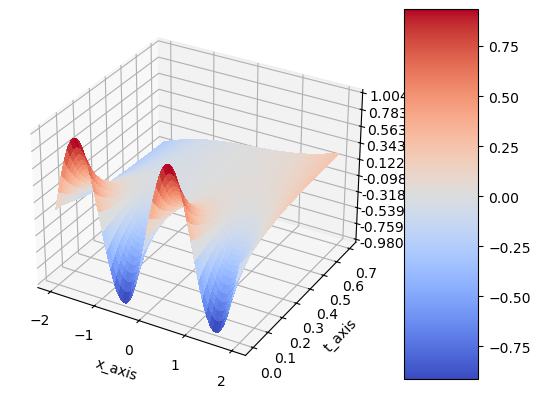

In [57]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.7, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.8]$
- training with iteration 20000

In [58]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.8, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0005)
1 Training Loss: tensor(0.0015)
2 Training Loss: tensor(0.0006)
3 Training Loss: tensor(0.0012)
4 Training Loss: tensor(0.0007)
5 Training Loss: tensor(0.0005)
6 Training Loss: tensor(0.0006)
7 Training Loss: tensor(0.0008)
8 Training Loss: tensor(0.0007)
9 Training Loss: tensor(0.0006)
10 Training Loss: tensor(0.0009)
11 Training Loss: tensor(0.0002)
12 Training Loss: tensor(0.0009)
13 Training Loss: tensor(0.0002)
14 Training Loss: tensor(0.0004)
15 Training Loss: tensor(0.0004)
16 Training Loss: tensor(0.0003)
17 Training Loss: tensor(0.0005)
18 Training Loss: tensor(0.0003)
19 Training Loss: tensor(0.0003)
20 Training Loss: tensor(0.0003)
21 Training Loss: tensor(0.0005)
22 Training Loss: tensor(0.0004)
23 Training Loss: tensor(0.0004)
24 Training Loss: tensor(0.0004)
25 Training Loss: tensor(0.0003)
26 Training Loss: tensor(0.0004)
27 Training Loss: tensor(0.0003)
28 Training Loss: tensor(0.0005)
29 Training Loss: tensor(0.0002)
30 Training Loss: te

247 Training Loss: tensor(0.0001)
248 Training Loss: tensor(9.2479e-05)
249 Training Loss: tensor(0.0001)
250 Training Loss: tensor(7.9687e-05)
251 Training Loss: tensor(0.0001)
252 Training Loss: tensor(5.5187e-05)
253 Training Loss: tensor(0.0001)
254 Training Loss: tensor(4.1835e-05)
255 Training Loss: tensor(0.0001)
256 Training Loss: tensor(7.2233e-05)
257 Training Loss: tensor(6.2013e-05)
258 Training Loss: tensor(8.8126e-05)
259 Training Loss: tensor(5.7485e-05)
260 Training Loss: tensor(6.4355e-05)
261 Training Loss: tensor(4.4094e-05)
262 Training Loss: tensor(6.1101e-05)
263 Training Loss: tensor(3.9493e-05)
264 Training Loss: tensor(4.5010e-05)
265 Training Loss: tensor(4.1130e-05)
266 Training Loss: tensor(3.6958e-05)
267 Training Loss: tensor(3.3370e-05)
268 Training Loss: tensor(4.2028e-05)
269 Training Loss: tensor(2.0531e-05)
270 Training Loss: tensor(3.6917e-05)
271 Training Loss: tensor(5.2574e-05)
272 Training Loss: tensor(3.4315e-05)
273 Training Loss: tensor(4.4146

467 Training Loss: tensor(5.8866e-05)
468 Training Loss: tensor(0.0001)
469 Training Loss: tensor(7.7196e-05)
470 Training Loss: tensor(0.0002)
471 Training Loss: tensor(0.0001)
472 Training Loss: tensor(6.8645e-05)
473 Training Loss: tensor(0.0002)
474 Training Loss: tensor(4.8125e-05)
475 Training Loss: tensor(0.0002)
476 Training Loss: tensor(0.0001)
477 Training Loss: tensor(0.0001)
478 Training Loss: tensor(9.8911e-05)
479 Training Loss: tensor(9.4717e-05)
480 Training Loss: tensor(2.9903e-05)
481 Training Loss: tensor(4.6647e-05)
482 Training Loss: tensor(4.4895e-05)
483 Training Loss: tensor(5.3606e-05)
484 Training Loss: tensor(4.0572e-05)
485 Training Loss: tensor(4.0411e-05)
486 Training Loss: tensor(4.5114e-05)
487 Training Loss: tensor(4.7610e-05)
488 Training Loss: tensor(4.3233e-05)
489 Training Loss: tensor(3.2850e-05)
490 Training Loss: tensor(4.0211e-05)
491 Training Loss: tensor(2.9918e-05)
492 Training Loss: tensor(5.5345e-05)
493 Training Loss: tensor(5.5496e-05)
49

692 Training Loss: tensor(6.6038e-05)
693 Training Loss: tensor(2.6971e-05)
694 Training Loss: tensor(5.8589e-05)
695 Training Loss: tensor(4.8532e-05)
696 Training Loss: tensor(3.4168e-05)
697 Training Loss: tensor(4.3950e-05)
698 Training Loss: tensor(4.4010e-05)
699 Training Loss: tensor(6.9473e-05)
700 Training Loss: tensor(6.6031e-05)
701 Training Loss: tensor(4.4108e-05)
702 Training Loss: tensor(5.9417e-05)
703 Training Loss: tensor(8.4895e-05)
704 Training Loss: tensor(4.1482e-05)
705 Training Loss: tensor(6.0726e-05)
706 Training Loss: tensor(4.1632e-05)
707 Training Loss: tensor(5.1612e-05)
708 Training Loss: tensor(0.0001)
709 Training Loss: tensor(0.0001)
710 Training Loss: tensor(0.0002)
711 Training Loss: tensor(5.1304e-05)
712 Training Loss: tensor(0.0002)
713 Training Loss: tensor(0.0002)
714 Training Loss: tensor(0.0002)
715 Training Loss: tensor(0.0002)
716 Training Loss: tensor(0.0002)
717 Training Loss: tensor(0.0002)
718 Training Loss: tensor(0.0004)
719 Training L

927 Training Loss: tensor(6.4498e-05)
928 Training Loss: tensor(5.6155e-05)
929 Training Loss: tensor(0.0001)
930 Training Loss: tensor(0.0001)
931 Training Loss: tensor(4.9828e-05)
932 Training Loss: tensor(0.0001)
933 Training Loss: tensor(8.0451e-05)
934 Training Loss: tensor(4.4381e-05)
935 Training Loss: tensor(0.0001)
936 Training Loss: tensor(0.0001)
937 Training Loss: tensor(3.5397e-05)
938 Training Loss: tensor(9.7397e-05)
939 Training Loss: tensor(7.4413e-05)
940 Training Loss: tensor(6.4554e-05)
941 Training Loss: tensor(0.0002)
942 Training Loss: tensor(0.0002)
943 Training Loss: tensor(0.0002)
944 Training Loss: tensor(9.6184e-05)
945 Training Loss: tensor(0.0002)
946 Training Loss: tensor(0.0001)
947 Training Loss: tensor(7.8484e-05)
948 Training Loss: tensor(0.0002)
949 Training Loss: tensor(0.0001)
950 Training Loss: tensor(7.8103e-05)
951 Training Loss: tensor(0.0002)
952 Training Loss: tensor(0.0002)
953 Training Loss: tensor(7.4990e-05)
954 Training Loss: tensor(0.00

1147 Training Loss: tensor(5.8083e-05)
1148 Training Loss: tensor(6.7679e-05)
1149 Training Loss: tensor(5.0623e-05)
1150 Training Loss: tensor(3.9836e-05)
1151 Training Loss: tensor(5.3117e-05)
1152 Training Loss: tensor(3.1111e-05)
1153 Training Loss: tensor(3.5767e-05)
1154 Training Loss: tensor(5.4529e-05)
1155 Training Loss: tensor(1.9667e-05)
1156 Training Loss: tensor(2.6822e-05)
1157 Training Loss: tensor(5.3158e-05)
1158 Training Loss: tensor(2.5613e-05)
1159 Training Loss: tensor(3.2346e-05)
1160 Training Loss: tensor(3.7661e-05)
1161 Training Loss: tensor(4.5334e-05)
1162 Training Loss: tensor(3.7167e-05)
1163 Training Loss: tensor(3.3268e-05)
1164 Training Loss: tensor(5.9353e-05)
1165 Training Loss: tensor(3.4852e-05)
1166 Training Loss: tensor(6.1545e-05)
1167 Training Loss: tensor(5.5918e-05)
1168 Training Loss: tensor(3.2685e-05)
1169 Training Loss: tensor(9.9481e-05)
1170 Training Loss: tensor(4.8976e-05)
1171 Training Loss: tensor(0.0001)
1172 Training Loss: tensor(4.

1374 Training Loss: tensor(6.7376e-05)
1375 Training Loss: tensor(8.4977e-05)
1376 Training Loss: tensor(0.0001)
1377 Training Loss: tensor(0.0001)
1378 Training Loss: tensor(7.4098e-05)
1379 Training Loss: tensor(6.2318e-05)
1380 Training Loss: tensor(4.2354e-05)
1381 Training Loss: tensor(7.3908e-05)
1382 Training Loss: tensor(7.7797e-05)
1383 Training Loss: tensor(5.8268e-05)
1384 Training Loss: tensor(3.6178e-05)
1385 Training Loss: tensor(3.9628e-05)
1386 Training Loss: tensor(7.5958e-05)
1387 Training Loss: tensor(0.0001)
1388 Training Loss: tensor(0.0001)
1389 Training Loss: tensor(0.0001)
1390 Training Loss: tensor(4.2792e-05)
1391 Training Loss: tensor(5.2988e-05)
1392 Training Loss: tensor(0.0001)
1393 Training Loss: tensor(0.0002)
1394 Training Loss: tensor(0.0002)
1395 Training Loss: tensor(0.0001)
1396 Training Loss: tensor(3.7875e-05)
1397 Training Loss: tensor(8.6621e-05)
1398 Training Loss: tensor(0.0001)
1399 Training Loss: tensor(0.0001)
1400 Training Loss: tensor(5.8

1603 Training Loss: tensor(0.0001)
1604 Training Loss: tensor(0.0001)
1605 Training Loss: tensor(9.6252e-05)
1606 Training Loss: tensor(0.0001)
1607 Training Loss: tensor(0.0002)
1608 Training Loss: tensor(0.0003)
1609 Training Loss: tensor(5.9025e-05)
1610 Training Loss: tensor(0.0004)
1611 Training Loss: tensor(0.0001)
1612 Training Loss: tensor(0.0001)
1613 Training Loss: tensor(0.0002)
1614 Training Loss: tensor(6.4612e-05)
1615 Training Loss: tensor(0.0002)
1616 Training Loss: tensor(0.0002)
1617 Training Loss: tensor(7.5274e-05)
1618 Training Loss: tensor(0.0001)
1619 Training Loss: tensor(7.9589e-05)
1620 Training Loss: tensor(6.7823e-05)
1621 Training Loss: tensor(0.0001)
1622 Training Loss: tensor(6.2427e-05)
1623 Training Loss: tensor(5.0094e-05)
1624 Training Loss: tensor(6.0595e-05)
1625 Training Loss: tensor(4.4705e-05)
1626 Training Loss: tensor(5.3189e-05)
1627 Training Loss: tensor(3.4395e-05)
1628 Training Loss: tensor(3.8761e-05)
1629 Training Loss: tensor(3.8138e-05)

1832 Training Loss: tensor(0.0003)
1833 Training Loss: tensor(0.0009)
1834 Training Loss: tensor(0.0007)
1835 Training Loss: tensor(0.0004)
1836 Training Loss: tensor(0.0011)
1837 Training Loss: tensor(0.0009)
1838 Training Loss: tensor(0.0004)
1839 Training Loss: tensor(0.0005)
1840 Training Loss: tensor(0.0007)
1841 Training Loss: tensor(0.0003)
1842 Training Loss: tensor(0.0004)
1843 Training Loss: tensor(0.0006)
1844 Training Loss: tensor(0.0003)
1845 Training Loss: tensor(0.0004)
1846 Training Loss: tensor(0.0006)
1847 Training Loss: tensor(0.0002)
1848 Training Loss: tensor(0.0003)
1849 Training Loss: tensor(0.0003)
1850 Training Loss: tensor(0.0001)
1851 Training Loss: tensor(0.0003)
1852 Training Loss: tensor(0.0002)
1853 Training Loss: tensor(0.0002)
1854 Training Loss: tensor(0.0003)
1855 Training Loss: tensor(0.0003)
1856 Training Loss: tensor(0.0002)
1857 Training Loss: tensor(0.0003)
1858 Training Loss: tensor(0.0003)
1859 Training Loss: tensor(0.0002)
1860 Training Loss: 

2056 Training Loss: tensor(0.0001)
2057 Training Loss: tensor(0.0002)
2058 Training Loss: tensor(0.0001)
2059 Training Loss: tensor(7.8499e-05)
2060 Training Loss: tensor(0.0002)
2061 Training Loss: tensor(0.0002)
2062 Training Loss: tensor(9.4497e-05)
2063 Training Loss: tensor(0.0002)
2064 Training Loss: tensor(0.0003)
2065 Training Loss: tensor(0.0004)
2066 Training Loss: tensor(0.0003)
2067 Training Loss: tensor(7.9502e-05)
2068 Training Loss: tensor(0.0003)
2069 Training Loss: tensor(0.0002)
2070 Training Loss: tensor(0.0003)
2071 Training Loss: tensor(0.0003)
2072 Training Loss: tensor(0.0002)
2073 Training Loss: tensor(0.0004)
2074 Training Loss: tensor(0.0005)
2075 Training Loss: tensor(0.0003)
2076 Training Loss: tensor(0.0001)
2077 Training Loss: tensor(0.0004)
2078 Training Loss: tensor(0.0006)
2079 Training Loss: tensor(0.0011)
2080 Training Loss: tensor(0.0005)
2081 Training Loss: tensor(0.0002)
2082 Training Loss: tensor(0.0008)
2083 Training Loss: tensor(0.0012)
2084 Tra

2292 Training Loss: tensor(0.0002)
2293 Training Loss: tensor(0.0001)
2294 Training Loss: tensor(0.0002)
2295 Training Loss: tensor(0.0001)
2296 Training Loss: tensor(8.4791e-05)
2297 Training Loss: tensor(0.0001)
2298 Training Loss: tensor(0.0002)
2299 Training Loss: tensor(0.0003)
2300 Training Loss: tensor(0.0001)
2301 Training Loss: tensor(5.8415e-05)
2302 Training Loss: tensor(0.0001)
2303 Training Loss: tensor(0.0001)
2304 Training Loss: tensor(4.3493e-05)
2305 Training Loss: tensor(0.0001)
2306 Training Loss: tensor(0.0002)
2307 Training Loss: tensor(0.0002)
2308 Training Loss: tensor(9.9213e-05)
2309 Training Loss: tensor(0.0001)
2310 Training Loss: tensor(0.0002)
2311 Training Loss: tensor(0.0002)
2312 Training Loss: tensor(0.0002)
2313 Training Loss: tensor(7.5222e-05)
2314 Training Loss: tensor(0.0002)
2315 Training Loss: tensor(0.0002)
2316 Training Loss: tensor(0.0001)
2317 Training Loss: tensor(9.6132e-05)
2318 Training Loss: tensor(0.0001)
2319 Training Loss: tensor(3.18

2525 Training Loss: tensor(0.0001)
2526 Training Loss: tensor(8.9705e-05)
2527 Training Loss: tensor(0.0001)
2528 Training Loss: tensor(0.0002)
2529 Training Loss: tensor(9.1179e-05)
2530 Training Loss: tensor(0.0001)
2531 Training Loss: tensor(0.0002)
2532 Training Loss: tensor(0.0001)
2533 Training Loss: tensor(9.8043e-05)
2534 Training Loss: tensor(0.0002)
2535 Training Loss: tensor(0.0001)
2536 Training Loss: tensor(6.1375e-05)
2537 Training Loss: tensor(0.0002)
2538 Training Loss: tensor(0.0002)
2539 Training Loss: tensor(0.0002)
2540 Training Loss: tensor(0.0001)
2541 Training Loss: tensor(8.9728e-05)
2542 Training Loss: tensor(8.3804e-05)
2543 Training Loss: tensor(7.2412e-05)
2544 Training Loss: tensor(0.0001)
2545 Training Loss: tensor(9.9741e-05)
2546 Training Loss: tensor(0.0002)
2547 Training Loss: tensor(0.0001)
2548 Training Loss: tensor(0.0001)
2549 Training Loss: tensor(0.0001)
2550 Training Loss: tensor(0.0002)
2551 Training Loss: tensor(0.0002)
2552 Training Loss: ten

2753 Training Loss: tensor(9.8192e-05)
2754 Training Loss: tensor(0.0001)
2755 Training Loss: tensor(0.0002)
2756 Training Loss: tensor(0.0003)
2757 Training Loss: tensor(0.0004)
2758 Training Loss: tensor(0.0003)
2759 Training Loss: tensor(0.0001)
2760 Training Loss: tensor(0.0003)
2761 Training Loss: tensor(0.0006)
2762 Training Loss: tensor(0.0004)
2763 Training Loss: tensor(0.0003)
2764 Training Loss: tensor(0.0002)
2765 Training Loss: tensor(0.0004)
2766 Training Loss: tensor(0.0006)
2767 Training Loss: tensor(0.0006)
2768 Training Loss: tensor(0.0005)
2769 Training Loss: tensor(0.0014)
2770 Training Loss: tensor(0.0007)
2771 Training Loss: tensor(0.0006)
2772 Training Loss: tensor(0.0006)
2773 Training Loss: tensor(0.0014)
2774 Training Loss: tensor(0.0010)
2775 Training Loss: tensor(0.0003)
2776 Training Loss: tensor(0.0006)
2777 Training Loss: tensor(0.0004)
2778 Training Loss: tensor(0.0007)
2779 Training Loss: tensor(0.0002)
2780 Training Loss: tensor(0.0003)
2781 Training Lo

2987 Training Loss: tensor(0.0002)
2988 Training Loss: tensor(0.0005)
2989 Training Loss: tensor(0.0002)
2990 Training Loss: tensor(0.0004)
2991 Training Loss: tensor(0.0003)
2992 Training Loss: tensor(0.0003)
2993 Training Loss: tensor(0.0006)
2994 Training Loss: tensor(0.0005)
2995 Training Loss: tensor(0.0006)
2996 Training Loss: tensor(0.0002)
2997 Training Loss: tensor(0.0007)
2998 Training Loss: tensor(0.0006)
2999 Training Loss: tensor(0.0003)
3000 Training Loss: tensor(0.0003)
3001 Training Loss: tensor(0.0004)
3002 Training Loss: tensor(0.0003)
3003 Training Loss: tensor(0.0003)
3004 Training Loss: tensor(0.0002)
3005 Training Loss: tensor(0.0002)
3006 Training Loss: tensor(0.0003)
3007 Training Loss: tensor(0.0002)
3008 Training Loss: tensor(0.0002)
3009 Training Loss: tensor(0.0003)
3010 Training Loss: tensor(0.0002)
3011 Training Loss: tensor(0.0003)
3012 Training Loss: tensor(0.0002)
3013 Training Loss: tensor(0.0002)
3014 Training Loss: tensor(0.0002)
3015 Training Loss: 

3208 Training Loss: tensor(0.0005)
3209 Training Loss: tensor(7.7277e-05)
3210 Training Loss: tensor(0.0004)
3211 Training Loss: tensor(0.0002)
3212 Training Loss: tensor(0.0004)
3213 Training Loss: tensor(0.0002)
3214 Training Loss: tensor(0.0003)
3215 Training Loss: tensor(0.0003)
3216 Training Loss: tensor(8.5847e-05)
3217 Training Loss: tensor(0.0003)
3218 Training Loss: tensor(0.0001)
3219 Training Loss: tensor(0.0003)
3220 Training Loss: tensor(0.0004)
3221 Training Loss: tensor(0.0001)
3222 Training Loss: tensor(0.0002)
3223 Training Loss: tensor(0.0004)
3224 Training Loss: tensor(0.0003)
3225 Training Loss: tensor(0.0004)
3226 Training Loss: tensor(0.0003)
3227 Training Loss: tensor(0.0004)
3228 Training Loss: tensor(0.0003)
3229 Training Loss: tensor(0.0004)
3230 Training Loss: tensor(0.0004)
3231 Training Loss: tensor(0.0002)
3232 Training Loss: tensor(0.0005)
3233 Training Loss: tensor(0.0005)
3234 Training Loss: tensor(0.0005)
3235 Training Loss: tensor(0.0004)
3236 Trainin

3438 Training Loss: tensor(4.3698e-05)
3439 Training Loss: tensor(4.1551e-05)
3440 Training Loss: tensor(7.0777e-05)
3441 Training Loss: tensor(3.8911e-05)
3442 Training Loss: tensor(6.7228e-05)
3443 Training Loss: tensor(8.4301e-05)
3444 Training Loss: tensor(6.7409e-05)
3445 Training Loss: tensor(9.0040e-05)
3446 Training Loss: tensor(3.9371e-05)
3447 Training Loss: tensor(7.9591e-05)
3448 Training Loss: tensor(5.1301e-05)
3449 Training Loss: tensor(4.6252e-05)
3450 Training Loss: tensor(0.0001)
3451 Training Loss: tensor(6.4862e-05)
3452 Training Loss: tensor(0.0001)
3453 Training Loss: tensor(5.2492e-05)
3454 Training Loss: tensor(0.0001)
3455 Training Loss: tensor(4.4821e-05)
3456 Training Loss: tensor(0.0001)
3457 Training Loss: tensor(8.0626e-05)
3458 Training Loss: tensor(0.0001)
3459 Training Loss: tensor(0.0002)
3460 Training Loss: tensor(9.6089e-05)
3461 Training Loss: tensor(8.6064e-05)
3462 Training Loss: tensor(5.9232e-05)
3463 Training Loss: tensor(6.9757e-05)
3464 Train

3673 Training Loss: tensor(0.0003)
3674 Training Loss: tensor(0.0004)
3675 Training Loss: tensor(0.0005)
3676 Training Loss: tensor(0.0004)
3677 Training Loss: tensor(0.0005)
3678 Training Loss: tensor(0.0009)
3679 Training Loss: tensor(0.0010)
3680 Training Loss: tensor(0.0005)
3681 Training Loss: tensor(0.0003)
3682 Training Loss: tensor(0.0007)
3683 Training Loss: tensor(0.0009)
3684 Training Loss: tensor(0.0008)
3685 Training Loss: tensor(0.0004)
3686 Training Loss: tensor(0.0014)
3687 Training Loss: tensor(0.0010)
3688 Training Loss: tensor(0.0004)
3689 Training Loss: tensor(0.0003)
3690 Training Loss: tensor(0.0006)
3691 Training Loss: tensor(0.0007)
3692 Training Loss: tensor(0.0002)
3693 Training Loss: tensor(0.0003)
3694 Training Loss: tensor(0.0006)
3695 Training Loss: tensor(0.0008)
3696 Training Loss: tensor(0.0003)
3697 Training Loss: tensor(0.0002)
3698 Training Loss: tensor(0.0005)
3699 Training Loss: tensor(0.0003)
3700 Training Loss: tensor(0.0004)
3701 Training Loss: 

3901 Training Loss: tensor(0.0008)
3902 Training Loss: tensor(0.0002)
3903 Training Loss: tensor(0.0012)
3904 Training Loss: tensor(0.0002)
3905 Training Loss: tensor(0.0007)
3906 Training Loss: tensor(0.0006)
3907 Training Loss: tensor(0.0007)
3908 Training Loss: tensor(0.0003)
3909 Training Loss: tensor(0.0003)
3910 Training Loss: tensor(0.0004)
3911 Training Loss: tensor(0.0003)
3912 Training Loss: tensor(0.0004)
3913 Training Loss: tensor(0.0002)
3914 Training Loss: tensor(0.0004)
3915 Training Loss: tensor(0.0003)
3916 Training Loss: tensor(0.0003)
3917 Training Loss: tensor(0.0004)
3918 Training Loss: tensor(0.0002)
3919 Training Loss: tensor(0.0005)
3920 Training Loss: tensor(0.0002)
3921 Training Loss: tensor(0.0004)
3922 Training Loss: tensor(0.0003)
3923 Training Loss: tensor(0.0003)
3924 Training Loss: tensor(0.0005)
3925 Training Loss: tensor(0.0002)
3926 Training Loss: tensor(0.0005)
3927 Training Loss: tensor(0.0003)
3928 Training Loss: tensor(0.0003)
3929 Training Loss: 

4134 Training Loss: tensor(3.7979e-05)
4135 Training Loss: tensor(4.4331e-05)
4136 Training Loss: tensor(6.1306e-05)
4137 Training Loss: tensor(5.9859e-05)
4138 Training Loss: tensor(8.5392e-05)
4139 Training Loss: tensor(7.1336e-05)
4140 Training Loss: tensor(0.0002)
4141 Training Loss: tensor(0.0001)
4142 Training Loss: tensor(7.3205e-05)
4143 Training Loss: tensor(9.8932e-05)
4144 Training Loss: tensor(0.0002)
4145 Training Loss: tensor(0.0002)
4146 Training Loss: tensor(0.0001)
4147 Training Loss: tensor(4.3160e-05)
4148 Training Loss: tensor(8.5988e-05)
4149 Training Loss: tensor(0.0001)
4150 Training Loss: tensor(9.5239e-05)
4151 Training Loss: tensor(8.2470e-05)
4152 Training Loss: tensor(7.1770e-05)
4153 Training Loss: tensor(9.5111e-05)
4154 Training Loss: tensor(9.5570e-05)
4155 Training Loss: tensor(7.1285e-05)
4156 Training Loss: tensor(0.0001)
4157 Training Loss: tensor(0.0002)
4158 Training Loss: tensor(0.0002)
4159 Training Loss: tensor(0.0002)
4160 Training Loss: tensor

4364 Training Loss: tensor(7.2304e-05)
4365 Training Loss: tensor(9.2597e-05)
4366 Training Loss: tensor(7.7824e-05)
4367 Training Loss: tensor(5.0906e-05)
4368 Training Loss: tensor(4.2084e-05)
4369 Training Loss: tensor(6.8563e-05)
4370 Training Loss: tensor(4.8000e-05)
4371 Training Loss: tensor(6.3737e-05)
4372 Training Loss: tensor(3.7153e-05)
4373 Training Loss: tensor(3.9308e-05)
4374 Training Loss: tensor(3.4137e-05)
4375 Training Loss: tensor(3.0255e-05)
4376 Training Loss: tensor(4.4333e-05)
4377 Training Loss: tensor(7.7308e-05)
4378 Training Loss: tensor(0.0001)
4379 Training Loss: tensor(0.0001)
4380 Training Loss: tensor(6.5934e-05)
4381 Training Loss: tensor(3.5873e-05)
4382 Training Loss: tensor(0.0001)
4383 Training Loss: tensor(0.0002)
4384 Training Loss: tensor(0.0003)
4385 Training Loss: tensor(0.0002)
4386 Training Loss: tensor(8.5191e-05)
4387 Training Loss: tensor(5.6334e-05)
4388 Training Loss: tensor(0.0002)
4389 Training Loss: tensor(0.0002)
4390 Training Loss

4599 Training Loss: tensor(4.8127e-05)
4600 Training Loss: tensor(6.5316e-05)
4601 Training Loss: tensor(8.2653e-05)
4602 Training Loss: tensor(8.5327e-05)
4603 Training Loss: tensor(4.4573e-05)
4604 Training Loss: tensor(0.0001)
4605 Training Loss: tensor(6.5908e-05)
4606 Training Loss: tensor(0.0001)
4607 Training Loss: tensor(7.7688e-05)
4608 Training Loss: tensor(5.1693e-05)
4609 Training Loss: tensor(0.0001)
4610 Training Loss: tensor(8.7515e-05)
4611 Training Loss: tensor(0.0001)
4612 Training Loss: tensor(0.0002)
4613 Training Loss: tensor(6.2800e-05)
4614 Training Loss: tensor(8.4391e-05)
4615 Training Loss: tensor(0.0001)
4616 Training Loss: tensor(0.0002)
4617 Training Loss: tensor(5.8227e-05)
4618 Training Loss: tensor(4.6978e-05)
4619 Training Loss: tensor(9.7434e-05)
4620 Training Loss: tensor(4.7643e-05)
4621 Training Loss: tensor(9.3913e-05)
4622 Training Loss: tensor(5.1787e-05)
4623 Training Loss: tensor(0.0001)
4624 Training Loss: tensor(8.0574e-05)
4625 Training Loss

4819 Training Loss: tensor(4.4057e-05)
4820 Training Loss: tensor(4.9219e-05)
4821 Training Loss: tensor(5.5903e-05)
4822 Training Loss: tensor(6.1299e-05)
4823 Training Loss: tensor(6.9575e-05)
4824 Training Loss: tensor(3.5653e-05)
4825 Training Loss: tensor(3.6956e-05)
4826 Training Loss: tensor(5.1342e-05)
4827 Training Loss: tensor(5.5573e-05)
4828 Training Loss: tensor(5.0830e-05)
4829 Training Loss: tensor(3.5238e-05)
4830 Training Loss: tensor(2.4684e-05)
4831 Training Loss: tensor(4.1126e-05)
4832 Training Loss: tensor(3.6894e-05)
4833 Training Loss: tensor(2.8631e-05)
4834 Training Loss: tensor(3.2315e-05)
4835 Training Loss: tensor(6.2056e-05)
4836 Training Loss: tensor(4.1581e-05)
4837 Training Loss: tensor(5.3166e-05)
4838 Training Loss: tensor(7.1621e-05)
4839 Training Loss: tensor(6.1085e-05)
4840 Training Loss: tensor(6.6590e-05)
4841 Training Loss: tensor(8.5388e-05)
4842 Training Loss: tensor(6.5971e-05)
4843 Training Loss: tensor(7.1152e-05)
4844 Training Loss: tenso

5048 Training Loss: tensor(0.0002)
5049 Training Loss: tensor(0.0002)
5050 Training Loss: tensor(0.0003)
5051 Training Loss: tensor(0.0001)
5052 Training Loss: tensor(7.7751e-05)
5053 Training Loss: tensor(0.0002)
5054 Training Loss: tensor(0.0003)
5055 Training Loss: tensor(0.0003)
5056 Training Loss: tensor(0.0002)
5057 Training Loss: tensor(0.0002)
5058 Training Loss: tensor(0.0005)
5059 Training Loss: tensor(0.0006)
5060 Training Loss: tensor(0.0005)
5061 Training Loss: tensor(0.0002)
5062 Training Loss: tensor(0.0002)
5063 Training Loss: tensor(0.0004)
5064 Training Loss: tensor(0.0004)
5065 Training Loss: tensor(0.0001)
5066 Training Loss: tensor(0.0003)
5067 Training Loss: tensor(0.0006)
5068 Training Loss: tensor(0.0009)
5069 Training Loss: tensor(0.0006)
5070 Training Loss: tensor(0.0002)
5071 Training Loss: tensor(0.0004)
5072 Training Loss: tensor(0.0003)
5073 Training Loss: tensor(0.0003)
5074 Training Loss: tensor(0.0002)
5075 Training Loss: tensor(0.0003)
5076 Training Lo

5285 Training Loss: tensor(0.0005)
5286 Training Loss: tensor(0.0003)
5287 Training Loss: tensor(0.0005)
5288 Training Loss: tensor(0.0005)
5289 Training Loss: tensor(0.0003)
5290 Training Loss: tensor(0.0005)
5291 Training Loss: tensor(0.0004)
5292 Training Loss: tensor(0.0003)
5293 Training Loss: tensor(0.0006)
5294 Training Loss: tensor(0.0002)
5295 Training Loss: tensor(0.0004)
5296 Training Loss: tensor(0.0004)
5297 Training Loss: tensor(0.0002)
5298 Training Loss: tensor(0.0004)
5299 Training Loss: tensor(0.0002)
5300 Training Loss: tensor(0.0002)
5301 Training Loss: tensor(0.0004)
5302 Training Loss: tensor(0.0004)
5303 Training Loss: tensor(0.0004)
5304 Training Loss: tensor(0.0002)
5305 Training Loss: tensor(0.0004)
5306 Training Loss: tensor(0.0004)
5307 Training Loss: tensor(0.0003)
5308 Training Loss: tensor(0.0006)
5309 Training Loss: tensor(0.0003)
5310 Training Loss: tensor(0.0005)
5311 Training Loss: tensor(0.0006)
5312 Training Loss: tensor(0.0002)
5313 Training Loss: 

5518 Training Loss: tensor(0.0003)
5519 Training Loss: tensor(0.0004)
5520 Training Loss: tensor(0.0005)
5521 Training Loss: tensor(0.0003)
5522 Training Loss: tensor(0.0006)
5523 Training Loss: tensor(0.0005)
5524 Training Loss: tensor(0.0003)
5525 Training Loss: tensor(0.0005)
5526 Training Loss: tensor(0.0005)
5527 Training Loss: tensor(0.0004)
5528 Training Loss: tensor(0.0003)
5529 Training Loss: tensor(0.0003)
5530 Training Loss: tensor(0.0004)
5531 Training Loss: tensor(0.0004)
5532 Training Loss: tensor(0.0002)
5533 Training Loss: tensor(0.0002)
5534 Training Loss: tensor(0.0002)
5535 Training Loss: tensor(0.0002)
5536 Training Loss: tensor(0.0001)
5537 Training Loss: tensor(0.0001)
5538 Training Loss: tensor(0.0001)
5539 Training Loss: tensor(0.0001)
5540 Training Loss: tensor(0.0001)
5541 Training Loss: tensor(0.0002)
5542 Training Loss: tensor(8.8796e-05)
5543 Training Loss: tensor(9.6253e-05)
5544 Training Loss: tensor(0.0001)
5545 Training Loss: tensor(8.4785e-05)
5546 Tra

5741 Training Loss: tensor(0.0006)
5742 Training Loss: tensor(0.0004)
5743 Training Loss: tensor(0.0003)
5744 Training Loss: tensor(0.0007)
5745 Training Loss: tensor(0.0003)
5746 Training Loss: tensor(0.0005)
5747 Training Loss: tensor(0.0003)
5748 Training Loss: tensor(0.0006)
5749 Training Loss: tensor(0.0006)
5750 Training Loss: tensor(0.0007)
5751 Training Loss: tensor(0.0007)
5752 Training Loss: tensor(0.0005)
5753 Training Loss: tensor(0.0005)
5754 Training Loss: tensor(0.0004)
5755 Training Loss: tensor(0.0010)
5756 Training Loss: tensor(0.0003)
5757 Training Loss: tensor(0.0010)
5758 Training Loss: tensor(0.0006)
5759 Training Loss: tensor(0.0005)
5760 Training Loss: tensor(0.0005)
5761 Training Loss: tensor(0.0009)
5762 Training Loss: tensor(0.0011)
5763 Training Loss: tensor(0.0006)
5764 Training Loss: tensor(0.0004)
5765 Training Loss: tensor(0.0005)
5766 Training Loss: tensor(0.0014)
5767 Training Loss: tensor(0.0012)
5768 Training Loss: tensor(0.0015)
5769 Training Loss: 

5973 Training Loss: tensor(5.1024e-05)
5974 Training Loss: tensor(8.3494e-05)
5975 Training Loss: tensor(5.7068e-05)
5976 Training Loss: tensor(4.7816e-05)
5977 Training Loss: tensor(5.2756e-05)
5978 Training Loss: tensor(9.1818e-05)
5979 Training Loss: tensor(6.2833e-05)
5980 Training Loss: tensor(9.9000e-05)
5981 Training Loss: tensor(7.0272e-05)
5982 Training Loss: tensor(0.0001)
5983 Training Loss: tensor(6.6549e-05)
5984 Training Loss: tensor(0.0001)
5985 Training Loss: tensor(9.6059e-05)
5986 Training Loss: tensor(0.0001)
5987 Training Loss: tensor(9.7741e-05)
5988 Training Loss: tensor(8.2878e-05)
5989 Training Loss: tensor(7.9266e-05)
5990 Training Loss: tensor(0.0001)
5991 Training Loss: tensor(0.0001)
5992 Training Loss: tensor(7.5307e-05)
5993 Training Loss: tensor(0.0001)
5994 Training Loss: tensor(3.8622e-05)
5995 Training Loss: tensor(9.5305e-05)
5996 Training Loss: tensor(6.3821e-05)
5997 Training Loss: tensor(6.3675e-05)
5998 Training Loss: tensor(6.5478e-05)
5999 Train

6204 Training Loss: tensor(0.0001)
6205 Training Loss: tensor(0.0002)
6206 Training Loss: tensor(0.0004)
6207 Training Loss: tensor(0.0002)
6208 Training Loss: tensor(8.0408e-05)
6209 Training Loss: tensor(0.0002)
6210 Training Loss: tensor(0.0002)
6211 Training Loss: tensor(0.0001)
6212 Training Loss: tensor(7.3535e-05)
6213 Training Loss: tensor(0.0002)
6214 Training Loss: tensor(0.0001)
6215 Training Loss: tensor(8.5114e-05)
6216 Training Loss: tensor(6.5945e-05)
6217 Training Loss: tensor(9.6042e-05)
6218 Training Loss: tensor(5.3775e-05)
6219 Training Loss: tensor(8.1753e-05)
6220 Training Loss: tensor(4.6328e-05)
6221 Training Loss: tensor(5.8111e-05)
6222 Training Loss: tensor(0.0001)
6223 Training Loss: tensor(7.4990e-05)
6224 Training Loss: tensor(7.0680e-05)
6225 Training Loss: tensor(0.0001)
6226 Training Loss: tensor(6.2920e-05)
6227 Training Loss: tensor(9.2003e-05)
6228 Training Loss: tensor(0.0001)
6229 Training Loss: tensor(0.0001)
6230 Training Loss: tensor(0.0002)
623

6427 Training Loss: tensor(9.5407e-05)
6428 Training Loss: tensor(0.0001)
6429 Training Loss: tensor(0.0002)
6430 Training Loss: tensor(0.0001)
6431 Training Loss: tensor(0.0001)
6432 Training Loss: tensor(8.0155e-05)
6433 Training Loss: tensor(4.6662e-05)
6434 Training Loss: tensor(7.8901e-05)
6435 Training Loss: tensor(0.0002)
6436 Training Loss: tensor(0.0001)
6437 Training Loss: tensor(7.7088e-05)
6438 Training Loss: tensor(4.2570e-05)
6439 Training Loss: tensor(5.0525e-05)
6440 Training Loss: tensor(6.3307e-05)
6441 Training Loss: tensor(4.6128e-05)
6442 Training Loss: tensor(3.8362e-05)
6443 Training Loss: tensor(4.8564e-05)
6444 Training Loss: tensor(6.1241e-05)
6445 Training Loss: tensor(0.0001)
6446 Training Loss: tensor(0.0001)
6447 Training Loss: tensor(8.5436e-05)
6448 Training Loss: tensor(9.8315e-05)
6449 Training Loss: tensor(4.7441e-05)
6450 Training Loss: tensor(5.1076e-05)
6451 Training Loss: tensor(7.2458e-05)
6452 Training Loss: tensor(3.7715e-05)
6453 Training Loss

6656 Training Loss: tensor(0.0001)
6657 Training Loss: tensor(7.5730e-05)
6658 Training Loss: tensor(0.0001)
6659 Training Loss: tensor(0.0001)
6660 Training Loss: tensor(0.0002)
6661 Training Loss: tensor(0.0002)
6662 Training Loss: tensor(0.0003)
6663 Training Loss: tensor(0.0002)
6664 Training Loss: tensor(0.0002)
6665 Training Loss: tensor(0.0003)
6666 Training Loss: tensor(0.0003)
6667 Training Loss: tensor(0.0002)
6668 Training Loss: tensor(0.0001)
6669 Training Loss: tensor(0.0002)
6670 Training Loss: tensor(0.0002)
6671 Training Loss: tensor(0.0001)
6672 Training Loss: tensor(0.0004)
6673 Training Loss: tensor(0.0003)
6674 Training Loss: tensor(0.0006)
6675 Training Loss: tensor(0.0001)
6676 Training Loss: tensor(0.0005)
6677 Training Loss: tensor(0.0004)
6678 Training Loss: tensor(0.0002)
6679 Training Loss: tensor(0.0002)
6680 Training Loss: tensor(0.0003)
6681 Training Loss: tensor(0.0002)
6682 Training Loss: tensor(0.0004)
6683 Training Loss: tensor(0.0002)
6684 Training Lo

6893 Training Loss: tensor(0.0002)
6894 Training Loss: tensor(0.0003)
6895 Training Loss: tensor(0.0003)
6896 Training Loss: tensor(0.0001)
6897 Training Loss: tensor(0.0002)
6898 Training Loss: tensor(0.0001)
6899 Training Loss: tensor(0.0002)
6900 Training Loss: tensor(0.0001)
6901 Training Loss: tensor(0.0002)
6902 Training Loss: tensor(0.0001)
6903 Training Loss: tensor(0.0001)
6904 Training Loss: tensor(0.0002)
6905 Training Loss: tensor(9.0338e-05)
6906 Training Loss: tensor(8.3614e-05)
6907 Training Loss: tensor(0.0001)
6908 Training Loss: tensor(0.0001)
6909 Training Loss: tensor(9.3303e-05)
6910 Training Loss: tensor(7.5854e-05)
6911 Training Loss: tensor(7.3339e-05)
6912 Training Loss: tensor(7.7331e-05)
6913 Training Loss: tensor(6.6890e-05)
6914 Training Loss: tensor(3.8452e-05)
6915 Training Loss: tensor(8.4865e-05)
6916 Training Loss: tensor(5.2489e-05)
6917 Training Loss: tensor(7.3106e-05)
6918 Training Loss: tensor(6.6370e-05)
6919 Training Loss: tensor(6.6899e-05)
692

7116 Training Loss: tensor(2.3172e-05)
7117 Training Loss: tensor(2.0924e-05)
7118 Training Loss: tensor(2.1500e-05)
7119 Training Loss: tensor(2.7798e-05)
7120 Training Loss: tensor(2.3387e-05)
7121 Training Loss: tensor(2.5775e-05)
7122 Training Loss: tensor(2.2168e-05)
7123 Training Loss: tensor(3.6787e-05)
7124 Training Loss: tensor(2.5949e-05)
7125 Training Loss: tensor(1.6302e-05)
7126 Training Loss: tensor(2.6150e-05)
7127 Training Loss: tensor(3.1894e-05)
7128 Training Loss: tensor(2.2377e-05)
7129 Training Loss: tensor(4.0606e-05)
7130 Training Loss: tensor(3.5903e-05)
7131 Training Loss: tensor(3.3050e-05)
7132 Training Loss: tensor(3.0432e-05)
7133 Training Loss: tensor(2.9369e-05)
7134 Training Loss: tensor(2.9497e-05)
7135 Training Loss: tensor(2.6252e-05)
7136 Training Loss: tensor(3.3403e-05)
7137 Training Loss: tensor(5.5333e-05)
7138 Training Loss: tensor(3.2317e-05)
7139 Training Loss: tensor(7.9627e-05)
7140 Training Loss: tensor(3.5833e-05)
7141 Training Loss: tenso

7332 Training Loss: tensor(4.4931e-05)
7333 Training Loss: tensor(6.0738e-05)
7334 Training Loss: tensor(7.3912e-05)
7335 Training Loss: tensor(5.1676e-05)
7336 Training Loss: tensor(6.7155e-05)
7337 Training Loss: tensor(8.0675e-05)
7338 Training Loss: tensor(6.2329e-05)
7339 Training Loss: tensor(3.6407e-05)
7340 Training Loss: tensor(6.6469e-05)
7341 Training Loss: tensor(8.2208e-05)
7342 Training Loss: tensor(7.5368e-05)
7343 Training Loss: tensor(5.4324e-05)
7344 Training Loss: tensor(4.0875e-05)
7345 Training Loss: tensor(4.8976e-05)
7346 Training Loss: tensor(5.3137e-05)
7347 Training Loss: tensor(3.5277e-05)
7348 Training Loss: tensor(3.3838e-05)
7349 Training Loss: tensor(5.3647e-05)
7350 Training Loss: tensor(3.4287e-05)
7351 Training Loss: tensor(5.1418e-05)
7352 Training Loss: tensor(3.9537e-05)
7353 Training Loss: tensor(3.8529e-05)
7354 Training Loss: tensor(7.6754e-05)
7355 Training Loss: tensor(3.8013e-05)
7356 Training Loss: tensor(3.2553e-05)
7357 Training Loss: tenso

7549 Training Loss: tensor(0.0007)
7550 Training Loss: tensor(0.0005)
7551 Training Loss: tensor(0.0002)
7552 Training Loss: tensor(0.0003)
7553 Training Loss: tensor(0.0005)
7554 Training Loss: tensor(0.0004)
7555 Training Loss: tensor(0.0003)
7556 Training Loss: tensor(0.0003)
7557 Training Loss: tensor(0.0006)
7558 Training Loss: tensor(0.0010)
7559 Training Loss: tensor(0.0010)
7560 Training Loss: tensor(0.0011)
7561 Training Loss: tensor(0.0009)
7562 Training Loss: tensor(0.0019)
7563 Training Loss: tensor(0.0027)
7564 Training Loss: tensor(0.0029)
7565 Training Loss: tensor(0.0023)
7566 Training Loss: tensor(0.0016)
7567 Training Loss: tensor(0.0013)
7568 Training Loss: tensor(0.0035)
7569 Training Loss: tensor(0.0024)
7570 Training Loss: tensor(0.0018)
7571 Training Loss: tensor(0.0017)
7572 Training Loss: tensor(0.0022)
7573 Training Loss: tensor(0.0030)
7574 Training Loss: tensor(0.0028)
7575 Training Loss: tensor(0.0014)
7576 Training Loss: tensor(0.0044)
7577 Training Loss: 

7784 Training Loss: tensor(6.4073e-05)
7785 Training Loss: tensor(6.5194e-05)
7786 Training Loss: tensor(8.4954e-05)
7787 Training Loss: tensor(5.9356e-05)
7788 Training Loss: tensor(6.9991e-05)
7789 Training Loss: tensor(0.0001)
7790 Training Loss: tensor(4.9027e-05)
7791 Training Loss: tensor(9.4631e-05)
7792 Training Loss: tensor(5.4535e-05)
7793 Training Loss: tensor(6.5670e-05)
7794 Training Loss: tensor(0.0001)
7795 Training Loss: tensor(0.0001)
7796 Training Loss: tensor(0.0002)
7797 Training Loss: tensor(4.6845e-05)
7798 Training Loss: tensor(0.0001)
7799 Training Loss: tensor(0.0001)
7800 Training Loss: tensor(7.2497e-05)
7801 Training Loss: tensor(0.0001)
7802 Training Loss: tensor(0.0002)
7803 Training Loss: tensor(8.4994e-05)
7804 Training Loss: tensor(0.0002)
7805 Training Loss: tensor(0.0002)
7806 Training Loss: tensor(0.0001)
7807 Training Loss: tensor(0.0002)
7808 Training Loss: tensor(0.0002)
7809 Training Loss: tensor(0.0002)
7810 Training Loss: tensor(0.0001)
7811 Tr

8007 Training Loss: tensor(7.3858e-05)
8008 Training Loss: tensor(9.1675e-05)
8009 Training Loss: tensor(4.6012e-05)
8010 Training Loss: tensor(8.7046e-05)
8011 Training Loss: tensor(9.3831e-05)
8012 Training Loss: tensor(7.6835e-05)
8013 Training Loss: tensor(0.0001)
8014 Training Loss: tensor(0.0001)
8015 Training Loss: tensor(0.0001)
8016 Training Loss: tensor(7.8542e-05)
8017 Training Loss: tensor(0.0002)
8018 Training Loss: tensor(9.9890e-05)
8019 Training Loss: tensor(6.7259e-05)
8020 Training Loss: tensor(8.8337e-05)
8021 Training Loss: tensor(0.0001)
8022 Training Loss: tensor(9.8217e-05)
8023 Training Loss: tensor(7.7763e-05)
8024 Training Loss: tensor(8.4764e-05)
8025 Training Loss: tensor(0.0001)
8026 Training Loss: tensor(3.4445e-05)
8027 Training Loss: tensor(4.4066e-05)
8028 Training Loss: tensor(5.7510e-05)
8029 Training Loss: tensor(0.0001)
8030 Training Loss: tensor(7.8975e-05)
8031 Training Loss: tensor(7.5703e-05)
8032 Training Loss: tensor(9.1020e-05)
8033 Training 

8232 Training Loss: tensor(0.0002)
8233 Training Loss: tensor(0.0003)
8234 Training Loss: tensor(0.0003)
8235 Training Loss: tensor(0.0002)
8236 Training Loss: tensor(0.0002)
8237 Training Loss: tensor(0.0004)
8238 Training Loss: tensor(0.0002)
8239 Training Loss: tensor(0.0003)
8240 Training Loss: tensor(9.5492e-05)
8241 Training Loss: tensor(0.0002)
8242 Training Loss: tensor(0.0002)
8243 Training Loss: tensor(9.7207e-05)
8244 Training Loss: tensor(0.0001)
8245 Training Loss: tensor(0.0002)
8246 Training Loss: tensor(0.0002)
8247 Training Loss: tensor(0.0002)
8248 Training Loss: tensor(0.0003)
8249 Training Loss: tensor(0.0002)
8250 Training Loss: tensor(0.0002)
8251 Training Loss: tensor(0.0005)
8252 Training Loss: tensor(0.0005)
8253 Training Loss: tensor(0.0002)
8254 Training Loss: tensor(0.0003)
8255 Training Loss: tensor(0.0006)
8256 Training Loss: tensor(0.0012)
8257 Training Loss: tensor(0.0011)
8258 Training Loss: tensor(0.0004)
8259 Training Loss: tensor(0.0002)
8260 Trainin

8468 Training Loss: tensor(0.0007)
8469 Training Loss: tensor(0.0004)
8470 Training Loss: tensor(0.0004)
8471 Training Loss: tensor(0.0003)
8472 Training Loss: tensor(0.0005)
8473 Training Loss: tensor(0.0005)
8474 Training Loss: tensor(0.0005)
8475 Training Loss: tensor(0.0003)
8476 Training Loss: tensor(0.0003)
8477 Training Loss: tensor(0.0005)
8478 Training Loss: tensor(0.0009)
8479 Training Loss: tensor(0.0002)
8480 Training Loss: tensor(0.0005)
8481 Training Loss: tensor(0.0005)
8482 Training Loss: tensor(0.0004)
8483 Training Loss: tensor(0.0007)
8484 Training Loss: tensor(0.0003)
8485 Training Loss: tensor(0.0005)
8486 Training Loss: tensor(0.0005)
8487 Training Loss: tensor(0.0004)
8488 Training Loss: tensor(0.0006)
8489 Training Loss: tensor(0.0007)
8490 Training Loss: tensor(0.0006)
8491 Training Loss: tensor(0.0005)
8492 Training Loss: tensor(0.0009)
8493 Training Loss: tensor(0.0002)
8494 Training Loss: tensor(0.0005)
8495 Training Loss: tensor(0.0009)
8496 Training Loss: 

8704 Training Loss: tensor(0.0008)
8705 Training Loss: tensor(0.0005)
8706 Training Loss: tensor(0.0005)
8707 Training Loss: tensor(0.0003)
8708 Training Loss: tensor(0.0004)
8709 Training Loss: tensor(0.0003)
8710 Training Loss: tensor(0.0002)
8711 Training Loss: tensor(0.0004)
8712 Training Loss: tensor(0.0002)
8713 Training Loss: tensor(0.0003)
8714 Training Loss: tensor(0.0004)
8715 Training Loss: tensor(0.0001)
8716 Training Loss: tensor(0.0003)
8717 Training Loss: tensor(0.0003)
8718 Training Loss: tensor(0.0001)
8719 Training Loss: tensor(0.0003)
8720 Training Loss: tensor(0.0003)
8721 Training Loss: tensor(0.0002)
8722 Training Loss: tensor(0.0002)
8723 Training Loss: tensor(0.0003)
8724 Training Loss: tensor(0.0001)
8725 Training Loss: tensor(0.0002)
8726 Training Loss: tensor(0.0001)
8727 Training Loss: tensor(0.0002)
8728 Training Loss: tensor(0.0002)
8729 Training Loss: tensor(0.0002)
8730 Training Loss: tensor(0.0001)
8731 Training Loss: tensor(0.0002)
8732 Training Loss: 

8927 Training Loss: tensor(0.0001)
8928 Training Loss: tensor(4.6643e-05)
8929 Training Loss: tensor(5.2971e-05)
8930 Training Loss: tensor(7.3115e-05)
8931 Training Loss: tensor(5.2251e-05)
8932 Training Loss: tensor(6.5091e-05)
8933 Training Loss: tensor(7.0331e-05)
8934 Training Loss: tensor(4.9793e-05)
8935 Training Loss: tensor(5.0044e-05)
8936 Training Loss: tensor(5.9089e-05)
8937 Training Loss: tensor(3.5588e-05)
8938 Training Loss: tensor(4.0601e-05)
8939 Training Loss: tensor(6.0858e-05)
8940 Training Loss: tensor(4.6868e-05)
8941 Training Loss: tensor(3.2033e-05)
8942 Training Loss: tensor(5.6269e-05)
8943 Training Loss: tensor(3.0307e-05)
8944 Training Loss: tensor(8.6549e-05)
8945 Training Loss: tensor(5.4793e-05)
8946 Training Loss: tensor(0.0001)
8947 Training Loss: tensor(3.5159e-05)
8948 Training Loss: tensor(7.5563e-05)
8949 Training Loss: tensor(9.2257e-05)
8950 Training Loss: tensor(6.5947e-05)
8951 Training Loss: tensor(4.6569e-05)
8952 Training Loss: tensor(3.3159

9145 Training Loss: tensor(8.9389e-05)
9146 Training Loss: tensor(7.9680e-05)
9147 Training Loss: tensor(6.1835e-05)
9148 Training Loss: tensor(0.0001)
9149 Training Loss: tensor(0.0002)
9150 Training Loss: tensor(0.0002)
9151 Training Loss: tensor(0.0001)
9152 Training Loss: tensor(7.1369e-05)
9153 Training Loss: tensor(9.4020e-05)
9154 Training Loss: tensor(6.7582e-05)
9155 Training Loss: tensor(9.6808e-05)
9156 Training Loss: tensor(9.4994e-05)
9157 Training Loss: tensor(8.2030e-05)
9158 Training Loss: tensor(0.0002)
9159 Training Loss: tensor(0.0002)
9160 Training Loss: tensor(0.0001)
9161 Training Loss: tensor(0.0002)
9162 Training Loss: tensor(0.0004)
9163 Training Loss: tensor(0.0006)
9164 Training Loss: tensor(0.0003)
9165 Training Loss: tensor(0.0002)
9166 Training Loss: tensor(0.0001)
9167 Training Loss: tensor(0.0001)
9168 Training Loss: tensor(0.0002)
9169 Training Loss: tensor(0.0002)
9170 Training Loss: tensor(0.0002)
9171 Training Loss: tensor(0.0002)
9172 Training Loss:

9377 Training Loss: tensor(4.7119e-05)
9378 Training Loss: tensor(1.8900e-05)
9379 Training Loss: tensor(2.8183e-05)
9380 Training Loss: tensor(4.1414e-05)
9381 Training Loss: tensor(2.5914e-05)
9382 Training Loss: tensor(5.5197e-05)
9383 Training Loss: tensor(5.6643e-05)
9384 Training Loss: tensor(6.7768e-05)
9385 Training Loss: tensor(8.2402e-05)
9386 Training Loss: tensor(6.0727e-05)
9387 Training Loss: tensor(3.1163e-05)
9388 Training Loss: tensor(3.2482e-05)
9389 Training Loss: tensor(2.8286e-05)
9390 Training Loss: tensor(4.3355e-05)
9391 Training Loss: tensor(5.1338e-05)
9392 Training Loss: tensor(5.0462e-05)
9393 Training Loss: tensor(6.0461e-05)
9394 Training Loss: tensor(7.8107e-05)
9395 Training Loss: tensor(7.0746e-05)
9396 Training Loss: tensor(2.8545e-05)
9397 Training Loss: tensor(3.1549e-05)
9398 Training Loss: tensor(4.1949e-05)
9399 Training Loss: tensor(4.4533e-05)
9400 Training Loss: tensor(3.6273e-05)
9401 Training Loss: tensor(2.6459e-05)
9402 Training Loss: tenso

9605 Training Loss: tensor(0.0005)
9606 Training Loss: tensor(0.0005)
9607 Training Loss: tensor(0.0003)
9608 Training Loss: tensor(0.0003)
9609 Training Loss: tensor(0.0003)
9610 Training Loss: tensor(0.0003)
9611 Training Loss: tensor(0.0004)
9612 Training Loss: tensor(0.0003)
9613 Training Loss: tensor(0.0003)
9614 Training Loss: tensor(0.0002)
9615 Training Loss: tensor(0.0003)
9616 Training Loss: tensor(0.0002)
9617 Training Loss: tensor(0.0003)
9618 Training Loss: tensor(0.0002)
9619 Training Loss: tensor(0.0002)
9620 Training Loss: tensor(0.0003)
9621 Training Loss: tensor(0.0002)
9622 Training Loss: tensor(0.0003)
9623 Training Loss: tensor(0.0003)
9624 Training Loss: tensor(0.0002)
9625 Training Loss: tensor(0.0003)
9626 Training Loss: tensor(0.0002)
9627 Training Loss: tensor(0.0002)
9628 Training Loss: tensor(0.0002)
9629 Training Loss: tensor(0.0002)
9630 Training Loss: tensor(0.0002)
9631 Training Loss: tensor(0.0003)
9632 Training Loss: tensor(7.9947e-05)
9633 Training Lo

9824 Training Loss: tensor(0.0002)
9825 Training Loss: tensor(0.0002)
9826 Training Loss: tensor(0.0001)
9827 Training Loss: tensor(9.3437e-05)
9828 Training Loss: tensor(0.0002)
9829 Training Loss: tensor(0.0003)
9830 Training Loss: tensor(6.0330e-05)
9831 Training Loss: tensor(0.0002)
9832 Training Loss: tensor(0.0003)
9833 Training Loss: tensor(0.0004)
9834 Training Loss: tensor(0.0002)
9835 Training Loss: tensor(0.0004)
9836 Training Loss: tensor(0.0006)
9837 Training Loss: tensor(0.0006)
9838 Training Loss: tensor(0.0001)
9839 Training Loss: tensor(0.0004)
9840 Training Loss: tensor(0.0007)
9841 Training Loss: tensor(0.0004)
9842 Training Loss: tensor(0.0004)
9843 Training Loss: tensor(0.0007)
9844 Training Loss: tensor(0.0002)
9845 Training Loss: tensor(0.0004)
9846 Training Loss: tensor(0.0007)
9847 Training Loss: tensor(0.0003)
9848 Training Loss: tensor(0.0002)
9849 Training Loss: tensor(0.0003)
9850 Training Loss: tensor(0.0003)
9851 Training Loss: tensor(8.8104e-05)
9852 Tra

10044 Training Loss: tensor(3.7870e-05)
10045 Training Loss: tensor(2.8248e-05)
10046 Training Loss: tensor(5.7837e-05)
10047 Training Loss: tensor(4.5365e-05)
10048 Training Loss: tensor(5.5102e-05)
10049 Training Loss: tensor(5.0390e-05)
10050 Training Loss: tensor(3.9621e-05)
10051 Training Loss: tensor(4.1861e-05)
10052 Training Loss: tensor(5.1968e-05)
10053 Training Loss: tensor(3.3632e-05)
10054 Training Loss: tensor(4.8030e-05)
10055 Training Loss: tensor(4.1624e-05)
10056 Training Loss: tensor(9.0828e-05)
10057 Training Loss: tensor(6.0335e-05)
10058 Training Loss: tensor(7.6441e-05)
10059 Training Loss: tensor(2.3866e-05)
10060 Training Loss: tensor(3.9968e-05)
10061 Training Loss: tensor(3.8317e-05)
10062 Training Loss: tensor(2.2897e-05)
10063 Training Loss: tensor(3.6546e-05)
10064 Training Loss: tensor(4.4806e-05)
10065 Training Loss: tensor(2.2888e-05)
10066 Training Loss: tensor(5.4773e-05)
10067 Training Loss: tensor(2.6423e-05)
10068 Training Loss: tensor(3.1234e-05)


10258 Training Loss: tensor(0.0001)
10259 Training Loss: tensor(0.0001)
10260 Training Loss: tensor(0.0002)
10261 Training Loss: tensor(8.2428e-05)
10262 Training Loss: tensor(9.4917e-05)
10263 Training Loss: tensor(0.0002)
10264 Training Loss: tensor(0.0004)
10265 Training Loss: tensor(0.0004)
10266 Training Loss: tensor(0.0001)
10267 Training Loss: tensor(6.9415e-05)
10268 Training Loss: tensor(5.6641e-05)
10269 Training Loss: tensor(0.0001)
10270 Training Loss: tensor(0.0001)
10271 Training Loss: tensor(0.0001)
10272 Training Loss: tensor(0.0001)
10273 Training Loss: tensor(6.2221e-05)
10274 Training Loss: tensor(4.8829e-05)
10275 Training Loss: tensor(7.9303e-05)
10276 Training Loss: tensor(0.0001)
10277 Training Loss: tensor(0.0002)
10278 Training Loss: tensor(0.0001)
10279 Training Loss: tensor(5.2950e-05)
10280 Training Loss: tensor(9.9118e-05)
10281 Training Loss: tensor(8.6151e-05)
10282 Training Loss: tensor(0.0001)
10283 Training Loss: tensor(0.0002)
10284 Training Loss: ten

10483 Training Loss: tensor(7.7016e-05)
10484 Training Loss: tensor(0.0003)
10485 Training Loss: tensor(0.0006)
10486 Training Loss: tensor(0.0006)
10487 Training Loss: tensor(0.0004)
10488 Training Loss: tensor(0.0002)
10489 Training Loss: tensor(0.0001)
10490 Training Loss: tensor(0.0004)
10491 Training Loss: tensor(0.0005)
10492 Training Loss: tensor(0.0003)
10493 Training Loss: tensor(0.0001)
10494 Training Loss: tensor(0.0003)
10495 Training Loss: tensor(0.0006)
10496 Training Loss: tensor(0.0005)
10497 Training Loss: tensor(0.0002)
10498 Training Loss: tensor(9.2803e-05)
10499 Training Loss: tensor(0.0002)
10500 Training Loss: tensor(0.0003)
10501 Training Loss: tensor(0.0003)
10502 Training Loss: tensor(0.0002)
10503 Training Loss: tensor(0.0003)
10504 Training Loss: tensor(0.0003)
10505 Training Loss: tensor(0.0006)
10506 Training Loss: tensor(0.0008)
10507 Training Loss: tensor(0.0007)
10508 Training Loss: tensor(0.0005)
10509 Training Loss: tensor(0.0003)
10510 Training Loss:

10712 Training Loss: tensor(0.0006)
10713 Training Loss: tensor(0.0006)
10714 Training Loss: tensor(0.0006)
10715 Training Loss: tensor(0.0002)
10716 Training Loss: tensor(0.0005)
10717 Training Loss: tensor(0.0004)
10718 Training Loss: tensor(0.0004)
10719 Training Loss: tensor(0.0005)
10720 Training Loss: tensor(0.0003)
10721 Training Loss: tensor(0.0004)
10722 Training Loss: tensor(0.0004)
10723 Training Loss: tensor(0.0002)
10724 Training Loss: tensor(0.0004)
10725 Training Loss: tensor(0.0008)
10726 Training Loss: tensor(0.0012)
10727 Training Loss: tensor(0.0009)
10728 Training Loss: tensor(0.0004)
10729 Training Loss: tensor(0.0006)
10730 Training Loss: tensor(0.0020)
10731 Training Loss: tensor(0.0019)
10732 Training Loss: tensor(0.0005)
10733 Training Loss: tensor(0.0008)
10734 Training Loss: tensor(0.0021)
10735 Training Loss: tensor(0.0013)
10736 Training Loss: tensor(0.0005)
10737 Training Loss: tensor(0.0016)
10738 Training Loss: tensor(0.0020)
10739 Training Loss: tensor(

10938 Training Loss: tensor(0.0001)
10939 Training Loss: tensor(0.0003)
10940 Training Loss: tensor(0.0001)
10941 Training Loss: tensor(0.0001)
10942 Training Loss: tensor(0.0001)
10943 Training Loss: tensor(0.0001)
10944 Training Loss: tensor(0.0003)
10945 Training Loss: tensor(0.0002)
10946 Training Loss: tensor(0.0005)
10947 Training Loss: tensor(0.0001)
10948 Training Loss: tensor(0.0002)
10949 Training Loss: tensor(0.0001)
10950 Training Loss: tensor(0.0002)
10951 Training Loss: tensor(0.0002)
10952 Training Loss: tensor(0.0001)
10953 Training Loss: tensor(0.0002)
10954 Training Loss: tensor(0.0002)
10955 Training Loss: tensor(0.0002)
10956 Training Loss: tensor(9.3765e-05)
10957 Training Loss: tensor(0.0001)
10958 Training Loss: tensor(0.0001)
10959 Training Loss: tensor(7.4334e-05)
10960 Training Loss: tensor(0.0001)
10961 Training Loss: tensor(0.0001)
10962 Training Loss: tensor(0.0001)
10963 Training Loss: tensor(0.0001)
10964 Training Loss: tensor(0.0001)
10965 Training Loss:

11157 Training Loss: tensor(0.0001)
11158 Training Loss: tensor(6.3547e-05)
11159 Training Loss: tensor(0.0001)
11160 Training Loss: tensor(8.8455e-05)
11161 Training Loss: tensor(0.0001)
11162 Training Loss: tensor(9.5240e-05)
11163 Training Loss: tensor(0.0001)
11164 Training Loss: tensor(9.9703e-05)
11165 Training Loss: tensor(0.0001)
11166 Training Loss: tensor(0.0002)
11167 Training Loss: tensor(0.0003)
11168 Training Loss: tensor(0.0002)
11169 Training Loss: tensor(0.0003)
11170 Training Loss: tensor(9.0724e-05)
11171 Training Loss: tensor(0.0001)
11172 Training Loss: tensor(0.0002)
11173 Training Loss: tensor(0.0002)
11174 Training Loss: tensor(0.0004)
11175 Training Loss: tensor(0.0003)
11176 Training Loss: tensor(0.0004)
11177 Training Loss: tensor(0.0005)
11178 Training Loss: tensor(0.0002)
11179 Training Loss: tensor(0.0004)
11180 Training Loss: tensor(0.0002)
11181 Training Loss: tensor(0.0002)
11182 Training Loss: tensor(0.0005)
11183 Training Loss: tensor(0.0003)
11184 Tr

11389 Training Loss: tensor(0.0008)
11390 Training Loss: tensor(0.0008)
11391 Training Loss: tensor(0.0011)
11392 Training Loss: tensor(0.0004)
11393 Training Loss: tensor(0.0007)
11394 Training Loss: tensor(0.0015)
11395 Training Loss: tensor(0.0018)
11396 Training Loss: tensor(0.0009)
11397 Training Loss: tensor(0.0009)
11398 Training Loss: tensor(0.0013)
11399 Training Loss: tensor(0.0014)
11400 Training Loss: tensor(0.0007)
11401 Training Loss: tensor(0.0007)
11402 Training Loss: tensor(0.0011)
11403 Training Loss: tensor(0.0005)
11404 Training Loss: tensor(0.0005)
11405 Training Loss: tensor(0.0011)
11406 Training Loss: tensor(0.0003)
11407 Training Loss: tensor(0.0005)
11408 Training Loss: tensor(0.0012)
11409 Training Loss: tensor(0.0010)
11410 Training Loss: tensor(0.0005)
11411 Training Loss: tensor(0.0010)
11412 Training Loss: tensor(0.0011)
11413 Training Loss: tensor(0.0003)
11414 Training Loss: tensor(0.0007)
11415 Training Loss: tensor(0.0012)
11416 Training Loss: tensor(

11612 Training Loss: tensor(4.4350e-05)
11613 Training Loss: tensor(2.7282e-05)
11614 Training Loss: tensor(3.4280e-05)
11615 Training Loss: tensor(2.0027e-05)
11616 Training Loss: tensor(2.4099e-05)
11617 Training Loss: tensor(4.1160e-05)
11618 Training Loss: tensor(3.8488e-05)
11619 Training Loss: tensor(3.4394e-05)
11620 Training Loss: tensor(2.7720e-05)
11621 Training Loss: tensor(4.2577e-05)
11622 Training Loss: tensor(2.5211e-05)
11623 Training Loss: tensor(4.2899e-05)
11624 Training Loss: tensor(3.5402e-05)
11625 Training Loss: tensor(3.9080e-05)
11626 Training Loss: tensor(3.5917e-05)
11627 Training Loss: tensor(5.4306e-05)
11628 Training Loss: tensor(3.9041e-05)
11629 Training Loss: tensor(4.7013e-05)
11630 Training Loss: tensor(4.9790e-05)
11631 Training Loss: tensor(2.9528e-05)
11632 Training Loss: tensor(4.8634e-05)
11633 Training Loss: tensor(4.4705e-05)
11634 Training Loss: tensor(3.0382e-05)
11635 Training Loss: tensor(4.9809e-05)
11636 Training Loss: tensor(4.1114e-05)


11829 Training Loss: tensor(0.0001)
11830 Training Loss: tensor(0.0002)
11831 Training Loss: tensor(0.0002)
11832 Training Loss: tensor(0.0001)
11833 Training Loss: tensor(0.0002)
11834 Training Loss: tensor(6.1384e-05)
11835 Training Loss: tensor(8.9715e-05)
11836 Training Loss: tensor(0.0001)
11837 Training Loss: tensor(0.0002)
11838 Training Loss: tensor(5.0937e-05)
11839 Training Loss: tensor(0.0001)
11840 Training Loss: tensor(0.0002)
11841 Training Loss: tensor(0.0003)
11842 Training Loss: tensor(0.0004)
11843 Training Loss: tensor(9.1877e-05)
11844 Training Loss: tensor(0.0004)
11845 Training Loss: tensor(0.0005)
11846 Training Loss: tensor(0.0002)
11847 Training Loss: tensor(0.0002)
11848 Training Loss: tensor(0.0003)
11849 Training Loss: tensor(0.0003)
11850 Training Loss: tensor(0.0001)
11851 Training Loss: tensor(0.0005)
11852 Training Loss: tensor(0.0005)
11853 Training Loss: tensor(0.0005)
11854 Training Loss: tensor(0.0005)
11855 Training Loss: tensor(0.0004)
11856 Traini

12056 Training Loss: tensor(0.0005)
12057 Training Loss: tensor(0.0007)
12058 Training Loss: tensor(0.0001)
12059 Training Loss: tensor(0.0006)
12060 Training Loss: tensor(0.0005)
12061 Training Loss: tensor(0.0003)
12062 Training Loss: tensor(0.0005)
12063 Training Loss: tensor(0.0006)
12064 Training Loss: tensor(0.0009)
12065 Training Loss: tensor(0.0004)
12066 Training Loss: tensor(0.0008)
12067 Training Loss: tensor(0.0011)
12068 Training Loss: tensor(0.0001)
12069 Training Loss: tensor(0.0009)
12070 Training Loss: tensor(0.0011)
12071 Training Loss: tensor(0.0007)
12072 Training Loss: tensor(0.0005)
12073 Training Loss: tensor(0.0006)
12074 Training Loss: tensor(0.0013)
12075 Training Loss: tensor(0.0006)
12076 Training Loss: tensor(0.0020)
12077 Training Loss: tensor(0.0010)
12078 Training Loss: tensor(0.0005)
12079 Training Loss: tensor(0.0015)
12080 Training Loss: tensor(0.0008)
12081 Training Loss: tensor(0.0004)
12082 Training Loss: tensor(0.0009)
12083 Training Loss: tensor(

12281 Training Loss: tensor(3.5497e-05)
12282 Training Loss: tensor(4.0485e-05)
12283 Training Loss: tensor(7.5619e-05)
12284 Training Loss: tensor(5.2992e-05)
12285 Training Loss: tensor(0.0001)
12286 Training Loss: tensor(4.1313e-05)
12287 Training Loss: tensor(7.1977e-05)
12288 Training Loss: tensor(7.0440e-05)
12289 Training Loss: tensor(4.2374e-05)
12290 Training Loss: tensor(7.7519e-05)
12291 Training Loss: tensor(7.5081e-05)
12292 Training Loss: tensor(7.0229e-05)
12293 Training Loss: tensor(7.8719e-05)
12294 Training Loss: tensor(7.0918e-05)
12295 Training Loss: tensor(7.3614e-05)
12296 Training Loss: tensor(0.0002)
12297 Training Loss: tensor(0.0002)
12298 Training Loss: tensor(0.0002)
12299 Training Loss: tensor(3.9413e-05)
12300 Training Loss: tensor(0.0002)
12301 Training Loss: tensor(0.0001)
12302 Training Loss: tensor(7.1679e-05)
12303 Training Loss: tensor(0.0002)
12304 Training Loss: tensor(0.0002)
12305 Training Loss: tensor(0.0001)
12306 Training Loss: tensor(4.8239e-

12501 Training Loss: tensor(6.7044e-05)
12502 Training Loss: tensor(3.3556e-05)
12503 Training Loss: tensor(4.6954e-05)
12504 Training Loss: tensor(3.3253e-05)
12505 Training Loss: tensor(4.3088e-05)
12506 Training Loss: tensor(3.3717e-05)
12507 Training Loss: tensor(2.5400e-05)
12508 Training Loss: tensor(1.6634e-05)
12509 Training Loss: tensor(3.1779e-05)
12510 Training Loss: tensor(2.9259e-05)
12511 Training Loss: tensor(2.5562e-05)
12512 Training Loss: tensor(3.3628e-05)
12513 Training Loss: tensor(3.0773e-05)
12514 Training Loss: tensor(2.4419e-05)
12515 Training Loss: tensor(1.9226e-05)
12516 Training Loss: tensor(2.7183e-05)
12517 Training Loss: tensor(4.1537e-05)
12518 Training Loss: tensor(4.9745e-05)
12519 Training Loss: tensor(2.4047e-05)
12520 Training Loss: tensor(2.6038e-05)
12521 Training Loss: tensor(4.4835e-05)
12522 Training Loss: tensor(2.2212e-05)
12523 Training Loss: tensor(2.7502e-05)
12524 Training Loss: tensor(4.9495e-05)
12525 Training Loss: tensor(4.8313e-05)


12711 Training Loss: tensor(0.0002)
12712 Training Loss: tensor(0.0001)
12713 Training Loss: tensor(0.0002)
12714 Training Loss: tensor(7.3574e-05)
12715 Training Loss: tensor(0.0002)
12716 Training Loss: tensor(0.0003)
12717 Training Loss: tensor(0.0004)
12718 Training Loss: tensor(0.0006)
12719 Training Loss: tensor(0.0005)
12720 Training Loss: tensor(0.0002)
12721 Training Loss: tensor(9.8144e-05)
12722 Training Loss: tensor(0.0002)
12723 Training Loss: tensor(0.0003)
12724 Training Loss: tensor(0.0003)
12725 Training Loss: tensor(0.0002)
12726 Training Loss: tensor(6.9329e-05)
12727 Training Loss: tensor(0.0002)
12728 Training Loss: tensor(0.0001)
12729 Training Loss: tensor(0.0001)
12730 Training Loss: tensor(0.0001)
12731 Training Loss: tensor(0.0001)
12732 Training Loss: tensor(0.0002)
12733 Training Loss: tensor(0.0004)
12734 Training Loss: tensor(0.0004)
12735 Training Loss: tensor(0.0002)
12736 Training Loss: tensor(6.6362e-05)
12737 Training Loss: tensor(0.0003)
12738 Traini

12934 Training Loss: tensor(5.9998e-05)
12935 Training Loss: tensor(5.2142e-05)
12936 Training Loss: tensor(5.0795e-05)
12937 Training Loss: tensor(4.9794e-05)
12938 Training Loss: tensor(8.3645e-05)
12939 Training Loss: tensor(8.5447e-05)
12940 Training Loss: tensor(7.2092e-05)
12941 Training Loss: tensor(6.6210e-05)
12942 Training Loss: tensor(6.2514e-05)
12943 Training Loss: tensor(4.9877e-05)
12944 Training Loss: tensor(9.6155e-05)
12945 Training Loss: tensor(0.0001)
12946 Training Loss: tensor(0.0001)
12947 Training Loss: tensor(0.0001)
12948 Training Loss: tensor(7.3886e-05)
12949 Training Loss: tensor(3.4301e-05)
12950 Training Loss: tensor(5.1512e-05)
12951 Training Loss: tensor(9.5740e-05)
12952 Training Loss: tensor(0.0001)
12953 Training Loss: tensor(7.2236e-05)
12954 Training Loss: tensor(4.6976e-05)
12955 Training Loss: tensor(7.0075e-05)
12956 Training Loss: tensor(0.0001)
12957 Training Loss: tensor(0.0002)
12958 Training Loss: tensor(0.0001)
12959 Training Loss: tensor(

13158 Training Loss: tensor(0.0015)
13159 Training Loss: tensor(0.0008)
13160 Training Loss: tensor(0.0009)
13161 Training Loss: tensor(0.0014)
13162 Training Loss: tensor(0.0012)
13163 Training Loss: tensor(0.0007)
13164 Training Loss: tensor(0.0006)
13165 Training Loss: tensor(0.0007)
13166 Training Loss: tensor(0.0006)
13167 Training Loss: tensor(0.0004)
13168 Training Loss: tensor(0.0005)
13169 Training Loss: tensor(0.0005)
13170 Training Loss: tensor(0.0003)
13171 Training Loss: tensor(0.0004)
13172 Training Loss: tensor(0.0004)
13173 Training Loss: tensor(0.0004)
13174 Training Loss: tensor(0.0006)
13175 Training Loss: tensor(0.0006)
13176 Training Loss: tensor(0.0003)
13177 Training Loss: tensor(0.0005)
13178 Training Loss: tensor(0.0007)
13179 Training Loss: tensor(0.0005)
13180 Training Loss: tensor(0.0007)
13181 Training Loss: tensor(0.0004)
13182 Training Loss: tensor(0.0009)
13183 Training Loss: tensor(0.0003)
13184 Training Loss: tensor(0.0008)
13185 Training Loss: tensor(

13388 Training Loss: tensor(6.8887e-05)
13389 Training Loss: tensor(5.6232e-05)
13390 Training Loss: tensor(4.5554e-05)
13391 Training Loss: tensor(8.6493e-05)
13392 Training Loss: tensor(8.0847e-05)
13393 Training Loss: tensor(7.0829e-05)
13394 Training Loss: tensor(3.2873e-05)
13395 Training Loss: tensor(6.6266e-05)
13396 Training Loss: tensor(4.3858e-05)
13397 Training Loss: tensor(6.7217e-05)
13398 Training Loss: tensor(6.1712e-05)
13399 Training Loss: tensor(6.1289e-05)
13400 Training Loss: tensor(4.1553e-05)
13401 Training Loss: tensor(8.1830e-05)
13402 Training Loss: tensor(7.1640e-05)
13403 Training Loss: tensor(5.5219e-05)
13404 Training Loss: tensor(0.0001)
13405 Training Loss: tensor(0.0001)
13406 Training Loss: tensor(6.0441e-05)
13407 Training Loss: tensor(5.7555e-05)
13408 Training Loss: tensor(6.6874e-05)
13409 Training Loss: tensor(6.1008e-05)
13410 Training Loss: tensor(5.9293e-05)
13411 Training Loss: tensor(7.6145e-05)
13412 Training Loss: tensor(6.0073e-05)
13413 Tr

13604 Training Loss: tensor(6.5922e-05)
13605 Training Loss: tensor(3.7187e-05)
13606 Training Loss: tensor(4.6467e-05)
13607 Training Loss: tensor(0.0001)
13608 Training Loss: tensor(0.0002)
13609 Training Loss: tensor(0.0002)
13610 Training Loss: tensor(0.0001)
13611 Training Loss: tensor(2.4794e-05)
13612 Training Loss: tensor(5.1384e-05)
13613 Training Loss: tensor(9.5081e-05)
13614 Training Loss: tensor(0.0001)
13615 Training Loss: tensor(5.6480e-05)
13616 Training Loss: tensor(2.7327e-05)
13617 Training Loss: tensor(4.0552e-05)
13618 Training Loss: tensor(0.0001)
13619 Training Loss: tensor(0.0002)
13620 Training Loss: tensor(0.0003)
13621 Training Loss: tensor(0.0002)
13622 Training Loss: tensor(2.7719e-05)
13623 Training Loss: tensor(0.0001)
13624 Training Loss: tensor(0.0003)
13625 Training Loss: tensor(0.0003)
13626 Training Loss: tensor(0.0002)
13627 Training Loss: tensor(7.1385e-05)
13628 Training Loss: tensor(0.0001)
13629 Training Loss: tensor(0.0001)
13630 Training Loss:

13822 Training Loss: tensor(1.7964e-05)
13823 Training Loss: tensor(3.0969e-05)
13824 Training Loss: tensor(1.9170e-05)
13825 Training Loss: tensor(4.7214e-05)
13826 Training Loss: tensor(2.3845e-05)
13827 Training Loss: tensor(3.2528e-05)
13828 Training Loss: tensor(2.4601e-05)
13829 Training Loss: tensor(2.8173e-05)
13830 Training Loss: tensor(2.8707e-05)
13831 Training Loss: tensor(4.1562e-05)
13832 Training Loss: tensor(3.3597e-05)
13833 Training Loss: tensor(3.3580e-05)
13834 Training Loss: tensor(2.7970e-05)
13835 Training Loss: tensor(3.6084e-05)
13836 Training Loss: tensor(3.0058e-05)
13837 Training Loss: tensor(2.1048e-05)
13838 Training Loss: tensor(1.8099e-05)
13839 Training Loss: tensor(2.9044e-05)
13840 Training Loss: tensor(3.1059e-05)
13841 Training Loss: tensor(3.6460e-05)
13842 Training Loss: tensor(2.9797e-05)
13843 Training Loss: tensor(1.6811e-05)
13844 Training Loss: tensor(3.0529e-05)
13845 Training Loss: tensor(2.2010e-05)
13846 Training Loss: tensor(2.9840e-05)


14035 Training Loss: tensor(0.0002)
14036 Training Loss: tensor(0.0002)
14037 Training Loss: tensor(0.0001)
14038 Training Loss: tensor(4.3756e-05)
14039 Training Loss: tensor(5.9517e-05)
14040 Training Loss: tensor(7.5568e-05)
14041 Training Loss: tensor(9.5965e-05)
14042 Training Loss: tensor(9.1225e-05)
14043 Training Loss: tensor(8.6388e-05)
14044 Training Loss: tensor(5.3155e-05)
14045 Training Loss: tensor(3.5864e-05)
14046 Training Loss: tensor(6.4377e-05)
14047 Training Loss: tensor(6.5526e-05)
14048 Training Loss: tensor(0.0001)
14049 Training Loss: tensor(0.0001)
14050 Training Loss: tensor(0.0001)
14051 Training Loss: tensor(8.1456e-05)
14052 Training Loss: tensor(0.0001)
14053 Training Loss: tensor(0.0001)
14054 Training Loss: tensor(0.0001)
14055 Training Loss: tensor(6.3507e-05)
14056 Training Loss: tensor(5.5657e-05)
14057 Training Loss: tensor(4.2739e-05)
14058 Training Loss: tensor(8.6841e-05)
14059 Training Loss: tensor(7.9823e-05)
14060 Training Loss: tensor(6.2516e-

14257 Training Loss: tensor(0.0001)
14258 Training Loss: tensor(0.0003)
14259 Training Loss: tensor(0.0003)
14260 Training Loss: tensor(0.0001)
14261 Training Loss: tensor(0.0002)
14262 Training Loss: tensor(0.0003)
14263 Training Loss: tensor(0.0002)
14264 Training Loss: tensor(0.0001)
14265 Training Loss: tensor(0.0003)
14266 Training Loss: tensor(0.0003)
14267 Training Loss: tensor(0.0001)
14268 Training Loss: tensor(0.0001)
14269 Training Loss: tensor(0.0002)
14270 Training Loss: tensor(0.0001)
14271 Training Loss: tensor(8.0932e-05)
14272 Training Loss: tensor(0.0002)
14273 Training Loss: tensor(0.0001)
14274 Training Loss: tensor(0.0001)
14275 Training Loss: tensor(0.0001)
14276 Training Loss: tensor(0.0002)
14277 Training Loss: tensor(0.0002)
14278 Training Loss: tensor(0.0001)
14279 Training Loss: tensor(9.7252e-05)
14280 Training Loss: tensor(0.0001)
14281 Training Loss: tensor(9.6921e-05)
14282 Training Loss: tensor(7.8805e-05)
14283 Training Loss: tensor(7.9438e-05)
14284 Tr

14472 Training Loss: tensor(8.9182e-05)
14473 Training Loss: tensor(6.1454e-05)
14474 Training Loss: tensor(8.0667e-05)
14475 Training Loss: tensor(6.4482e-05)
14476 Training Loss: tensor(6.7510e-05)
14477 Training Loss: tensor(7.2465e-05)
14478 Training Loss: tensor(7.2774e-05)
14479 Training Loss: tensor(0.0001)
14480 Training Loss: tensor(6.8577e-05)
14481 Training Loss: tensor(5.6145e-05)
14482 Training Loss: tensor(4.5413e-05)
14483 Training Loss: tensor(9.7797e-05)
14484 Training Loss: tensor(0.0002)
14485 Training Loss: tensor(0.0001)
14486 Training Loss: tensor(6.3528e-05)
14487 Training Loss: tensor(5.7743e-05)
14488 Training Loss: tensor(6.6993e-05)
14489 Training Loss: tensor(5.4823e-05)
14490 Training Loss: tensor(6.6696e-05)
14491 Training Loss: tensor(6.5717e-05)
14492 Training Loss: tensor(5.0514e-05)
14493 Training Loss: tensor(9.6240e-05)
14494 Training Loss: tensor(6.5715e-05)
14495 Training Loss: tensor(8.9562e-05)
14496 Training Loss: tensor(4.7745e-05)
14497 Traini

14692 Training Loss: tensor(7.5405e-05)
14693 Training Loss: tensor(6.4751e-05)
14694 Training Loss: tensor(8.7474e-05)
14695 Training Loss: tensor(8.6528e-05)
14696 Training Loss: tensor(4.6423e-05)
14697 Training Loss: tensor(8.0102e-05)
14698 Training Loss: tensor(5.3207e-05)
14699 Training Loss: tensor(6.2986e-05)
14700 Training Loss: tensor(5.9103e-05)
14701 Training Loss: tensor(8.8580e-05)
14702 Training Loss: tensor(7.3153e-05)
14703 Training Loss: tensor(5.9566e-05)
14704 Training Loss: tensor(4.4046e-05)
14705 Training Loss: tensor(3.5581e-05)
14706 Training Loss: tensor(4.1222e-05)
14707 Training Loss: tensor(4.5374e-05)
14708 Training Loss: tensor(2.6056e-05)
14709 Training Loss: tensor(2.4222e-05)
14710 Training Loss: tensor(3.8092e-05)
14711 Training Loss: tensor(3.1550e-05)
14712 Training Loss: tensor(2.7960e-05)
14713 Training Loss: tensor(2.6012e-05)
14714 Training Loss: tensor(2.3824e-05)
14715 Training Loss: tensor(4.7851e-05)
14716 Training Loss: tensor(6.4340e-05)


14914 Training Loss: tensor(0.0005)
14915 Training Loss: tensor(0.0008)
14916 Training Loss: tensor(0.0007)
14917 Training Loss: tensor(0.0003)
14918 Training Loss: tensor(0.0008)
14919 Training Loss: tensor(0.0004)
14920 Training Loss: tensor(0.0008)
14921 Training Loss: tensor(0.0013)
14922 Training Loss: tensor(0.0007)
14923 Training Loss: tensor(0.0004)
14924 Training Loss: tensor(0.0012)
14925 Training Loss: tensor(0.0008)
14926 Training Loss: tensor(0.0004)
14927 Training Loss: tensor(0.0011)
14928 Training Loss: tensor(0.0013)
14929 Training Loss: tensor(0.0010)
14930 Training Loss: tensor(0.0007)
14931 Training Loss: tensor(0.0011)
14932 Training Loss: tensor(0.0008)
14933 Training Loss: tensor(0.0004)
14934 Training Loss: tensor(0.0019)
14935 Training Loss: tensor(0.0030)
14936 Training Loss: tensor(0.0028)
14937 Training Loss: tensor(0.0007)
14938 Training Loss: tensor(0.0024)
14939 Training Loss: tensor(0.0025)
14940 Training Loss: tensor(0.0015)
14941 Training Loss: tensor(

15144 Training Loss: tensor(9.9194e-05)
15145 Training Loss: tensor(0.0001)
15146 Training Loss: tensor(7.0856e-05)
15147 Training Loss: tensor(4.4108e-05)
15148 Training Loss: tensor(7.8020e-05)
15149 Training Loss: tensor(7.1645e-05)
15150 Training Loss: tensor(7.4138e-05)
15151 Training Loss: tensor(4.4380e-05)
15152 Training Loss: tensor(6.9726e-05)
15153 Training Loss: tensor(5.9703e-05)
15154 Training Loss: tensor(4.0325e-05)
15155 Training Loss: tensor(8.0182e-05)
15156 Training Loss: tensor(4.3598e-05)
15157 Training Loss: tensor(5.2900e-05)
15158 Training Loss: tensor(4.6066e-05)
15159 Training Loss: tensor(3.1736e-05)
15160 Training Loss: tensor(4.9506e-05)
15161 Training Loss: tensor(1.8266e-05)
15162 Training Loss: tensor(5.9630e-05)
15163 Training Loss: tensor(2.6374e-05)
15164 Training Loss: tensor(6.5424e-05)
15165 Training Loss: tensor(2.3138e-05)
15166 Training Loss: tensor(4.3177e-05)
15167 Training Loss: tensor(3.7923e-05)
15168 Training Loss: tensor(2.5063e-05)
1516

15361 Training Loss: tensor(2.2973e-05)
15362 Training Loss: tensor(3.5075e-05)
15363 Training Loss: tensor(3.1314e-05)
15364 Training Loss: tensor(3.5313e-05)
15365 Training Loss: tensor(4.7607e-05)
15366 Training Loss: tensor(3.2384e-05)
15367 Training Loss: tensor(2.6397e-05)
15368 Training Loss: tensor(4.5660e-05)
15369 Training Loss: tensor(5.2887e-05)
15370 Training Loss: tensor(5.5666e-05)
15371 Training Loss: tensor(5.3697e-05)
15372 Training Loss: tensor(3.1014e-05)
15373 Training Loss: tensor(7.2881e-05)
15374 Training Loss: tensor(5.0134e-05)
15375 Training Loss: tensor(6.4481e-05)
15376 Training Loss: tensor(5.0879e-05)
15377 Training Loss: tensor(2.5926e-05)
15378 Training Loss: tensor(7.4072e-05)
15379 Training Loss: tensor(2.5031e-05)
15380 Training Loss: tensor(5.4163e-05)
15381 Training Loss: tensor(4.1555e-05)
15382 Training Loss: tensor(4.5808e-05)
15383 Training Loss: tensor(9.3671e-05)
15384 Training Loss: tensor(8.2903e-05)
15385 Training Loss: tensor(6.8296e-05)


15576 Training Loss: tensor(0.0002)
15577 Training Loss: tensor(0.0001)
15578 Training Loss: tensor(0.0002)
15579 Training Loss: tensor(0.0003)
15580 Training Loss: tensor(0.0003)
15581 Training Loss: tensor(0.0003)
15582 Training Loss: tensor(0.0002)
15583 Training Loss: tensor(0.0002)
15584 Training Loss: tensor(0.0004)
15585 Training Loss: tensor(0.0002)
15586 Training Loss: tensor(8.7425e-05)
15587 Training Loss: tensor(0.0002)
15588 Training Loss: tensor(0.0002)
15589 Training Loss: tensor(0.0001)
15590 Training Loss: tensor(0.0001)
15591 Training Loss: tensor(0.0002)
15592 Training Loss: tensor(0.0002)
15593 Training Loss: tensor(0.0003)
15594 Training Loss: tensor(0.0001)
15595 Training Loss: tensor(0.0002)
15596 Training Loss: tensor(0.0002)
15597 Training Loss: tensor(0.0004)
15598 Training Loss: tensor(0.0005)
15599 Training Loss: tensor(0.0003)
15600 Training Loss: tensor(6.9149e-05)
15601 Training Loss: tensor(0.0002)
15602 Training Loss: tensor(0.0003)
15603 Training Loss:

15799 Training Loss: tensor(0.0002)
15800 Training Loss: tensor(0.0002)
15801 Training Loss: tensor(9.6942e-05)
15802 Training Loss: tensor(0.0001)
15803 Training Loss: tensor(8.5975e-05)
15804 Training Loss: tensor(0.0002)
15805 Training Loss: tensor(9.3056e-05)
15806 Training Loss: tensor(9.9915e-05)
15807 Training Loss: tensor(5.1325e-05)
15808 Training Loss: tensor(9.1489e-05)
15809 Training Loss: tensor(8.0850e-05)
15810 Training Loss: tensor(7.3189e-05)
15811 Training Loss: tensor(0.0001)
15812 Training Loss: tensor(9.1375e-05)
15813 Training Loss: tensor(0.0002)
15814 Training Loss: tensor(0.0002)
15815 Training Loss: tensor(0.0002)
15816 Training Loss: tensor(9.0292e-05)
15817 Training Loss: tensor(0.0002)
15818 Training Loss: tensor(0.0004)
15819 Training Loss: tensor(0.0006)
15820 Training Loss: tensor(0.0007)
15821 Training Loss: tensor(0.0004)
15822 Training Loss: tensor(0.0004)
15823 Training Loss: tensor(0.0007)
15824 Training Loss: tensor(0.0005)
15825 Training Loss: ten

16028 Training Loss: tensor(6.4419e-05)
16029 Training Loss: tensor(6.1923e-05)
16030 Training Loss: tensor(8.2383e-05)
16031 Training Loss: tensor(3.3164e-05)
16032 Training Loss: tensor(4.0615e-05)
16033 Training Loss: tensor(3.9813e-05)
16034 Training Loss: tensor(2.9194e-05)
16035 Training Loss: tensor(6.2123e-05)
16036 Training Loss: tensor(4.7569e-05)
16037 Training Loss: tensor(5.4773e-05)
16038 Training Loss: tensor(3.1649e-05)
16039 Training Loss: tensor(5.2590e-05)
16040 Training Loss: tensor(3.3986e-05)
16041 Training Loss: tensor(5.0308e-05)
16042 Training Loss: tensor(3.9861e-05)
16043 Training Loss: tensor(2.7855e-05)
16044 Training Loss: tensor(3.3073e-05)
16045 Training Loss: tensor(3.9434e-05)
16046 Training Loss: tensor(4.2997e-05)
16047 Training Loss: tensor(3.3855e-05)
16048 Training Loss: tensor(2.4939e-05)
16049 Training Loss: tensor(6.5596e-05)
16050 Training Loss: tensor(4.2417e-05)
16051 Training Loss: tensor(4.4107e-05)
16052 Training Loss: tensor(2.3692e-05)


16249 Training Loss: tensor(0.0001)
16250 Training Loss: tensor(0.0002)
16251 Training Loss: tensor(0.0002)
16252 Training Loss: tensor(0.0002)
16253 Training Loss: tensor(7.7058e-05)
16254 Training Loss: tensor(0.0001)
16255 Training Loss: tensor(0.0002)
16256 Training Loss: tensor(0.0002)
16257 Training Loss: tensor(8.6498e-05)
16258 Training Loss: tensor(6.6049e-05)
16259 Training Loss: tensor(0.0001)
16260 Training Loss: tensor(0.0001)
16261 Training Loss: tensor(9.0111e-05)
16262 Training Loss: tensor(4.8538e-05)
16263 Training Loss: tensor(6.8049e-05)
16264 Training Loss: tensor(8.2255e-05)
16265 Training Loss: tensor(7.7202e-05)
16266 Training Loss: tensor(0.0002)
16267 Training Loss: tensor(0.0003)
16268 Training Loss: tensor(0.0003)
16269 Training Loss: tensor(0.0003)
16270 Training Loss: tensor(0.0001)
16271 Training Loss: tensor(0.0004)
16272 Training Loss: tensor(0.0004)
16273 Training Loss: tensor(0.0002)
16274 Training Loss: tensor(0.0003)
16275 Training Loss: tensor(0.00

16471 Training Loss: tensor(0.0017)
16472 Training Loss: tensor(0.0012)
16473 Training Loss: tensor(0.0003)
16474 Training Loss: tensor(0.0011)
16475 Training Loss: tensor(0.0009)
16476 Training Loss: tensor(0.0008)
16477 Training Loss: tensor(0.0006)
16478 Training Loss: tensor(0.0006)
16479 Training Loss: tensor(0.0009)
16480 Training Loss: tensor(0.0005)
16481 Training Loss: tensor(0.0009)
16482 Training Loss: tensor(0.0010)
16483 Training Loss: tensor(0.0005)
16484 Training Loss: tensor(0.0004)
16485 Training Loss: tensor(0.0004)
16486 Training Loss: tensor(0.0003)
16487 Training Loss: tensor(0.0002)
16488 Training Loss: tensor(0.0006)
16489 Training Loss: tensor(0.0006)
16490 Training Loss: tensor(0.0004)
16491 Training Loss: tensor(0.0006)
16492 Training Loss: tensor(0.0005)
16493 Training Loss: tensor(0.0005)
16494 Training Loss: tensor(0.0007)
16495 Training Loss: tensor(0.0007)
16496 Training Loss: tensor(0.0004)
16497 Training Loss: tensor(0.0004)
16498 Training Loss: tensor(

16694 Training Loss: tensor(2.4785e-05)
16695 Training Loss: tensor(6.3055e-05)
16696 Training Loss: tensor(3.4971e-05)
16697 Training Loss: tensor(6.2477e-05)
16698 Training Loss: tensor(7.1199e-05)
16699 Training Loss: tensor(6.4921e-05)
16700 Training Loss: tensor(8.6628e-05)
16701 Training Loss: tensor(6.3355e-05)
16702 Training Loss: tensor(6.0464e-05)
16703 Training Loss: tensor(4.2629e-05)
16704 Training Loss: tensor(5.2637e-05)
16705 Training Loss: tensor(3.1856e-05)
16706 Training Loss: tensor(4.6396e-05)
16707 Training Loss: tensor(3.0039e-05)
16708 Training Loss: tensor(7.2187e-05)
16709 Training Loss: tensor(2.2360e-05)
16710 Training Loss: tensor(6.0689e-05)
16711 Training Loss: tensor(3.2730e-05)
16712 Training Loss: tensor(4.5447e-05)
16713 Training Loss: tensor(3.8667e-05)
16714 Training Loss: tensor(4.4336e-05)
16715 Training Loss: tensor(5.4104e-05)
16716 Training Loss: tensor(3.0432e-05)
16717 Training Loss: tensor(4.8229e-05)
16718 Training Loss: tensor(3.2120e-05)


16906 Training Loss: tensor(5.7941e-05)
16907 Training Loss: tensor(5.3579e-05)
16908 Training Loss: tensor(6.5508e-05)
16909 Training Loss: tensor(3.7748e-05)
16910 Training Loss: tensor(0.0001)
16911 Training Loss: tensor(8.0660e-05)
16912 Training Loss: tensor(0.0001)
16913 Training Loss: tensor(5.6957e-05)
16914 Training Loss: tensor(8.0145e-05)
16915 Training Loss: tensor(5.2396e-05)
16916 Training Loss: tensor(6.3645e-05)
16917 Training Loss: tensor(7.9437e-05)
16918 Training Loss: tensor(4.2398e-05)
16919 Training Loss: tensor(5.7422e-05)
16920 Training Loss: tensor(3.6295e-05)
16921 Training Loss: tensor(5.5475e-05)
16922 Training Loss: tensor(4.9867e-05)
16923 Training Loss: tensor(4.2107e-05)
16924 Training Loss: tensor(5.9030e-05)
16925 Training Loss: tensor(4.7970e-05)
16926 Training Loss: tensor(3.4815e-05)
16927 Training Loss: tensor(2.9976e-05)
16928 Training Loss: tensor(5.3288e-05)
16929 Training Loss: tensor(4.8414e-05)
16930 Training Loss: tensor(6.2728e-05)
16931 Tr

17128 Training Loss: tensor(0.0008)
17129 Training Loss: tensor(0.0003)
17130 Training Loss: tensor(0.0011)
17131 Training Loss: tensor(0.0006)
17132 Training Loss: tensor(0.0007)
17133 Training Loss: tensor(0.0006)
17134 Training Loss: tensor(0.0008)
17135 Training Loss: tensor(0.0011)
17136 Training Loss: tensor(0.0003)
17137 Training Loss: tensor(0.0007)
17138 Training Loss: tensor(0.0005)
17139 Training Loss: tensor(0.0003)
17140 Training Loss: tensor(0.0006)
17141 Training Loss: tensor(0.0009)
17142 Training Loss: tensor(0.0006)
17143 Training Loss: tensor(0.0003)
17144 Training Loss: tensor(0.0004)
17145 Training Loss: tensor(0.0005)
17146 Training Loss: tensor(0.0005)
17147 Training Loss: tensor(0.0005)
17148 Training Loss: tensor(0.0004)
17149 Training Loss: tensor(0.0005)
17150 Training Loss: tensor(0.0005)
17151 Training Loss: tensor(0.0009)
17152 Training Loss: tensor(0.0001)
17153 Training Loss: tensor(0.0006)
17154 Training Loss: tensor(0.0005)
17155 Training Loss: tensor(

17355 Training Loss: tensor(0.0002)
17356 Training Loss: tensor(5.3542e-05)
17357 Training Loss: tensor(9.6412e-05)
17358 Training Loss: tensor(0.0001)
17359 Training Loss: tensor(0.0002)
17360 Training Loss: tensor(0.0002)
17361 Training Loss: tensor(0.0001)
17362 Training Loss: tensor(4.4407e-05)
17363 Training Loss: tensor(6.0322e-05)
17364 Training Loss: tensor(5.2599e-05)
17365 Training Loss: tensor(6.9196e-05)
17366 Training Loss: tensor(0.0001)
17367 Training Loss: tensor(6.8214e-05)
17368 Training Loss: tensor(4.6144e-05)
17369 Training Loss: tensor(7.3841e-05)
17370 Training Loss: tensor(6.1213e-05)
17371 Training Loss: tensor(7.6242e-05)
17372 Training Loss: tensor(6.7393e-05)
17373 Training Loss: tensor(4.7906e-05)
17374 Training Loss: tensor(4.0776e-05)
17375 Training Loss: tensor(5.5544e-05)
17376 Training Loss: tensor(5.9273e-05)
17377 Training Loss: tensor(7.1001e-05)
17378 Training Loss: tensor(8.7307e-05)
17379 Training Loss: tensor(6.3214e-05)
17380 Training Loss: ten

17577 Training Loss: tensor(0.0001)
17578 Training Loss: tensor(0.0003)
17579 Training Loss: tensor(0.0003)
17580 Training Loss: tensor(0.0002)
17581 Training Loss: tensor(0.0004)
17582 Training Loss: tensor(0.0001)
17583 Training Loss: tensor(0.0003)
17584 Training Loss: tensor(0.0002)
17585 Training Loss: tensor(0.0003)
17586 Training Loss: tensor(0.0002)
17587 Training Loss: tensor(0.0001)
17588 Training Loss: tensor(0.0001)
17589 Training Loss: tensor(0.0002)
17590 Training Loss: tensor(8.8385e-05)
17591 Training Loss: tensor(0.0002)
17592 Training Loss: tensor(0.0001)
17593 Training Loss: tensor(0.0002)
17594 Training Loss: tensor(0.0002)
17595 Training Loss: tensor(6.6790e-05)
17596 Training Loss: tensor(0.0001)
17597 Training Loss: tensor(0.0002)
17598 Training Loss: tensor(0.0002)
17599 Training Loss: tensor(0.0002)
17600 Training Loss: tensor(0.0002)
17601 Training Loss: tensor(0.0002)
17602 Training Loss: tensor(0.0002)
17603 Training Loss: tensor(0.0002)
17604 Training Loss:

17805 Training Loss: tensor(0.0007)
17806 Training Loss: tensor(0.0004)
17807 Training Loss: tensor(0.0004)
17808 Training Loss: tensor(0.0004)
17809 Training Loss: tensor(0.0006)
17810 Training Loss: tensor(0.0004)
17811 Training Loss: tensor(0.0003)
17812 Training Loss: tensor(0.0006)
17813 Training Loss: tensor(0.0004)
17814 Training Loss: tensor(0.0003)
17815 Training Loss: tensor(0.0008)
17816 Training Loss: tensor(0.0010)
17817 Training Loss: tensor(0.0012)
17818 Training Loss: tensor(0.0005)
17819 Training Loss: tensor(0.0007)
17820 Training Loss: tensor(0.0008)
17821 Training Loss: tensor(0.0008)
17822 Training Loss: tensor(0.0003)
17823 Training Loss: tensor(0.0005)
17824 Training Loss: tensor(0.0006)
17825 Training Loss: tensor(0.0003)
17826 Training Loss: tensor(0.0003)
17827 Training Loss: tensor(0.0008)
17828 Training Loss: tensor(0.0001)
17829 Training Loss: tensor(0.0005)
17830 Training Loss: tensor(0.0007)
17831 Training Loss: tensor(0.0018)
17832 Training Loss: tensor(

18020 Training Loss: tensor(2.1247e-05)
18021 Training Loss: tensor(5.5410e-05)
18022 Training Loss: tensor(3.4681e-05)
18023 Training Loss: tensor(7.4788e-05)
18024 Training Loss: tensor(2.5143e-05)
18025 Training Loss: tensor(5.5700e-05)
18026 Training Loss: tensor(3.0912e-05)
18027 Training Loss: tensor(5.1051e-05)
18028 Training Loss: tensor(7.4050e-05)
18029 Training Loss: tensor(8.2221e-05)
18030 Training Loss: tensor(7.0581e-05)
18031 Training Loss: tensor(3.0943e-05)
18032 Training Loss: tensor(2.2942e-05)
18033 Training Loss: tensor(2.7124e-05)
18034 Training Loss: tensor(2.5249e-05)
18035 Training Loss: tensor(2.0833e-05)
18036 Training Loss: tensor(2.2304e-05)
18037 Training Loss: tensor(1.2844e-05)
18038 Training Loss: tensor(1.8174e-05)
18039 Training Loss: tensor(1.0318e-05)
18040 Training Loss: tensor(1.3727e-05)
18041 Training Loss: tensor(2.6009e-05)
18042 Training Loss: tensor(1.2072e-05)
18043 Training Loss: tensor(1.8131e-05)
18044 Training Loss: tensor(3.3763e-05)


18237 Training Loss: tensor(0.0004)
18238 Training Loss: tensor(0.0004)
18239 Training Loss: tensor(0.0004)
18240 Training Loss: tensor(0.0005)
18241 Training Loss: tensor(0.0003)
18242 Training Loss: tensor(0.0003)
18243 Training Loss: tensor(0.0005)
18244 Training Loss: tensor(0.0004)
18245 Training Loss: tensor(0.0004)
18246 Training Loss: tensor(0.0004)
18247 Training Loss: tensor(0.0005)
18248 Training Loss: tensor(0.0009)
18249 Training Loss: tensor(0.0003)
18250 Training Loss: tensor(0.0004)
18251 Training Loss: tensor(0.0004)
18252 Training Loss: tensor(0.0007)
18253 Training Loss: tensor(0.0004)
18254 Training Loss: tensor(0.0003)
18255 Training Loss: tensor(0.0006)
18256 Training Loss: tensor(0.0003)
18257 Training Loss: tensor(0.0003)
18258 Training Loss: tensor(0.0004)
18259 Training Loss: tensor(0.0005)
18260 Training Loss: tensor(0.0002)
18261 Training Loss: tensor(0.0004)
18262 Training Loss: tensor(0.0005)
18263 Training Loss: tensor(0.0002)
18264 Training Loss: tensor(

18469 Training Loss: tensor(0.0004)
18470 Training Loss: tensor(0.0003)
18471 Training Loss: tensor(0.0004)
18472 Training Loss: tensor(0.0002)
18473 Training Loss: tensor(0.0003)
18474 Training Loss: tensor(0.0003)
18475 Training Loss: tensor(0.0002)
18476 Training Loss: tensor(0.0004)
18477 Training Loss: tensor(0.0003)
18478 Training Loss: tensor(0.0003)
18479 Training Loss: tensor(0.0002)
18480 Training Loss: tensor(0.0002)
18481 Training Loss: tensor(0.0001)
18482 Training Loss: tensor(0.0002)
18483 Training Loss: tensor(0.0003)
18484 Training Loss: tensor(0.0001)
18485 Training Loss: tensor(0.0001)
18486 Training Loss: tensor(0.0002)
18487 Training Loss: tensor(0.0002)
18488 Training Loss: tensor(0.0001)
18489 Training Loss: tensor(0.0003)
18490 Training Loss: tensor(0.0001)
18491 Training Loss: tensor(0.0001)
18492 Training Loss: tensor(0.0001)
18493 Training Loss: tensor(0.0002)
18494 Training Loss: tensor(0.0002)
18495 Training Loss: tensor(8.9640e-05)
18496 Training Loss: ten

18697 Training Loss: tensor(0.0006)
18698 Training Loss: tensor(0.0009)
18699 Training Loss: tensor(0.0021)
18700 Training Loss: tensor(0.0007)
18701 Training Loss: tensor(0.0009)
18702 Training Loss: tensor(0.0020)
18703 Training Loss: tensor(0.0014)
18704 Training Loss: tensor(0.0004)
18705 Training Loss: tensor(0.0015)
18706 Training Loss: tensor(0.0010)
18707 Training Loss: tensor(0.0006)
18708 Training Loss: tensor(0.0015)
18709 Training Loss: tensor(0.0011)
18710 Training Loss: tensor(0.0005)
18711 Training Loss: tensor(0.0012)
18712 Training Loss: tensor(0.0006)
18713 Training Loss: tensor(0.0006)
18714 Training Loss: tensor(0.0010)
18715 Training Loss: tensor(0.0004)
18716 Training Loss: tensor(0.0007)
18717 Training Loss: tensor(0.0007)
18718 Training Loss: tensor(0.0002)
18719 Training Loss: tensor(0.0007)
18720 Training Loss: tensor(0.0006)
18721 Training Loss: tensor(0.0002)
18722 Training Loss: tensor(0.0006)
18723 Training Loss: tensor(0.0004)
18724 Training Loss: tensor(

18924 Training Loss: tensor(3.1505e-05)
18925 Training Loss: tensor(5.3849e-05)
18926 Training Loss: tensor(5.6860e-05)
18927 Training Loss: tensor(2.8623e-05)
18928 Training Loss: tensor(6.0835e-05)
18929 Training Loss: tensor(3.4071e-05)
18930 Training Loss: tensor(6.5155e-05)
18931 Training Loss: tensor(7.3173e-05)
18932 Training Loss: tensor(3.8770e-05)
18933 Training Loss: tensor(5.1944e-05)
18934 Training Loss: tensor(4.5992e-05)
18935 Training Loss: tensor(7.9951e-05)
18936 Training Loss: tensor(2.4629e-05)
18937 Training Loss: tensor(4.4224e-05)
18938 Training Loss: tensor(8.4662e-05)
18939 Training Loss: tensor(0.0001)
18940 Training Loss: tensor(0.0001)
18941 Training Loss: tensor(9.0249e-05)
18942 Training Loss: tensor(0.0002)
18943 Training Loss: tensor(5.6704e-05)
18944 Training Loss: tensor(0.0001)
18945 Training Loss: tensor(6.5848e-05)
18946 Training Loss: tensor(0.0001)
18947 Training Loss: tensor(6.2144e-05)
18948 Training Loss: tensor(4.5242e-05)
18949 Training Loss:

19144 Training Loss: tensor(0.0010)
19145 Training Loss: tensor(0.0010)
19146 Training Loss: tensor(0.0009)
19147 Training Loss: tensor(0.0015)
19148 Training Loss: tensor(0.0011)
19149 Training Loss: tensor(0.0004)
19150 Training Loss: tensor(0.0010)
19151 Training Loss: tensor(0.0008)
19152 Training Loss: tensor(0.0003)
19153 Training Loss: tensor(0.0007)
19154 Training Loss: tensor(0.0008)
19155 Training Loss: tensor(0.0004)
19156 Training Loss: tensor(0.0007)
19157 Training Loss: tensor(0.0003)
19158 Training Loss: tensor(0.0004)
19159 Training Loss: tensor(0.0004)
19160 Training Loss: tensor(0.0005)
19161 Training Loss: tensor(0.0006)
19162 Training Loss: tensor(0.0006)
19163 Training Loss: tensor(0.0001)
19164 Training Loss: tensor(0.0003)
19165 Training Loss: tensor(0.0004)
19166 Training Loss: tensor(0.0002)
19167 Training Loss: tensor(0.0004)
19168 Training Loss: tensor(0.0003)
19169 Training Loss: tensor(0.0002)
19170 Training Loss: tensor(0.0003)
19171 Training Loss: tensor(

19361 Training Loss: tensor(8.1228e-05)
19362 Training Loss: tensor(5.3391e-05)
19363 Training Loss: tensor(6.9267e-05)
19364 Training Loss: tensor(7.9968e-05)
19365 Training Loss: tensor(4.0467e-05)
19366 Training Loss: tensor(7.6143e-05)
19367 Training Loss: tensor(6.3568e-05)
19368 Training Loss: tensor(8.5138e-05)
19369 Training Loss: tensor(6.5300e-05)
19370 Training Loss: tensor(0.0001)
19371 Training Loss: tensor(0.0002)
19372 Training Loss: tensor(7.5859e-05)
19373 Training Loss: tensor(5.4275e-05)
19374 Training Loss: tensor(6.2776e-05)
19375 Training Loss: tensor(8.2703e-05)
19376 Training Loss: tensor(3.5684e-05)
19377 Training Loss: tensor(5.5267e-05)
19378 Training Loss: tensor(6.0770e-05)
19379 Training Loss: tensor(9.2661e-05)
19380 Training Loss: tensor(7.5297e-05)
19381 Training Loss: tensor(4.7130e-05)
19382 Training Loss: tensor(8.2467e-05)
19383 Training Loss: tensor(8.3475e-05)
19384 Training Loss: tensor(5.3152e-05)
19385 Training Loss: tensor(3.5876e-05)
19386 Tr

19580 Training Loss: tensor(0.0004)
19581 Training Loss: tensor(0.0002)
19582 Training Loss: tensor(0.0004)
19583 Training Loss: tensor(0.0002)
19584 Training Loss: tensor(0.0003)
19585 Training Loss: tensor(0.0003)
19586 Training Loss: tensor(0.0002)
19587 Training Loss: tensor(0.0001)
19588 Training Loss: tensor(0.0001)
19589 Training Loss: tensor(0.0002)
19590 Training Loss: tensor(0.0001)
19591 Training Loss: tensor(8.9553e-05)
19592 Training Loss: tensor(0.0002)
19593 Training Loss: tensor(0.0002)
19594 Training Loss: tensor(0.0001)
19595 Training Loss: tensor(0.0001)
19596 Training Loss: tensor(0.0001)
19597 Training Loss: tensor(0.0002)
19598 Training Loss: tensor(5.6694e-05)
19599 Training Loss: tensor(8.3734e-05)
19600 Training Loss: tensor(0.0001)
19601 Training Loss: tensor(0.0002)
19602 Training Loss: tensor(0.0002)
19603 Training Loss: tensor(8.3502e-05)
19604 Training Loss: tensor(0.0001)
19605 Training Loss: tensor(0.0002)
19606 Training Loss: tensor(0.0002)
19607 Traini

19797 Training Loss: tensor(6.0409e-05)
19798 Training Loss: tensor(8.9803e-05)
19799 Training Loss: tensor(8.0062e-05)
19800 Training Loss: tensor(7.0129e-05)
19801 Training Loss: tensor(2.9000e-05)
19802 Training Loss: tensor(2.8291e-05)
19803 Training Loss: tensor(2.5703e-05)
19804 Training Loss: tensor(1.8088e-05)
19805 Training Loss: tensor(3.5775e-05)
19806 Training Loss: tensor(3.0053e-05)
19807 Training Loss: tensor(3.6117e-05)
19808 Training Loss: tensor(3.1866e-05)
19809 Training Loss: tensor(3.6963e-05)
19810 Training Loss: tensor(4.6260e-05)
19811 Training Loss: tensor(4.6804e-05)
19812 Training Loss: tensor(6.5807e-05)
19813 Training Loss: tensor(5.5547e-05)
19814 Training Loss: tensor(5.3529e-05)
19815 Training Loss: tensor(3.1267e-05)
19816 Training Loss: tensor(3.9101e-05)
19817 Training Loss: tensor(5.8426e-05)
19818 Training Loss: tensor(0.0001)
19819 Training Loss: tensor(0.0001)
19820 Training Loss: tensor(6.8597e-05)
19821 Training Loss: tensor(9.0140e-05)
19822 Tr

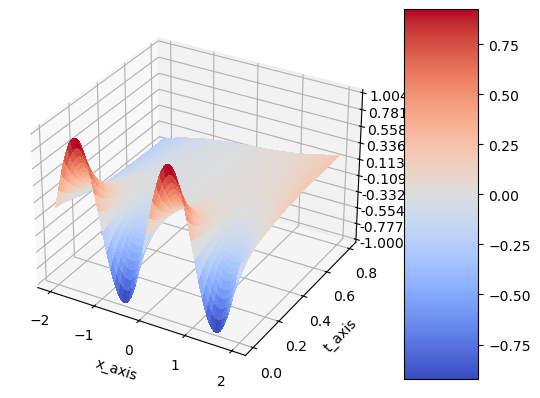

In [59]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.8, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 0.9]$
- training with iteration 20000

In [60]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=0.9, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(0.0001)
1 Training Loss: tensor(9.1912e-05)
2 Training Loss: tensor(0.0002)
3 Training Loss: tensor(0.0001)
4 Training Loss: tensor(0.0001)
5 Training Loss: tensor(0.0001)
6 Training Loss: tensor(0.0001)
7 Training Loss: tensor(0.0002)
8 Training Loss: tensor(0.0002)
9 Training Loss: tensor(6.4956e-05)
10 Training Loss: tensor(0.0001)
11 Training Loss: tensor(0.0002)
12 Training Loss: tensor(9.4965e-05)
13 Training Loss: tensor(7.1151e-05)
14 Training Loss: tensor(0.0002)
15 Training Loss: tensor(0.0002)
16 Training Loss: tensor(5.1615e-05)
17 Training Loss: tensor(9.8498e-05)
18 Training Loss: tensor(0.0001)
19 Training Loss: tensor(0.0001)
20 Training Loss: tensor(4.2038e-05)
21 Training Loss: tensor(0.0001)
22 Training Loss: tensor(0.0002)
23 Training Loss: tensor(8.0944e-05)
24 Training Loss: tensor(6.8331e-05)
25 Training Loss: tensor(7.8201e-05)
26 Training Loss: tensor(8.0134e-05)
27 Training Loss: tensor(6.1361e-05)
28 Training Loss: tensor(6.5892e-05)
2

236 Training Loss: tensor(0.0003)
237 Training Loss: tensor(0.0001)
238 Training Loss: tensor(0.0008)
239 Training Loss: tensor(0.0012)
240 Training Loss: tensor(0.0016)
241 Training Loss: tensor(0.0008)
242 Training Loss: tensor(0.0005)
243 Training Loss: tensor(0.0007)
244 Training Loss: tensor(0.0008)
245 Training Loss: tensor(0.0004)
246 Training Loss: tensor(0.0005)
247 Training Loss: tensor(0.0004)
248 Training Loss: tensor(0.0003)
249 Training Loss: tensor(0.0004)
250 Training Loss: tensor(0.0004)
251 Training Loss: tensor(0.0002)
252 Training Loss: tensor(0.0002)
253 Training Loss: tensor(0.0003)
254 Training Loss: tensor(0.0002)
255 Training Loss: tensor(0.0002)
256 Training Loss: tensor(0.0002)
257 Training Loss: tensor(0.0001)
258 Training Loss: tensor(0.0001)
259 Training Loss: tensor(0.0003)
260 Training Loss: tensor(0.0003)
261 Training Loss: tensor(0.0002)
262 Training Loss: tensor(0.0001)
263 Training Loss: tensor(0.0001)
264 Training Loss: tensor(0.0001)
265 Training L

471 Training Loss: tensor(0.0004)
472 Training Loss: tensor(0.0004)
473 Training Loss: tensor(0.0008)
474 Training Loss: tensor(0.0005)
475 Training Loss: tensor(0.0003)
476 Training Loss: tensor(0.0002)
477 Training Loss: tensor(0.0005)
478 Training Loss: tensor(0.0004)
479 Training Loss: tensor(9.1021e-05)
480 Training Loss: tensor(0.0002)
481 Training Loss: tensor(0.0004)
482 Training Loss: tensor(0.0004)
483 Training Loss: tensor(0.0001)
484 Training Loss: tensor(0.0002)
485 Training Loss: tensor(0.0003)
486 Training Loss: tensor(0.0003)
487 Training Loss: tensor(0.0002)
488 Training Loss: tensor(0.0002)
489 Training Loss: tensor(0.0003)
490 Training Loss: tensor(0.0002)
491 Training Loss: tensor(8.9751e-05)
492 Training Loss: tensor(0.0002)
493 Training Loss: tensor(0.0002)
494 Training Loss: tensor(0.0001)
495 Training Loss: tensor(7.3957e-05)
496 Training Loss: tensor(0.0002)
497 Training Loss: tensor(0.0002)
498 Training Loss: tensor(0.0001)
499 Training Loss: tensor(9.8396e-05

711 Training Loss: tensor(0.0001)
712 Training Loss: tensor(0.0001)
713 Training Loss: tensor(0.0003)
714 Training Loss: tensor(0.0001)
715 Training Loss: tensor(0.0002)
716 Training Loss: tensor(0.0003)
717 Training Loss: tensor(0.0003)
718 Training Loss: tensor(9.6535e-05)
719 Training Loss: tensor(0.0003)
720 Training Loss: tensor(0.0002)
721 Training Loss: tensor(7.3346e-05)
722 Training Loss: tensor(0.0002)
723 Training Loss: tensor(0.0003)
724 Training Loss: tensor(0.0001)
725 Training Loss: tensor(0.0001)
726 Training Loss: tensor(0.0002)
727 Training Loss: tensor(0.0002)
728 Training Loss: tensor(7.0826e-05)
729 Training Loss: tensor(0.0002)
730 Training Loss: tensor(0.0003)
731 Training Loss: tensor(6.9068e-05)
732 Training Loss: tensor(0.0001)
733 Training Loss: tensor(0.0003)
734 Training Loss: tensor(0.0002)
735 Training Loss: tensor(8.4912e-05)
736 Training Loss: tensor(0.0002)
737 Training Loss: tensor(0.0002)
738 Training Loss: tensor(4.5892e-05)
739 Training Loss: tenso

939 Training Loss: tensor(3.3355e-05)
940 Training Loss: tensor(5.1881e-05)
941 Training Loss: tensor(3.1013e-05)
942 Training Loss: tensor(3.0378e-05)
943 Training Loss: tensor(7.2697e-05)
944 Training Loss: tensor(8.3592e-05)
945 Training Loss: tensor(9.7047e-05)
946 Training Loss: tensor(3.4409e-05)
947 Training Loss: tensor(7.4768e-05)
948 Training Loss: tensor(6.0158e-05)
949 Training Loss: tensor(6.2264e-05)
950 Training Loss: tensor(5.0912e-05)
951 Training Loss: tensor(6.1374e-05)
952 Training Loss: tensor(0.0001)
953 Training Loss: tensor(6.8784e-05)
954 Training Loss: tensor(4.4277e-05)
955 Training Loss: tensor(4.0430e-05)
956 Training Loss: tensor(7.7573e-05)
957 Training Loss: tensor(0.0001)
958 Training Loss: tensor(4.4356e-05)
959 Training Loss: tensor(2.7819e-05)
960 Training Loss: tensor(3.2770e-05)
961 Training Loss: tensor(5.0808e-05)
962 Training Loss: tensor(3.4111e-05)
963 Training Loss: tensor(4.2953e-05)
964 Training Loss: tensor(3.0346e-05)
965 Training Loss: t

1169 Training Loss: tensor(0.0003)
1170 Training Loss: tensor(0.0004)
1171 Training Loss: tensor(0.0001)
1172 Training Loss: tensor(0.0003)
1173 Training Loss: tensor(0.0004)
1174 Training Loss: tensor(0.0006)
1175 Training Loss: tensor(0.0003)
1176 Training Loss: tensor(0.0001)
1177 Training Loss: tensor(0.0004)
1178 Training Loss: tensor(0.0005)
1179 Training Loss: tensor(0.0002)
1180 Training Loss: tensor(0.0001)
1181 Training Loss: tensor(0.0004)
1182 Training Loss: tensor(0.0003)
1183 Training Loss: tensor(0.0001)
1184 Training Loss: tensor(0.0001)
1185 Training Loss: tensor(0.0002)
1186 Training Loss: tensor(0.0002)
1187 Training Loss: tensor(0.0002)
1188 Training Loss: tensor(0.0002)
1189 Training Loss: tensor(0.0002)
1190 Training Loss: tensor(0.0002)
1191 Training Loss: tensor(0.0002)
1192 Training Loss: tensor(0.0004)
1193 Training Loss: tensor(0.0007)
1194 Training Loss: tensor(0.0006)
1195 Training Loss: tensor(0.0003)
1196 Training Loss: tensor(0.0003)
1197 Training Loss: 

1399 Training Loss: tensor(6.0539e-05)
1400 Training Loss: tensor(6.8091e-05)
1401 Training Loss: tensor(0.0001)
1402 Training Loss: tensor(0.0002)
1403 Training Loss: tensor(3.7906e-05)
1404 Training Loss: tensor(9.7207e-05)
1405 Training Loss: tensor(0.0001)
1406 Training Loss: tensor(4.7942e-05)
1407 Training Loss: tensor(7.8313e-05)
1408 Training Loss: tensor(0.0001)
1409 Training Loss: tensor(0.0002)
1410 Training Loss: tensor(7.7525e-05)
1411 Training Loss: tensor(0.0002)
1412 Training Loss: tensor(0.0001)
1413 Training Loss: tensor(0.0002)
1414 Training Loss: tensor(6.6162e-05)
1415 Training Loss: tensor(7.6804e-05)
1416 Training Loss: tensor(0.0002)
1417 Training Loss: tensor(0.0002)
1418 Training Loss: tensor(8.7638e-05)
1419 Training Loss: tensor(0.0001)
1420 Training Loss: tensor(0.0001)
1421 Training Loss: tensor(0.0002)
1422 Training Loss: tensor(0.0002)
1423 Training Loss: tensor(0.0001)
1424 Training Loss: tensor(7.3606e-05)
1425 Training Loss: tensor(0.0002)
1426 Traini

1629 Training Loss: tensor(0.0005)
1630 Training Loss: tensor(0.0006)
1631 Training Loss: tensor(0.0012)
1632 Training Loss: tensor(0.0008)
1633 Training Loss: tensor(0.0005)
1634 Training Loss: tensor(0.0008)
1635 Training Loss: tensor(0.0009)
1636 Training Loss: tensor(0.0009)
1637 Training Loss: tensor(0.0004)
1638 Training Loss: tensor(0.0005)
1639 Training Loss: tensor(0.0008)
1640 Training Loss: tensor(0.0004)
1641 Training Loss: tensor(0.0005)
1642 Training Loss: tensor(0.0005)
1643 Training Loss: tensor(0.0005)
1644 Training Loss: tensor(0.0006)
1645 Training Loss: tensor(0.0003)
1646 Training Loss: tensor(0.0005)
1647 Training Loss: tensor(0.0005)
1648 Training Loss: tensor(0.0003)
1649 Training Loss: tensor(0.0004)
1650 Training Loss: tensor(0.0003)
1651 Training Loss: tensor(0.0003)
1652 Training Loss: tensor(0.0004)
1653 Training Loss: tensor(0.0005)
1654 Training Loss: tensor(0.0003)
1655 Training Loss: tensor(0.0003)
1656 Training Loss: tensor(0.0004)
1657 Training Loss: 

1858 Training Loss: tensor(2.7458e-05)
1859 Training Loss: tensor(2.0891e-05)
1860 Training Loss: tensor(3.8645e-05)
1861 Training Loss: tensor(2.0679e-05)
1862 Training Loss: tensor(3.1732e-05)
1863 Training Loss: tensor(2.3543e-05)
1864 Training Loss: tensor(2.2081e-05)
1865 Training Loss: tensor(3.0288e-05)
1866 Training Loss: tensor(4.2061e-05)
1867 Training Loss: tensor(1.3520e-05)
1868 Training Loss: tensor(2.8971e-05)
1869 Training Loss: tensor(3.2480e-05)
1870 Training Loss: tensor(2.1852e-05)
1871 Training Loss: tensor(4.5706e-05)
1872 Training Loss: tensor(1.5921e-05)
1873 Training Loss: tensor(5.0671e-05)
1874 Training Loss: tensor(4.5059e-05)
1875 Training Loss: tensor(2.0409e-05)
1876 Training Loss: tensor(9.9248e-05)
1877 Training Loss: tensor(6.4521e-05)
1878 Training Loss: tensor(5.4823e-05)
1879 Training Loss: tensor(4.8346e-05)
1880 Training Loss: tensor(5.8091e-05)
1881 Training Loss: tensor(2.1638e-05)
1882 Training Loss: tensor(7.1779e-05)
1883 Training Loss: tenso

2081 Training Loss: tensor(0.0001)
2082 Training Loss: tensor(0.0002)
2083 Training Loss: tensor(0.0002)
2084 Training Loss: tensor(8.9667e-05)
2085 Training Loss: tensor(0.0002)
2086 Training Loss: tensor(7.4670e-05)
2087 Training Loss: tensor(0.0002)
2088 Training Loss: tensor(0.0001)
2089 Training Loss: tensor(7.6707e-05)
2090 Training Loss: tensor(0.0002)
2091 Training Loss: tensor(0.0002)
2092 Training Loss: tensor(0.0003)
2093 Training Loss: tensor(0.0001)
2094 Training Loss: tensor(0.0003)
2095 Training Loss: tensor(0.0002)
2096 Training Loss: tensor(0.0003)
2097 Training Loss: tensor(0.0001)
2098 Training Loss: tensor(9.0269e-05)
2099 Training Loss: tensor(0.0002)
2100 Training Loss: tensor(0.0001)
2101 Training Loss: tensor(0.0001)
2102 Training Loss: tensor(0.0002)
2103 Training Loss: tensor(0.0002)
2104 Training Loss: tensor(0.0003)
2105 Training Loss: tensor(9.8438e-05)
2106 Training Loss: tensor(0.0003)
2107 Training Loss: tensor(0.0001)
2108 Training Loss: tensor(9.5057e-

2307 Training Loss: tensor(2.7502e-05)
2308 Training Loss: tensor(3.0989e-05)
2309 Training Loss: tensor(4.1151e-05)
2310 Training Loss: tensor(5.1110e-05)
2311 Training Loss: tensor(3.6564e-05)
2312 Training Loss: tensor(5.9050e-05)
2313 Training Loss: tensor(6.5494e-05)
2314 Training Loss: tensor(7.9377e-05)
2315 Training Loss: tensor(7.6080e-05)
2316 Training Loss: tensor(8.0990e-05)
2317 Training Loss: tensor(5.4438e-05)
2318 Training Loss: tensor(4.7651e-05)
2319 Training Loss: tensor(5.3008e-05)
2320 Training Loss: tensor(9.0214e-05)
2321 Training Loss: tensor(4.9904e-05)
2322 Training Loss: tensor(9.0733e-05)
2323 Training Loss: tensor(0.0002)
2324 Training Loss: tensor(0.0003)
2325 Training Loss: tensor(0.0002)
2326 Training Loss: tensor(0.0002)
2327 Training Loss: tensor(0.0002)
2328 Training Loss: tensor(0.0001)
2329 Training Loss: tensor(0.0002)
2330 Training Loss: tensor(0.0001)
2331 Training Loss: tensor(8.8517e-05)
2332 Training Loss: tensor(0.0001)
2333 Training Loss: te

2527 Training Loss: tensor(8.1190e-05)
2528 Training Loss: tensor(0.0003)
2529 Training Loss: tensor(0.0002)
2530 Training Loss: tensor(0.0003)
2531 Training Loss: tensor(0.0003)
2532 Training Loss: tensor(0.0001)
2533 Training Loss: tensor(0.0001)
2534 Training Loss: tensor(0.0002)
2535 Training Loss: tensor(0.0002)
2536 Training Loss: tensor(9.6612e-05)
2537 Training Loss: tensor(0.0002)
2538 Training Loss: tensor(0.0003)
2539 Training Loss: tensor(0.0004)
2540 Training Loss: tensor(0.0005)
2541 Training Loss: tensor(0.0004)
2542 Training Loss: tensor(0.0002)
2543 Training Loss: tensor(9.2578e-05)
2544 Training Loss: tensor(0.0002)
2545 Training Loss: tensor(0.0002)
2546 Training Loss: tensor(0.0002)
2547 Training Loss: tensor(0.0003)
2548 Training Loss: tensor(0.0003)
2549 Training Loss: tensor(0.0003)
2550 Training Loss: tensor(0.0006)
2551 Training Loss: tensor(0.0006)
2552 Training Loss: tensor(0.0003)
2553 Training Loss: tensor(0.0002)
2554 Training Loss: tensor(0.0003)
2555 Tra

2750 Training Loss: tensor(0.0002)
2751 Training Loss: tensor(7.1358e-05)
2752 Training Loss: tensor(0.0002)
2753 Training Loss: tensor(0.0002)
2754 Training Loss: tensor(0.0002)
2755 Training Loss: tensor(0.0003)
2756 Training Loss: tensor(0.0001)
2757 Training Loss: tensor(0.0002)
2758 Training Loss: tensor(0.0002)
2759 Training Loss: tensor(0.0002)
2760 Training Loss: tensor(0.0001)
2761 Training Loss: tensor(0.0001)
2762 Training Loss: tensor(0.0001)
2763 Training Loss: tensor(0.0002)
2764 Training Loss: tensor(0.0001)
2765 Training Loss: tensor(0.0002)
2766 Training Loss: tensor(7.8989e-05)
2767 Training Loss: tensor(0.0001)
2768 Training Loss: tensor(7.9256e-05)
2769 Training Loss: tensor(0.0001)
2770 Training Loss: tensor(9.7373e-05)
2771 Training Loss: tensor(8.8185e-05)
2772 Training Loss: tensor(7.1487e-05)
2773 Training Loss: tensor(9.3020e-05)
2774 Training Loss: tensor(0.0001)
2775 Training Loss: tensor(0.0003)
2776 Training Loss: tensor(0.0003)
2777 Training Loss: tensor(

2980 Training Loss: tensor(0.0004)
2981 Training Loss: tensor(0.0003)
2982 Training Loss: tensor(0.0003)
2983 Training Loss: tensor(0.0003)
2984 Training Loss: tensor(0.0002)
2985 Training Loss: tensor(0.0003)
2986 Training Loss: tensor(0.0002)
2987 Training Loss: tensor(0.0002)
2988 Training Loss: tensor(0.0001)
2989 Training Loss: tensor(0.0004)
2990 Training Loss: tensor(0.0002)
2991 Training Loss: tensor(0.0002)
2992 Training Loss: tensor(0.0003)
2993 Training Loss: tensor(0.0002)
2994 Training Loss: tensor(0.0002)
2995 Training Loss: tensor(0.0005)
2996 Training Loss: tensor(0.0003)
2997 Training Loss: tensor(0.0009)
2998 Training Loss: tensor(0.0006)
2999 Training Loss: tensor(0.0010)
3000 Training Loss: tensor(0.0005)
3001 Training Loss: tensor(0.0008)
3002 Training Loss: tensor(0.0013)
3003 Training Loss: tensor(0.0009)
3004 Training Loss: tensor(0.0006)
3005 Training Loss: tensor(0.0007)
3006 Training Loss: tensor(0.0007)
3007 Training Loss: tensor(0.0005)
3008 Training Loss: 

3217 Training Loss: tensor(0.0001)
3218 Training Loss: tensor(0.0002)
3219 Training Loss: tensor(0.0002)
3220 Training Loss: tensor(0.0001)
3221 Training Loss: tensor(0.0002)
3222 Training Loss: tensor(0.0001)
3223 Training Loss: tensor(6.8412e-05)
3224 Training Loss: tensor(0.0002)
3225 Training Loss: tensor(0.0001)
3226 Training Loss: tensor(0.0001)
3227 Training Loss: tensor(0.0002)
3228 Training Loss: tensor(0.0001)
3229 Training Loss: tensor(0.0001)
3230 Training Loss: tensor(0.0002)
3231 Training Loss: tensor(0.0001)
3232 Training Loss: tensor(0.0001)
3233 Training Loss: tensor(0.0002)
3234 Training Loss: tensor(0.0003)
3235 Training Loss: tensor(0.0002)
3236 Training Loss: tensor(0.0001)
3237 Training Loss: tensor(0.0002)
3238 Training Loss: tensor(0.0001)
3239 Training Loss: tensor(0.0002)
3240 Training Loss: tensor(0.0001)
3241 Training Loss: tensor(0.0001)
3242 Training Loss: tensor(0.0001)
3243 Training Loss: tensor(0.0001)
3244 Training Loss: tensor(0.0001)
3245 Training Lo

3432 Training Loss: tensor(2.1303e-05)
3433 Training Loss: tensor(9.8918e-06)
3434 Training Loss: tensor(2.0706e-05)
3435 Training Loss: tensor(1.9491e-05)
3436 Training Loss: tensor(2.0756e-05)
3437 Training Loss: tensor(2.3380e-05)
3438 Training Loss: tensor(3.0654e-05)
3439 Training Loss: tensor(2.1087e-05)
3440 Training Loss: tensor(1.2217e-05)
3441 Training Loss: tensor(1.9351e-05)
3442 Training Loss: tensor(2.4126e-05)
3443 Training Loss: tensor(2.1476e-05)
3444 Training Loss: tensor(3.1362e-05)
3445 Training Loss: tensor(1.8110e-05)
3446 Training Loss: tensor(3.3084e-05)
3447 Training Loss: tensor(4.7147e-05)
3448 Training Loss: tensor(3.1661e-05)
3449 Training Loss: tensor(1.7205e-05)
3450 Training Loss: tensor(4.1147e-05)
3451 Training Loss: tensor(2.1280e-05)
3452 Training Loss: tensor(2.1704e-05)
3453 Training Loss: tensor(5.5311e-05)
3454 Training Loss: tensor(4.9516e-05)
3455 Training Loss: tensor(3.0999e-05)
3456 Training Loss: tensor(2.7678e-05)
3457 Training Loss: tenso

3657 Training Loss: tensor(0.0039)
3658 Training Loss: tensor(0.0008)
3659 Training Loss: tensor(0.0039)
3660 Training Loss: tensor(0.0043)
3661 Training Loss: tensor(0.0018)
3662 Training Loss: tensor(0.0024)
3663 Training Loss: tensor(0.0034)
3664 Training Loss: tensor(0.0013)
3665 Training Loss: tensor(0.0050)
3666 Training Loss: tensor(0.0018)
3667 Training Loss: tensor(0.0022)
3668 Training Loss: tensor(0.0044)
3669 Training Loss: tensor(0.0017)
3670 Training Loss: tensor(0.0034)
3671 Training Loss: tensor(0.0028)
3672 Training Loss: tensor(0.0014)
3673 Training Loss: tensor(0.0043)
3674 Training Loss: tensor(0.0025)
3675 Training Loss: tensor(0.0020)
3676 Training Loss: tensor(0.0036)
3677 Training Loss: tensor(0.0025)
3678 Training Loss: tensor(0.0027)
3679 Training Loss: tensor(0.0021)
3680 Training Loss: tensor(0.0028)
3681 Training Loss: tensor(0.0026)
3682 Training Loss: tensor(0.0029)
3683 Training Loss: tensor(0.0025)
3684 Training Loss: tensor(0.0024)
3685 Training Loss: 

3882 Training Loss: tensor(5.3448e-05)
3883 Training Loss: tensor(4.3511e-05)
3884 Training Loss: tensor(1.8378e-05)
3885 Training Loss: tensor(2.3242e-05)
3886 Training Loss: tensor(2.7709e-05)
3887 Training Loss: tensor(1.8129e-05)
3888 Training Loss: tensor(2.4369e-05)
3889 Training Loss: tensor(1.7057e-05)
3890 Training Loss: tensor(2.4086e-05)
3891 Training Loss: tensor(2.3020e-05)
3892 Training Loss: tensor(1.6847e-05)
3893 Training Loss: tensor(4.4734e-05)
3894 Training Loss: tensor(1.4461e-05)
3895 Training Loss: tensor(1.6701e-05)
3896 Training Loss: tensor(4.8978e-05)
3897 Training Loss: tensor(2.5583e-05)
3898 Training Loss: tensor(4.4889e-05)
3899 Training Loss: tensor(7.7869e-05)
3900 Training Loss: tensor(3.0046e-05)
3901 Training Loss: tensor(8.1779e-05)
3902 Training Loss: tensor(2.1834e-05)
3903 Training Loss: tensor(3.3719e-05)
3904 Training Loss: tensor(4.7522e-05)
3905 Training Loss: tensor(2.7570e-05)
3906 Training Loss: tensor(3.0718e-05)
3907 Training Loss: tenso

4103 Training Loss: tensor(4.7370e-05)
4104 Training Loss: tensor(9.8351e-05)
4105 Training Loss: tensor(3.6414e-05)
4106 Training Loss: tensor(8.8182e-05)
4107 Training Loss: tensor(6.9030e-05)
4108 Training Loss: tensor(8.3111e-05)
4109 Training Loss: tensor(4.2562e-05)
4110 Training Loss: tensor(8.6437e-05)
4111 Training Loss: tensor(6.5326e-05)
4112 Training Loss: tensor(3.8287e-05)
4113 Training Loss: tensor(6.3160e-05)
4114 Training Loss: tensor(5.7750e-05)
4115 Training Loss: tensor(8.8861e-05)
4116 Training Loss: tensor(5.7318e-05)
4117 Training Loss: tensor(7.3630e-05)
4118 Training Loss: tensor(5.0560e-05)
4119 Training Loss: tensor(5.9426e-05)
4120 Training Loss: tensor(5.2426e-05)
4121 Training Loss: tensor(4.3519e-05)
4122 Training Loss: tensor(4.8012e-05)
4123 Training Loss: tensor(8.2741e-05)
4124 Training Loss: tensor(5.4129e-05)
4125 Training Loss: tensor(4.7736e-05)
4126 Training Loss: tensor(8.3740e-05)
4127 Training Loss: tensor(7.7873e-05)
4128 Training Loss: tenso

4328 Training Loss: tensor(4.1087e-05)
4329 Training Loss: tensor(6.4751e-05)
4330 Training Loss: tensor(2.5887e-05)
4331 Training Loss: tensor(3.7965e-05)
4332 Training Loss: tensor(9.1168e-05)
4333 Training Loss: tensor(0.0001)
4334 Training Loss: tensor(7.3885e-05)
4335 Training Loss: tensor(6.2666e-05)
4336 Training Loss: tensor(6.8912e-05)
4337 Training Loss: tensor(9.2717e-05)
4338 Training Loss: tensor(3.1468e-05)
4339 Training Loss: tensor(5.9982e-05)
4340 Training Loss: tensor(0.0001)
4341 Training Loss: tensor(0.0001)
4342 Training Loss: tensor(8.2262e-05)
4343 Training Loss: tensor(3.5789e-05)
4344 Training Loss: tensor(7.3648e-05)
4345 Training Loss: tensor(0.0001)
4346 Training Loss: tensor(7.2616e-05)
4347 Training Loss: tensor(3.6830e-05)
4348 Training Loss: tensor(5.3791e-05)
4349 Training Loss: tensor(7.4990e-05)
4350 Training Loss: tensor(7.3239e-05)
4351 Training Loss: tensor(2.3021e-05)
4352 Training Loss: tensor(5.4208e-05)
4353 Training Loss: tensor(4.7062e-05)
43

4558 Training Loss: tensor(0.0003)
4559 Training Loss: tensor(0.0002)
4560 Training Loss: tensor(0.0004)
4561 Training Loss: tensor(0.0002)
4562 Training Loss: tensor(0.0002)
4563 Training Loss: tensor(0.0002)
4564 Training Loss: tensor(0.0002)
4565 Training Loss: tensor(0.0001)
4566 Training Loss: tensor(0.0002)
4567 Training Loss: tensor(0.0002)
4568 Training Loss: tensor(0.0001)
4569 Training Loss: tensor(0.0001)
4570 Training Loss: tensor(0.0002)
4571 Training Loss: tensor(0.0001)
4572 Training Loss: tensor(8.1692e-05)
4573 Training Loss: tensor(0.0003)
4574 Training Loss: tensor(0.0002)
4575 Training Loss: tensor(0.0002)
4576 Training Loss: tensor(0.0002)
4577 Training Loss: tensor(0.0004)
4578 Training Loss: tensor(9.8396e-05)
4579 Training Loss: tensor(0.0001)
4580 Training Loss: tensor(0.0002)
4581 Training Loss: tensor(0.0003)
4582 Training Loss: tensor(0.0002)
4583 Training Loss: tensor(5.7369e-05)
4584 Training Loss: tensor(0.0001)
4585 Training Loss: tensor(0.0003)
4586 Tra

4788 Training Loss: tensor(4.6436e-05)
4789 Training Loss: tensor(0.0001)
4790 Training Loss: tensor(7.3017e-05)
4791 Training Loss: tensor(0.0001)
4792 Training Loss: tensor(9.1558e-05)
4793 Training Loss: tensor(9.9369e-05)
4794 Training Loss: tensor(0.0001)
4795 Training Loss: tensor(0.0002)
4796 Training Loss: tensor(3.4618e-05)
4797 Training Loss: tensor(8.6443e-05)
4798 Training Loss: tensor(0.0002)
4799 Training Loss: tensor(0.0001)
4800 Training Loss: tensor(5.5646e-05)
4801 Training Loss: tensor(8.2730e-05)
4802 Training Loss: tensor(7.4302e-05)
4803 Training Loss: tensor(4.6000e-05)
4804 Training Loss: tensor(5.0440e-05)
4805 Training Loss: tensor(7.4802e-05)
4806 Training Loss: tensor(9.7964e-05)
4807 Training Loss: tensor(4.0977e-05)
4808 Training Loss: tensor(9.4451e-05)
4809 Training Loss: tensor(7.0120e-05)
4810 Training Loss: tensor(5.8349e-05)
4811 Training Loss: tensor(2.6319e-05)
4812 Training Loss: tensor(7.3383e-05)
4813 Training Loss: tensor(7.0899e-05)
4814 Train

5023 Training Loss: tensor(0.0005)
5024 Training Loss: tensor(0.0015)
5025 Training Loss: tensor(0.0008)
5026 Training Loss: tensor(0.0009)
5027 Training Loss: tensor(0.0008)
5028 Training Loss: tensor(0.0006)
5029 Training Loss: tensor(0.0010)
5030 Training Loss: tensor(0.0006)
5031 Training Loss: tensor(0.0008)
5032 Training Loss: tensor(0.0007)
5033 Training Loss: tensor(0.0006)
5034 Training Loss: tensor(0.0006)
5035 Training Loss: tensor(0.0008)
5036 Training Loss: tensor(0.0003)
5037 Training Loss: tensor(0.0005)
5038 Training Loss: tensor(0.0004)
5039 Training Loss: tensor(0.0005)
5040 Training Loss: tensor(0.0004)
5041 Training Loss: tensor(0.0004)
5042 Training Loss: tensor(0.0002)
5043 Training Loss: tensor(0.0003)
5044 Training Loss: tensor(0.0003)
5045 Training Loss: tensor(0.0002)
5046 Training Loss: tensor(0.0002)
5047 Training Loss: tensor(0.0002)
5048 Training Loss: tensor(0.0002)
5049 Training Loss: tensor(0.0003)
5050 Training Loss: tensor(0.0003)
5051 Training Loss: 

5255 Training Loss: tensor(0.0002)
5256 Training Loss: tensor(8.7634e-05)
5257 Training Loss: tensor(0.0001)
5258 Training Loss: tensor(0.0002)
5259 Training Loss: tensor(6.4704e-05)
5260 Training Loss: tensor(8.4190e-05)
5261 Training Loss: tensor(8.1808e-05)
5262 Training Loss: tensor(0.0001)
5263 Training Loss: tensor(7.0104e-05)
5264 Training Loss: tensor(7.7208e-05)
5265 Training Loss: tensor(8.5826e-05)
5266 Training Loss: tensor(6.8025e-05)
5267 Training Loss: tensor(8.0744e-05)
5268 Training Loss: tensor(0.0001)
5269 Training Loss: tensor(0.0001)
5270 Training Loss: tensor(8.6064e-05)
5271 Training Loss: tensor(6.6268e-05)
5272 Training Loss: tensor(8.7131e-05)
5273 Training Loss: tensor(6.8879e-05)
5274 Training Loss: tensor(8.0534e-05)
5275 Training Loss: tensor(0.0001)
5276 Training Loss: tensor(8.8600e-05)
5277 Training Loss: tensor(6.8577e-05)
5278 Training Loss: tensor(0.0001)
5279 Training Loss: tensor(7.0058e-05)
5280 Training Loss: tensor(6.5017e-05)
5281 Training Loss

5483 Training Loss: tensor(0.0015)
5484 Training Loss: tensor(0.0009)
5485 Training Loss: tensor(0.0018)
5486 Training Loss: tensor(0.0013)
5487 Training Loss: tensor(0.0010)
5488 Training Loss: tensor(0.0020)
5489 Training Loss: tensor(0.0010)
5490 Training Loss: tensor(0.0005)
5491 Training Loss: tensor(0.0012)
5492 Training Loss: tensor(0.0005)
5493 Training Loss: tensor(0.0005)
5494 Training Loss: tensor(0.0009)
5495 Training Loss: tensor(0.0006)
5496 Training Loss: tensor(0.0006)
5497 Training Loss: tensor(0.0005)
5498 Training Loss: tensor(0.0004)
5499 Training Loss: tensor(0.0005)
5500 Training Loss: tensor(0.0004)
5501 Training Loss: tensor(0.0004)
5502 Training Loss: tensor(0.0007)
5503 Training Loss: tensor(0.0006)
5504 Training Loss: tensor(0.0003)
5505 Training Loss: tensor(0.0005)
5506 Training Loss: tensor(0.0005)
5507 Training Loss: tensor(0.0003)
5508 Training Loss: tensor(0.0004)
5509 Training Loss: tensor(0.0002)
5510 Training Loss: tensor(0.0003)
5511 Training Loss: 

5703 Training Loss: tensor(4.1582e-05)
5704 Training Loss: tensor(8.8821e-05)
5705 Training Loss: tensor(3.8847e-05)
5706 Training Loss: tensor(5.4656e-05)
5707 Training Loss: tensor(6.9225e-05)
5708 Training Loss: tensor(9.9114e-05)
5709 Training Loss: tensor(9.7580e-05)
5710 Training Loss: tensor(3.6797e-05)
5711 Training Loss: tensor(9.4088e-05)
5712 Training Loss: tensor(3.5456e-05)
5713 Training Loss: tensor(0.0001)
5714 Training Loss: tensor(0.0001)
5715 Training Loss: tensor(3.0042e-05)
5716 Training Loss: tensor(0.0001)
5717 Training Loss: tensor(0.0001)
5718 Training Loss: tensor(0.0001)
5719 Training Loss: tensor(3.6023e-05)
5720 Training Loss: tensor(8.9029e-05)
5721 Training Loss: tensor(0.0001)
5722 Training Loss: tensor(7.5502e-05)
5723 Training Loss: tensor(0.0001)
5724 Training Loss: tensor(0.0003)
5725 Training Loss: tensor(0.0001)
5726 Training Loss: tensor(0.0001)
5727 Training Loss: tensor(0.0002)
5728 Training Loss: tensor(9.6621e-05)
5729 Training Loss: tensor(0.0

5934 Training Loss: tensor(0.0002)
5935 Training Loss: tensor(0.0001)
5936 Training Loss: tensor(0.0001)
5937 Training Loss: tensor(0.0001)
5938 Training Loss: tensor(0.0002)
5939 Training Loss: tensor(0.0002)
5940 Training Loss: tensor(0.0001)
5941 Training Loss: tensor(0.0002)
5942 Training Loss: tensor(9.3351e-05)
5943 Training Loss: tensor(0.0002)
5944 Training Loss: tensor(0.0001)
5945 Training Loss: tensor(0.0001)
5946 Training Loss: tensor(0.0001)
5947 Training Loss: tensor(0.0001)
5948 Training Loss: tensor(8.9349e-05)
5949 Training Loss: tensor(0.0001)
5950 Training Loss: tensor(6.4316e-05)
5951 Training Loss: tensor(5.8213e-05)
5952 Training Loss: tensor(4.5758e-05)
5953 Training Loss: tensor(8.4798e-05)
5954 Training Loss: tensor(0.0001)
5955 Training Loss: tensor(0.0001)
5956 Training Loss: tensor(6.7744e-05)
5957 Training Loss: tensor(4.9034e-05)
5958 Training Loss: tensor(6.4944e-05)
5959 Training Loss: tensor(8.5086e-05)
5960 Training Loss: tensor(4.0083e-05)
5961 Traini

6157 Training Loss: tensor(0.0004)
6158 Training Loss: tensor(0.0004)
6159 Training Loss: tensor(0.0002)
6160 Training Loss: tensor(0.0003)
6161 Training Loss: tensor(0.0005)
6162 Training Loss: tensor(0.0006)
6163 Training Loss: tensor(0.0004)
6164 Training Loss: tensor(0.0001)
6165 Training Loss: tensor(0.0007)
6166 Training Loss: tensor(0.0005)
6167 Training Loss: tensor(0.0006)
6168 Training Loss: tensor(0.0004)
6169 Training Loss: tensor(0.0009)
6170 Training Loss: tensor(0.0003)
6171 Training Loss: tensor(0.0007)
6172 Training Loss: tensor(0.0002)
6173 Training Loss: tensor(0.0003)
6174 Training Loss: tensor(0.0005)
6175 Training Loss: tensor(0.0003)
6176 Training Loss: tensor(0.0005)
6177 Training Loss: tensor(0.0002)
6178 Training Loss: tensor(0.0007)
6179 Training Loss: tensor(0.0005)
6180 Training Loss: tensor(0.0003)
6181 Training Loss: tensor(0.0001)
6182 Training Loss: tensor(0.0002)
6183 Training Loss: tensor(0.0002)
6184 Training Loss: tensor(0.0002)
6185 Training Loss: 

6379 Training Loss: tensor(0.0001)
6380 Training Loss: tensor(6.8179e-05)
6381 Training Loss: tensor(3.7093e-05)
6382 Training Loss: tensor(6.1920e-05)
6383 Training Loss: tensor(9.6147e-05)
6384 Training Loss: tensor(8.9026e-05)
6385 Training Loss: tensor(3.8579e-05)
6386 Training Loss: tensor(4.5091e-05)
6387 Training Loss: tensor(9.2233e-05)
6388 Training Loss: tensor(8.6632e-05)
6389 Training Loss: tensor(0.0001)
6390 Training Loss: tensor(2.6921e-05)
6391 Training Loss: tensor(9.4396e-05)
6392 Training Loss: tensor(8.5392e-05)
6393 Training Loss: tensor(8.9320e-05)
6394 Training Loss: tensor(0.0001)
6395 Training Loss: tensor(0.0001)
6396 Training Loss: tensor(9.7995e-05)
6397 Training Loss: tensor(3.7279e-05)
6398 Training Loss: tensor(0.0001)
6399 Training Loss: tensor(6.1318e-05)
6400 Training Loss: tensor(5.7418e-05)
6401 Training Loss: tensor(9.4083e-05)
6402 Training Loss: tensor(6.0837e-05)
6403 Training Loss: tensor(4.7832e-05)
6404 Training Loss: tensor(7.8953e-05)
6405 T

6609 Training Loss: tensor(0.0012)
6610 Training Loss: tensor(0.0012)
6611 Training Loss: tensor(0.0014)
6612 Training Loss: tensor(0.0004)
6613 Training Loss: tensor(0.0013)
6614 Training Loss: tensor(0.0013)
6615 Training Loss: tensor(0.0010)
6616 Training Loss: tensor(0.0006)
6617 Training Loss: tensor(0.0007)
6618 Training Loss: tensor(0.0008)
6619 Training Loss: tensor(0.0020)
6620 Training Loss: tensor(0.0012)
6621 Training Loss: tensor(0.0029)
6622 Training Loss: tensor(0.0016)
6623 Training Loss: tensor(0.0022)
6624 Training Loss: tensor(0.0036)
6625 Training Loss: tensor(0.0011)
6626 Training Loss: tensor(0.0022)
6627 Training Loss: tensor(0.0022)
6628 Training Loss: tensor(0.0010)
6629 Training Loss: tensor(0.0016)
6630 Training Loss: tensor(0.0020)
6631 Training Loss: tensor(0.0043)
6632 Training Loss: tensor(0.0054)
6633 Training Loss: tensor(0.0014)
6634 Training Loss: tensor(0.0046)
6635 Training Loss: tensor(0.0048)
6636 Training Loss: tensor(0.0021)
6637 Training Loss: 

6833 Training Loss: tensor(2.1975e-05)
6834 Training Loss: tensor(2.9251e-05)
6835 Training Loss: tensor(1.7170e-05)
6836 Training Loss: tensor(1.5114e-05)
6837 Training Loss: tensor(2.1126e-05)
6838 Training Loss: tensor(1.9471e-05)
6839 Training Loss: tensor(2.4046e-05)
6840 Training Loss: tensor(2.0141e-05)
6841 Training Loss: tensor(2.4880e-05)
6842 Training Loss: tensor(2.4666e-05)
6843 Training Loss: tensor(2.3401e-05)
6844 Training Loss: tensor(3.1300e-05)
6845 Training Loss: tensor(3.2661e-05)
6846 Training Loss: tensor(1.6949e-05)
6847 Training Loss: tensor(3.1998e-05)
6848 Training Loss: tensor(2.9114e-05)
6849 Training Loss: tensor(2.5060e-05)
6850 Training Loss: tensor(2.8878e-05)
6851 Training Loss: tensor(2.1770e-05)
6852 Training Loss: tensor(1.8516e-05)
6853 Training Loss: tensor(3.0610e-05)
6854 Training Loss: tensor(2.1114e-05)
6855 Training Loss: tensor(2.1180e-05)
6856 Training Loss: tensor(2.4308e-05)
6857 Training Loss: tensor(1.6592e-05)
6858 Training Loss: tenso

7044 Training Loss: tensor(1.6518e-05)
7045 Training Loss: tensor(2.3042e-05)
7046 Training Loss: tensor(2.3366e-05)
7047 Training Loss: tensor(2.3496e-05)
7048 Training Loss: tensor(2.1925e-05)
7049 Training Loss: tensor(3.0689e-05)
7050 Training Loss: tensor(1.9016e-05)
7051 Training Loss: tensor(1.9482e-05)
7052 Training Loss: tensor(2.7856e-05)
7053 Training Loss: tensor(3.0519e-05)
7054 Training Loss: tensor(3.2639e-05)
7055 Training Loss: tensor(4.7067e-05)
7056 Training Loss: tensor(2.6591e-05)
7057 Training Loss: tensor(5.6566e-05)
7058 Training Loss: tensor(1.7167e-05)
7059 Training Loss: tensor(4.0047e-05)
7060 Training Loss: tensor(3.6125e-05)
7061 Training Loss: tensor(1.7050e-05)
7062 Training Loss: tensor(6.5965e-05)
7063 Training Loss: tensor(2.6968e-05)
7064 Training Loss: tensor(5.0859e-05)
7065 Training Loss: tensor(4.7121e-05)
7066 Training Loss: tensor(5.2468e-05)
7067 Training Loss: tensor(5.8223e-05)
7068 Training Loss: tensor(2.9717e-05)
7069 Training Loss: tenso

7259 Training Loss: tensor(0.0001)
7260 Training Loss: tensor(9.3198e-05)
7261 Training Loss: tensor(0.0001)
7262 Training Loss: tensor(0.0001)
7263 Training Loss: tensor(0.0002)
7264 Training Loss: tensor(8.7674e-05)
7265 Training Loss: tensor(0.0001)
7266 Training Loss: tensor(0.0003)
7267 Training Loss: tensor(9.1469e-05)
7268 Training Loss: tensor(0.0001)
7269 Training Loss: tensor(0.0001)
7270 Training Loss: tensor(0.0001)
7271 Training Loss: tensor(9.6670e-05)
7272 Training Loss: tensor(9.9994e-05)
7273 Training Loss: tensor(0.0002)
7274 Training Loss: tensor(8.4030e-05)
7275 Training Loss: tensor(0.0002)
7276 Training Loss: tensor(0.0003)
7277 Training Loss: tensor(0.0003)
7278 Training Loss: tensor(0.0002)
7279 Training Loss: tensor(7.1299e-05)
7280 Training Loss: tensor(0.0001)
7281 Training Loss: tensor(0.0001)
7282 Training Loss: tensor(9.0743e-05)
7283 Training Loss: tensor(0.0002)
7284 Training Loss: tensor(0.0001)
7285 Training Loss: tensor(0.0003)
7286 Training Loss: ten

7494 Training Loss: tensor(0.0008)
7495 Training Loss: tensor(0.0006)
7496 Training Loss: tensor(0.0002)
7497 Training Loss: tensor(0.0006)
7498 Training Loss: tensor(0.0008)
7499 Training Loss: tensor(0.0003)
7500 Training Loss: tensor(0.0004)
7501 Training Loss: tensor(0.0007)
7502 Training Loss: tensor(0.0006)
7503 Training Loss: tensor(9.9276e-05)
7504 Training Loss: tensor(0.0004)
7505 Training Loss: tensor(0.0004)
7506 Training Loss: tensor(0.0002)
7507 Training Loss: tensor(0.0003)
7508 Training Loss: tensor(0.0003)
7509 Training Loss: tensor(0.0002)
7510 Training Loss: tensor(0.0001)
7511 Training Loss: tensor(0.0002)
7512 Training Loss: tensor(0.0002)
7513 Training Loss: tensor(8.7274e-05)
7514 Training Loss: tensor(0.0001)
7515 Training Loss: tensor(0.0001)
7516 Training Loss: tensor(0.0001)
7517 Training Loss: tensor(5.6004e-05)
7518 Training Loss: tensor(0.0001)
7519 Training Loss: tensor(0.0001)
7520 Training Loss: tensor(5.2812e-05)
7521 Training Loss: tensor(0.0001)
7522

7724 Training Loss: tensor(0.0001)
7725 Training Loss: tensor(0.0002)
7726 Training Loss: tensor(0.0002)
7727 Training Loss: tensor(8.5827e-05)
7728 Training Loss: tensor(0.0002)
7729 Training Loss: tensor(0.0002)
7730 Training Loss: tensor(7.2927e-05)
7731 Training Loss: tensor(0.0001)
7732 Training Loss: tensor(0.0001)
7733 Training Loss: tensor(7.9455e-05)
7734 Training Loss: tensor(0.0001)
7735 Training Loss: tensor(8.1875e-05)
7736 Training Loss: tensor(0.0002)
7737 Training Loss: tensor(6.6615e-05)
7738 Training Loss: tensor(9.0168e-05)
7739 Training Loss: tensor(0.0001)
7740 Training Loss: tensor(7.7370e-05)
7741 Training Loss: tensor(7.2599e-05)
7742 Training Loss: tensor(9.9253e-05)
7743 Training Loss: tensor(0.0001)
7744 Training Loss: tensor(0.0001)
7745 Training Loss: tensor(5.7673e-05)
7746 Training Loss: tensor(0.0002)
7747 Training Loss: tensor(9.5062e-05)
7748 Training Loss: tensor(7.7232e-05)
7749 Training Loss: tensor(0.0002)
7750 Training Loss: tensor(0.0001)
7751 Tr

7940 Training Loss: tensor(3.9380e-05)
7941 Training Loss: tensor(2.4780e-05)
7942 Training Loss: tensor(3.1198e-05)
7943 Training Loss: tensor(4.5426e-05)
7944 Training Loss: tensor(2.4217e-05)
7945 Training Loss: tensor(2.3621e-05)
7946 Training Loss: tensor(1.7990e-05)
7947 Training Loss: tensor(2.6195e-05)
7948 Training Loss: tensor(3.1595e-05)
7949 Training Loss: tensor(3.1429e-05)
7950 Training Loss: tensor(2.4370e-05)
7951 Training Loss: tensor(3.4953e-05)
7952 Training Loss: tensor(4.0750e-05)
7953 Training Loss: tensor(3.7872e-05)
7954 Training Loss: tensor(2.5330e-05)
7955 Training Loss: tensor(1.9512e-05)
7956 Training Loss: tensor(1.8939e-05)
7957 Training Loss: tensor(2.8346e-05)
7958 Training Loss: tensor(1.5729e-05)
7959 Training Loss: tensor(2.2540e-05)
7960 Training Loss: tensor(1.6658e-05)
7961 Training Loss: tensor(1.2909e-05)
7962 Training Loss: tensor(2.1399e-05)
7963 Training Loss: tensor(1.7187e-05)
7964 Training Loss: tensor(2.2068e-05)
7965 Training Loss: tenso

8168 Training Loss: tensor(0.0004)
8169 Training Loss: tensor(0.0005)
8170 Training Loss: tensor(0.0011)
8171 Training Loss: tensor(0.0017)
8172 Training Loss: tensor(0.0011)
8173 Training Loss: tensor(0.0005)
8174 Training Loss: tensor(0.0012)
8175 Training Loss: tensor(0.0021)
8176 Training Loss: tensor(0.0005)
8177 Training Loss: tensor(0.0009)
8178 Training Loss: tensor(0.0019)
8179 Training Loss: tensor(0.0018)
8180 Training Loss: tensor(0.0007)
8181 Training Loss: tensor(0.0009)
8182 Training Loss: tensor(0.0013)
8183 Training Loss: tensor(0.0012)
8184 Training Loss: tensor(0.0011)
8185 Training Loss: tensor(0.0008)
8186 Training Loss: tensor(0.0014)
8187 Training Loss: tensor(0.0024)
8188 Training Loss: tensor(0.0024)
8189 Training Loss: tensor(0.0008)
8190 Training Loss: tensor(0.0010)
8191 Training Loss: tensor(0.0014)
8192 Training Loss: tensor(0.0007)
8193 Training Loss: tensor(0.0008)
8194 Training Loss: tensor(0.0008)
8195 Training Loss: tensor(0.0017)
8196 Training Loss: 

8401 Training Loss: tensor(3.9808e-05)
8402 Training Loss: tensor(4.9125e-05)
8403 Training Loss: tensor(3.4918e-05)
8404 Training Loss: tensor(2.7202e-05)
8405 Training Loss: tensor(8.7051e-05)
8406 Training Loss: tensor(7.6992e-05)
8407 Training Loss: tensor(6.7025e-05)
8408 Training Loss: tensor(7.2896e-05)
8409 Training Loss: tensor(0.0002)
8410 Training Loss: tensor(0.0002)
8411 Training Loss: tensor(0.0002)
8412 Training Loss: tensor(7.1700e-05)
8413 Training Loss: tensor(0.0001)
8414 Training Loss: tensor(0.0002)
8415 Training Loss: tensor(8.6212e-05)
8416 Training Loss: tensor(8.7146e-05)
8417 Training Loss: tensor(0.0002)
8418 Training Loss: tensor(7.2689e-05)
8419 Training Loss: tensor(7.1556e-05)
8420 Training Loss: tensor(0.0002)
8421 Training Loss: tensor(0.0001)
8422 Training Loss: tensor(6.7217e-05)
8423 Training Loss: tensor(5.2667e-05)
8424 Training Loss: tensor(7.1324e-05)
8425 Training Loss: tensor(9.5246e-05)
8426 Training Loss: tensor(5.5674e-05)
8427 Training Loss

8623 Training Loss: tensor(0.0005)
8624 Training Loss: tensor(0.0002)
8625 Training Loss: tensor(0.0003)
8626 Training Loss: tensor(0.0003)
8627 Training Loss: tensor(0.0002)
8628 Training Loss: tensor(0.0007)
8629 Training Loss: tensor(0.0002)
8630 Training Loss: tensor(0.0006)
8631 Training Loss: tensor(0.0004)
8632 Training Loss: tensor(0.0004)
8633 Training Loss: tensor(0.0005)
8634 Training Loss: tensor(0.0002)
8635 Training Loss: tensor(0.0004)
8636 Training Loss: tensor(0.0003)
8637 Training Loss: tensor(0.0004)
8638 Training Loss: tensor(0.0003)
8639 Training Loss: tensor(0.0004)
8640 Training Loss: tensor(0.0004)
8641 Training Loss: tensor(0.0004)
8642 Training Loss: tensor(0.0002)
8643 Training Loss: tensor(0.0002)
8644 Training Loss: tensor(0.0004)
8645 Training Loss: tensor(0.0003)
8646 Training Loss: tensor(0.0002)
8647 Training Loss: tensor(0.0004)
8648 Training Loss: tensor(0.0004)
8649 Training Loss: tensor(0.0002)
8650 Training Loss: tensor(0.0008)
8651 Training Loss: 

8852 Training Loss: tensor(4.5525e-05)
8853 Training Loss: tensor(3.8722e-05)
8854 Training Loss: tensor(3.0089e-05)
8855 Training Loss: tensor(4.7441e-05)
8856 Training Loss: tensor(3.7634e-05)
8857 Training Loss: tensor(4.1298e-05)
8858 Training Loss: tensor(4.6558e-05)
8859 Training Loss: tensor(9.5460e-05)
8860 Training Loss: tensor(3.9031e-05)
8861 Training Loss: tensor(2.2498e-05)
8862 Training Loss: tensor(6.0159e-05)
8863 Training Loss: tensor(6.8609e-05)
8864 Training Loss: tensor(5.5138e-05)
8865 Training Loss: tensor(3.7137e-05)
8866 Training Loss: tensor(6.5069e-05)
8867 Training Loss: tensor(4.6445e-05)
8868 Training Loss: tensor(4.8791e-05)
8869 Training Loss: tensor(9.3500e-05)
8870 Training Loss: tensor(5.0432e-05)
8871 Training Loss: tensor(2.9696e-05)
8872 Training Loss: tensor(5.0924e-05)
8873 Training Loss: tensor(3.7231e-05)
8874 Training Loss: tensor(3.8994e-05)
8875 Training Loss: tensor(4.6423e-05)
8876 Training Loss: tensor(5.7231e-05)
8877 Training Loss: tenso

9069 Training Loss: tensor(0.0001)
9070 Training Loss: tensor(0.0002)
9071 Training Loss: tensor(0.0002)
9072 Training Loss: tensor(0.0002)
9073 Training Loss: tensor(0.0003)
9074 Training Loss: tensor(0.0001)
9075 Training Loss: tensor(0.0002)
9076 Training Loss: tensor(0.0002)
9077 Training Loss: tensor(0.0003)
9078 Training Loss: tensor(0.0003)
9079 Training Loss: tensor(0.0010)
9080 Training Loss: tensor(0.0010)
9081 Training Loss: tensor(0.0004)
9082 Training Loss: tensor(0.0006)
9083 Training Loss: tensor(0.0012)
9084 Training Loss: tensor(0.0023)
9085 Training Loss: tensor(0.0012)
9086 Training Loss: tensor(0.0006)
9087 Training Loss: tensor(0.0007)
9088 Training Loss: tensor(0.0010)
9089 Training Loss: tensor(0.0007)
9090 Training Loss: tensor(0.0002)
9091 Training Loss: tensor(0.0007)
9092 Training Loss: tensor(0.0004)
9093 Training Loss: tensor(0.0002)
9094 Training Loss: tensor(0.0003)
9095 Training Loss: tensor(0.0004)
9096 Training Loss: tensor(0.0003)
9097 Training Loss: 

9308 Training Loss: tensor(0.0005)
9309 Training Loss: tensor(0.0002)
9310 Training Loss: tensor(0.0003)
9311 Training Loss: tensor(0.0003)
9312 Training Loss: tensor(0.0002)
9313 Training Loss: tensor(0.0001)
9314 Training Loss: tensor(0.0001)
9315 Training Loss: tensor(8.8305e-05)
9316 Training Loss: tensor(0.0001)
9317 Training Loss: tensor(0.0001)
9318 Training Loss: tensor(0.0001)
9319 Training Loss: tensor(0.0001)
9320 Training Loss: tensor(6.3936e-05)
9321 Training Loss: tensor(9.7555e-05)
9322 Training Loss: tensor(9.1768e-05)
9323 Training Loss: tensor(6.2106e-05)
9324 Training Loss: tensor(8.4727e-05)
9325 Training Loss: tensor(0.0001)
9326 Training Loss: tensor(0.0001)
9327 Training Loss: tensor(0.0001)
9328 Training Loss: tensor(0.0001)
9329 Training Loss: tensor(0.0002)
9330 Training Loss: tensor(5.4813e-05)
9331 Training Loss: tensor(0.0001)
9332 Training Loss: tensor(0.0002)
9333 Training Loss: tensor(0.0001)
9334 Training Loss: tensor(9.4483e-05)
9335 Training Loss: ten

9525 Training Loss: tensor(4.4940e-05)
9526 Training Loss: tensor(5.7357e-05)
9527 Training Loss: tensor(4.8191e-05)
9528 Training Loss: tensor(4.8447e-05)
9529 Training Loss: tensor(7.7273e-05)
9530 Training Loss: tensor(7.1556e-05)
9531 Training Loss: tensor(8.2913e-05)
9532 Training Loss: tensor(4.5080e-05)
9533 Training Loss: tensor(4.6967e-05)
9534 Training Loss: tensor(5.6651e-05)
9535 Training Loss: tensor(4.2752e-05)
9536 Training Loss: tensor(4.5209e-05)
9537 Training Loss: tensor(4.9659e-05)
9538 Training Loss: tensor(8.9942e-05)
9539 Training Loss: tensor(8.0001e-05)
9540 Training Loss: tensor(7.7165e-05)
9541 Training Loss: tensor(3.6133e-05)
9542 Training Loss: tensor(5.7882e-05)
9543 Training Loss: tensor(7.4486e-05)
9544 Training Loss: tensor(6.4599e-05)
9545 Training Loss: tensor(4.8920e-05)
9546 Training Loss: tensor(8.2772e-05)
9547 Training Loss: tensor(0.0001)
9548 Training Loss: tensor(5.7690e-05)
9549 Training Loss: tensor(6.2050e-05)
9550 Training Loss: tensor(8.

9748 Training Loss: tensor(4.5868e-05)
9749 Training Loss: tensor(3.3036e-05)
9750 Training Loss: tensor(4.2791e-05)
9751 Training Loss: tensor(3.2723e-05)
9752 Training Loss: tensor(2.0326e-05)
9753 Training Loss: tensor(1.6777e-05)
9754 Training Loss: tensor(1.5774e-05)
9755 Training Loss: tensor(1.8576e-05)
9756 Training Loss: tensor(1.5156e-05)
9757 Training Loss: tensor(7.5584e-06)
9758 Training Loss: tensor(1.8518e-05)
9759 Training Loss: tensor(2.1187e-05)
9760 Training Loss: tensor(1.4044e-05)
9761 Training Loss: tensor(1.7302e-05)
9762 Training Loss: tensor(2.5159e-05)
9763 Training Loss: tensor(2.6159e-05)
9764 Training Loss: tensor(2.3455e-05)
9765 Training Loss: tensor(2.4706e-05)
9766 Training Loss: tensor(1.9684e-05)
9767 Training Loss: tensor(2.9485e-05)
9768 Training Loss: tensor(2.4525e-05)
9769 Training Loss: tensor(2.1572e-05)
9770 Training Loss: tensor(4.0640e-05)
9771 Training Loss: tensor(3.3047e-05)
9772 Training Loss: tensor(6.0457e-05)
9773 Training Loss: tenso

9975 Training Loss: tensor(7.0647e-05)
9976 Training Loss: tensor(6.4315e-05)
9977 Training Loss: tensor(9.3566e-05)
9978 Training Loss: tensor(6.4447e-05)
9979 Training Loss: tensor(8.4773e-05)
9980 Training Loss: tensor(4.7928e-05)
9981 Training Loss: tensor(0.0001)
9982 Training Loss: tensor(8.8563e-05)
9983 Training Loss: tensor(7.7159e-05)
9984 Training Loss: tensor(5.1205e-05)
9985 Training Loss: tensor(5.5403e-05)
9986 Training Loss: tensor(9.0262e-05)
9987 Training Loss: tensor(0.0001)
9988 Training Loss: tensor(9.9472e-05)
9989 Training Loss: tensor(4.2271e-05)
9990 Training Loss: tensor(5.5038e-05)
9991 Training Loss: tensor(4.4819e-05)
9992 Training Loss: tensor(4.3227e-05)
9993 Training Loss: tensor(4.8228e-05)
9994 Training Loss: tensor(2.6227e-05)
9995 Training Loss: tensor(4.8701e-05)
9996 Training Loss: tensor(3.6956e-05)
9997 Training Loss: tensor(6.9085e-05)
9998 Training Loss: tensor(6.9746e-05)
9999 Training Loss: tensor(2.5961e-05)
10000 Training Loss: tensor(8.764

10197 Training Loss: tensor(0.0003)
10198 Training Loss: tensor(0.0003)
10199 Training Loss: tensor(0.0003)
10200 Training Loss: tensor(0.0002)
10201 Training Loss: tensor(0.0001)
10202 Training Loss: tensor(0.0002)
10203 Training Loss: tensor(0.0002)
10204 Training Loss: tensor(0.0002)
10205 Training Loss: tensor(0.0002)
10206 Training Loss: tensor(0.0001)
10207 Training Loss: tensor(0.0001)
10208 Training Loss: tensor(0.0003)
10209 Training Loss: tensor(0.0003)
10210 Training Loss: tensor(0.0002)
10211 Training Loss: tensor(0.0002)
10212 Training Loss: tensor(0.0003)
10213 Training Loss: tensor(0.0002)
10214 Training Loss: tensor(7.9325e-05)
10215 Training Loss: tensor(0.0002)
10216 Training Loss: tensor(0.0002)
10217 Training Loss: tensor(0.0001)
10218 Training Loss: tensor(0.0002)
10219 Training Loss: tensor(0.0004)
10220 Training Loss: tensor(0.0004)
10221 Training Loss: tensor(0.0002)
10222 Training Loss: tensor(0.0002)
10223 Training Loss: tensor(0.0003)
10224 Training Loss: ten

10418 Training Loss: tensor(4.2919e-05)
10419 Training Loss: tensor(5.6364e-05)
10420 Training Loss: tensor(7.7989e-05)
10421 Training Loss: tensor(4.4784e-05)
10422 Training Loss: tensor(8.1151e-05)
10423 Training Loss: tensor(7.9506e-05)
10424 Training Loss: tensor(6.9450e-05)
10425 Training Loss: tensor(0.0002)
10426 Training Loss: tensor(6.2433e-05)
10427 Training Loss: tensor(0.0001)
10428 Training Loss: tensor(0.0001)
10429 Training Loss: tensor(0.0002)
10430 Training Loss: tensor(0.0001)
10431 Training Loss: tensor(0.0002)
10432 Training Loss: tensor(0.0002)
10433 Training Loss: tensor(0.0001)
10434 Training Loss: tensor(0.0001)
10435 Training Loss: tensor(0.0002)
10436 Training Loss: tensor(0.0002)
10437 Training Loss: tensor(5.5853e-05)
10438 Training Loss: tensor(0.0001)
10439 Training Loss: tensor(0.0001)
10440 Training Loss: tensor(0.0001)
10441 Training Loss: tensor(0.0001)
10442 Training Loss: tensor(9.1381e-05)
10443 Training Loss: tensor(0.0001)
10444 Training Loss: ten

10646 Training Loss: tensor(0.0006)
10647 Training Loss: tensor(0.0004)
10648 Training Loss: tensor(0.0002)
10649 Training Loss: tensor(0.0005)
10650 Training Loss: tensor(0.0005)
10651 Training Loss: tensor(0.0003)
10652 Training Loss: tensor(0.0002)
10653 Training Loss: tensor(0.0002)
10654 Training Loss: tensor(0.0003)
10655 Training Loss: tensor(0.0002)
10656 Training Loss: tensor(0.0002)
10657 Training Loss: tensor(0.0002)
10658 Training Loss: tensor(0.0002)
10659 Training Loss: tensor(0.0002)
10660 Training Loss: tensor(0.0001)
10661 Training Loss: tensor(0.0001)
10662 Training Loss: tensor(0.0002)
10663 Training Loss: tensor(0.0002)
10664 Training Loss: tensor(0.0002)
10665 Training Loss: tensor(0.0001)
10666 Training Loss: tensor(0.0002)
10667 Training Loss: tensor(0.0001)
10668 Training Loss: tensor(0.0001)
10669 Training Loss: tensor(0.0002)
10670 Training Loss: tensor(8.7718e-05)
10671 Training Loss: tensor(0.0001)
10672 Training Loss: tensor(5.0057e-05)
10673 Training Loss:

10862 Training Loss: tensor(5.2066e-05)
10863 Training Loss: tensor(7.1794e-05)
10864 Training Loss: tensor(6.3413e-05)
10865 Training Loss: tensor(5.3236e-05)
10866 Training Loss: tensor(5.0259e-05)
10867 Training Loss: tensor(8.9325e-05)
10868 Training Loss: tensor(4.3389e-05)
10869 Training Loss: tensor(5.6395e-05)
10870 Training Loss: tensor(5.4434e-05)
10871 Training Loss: tensor(4.0884e-05)
10872 Training Loss: tensor(5.8887e-05)
10873 Training Loss: tensor(5.4841e-05)
10874 Training Loss: tensor(2.2289e-05)
10875 Training Loss: tensor(5.8588e-05)
10876 Training Loss: tensor(5.7416e-05)
10877 Training Loss: tensor(4.6635e-05)
10878 Training Loss: tensor(3.2230e-05)
10879 Training Loss: tensor(3.8220e-05)
10880 Training Loss: tensor(5.3302e-05)
10881 Training Loss: tensor(4.5057e-05)
10882 Training Loss: tensor(3.6820e-05)
10883 Training Loss: tensor(5.0332e-05)
10884 Training Loss: tensor(5.6449e-05)
10885 Training Loss: tensor(3.2693e-05)
10886 Training Loss: tensor(4.1273e-05)


11077 Training Loss: tensor(0.0032)
11078 Training Loss: tensor(0.0067)
11079 Training Loss: tensor(0.0038)
11080 Training Loss: tensor(0.0022)
11081 Training Loss: tensor(0.0017)
11082 Training Loss: tensor(0.0032)
11083 Training Loss: tensor(0.0032)
11084 Training Loss: tensor(0.0029)
11085 Training Loss: tensor(0.0013)
11086 Training Loss: tensor(0.0037)
11087 Training Loss: tensor(0.0035)
11088 Training Loss: tensor(0.0006)
11089 Training Loss: tensor(0.0027)
11090 Training Loss: tensor(0.0026)
11091 Training Loss: tensor(0.0006)
11092 Training Loss: tensor(0.0036)
11093 Training Loss: tensor(0.0041)
11094 Training Loss: tensor(0.0009)
11095 Training Loss: tensor(0.0022)
11096 Training Loss: tensor(0.0020)
11097 Training Loss: tensor(0.0009)
11098 Training Loss: tensor(0.0020)
11099 Training Loss: tensor(0.0018)
11100 Training Loss: tensor(0.0012)
11101 Training Loss: tensor(0.0016)
11102 Training Loss: tensor(0.0012)
11103 Training Loss: tensor(0.0016)
11104 Training Loss: tensor(

11294 Training Loss: tensor(1.1041e-05)
11295 Training Loss: tensor(1.6746e-05)
11296 Training Loss: tensor(1.7556e-05)
11297 Training Loss: tensor(1.4527e-05)
11298 Training Loss: tensor(1.8924e-05)
11299 Training Loss: tensor(2.6906e-05)
11300 Training Loss: tensor(3.0853e-05)
11301 Training Loss: tensor(1.4660e-05)
11302 Training Loss: tensor(3.0192e-05)
11303 Training Loss: tensor(1.9465e-05)
11304 Training Loss: tensor(1.8103e-05)
11305 Training Loss: tensor(1.6178e-05)
11306 Training Loss: tensor(2.0533e-05)
11307 Training Loss: tensor(1.8194e-05)
11308 Training Loss: tensor(1.4530e-05)
11309 Training Loss: tensor(1.8638e-05)
11310 Training Loss: tensor(2.0561e-05)
11311 Training Loss: tensor(3.0720e-05)
11312 Training Loss: tensor(4.0860e-05)
11313 Training Loss: tensor(1.7518e-05)
11314 Training Loss: tensor(2.5581e-05)
11315 Training Loss: tensor(4.8281e-05)
11316 Training Loss: tensor(1.7975e-05)
11317 Training Loss: tensor(3.9347e-05)
11318 Training Loss: tensor(3.7088e-05)


11506 Training Loss: tensor(5.5982e-05)
11507 Training Loss: tensor(4.8383e-05)
11508 Training Loss: tensor(2.7273e-05)
11509 Training Loss: tensor(3.6594e-05)
11510 Training Loss: tensor(6.4201e-05)
11511 Training Loss: tensor(7.1779e-05)
11512 Training Loss: tensor(2.8535e-05)
11513 Training Loss: tensor(3.2634e-05)
11514 Training Loss: tensor(6.8232e-05)
11515 Training Loss: tensor(7.1804e-05)
11516 Training Loss: tensor(2.6572e-05)
11517 Training Loss: tensor(5.5136e-05)
11518 Training Loss: tensor(0.0002)
11519 Training Loss: tensor(0.0002)
11520 Training Loss: tensor(2.6668e-05)
11521 Training Loss: tensor(0.0001)
11522 Training Loss: tensor(0.0002)
11523 Training Loss: tensor(9.7998e-05)
11524 Training Loss: tensor(0.0001)
11525 Training Loss: tensor(0.0003)
11526 Training Loss: tensor(0.0003)
11527 Training Loss: tensor(4.9629e-05)
11528 Training Loss: tensor(0.0001)
11529 Training Loss: tensor(0.0003)
11530 Training Loss: tensor(0.0001)
11531 Training Loss: tensor(6.2692e-05)


11728 Training Loss: tensor(0.0005)
11729 Training Loss: tensor(0.0002)
11730 Training Loss: tensor(0.0003)
11731 Training Loss: tensor(0.0003)
11732 Training Loss: tensor(0.0003)
11733 Training Loss: tensor(0.0002)
11734 Training Loss: tensor(0.0002)
11735 Training Loss: tensor(0.0003)
11736 Training Loss: tensor(0.0002)
11737 Training Loss: tensor(0.0002)
11738 Training Loss: tensor(0.0003)
11739 Training Loss: tensor(0.0002)
11740 Training Loss: tensor(0.0002)
11741 Training Loss: tensor(0.0002)
11742 Training Loss: tensor(0.0002)
11743 Training Loss: tensor(0.0002)
11744 Training Loss: tensor(0.0002)
11745 Training Loss: tensor(0.0003)
11746 Training Loss: tensor(0.0002)
11747 Training Loss: tensor(0.0002)
11748 Training Loss: tensor(0.0001)
11749 Training Loss: tensor(6.4516e-05)
11750 Training Loss: tensor(0.0002)
11751 Training Loss: tensor(8.8746e-05)
11752 Training Loss: tensor(0.0001)
11753 Training Loss: tensor(0.0002)
11754 Training Loss: tensor(0.0001)
11755 Training Loss:

11953 Training Loss: tensor(0.0002)
11954 Training Loss: tensor(0.0003)
11955 Training Loss: tensor(0.0001)
11956 Training Loss: tensor(0.0002)
11957 Training Loss: tensor(0.0002)
11958 Training Loss: tensor(0.0002)
11959 Training Loss: tensor(0.0003)
11960 Training Loss: tensor(5.2292e-05)
11961 Training Loss: tensor(0.0002)
11962 Training Loss: tensor(0.0004)
11963 Training Loss: tensor(0.0003)
11964 Training Loss: tensor(0.0005)
11965 Training Loss: tensor(9.1384e-05)
11966 Training Loss: tensor(0.0003)
11967 Training Loss: tensor(0.0003)
11968 Training Loss: tensor(0.0002)
11969 Training Loss: tensor(0.0002)
11970 Training Loss: tensor(0.0004)
11971 Training Loss: tensor(0.0006)
11972 Training Loss: tensor(0.0002)
11973 Training Loss: tensor(0.0005)
11974 Training Loss: tensor(0.0006)
11975 Training Loss: tensor(0.0009)
11976 Training Loss: tensor(0.0004)
11977 Training Loss: tensor(0.0006)
11978 Training Loss: tensor(0.0002)
11979 Training Loss: tensor(0.0004)
11980 Training Loss:

12183 Training Loss: tensor(0.0010)
12184 Training Loss: tensor(0.0024)
12185 Training Loss: tensor(0.0014)
12186 Training Loss: tensor(0.0009)
12187 Training Loss: tensor(0.0021)
12188 Training Loss: tensor(0.0015)
12189 Training Loss: tensor(0.0012)
12190 Training Loss: tensor(0.0020)
12191 Training Loss: tensor(0.0010)
12192 Training Loss: tensor(0.0009)
12193 Training Loss: tensor(0.0022)
12194 Training Loss: tensor(0.0015)
12195 Training Loss: tensor(0.0016)
12196 Training Loss: tensor(0.0012)
12197 Training Loss: tensor(0.0017)
12198 Training Loss: tensor(0.0022)
12199 Training Loss: tensor(0.0015)
12200 Training Loss: tensor(0.0026)
12201 Training Loss: tensor(0.0008)
12202 Training Loss: tensor(0.0022)
12203 Training Loss: tensor(0.0020)
12204 Training Loss: tensor(0.0015)
12205 Training Loss: tensor(0.0018)
12206 Training Loss: tensor(0.0022)
12207 Training Loss: tensor(0.0016)
12208 Training Loss: tensor(0.0014)
12209 Training Loss: tensor(0.0012)
12210 Training Loss: tensor(

12406 Training Loss: tensor(4.7591e-05)
12407 Training Loss: tensor(1.9211e-05)
12408 Training Loss: tensor(2.3188e-05)
12409 Training Loss: tensor(4.1458e-05)
12410 Training Loss: tensor(2.2300e-05)
12411 Training Loss: tensor(2.7182e-05)
12412 Training Loss: tensor(5.6599e-05)
12413 Training Loss: tensor(3.3048e-05)
12414 Training Loss: tensor(4.0621e-05)
12415 Training Loss: tensor(6.3424e-05)
12416 Training Loss: tensor(2.5280e-05)
12417 Training Loss: tensor(2.1389e-05)
12418 Training Loss: tensor(4.1432e-05)
12419 Training Loss: tensor(2.0248e-05)
12420 Training Loss: tensor(2.1346e-05)
12421 Training Loss: tensor(2.4358e-05)
12422 Training Loss: tensor(1.8969e-05)
12423 Training Loss: tensor(2.1733e-05)
12424 Training Loss: tensor(1.6522e-05)
12425 Training Loss: tensor(3.9565e-05)
12426 Training Loss: tensor(2.9409e-05)
12427 Training Loss: tensor(6.8418e-05)
12428 Training Loss: tensor(1.7238e-05)
12429 Training Loss: tensor(6.0939e-05)
12430 Training Loss: tensor(3.4901e-05)


12617 Training Loss: tensor(0.0001)
12618 Training Loss: tensor(0.0001)
12619 Training Loss: tensor(0.0002)
12620 Training Loss: tensor(0.0002)
12621 Training Loss: tensor(0.0003)
12622 Training Loss: tensor(0.0002)
12623 Training Loss: tensor(8.1894e-05)
12624 Training Loss: tensor(0.0002)
12625 Training Loss: tensor(0.0003)
12626 Training Loss: tensor(7.8160e-05)
12627 Training Loss: tensor(0.0002)
12628 Training Loss: tensor(0.0003)
12629 Training Loss: tensor(0.0002)
12630 Training Loss: tensor(6.8633e-05)
12631 Training Loss: tensor(8.9487e-05)
12632 Training Loss: tensor(0.0001)
12633 Training Loss: tensor(8.3755e-05)
12634 Training Loss: tensor(9.3154e-05)
12635 Training Loss: tensor(0.0001)
12636 Training Loss: tensor(0.0001)
12637 Training Loss: tensor(4.5465e-05)
12638 Training Loss: tensor(6.8530e-05)
12639 Training Loss: tensor(6.7727e-05)
12640 Training Loss: tensor(0.0001)
12641 Training Loss: tensor(7.4211e-05)
12642 Training Loss: tensor(0.0002)
12643 Training Loss: ten

12839 Training Loss: tensor(0.0003)
12840 Training Loss: tensor(0.0003)
12841 Training Loss: tensor(0.0004)
12842 Training Loss: tensor(0.0002)
12843 Training Loss: tensor(0.0003)
12844 Training Loss: tensor(0.0004)
12845 Training Loss: tensor(0.0003)
12846 Training Loss: tensor(0.0003)
12847 Training Loss: tensor(0.0004)
12848 Training Loss: tensor(0.0003)
12849 Training Loss: tensor(0.0003)
12850 Training Loss: tensor(0.0004)
12851 Training Loss: tensor(0.0004)
12852 Training Loss: tensor(0.0002)
12853 Training Loss: tensor(0.0003)
12854 Training Loss: tensor(0.0004)
12855 Training Loss: tensor(0.0006)
12856 Training Loss: tensor(0.0006)
12857 Training Loss: tensor(0.0004)
12858 Training Loss: tensor(0.0004)
12859 Training Loss: tensor(0.0006)
12860 Training Loss: tensor(0.0003)
12861 Training Loss: tensor(0.0004)
12862 Training Loss: tensor(0.0005)
12863 Training Loss: tensor(0.0003)
12864 Training Loss: tensor(0.0004)
12865 Training Loss: tensor(0.0003)
12866 Training Loss: tensor(

13059 Training Loss: tensor(0.0004)
13060 Training Loss: tensor(0.0002)
13061 Training Loss: tensor(0.0008)
13062 Training Loss: tensor(0.0003)
13063 Training Loss: tensor(0.0007)
13064 Training Loss: tensor(0.0010)
13065 Training Loss: tensor(0.0010)
13066 Training Loss: tensor(0.0011)
13067 Training Loss: tensor(0.0008)
13068 Training Loss: tensor(0.0021)
13069 Training Loss: tensor(0.0021)
13070 Training Loss: tensor(0.0012)
13071 Training Loss: tensor(0.0008)
13072 Training Loss: tensor(0.0029)
13073 Training Loss: tensor(0.0029)
13074 Training Loss: tensor(0.0007)
13075 Training Loss: tensor(0.0016)
13076 Training Loss: tensor(0.0036)
13077 Training Loss: tensor(0.0018)
13078 Training Loss: tensor(0.0006)
13079 Training Loss: tensor(0.0009)
13080 Training Loss: tensor(0.0010)
13081 Training Loss: tensor(0.0005)
13082 Training Loss: tensor(0.0004)
13083 Training Loss: tensor(0.0008)
13084 Training Loss: tensor(0.0003)
13085 Training Loss: tensor(0.0006)
13086 Training Loss: tensor(

13282 Training Loss: tensor(6.1749e-05)
13283 Training Loss: tensor(3.6953e-05)
13284 Training Loss: tensor(8.6340e-05)
13285 Training Loss: tensor(4.1039e-05)
13286 Training Loss: tensor(5.2846e-05)
13287 Training Loss: tensor(9.3692e-05)
13288 Training Loss: tensor(5.9752e-05)
13289 Training Loss: tensor(3.9867e-05)
13290 Training Loss: tensor(7.4600e-05)
13291 Training Loss: tensor(9.1494e-05)
13292 Training Loss: tensor(0.0001)
13293 Training Loss: tensor(4.9172e-05)
13294 Training Loss: tensor(7.5134e-05)
13295 Training Loss: tensor(0.0002)
13296 Training Loss: tensor(9.5662e-05)
13297 Training Loss: tensor(5.4772e-05)
13298 Training Loss: tensor(0.0002)
13299 Training Loss: tensor(0.0002)
13300 Training Loss: tensor(0.0002)
13301 Training Loss: tensor(5.4885e-05)
13302 Training Loss: tensor(0.0001)
13303 Training Loss: tensor(0.0002)
13304 Training Loss: tensor(0.0001)
13305 Training Loss: tensor(9.7743e-05)
13306 Training Loss: tensor(0.0002)
13307 Training Loss: tensor(0.0001)


13497 Training Loss: tensor(5.4352e-05)
13498 Training Loss: tensor(3.6398e-05)
13499 Training Loss: tensor(0.0001)
13500 Training Loss: tensor(0.0002)
13501 Training Loss: tensor(0.0001)
13502 Training Loss: tensor(6.2323e-05)
13503 Training Loss: tensor(9.4294e-05)
13504 Training Loss: tensor(0.0001)
13505 Training Loss: tensor(7.6041e-05)
13506 Training Loss: tensor(3.3286e-05)
13507 Training Loss: tensor(3.9369e-05)
13508 Training Loss: tensor(4.7614e-05)
13509 Training Loss: tensor(3.0329e-05)
13510 Training Loss: tensor(4.3438e-05)
13511 Training Loss: tensor(4.0276e-05)
13512 Training Loss: tensor(5.3301e-05)
13513 Training Loss: tensor(5.1663e-05)
13514 Training Loss: tensor(2.5247e-05)
13515 Training Loss: tensor(5.3759e-05)
13516 Training Loss: tensor(3.5528e-05)
13517 Training Loss: tensor(3.4841e-05)
13518 Training Loss: tensor(3.4286e-05)
13519 Training Loss: tensor(3.1293e-05)
13520 Training Loss: tensor(4.9577e-05)
13521 Training Loss: tensor(4.5943e-05)
13522 Training L

13721 Training Loss: tensor(0.0003)
13722 Training Loss: tensor(0.0001)
13723 Training Loss: tensor(0.0005)
13724 Training Loss: tensor(0.0006)
13725 Training Loss: tensor(0.0007)
13726 Training Loss: tensor(0.0002)
13727 Training Loss: tensor(0.0002)
13728 Training Loss: tensor(0.0007)
13729 Training Loss: tensor(0.0012)
13730 Training Loss: tensor(0.0013)
13731 Training Loss: tensor(0.0006)
13732 Training Loss: tensor(0.0002)
13733 Training Loss: tensor(0.0008)
13734 Training Loss: tensor(0.0014)
13735 Training Loss: tensor(0.0011)
13736 Training Loss: tensor(0.0005)
13737 Training Loss: tensor(0.0005)
13738 Training Loss: tensor(0.0006)
13739 Training Loss: tensor(0.0005)
13740 Training Loss: tensor(0.0004)
13741 Training Loss: tensor(0.0005)
13742 Training Loss: tensor(0.0006)
13743 Training Loss: tensor(0.0007)
13744 Training Loss: tensor(0.0004)
13745 Training Loss: tensor(0.0006)
13746 Training Loss: tensor(0.0006)
13747 Training Loss: tensor(0.0004)
13748 Training Loss: tensor(

13946 Training Loss: tensor(0.0001)
13947 Training Loss: tensor(5.8580e-05)
13948 Training Loss: tensor(0.0001)
13949 Training Loss: tensor(0.0002)
13950 Training Loss: tensor(0.0001)
13951 Training Loss: tensor(2.8327e-05)
13952 Training Loss: tensor(0.0001)
13953 Training Loss: tensor(0.0001)
13954 Training Loss: tensor(4.0182e-05)
13955 Training Loss: tensor(9.3059e-05)
13956 Training Loss: tensor(8.0609e-05)
13957 Training Loss: tensor(9.9546e-05)
13958 Training Loss: tensor(9.8287e-05)
13959 Training Loss: tensor(0.0002)
13960 Training Loss: tensor(0.0001)
13961 Training Loss: tensor(6.1467e-05)
13962 Training Loss: tensor(0.0002)
13963 Training Loss: tensor(0.0002)
13964 Training Loss: tensor(7.6817e-05)
13965 Training Loss: tensor(6.4894e-05)
13966 Training Loss: tensor(0.0002)
13967 Training Loss: tensor(8.9297e-05)
13968 Training Loss: tensor(9.4666e-05)
13969 Training Loss: tensor(0.0001)
13970 Training Loss: tensor(0.0001)
13971 Training Loss: tensor(8.3320e-05)
13972 Traini

14168 Training Loss: tensor(5.0872e-05)
14169 Training Loss: tensor(2.3732e-05)
14170 Training Loss: tensor(7.2941e-05)
14171 Training Loss: tensor(5.6895e-05)
14172 Training Loss: tensor(5.1715e-05)
14173 Training Loss: tensor(3.5041e-05)
14174 Training Loss: tensor(4.6727e-05)
14175 Training Loss: tensor(5.2207e-05)
14176 Training Loss: tensor(3.4697e-05)
14177 Training Loss: tensor(4.7689e-05)
14178 Training Loss: tensor(5.5254e-05)
14179 Training Loss: tensor(6.9402e-05)
14180 Training Loss: tensor(3.9783e-05)
14181 Training Loss: tensor(4.5749e-05)
14182 Training Loss: tensor(6.0375e-05)
14183 Training Loss: tensor(6.3881e-05)
14184 Training Loss: tensor(4.1796e-05)
14185 Training Loss: tensor(3.3703e-05)
14186 Training Loss: tensor(4.1249e-05)
14187 Training Loss: tensor(3.9929e-05)
14188 Training Loss: tensor(2.2679e-05)
14189 Training Loss: tensor(4.5551e-05)
14190 Training Loss: tensor(5.4747e-05)
14191 Training Loss: tensor(5.0883e-05)
14192 Training Loss: tensor(3.0190e-05)


14385 Training Loss: tensor(0.0001)
14386 Training Loss: tensor(0.0002)
14387 Training Loss: tensor(0.0002)
14388 Training Loss: tensor(5.5978e-05)
14389 Training Loss: tensor(0.0001)
14390 Training Loss: tensor(0.0002)
14391 Training Loss: tensor(0.0002)
14392 Training Loss: tensor(3.6971e-05)
14393 Training Loss: tensor(9.9547e-05)
14394 Training Loss: tensor(0.0003)
14395 Training Loss: tensor(0.0003)
14396 Training Loss: tensor(0.0002)
14397 Training Loss: tensor(8.4938e-05)
14398 Training Loss: tensor(7.6594e-05)
14399 Training Loss: tensor(0.0002)
14400 Training Loss: tensor(0.0001)
14401 Training Loss: tensor(5.7448e-05)
14402 Training Loss: tensor(0.0001)
14403 Training Loss: tensor(0.0001)
14404 Training Loss: tensor(9.3074e-05)
14405 Training Loss: tensor(8.6356e-05)
14406 Training Loss: tensor(9.3279e-05)
14407 Training Loss: tensor(7.4590e-05)
14408 Training Loss: tensor(8.9654e-05)
14409 Training Loss: tensor(0.0001)
14410 Training Loss: tensor(4.2016e-05)
14411 Training L

14612 Training Loss: tensor(0.0008)
14613 Training Loss: tensor(0.0009)
14614 Training Loss: tensor(0.0006)
14615 Training Loss: tensor(0.0007)
14616 Training Loss: tensor(0.0008)
14617 Training Loss: tensor(0.0007)
14618 Training Loss: tensor(0.0005)
14619 Training Loss: tensor(0.0007)
14620 Training Loss: tensor(0.0004)
14621 Training Loss: tensor(0.0003)
14622 Training Loss: tensor(0.0003)
14623 Training Loss: tensor(0.0006)
14624 Training Loss: tensor(0.0004)
14625 Training Loss: tensor(0.0004)
14626 Training Loss: tensor(0.0004)
14627 Training Loss: tensor(0.0006)
14628 Training Loss: tensor(0.0005)
14629 Training Loss: tensor(0.0002)
14630 Training Loss: tensor(0.0004)
14631 Training Loss: tensor(0.0004)
14632 Training Loss: tensor(0.0003)
14633 Training Loss: tensor(0.0004)
14634 Training Loss: tensor(0.0004)
14635 Training Loss: tensor(0.0003)
14636 Training Loss: tensor(0.0005)
14637 Training Loss: tensor(0.0001)
14638 Training Loss: tensor(0.0006)
14639 Training Loss: tensor(

14835 Training Loss: tensor(4.0783e-05)
14836 Training Loss: tensor(4.2546e-05)
14837 Training Loss: tensor(7.5897e-05)
14838 Training Loss: tensor(9.0216e-05)
14839 Training Loss: tensor(4.1778e-05)
14840 Training Loss: tensor(5.1549e-05)
14841 Training Loss: tensor(7.6897e-05)
14842 Training Loss: tensor(3.5686e-05)
14843 Training Loss: tensor(6.9112e-05)
14844 Training Loss: tensor(8.0404e-05)
14845 Training Loss: tensor(5.2317e-05)
14846 Training Loss: tensor(7.0311e-05)
14847 Training Loss: tensor(3.8585e-05)
14848 Training Loss: tensor(0.0001)
14849 Training Loss: tensor(3.4662e-05)
14850 Training Loss: tensor(8.0001e-05)
14851 Training Loss: tensor(8.0292e-05)
14852 Training Loss: tensor(7.7287e-05)
14853 Training Loss: tensor(4.3188e-05)
14854 Training Loss: tensor(4.5539e-05)
14855 Training Loss: tensor(6.0596e-05)
14856 Training Loss: tensor(5.4275e-05)
14857 Training Loss: tensor(4.7589e-05)
14858 Training Loss: tensor(3.5894e-05)
14859 Training Loss: tensor(7.0852e-05)
1486

15044 Training Loss: tensor(1.7946e-05)
15045 Training Loss: tensor(2.2333e-05)
15046 Training Loss: tensor(2.1409e-05)
15047 Training Loss: tensor(2.6306e-05)
15048 Training Loss: tensor(2.3664e-05)
15049 Training Loss: tensor(1.7676e-05)
15050 Training Loss: tensor(2.0135e-05)
15051 Training Loss: tensor(2.5397e-05)
15052 Training Loss: tensor(2.4243e-05)
15053 Training Loss: tensor(2.3285e-05)
15054 Training Loss: tensor(4.2286e-05)
15055 Training Loss: tensor(5.6678e-05)
15056 Training Loss: tensor(4.9495e-05)
15057 Training Loss: tensor(1.9482e-05)
15058 Training Loss: tensor(1.8409e-05)
15059 Training Loss: tensor(4.2942e-05)
15060 Training Loss: tensor(4.0521e-05)
15061 Training Loss: tensor(3.9786e-05)
15062 Training Loss: tensor(2.0905e-05)
15063 Training Loss: tensor(2.2030e-05)
15064 Training Loss: tensor(4.3024e-05)
15065 Training Loss: tensor(6.4057e-05)
15066 Training Loss: tensor(5.4782e-05)
15067 Training Loss: tensor(1.3732e-05)
15068 Training Loss: tensor(2.9359e-05)


15262 Training Loss: tensor(8.6404e-05)
15263 Training Loss: tensor(0.0002)
15264 Training Loss: tensor(0.0002)
15265 Training Loss: tensor(0.0001)
15266 Training Loss: tensor(6.2921e-05)
15267 Training Loss: tensor(0.0002)
15268 Training Loss: tensor(0.0002)
15269 Training Loss: tensor(0.0002)
15270 Training Loss: tensor(0.0001)
15271 Training Loss: tensor(0.0001)
15272 Training Loss: tensor(0.0002)
15273 Training Loss: tensor(0.0001)
15274 Training Loss: tensor(5.6420e-05)
15275 Training Loss: tensor(8.4640e-05)
15276 Training Loss: tensor(0.0001)
15277 Training Loss: tensor(9.0409e-05)
15278 Training Loss: tensor(0.0001)
15279 Training Loss: tensor(8.1773e-05)
15280 Training Loss: tensor(0.0002)
15281 Training Loss: tensor(0.0001)
15282 Training Loss: tensor(0.0002)
15283 Training Loss: tensor(0.0002)
15284 Training Loss: tensor(6.7273e-05)
15285 Training Loss: tensor(0.0002)
15286 Training Loss: tensor(0.0003)
15287 Training Loss: tensor(0.0002)
15288 Training Loss: tensor(8.3869e-

15484 Training Loss: tensor(0.0001)
15485 Training Loss: tensor(8.0955e-05)
15486 Training Loss: tensor(0.0003)
15487 Training Loss: tensor(0.0001)
15488 Training Loss: tensor(0.0002)
15489 Training Loss: tensor(0.0002)
15490 Training Loss: tensor(9.1657e-05)
15491 Training Loss: tensor(0.0002)
15492 Training Loss: tensor(7.4299e-05)
15493 Training Loss: tensor(0.0002)
15494 Training Loss: tensor(0.0001)
15495 Training Loss: tensor(0.0002)
15496 Training Loss: tensor(6.7518e-05)
15497 Training Loss: tensor(0.0002)
15498 Training Loss: tensor(0.0002)
15499 Training Loss: tensor(0.0003)
15500 Training Loss: tensor(0.0003)
15501 Training Loss: tensor(0.0001)
15502 Training Loss: tensor(0.0002)
15503 Training Loss: tensor(0.0002)
15504 Training Loss: tensor(0.0002)
15505 Training Loss: tensor(0.0002)
15506 Training Loss: tensor(8.4251e-05)
15507 Training Loss: tensor(0.0001)
15508 Training Loss: tensor(0.0001)
15509 Training Loss: tensor(0.0003)
15510 Training Loss: tensor(0.0003)
15511 Tr

15713 Training Loss: tensor(4.8691e-05)
15714 Training Loss: tensor(8.3650e-05)
15715 Training Loss: tensor(7.6546e-05)
15716 Training Loss: tensor(5.0930e-05)
15717 Training Loss: tensor(6.4484e-05)
15718 Training Loss: tensor(0.0001)
15719 Training Loss: tensor(0.0001)
15720 Training Loss: tensor(7.2423e-05)
15721 Training Loss: tensor(0.0001)
15722 Training Loss: tensor(0.0002)
15723 Training Loss: tensor(0.0001)
15724 Training Loss: tensor(2.8364e-05)
15725 Training Loss: tensor(0.0002)
15726 Training Loss: tensor(0.0002)
15727 Training Loss: tensor(5.9702e-05)
15728 Training Loss: tensor(7.0167e-05)
15729 Training Loss: tensor(0.0002)
15730 Training Loss: tensor(5.7544e-05)
15731 Training Loss: tensor(7.5325e-05)
15732 Training Loss: tensor(0.0001)
15733 Training Loss: tensor(0.0001)
15734 Training Loss: tensor(5.5544e-05)
15735 Training Loss: tensor(6.9027e-05)
15736 Training Loss: tensor(7.5179e-05)
15737 Training Loss: tensor(5.4165e-05)
15738 Training Loss: tensor(3.5154e-05)


15936 Training Loss: tensor(0.0002)
15937 Training Loss: tensor(0.0002)
15938 Training Loss: tensor(0.0001)
15939 Training Loss: tensor(0.0001)
15940 Training Loss: tensor(0.0001)
15941 Training Loss: tensor(0.0002)
15942 Training Loss: tensor(0.0003)
15943 Training Loss: tensor(0.0001)
15944 Training Loss: tensor(0.0002)
15945 Training Loss: tensor(0.0004)
15946 Training Loss: tensor(0.0003)
15947 Training Loss: tensor(0.0002)
15948 Training Loss: tensor(0.0002)
15949 Training Loss: tensor(0.0002)
15950 Training Loss: tensor(0.0001)
15951 Training Loss: tensor(0.0003)
15952 Training Loss: tensor(0.0003)
15953 Training Loss: tensor(0.0004)
15954 Training Loss: tensor(0.0004)
15955 Training Loss: tensor(0.0002)
15956 Training Loss: tensor(0.0002)
15957 Training Loss: tensor(0.0001)
15958 Training Loss: tensor(0.0002)
15959 Training Loss: tensor(0.0002)
15960 Training Loss: tensor(0.0002)
15961 Training Loss: tensor(0.0001)
15962 Training Loss: tensor(9.3076e-05)
15963 Training Loss: ten

16161 Training Loss: tensor(0.0002)
16162 Training Loss: tensor(0.0002)
16163 Training Loss: tensor(0.0001)
16164 Training Loss: tensor(0.0001)
16165 Training Loss: tensor(0.0001)
16166 Training Loss: tensor(0.0001)
16167 Training Loss: tensor(0.0002)
16168 Training Loss: tensor(9.2593e-05)
16169 Training Loss: tensor(0.0003)
16170 Training Loss: tensor(0.0002)
16171 Training Loss: tensor(0.0005)
16172 Training Loss: tensor(0.0003)
16173 Training Loss: tensor(7.7429e-05)
16174 Training Loss: tensor(0.0005)
16175 Training Loss: tensor(0.0008)
16176 Training Loss: tensor(0.0004)
16177 Training Loss: tensor(0.0001)
16178 Training Loss: tensor(0.0004)
16179 Training Loss: tensor(0.0007)
16180 Training Loss: tensor(0.0003)
16181 Training Loss: tensor(0.0002)
16182 Training Loss: tensor(0.0007)
16183 Training Loss: tensor(0.0005)
16184 Training Loss: tensor(0.0001)
16185 Training Loss: tensor(0.0003)
16186 Training Loss: tensor(0.0004)
16187 Training Loss: tensor(0.0002)
16188 Training Loss:

16390 Training Loss: tensor(0.0001)
16391 Training Loss: tensor(0.0002)
16392 Training Loss: tensor(0.0003)
16393 Training Loss: tensor(6.4821e-05)
16394 Training Loss: tensor(0.0003)
16395 Training Loss: tensor(0.0002)
16396 Training Loss: tensor(0.0001)
16397 Training Loss: tensor(0.0003)
16398 Training Loss: tensor(0.0001)
16399 Training Loss: tensor(0.0002)
16400 Training Loss: tensor(0.0001)
16401 Training Loss: tensor(0.0002)
16402 Training Loss: tensor(0.0003)
16403 Training Loss: tensor(8.4592e-05)
16404 Training Loss: tensor(0.0002)
16405 Training Loss: tensor(0.0002)
16406 Training Loss: tensor(0.0002)
16407 Training Loss: tensor(0.0002)
16408 Training Loss: tensor(0.0001)
16409 Training Loss: tensor(0.0003)
16410 Training Loss: tensor(0.0002)
16411 Training Loss: tensor(0.0002)
16412 Training Loss: tensor(0.0003)
16413 Training Loss: tensor(4.7088e-05)
16414 Training Loss: tensor(0.0002)
16415 Training Loss: tensor(0.0001)
16416 Training Loss: tensor(6.7088e-05)
16417 Traini

16598 Training Loss: tensor(3.8924e-05)
16599 Training Loss: tensor(4.1613e-05)
16600 Training Loss: tensor(1.8529e-05)
16601 Training Loss: tensor(1.9405e-05)
16602 Training Loss: tensor(3.1443e-05)
16603 Training Loss: tensor(1.8126e-05)
16604 Training Loss: tensor(2.1439e-05)
16605 Training Loss: tensor(2.6589e-05)
16606 Training Loss: tensor(4.9282e-05)
16607 Training Loss: tensor(3.3725e-05)
16608 Training Loss: tensor(1.4314e-05)
16609 Training Loss: tensor(2.1075e-05)
16610 Training Loss: tensor(2.5356e-05)
16611 Training Loss: tensor(8.6511e-05)
16612 Training Loss: tensor(3.3698e-05)
16613 Training Loss: tensor(2.0631e-05)
16614 Training Loss: tensor(6.4987e-05)
16615 Training Loss: tensor(4.2105e-05)
16616 Training Loss: tensor(5.3020e-05)
16617 Training Loss: tensor(4.3444e-05)
16618 Training Loss: tensor(6.4942e-05)
16619 Training Loss: tensor(5.8806e-05)
16620 Training Loss: tensor(2.8961e-05)
16621 Training Loss: tensor(4.7257e-05)
16622 Training Loss: tensor(7.3546e-05)


16808 Training Loss: tensor(4.5048e-05)
16809 Training Loss: tensor(2.8916e-05)
16810 Training Loss: tensor(2.6997e-05)
16811 Training Loss: tensor(3.4043e-05)
16812 Training Loss: tensor(3.4520e-05)
16813 Training Loss: tensor(3.6909e-05)
16814 Training Loss: tensor(4.0997e-05)
16815 Training Loss: tensor(4.7668e-05)
16816 Training Loss: tensor(1.9505e-05)
16817 Training Loss: tensor(4.8746e-05)
16818 Training Loss: tensor(5.4374e-05)
16819 Training Loss: tensor(2.8926e-05)
16820 Training Loss: tensor(3.4775e-05)
16821 Training Loss: tensor(4.9986e-05)
16822 Training Loss: tensor(5.5735e-05)
16823 Training Loss: tensor(5.5112e-05)
16824 Training Loss: tensor(3.5461e-05)
16825 Training Loss: tensor(2.3893e-05)
16826 Training Loss: tensor(4.6818e-05)
16827 Training Loss: tensor(2.8421e-05)
16828 Training Loss: tensor(1.5280e-05)
16829 Training Loss: tensor(3.6825e-05)
16830 Training Loss: tensor(4.0545e-05)
16831 Training Loss: tensor(4.4439e-05)
16832 Training Loss: tensor(3.8705e-05)


17024 Training Loss: tensor(0.0006)
17025 Training Loss: tensor(0.0007)
17026 Training Loss: tensor(0.0008)
17027 Training Loss: tensor(0.0009)
17028 Training Loss: tensor(0.0008)
17029 Training Loss: tensor(0.0010)
17030 Training Loss: tensor(0.0002)
17031 Training Loss: tensor(0.0007)
17032 Training Loss: tensor(0.0007)
17033 Training Loss: tensor(0.0006)
17034 Training Loss: tensor(0.0004)
17035 Training Loss: tensor(0.0007)
17036 Training Loss: tensor(0.0008)
17037 Training Loss: tensor(0.0003)
17038 Training Loss: tensor(0.0004)
17039 Training Loss: tensor(0.0007)
17040 Training Loss: tensor(0.0005)
17041 Training Loss: tensor(0.0002)
17042 Training Loss: tensor(0.0006)
17043 Training Loss: tensor(0.0005)
17044 Training Loss: tensor(0.0002)
17045 Training Loss: tensor(0.0003)
17046 Training Loss: tensor(0.0006)
17047 Training Loss: tensor(0.0004)
17048 Training Loss: tensor(0.0002)
17049 Training Loss: tensor(0.0002)
17050 Training Loss: tensor(0.0003)
17051 Training Loss: tensor(

17253 Training Loss: tensor(0.0003)
17254 Training Loss: tensor(0.0003)
17255 Training Loss: tensor(0.0001)
17256 Training Loss: tensor(0.0002)
17257 Training Loss: tensor(0.0003)
17258 Training Loss: tensor(0.0005)
17259 Training Loss: tensor(0.0005)
17260 Training Loss: tensor(0.0005)
17261 Training Loss: tensor(0.0007)
17262 Training Loss: tensor(0.0003)
17263 Training Loss: tensor(0.0004)
17264 Training Loss: tensor(0.0004)
17265 Training Loss: tensor(0.0006)
17266 Training Loss: tensor(0.0003)
17267 Training Loss: tensor(0.0005)
17268 Training Loss: tensor(0.0002)
17269 Training Loss: tensor(0.0003)
17270 Training Loss: tensor(0.0006)
17271 Training Loss: tensor(0.0002)
17272 Training Loss: tensor(0.0005)
17273 Training Loss: tensor(0.0002)
17274 Training Loss: tensor(0.0004)
17275 Training Loss: tensor(0.0006)
17276 Training Loss: tensor(0.0005)
17277 Training Loss: tensor(0.0006)
17278 Training Loss: tensor(0.0004)
17279 Training Loss: tensor(0.0004)
17280 Training Loss: tensor(

17477 Training Loss: tensor(5.0996e-05)
17478 Training Loss: tensor(0.0001)
17479 Training Loss: tensor(0.0001)
17480 Training Loss: tensor(6.1180e-05)
17481 Training Loss: tensor(4.7500e-05)
17482 Training Loss: tensor(0.0001)
17483 Training Loss: tensor(9.7714e-05)
17484 Training Loss: tensor(8.0126e-05)
17485 Training Loss: tensor(0.0001)
17486 Training Loss: tensor(9.3874e-05)
17487 Training Loss: tensor(0.0001)
17488 Training Loss: tensor(9.6328e-05)
17489 Training Loss: tensor(5.2293e-05)
17490 Training Loss: tensor(0.0001)
17491 Training Loss: tensor(0.0001)
17492 Training Loss: tensor(0.0001)
17493 Training Loss: tensor(7.1771e-05)
17494 Training Loss: tensor(0.0001)
17495 Training Loss: tensor(0.0001)
17496 Training Loss: tensor(0.0002)
17497 Training Loss: tensor(7.6341e-05)
17498 Training Loss: tensor(7.7892e-05)
17499 Training Loss: tensor(0.0001)
17500 Training Loss: tensor(9.5405e-05)
17501 Training Loss: tensor(8.3439e-05)
17502 Training Loss: tensor(0.0001)
17503 Traini

17697 Training Loss: tensor(6.8769e-05)
17698 Training Loss: tensor(8.3325e-05)
17699 Training Loss: tensor(0.0003)
17700 Training Loss: tensor(0.0002)
17701 Training Loss: tensor(0.0004)
17702 Training Loss: tensor(6.2678e-05)
17703 Training Loss: tensor(0.0002)
17704 Training Loss: tensor(0.0002)
17705 Training Loss: tensor(0.0002)
17706 Training Loss: tensor(0.0002)
17707 Training Loss: tensor(0.0002)
17708 Training Loss: tensor(0.0002)
17709 Training Loss: tensor(0.0002)
17710 Training Loss: tensor(0.0002)
17711 Training Loss: tensor(0.0001)
17712 Training Loss: tensor(0.0001)
17713 Training Loss: tensor(0.0002)
17714 Training Loss: tensor(0.0001)
17715 Training Loss: tensor(0.0002)
17716 Training Loss: tensor(0.0001)
17717 Training Loss: tensor(0.0001)
17718 Training Loss: tensor(0.0002)
17719 Training Loss: tensor(0.0003)
17720 Training Loss: tensor(0.0002)
17721 Training Loss: tensor(0.0003)
17722 Training Loss: tensor(0.0001)
17723 Training Loss: tensor(0.0002)
17724 Training L

17920 Training Loss: tensor(0.0001)
17921 Training Loss: tensor(7.6992e-05)
17922 Training Loss: tensor(0.0004)
17923 Training Loss: tensor(0.0006)
17924 Training Loss: tensor(0.0006)
17925 Training Loss: tensor(0.0002)
17926 Training Loss: tensor(0.0002)
17927 Training Loss: tensor(0.0003)
17928 Training Loss: tensor(0.0002)
17929 Training Loss: tensor(0.0001)
17930 Training Loss: tensor(0.0002)
17931 Training Loss: tensor(0.0004)
17932 Training Loss: tensor(0.0003)
17933 Training Loss: tensor(0.0002)
17934 Training Loss: tensor(9.2643e-05)
17935 Training Loss: tensor(0.0002)
17936 Training Loss: tensor(0.0002)
17937 Training Loss: tensor(0.0002)
17938 Training Loss: tensor(0.0002)
17939 Training Loss: tensor(0.0005)
17940 Training Loss: tensor(0.0005)
17941 Training Loss: tensor(0.0007)
17942 Training Loss: tensor(0.0006)
17943 Training Loss: tensor(0.0009)
17944 Training Loss: tensor(0.0003)
17945 Training Loss: tensor(0.0007)
17946 Training Loss: tensor(0.0005)
17947 Training Loss:

18146 Training Loss: tensor(0.0001)
18147 Training Loss: tensor(0.0002)
18148 Training Loss: tensor(5.3920e-05)
18149 Training Loss: tensor(0.0002)
18150 Training Loss: tensor(8.1182e-05)
18151 Training Loss: tensor(0.0001)
18152 Training Loss: tensor(0.0001)
18153 Training Loss: tensor(7.1844e-05)
18154 Training Loss: tensor(0.0002)
18155 Training Loss: tensor(9.8469e-05)
18156 Training Loss: tensor(5.9210e-05)
18157 Training Loss: tensor(0.0002)
18158 Training Loss: tensor(4.5616e-05)
18159 Training Loss: tensor(0.0001)
18160 Training Loss: tensor(0.0002)
18161 Training Loss: tensor(0.0002)
18162 Training Loss: tensor(0.0002)
18163 Training Loss: tensor(4.4696e-05)
18164 Training Loss: tensor(0.0001)
18165 Training Loss: tensor(0.0001)
18166 Training Loss: tensor(3.1563e-05)
18167 Training Loss: tensor(0.0002)
18168 Training Loss: tensor(0.0004)
18169 Training Loss: tensor(0.0005)
18170 Training Loss: tensor(0.0001)
18171 Training Loss: tensor(0.0002)
18172 Training Loss: tensor(0.00

18368 Training Loss: tensor(2.3634e-05)
18369 Training Loss: tensor(2.5450e-05)
18370 Training Loss: tensor(1.7870e-05)
18371 Training Loss: tensor(2.2567e-05)
18372 Training Loss: tensor(2.8745e-05)
18373 Training Loss: tensor(1.3747e-05)
18374 Training Loss: tensor(1.9889e-05)
18375 Training Loss: tensor(2.8424e-05)
18376 Training Loss: tensor(2.0191e-05)
18377 Training Loss: tensor(1.1348e-05)
18378 Training Loss: tensor(1.6482e-05)
18379 Training Loss: tensor(1.3194e-05)
18380 Training Loss: tensor(1.6310e-05)
18381 Training Loss: tensor(1.4283e-05)
18382 Training Loss: tensor(1.8447e-05)
18383 Training Loss: tensor(1.0831e-05)
18384 Training Loss: tensor(1.7294e-05)
18385 Training Loss: tensor(2.1246e-05)
18386 Training Loss: tensor(1.6033e-05)
18387 Training Loss: tensor(1.2581e-05)
18388 Training Loss: tensor(1.2899e-05)
18389 Training Loss: tensor(6.8910e-06)
18390 Training Loss: tensor(2.4114e-05)
18391 Training Loss: tensor(1.8482e-05)
18392 Training Loss: tensor(1.3659e-05)


18583 Training Loss: tensor(5.0430e-05)
18584 Training Loss: tensor(7.2361e-05)
18585 Training Loss: tensor(1.9451e-05)
18586 Training Loss: tensor(2.5476e-05)
18587 Training Loss: tensor(6.6598e-05)
18588 Training Loss: tensor(3.5882e-05)
18589 Training Loss: tensor(3.0571e-05)
18590 Training Loss: tensor(3.4937e-05)
18591 Training Loss: tensor(6.2470e-05)
18592 Training Loss: tensor(3.4671e-05)
18593 Training Loss: tensor(3.2155e-05)
18594 Training Loss: tensor(5.9371e-05)
18595 Training Loss: tensor(9.0457e-05)
18596 Training Loss: tensor(6.2082e-05)
18597 Training Loss: tensor(5.4535e-05)
18598 Training Loss: tensor(6.4421e-05)
18599 Training Loss: tensor(9.8433e-05)
18600 Training Loss: tensor(4.4328e-05)
18601 Training Loss: tensor(9.9633e-05)
18602 Training Loss: tensor(5.2065e-05)
18603 Training Loss: tensor(5.6785e-05)
18604 Training Loss: tensor(4.0961e-05)
18605 Training Loss: tensor(5.8185e-05)
18606 Training Loss: tensor(6.9890e-05)
18607 Training Loss: tensor(4.6157e-05)


18793 Training Loss: tensor(2.6175e-05)
18794 Training Loss: tensor(2.4796e-05)
18795 Training Loss: tensor(2.7897e-05)
18796 Training Loss: tensor(2.0166e-05)
18797 Training Loss: tensor(4.1696e-05)
18798 Training Loss: tensor(8.3975e-05)
18799 Training Loss: tensor(6.3704e-05)
18800 Training Loss: tensor(5.4700e-05)
18801 Training Loss: tensor(3.7164e-05)
18802 Training Loss: tensor(6.0737e-05)
18803 Training Loss: tensor(0.0001)
18804 Training Loss: tensor(0.0001)
18805 Training Loss: tensor(0.0001)
18806 Training Loss: tensor(8.4561e-05)
18807 Training Loss: tensor(4.2081e-05)
18808 Training Loss: tensor(8.9272e-05)
18809 Training Loss: tensor(0.0001)
18810 Training Loss: tensor(8.0107e-05)
18811 Training Loss: tensor(6.8352e-05)
18812 Training Loss: tensor(6.2279e-05)
18813 Training Loss: tensor(0.0001)
18814 Training Loss: tensor(0.0002)
18815 Training Loss: tensor(0.0001)
18816 Training Loss: tensor(0.0002)
18817 Training Loss: tensor(0.0002)
18818 Training Loss: tensor(0.0001)


19020 Training Loss: tensor(0.0005)
19021 Training Loss: tensor(0.0005)
19022 Training Loss: tensor(0.0001)
19023 Training Loss: tensor(0.0004)
19024 Training Loss: tensor(0.0003)
19025 Training Loss: tensor(0.0001)
19026 Training Loss: tensor(0.0003)
19027 Training Loss: tensor(0.0003)
19028 Training Loss: tensor(0.0002)
19029 Training Loss: tensor(0.0004)
19030 Training Loss: tensor(0.0005)
19031 Training Loss: tensor(0.0003)
19032 Training Loss: tensor(0.0003)
19033 Training Loss: tensor(0.0009)
19034 Training Loss: tensor(0.0003)
19035 Training Loss: tensor(0.0002)
19036 Training Loss: tensor(0.0005)
19037 Training Loss: tensor(0.0004)
19038 Training Loss: tensor(0.0002)
19039 Training Loss: tensor(0.0003)
19040 Training Loss: tensor(0.0002)
19041 Training Loss: tensor(0.0002)
19042 Training Loss: tensor(0.0006)
19043 Training Loss: tensor(0.0003)
19044 Training Loss: tensor(0.0003)
19045 Training Loss: tensor(0.0004)
19046 Training Loss: tensor(0.0003)
19047 Training Loss: tensor(

19238 Training Loss: tensor(2.7010e-05)
19239 Training Loss: tensor(3.2707e-05)
19240 Training Loss: tensor(2.1082e-05)
19241 Training Loss: tensor(3.6868e-05)
19242 Training Loss: tensor(2.3436e-05)
19243 Training Loss: tensor(3.5902e-05)
19244 Training Loss: tensor(2.5043e-05)
19245 Training Loss: tensor(2.8688e-05)
19246 Training Loss: tensor(2.6546e-05)
19247 Training Loss: tensor(2.1120e-05)
19248 Training Loss: tensor(2.5517e-05)
19249 Training Loss: tensor(3.2756e-05)
19250 Training Loss: tensor(1.8564e-05)
19251 Training Loss: tensor(2.8291e-05)
19252 Training Loss: tensor(1.3222e-05)
19253 Training Loss: tensor(2.7538e-05)
19254 Training Loss: tensor(3.8875e-05)
19255 Training Loss: tensor(2.8754e-05)
19256 Training Loss: tensor(3.1998e-05)
19257 Training Loss: tensor(2.9076e-05)
19258 Training Loss: tensor(2.8087e-05)
19259 Training Loss: tensor(4.4616e-05)
19260 Training Loss: tensor(2.5335e-05)
19261 Training Loss: tensor(4.2558e-05)
19262 Training Loss: tensor(2.7238e-05)


19457 Training Loss: tensor(0.0005)
19458 Training Loss: tensor(0.0005)
19459 Training Loss: tensor(0.0004)
19460 Training Loss: tensor(0.0006)
19461 Training Loss: tensor(0.0006)
19462 Training Loss: tensor(0.0006)
19463 Training Loss: tensor(0.0003)
19464 Training Loss: tensor(0.0004)
19465 Training Loss: tensor(0.0005)
19466 Training Loss: tensor(0.0002)
19467 Training Loss: tensor(0.0007)
19468 Training Loss: tensor(0.0006)
19469 Training Loss: tensor(0.0006)
19470 Training Loss: tensor(0.0004)
19471 Training Loss: tensor(0.0003)
19472 Training Loss: tensor(0.0003)
19473 Training Loss: tensor(0.0003)
19474 Training Loss: tensor(0.0005)
19475 Training Loss: tensor(0.0005)
19476 Training Loss: tensor(0.0003)
19477 Training Loss: tensor(0.0006)
19478 Training Loss: tensor(0.0004)
19479 Training Loss: tensor(0.0003)
19480 Training Loss: tensor(0.0004)
19481 Training Loss: tensor(0.0003)
19482 Training Loss: tensor(0.0002)
19483 Training Loss: tensor(0.0006)
19484 Training Loss: tensor(

19680 Training Loss: tensor(4.0519e-05)
19681 Training Loss: tensor(2.8665e-05)
19682 Training Loss: tensor(7.7218e-05)
19683 Training Loss: tensor(3.5570e-05)
19684 Training Loss: tensor(4.6565e-05)
19685 Training Loss: tensor(5.3728e-05)
19686 Training Loss: tensor(7.3085e-05)
19687 Training Loss: tensor(6.8326e-05)
19688 Training Loss: tensor(3.8212e-05)
19689 Training Loss: tensor(4.5865e-05)
19690 Training Loss: tensor(9.4710e-05)
19691 Training Loss: tensor(5.9462e-05)
19692 Training Loss: tensor(6.7763e-05)
19693 Training Loss: tensor(8.0824e-05)
19694 Training Loss: tensor(5.1504e-05)
19695 Training Loss: tensor(6.7904e-05)
19696 Training Loss: tensor(7.6111e-05)
19697 Training Loss: tensor(5.8988e-05)
19698 Training Loss: tensor(5.4253e-05)
19699 Training Loss: tensor(6.4258e-05)
19700 Training Loss: tensor(6.1713e-05)
19701 Training Loss: tensor(3.9884e-05)
19702 Training Loss: tensor(5.3777e-05)
19703 Training Loss: tensor(9.4917e-05)
19704 Training Loss: tensor(4.5649e-05)


19885 Training Loss: tensor(3.7352e-05)
19886 Training Loss: tensor(1.9568e-05)
19887 Training Loss: tensor(2.6681e-05)
19888 Training Loss: tensor(3.0979e-05)
19889 Training Loss: tensor(2.3009e-05)
19890 Training Loss: tensor(2.9748e-05)
19891 Training Loss: tensor(2.5357e-05)
19892 Training Loss: tensor(3.3859e-05)
19893 Training Loss: tensor(2.1947e-05)
19894 Training Loss: tensor(2.2159e-05)
19895 Training Loss: tensor(4.7113e-05)
19896 Training Loss: tensor(4.7796e-05)
19897 Training Loss: tensor(3.8472e-05)
19898 Training Loss: tensor(4.6632e-05)
19899 Training Loss: tensor(3.5357e-05)
19900 Training Loss: tensor(1.9144e-05)
19901 Training Loss: tensor(4.6060e-05)
19902 Training Loss: tensor(3.1562e-05)
19903 Training Loss: tensor(2.8591e-05)
19904 Training Loss: tensor(4.0003e-05)
19905 Training Loss: tensor(2.7196e-05)
19906 Training Loss: tensor(3.7449e-05)
19907 Training Loss: tensor(3.0207e-05)
19908 Training Loss: tensor(2.0175e-05)
19909 Training Loss: tensor(3.4066e-05)


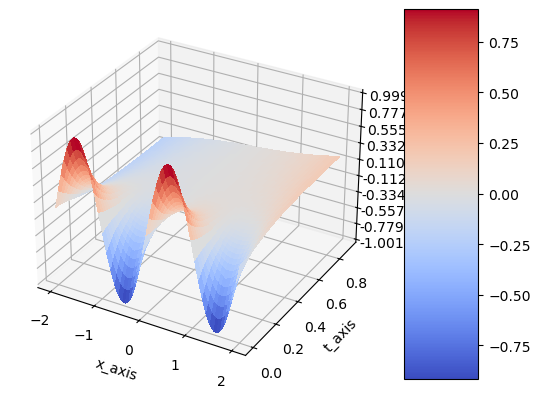

In [61]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 0.9, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.5.2 Fitting model with Time-adaptive approach1 - 1st time step for $t \in [0, 1]$
- training with iteration 20000

In [62]:
# Setting the number of iterations
num_epochs = 20000
#prev_val_loss = 9999999.0 

# Iterating through epochs
for epoch in range(num_epochs):
    # Resetting gradients to zero
    optimizer.zero_grad()

    # Loss calculation based on boundary conditions
    input_x_bc = Variable(x_bc.float(), requires_grad=False).to(device)
    #input_x_bc = Variable(torch.from_numpy(x_bc).float(), requires_grad=False).to(device)
    input_t_bc = Variable(t_bc.float(), requires_grad=False).to(device)
    #input_t_bc = Variable(torch.from_numpy(t_bc).float(), requires_grad=False).to(device)
    
    
    target_u_bc = Variable(u_bc.float(), requires_grad=False).to(device)
    #target_u_bc = Variable(torch.from_numpy(u_bc).float(), requires_grad=False).to(device)
    target_u_initial1 = Variable(u_initial1.float(), requires_grad=False).to(device)
    target_u_initial2 = Variable(u_initial2.float(), requires_grad=False).to(device)

    # Getting network output for boundary condition and initial conditions
    output_bc = net(input_x_bc, input_t_bc)
    output_initial1 = net(input_t_bc, target_u_initial1)
    output_initial2 = net(input_t_bc, target_u_initial2)
    
    mse_u = mse_cost_function(output_bc, target_u_bc)
    mse_initial1 = mse_cost_function(u_initial1, target_u_initial1)
    mse_initial2 = mse_cost_function(u_initial2, target_u_initial2)
    # Loss calculation based on partial differential equation (PDE) 
    collocation_x = np.random.uniform(low= -2.0, high=2.0, size=(500, 1)) 
    collocation_t = np.random.uniform(low=0.0, high=1.0, size=(500, 1))
    all_zeros_target = np.zeros((500, 1))
    
    input_x_collocation = Variable(torch.from_numpy(collocation_x).float(), requires_grad=True).to(device)
    input_t_collocation = Variable(torch.from_numpy(collocation_t).float(), requires_grad=True).to(device)
    target_all_zeros = Variable(torch.from_numpy(all_zeros_target).float(), requires_grad=False).to(device)
    
    # Getting network output for PDE
    output_f = pde_loss(input_x_collocation, input_t_collocation, net)
    mse_f = mse_cost_function(output_f, target_all_zeros)
    
    # Combining the loss functions
    total_loss = mse_u + mse_f + mse_initial1 + mse_initial2
    
    # Backward propagation for computing gradients
    total_loss.backward()
    
    # Optimizer step to update parameters
    optimizer.step()

    with torch.autograd.no_grad():
    	print(epoch, "Training Loss:", total_loss.data)

0 Training Loss: tensor(3.8828e-05)
1 Training Loss: tensor(2.7742e-05)
2 Training Loss: tensor(1.3316e-05)
3 Training Loss: tensor(3.4266e-05)
4 Training Loss: tensor(4.4673e-05)
5 Training Loss: tensor(2.6217e-05)
6 Training Loss: tensor(3.0993e-05)
7 Training Loss: tensor(6.5519e-05)
8 Training Loss: tensor(4.3587e-05)
9 Training Loss: tensor(3.5874e-05)
10 Training Loss: tensor(5.1155e-05)
11 Training Loss: tensor(3.7891e-05)
12 Training Loss: tensor(3.9540e-05)
13 Training Loss: tensor(2.8922e-05)
14 Training Loss: tensor(5.7987e-05)
15 Training Loss: tensor(3.6609e-05)
16 Training Loss: tensor(4.2687e-05)
17 Training Loss: tensor(5.4379e-05)
18 Training Loss: tensor(2.6861e-05)
19 Training Loss: tensor(4.1448e-05)
20 Training Loss: tensor(4.6619e-05)
21 Training Loss: tensor(5.1882e-05)
22 Training Loss: tensor(7.5118e-05)
23 Training Loss: tensor(2.1631e-05)
24 Training Loss: tensor(4.7988e-05)
25 Training Loss: tensor(4.7285e-05)
26 Training Loss: tensor(2.6377e-05)
27 Training

225 Training Loss: tensor(1.4924e-05)
226 Training Loss: tensor(2.2830e-05)
227 Training Loss: tensor(3.0352e-05)
228 Training Loss: tensor(1.9883e-05)
229 Training Loss: tensor(1.6995e-05)
230 Training Loss: tensor(3.1938e-05)
231 Training Loss: tensor(1.9960e-05)
232 Training Loss: tensor(1.8312e-05)
233 Training Loss: tensor(2.7046e-05)
234 Training Loss: tensor(3.2739e-05)
235 Training Loss: tensor(1.4877e-05)
236 Training Loss: tensor(1.7698e-05)
237 Training Loss: tensor(3.3116e-05)
238 Training Loss: tensor(1.8698e-05)
239 Training Loss: tensor(1.9885e-05)
240 Training Loss: tensor(2.6348e-05)
241 Training Loss: tensor(1.8273e-05)
242 Training Loss: tensor(2.8343e-05)
243 Training Loss: tensor(1.1307e-05)
244 Training Loss: tensor(3.2010e-05)
245 Training Loss: tensor(2.6193e-05)
246 Training Loss: tensor(1.2995e-05)
247 Training Loss: tensor(2.6761e-05)
248 Training Loss: tensor(1.7842e-05)
249 Training Loss: tensor(2.2040e-05)
250 Training Loss: tensor(2.6859e-05)
251 Training

448 Training Loss: tensor(0.0002)
449 Training Loss: tensor(0.0002)
450 Training Loss: tensor(0.0003)
451 Training Loss: tensor(9.2376e-05)
452 Training Loss: tensor(0.0002)
453 Training Loss: tensor(0.0003)
454 Training Loss: tensor(7.1313e-05)
455 Training Loss: tensor(0.0001)
456 Training Loss: tensor(0.0002)
457 Training Loss: tensor(0.0001)
458 Training Loss: tensor(0.0001)
459 Training Loss: tensor(0.0002)
460 Training Loss: tensor(0.0002)
461 Training Loss: tensor(8.9829e-05)
462 Training Loss: tensor(0.0001)
463 Training Loss: tensor(0.0001)
464 Training Loss: tensor(0.0001)
465 Training Loss: tensor(0.0001)
466 Training Loss: tensor(0.0002)
467 Training Loss: tensor(8.8199e-05)
468 Training Loss: tensor(0.0001)
469 Training Loss: tensor(0.0002)
470 Training Loss: tensor(0.0001)
471 Training Loss: tensor(0.0002)
472 Training Loss: tensor(0.0002)
473 Training Loss: tensor(7.9028e-05)
474 Training Loss: tensor(0.0001)
475 Training Loss: tensor(9.3450e-05)
476 Training Loss: tenso

673 Training Loss: tensor(7.1244e-05)
674 Training Loss: tensor(0.0001)
675 Training Loss: tensor(9.0536e-05)
676 Training Loss: tensor(0.0001)
677 Training Loss: tensor(0.0001)
678 Training Loss: tensor(0.0001)
679 Training Loss: tensor(0.0001)
680 Training Loss: tensor(0.0001)
681 Training Loss: tensor(6.5610e-05)
682 Training Loss: tensor(0.0001)
683 Training Loss: tensor(8.4768e-05)
684 Training Loss: tensor(8.1082e-05)
685 Training Loss: tensor(5.5321e-05)
686 Training Loss: tensor(8.6101e-05)
687 Training Loss: tensor(8.7972e-05)
688 Training Loss: tensor(9.5524e-05)
689 Training Loss: tensor(0.0001)
690 Training Loss: tensor(9.7612e-05)
691 Training Loss: tensor(9.9311e-05)
692 Training Loss: tensor(0.0001)
693 Training Loss: tensor(9.6069e-05)
694 Training Loss: tensor(6.6870e-05)
695 Training Loss: tensor(0.0001)
696 Training Loss: tensor(0.0001)
697 Training Loss: tensor(3.5232e-05)
698 Training Loss: tensor(9.2626e-05)
699 Training Loss: tensor(6.0057e-05)
700 Training Loss:

910 Training Loss: tensor(0.0034)
911 Training Loss: tensor(0.0011)
912 Training Loss: tensor(0.0032)
913 Training Loss: tensor(0.0011)
914 Training Loss: tensor(0.0020)
915 Training Loss: tensor(0.0030)
916 Training Loss: tensor(0.0007)
917 Training Loss: tensor(0.0021)
918 Training Loss: tensor(0.0017)
919 Training Loss: tensor(0.0007)
920 Training Loss: tensor(0.0026)
921 Training Loss: tensor(0.0021)
922 Training Loss: tensor(0.0010)
923 Training Loss: tensor(0.0016)
924 Training Loss: tensor(0.0014)
925 Training Loss: tensor(0.0007)
926 Training Loss: tensor(0.0027)
927 Training Loss: tensor(0.0023)
928 Training Loss: tensor(0.0017)
929 Training Loss: tensor(0.0026)
930 Training Loss: tensor(0.0023)
931 Training Loss: tensor(0.0015)
932 Training Loss: tensor(0.0061)
933 Training Loss: tensor(0.0028)
934 Training Loss: tensor(0.0013)
935 Training Loss: tensor(0.0044)
936 Training Loss: tensor(0.0020)
937 Training Loss: tensor(0.0017)
938 Training Loss: tensor(0.0017)
939 Training L

1141 Training Loss: tensor(7.0895e-05)
1142 Training Loss: tensor(6.9034e-05)
1143 Training Loss: tensor(4.5990e-05)
1144 Training Loss: tensor(5.4556e-05)
1145 Training Loss: tensor(5.2240e-05)
1146 Training Loss: tensor(4.9220e-05)
1147 Training Loss: tensor(4.3940e-05)
1148 Training Loss: tensor(4.2905e-05)
1149 Training Loss: tensor(5.7583e-05)
1150 Training Loss: tensor(4.0442e-05)
1151 Training Loss: tensor(3.6677e-05)
1152 Training Loss: tensor(2.6435e-05)
1153 Training Loss: tensor(4.3640e-05)
1154 Training Loss: tensor(4.4537e-05)
1155 Training Loss: tensor(1.8473e-05)
1156 Training Loss: tensor(3.2784e-05)
1157 Training Loss: tensor(3.1469e-05)
1158 Training Loss: tensor(1.9822e-05)
1159 Training Loss: tensor(3.2164e-05)
1160 Training Loss: tensor(1.8489e-05)
1161 Training Loss: tensor(2.1972e-05)
1162 Training Loss: tensor(2.8314e-05)
1163 Training Loss: tensor(1.9394e-05)
1164 Training Loss: tensor(2.4868e-05)
1165 Training Loss: tensor(3.0114e-05)
1166 Training Loss: tenso

1355 Training Loss: tensor(2.6594e-05)
1356 Training Loss: tensor(7.5777e-05)
1357 Training Loss: tensor(4.1609e-05)
1358 Training Loss: tensor(6.6978e-05)
1359 Training Loss: tensor(7.1609e-05)
1360 Training Loss: tensor(5.5473e-05)
1361 Training Loss: tensor(0.0002)
1362 Training Loss: tensor(5.2146e-05)
1363 Training Loss: tensor(8.7068e-05)
1364 Training Loss: tensor(0.0001)
1365 Training Loss: tensor(6.6066e-05)
1366 Training Loss: tensor(7.7571e-05)
1367 Training Loss: tensor(8.6883e-05)
1368 Training Loss: tensor(8.7689e-05)
1369 Training Loss: tensor(0.0001)
1370 Training Loss: tensor(0.0001)
1371 Training Loss: tensor(0.0001)
1372 Training Loss: tensor(0.0001)
1373 Training Loss: tensor(9.9315e-05)
1374 Training Loss: tensor(8.2215e-05)
1375 Training Loss: tensor(0.0002)
1376 Training Loss: tensor(0.0001)
1377 Training Loss: tensor(0.0002)
1378 Training Loss: tensor(0.0001)
1379 Training Loss: tensor(0.0002)
1380 Training Loss: tensor(0.0002)
1381 Training Loss: tensor(5.3648e

1576 Training Loss: tensor(0.0002)
1577 Training Loss: tensor(0.0002)
1578 Training Loss: tensor(0.0001)
1579 Training Loss: tensor(0.0001)
1580 Training Loss: tensor(9.2058e-05)
1581 Training Loss: tensor(0.0003)
1582 Training Loss: tensor(0.0003)
1583 Training Loss: tensor(0.0003)
1584 Training Loss: tensor(0.0002)
1585 Training Loss: tensor(0.0003)
1586 Training Loss: tensor(0.0003)
1587 Training Loss: tensor(0.0002)
1588 Training Loss: tensor(0.0003)
1589 Training Loss: tensor(0.0002)
1590 Training Loss: tensor(0.0003)
1591 Training Loss: tensor(0.0001)
1592 Training Loss: tensor(0.0001)
1593 Training Loss: tensor(0.0002)
1594 Training Loss: tensor(0.0002)
1595 Training Loss: tensor(0.0001)
1596 Training Loss: tensor(0.0002)
1597 Training Loss: tensor(0.0003)
1598 Training Loss: tensor(0.0001)
1599 Training Loss: tensor(0.0002)
1600 Training Loss: tensor(0.0003)
1601 Training Loss: tensor(0.0002)
1602 Training Loss: tensor(0.0001)
1603 Training Loss: tensor(0.0002)
1604 Training Lo

1792 Training Loss: tensor(3.0135e-05)
1793 Training Loss: tensor(8.7650e-05)
1794 Training Loss: tensor(7.7240e-05)
1795 Training Loss: tensor(5.2416e-05)
1796 Training Loss: tensor(5.6358e-05)
1797 Training Loss: tensor(9.4580e-05)
1798 Training Loss: tensor(0.0002)
1799 Training Loss: tensor(0.0001)
1800 Training Loss: tensor(0.0001)
1801 Training Loss: tensor(9.4641e-05)
1802 Training Loss: tensor(0.0002)
1803 Training Loss: tensor(0.0002)
1804 Training Loss: tensor(0.0002)
1805 Training Loss: tensor(0.0001)
1806 Training Loss: tensor(6.4398e-05)
1807 Training Loss: tensor(6.1570e-05)
1808 Training Loss: tensor(5.9219e-05)
1809 Training Loss: tensor(8.1778e-05)
1810 Training Loss: tensor(9.8266e-05)
1811 Training Loss: tensor(5.2818e-05)
1812 Training Loss: tensor(5.0685e-05)
1813 Training Loss: tensor(8.0820e-05)
1814 Training Loss: tensor(9.0921e-05)
1815 Training Loss: tensor(3.7741e-05)
1816 Training Loss: tensor(2.6840e-05)
1817 Training Loss: tensor(6.5678e-05)
1818 Training 

2022 Training Loss: tensor(0.0006)
2023 Training Loss: tensor(0.0004)
2024 Training Loss: tensor(0.0007)
2025 Training Loss: tensor(0.0004)
2026 Training Loss: tensor(0.0004)
2027 Training Loss: tensor(0.0008)
2028 Training Loss: tensor(0.0004)
2029 Training Loss: tensor(0.0006)
2030 Training Loss: tensor(0.0006)
2031 Training Loss: tensor(0.0004)
2032 Training Loss: tensor(0.0006)
2033 Training Loss: tensor(0.0005)
2034 Training Loss: tensor(0.0002)
2035 Training Loss: tensor(0.0004)
2036 Training Loss: tensor(0.0008)
2037 Training Loss: tensor(0.0004)
2038 Training Loss: tensor(0.0004)
2039 Training Loss: tensor(0.0004)
2040 Training Loss: tensor(0.0002)
2041 Training Loss: tensor(0.0004)
2042 Training Loss: tensor(0.0005)
2043 Training Loss: tensor(0.0001)
2044 Training Loss: tensor(0.0003)
2045 Training Loss: tensor(0.0004)
2046 Training Loss: tensor(0.0001)
2047 Training Loss: tensor(0.0002)
2048 Training Loss: tensor(0.0003)
2049 Training Loss: tensor(0.0001)
2050 Training Loss: 

2244 Training Loss: tensor(0.0002)
2245 Training Loss: tensor(0.0001)
2246 Training Loss: tensor(0.0002)
2247 Training Loss: tensor(9.3912e-05)
2248 Training Loss: tensor(7.9528e-05)
2249 Training Loss: tensor(0.0001)
2250 Training Loss: tensor(7.0457e-05)
2251 Training Loss: tensor(0.0001)
2252 Training Loss: tensor(0.0001)
2253 Training Loss: tensor(0.0001)
2254 Training Loss: tensor(0.0002)
2255 Training Loss: tensor(9.9556e-05)
2256 Training Loss: tensor(0.0001)
2257 Training Loss: tensor(0.0001)
2258 Training Loss: tensor(7.1709e-05)
2259 Training Loss: tensor(0.0002)
2260 Training Loss: tensor(0.0001)
2261 Training Loss: tensor(0.0001)
2262 Training Loss: tensor(8.9726e-05)
2263 Training Loss: tensor(0.0001)
2264 Training Loss: tensor(0.0002)
2265 Training Loss: tensor(7.0512e-05)
2266 Training Loss: tensor(0.0003)
2267 Training Loss: tensor(8.3769e-05)
2268 Training Loss: tensor(0.0001)
2269 Training Loss: tensor(0.0001)
2270 Training Loss: tensor(0.0002)
2271 Training Loss: ten

2473 Training Loss: tensor(4.9401e-05)
2474 Training Loss: tensor(0.0001)
2475 Training Loss: tensor(0.0002)
2476 Training Loss: tensor(6.2629e-05)
2477 Training Loss: tensor(0.0001)
2478 Training Loss: tensor(0.0001)
2479 Training Loss: tensor(5.2349e-05)
2480 Training Loss: tensor(9.0296e-05)
2481 Training Loss: tensor(7.6683e-05)
2482 Training Loss: tensor(5.9876e-05)
2483 Training Loss: tensor(7.7033e-05)
2484 Training Loss: tensor(0.0001)
2485 Training Loss: tensor(6.1803e-05)
2486 Training Loss: tensor(6.8412e-05)
2487 Training Loss: tensor(4.8740e-05)
2488 Training Loss: tensor(5.7455e-05)
2489 Training Loss: tensor(4.5129e-05)
2490 Training Loss: tensor(8.1549e-05)
2491 Training Loss: tensor(0.0001)
2492 Training Loss: tensor(4.3535e-05)
2493 Training Loss: tensor(6.4076e-05)
2494 Training Loss: tensor(8.3606e-05)
2495 Training Loss: tensor(6.0083e-05)
2496 Training Loss: tensor(3.4804e-05)
2497 Training Loss: tensor(5.4468e-05)
2498 Training Loss: tensor(6.3548e-05)
2499 Train

2696 Training Loss: tensor(0.0001)
2697 Training Loss: tensor(0.0001)
2698 Training Loss: tensor(0.0001)
2699 Training Loss: tensor(7.8698e-05)
2700 Training Loss: tensor(6.0263e-05)
2701 Training Loss: tensor(6.7760e-05)
2702 Training Loss: tensor(9.1882e-05)
2703 Training Loss: tensor(8.1498e-05)
2704 Training Loss: tensor(6.8839e-05)
2705 Training Loss: tensor(6.0115e-05)
2706 Training Loss: tensor(3.7875e-05)
2707 Training Loss: tensor(7.0725e-05)
2708 Training Loss: tensor(9.3637e-05)
2709 Training Loss: tensor(2.8466e-05)
2710 Training Loss: tensor(7.2647e-05)
2711 Training Loss: tensor(0.0002)
2712 Training Loss: tensor(0.0003)
2713 Training Loss: tensor(0.0002)
2714 Training Loss: tensor(2.4581e-05)
2715 Training Loss: tensor(0.0001)
2716 Training Loss: tensor(0.0002)
2717 Training Loss: tensor(9.7172e-05)
2718 Training Loss: tensor(4.5568e-05)
2719 Training Loss: tensor(6.1389e-05)
2720 Training Loss: tensor(8.5215e-05)
2721 Training Loss: tensor(7.9931e-05)
2722 Training Loss

2920 Training Loss: tensor(0.0005)
2921 Training Loss: tensor(0.0004)
2922 Training Loss: tensor(0.0004)
2923 Training Loss: tensor(0.0002)
2924 Training Loss: tensor(0.0003)
2925 Training Loss: tensor(0.0003)
2926 Training Loss: tensor(0.0002)
2927 Training Loss: tensor(0.0002)
2928 Training Loss: tensor(0.0004)
2929 Training Loss: tensor(0.0002)
2930 Training Loss: tensor(0.0003)
2931 Training Loss: tensor(0.0003)
2932 Training Loss: tensor(0.0003)
2933 Training Loss: tensor(0.0003)
2934 Training Loss: tensor(0.0003)
2935 Training Loss: tensor(0.0005)
2936 Training Loss: tensor(0.0003)
2937 Training Loss: tensor(0.0002)
2938 Training Loss: tensor(0.0002)
2939 Training Loss: tensor(0.0003)
2940 Training Loss: tensor(0.0002)
2941 Training Loss: tensor(8.8929e-05)
2942 Training Loss: tensor(0.0001)
2943 Training Loss: tensor(0.0002)
2944 Training Loss: tensor(0.0001)
2945 Training Loss: tensor(0.0001)
2946 Training Loss: tensor(0.0002)
2947 Training Loss: tensor(0.0002)
2948 Training Lo

3147 Training Loss: tensor(0.0016)
3148 Training Loss: tensor(0.0007)
3149 Training Loss: tensor(0.0004)
3150 Training Loss: tensor(0.0013)
3151 Training Loss: tensor(0.0013)
3152 Training Loss: tensor(0.0005)
3153 Training Loss: tensor(0.0009)
3154 Training Loss: tensor(0.0013)
3155 Training Loss: tensor(0.0010)
3156 Training Loss: tensor(0.0006)
3157 Training Loss: tensor(0.0014)
3158 Training Loss: tensor(0.0012)
3159 Training Loss: tensor(0.0006)
3160 Training Loss: tensor(0.0007)
3161 Training Loss: tensor(0.0008)
3162 Training Loss: tensor(0.0007)
3163 Training Loss: tensor(0.0005)
3164 Training Loss: tensor(0.0005)
3165 Training Loss: tensor(0.0007)
3166 Training Loss: tensor(0.0004)
3167 Training Loss: tensor(0.0006)
3168 Training Loss: tensor(0.0004)
3169 Training Loss: tensor(0.0003)
3170 Training Loss: tensor(0.0005)
3171 Training Loss: tensor(0.0002)
3172 Training Loss: tensor(0.0004)
3173 Training Loss: tensor(0.0002)
3174 Training Loss: tensor(0.0003)
3175 Training Loss: 

3382 Training Loss: tensor(5.7898e-05)
3383 Training Loss: tensor(6.7342e-05)
3384 Training Loss: tensor(3.1084e-05)
3385 Training Loss: tensor(3.7353e-05)
3386 Training Loss: tensor(7.0338e-05)
3387 Training Loss: tensor(6.1354e-05)
3388 Training Loss: tensor(2.3156e-05)
3389 Training Loss: tensor(5.8481e-05)
3390 Training Loss: tensor(8.4493e-05)
3391 Training Loss: tensor(1.9059e-05)
3392 Training Loss: tensor(5.9189e-05)
3393 Training Loss: tensor(6.3767e-05)
3394 Training Loss: tensor(3.0607e-05)
3395 Training Loss: tensor(5.7985e-05)
3396 Training Loss: tensor(8.3417e-05)
3397 Training Loss: tensor(9.1247e-05)
3398 Training Loss: tensor(2.5209e-05)
3399 Training Loss: tensor(7.0529e-05)
3400 Training Loss: tensor(0.0001)
3401 Training Loss: tensor(6.1993e-05)
3402 Training Loss: tensor(6.4887e-05)
3403 Training Loss: tensor(4.4600e-05)
3404 Training Loss: tensor(6.4982e-05)
3405 Training Loss: tensor(4.1503e-05)
3406 Training Loss: tensor(0.0001)
3407 Training Loss: tensor(0.0001

3601 Training Loss: tensor(8.3567e-05)
3602 Training Loss: tensor(0.0002)
3603 Training Loss: tensor(0.0002)
3604 Training Loss: tensor(9.9722e-05)
3605 Training Loss: tensor(7.0627e-05)
3606 Training Loss: tensor(0.0001)
3607 Training Loss: tensor(0.0001)
3608 Training Loss: tensor(9.5230e-05)
3609 Training Loss: tensor(0.0002)
3610 Training Loss: tensor(8.8795e-05)
3611 Training Loss: tensor(0.0001)
3612 Training Loss: tensor(0.0002)
3613 Training Loss: tensor(0.0001)
3614 Training Loss: tensor(5.7863e-05)
3615 Training Loss: tensor(0.0002)
3616 Training Loss: tensor(0.0002)
3617 Training Loss: tensor(0.0001)
3618 Training Loss: tensor(0.0003)
3619 Training Loss: tensor(0.0001)
3620 Training Loss: tensor(0.0003)
3621 Training Loss: tensor(0.0003)
3622 Training Loss: tensor(0.0003)
3623 Training Loss: tensor(0.0001)
3624 Training Loss: tensor(0.0004)
3625 Training Loss: tensor(0.0004)
3626 Training Loss: tensor(0.0001)
3627 Training Loss: tensor(0.0003)
3628 Training Loss: tensor(0.00

3829 Training Loss: tensor(3.1660e-05)
3830 Training Loss: tensor(3.0663e-05)
3831 Training Loss: tensor(3.2234e-05)
3832 Training Loss: tensor(3.9062e-05)
3833 Training Loss: tensor(1.8023e-05)
3834 Training Loss: tensor(4.4964e-05)
3835 Training Loss: tensor(4.5014e-05)
3836 Training Loss: tensor(3.2816e-05)
3837 Training Loss: tensor(3.3560e-05)
3838 Training Loss: tensor(2.0231e-05)
3839 Training Loss: tensor(6.2714e-05)
3840 Training Loss: tensor(3.5385e-05)
3841 Training Loss: tensor(3.7457e-05)
3842 Training Loss: tensor(4.7141e-05)
3843 Training Loss: tensor(6.4458e-05)
3844 Training Loss: tensor(4.4639e-05)
3845 Training Loss: tensor(4.2493e-05)
3846 Training Loss: tensor(8.9683e-05)
3847 Training Loss: tensor(3.7353e-05)
3848 Training Loss: tensor(5.5715e-05)
3849 Training Loss: tensor(6.3434e-05)
3850 Training Loss: tensor(3.1543e-05)
3851 Training Loss: tensor(5.4314e-05)
3852 Training Loss: tensor(2.9926e-05)
3853 Training Loss: tensor(5.0952e-05)
3854 Training Loss: tenso

4059 Training Loss: tensor(7.6172e-05)
4060 Training Loss: tensor(7.6418e-05)
4061 Training Loss: tensor(0.0001)
4062 Training Loss: tensor(6.5768e-05)
4063 Training Loss: tensor(7.8984e-05)
4064 Training Loss: tensor(8.6827e-05)
4065 Training Loss: tensor(0.0001)
4066 Training Loss: tensor(7.2460e-05)
4067 Training Loss: tensor(0.0001)
4068 Training Loss: tensor(7.3577e-05)
4069 Training Loss: tensor(7.5559e-05)
4070 Training Loss: tensor(9.4649e-05)
4071 Training Loss: tensor(9.8774e-05)
4072 Training Loss: tensor(6.1842e-05)
4073 Training Loss: tensor(8.8664e-05)
4074 Training Loss: tensor(7.7936e-05)
4075 Training Loss: tensor(0.0001)
4076 Training Loss: tensor(4.7087e-05)
4077 Training Loss: tensor(0.0002)
4078 Training Loss: tensor(9.0221e-05)
4079 Training Loss: tensor(9.2417e-05)
4080 Training Loss: tensor(0.0001)
4081 Training Loss: tensor(0.0001)
4082 Training Loss: tensor(0.0002)
4083 Training Loss: tensor(0.0001)
4084 Training Loss: tensor(8.6227e-05)
4085 Training Loss: te

4287 Training Loss: tensor(2.2348e-05)
4288 Training Loss: tensor(8.6052e-05)
4289 Training Loss: tensor(0.0002)
4290 Training Loss: tensor(9.4829e-05)
4291 Training Loss: tensor(6.1958e-05)
4292 Training Loss: tensor(0.0001)
4293 Training Loss: tensor(0.0002)
4294 Training Loss: tensor(0.0001)
4295 Training Loss: tensor(9.4440e-05)
4296 Training Loss: tensor(0.0002)
4297 Training Loss: tensor(0.0002)
4298 Training Loss: tensor(9.3406e-05)
4299 Training Loss: tensor(9.5971e-05)
4300 Training Loss: tensor(0.0001)
4301 Training Loss: tensor(0.0001)
4302 Training Loss: tensor(7.8775e-05)
4303 Training Loss: tensor(0.0001)
4304 Training Loss: tensor(5.4865e-05)
4305 Training Loss: tensor(5.6876e-05)
4306 Training Loss: tensor(8.9603e-05)
4307 Training Loss: tensor(5.4073e-05)
4308 Training Loss: tensor(6.4120e-05)
4309 Training Loss: tensor(8.1016e-05)
4310 Training Loss: tensor(3.9697e-05)
4311 Training Loss: tensor(7.8955e-05)
4312 Training Loss: tensor(3.7245e-05)
4313 Training Loss: te

4522 Training Loss: tensor(0.0016)
4523 Training Loss: tensor(0.0025)
4524 Training Loss: tensor(0.0015)
4525 Training Loss: tensor(0.0016)
4526 Training Loss: tensor(0.0018)
4527 Training Loss: tensor(0.0018)
4528 Training Loss: tensor(0.0016)
4529 Training Loss: tensor(0.0010)
4530 Training Loss: tensor(0.0022)
4531 Training Loss: tensor(0.0011)
4532 Training Loss: tensor(0.0024)
4533 Training Loss: tensor(0.0022)
4534 Training Loss: tensor(0.0012)
4535 Training Loss: tensor(0.0018)
4536 Training Loss: tensor(0.0008)
4537 Training Loss: tensor(0.0022)
4538 Training Loss: tensor(0.0013)
4539 Training Loss: tensor(0.0008)
4540 Training Loss: tensor(0.0012)
4541 Training Loss: tensor(0.0008)
4542 Training Loss: tensor(0.0011)
4543 Training Loss: tensor(0.0009)
4544 Training Loss: tensor(0.0007)
4545 Training Loss: tensor(0.0007)
4546 Training Loss: tensor(0.0006)
4547 Training Loss: tensor(0.0005)
4548 Training Loss: tensor(0.0006)
4549 Training Loss: tensor(0.0004)
4550 Training Loss: 

4747 Training Loss: tensor(3.4657e-05)
4748 Training Loss: tensor(4.4696e-05)
4749 Training Loss: tensor(3.1528e-05)
4750 Training Loss: tensor(3.7320e-05)
4751 Training Loss: tensor(2.9715e-05)
4752 Training Loss: tensor(3.7130e-05)
4753 Training Loss: tensor(3.9215e-05)
4754 Training Loss: tensor(3.4987e-05)
4755 Training Loss: tensor(3.9578e-05)
4756 Training Loss: tensor(3.2671e-05)
4757 Training Loss: tensor(3.6311e-05)
4758 Training Loss: tensor(5.2308e-05)
4759 Training Loss: tensor(3.6427e-05)
4760 Training Loss: tensor(5.9736e-05)
4761 Training Loss: tensor(6.3300e-05)
4762 Training Loss: tensor(4.5345e-05)
4763 Training Loss: tensor(7.1962e-05)
4764 Training Loss: tensor(4.8131e-05)
4765 Training Loss: tensor(4.7312e-05)
4766 Training Loss: tensor(5.7945e-05)
4767 Training Loss: tensor(2.6880e-05)
4768 Training Loss: tensor(3.0773e-05)
4769 Training Loss: tensor(4.1719e-05)
4770 Training Loss: tensor(5.6940e-05)
4771 Training Loss: tensor(4.4815e-05)
4772 Training Loss: tenso

4960 Training Loss: tensor(6.5608e-05)
4961 Training Loss: tensor(3.2636e-05)
4962 Training Loss: tensor(5.0505e-05)
4963 Training Loss: tensor(3.6176e-05)
4964 Training Loss: tensor(3.0852e-05)
4965 Training Loss: tensor(4.9911e-05)
4966 Training Loss: tensor(9.3110e-05)
4967 Training Loss: tensor(9.6557e-05)
4968 Training Loss: tensor(2.3173e-05)
4969 Training Loss: tensor(5.3358e-05)
4970 Training Loss: tensor(5.8195e-05)
4971 Training Loss: tensor(3.4668e-05)
4972 Training Loss: tensor(4.3462e-05)
4973 Training Loss: tensor(3.9366e-05)
4974 Training Loss: tensor(5.5449e-05)
4975 Training Loss: tensor(4.1013e-05)
4976 Training Loss: tensor(3.0245e-05)
4977 Training Loss: tensor(6.2409e-05)
4978 Training Loss: tensor(3.8095e-05)
4979 Training Loss: tensor(3.0849e-05)
4980 Training Loss: tensor(9.0327e-05)
4981 Training Loss: tensor(8.8719e-05)
4982 Training Loss: tensor(7.0525e-05)
4983 Training Loss: tensor(9.7633e-05)
4984 Training Loss: tensor(2.6066e-05)
4985 Training Loss: tenso

5175 Training Loss: tensor(5.3870e-05)
5176 Training Loss: tensor(5.6059e-05)
5177 Training Loss: tensor(0.0001)
5178 Training Loss: tensor(0.0001)
5179 Training Loss: tensor(7.8190e-05)
5180 Training Loss: tensor(6.5479e-05)
5181 Training Loss: tensor(9.8772e-05)
5182 Training Loss: tensor(6.8835e-05)
5183 Training Loss: tensor(5.4063e-05)
5184 Training Loss: tensor(0.0001)
5185 Training Loss: tensor(0.0001)
5186 Training Loss: tensor(5.5587e-05)
5187 Training Loss: tensor(0.0001)
5188 Training Loss: tensor(6.1581e-05)
5189 Training Loss: tensor(8.2169e-05)
5190 Training Loss: tensor(0.0001)
5191 Training Loss: tensor(8.2247e-05)
5192 Training Loss: tensor(8.0177e-05)
5193 Training Loss: tensor(0.0001)
5194 Training Loss: tensor(0.0001)
5195 Training Loss: tensor(0.0003)
5196 Training Loss: tensor(0.0001)
5197 Training Loss: tensor(6.7857e-05)
5198 Training Loss: tensor(0.0001)
5199 Training Loss: tensor(0.0001)
5200 Training Loss: tensor(8.5473e-05)
5201 Training Loss: tensor(5.3823e

5405 Training Loss: tensor(0.0007)
5406 Training Loss: tensor(0.0007)
5407 Training Loss: tensor(0.0002)
5408 Training Loss: tensor(0.0005)
5409 Training Loss: tensor(0.0005)
5410 Training Loss: tensor(0.0005)
5411 Training Loss: tensor(0.0004)
5412 Training Loss: tensor(0.0002)
5413 Training Loss: tensor(0.0004)
5414 Training Loss: tensor(0.0004)
5415 Training Loss: tensor(0.0003)
5416 Training Loss: tensor(0.0002)
5417 Training Loss: tensor(0.0003)
5418 Training Loss: tensor(0.0002)
5419 Training Loss: tensor(0.0002)
5420 Training Loss: tensor(0.0001)
5421 Training Loss: tensor(0.0002)
5422 Training Loss: tensor(0.0002)
5423 Training Loss: tensor(0.0003)
5424 Training Loss: tensor(0.0003)
5425 Training Loss: tensor(0.0003)
5426 Training Loss: tensor(7.5192e-05)
5427 Training Loss: tensor(0.0002)
5428 Training Loss: tensor(0.0002)
5429 Training Loss: tensor(6.1285e-05)
5430 Training Loss: tensor(0.0001)
5431 Training Loss: tensor(0.0001)
5432 Training Loss: tensor(0.0001)
5433 Trainin

5628 Training Loss: tensor(0.0001)
5629 Training Loss: tensor(5.1256e-05)
5630 Training Loss: tensor(5.6223e-05)
5631 Training Loss: tensor(0.0002)
5632 Training Loss: tensor(0.0002)
5633 Training Loss: tensor(0.0001)
5634 Training Loss: tensor(3.0271e-05)
5635 Training Loss: tensor(0.0001)
5636 Training Loss: tensor(0.0001)
5637 Training Loss: tensor(7.6700e-05)
5638 Training Loss: tensor(4.2019e-05)
5639 Training Loss: tensor(0.0001)
5640 Training Loss: tensor(0.0002)
5641 Training Loss: tensor(4.5896e-05)
5642 Training Loss: tensor(7.7331e-05)
5643 Training Loss: tensor(0.0002)
5644 Training Loss: tensor(0.0002)
5645 Training Loss: tensor(0.0001)
5646 Training Loss: tensor(0.0001)
5647 Training Loss: tensor(0.0004)
5648 Training Loss: tensor(0.0004)
5649 Training Loss: tensor(0.0003)
5650 Training Loss: tensor(6.7834e-05)
5651 Training Loss: tensor(0.0001)
5652 Training Loss: tensor(0.0002)
5653 Training Loss: tensor(7.0464e-05)
5654 Training Loss: tensor(9.7488e-05)
5655 Training L

5854 Training Loss: tensor(0.0003)
5855 Training Loss: tensor(0.0008)
5856 Training Loss: tensor(0.0015)
5857 Training Loss: tensor(0.0014)
5858 Training Loss: tensor(0.0005)
5859 Training Loss: tensor(0.0005)
5860 Training Loss: tensor(0.0009)
5861 Training Loss: tensor(0.0011)
5862 Training Loss: tensor(0.0006)
5863 Training Loss: tensor(0.0003)
5864 Training Loss: tensor(0.0010)
5865 Training Loss: tensor(0.0006)
5866 Training Loss: tensor(0.0009)
5867 Training Loss: tensor(0.0008)
5868 Training Loss: tensor(0.0007)
5869 Training Loss: tensor(0.0007)
5870 Training Loss: tensor(0.0007)
5871 Training Loss: tensor(0.0003)
5872 Training Loss: tensor(0.0007)
5873 Training Loss: tensor(0.0007)
5874 Training Loss: tensor(0.0006)
5875 Training Loss: tensor(0.0008)
5876 Training Loss: tensor(0.0013)
5877 Training Loss: tensor(0.0011)
5878 Training Loss: tensor(0.0004)
5879 Training Loss: tensor(0.0005)
5880 Training Loss: tensor(0.0009)
5881 Training Loss: tensor(0.0005)
5882 Training Loss: 

6090 Training Loss: tensor(0.0003)
6091 Training Loss: tensor(0.0003)
6092 Training Loss: tensor(0.0002)
6093 Training Loss: tensor(0.0001)
6094 Training Loss: tensor(0.0002)
6095 Training Loss: tensor(0.0001)
6096 Training Loss: tensor(0.0002)
6097 Training Loss: tensor(0.0002)
6098 Training Loss: tensor(0.0002)
6099 Training Loss: tensor(0.0003)
6100 Training Loss: tensor(0.0002)
6101 Training Loss: tensor(0.0002)
6102 Training Loss: tensor(0.0002)
6103 Training Loss: tensor(0.0001)
6104 Training Loss: tensor(0.0001)
6105 Training Loss: tensor(0.0001)
6106 Training Loss: tensor(0.0001)
6107 Training Loss: tensor(0.0001)
6108 Training Loss: tensor(0.0002)
6109 Training Loss: tensor(0.0002)
6110 Training Loss: tensor(0.0003)
6111 Training Loss: tensor(0.0001)
6112 Training Loss: tensor(0.0002)
6113 Training Loss: tensor(0.0003)
6114 Training Loss: tensor(0.0001)
6115 Training Loss: tensor(0.0003)
6116 Training Loss: tensor(0.0002)
6117 Training Loss: tensor(0.0002)
6118 Training Loss: 

6323 Training Loss: tensor(5.7175e-05)
6324 Training Loss: tensor(3.6648e-05)
6325 Training Loss: tensor(6.5399e-05)
6326 Training Loss: tensor(5.6128e-05)
6327 Training Loss: tensor(5.9927e-05)
6328 Training Loss: tensor(7.9971e-05)
6329 Training Loss: tensor(0.0002)
6330 Training Loss: tensor(0.0002)
6331 Training Loss: tensor(6.1245e-05)
6332 Training Loss: tensor(8.7641e-05)
6333 Training Loss: tensor(0.0002)
6334 Training Loss: tensor(0.0001)
6335 Training Loss: tensor(5.8518e-05)
6336 Training Loss: tensor(5.0717e-05)
6337 Training Loss: tensor(9.1585e-05)
6338 Training Loss: tensor(9.6245e-05)
6339 Training Loss: tensor(0.0001)
6340 Training Loss: tensor(8.7274e-05)
6341 Training Loss: tensor(0.0001)
6342 Training Loss: tensor(9.5792e-05)
6343 Training Loss: tensor(6.1467e-05)
6344 Training Loss: tensor(6.5692e-05)
6345 Training Loss: tensor(0.0002)
6346 Training Loss: tensor(0.0001)
6347 Training Loss: tensor(0.0002)
6348 Training Loss: tensor(8.0229e-05)
6349 Training Loss: te

6548 Training Loss: tensor(9.7053e-05)
6549 Training Loss: tensor(0.0001)
6550 Training Loss: tensor(8.1044e-05)
6551 Training Loss: tensor(0.0001)
6552 Training Loss: tensor(4.7719e-05)
6553 Training Loss: tensor(6.1326e-05)
6554 Training Loss: tensor(8.8982e-05)
6555 Training Loss: tensor(2.3966e-05)
6556 Training Loss: tensor(9.0061e-05)
6557 Training Loss: tensor(3.1313e-05)
6558 Training Loss: tensor(5.1168e-05)
6559 Training Loss: tensor(8.7337e-05)
6560 Training Loss: tensor(3.3049e-05)
6561 Training Loss: tensor(6.5578e-05)
6562 Training Loss: tensor(5.0919e-05)
6563 Training Loss: tensor(4.5102e-05)
6564 Training Loss: tensor(5.9522e-05)
6565 Training Loss: tensor(2.6964e-05)
6566 Training Loss: tensor(3.2735e-05)
6567 Training Loss: tensor(4.9806e-05)
6568 Training Loss: tensor(2.8535e-05)
6569 Training Loss: tensor(3.5581e-05)
6570 Training Loss: tensor(3.8586e-05)
6571 Training Loss: tensor(5.1216e-05)
6572 Training Loss: tensor(4.0110e-05)
6573 Training Loss: tensor(5.7442

6780 Training Loss: tensor(5.5009e-05)
6781 Training Loss: tensor(0.0002)
6782 Training Loss: tensor(0.0003)
6783 Training Loss: tensor(0.0001)
6784 Training Loss: tensor(9.5280e-05)
6785 Training Loss: tensor(0.0002)
6786 Training Loss: tensor(0.0002)
6787 Training Loss: tensor(0.0001)
6788 Training Loss: tensor(9.0909e-05)
6789 Training Loss: tensor(9.6907e-05)
6790 Training Loss: tensor(0.0002)
6791 Training Loss: tensor(0.0001)
6792 Training Loss: tensor(0.0002)
6793 Training Loss: tensor(0.0001)
6794 Training Loss: tensor(8.5887e-05)
6795 Training Loss: tensor(0.0001)
6796 Training Loss: tensor(0.0002)
6797 Training Loss: tensor(0.0002)
6798 Training Loss: tensor(0.0002)
6799 Training Loss: tensor(9.9042e-05)
6800 Training Loss: tensor(0.0001)
6801 Training Loss: tensor(0.0002)
6802 Training Loss: tensor(0.0001)
6803 Training Loss: tensor(0.0001)
6804 Training Loss: tensor(0.0002)
6805 Training Loss: tensor(0.0003)
6806 Training Loss: tensor(0.0005)
6807 Training Loss: tensor(7.58

7010 Training Loss: tensor(2.2136e-05)
7011 Training Loss: tensor(1.6290e-05)
7012 Training Loss: tensor(1.9237e-05)
7013 Training Loss: tensor(2.2632e-05)
7014 Training Loss: tensor(2.6854e-05)
7015 Training Loss: tensor(2.7612e-05)
7016 Training Loss: tensor(1.3736e-05)
7017 Training Loss: tensor(6.2290e-05)
7018 Training Loss: tensor(4.1550e-05)
7019 Training Loss: tensor(5.6574e-05)
7020 Training Loss: tensor(6.1774e-05)
7021 Training Loss: tensor(2.6855e-05)
7022 Training Loss: tensor(6.5031e-05)
7023 Training Loss: tensor(0.0001)
7024 Training Loss: tensor(8.3000e-05)
7025 Training Loss: tensor(4.3181e-05)
7026 Training Loss: tensor(4.5583e-05)
7027 Training Loss: tensor(3.5228e-05)
7028 Training Loss: tensor(6.3602e-05)
7029 Training Loss: tensor(3.8614e-05)
7030 Training Loss: tensor(3.3311e-05)
7031 Training Loss: tensor(2.8042e-05)
7032 Training Loss: tensor(4.5337e-05)
7033 Training Loss: tensor(7.1295e-05)
7034 Training Loss: tensor(2.5336e-05)
7035 Training Loss: tensor(6.

7232 Training Loss: tensor(0.0118)
7233 Training Loss: tensor(0.0023)
7234 Training Loss: tensor(0.0042)
7235 Training Loss: tensor(0.0038)
7236 Training Loss: tensor(0.0027)
7237 Training Loss: tensor(0.0032)
7238 Training Loss: tensor(0.0018)
7239 Training Loss: tensor(0.0025)
7240 Training Loss: tensor(0.0016)
7241 Training Loss: tensor(0.0031)
7242 Training Loss: tensor(0.0015)
7243 Training Loss: tensor(0.0015)
7244 Training Loss: tensor(0.0016)
7245 Training Loss: tensor(0.0018)
7246 Training Loss: tensor(0.0014)
7247 Training Loss: tensor(0.0014)
7248 Training Loss: tensor(0.0023)
7249 Training Loss: tensor(0.0010)
7250 Training Loss: tensor(0.0015)
7251 Training Loss: tensor(0.0007)
7252 Training Loss: tensor(0.0012)
7253 Training Loss: tensor(0.0009)
7254 Training Loss: tensor(0.0012)
7255 Training Loss: tensor(0.0009)
7256 Training Loss: tensor(0.0008)
7257 Training Loss: tensor(0.0012)
7258 Training Loss: tensor(0.0006)
7259 Training Loss: tensor(0.0007)
7260 Training Loss: 

7450 Training Loss: tensor(1.6445e-05)
7451 Training Loss: tensor(1.9860e-05)
7452 Training Loss: tensor(2.3267e-05)
7453 Training Loss: tensor(1.8461e-05)
7454 Training Loss: tensor(2.9001e-05)
7455 Training Loss: tensor(1.0624e-05)
7456 Training Loss: tensor(1.1172e-05)
7457 Training Loss: tensor(2.7342e-05)
7458 Training Loss: tensor(3.3899e-05)
7459 Training Loss: tensor(3.0027e-05)
7460 Training Loss: tensor(3.8768e-05)
7461 Training Loss: tensor(1.9480e-05)
7462 Training Loss: tensor(2.4430e-05)
7463 Training Loss: tensor(4.9163e-05)
7464 Training Loss: tensor(2.3886e-05)
7465 Training Loss: tensor(1.6582e-05)
7466 Training Loss: tensor(3.3267e-05)
7467 Training Loss: tensor(1.5559e-05)
7468 Training Loss: tensor(3.4443e-05)
7469 Training Loss: tensor(2.8018e-05)
7470 Training Loss: tensor(1.5845e-05)
7471 Training Loss: tensor(1.9260e-05)
7472 Training Loss: tensor(3.1558e-05)
7473 Training Loss: tensor(2.5571e-05)
7474 Training Loss: tensor(1.8466e-05)
7475 Training Loss: tenso

7664 Training Loss: tensor(2.7533e-05)
7665 Training Loss: tensor(3.4730e-05)
7666 Training Loss: tensor(4.8621e-05)
7667 Training Loss: tensor(2.0055e-05)
7668 Training Loss: tensor(3.2351e-05)
7669 Training Loss: tensor(3.8195e-05)
7670 Training Loss: tensor(1.3745e-05)
7671 Training Loss: tensor(3.1529e-05)
7672 Training Loss: tensor(2.1131e-05)
7673 Training Loss: tensor(1.8015e-05)
7674 Training Loss: tensor(3.0642e-05)
7675 Training Loss: tensor(2.5566e-05)
7676 Training Loss: tensor(3.6731e-05)
7677 Training Loss: tensor(2.8920e-05)
7678 Training Loss: tensor(1.5935e-05)
7679 Training Loss: tensor(3.0562e-05)
7680 Training Loss: tensor(4.8182e-05)
7681 Training Loss: tensor(4.3467e-05)
7682 Training Loss: tensor(4.7392e-05)
7683 Training Loss: tensor(4.7180e-05)
7684 Training Loss: tensor(3.2967e-05)
7685 Training Loss: tensor(3.1668e-05)
7686 Training Loss: tensor(7.2284e-05)
7687 Training Loss: tensor(4.3894e-05)
7688 Training Loss: tensor(9.0317e-05)
7689 Training Loss: tenso

7881 Training Loss: tensor(2.7075e-05)
7882 Training Loss: tensor(4.8162e-05)
7883 Training Loss: tensor(4.9172e-05)
7884 Training Loss: tensor(4.1135e-05)
7885 Training Loss: tensor(5.1850e-05)
7886 Training Loss: tensor(4.5547e-05)
7887 Training Loss: tensor(4.4344e-05)
7888 Training Loss: tensor(3.2147e-05)
7889 Training Loss: tensor(5.2518e-05)
7890 Training Loss: tensor(5.4626e-05)
7891 Training Loss: tensor(5.4365e-05)
7892 Training Loss: tensor(7.0314e-05)
7893 Training Loss: tensor(3.7490e-05)
7894 Training Loss: tensor(6.9520e-05)
7895 Training Loss: tensor(4.6047e-05)
7896 Training Loss: tensor(1.8470e-05)
7897 Training Loss: tensor(7.1939e-05)
7898 Training Loss: tensor(5.6636e-05)
7899 Training Loss: tensor(3.9422e-05)
7900 Training Loss: tensor(7.4941e-05)
7901 Training Loss: tensor(8.4681e-05)
7902 Training Loss: tensor(0.0001)
7903 Training Loss: tensor(8.7547e-05)
7904 Training Loss: tensor(4.5064e-05)
7905 Training Loss: tensor(9.2321e-05)
7906 Training Loss: tensor(3.

8098 Training Loss: tensor(3.3383e-05)
8099 Training Loss: tensor(2.6907e-05)
8100 Training Loss: tensor(2.1990e-05)
8101 Training Loss: tensor(3.0100e-05)
8102 Training Loss: tensor(2.7743e-05)
8103 Training Loss: tensor(2.4036e-05)
8104 Training Loss: tensor(1.9574e-05)
8105 Training Loss: tensor(3.3407e-05)
8106 Training Loss: tensor(2.7601e-05)
8107 Training Loss: tensor(4.6082e-05)
8108 Training Loss: tensor(3.5021e-05)
8109 Training Loss: tensor(2.1267e-05)
8110 Training Loss: tensor(1.9357e-05)
8111 Training Loss: tensor(2.1587e-05)
8112 Training Loss: tensor(2.9869e-05)
8113 Training Loss: tensor(3.5507e-05)
8114 Training Loss: tensor(2.2708e-05)
8115 Training Loss: tensor(3.3617e-05)
8116 Training Loss: tensor(3.0901e-05)
8117 Training Loss: tensor(2.8685e-05)
8118 Training Loss: tensor(4.8334e-05)
8119 Training Loss: tensor(2.5066e-05)
8120 Training Loss: tensor(3.6993e-05)
8121 Training Loss: tensor(2.6739e-05)
8122 Training Loss: tensor(2.8507e-05)
8123 Training Loss: tenso

8331 Training Loss: tensor(0.0001)
8332 Training Loss: tensor(0.0001)
8333 Training Loss: tensor(0.0002)
8334 Training Loss: tensor(0.0002)
8335 Training Loss: tensor(0.0001)
8336 Training Loss: tensor(0.0002)
8337 Training Loss: tensor(0.0002)
8338 Training Loss: tensor(0.0003)
8339 Training Loss: tensor(0.0004)
8340 Training Loss: tensor(0.0005)
8341 Training Loss: tensor(0.0008)
8342 Training Loss: tensor(0.0005)
8343 Training Loss: tensor(0.0006)
8344 Training Loss: tensor(0.0002)
8345 Training Loss: tensor(0.0005)
8346 Training Loss: tensor(0.0003)
8347 Training Loss: tensor(0.0004)
8348 Training Loss: tensor(0.0003)
8349 Training Loss: tensor(0.0004)
8350 Training Loss: tensor(0.0005)
8351 Training Loss: tensor(0.0005)
8352 Training Loss: tensor(0.0005)
8353 Training Loss: tensor(0.0005)
8354 Training Loss: tensor(0.0005)
8355 Training Loss: tensor(0.0005)
8356 Training Loss: tensor(0.0005)
8357 Training Loss: tensor(0.0007)
8358 Training Loss: tensor(0.0004)
8359 Training Loss: 

8563 Training Loss: tensor(3.5882e-05)
8564 Training Loss: tensor(5.4610e-05)
8565 Training Loss: tensor(2.9219e-05)
8566 Training Loss: tensor(7.2827e-05)
8567 Training Loss: tensor(5.0018e-05)
8568 Training Loss: tensor(3.4406e-05)
8569 Training Loss: tensor(6.2335e-05)
8570 Training Loss: tensor(7.0263e-05)
8571 Training Loss: tensor(1.5680e-05)
8572 Training Loss: tensor(6.0424e-05)
8573 Training Loss: tensor(5.7583e-05)
8574 Training Loss: tensor(4.9221e-05)
8575 Training Loss: tensor(2.6525e-05)
8576 Training Loss: tensor(6.9728e-05)
8577 Training Loss: tensor(3.0157e-05)
8578 Training Loss: tensor(5.3407e-05)
8579 Training Loss: tensor(7.8610e-05)
8580 Training Loss: tensor(2.2765e-05)
8581 Training Loss: tensor(9.6133e-05)
8582 Training Loss: tensor(5.1004e-05)
8583 Training Loss: tensor(2.8014e-05)
8584 Training Loss: tensor(4.4950e-05)
8585 Training Loss: tensor(5.9134e-05)
8586 Training Loss: tensor(5.3345e-05)
8587 Training Loss: tensor(9.5534e-05)
8588 Training Loss: tenso

8786 Training Loss: tensor(0.0004)
8787 Training Loss: tensor(0.0002)
8788 Training Loss: tensor(0.0007)
8789 Training Loss: tensor(0.0007)
8790 Training Loss: tensor(0.0007)
8791 Training Loss: tensor(0.0009)
8792 Training Loss: tensor(0.0010)
8793 Training Loss: tensor(0.0013)
8794 Training Loss: tensor(0.0002)
8795 Training Loss: tensor(0.0010)
8796 Training Loss: tensor(0.0015)
8797 Training Loss: tensor(0.0007)
8798 Training Loss: tensor(0.0006)
8799 Training Loss: tensor(0.0009)
8800 Training Loss: tensor(0.0010)
8801 Training Loss: tensor(0.0009)
8802 Training Loss: tensor(0.0005)
8803 Training Loss: tensor(0.0012)
8804 Training Loss: tensor(0.0006)
8805 Training Loss: tensor(0.0006)
8806 Training Loss: tensor(0.0008)
8807 Training Loss: tensor(0.0006)
8808 Training Loss: tensor(0.0006)
8809 Training Loss: tensor(0.0007)
8810 Training Loss: tensor(0.0005)
8811 Training Loss: tensor(0.0008)
8812 Training Loss: tensor(0.0006)
8813 Training Loss: tensor(0.0005)
8814 Training Loss: 

9007 Training Loss: tensor(1.7318e-05)
9008 Training Loss: tensor(1.8658e-05)
9009 Training Loss: tensor(1.0244e-05)
9010 Training Loss: tensor(1.3772e-05)
9011 Training Loss: tensor(1.9779e-05)
9012 Training Loss: tensor(1.2318e-05)
9013 Training Loss: tensor(1.1361e-05)
9014 Training Loss: tensor(1.4742e-05)
9015 Training Loss: tensor(1.5195e-05)
9016 Training Loss: tensor(1.6156e-05)
9017 Training Loss: tensor(1.8464e-05)
9018 Training Loss: tensor(1.3504e-05)
9019 Training Loss: tensor(2.1707e-05)
9020 Training Loss: tensor(1.4993e-05)
9021 Training Loss: tensor(3.1851e-05)
9022 Training Loss: tensor(1.4765e-05)
9023 Training Loss: tensor(2.2618e-05)
9024 Training Loss: tensor(1.2844e-05)
9025 Training Loss: tensor(1.4096e-05)
9026 Training Loss: tensor(1.2859e-05)
9027 Training Loss: tensor(9.5827e-06)
9028 Training Loss: tensor(1.4537e-05)
9029 Training Loss: tensor(2.3790e-05)
9030 Training Loss: tensor(1.9341e-05)
9031 Training Loss: tensor(1.1545e-05)
9032 Training Loss: tenso

9231 Training Loss: tensor(0.0002)
9232 Training Loss: tensor(0.0001)
9233 Training Loss: tensor(0.0001)
9234 Training Loss: tensor(0.0002)
9235 Training Loss: tensor(0.0002)
9236 Training Loss: tensor(0.0001)
9237 Training Loss: tensor(8.0970e-05)
9238 Training Loss: tensor(0.0001)
9239 Training Loss: tensor(0.0001)
9240 Training Loss: tensor(0.0001)
9241 Training Loss: tensor(8.1531e-05)
9242 Training Loss: tensor(0.0001)
9243 Training Loss: tensor(8.6042e-05)
9244 Training Loss: tensor(6.9290e-05)
9245 Training Loss: tensor(8.0178e-05)
9246 Training Loss: tensor(5.8684e-05)
9247 Training Loss: tensor(7.3224e-05)
9248 Training Loss: tensor(6.8232e-05)
9249 Training Loss: tensor(4.4640e-05)
9250 Training Loss: tensor(8.7965e-05)
9251 Training Loss: tensor(4.1068e-05)
9252 Training Loss: tensor(6.3750e-05)
9253 Training Loss: tensor(6.1806e-05)
9254 Training Loss: tensor(8.3215e-05)
9255 Training Loss: tensor(6.9764e-05)
9256 Training Loss: tensor(3.9615e-05)
9257 Training Loss: tensor

9453 Training Loss: tensor(0.0008)
9454 Training Loss: tensor(0.0007)
9455 Training Loss: tensor(0.0008)
9456 Training Loss: tensor(0.0009)
9457 Training Loss: tensor(0.0021)
9458 Training Loss: tensor(0.0007)
9459 Training Loss: tensor(0.0015)
9460 Training Loss: tensor(0.0017)
9461 Training Loss: tensor(0.0013)
9462 Training Loss: tensor(0.0011)
9463 Training Loss: tensor(0.0006)
9464 Training Loss: tensor(0.0013)
9465 Training Loss: tensor(0.0019)
9466 Training Loss: tensor(0.0024)
9467 Training Loss: tensor(0.0029)
9468 Training Loss: tensor(0.0015)
9469 Training Loss: tensor(0.0022)
9470 Training Loss: tensor(0.0015)
9471 Training Loss: tensor(0.0014)
9472 Training Loss: tensor(0.0021)
9473 Training Loss: tensor(0.0012)
9474 Training Loss: tensor(0.0007)
9475 Training Loss: tensor(0.0022)
9476 Training Loss: tensor(0.0007)
9477 Training Loss: tensor(0.0008)
9478 Training Loss: tensor(0.0019)
9479 Training Loss: tensor(0.0014)
9480 Training Loss: tensor(0.0008)
9481 Training Loss: 

9685 Training Loss: tensor(8.8309e-05)
9686 Training Loss: tensor(6.3864e-05)
9687 Training Loss: tensor(0.0001)
9688 Training Loss: tensor(6.6164e-05)
9689 Training Loss: tensor(7.9118e-05)
9690 Training Loss: tensor(7.7305e-05)
9691 Training Loss: tensor(6.8350e-05)
9692 Training Loss: tensor(6.3410e-05)
9693 Training Loss: tensor(6.1568e-05)
9694 Training Loss: tensor(7.5867e-05)
9695 Training Loss: tensor(7.3894e-05)
9696 Training Loss: tensor(8.3773e-05)
9697 Training Loss: tensor(7.2101e-05)
9698 Training Loss: tensor(0.0001)
9699 Training Loss: tensor(0.0001)
9700 Training Loss: tensor(9.2073e-05)
9701 Training Loss: tensor(0.0001)
9702 Training Loss: tensor(7.1765e-05)
9703 Training Loss: tensor(0.0001)
9704 Training Loss: tensor(6.6635e-05)
9705 Training Loss: tensor(7.0547e-05)
9706 Training Loss: tensor(0.0001)
9707 Training Loss: tensor(0.0001)
9708 Training Loss: tensor(4.9495e-05)
9709 Training Loss: tensor(7.8453e-05)
9710 Training Loss: tensor(0.0001)
9711 Training Loss

9901 Training Loss: tensor(0.0001)
9902 Training Loss: tensor(7.3424e-05)
9903 Training Loss: tensor(5.5879e-05)
9904 Training Loss: tensor(6.0676e-05)
9905 Training Loss: tensor(0.0001)
9906 Training Loss: tensor(0.0001)
9907 Training Loss: tensor(0.0001)
9908 Training Loss: tensor(0.0001)
9909 Training Loss: tensor(6.5482e-05)
9910 Training Loss: tensor(0.0001)
9911 Training Loss: tensor(7.7112e-05)
9912 Training Loss: tensor(6.4585e-05)
9913 Training Loss: tensor(0.0001)
9914 Training Loss: tensor(0.0002)
9915 Training Loss: tensor(0.0002)
9916 Training Loss: tensor(0.0001)
9917 Training Loss: tensor(4.3153e-05)
9918 Training Loss: tensor(0.0001)
9919 Training Loss: tensor(0.0001)
9920 Training Loss: tensor(7.9888e-05)
9921 Training Loss: tensor(9.1765e-05)
9922 Training Loss: tensor(0.0001)
9923 Training Loss: tensor(0.0001)
9924 Training Loss: tensor(7.1203e-05)
9925 Training Loss: tensor(3.6271e-05)
9926 Training Loss: tensor(7.2856e-05)
9927 Training Loss: tensor(6.0358e-05)
992

10131 Training Loss: tensor(0.0005)
10132 Training Loss: tensor(0.0004)
10133 Training Loss: tensor(0.0004)
10134 Training Loss: tensor(0.0005)
10135 Training Loss: tensor(0.0004)
10136 Training Loss: tensor(0.0003)
10137 Training Loss: tensor(0.0005)
10138 Training Loss: tensor(0.0005)
10139 Training Loss: tensor(0.0003)
10140 Training Loss: tensor(0.0005)
10141 Training Loss: tensor(0.0005)
10142 Training Loss: tensor(0.0004)
10143 Training Loss: tensor(0.0005)
10144 Training Loss: tensor(0.0006)
10145 Training Loss: tensor(0.0010)
10146 Training Loss: tensor(0.0004)
10147 Training Loss: tensor(0.0006)
10148 Training Loss: tensor(0.0008)
10149 Training Loss: tensor(0.0004)
10150 Training Loss: tensor(0.0005)
10151 Training Loss: tensor(0.0004)
10152 Training Loss: tensor(0.0005)
10153 Training Loss: tensor(0.0004)
10154 Training Loss: tensor(0.0003)
10155 Training Loss: tensor(0.0004)
10156 Training Loss: tensor(0.0005)
10157 Training Loss: tensor(0.0003)
10158 Training Loss: tensor(

10346 Training Loss: tensor(1.4258e-05)
10347 Training Loss: tensor(1.5914e-05)
10348 Training Loss: tensor(1.7543e-05)
10349 Training Loss: tensor(1.6352e-05)
10350 Training Loss: tensor(1.0284e-05)
10351 Training Loss: tensor(2.0621e-05)
10352 Training Loss: tensor(1.8391e-05)
10353 Training Loss: tensor(1.4447e-05)
10354 Training Loss: tensor(2.9710e-05)
10355 Training Loss: tensor(2.0933e-05)
10356 Training Loss: tensor(2.9909e-05)
10357 Training Loss: tensor(2.5845e-05)
10358 Training Loss: tensor(4.2605e-05)
10359 Training Loss: tensor(6.5725e-05)
10360 Training Loss: tensor(4.8676e-05)
10361 Training Loss: tensor(7.4161e-05)
10362 Training Loss: tensor(6.2067e-05)
10363 Training Loss: tensor(9.0237e-05)
10364 Training Loss: tensor(6.7100e-05)
10365 Training Loss: tensor(9.9436e-05)
10366 Training Loss: tensor(0.0001)
10367 Training Loss: tensor(3.4058e-05)
10368 Training Loss: tensor(0.0001)
10369 Training Loss: tensor(8.3724e-05)
10370 Training Loss: tensor(7.9823e-05)
10371 Tr

10568 Training Loss: tensor(0.0002)
10569 Training Loss: tensor(0.0002)
10570 Training Loss: tensor(6.5260e-05)
10571 Training Loss: tensor(0.0002)
10572 Training Loss: tensor(9.9629e-05)
10573 Training Loss: tensor(0.0001)
10574 Training Loss: tensor(0.0001)
10575 Training Loss: tensor(6.5383e-05)
10576 Training Loss: tensor(0.0001)
10577 Training Loss: tensor(0.0001)
10578 Training Loss: tensor(6.4538e-05)
10579 Training Loss: tensor(0.0001)
10580 Training Loss: tensor(7.3204e-05)
10581 Training Loss: tensor(0.0001)
10582 Training Loss: tensor(0.0002)
10583 Training Loss: tensor(4.4802e-05)
10584 Training Loss: tensor(8.6903e-05)
10585 Training Loss: tensor(9.0078e-05)
10586 Training Loss: tensor(4.9602e-05)
10587 Training Loss: tensor(5.9906e-05)
10588 Training Loss: tensor(6.4554e-05)
10589 Training Loss: tensor(6.6112e-05)
10590 Training Loss: tensor(7.4942e-05)
10591 Training Loss: tensor(7.2840e-05)
10592 Training Loss: tensor(0.0001)
10593 Training Loss: tensor(0.0001)
10594 Tr

10778 Training Loss: tensor(4.9220e-05)
10779 Training Loss: tensor(8.4511e-05)
10780 Training Loss: tensor(5.1827e-05)
10781 Training Loss: tensor(2.3505e-05)
10782 Training Loss: tensor(5.6618e-05)
10783 Training Loss: tensor(7.9071e-05)
10784 Training Loss: tensor(2.8546e-05)
10785 Training Loss: tensor(2.5656e-05)
10786 Training Loss: tensor(5.1984e-05)
10787 Training Loss: tensor(2.2141e-05)
10788 Training Loss: tensor(2.5460e-05)
10789 Training Loss: tensor(1.7337e-05)
10790 Training Loss: tensor(2.3356e-05)
10791 Training Loss: tensor(1.8557e-05)
10792 Training Loss: tensor(1.9225e-05)
10793 Training Loss: tensor(2.7301e-05)
10794 Training Loss: tensor(3.0645e-05)
10795 Training Loss: tensor(2.0121e-05)
10796 Training Loss: tensor(2.5929e-05)
10797 Training Loss: tensor(2.6151e-05)
10798 Training Loss: tensor(2.7160e-05)
10799 Training Loss: tensor(1.6707e-05)
10800 Training Loss: tensor(2.8083e-05)
10801 Training Loss: tensor(2.4735e-05)
10802 Training Loss: tensor(1.6985e-05)


10996 Training Loss: tensor(6.4980e-05)
10997 Training Loss: tensor(7.3986e-05)
10998 Training Loss: tensor(0.0002)
10999 Training Loss: tensor(0.0002)
11000 Training Loss: tensor(6.2654e-05)
11001 Training Loss: tensor(0.0001)
11002 Training Loss: tensor(0.0002)
11003 Training Loss: tensor(0.0001)
11004 Training Loss: tensor(3.0228e-05)
11005 Training Loss: tensor(8.1836e-05)
11006 Training Loss: tensor(0.0001)
11007 Training Loss: tensor(4.5606e-05)
11008 Training Loss: tensor(3.0372e-05)
11009 Training Loss: tensor(7.8618e-05)
11010 Training Loss: tensor(6.0666e-05)
11011 Training Loss: tensor(4.2376e-05)
11012 Training Loss: tensor(6.0970e-05)
11013 Training Loss: tensor(0.0001)
11014 Training Loss: tensor(4.0620e-05)
11015 Training Loss: tensor(5.0604e-05)
11016 Training Loss: tensor(0.0001)
11017 Training Loss: tensor(5.1471e-05)
11018 Training Loss: tensor(4.9677e-05)
11019 Training Loss: tensor(7.3058e-05)
11020 Training Loss: tensor(5.1332e-05)
11021 Training Loss: tensor(5.71

11205 Training Loss: tensor(3.7494e-05)
11206 Training Loss: tensor(2.9491e-05)
11207 Training Loss: tensor(5.6311e-05)
11208 Training Loss: tensor(9.6138e-05)
11209 Training Loss: tensor(5.0590e-05)
11210 Training Loss: tensor(1.7108e-05)
11211 Training Loss: tensor(6.8070e-05)
11212 Training Loss: tensor(0.0001)
11213 Training Loss: tensor(0.0002)
11214 Training Loss: tensor(0.0002)
11215 Training Loss: tensor(9.3215e-05)
11216 Training Loss: tensor(7.3728e-05)
11217 Training Loss: tensor(4.1723e-05)
11218 Training Loss: tensor(0.0001)
11219 Training Loss: tensor(7.6789e-05)
11220 Training Loss: tensor(6.5719e-05)
11221 Training Loss: tensor(6.7215e-05)
11222 Training Loss: tensor(0.0001)
11223 Training Loss: tensor(0.0003)
11224 Training Loss: tensor(0.0003)
11225 Training Loss: tensor(0.0001)
11226 Training Loss: tensor(3.9709e-05)
11227 Training Loss: tensor(0.0002)
11228 Training Loss: tensor(0.0002)
11229 Training Loss: tensor(0.0002)
11230 Training Loss: tensor(0.0001)
11231 Tr

11420 Training Loss: tensor(0.0001)
11421 Training Loss: tensor(9.9478e-05)
11422 Training Loss: tensor(4.6486e-05)
11423 Training Loss: tensor(3.1879e-05)
11424 Training Loss: tensor(8.3916e-05)
11425 Training Loss: tensor(0.0001)
11426 Training Loss: tensor(0.0002)
11427 Training Loss: tensor(0.0002)
11428 Training Loss: tensor(0.0003)
11429 Training Loss: tensor(0.0003)
11430 Training Loss: tensor(0.0001)
11431 Training Loss: tensor(9.6934e-05)
11432 Training Loss: tensor(0.0001)
11433 Training Loss: tensor(0.0001)
11434 Training Loss: tensor(7.4306e-05)
11435 Training Loss: tensor(0.0001)
11436 Training Loss: tensor(0.0001)
11437 Training Loss: tensor(0.0001)
11438 Training Loss: tensor(6.2617e-05)
11439 Training Loss: tensor(0.0001)
11440 Training Loss: tensor(5.6160e-05)
11441 Training Loss: tensor(0.0001)
11442 Training Loss: tensor(0.0002)
11443 Training Loss: tensor(0.0002)
11444 Training Loss: tensor(0.0002)
11445 Training Loss: tensor(0.0005)
11446 Training Loss: tensor(0.00

11642 Training Loss: tensor(5.5520e-05)
11643 Training Loss: tensor(4.2248e-05)
11644 Training Loss: tensor(6.7820e-05)
11645 Training Loss: tensor(6.2187e-05)
11646 Training Loss: tensor(7.9692e-05)
11647 Training Loss: tensor(7.8467e-05)
11648 Training Loss: tensor(5.0588e-05)
11649 Training Loss: tensor(4.7828e-05)
11650 Training Loss: tensor(8.3314e-05)
11651 Training Loss: tensor(0.0001)
11652 Training Loss: tensor(7.7987e-05)
11653 Training Loss: tensor(4.8613e-05)
11654 Training Loss: tensor(4.0568e-05)
11655 Training Loss: tensor(8.7875e-05)
11656 Training Loss: tensor(8.4756e-05)
11657 Training Loss: tensor(6.4620e-05)
11658 Training Loss: tensor(4.4462e-05)
11659 Training Loss: tensor(3.4003e-05)
11660 Training Loss: tensor(8.5364e-05)
11661 Training Loss: tensor(8.1802e-05)
11662 Training Loss: tensor(4.3405e-05)
11663 Training Loss: tensor(3.8010e-05)
11664 Training Loss: tensor(6.6582e-05)
11665 Training Loss: tensor(0.0002)
11666 Training Loss: tensor(0.0002)
11667 Traini

11865 Training Loss: tensor(0.0003)
11866 Training Loss: tensor(0.0003)
11867 Training Loss: tensor(0.0004)
11868 Training Loss: tensor(0.0002)
11869 Training Loss: tensor(0.0002)
11870 Training Loss: tensor(0.0004)
11871 Training Loss: tensor(0.0004)
11872 Training Loss: tensor(0.0001)
11873 Training Loss: tensor(0.0002)
11874 Training Loss: tensor(0.0004)
11875 Training Loss: tensor(0.0002)
11876 Training Loss: tensor(0.0001)
11877 Training Loss: tensor(0.0003)
11878 Training Loss: tensor(0.0001)
11879 Training Loss: tensor(0.0002)
11880 Training Loss: tensor(0.0004)
11881 Training Loss: tensor(0.0002)
11882 Training Loss: tensor(0.0003)
11883 Training Loss: tensor(0.0002)
11884 Training Loss: tensor(0.0002)
11885 Training Loss: tensor(0.0001)
11886 Training Loss: tensor(9.2771e-05)
11887 Training Loss: tensor(0.0001)
11888 Training Loss: tensor(0.0001)
11889 Training Loss: tensor(6.8187e-05)
11890 Training Loss: tensor(0.0002)
11891 Training Loss: tensor(0.0001)
11892 Training Loss:

12073 Training Loss: tensor(1.6893e-05)
12074 Training Loss: tensor(1.2696e-05)
12075 Training Loss: tensor(2.3692e-05)
12076 Training Loss: tensor(2.3339e-05)
12077 Training Loss: tensor(2.0320e-05)
12078 Training Loss: tensor(8.3151e-06)
12079 Training Loss: tensor(3.2545e-05)
12080 Training Loss: tensor(2.9913e-05)
12081 Training Loss: tensor(1.8300e-05)
12082 Training Loss: tensor(2.2201e-05)
12083 Training Loss: tensor(2.7195e-05)
12084 Training Loss: tensor(2.4366e-05)
12085 Training Loss: tensor(2.6438e-05)
12086 Training Loss: tensor(3.4391e-05)
12087 Training Loss: tensor(4.7794e-05)
12088 Training Loss: tensor(2.4302e-05)
12089 Training Loss: tensor(8.3621e-05)
12090 Training Loss: tensor(3.3292e-05)
12091 Training Loss: tensor(4.0334e-05)
12092 Training Loss: tensor(8.3854e-05)
12093 Training Loss: tensor(3.6689e-05)
12094 Training Loss: tensor(4.7425e-05)
12095 Training Loss: tensor(7.1700e-05)
12096 Training Loss: tensor(2.9545e-05)
12097 Training Loss: tensor(2.5565e-05)


12292 Training Loss: tensor(0.0003)
12293 Training Loss: tensor(0.0004)
12294 Training Loss: tensor(0.0001)
12295 Training Loss: tensor(0.0003)
12296 Training Loss: tensor(0.0006)
12297 Training Loss: tensor(0.0003)
12298 Training Loss: tensor(0.0002)
12299 Training Loss: tensor(0.0005)
12300 Training Loss: tensor(0.0005)
12301 Training Loss: tensor(0.0004)
12302 Training Loss: tensor(0.0002)
12303 Training Loss: tensor(0.0006)
12304 Training Loss: tensor(0.0001)
12305 Training Loss: tensor(0.0005)
12306 Training Loss: tensor(0.0002)
12307 Training Loss: tensor(0.0002)
12308 Training Loss: tensor(0.0003)
12309 Training Loss: tensor(0.0002)
12310 Training Loss: tensor(0.0003)
12311 Training Loss: tensor(0.0003)
12312 Training Loss: tensor(0.0002)
12313 Training Loss: tensor(0.0002)
12314 Training Loss: tensor(0.0003)
12315 Training Loss: tensor(0.0004)
12316 Training Loss: tensor(0.0005)
12317 Training Loss: tensor(0.0003)
12318 Training Loss: tensor(0.0004)
12319 Training Loss: tensor(

12514 Training Loss: tensor(0.0002)
12515 Training Loss: tensor(0.0002)
12516 Training Loss: tensor(0.0003)
12517 Training Loss: tensor(0.0001)
12518 Training Loss: tensor(0.0002)
12519 Training Loss: tensor(0.0002)
12520 Training Loss: tensor(0.0002)
12521 Training Loss: tensor(8.1595e-05)
12522 Training Loss: tensor(0.0001)
12523 Training Loss: tensor(0.0001)
12524 Training Loss: tensor(0.0001)
12525 Training Loss: tensor(8.2127e-05)
12526 Training Loss: tensor(0.0002)
12527 Training Loss: tensor(9.9991e-05)
12528 Training Loss: tensor(0.0001)
12529 Training Loss: tensor(8.8559e-05)
12530 Training Loss: tensor(0.0003)
12531 Training Loss: tensor(0.0002)
12532 Training Loss: tensor(0.0002)
12533 Training Loss: tensor(0.0002)
12534 Training Loss: tensor(0.0002)
12535 Training Loss: tensor(0.0002)
12536 Training Loss: tensor(0.0001)
12537 Training Loss: tensor(0.0002)
12538 Training Loss: tensor(0.0002)
12539 Training Loss: tensor(0.0001)
12540 Training Loss: tensor(0.0002)
12541 Traini

12731 Training Loss: tensor(7.0090e-05)
12732 Training Loss: tensor(0.0001)
12733 Training Loss: tensor(0.0003)
12734 Training Loss: tensor(0.0002)
12735 Training Loss: tensor(0.0002)
12736 Training Loss: tensor(8.3888e-05)
12737 Training Loss: tensor(0.0001)
12738 Training Loss: tensor(0.0002)
12739 Training Loss: tensor(0.0002)
12740 Training Loss: tensor(0.0002)
12741 Training Loss: tensor(0.0001)
12742 Training Loss: tensor(0.0002)
12743 Training Loss: tensor(0.0001)
12744 Training Loss: tensor(0.0002)
12745 Training Loss: tensor(0.0002)
12746 Training Loss: tensor(0.0002)
12747 Training Loss: tensor(0.0002)
12748 Training Loss: tensor(0.0003)
12749 Training Loss: tensor(0.0002)
12750 Training Loss: tensor(0.0001)
12751 Training Loss: tensor(0.0001)
12752 Training Loss: tensor(0.0003)
12753 Training Loss: tensor(0.0001)
12754 Training Loss: tensor(9.9145e-05)
12755 Training Loss: tensor(0.0002)
12756 Training Loss: tensor(0.0002)
12757 Training Loss: tensor(9.6266e-05)
12758 Traini

12960 Training Loss: tensor(0.0001)
12961 Training Loss: tensor(9.1175e-05)
12962 Training Loss: tensor(0.0001)
12963 Training Loss: tensor(5.2522e-05)
12964 Training Loss: tensor(5.5374e-05)
12965 Training Loss: tensor(0.0001)
12966 Training Loss: tensor(5.9084e-05)
12967 Training Loss: tensor(6.0448e-05)
12968 Training Loss: tensor(7.9104e-05)
12969 Training Loss: tensor(9.5526e-05)
12970 Training Loss: tensor(0.0001)
12971 Training Loss: tensor(6.6554e-05)
12972 Training Loss: tensor(5.0283e-05)
12973 Training Loss: tensor(6.8403e-05)
12974 Training Loss: tensor(5.3322e-05)
12975 Training Loss: tensor(3.2060e-05)
12976 Training Loss: tensor(3.3709e-05)
12977 Training Loss: tensor(5.5147e-05)
12978 Training Loss: tensor(6.5181e-05)
12979 Training Loss: tensor(5.8028e-05)
12980 Training Loss: tensor(3.9336e-05)
12981 Training Loss: tensor(4.4918e-05)
12982 Training Loss: tensor(4.3431e-05)
12983 Training Loss: tensor(3.3581e-05)
12984 Training Loss: tensor(6.5412e-05)
12985 Training L

13185 Training Loss: tensor(0.0003)
13186 Training Loss: tensor(0.0003)
13187 Training Loss: tensor(0.0002)
13188 Training Loss: tensor(0.0003)
13189 Training Loss: tensor(0.0003)
13190 Training Loss: tensor(9.8997e-05)
13191 Training Loss: tensor(0.0003)
13192 Training Loss: tensor(0.0004)
13193 Training Loss: tensor(0.0002)
13194 Training Loss: tensor(0.0003)
13195 Training Loss: tensor(0.0002)
13196 Training Loss: tensor(0.0001)
13197 Training Loss: tensor(0.0003)
13198 Training Loss: tensor(0.0002)
13199 Training Loss: tensor(0.0001)
13200 Training Loss: tensor(0.0002)
13201 Training Loss: tensor(0.0002)
13202 Training Loss: tensor(0.0001)
13203 Training Loss: tensor(0.0003)
13204 Training Loss: tensor(0.0001)
13205 Training Loss: tensor(0.0002)
13206 Training Loss: tensor(0.0003)
13207 Training Loss: tensor(0.0003)
13208 Training Loss: tensor(0.0002)
13209 Training Loss: tensor(0.0004)
13210 Training Loss: tensor(0.0003)
13211 Training Loss: tensor(0.0001)
13212 Training Loss: ten

13398 Training Loss: tensor(1.4295e-05)
13399 Training Loss: tensor(1.8127e-05)
13400 Training Loss: tensor(1.6573e-05)
13401 Training Loss: tensor(1.7541e-05)
13402 Training Loss: tensor(2.0154e-05)
13403 Training Loss: tensor(2.5885e-05)
13404 Training Loss: tensor(3.3495e-05)
13405 Training Loss: tensor(1.7622e-05)
13406 Training Loss: tensor(1.7621e-05)
13407 Training Loss: tensor(3.1200e-05)
13408 Training Loss: tensor(1.2606e-05)
13409 Training Loss: tensor(1.8201e-05)
13410 Training Loss: tensor(3.7492e-05)
13411 Training Loss: tensor(2.6890e-05)
13412 Training Loss: tensor(1.4701e-05)
13413 Training Loss: tensor(1.3182e-05)
13414 Training Loss: tensor(1.9355e-05)
13415 Training Loss: tensor(9.5382e-06)
13416 Training Loss: tensor(1.9470e-05)
13417 Training Loss: tensor(3.4872e-05)
13418 Training Loss: tensor(2.2515e-05)
13419 Training Loss: tensor(9.5426e-06)
13420 Training Loss: tensor(2.0561e-05)
13421 Training Loss: tensor(2.0047e-05)
13422 Training Loss: tensor(8.2981e-06)


13613 Training Loss: tensor(0.0003)
13614 Training Loss: tensor(0.0002)
13615 Training Loss: tensor(0.0001)
13616 Training Loss: tensor(0.0002)
13617 Training Loss: tensor(0.0004)
13618 Training Loss: tensor(0.0003)
13619 Training Loss: tensor(0.0003)
13620 Training Loss: tensor(0.0005)
13621 Training Loss: tensor(0.0011)
13622 Training Loss: tensor(0.0007)
13623 Training Loss: tensor(0.0003)
13624 Training Loss: tensor(0.0008)
13625 Training Loss: tensor(0.0012)
13626 Training Loss: tensor(0.0005)
13627 Training Loss: tensor(0.0002)
13628 Training Loss: tensor(0.0007)
13629 Training Loss: tensor(0.0015)
13630 Training Loss: tensor(0.0011)
13631 Training Loss: tensor(0.0004)
13632 Training Loss: tensor(0.0006)
13633 Training Loss: tensor(0.0008)
13634 Training Loss: tensor(0.0003)
13635 Training Loss: tensor(0.0003)
13636 Training Loss: tensor(0.0006)
13637 Training Loss: tensor(0.0005)
13638 Training Loss: tensor(0.0003)
13639 Training Loss: tensor(0.0004)
13640 Training Loss: tensor(

13828 Training Loss: tensor(0.0003)
13829 Training Loss: tensor(9.1543e-05)
13830 Training Loss: tensor(0.0003)
13831 Training Loss: tensor(0.0001)
13832 Training Loss: tensor(0.0001)
13833 Training Loss: tensor(0.0003)
13834 Training Loss: tensor(0.0002)
13835 Training Loss: tensor(0.0004)
13836 Training Loss: tensor(0.0003)
13837 Training Loss: tensor(0.0001)
13838 Training Loss: tensor(0.0004)
13839 Training Loss: tensor(0.0006)
13840 Training Loss: tensor(0.0006)
13841 Training Loss: tensor(0.0002)
13842 Training Loss: tensor(0.0003)
13843 Training Loss: tensor(0.0006)
13844 Training Loss: tensor(0.0004)
13845 Training Loss: tensor(0.0001)
13846 Training Loss: tensor(0.0005)
13847 Training Loss: tensor(0.0005)
13848 Training Loss: tensor(0.0002)
13849 Training Loss: tensor(0.0001)
13850 Training Loss: tensor(0.0003)
13851 Training Loss: tensor(0.0002)
13852 Training Loss: tensor(9.7108e-05)
13853 Training Loss: tensor(0.0002)
13854 Training Loss: tensor(0.0002)
13855 Training Loss:

14053 Training Loss: tensor(9.4913e-05)
14054 Training Loss: tensor(8.2855e-05)
14055 Training Loss: tensor(5.7236e-05)
14056 Training Loss: tensor(6.9288e-05)
14057 Training Loss: tensor(3.9168e-05)
14058 Training Loss: tensor(2.4990e-05)
14059 Training Loss: tensor(3.7695e-05)
14060 Training Loss: tensor(6.9491e-05)
14061 Training Loss: tensor(7.3132e-05)
14062 Training Loss: tensor(4.3500e-05)
14063 Training Loss: tensor(5.5808e-05)
14064 Training Loss: tensor(8.9577e-05)
14065 Training Loss: tensor(0.0001)
14066 Training Loss: tensor(4.7333e-05)
14067 Training Loss: tensor(5.9467e-05)
14068 Training Loss: tensor(6.5645e-05)
14069 Training Loss: tensor(5.2546e-05)
14070 Training Loss: tensor(5.6917e-05)
14071 Training Loss: tensor(2.4123e-05)
14072 Training Loss: tensor(3.5233e-05)
14073 Training Loss: tensor(4.8534e-05)
14074 Training Loss: tensor(4.6373e-05)
14075 Training Loss: tensor(3.7481e-05)
14076 Training Loss: tensor(3.6131e-05)
14077 Training Loss: tensor(6.1056e-05)
1407

14279 Training Loss: tensor(0.0004)
14280 Training Loss: tensor(0.0004)
14281 Training Loss: tensor(0.0004)
14282 Training Loss: tensor(0.0007)
14283 Training Loss: tensor(0.0004)
14284 Training Loss: tensor(0.0004)
14285 Training Loss: tensor(0.0008)
14286 Training Loss: tensor(0.0008)
14287 Training Loss: tensor(0.0004)
14288 Training Loss: tensor(0.0004)
14289 Training Loss: tensor(0.0003)
14290 Training Loss: tensor(0.0004)
14291 Training Loss: tensor(0.0005)
14292 Training Loss: tensor(0.0002)
14293 Training Loss: tensor(0.0004)
14294 Training Loss: tensor(0.0005)
14295 Training Loss: tensor(0.0003)
14296 Training Loss: tensor(0.0007)
14297 Training Loss: tensor(0.0007)
14298 Training Loss: tensor(0.0013)
14299 Training Loss: tensor(0.0009)
14300 Training Loss: tensor(0.0016)
14301 Training Loss: tensor(0.0014)
14302 Training Loss: tensor(0.0014)
14303 Training Loss: tensor(0.0005)
14304 Training Loss: tensor(0.0019)
14305 Training Loss: tensor(0.0003)
14306 Training Loss: tensor(

14502 Training Loss: tensor(1.5147e-05)
14503 Training Loss: tensor(1.2123e-05)
14504 Training Loss: tensor(1.4329e-05)
14505 Training Loss: tensor(1.4301e-05)
14506 Training Loss: tensor(1.8549e-05)
14507 Training Loss: tensor(1.8392e-05)
14508 Training Loss: tensor(1.6883e-05)
14509 Training Loss: tensor(1.1274e-05)
14510 Training Loss: tensor(1.7246e-05)
14511 Training Loss: tensor(9.1470e-06)
14512 Training Loss: tensor(1.7604e-05)
14513 Training Loss: tensor(1.8906e-05)
14514 Training Loss: tensor(1.1087e-05)
14515 Training Loss: tensor(1.3339e-05)
14516 Training Loss: tensor(1.0366e-05)
14517 Training Loss: tensor(1.4322e-05)
14518 Training Loss: tensor(1.4258e-05)
14519 Training Loss: tensor(1.3305e-05)
14520 Training Loss: tensor(9.7247e-06)
14521 Training Loss: tensor(1.6520e-05)
14522 Training Loss: tensor(1.8398e-05)
14523 Training Loss: tensor(1.1861e-05)
14524 Training Loss: tensor(2.0206e-05)
14525 Training Loss: tensor(1.5729e-05)
14526 Training Loss: tensor(1.2623e-05)


14720 Training Loss: tensor(0.0004)
14721 Training Loss: tensor(0.0010)
14722 Training Loss: tensor(0.0006)
14723 Training Loss: tensor(0.0004)
14724 Training Loss: tensor(0.0004)
14725 Training Loss: tensor(0.0003)
14726 Training Loss: tensor(0.0004)
14727 Training Loss: tensor(0.0004)
14728 Training Loss: tensor(0.0003)
14729 Training Loss: tensor(0.0002)
14730 Training Loss: tensor(0.0003)
14731 Training Loss: tensor(0.0002)
14732 Training Loss: tensor(0.0002)
14733 Training Loss: tensor(0.0002)
14734 Training Loss: tensor(0.0002)
14735 Training Loss: tensor(0.0003)
14736 Training Loss: tensor(0.0002)
14737 Training Loss: tensor(0.0004)
14738 Training Loss: tensor(0.0005)
14739 Training Loss: tensor(0.0003)
14740 Training Loss: tensor(0.0006)
14741 Training Loss: tensor(0.0004)
14742 Training Loss: tensor(0.0003)
14743 Training Loss: tensor(0.0006)
14744 Training Loss: tensor(0.0005)
14745 Training Loss: tensor(0.0005)
14746 Training Loss: tensor(0.0009)
14747 Training Loss: tensor(

14943 Training Loss: tensor(5.0729e-05)
14944 Training Loss: tensor(7.1764e-05)
14945 Training Loss: tensor(8.1703e-05)
14946 Training Loss: tensor(5.5923e-05)
14947 Training Loss: tensor(6.3102e-05)
14948 Training Loss: tensor(7.0060e-05)
14949 Training Loss: tensor(6.7937e-05)
14950 Training Loss: tensor(7.4036e-05)
14951 Training Loss: tensor(4.2948e-05)
14952 Training Loss: tensor(6.5772e-05)
14953 Training Loss: tensor(5.5087e-05)
14954 Training Loss: tensor(5.0127e-05)
14955 Training Loss: tensor(5.4787e-05)
14956 Training Loss: tensor(5.0633e-05)
14957 Training Loss: tensor(7.1724e-05)
14958 Training Loss: tensor(3.6960e-05)
14959 Training Loss: tensor(4.8068e-05)
14960 Training Loss: tensor(7.5901e-05)
14961 Training Loss: tensor(6.4435e-05)
14962 Training Loss: tensor(7.5373e-05)
14963 Training Loss: tensor(4.8458e-05)
14964 Training Loss: tensor(7.8538e-05)
14965 Training Loss: tensor(0.0001)
14966 Training Loss: tensor(0.0001)
14967 Training Loss: tensor(0.0001)
14968 Traini

15156 Training Loss: tensor(0.0003)
15157 Training Loss: tensor(6.4899e-05)
15158 Training Loss: tensor(0.0002)
15159 Training Loss: tensor(0.0002)
15160 Training Loss: tensor(0.0001)
15161 Training Loss: tensor(0.0002)
15162 Training Loss: tensor(0.0001)
15163 Training Loss: tensor(0.0002)
15164 Training Loss: tensor(0.0002)
15165 Training Loss: tensor(0.0002)
15166 Training Loss: tensor(0.0005)
15167 Training Loss: tensor(0.0003)
15168 Training Loss: tensor(0.0005)
15169 Training Loss: tensor(0.0001)
15170 Training Loss: tensor(0.0002)
15171 Training Loss: tensor(0.0007)
15172 Training Loss: tensor(0.0004)
15173 Training Loss: tensor(0.0006)
15174 Training Loss: tensor(0.0004)
15175 Training Loss: tensor(0.0006)
15176 Training Loss: tensor(0.0005)
15177 Training Loss: tensor(0.0005)
15178 Training Loss: tensor(0.0007)
15179 Training Loss: tensor(0.0006)
15180 Training Loss: tensor(0.0011)
15181 Training Loss: tensor(0.0010)
15182 Training Loss: tensor(0.0009)
15183 Training Loss: ten

15381 Training Loss: tensor(3.6023e-05)
15382 Training Loss: tensor(3.3626e-05)
15383 Training Loss: tensor(3.1515e-05)
15384 Training Loss: tensor(1.8299e-05)
15385 Training Loss: tensor(5.2341e-05)
15386 Training Loss: tensor(5.8146e-05)
15387 Training Loss: tensor(2.7431e-05)
15388 Training Loss: tensor(4.3371e-05)
15389 Training Loss: tensor(4.6300e-05)
15390 Training Loss: tensor(3.3037e-05)
15391 Training Loss: tensor(4.1752e-05)
15392 Training Loss: tensor(4.3920e-05)
15393 Training Loss: tensor(3.9831e-05)
15394 Training Loss: tensor(5.4690e-05)
15395 Training Loss: tensor(4.3371e-05)
15396 Training Loss: tensor(2.9684e-05)
15397 Training Loss: tensor(3.2465e-05)
15398 Training Loss: tensor(4.3149e-05)
15399 Training Loss: tensor(2.1611e-05)
15400 Training Loss: tensor(4.3756e-05)
15401 Training Loss: tensor(3.4524e-05)
15402 Training Loss: tensor(4.0951e-05)
15403 Training Loss: tensor(1.8606e-05)
15404 Training Loss: tensor(3.0402e-05)
15405 Training Loss: tensor(2.7288e-05)


15590 Training Loss: tensor(1.6724e-05)
15591 Training Loss: tensor(1.5256e-05)
15592 Training Loss: tensor(1.5819e-05)
15593 Training Loss: tensor(1.4147e-05)
15594 Training Loss: tensor(1.6481e-05)
15595 Training Loss: tensor(1.6792e-05)
15596 Training Loss: tensor(3.1552e-05)
15597 Training Loss: tensor(2.0425e-05)
15598 Training Loss: tensor(2.3964e-05)
15599 Training Loss: tensor(2.0186e-05)
15600 Training Loss: tensor(1.5166e-05)
15601 Training Loss: tensor(2.0620e-05)
15602 Training Loss: tensor(1.6175e-05)
15603 Training Loss: tensor(1.0115e-05)
15604 Training Loss: tensor(2.0525e-05)
15605 Training Loss: tensor(3.1641e-05)
15606 Training Loss: tensor(1.4437e-05)
15607 Training Loss: tensor(2.3815e-05)
15608 Training Loss: tensor(2.1996e-05)
15609 Training Loss: tensor(2.1697e-05)
15610 Training Loss: tensor(1.8898e-05)
15611 Training Loss: tensor(3.5445e-05)
15612 Training Loss: tensor(2.7621e-05)
15613 Training Loss: tensor(2.2482e-05)
15614 Training Loss: tensor(2.5042e-05)


15800 Training Loss: tensor(0.0001)
15801 Training Loss: tensor(0.0002)
15802 Training Loss: tensor(9.1918e-05)
15803 Training Loss: tensor(9.0416e-05)
15804 Training Loss: tensor(0.0001)
15805 Training Loss: tensor(4.6115e-05)
15806 Training Loss: tensor(0.0001)
15807 Training Loss: tensor(0.0001)
15808 Training Loss: tensor(0.0001)
15809 Training Loss: tensor(8.1845e-05)
15810 Training Loss: tensor(0.0001)
15811 Training Loss: tensor(8.3342e-05)
15812 Training Loss: tensor(5.4882e-05)
15813 Training Loss: tensor(9.0600e-05)
15814 Training Loss: tensor(0.0001)
15815 Training Loss: tensor(6.4418e-05)
15816 Training Loss: tensor(6.9817e-05)
15817 Training Loss: tensor(0.0002)
15818 Training Loss: tensor(0.0002)
15819 Training Loss: tensor(0.0002)
15820 Training Loss: tensor(0.0001)
15821 Training Loss: tensor(0.0001)
15822 Training Loss: tensor(0.0002)
15823 Training Loss: tensor(0.0001)
15824 Training Loss: tensor(8.1596e-05)
15825 Training Loss: tensor(0.0002)
15826 Training Loss: ten

16023 Training Loss: tensor(0.0002)
16024 Training Loss: tensor(0.0001)
16025 Training Loss: tensor(0.0001)
16026 Training Loss: tensor(0.0002)
16027 Training Loss: tensor(0.0002)
16028 Training Loss: tensor(0.0002)
16029 Training Loss: tensor(0.0002)
16030 Training Loss: tensor(0.0001)
16031 Training Loss: tensor(0.0002)
16032 Training Loss: tensor(0.0001)
16033 Training Loss: tensor(0.0003)
16034 Training Loss: tensor(0.0002)
16035 Training Loss: tensor(0.0002)
16036 Training Loss: tensor(0.0003)
16037 Training Loss: tensor(0.0002)
16038 Training Loss: tensor(0.0002)
16039 Training Loss: tensor(0.0002)
16040 Training Loss: tensor(0.0001)
16041 Training Loss: tensor(0.0004)
16042 Training Loss: tensor(0.0002)
16043 Training Loss: tensor(0.0005)
16044 Training Loss: tensor(0.0004)
16045 Training Loss: tensor(0.0002)
16046 Training Loss: tensor(0.0002)
16047 Training Loss: tensor(0.0002)
16048 Training Loss: tensor(0.0002)
16049 Training Loss: tensor(0.0002)
16050 Training Loss: tensor(

16255 Training Loss: tensor(0.0001)
16256 Training Loss: tensor(7.5633e-05)
16257 Training Loss: tensor(6.5202e-05)
16258 Training Loss: tensor(9.2764e-05)
16259 Training Loss: tensor(7.3480e-05)
16260 Training Loss: tensor(5.6743e-05)
16261 Training Loss: tensor(6.5984e-05)
16262 Training Loss: tensor(6.2649e-05)
16263 Training Loss: tensor(5.1878e-05)
16264 Training Loss: tensor(2.1176e-05)
16265 Training Loss: tensor(5.4382e-05)
16266 Training Loss: tensor(4.6069e-05)
16267 Training Loss: tensor(3.5177e-05)
16268 Training Loss: tensor(2.7255e-05)
16269 Training Loss: tensor(7.0099e-05)
16270 Training Loss: tensor(7.7113e-05)
16271 Training Loss: tensor(3.5594e-05)
16272 Training Loss: tensor(4.3656e-05)
16273 Training Loss: tensor(6.6979e-05)
16274 Training Loss: tensor(3.0340e-05)
16275 Training Loss: tensor(3.7489e-05)
16276 Training Loss: tensor(5.7948e-05)
16277 Training Loss: tensor(3.1629e-05)
16278 Training Loss: tensor(6.0771e-05)
16279 Training Loss: tensor(2.6752e-05)
1628

16474 Training Loss: tensor(0.0001)
16475 Training Loss: tensor(0.0002)
16476 Training Loss: tensor(0.0001)
16477 Training Loss: tensor(0.0002)
16478 Training Loss: tensor(0.0002)
16479 Training Loss: tensor(0.0003)
16480 Training Loss: tensor(0.0002)
16481 Training Loss: tensor(0.0004)
16482 Training Loss: tensor(0.0002)
16483 Training Loss: tensor(0.0002)
16484 Training Loss: tensor(0.0002)
16485 Training Loss: tensor(0.0002)
16486 Training Loss: tensor(0.0002)
16487 Training Loss: tensor(0.0002)
16488 Training Loss: tensor(0.0002)
16489 Training Loss: tensor(0.0002)
16490 Training Loss: tensor(0.0002)
16491 Training Loss: tensor(0.0002)
16492 Training Loss: tensor(0.0002)
16493 Training Loss: tensor(0.0002)
16494 Training Loss: tensor(0.0002)
16495 Training Loss: tensor(0.0002)
16496 Training Loss: tensor(0.0001)
16497 Training Loss: tensor(0.0003)
16498 Training Loss: tensor(0.0002)
16499 Training Loss: tensor(0.0002)
16500 Training Loss: tensor(0.0002)
16501 Training Loss: tensor(

16688 Training Loss: tensor(0.0004)
16689 Training Loss: tensor(0.0002)
16690 Training Loss: tensor(0.0002)
16691 Training Loss: tensor(0.0004)
16692 Training Loss: tensor(0.0003)
16693 Training Loss: tensor(0.0002)
16694 Training Loss: tensor(0.0005)
16695 Training Loss: tensor(0.0004)
16696 Training Loss: tensor(0.0004)
16697 Training Loss: tensor(0.0005)
16698 Training Loss: tensor(0.0006)
16699 Training Loss: tensor(0.0002)
16700 Training Loss: tensor(0.0004)
16701 Training Loss: tensor(0.0004)
16702 Training Loss: tensor(0.0003)
16703 Training Loss: tensor(0.0004)
16704 Training Loss: tensor(0.0004)
16705 Training Loss: tensor(0.0004)
16706 Training Loss: tensor(0.0003)
16707 Training Loss: tensor(0.0004)
16708 Training Loss: tensor(0.0003)
16709 Training Loss: tensor(0.0002)
16710 Training Loss: tensor(0.0002)
16711 Training Loss: tensor(0.0003)
16712 Training Loss: tensor(0.0003)
16713 Training Loss: tensor(0.0003)
16714 Training Loss: tensor(0.0002)
16715 Training Loss: tensor(

16921 Training Loss: tensor(0.0001)
16922 Training Loss: tensor(0.0003)
16923 Training Loss: tensor(0.0002)
16924 Training Loss: tensor(0.0002)
16925 Training Loss: tensor(0.0002)
16926 Training Loss: tensor(0.0002)
16927 Training Loss: tensor(0.0002)
16928 Training Loss: tensor(0.0002)
16929 Training Loss: tensor(0.0002)
16930 Training Loss: tensor(0.0002)
16931 Training Loss: tensor(0.0002)
16932 Training Loss: tensor(0.0001)
16933 Training Loss: tensor(0.0002)
16934 Training Loss: tensor(0.0001)
16935 Training Loss: tensor(0.0002)
16936 Training Loss: tensor(0.0002)
16937 Training Loss: tensor(0.0002)
16938 Training Loss: tensor(0.0001)
16939 Training Loss: tensor(0.0001)
16940 Training Loss: tensor(0.0002)
16941 Training Loss: tensor(0.0001)
16942 Training Loss: tensor(5.9062e-05)
16943 Training Loss: tensor(9.4744e-05)
16944 Training Loss: tensor(0.0001)
16945 Training Loss: tensor(0.0001)
16946 Training Loss: tensor(0.0001)
16947 Training Loss: tensor(5.8244e-05)
16948 Training L

17148 Training Loss: tensor(0.0005)
17149 Training Loss: tensor(0.0005)
17150 Training Loss: tensor(0.0004)
17151 Training Loss: tensor(0.0005)
17152 Training Loss: tensor(0.0004)
17153 Training Loss: tensor(0.0003)
17154 Training Loss: tensor(0.0003)
17155 Training Loss: tensor(0.0002)
17156 Training Loss: tensor(0.0003)
17157 Training Loss: tensor(0.0006)
17158 Training Loss: tensor(0.0004)
17159 Training Loss: tensor(0.0007)
17160 Training Loss: tensor(0.0003)
17161 Training Loss: tensor(0.0003)
17162 Training Loss: tensor(0.0006)
17163 Training Loss: tensor(0.0004)
17164 Training Loss: tensor(0.0003)
17165 Training Loss: tensor(0.0004)
17166 Training Loss: tensor(0.0002)
17167 Training Loss: tensor(0.0003)
17168 Training Loss: tensor(0.0002)
17169 Training Loss: tensor(0.0004)
17170 Training Loss: tensor(0.0002)
17171 Training Loss: tensor(0.0002)
17172 Training Loss: tensor(0.0004)
17173 Training Loss: tensor(0.0003)
17174 Training Loss: tensor(0.0003)
17175 Training Loss: tensor(

17374 Training Loss: tensor(3.0295e-05)
17375 Training Loss: tensor(3.7740e-05)
17376 Training Loss: tensor(3.1962e-05)
17377 Training Loss: tensor(3.5099e-05)
17378 Training Loss: tensor(4.1088e-05)
17379 Training Loss: tensor(1.9835e-05)
17380 Training Loss: tensor(5.1003e-05)
17381 Training Loss: tensor(2.5758e-05)
17382 Training Loss: tensor(1.8255e-05)
17383 Training Loss: tensor(2.0269e-05)
17384 Training Loss: tensor(4.7838e-05)
17385 Training Loss: tensor(9.5040e-05)
17386 Training Loss: tensor(9.2916e-05)
17387 Training Loss: tensor(3.0982e-05)
17388 Training Loss: tensor(0.0001)
17389 Training Loss: tensor(0.0001)
17390 Training Loss: tensor(5.0885e-05)
17391 Training Loss: tensor(0.0001)
17392 Training Loss: tensor(0.0001)
17393 Training Loss: tensor(6.8655e-05)
17394 Training Loss: tensor(0.0001)
17395 Training Loss: tensor(0.0001)
17396 Training Loss: tensor(6.8807e-05)
17397 Training Loss: tensor(7.6347e-05)
17398 Training Loss: tensor(9.3227e-05)
17399 Training Loss: ten

17594 Training Loss: tensor(0.0006)
17595 Training Loss: tensor(0.0005)
17596 Training Loss: tensor(0.0012)
17597 Training Loss: tensor(0.0010)
17598 Training Loss: tensor(0.0013)
17599 Training Loss: tensor(0.0016)
17600 Training Loss: tensor(0.0012)
17601 Training Loss: tensor(0.0016)
17602 Training Loss: tensor(0.0007)
17603 Training Loss: tensor(0.0007)
17604 Training Loss: tensor(0.0024)
17605 Training Loss: tensor(0.0023)
17606 Training Loss: tensor(0.0013)
17607 Training Loss: tensor(0.0023)
17608 Training Loss: tensor(0.0011)
17609 Training Loss: tensor(0.0010)
17610 Training Loss: tensor(0.0015)
17611 Training Loss: tensor(0.0017)
17612 Training Loss: tensor(0.0011)
17613 Training Loss: tensor(0.0006)
17614 Training Loss: tensor(0.0014)
17615 Training Loss: tensor(0.0010)
17616 Training Loss: tensor(0.0007)
17617 Training Loss: tensor(0.0007)
17618 Training Loss: tensor(0.0005)
17619 Training Loss: tensor(0.0007)
17620 Training Loss: tensor(0.0010)
17621 Training Loss: tensor(

17808 Training Loss: tensor(1.1940e-05)
17809 Training Loss: tensor(3.0747e-05)
17810 Training Loss: tensor(2.2041e-05)
17811 Training Loss: tensor(7.1685e-05)
17812 Training Loss: tensor(3.7880e-05)
17813 Training Loss: tensor(4.7066e-05)
17814 Training Loss: tensor(5.6249e-05)
17815 Training Loss: tensor(3.4024e-05)
17816 Training Loss: tensor(6.9008e-05)
17817 Training Loss: tensor(2.7484e-05)
17818 Training Loss: tensor(6.5646e-05)
17819 Training Loss: tensor(8.1466e-05)
17820 Training Loss: tensor(4.5170e-05)
17821 Training Loss: tensor(4.8309e-05)
17822 Training Loss: tensor(3.2721e-05)
17823 Training Loss: tensor(2.7199e-05)
17824 Training Loss: tensor(6.5457e-05)
17825 Training Loss: tensor(7.1113e-05)
17826 Training Loss: tensor(3.9125e-05)
17827 Training Loss: tensor(4.3061e-05)
17828 Training Loss: tensor(4.9709e-05)
17829 Training Loss: tensor(3.9094e-05)
17830 Training Loss: tensor(2.8732e-05)
17831 Training Loss: tensor(3.3586e-05)
17832 Training Loss: tensor(5.1754e-05)


18026 Training Loss: tensor(0.0004)
18027 Training Loss: tensor(0.0003)
18028 Training Loss: tensor(0.0002)
18029 Training Loss: tensor(0.0005)
18030 Training Loss: tensor(0.0004)
18031 Training Loss: tensor(0.0001)
18032 Training Loss: tensor(0.0003)
18033 Training Loss: tensor(0.0003)
18034 Training Loss: tensor(0.0002)
18035 Training Loss: tensor(0.0002)
18036 Training Loss: tensor(0.0005)
18037 Training Loss: tensor(0.0003)
18038 Training Loss: tensor(0.0002)
18039 Training Loss: tensor(0.0015)
18040 Training Loss: tensor(0.0006)
18041 Training Loss: tensor(0.0007)
18042 Training Loss: tensor(0.0003)
18043 Training Loss: tensor(0.0010)
18044 Training Loss: tensor(0.0002)
18045 Training Loss: tensor(0.0004)
18046 Training Loss: tensor(0.0012)
18047 Training Loss: tensor(0.0004)
18048 Training Loss: tensor(0.0006)
18049 Training Loss: tensor(0.0006)
18050 Training Loss: tensor(0.0006)
18051 Training Loss: tensor(0.0005)
18052 Training Loss: tensor(0.0003)
18053 Training Loss: tensor(

18241 Training Loss: tensor(0.0002)
18242 Training Loss: tensor(0.0002)
18243 Training Loss: tensor(0.0002)
18244 Training Loss: tensor(0.0002)
18245 Training Loss: tensor(9.5950e-05)
18246 Training Loss: tensor(0.0001)
18247 Training Loss: tensor(0.0001)
18248 Training Loss: tensor(0.0001)
18249 Training Loss: tensor(0.0001)
18250 Training Loss: tensor(7.8688e-05)
18251 Training Loss: tensor(0.0001)
18252 Training Loss: tensor(0.0001)
18253 Training Loss: tensor(9.2691e-05)
18254 Training Loss: tensor(0.0001)
18255 Training Loss: tensor(9.2158e-05)
18256 Training Loss: tensor(0.0001)
18257 Training Loss: tensor(0.0002)
18258 Training Loss: tensor(7.2518e-05)
18259 Training Loss: tensor(0.0001)
18260 Training Loss: tensor(0.0002)
18261 Training Loss: tensor(0.0002)
18262 Training Loss: tensor(0.0001)
18263 Training Loss: tensor(6.9382e-05)
18264 Training Loss: tensor(5.4734e-05)
18265 Training Loss: tensor(0.0001)
18266 Training Loss: tensor(6.0819e-05)
18267 Training Loss: tensor(0.00

18472 Training Loss: tensor(7.9986e-05)
18473 Training Loss: tensor(0.0001)
18474 Training Loss: tensor(0.0001)
18475 Training Loss: tensor(6.8245e-05)
18476 Training Loss: tensor(0.0001)
18477 Training Loss: tensor(0.0002)
18478 Training Loss: tensor(7.0094e-05)
18479 Training Loss: tensor(8.3985e-05)
18480 Training Loss: tensor(0.0001)
18481 Training Loss: tensor(8.2840e-05)
18482 Training Loss: tensor(7.7367e-05)
18483 Training Loss: tensor(6.1028e-05)
18484 Training Loss: tensor(5.9519e-05)
18485 Training Loss: tensor(6.4934e-05)
18486 Training Loss: tensor(5.9867e-05)
18487 Training Loss: tensor(4.1511e-05)
18488 Training Loss: tensor(4.5600e-05)
18489 Training Loss: tensor(8.2864e-05)
18490 Training Loss: tensor(4.7444e-05)
18491 Training Loss: tensor(7.5597e-05)
18492 Training Loss: tensor(6.6970e-05)
18493 Training Loss: tensor(5.7214e-05)
18494 Training Loss: tensor(3.8539e-05)
18495 Training Loss: tensor(5.6816e-05)
18496 Training Loss: tensor(6.0514e-05)
18497 Training Loss:

18681 Training Loss: tensor(0.0002)
18682 Training Loss: tensor(4.3421e-05)
18683 Training Loss: tensor(0.0001)
18684 Training Loss: tensor(0.0002)
18685 Training Loss: tensor(7.4308e-05)
18686 Training Loss: tensor(4.3995e-05)
18687 Training Loss: tensor(0.0001)
18688 Training Loss: tensor(8.5432e-05)
18689 Training Loss: tensor(6.8580e-05)
18690 Training Loss: tensor(9.9021e-05)
18691 Training Loss: tensor(0.0002)
18692 Training Loss: tensor(0.0002)
18693 Training Loss: tensor(5.4688e-05)
18694 Training Loss: tensor(0.0001)
18695 Training Loss: tensor(0.0002)
18696 Training Loss: tensor(0.0004)
18697 Training Loss: tensor(0.0002)
18698 Training Loss: tensor(0.0002)
18699 Training Loss: tensor(0.0001)
18700 Training Loss: tensor(0.0001)
18701 Training Loss: tensor(7.3953e-05)
18702 Training Loss: tensor(5.8642e-05)
18703 Training Loss: tensor(0.0001)
18704 Training Loss: tensor(7.7289e-05)
18705 Training Loss: tensor(5.1010e-05)
18706 Training Loss: tensor(0.0001)
18707 Training Loss:

18905 Training Loss: tensor(0.0003)
18906 Training Loss: tensor(0.0003)
18907 Training Loss: tensor(7.8604e-05)
18908 Training Loss: tensor(0.0001)
18909 Training Loss: tensor(0.0002)
18910 Training Loss: tensor(0.0002)
18911 Training Loss: tensor(0.0001)
18912 Training Loss: tensor(0.0002)
18913 Training Loss: tensor(0.0002)
18914 Training Loss: tensor(0.0002)
18915 Training Loss: tensor(0.0002)
18916 Training Loss: tensor(0.0001)
18917 Training Loss: tensor(0.0002)
18918 Training Loss: tensor(0.0002)
18919 Training Loss: tensor(0.0001)
18920 Training Loss: tensor(0.0002)
18921 Training Loss: tensor(0.0002)
18922 Training Loss: tensor(8.7337e-05)
18923 Training Loss: tensor(0.0002)
18924 Training Loss: tensor(0.0001)
18925 Training Loss: tensor(9.7144e-05)
18926 Training Loss: tensor(7.8899e-05)
18927 Training Loss: tensor(0.0001)
18928 Training Loss: tensor(0.0001)
18929 Training Loss: tensor(0.0002)
18930 Training Loss: tensor(0.0002)
18931 Training Loss: tensor(0.0002)
18932 Traini

19114 Training Loss: tensor(2.4707e-05)
19115 Training Loss: tensor(3.7064e-05)
19116 Training Loss: tensor(3.1946e-05)
19117 Training Loss: tensor(1.6528e-05)
19118 Training Loss: tensor(3.9240e-05)
19119 Training Loss: tensor(3.0238e-05)
19120 Training Loss: tensor(2.1922e-05)
19121 Training Loss: tensor(2.1415e-05)
19122 Training Loss: tensor(2.2987e-05)
19123 Training Loss: tensor(2.2215e-05)
19124 Training Loss: tensor(3.3324e-05)
19125 Training Loss: tensor(2.4776e-05)
19126 Training Loss: tensor(2.1253e-05)
19127 Training Loss: tensor(3.3414e-05)
19128 Training Loss: tensor(1.8646e-05)
19129 Training Loss: tensor(5.1458e-05)
19130 Training Loss: tensor(1.6475e-05)
19131 Training Loss: tensor(1.8910e-05)
19132 Training Loss: tensor(3.2326e-05)
19133 Training Loss: tensor(1.4502e-05)
19134 Training Loss: tensor(1.5132e-05)
19135 Training Loss: tensor(1.9348e-05)
19136 Training Loss: tensor(1.4645e-05)
19137 Training Loss: tensor(3.0160e-05)
19138 Training Loss: tensor(1.7650e-05)


19320 Training Loss: tensor(2.1525e-05)
19321 Training Loss: tensor(7.3901e-06)
19322 Training Loss: tensor(4.7701e-05)
19323 Training Loss: tensor(1.3287e-05)
19324 Training Loss: tensor(1.3614e-05)
19325 Training Loss: tensor(3.3403e-05)
19326 Training Loss: tensor(2.3132e-05)
19327 Training Loss: tensor(3.1894e-05)
19328 Training Loss: tensor(2.0167e-05)
19329 Training Loss: tensor(5.2132e-05)
19330 Training Loss: tensor(1.8101e-05)
19331 Training Loss: tensor(2.7796e-05)
19332 Training Loss: tensor(2.1010e-05)
19333 Training Loss: tensor(2.1425e-05)
19334 Training Loss: tensor(2.2239e-05)
19335 Training Loss: tensor(3.4055e-05)
19336 Training Loss: tensor(4.9853e-05)
19337 Training Loss: tensor(7.7245e-05)
19338 Training Loss: tensor(9.0802e-05)
19339 Training Loss: tensor(3.8007e-05)
19340 Training Loss: tensor(4.0410e-05)
19341 Training Loss: tensor(7.8081e-05)
19342 Training Loss: tensor(3.2225e-05)
19343 Training Loss: tensor(2.9238e-05)
19344 Training Loss: tensor(5.7076e-05)


19529 Training Loss: tensor(7.4367e-05)
19530 Training Loss: tensor(5.8889e-05)
19531 Training Loss: tensor(3.4154e-05)
19532 Training Loss: tensor(5.3042e-05)
19533 Training Loss: tensor(8.0633e-05)
19534 Training Loss: tensor(6.8824e-05)
19535 Training Loss: tensor(3.1317e-05)
19536 Training Loss: tensor(6.7580e-05)
19537 Training Loss: tensor(5.6235e-05)
19538 Training Loss: tensor(7.9102e-05)
19539 Training Loss: tensor(3.5631e-05)
19540 Training Loss: tensor(7.1427e-05)
19541 Training Loss: tensor(3.5854e-05)
19542 Training Loss: tensor(0.0001)
19543 Training Loss: tensor(0.0001)
19544 Training Loss: tensor(5.4890e-05)
19545 Training Loss: tensor(4.1591e-05)
19546 Training Loss: tensor(8.6777e-05)
19547 Training Loss: tensor(0.0001)
19548 Training Loss: tensor(9.3264e-05)
19549 Training Loss: tensor(7.8170e-05)
19550 Training Loss: tensor(8.4698e-05)
19551 Training Loss: tensor(4.4955e-05)
19552 Training Loss: tensor(7.2821e-05)
19553 Training Loss: tensor(9.7655e-05)
19554 Traini

19744 Training Loss: tensor(0.0001)
19745 Training Loss: tensor(3.9966e-05)
19746 Training Loss: tensor(4.4599e-05)
19747 Training Loss: tensor(4.2358e-05)
19748 Training Loss: tensor(6.4407e-05)
19749 Training Loss: tensor(7.3490e-05)
19750 Training Loss: tensor(6.4613e-05)
19751 Training Loss: tensor(4.0317e-05)
19752 Training Loss: tensor(4.4591e-05)
19753 Training Loss: tensor(3.1878e-05)
19754 Training Loss: tensor(2.3420e-05)
19755 Training Loss: tensor(4.2496e-05)
19756 Training Loss: tensor(2.6084e-05)
19757 Training Loss: tensor(6.4681e-05)
19758 Training Loss: tensor(3.3703e-05)
19759 Training Loss: tensor(8.5487e-05)
19760 Training Loss: tensor(7.5005e-05)
19761 Training Loss: tensor(5.8174e-05)
19762 Training Loss: tensor(3.4645e-05)
19763 Training Loss: tensor(4.9328e-05)
19764 Training Loss: tensor(2.7239e-05)
19765 Training Loss: tensor(4.1397e-05)
19766 Training Loss: tensor(4.1078e-05)
19767 Training Loss: tensor(5.8119e-05)
19768 Training Loss: tensor(3.7860e-05)
1976

19967 Training Loss: tensor(0.0002)
19968 Training Loss: tensor(0.0002)
19969 Training Loss: tensor(0.0002)
19970 Training Loss: tensor(0.0002)
19971 Training Loss: tensor(0.0002)
19972 Training Loss: tensor(0.0003)
19973 Training Loss: tensor(7.7341e-05)
19974 Training Loss: tensor(0.0002)
19975 Training Loss: tensor(0.0003)
19976 Training Loss: tensor(8.1871e-05)
19977 Training Loss: tensor(0.0001)
19978 Training Loss: tensor(0.0002)
19979 Training Loss: tensor(0.0001)
19980 Training Loss: tensor(0.0001)
19981 Training Loss: tensor(5.0864e-05)
19982 Training Loss: tensor(0.0001)
19983 Training Loss: tensor(0.0001)
19984 Training Loss: tensor(8.2951e-05)
19985 Training Loss: tensor(7.8243e-05)
19986 Training Loss: tensor(0.0001)
19987 Training Loss: tensor(0.0002)
19988 Training Loss: tensor(9.7507e-05)
19989 Training Loss: tensor(4.9744e-05)
19990 Training Loss: tensor(0.0002)
19991 Training Loss: tensor(0.0003)
19992 Training Loss: tensor(0.0004)
19993 Training Loss: tensor(0.0003)


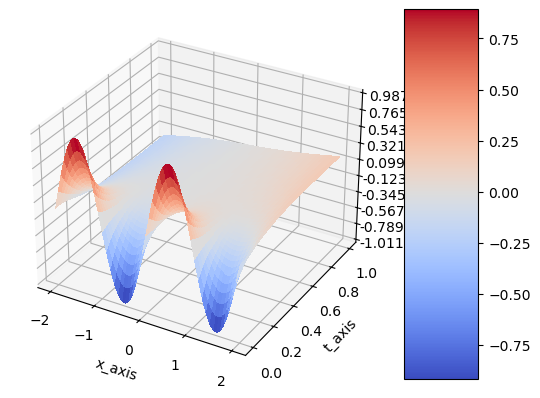

In [63]:
# Plotting the results
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Creating meshgrid for visualization
x_visual = np.arange(-2.0 , 2.0, 0.002)
t_visual = np.arange(0, 1.0, 0.002)
ms_x_visual, ms_t_visual = np.meshgrid(x_visual, t_visual)
## np.ravel returns a flattened and contiguous 1-D array containing the elements of the input.
## A copy is created only if necessary.
x_visual = np.ravel(ms_x_visual).reshape(-1, 1)
t_visual = np.ravel(ms_t_visual).reshape(-1, 1)

# Converting to PyTorch tensors
pt_x_visual = Variable(torch.from_numpy(x_visual).float(), requires_grad=True).to(device)
pt_t_visual = Variable(torch.from_numpy(t_visual).float(), requires_grad=True).to(device)

# Obtaining network predictions
## In the function net(pt_x_visualization, pt_t_visualization), the training process updates the parameters represented by theta.
pt_u_visual = net(pt_x_visual, pt_t_visual)
u_visual = pt_u_visual.data.cpu().numpy()
ms_u_visual = u_visual.reshape(ms_x_visual.shape)

# Plotting the surface
surf = ax.plot_surface(ms_x_visual, ms_t_visual, ms_u_visual, cmap=cm.coolwarm, linewidth=0, antialiased=False)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.0003f'))
ax.set_xlabel("x_axis")
ax.set_ylabel("t_axis")


# Adding colorbar for reference
fig.colorbar(surf, shrink=1, aspect=5)

# Displaying the plot
plt.show()

### 3.6.3 Comparing Training set with Actual Solution Graph

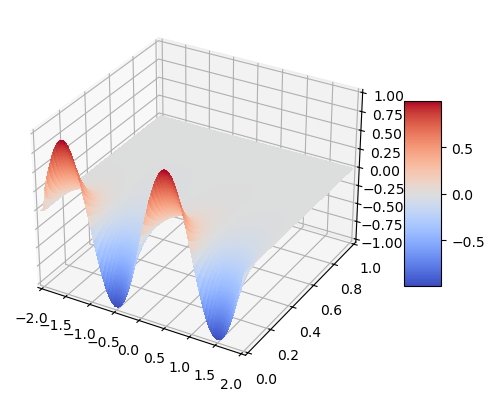

In [206]:
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

# Parameter setting
terminal_time = 1  # terminal time
num_spatial_values = 80  # spatial values for FEM
num_time_values = 1600  # time values/hops; (time_values ~ spatial_values^2)
s_value = 0.25  # s_value := k * ( (dt) / (dx)^2 )

# Uniform mesh
x_values = np.linspace(-2, 2, num_spatial_values)

# Time discretization
time_values = np.linspace(0, terminal_time, num_time_values)

# Definition of the solution u(x, t) to u_t = k * u_xx
u_values = np.zeros((num_spatial_values, num_time_values + 1))  # array to store values of the solution

# Finite Difference Scheme:

u_values[:, 0] = np.sin(np.pi * x_values)  # x_values * (x_values - 1)  # initial condition

for m in range(num_time_values):
    for j in range(1, num_spatial_values - 1):
        if j == 1 or j == num_spatial_values - 1:
            u_values[j, m] = 0  ## Boundary condition
        else:
            u_values[j, m + 1] = u_values[j, m] + s_value * (
                    u_values[j + 1, m] - 2 * u_values[j, m] + u_values[j - 1, m]) ##Inner domain values

# Plot 3D surface
T, X = np.meshgrid(time_values, x_values)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim3d(left=-2, right=2)
ax.set_ylim3d(bottom=0, top=1)
ax.set_zlim3d(bottom=-1, top=1)
surf = ax.plot_surface(X, T, u_values[:, :1600], rstride=1, cstride=1, cmap=cm.coolwarm, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()


### 3.6.4 Result
For the training set case with 50000 iteration, we easily note that the graph shape looks more similar to the actual one, than the case with 20000 iteration. The PINN (Physics-Informed Neural Network) method has the potential to improve the error bound as much as possible by increasing the number of iterations.

# 4. Reference

Files of tutorial :

[1] https://github.com/nanditadoloi/PINN/blob/main/solve_PDE_NN.ipynb

[2] https://services.math.duke.edu/education/baltimore/sample.html

[3] 'TwoDNSCH.py' file by Kevin

Paper :

[1] 'Proposal for quantitative benchmark
computations of bubble dynamics' by S. Hysing, S. Turek, D. Kuzmin, N. Parolini, E. Burman, S. Ganesank, and L. Tobiska

+)
[2] 'Solving Allen-Cahn and Cahn-Hilliard Equations using the Adaptive Physics Informed Neural Networks' by Colby L. Wight and Jia Zhao